In [42]:
#----------------------------#
# 0.) Idea
#----------------------------#
# Run PCA on
# Approaches: 
# 1.) Load Data
# 2.) Compute Embeddings PROBLEM: Don't know whether embeddings are vectors
# and whether I can compute the average
# 3.) PCA on subreddits
# 4.) PCA on submission of specific subreddits
# 5.) Multidimensional Scaling Tryout
# 6.) Vlads subreddits check
# Appendix 1: SVD/ PCA tests and sources
#
##CONCLUSION SO FAR: PCA over subreddits shows clustering, PCA over submissions within subreddits doesnt
#

import sys
import pandas as pd
import numpy as np
import re
from datetime import datetime, timedelta
from collections import Counter
from IPython.core.display import display, HTML
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
import import_ipynb

In [43]:
home_path = %pwd
data_path = "/home/pavel/Documents/Keusch_Job/Data/"
plot_path  = "/home/pavel/Documents/Keusch_Job/Tasks/subreddit_decide/"
subroutines_path = "/home/pavel/Documents/Keusch_Job/Subroutines/"

In [45]:
#Subroutines
%cd  $subroutines_path
%run "remove_contractions.py"
%run "basic_plots.ipynb"
%run "selected_subreddits.ipynb"
%run "data_loader.ipynb"
%cd  $home_path

/home/pavel/Documents/Keusch_Job/Subroutines
/home/pavel/Documents/Keusch_Job/Tasks/subreddit_decide


In [ ]:
#----------------------------#
# 1.) Load Data
#----------------------------#

In [46]:
S = load_data(data_name="SUBM_2020_01.csv", data_path = data_path)

In [89]:
S  = S.merge(selected_subreddits[["subreddit","subr_id"]], how="inner",
                               left_on = "subreddit",right_on = "subreddit")
len(S)

404631

In [ ]:
#Sample 
#S_complete = S.copy()
#S = S_complete.sample(n=10000, random_state=992747)

In [12]:
#----------------------------#
# 2.) Compute Embeddings PROBLEM: Don't know whether embeddings are vectors
# and whether I can compute the average
#----------------------------#

In [14]:
# WARNING: download through http link takes almost 30minutes
# Thats why I have it on disc in the data path
#module_url = "https://tfhub.dev/google/universal-sentence-encoder/4" #@param ["https://tfhub.dev/google/universal-sentence-encoder/4", "https://tfhub.dev/google/universal-sentence-encoder-large/5"]
#model = hub.load(module_url)
#thx to https://stackoverflow.com/questions/50322001/how-to-save-load-a-tensorflow-hub-module-to-from-a-custom-path
module_url = data_path + "universal-sentence-encoder_4"
embed_model = hub.load(module_url)

In [100]:
def embed(input): return embed_model(input)
def tf_simil(s1,s2): return np.inner(s1,s2) # inner Product as similarity! cool, but why inner product? 
# wouldn't you take cosine? 
def tf_simil_matrix(embeddings, rd = 8): return [[round(tf_simil(s1,s2),rd) for s1 in embeddings] for s2 in embeddings]

In [101]:
#test embeddings
s_1 = embed(["hello darkness my old friend"])
s_2 = embed(["hit me baby one more time"])
tf_simil(s_1,s_2)

array([[0.24345994]], dtype=float32)

In [102]:
#create dictionary of embeddingns per post
def dictionary_from_submissions(df):
    #df: something like S, wiht an id and titles
    embed_dict = {}
    for i in range(0,len(df)):
        print(str(i) + " : " + df["id"].iloc[i])
        embed_dict[df["id"].iloc[i]] = embed([df["title"].iloc[i]])
    return(embed_dict)

In [103]:
embed_dict = dictionary_from_submissions(S)

0 : t3_ei8t50
1 : t3_ei9p65
2 : t3_eiaaut
3 : t3_eiaduh
4 : t3_eiaow3
5 : t3_eias8g
6 : t3_eib6v4
7 : t3_eib8u4
8 : t3_eicqwf
9 : t3_eict4j
10 : t3_eidi28
11 : t3_eidwzx
12 : t3_eiecs1
13 : t3_eieq1v
14 : t3_eiip5f
15 : t3_eijpu0
16 : t3_eikmqy
17 : t3_eikncm
18 : t3_eikw1d
19 : t3_eil5k9
20 : t3_eilq8n
21 : t3_eilqpd
22 : t3_einkbg
23 : t3_einzbw
24 : t3_eio5hf
25 : t3_eipai1
26 : t3_eipor7
27 : t3_eipx62
28 : t3_eiq326
29 : t3_eir5h1
30 : t3_eiresd
31 : t3_eirkp0
32 : t3_eirxet
33 : t3_eitdp3
34 : t3_eitpkw
35 : t3_eiu874
36 : t3_eiusvs
37 : t3_eiy0ya
38 : t3_eiy32h
39 : t3_eiyur1
40 : t3_eizbik
41 : t3_ej013w
42 : t3_ej0cqm
43 : t3_ej0u69
44 : t3_ej1gci
45 : t3_ej1sho
46 : t3_ej2neq
47 : t3_ej2zli
48 : t3_ej3axi
49 : t3_ej3irb
50 : t3_ej3t9u
51 : t3_ej58ev
52 : t3_ej5fac
53 : t3_ej64mf
54 : t3_ej6fhr
55 : t3_ej6ho0
56 : t3_ej71uv
57 : t3_ej7d89
58 : t3_ej7ucx
59 : t3_ej89t5
60 : t3_ej8fd8
61 : t3_ej8j67
62 : t3_ej8x5r
63 : t3_ej91oc
64 : t3_ej9uux
65 : t3_ej9vsj
66 : t3_ejajay
67 : 

547 : t3_et2dbg
548 : t3_et3rq0
549 : t3_et6l14
550 : t3_et7dki
551 : t3_et7u2k
552 : t3_etapec
553 : t3_etb51k
554 : t3_etb8i3
555 : t3_etcv3c
556 : t3_etdhu2
557 : t3_etdmn5
558 : t3_ete6n4
559 : t3_ete75b
560 : t3_ete79u
561 : t3_etf7h4
562 : t3_etfjb2
563 : t3_etg98z
564 : t3_etgc9n
565 : t3_etgkwx
566 : t3_ethsfl
567 : t3_etixq3
568 : t3_etkvaj
569 : t3_etm4qr
570 : t3_etm4t1
571 : t3_etmnpk
572 : t3_etmv5z
573 : t3_etpvgo
574 : t3_etrt1v
575 : t3_etsma2
576 : t3_etu2hu
577 : t3_etu78z
578 : t3_etwyzn
579 : t3_etz4si
580 : t3_eu0fpc
581 : t3_eu1d7s
582 : t3_eu1xzt
583 : t3_eu2bru
584 : t3_eu2dcg
585 : t3_eu2hkk
586 : t3_eu3vt1
587 : t3_eu6k3l
588 : t3_eu7jpr
589 : t3_eu820s
590 : t3_eu8hbs
591 : t3_eu8jjn
592 : t3_eu8nom
593 : t3_eu8sdm
594 : t3_eu8wpn
595 : t3_eu929p
596 : t3_eu9dhh
597 : t3_eu9fq5
598 : t3_eu9nyj
599 : t3_eu9u86
600 : t3_eu9xl2
601 : t3_eua417
602 : t3_eua9np
603 : t3_euabb5
604 : t3_euajk1
605 : t3_eubbg2
606 : t3_eud2m6
607 : t3_eudx26
608 : t3_eueo8c
609 : t3

1061 : t3_emgibn
1062 : t3_emgvbf
1063 : t3_emhgp5
1064 : t3_emikeg
1065 : t3_emjmx5
1066 : t3_emk22u
1067 : t3_emkbef
1068 : t3_emkeje
1069 : t3_emko6p
1070 : t3_eml939
1071 : t3_emlqkp
1072 : t3_emnfyy
1073 : t3_emnfz1
1074 : t3_emnr9g
1075 : t3_emof69
1076 : t3_emofam
1077 : t3_emqtkl
1078 : t3_emrt91
1079 : t3_emsjfm
1080 : t3_emt4uz
1081 : t3_emu8d9
1082 : t3_emufvz
1083 : t3_emukeh
1084 : t3_emun3m
1085 : t3_emunz1
1086 : t3_emv5jm
1087 : t3_emvm04
1088 : t3_emvypq
1089 : t3_emwvyq
1090 : t3_emxjpr
1091 : t3_emxs4g
1092 : t3_emy9se
1093 : t3_emygsd
1094 : t3_emyhk9
1095 : t3_emyq5z
1096 : t3_emyv20
1097 : t3_en03mr
1098 : t3_en08bs
1099 : t3_en0eyr
1100 : t3_en22h8
1101 : t3_en2za4
1102 : t3_en2zj1
1103 : t3_en3m59
1104 : t3_en47yd
1105 : t3_en4tfb
1106 : t3_en50fg
1107 : t3_en5dgy
1108 : t3_en5ke2
1109 : t3_en6s78
1110 : t3_en7aua
1111 : t3_en7exb
1112 : t3_en7mci
1113 : t3_en7qd0
1114 : t3_en7rky
1115 : t3_en7trf
1116 : t3_en8g38
1117 : t3_en94nc
1118 : t3_en9bhc
1119 : t3_en9m

1575 : t3_etz7w5
1576 : t3_etzjsv
1577 : t3_etzvjg
1578 : t3_etzw33
1579 : t3_eu04vy
1580 : t3_eu0it6
1581 : t3_eu1z0y
1582 : t3_eu308d
1583 : t3_eu36bz
1584 : t3_eu4r3a
1585 : t3_eu4vr7
1586 : t3_eu5k09
1587 : t3_eu6vqa
1588 : t3_eu77my
1589 : t3_eu7mfu
1590 : t3_eu81tk
1591 : t3_eu8plj
1592 : t3_eu94nh
1593 : t3_eu9m2v
1594 : t3_eu9q2b
1595 : t3_eu9qc4
1596 : t3_eua5g0
1597 : t3_eubavm
1598 : t3_eucip6
1599 : t3_eucsic
1600 : t3_eucu8i
1601 : t3_eud5oh
1602 : t3_eueubb
1603 : t3_euf6gn
1604 : t3_eufkgd
1605 : t3_eufrt0
1606 : t3_euhuen
1607 : t3_euhy1p
1608 : t3_eui0i0
1609 : t3_eujhwo
1610 : t3_eujxod
1611 : t3_eulcea
1612 : t3_euluw9
1613 : t3_eun2t4
1614 : t3_eung4b
1615 : t3_eunst9
1616 : t3_euogwp
1617 : t3_euojxz
1618 : t3_eup5mg
1619 : t3_euqjid
1620 : t3_euqnln
1621 : t3_eus9wr
1622 : t3_eusdk8
1623 : t3_euu587
1624 : t3_euwbgk
1625 : t3_euwy5l
1626 : t3_euywhq
1627 : t3_ev001b
1628 : t3_ev03fu
1629 : t3_ev0rnp
1630 : t3_ev2d84
1631 : t3_ev5a8f
1632 : t3_ev5aoi
1633 : t3_ev5f

2087 : t3_el0gvc
2088 : t3_el0kmd
2089 : t3_el0s8j
2090 : t3_el16cy
2091 : t3_el1l0u
2092 : t3_el1s0e
2093 : t3_el1yep
2094 : t3_el2eu8
2095 : t3_el2hk2
2096 : t3_el2my2
2097 : t3_el2t5s
2098 : t3_el2xf0
2099 : t3_el35oy
2100 : t3_el38oy
2101 : t3_el414t
2102 : t3_el43eh
2103 : t3_el44mu
2104 : t3_el4ycs
2105 : t3_el4z8g
2106 : t3_el57se
2107 : t3_el66ya
2108 : t3_elb5s6
2109 : t3_elc0ib
2110 : t3_elc164
2111 : t3_elc1a7
2112 : t3_elc2tz
2113 : t3_elc5v4
2114 : t3_elcg47
2115 : t3_elcktw
2116 : t3_elcm0k
2117 : t3_eld2ta
2118 : t3_eld33t
2119 : t3_eld567
2120 : t3_eld854
2121 : t3_elda6w
2122 : t3_eldq36
2123 : t3_elebth
2124 : t3_eledoq
2125 : t3_elehdj
2126 : t3_elew9t
2127 : t3_elf19s
2128 : t3_elf2vw
2129 : t3_elfss1
2130 : t3_elfviz
2131 : t3_elgm0j
2132 : t3_elgnjx
2133 : t3_elgspp
2134 : t3_elgzqm
2135 : t3_elh50u
2136 : t3_elhj98
2137 : t3_elhlix
2138 : t3_elii9q
2139 : t3_elij86
2140 : t3_elika1
2141 : t3_elj2zx
2142 : t3_elj4k7
2143 : t3_elj9z6
2144 : t3_elk9l9
2145 : t3_elkf

2596 : t3_epboy0
2597 : t3_epc1v3
2598 : t3_epc9lb
2599 : t3_epc9s6
2600 : t3_epc9us
2601 : t3_epca6j
2602 : t3_epcfgh
2603 : t3_epcods
2604 : t3_epcppr
2605 : t3_epcswe
2606 : t3_epd5zn
2607 : t3_epd8ba
2608 : t3_epddt8
2609 : t3_epdefu
2610 : t3_epdllx
2611 : t3_epe9nd
2612 : t3_epenh0
2613 : t3_epes9r
2614 : t3_epev3m
2615 : t3_epewht
2616 : t3_epf1gw
2617 : t3_epf6ov
2618 : t3_epffcs
2619 : t3_epfm57
2620 : t3_epfmwb
2621 : t3_epgpyz
2622 : t3_epgxmk
2623 : t3_ephplt
2624 : t3_ephqqp
2625 : t3_ephqvv
2626 : t3_ephr87
2627 : t3_epj09s
2628 : t3_epj5iq
2629 : t3_epjsk6
2630 : t3_epjtbq
2631 : t3_epjuo1
2632 : t3_epjvsi
2633 : t3_epjx1a
2634 : t3_epk2gk
2635 : t3_epk7u7
2636 : t3_epk8nd
2637 : t3_epkb3w
2638 : t3_epkh6x
2639 : t3_epkig6
2640 : t3_epkjwb
2641 : t3_epkmoh
2642 : t3_epko4w
2643 : t3_epkqo3
2644 : t3_epkuog
2645 : t3_epkvcy
2646 : t3_epkvuy
2647 : t3_epl4sx
2648 : t3_epl6xh
2649 : t3_eple8m
2650 : t3_epm3q4
2651 : t3_epm478
2652 : t3_epm5io
2653 : t3_epmayk
2654 : t3_epme

3118 : t3_esi0xm
3119 : t3_esi4dl
3120 : t3_esi4yk
3121 : t3_esi5hx
3122 : t3_esi93e
3123 : t3_esib09
3124 : t3_esibgi
3125 : t3_esikgo
3126 : t3_esj04u
3127 : t3_esj33p
3128 : t3_esj92e
3129 : t3_esjhap
3130 : t3_esjhmu
3131 : t3_eskg15
3132 : t3_eskiuu
3133 : t3_eskl5n
3134 : t3_esks6c
3135 : t3_esle0n
3136 : t3_eslfo8
3137 : t3_eslop7
3138 : t3_esloxe
3139 : t3_eslqxz
3140 : t3_esm38i
3141 : t3_esm49u
3142 : t3_esmazh
3143 : t3_esmjpv
3144 : t3_esn3at
3145 : t3_eso0pu
3146 : t3_eso63x
3147 : t3_esogov
3148 : t3_esohcy
3149 : t3_esoo6l
3150 : t3_esoonp
3151 : t3_esotxr
3152 : t3_esp24g
3153 : t3_esp975
3154 : t3_esqcg9
3155 : t3_esqomm
3156 : t3_esqomn
3157 : t3_esqxrj
3158 : t3_esr3sn
3159 : t3_esrxym
3160 : t3_essz9f
3161 : t3_esszpo
3162 : t3_est0vo
3163 : t3_est4hl
3164 : t3_est6v6
3165 : t3_estba6
3166 : t3_estj2b
3167 : t3_estwd4
3168 : t3_esu27o
3169 : t3_esu4fs
3170 : t3_esu4ma
3171 : t3_esu92w
3172 : t3_esuc75
3173 : t3_esuhr2
3174 : t3_esults
3175 : t3_esupze
3176 : t3_esus

3639 : t3_eveall
3640 : t3_evebfd
3641 : t3_evecf3
3642 : t3_evegi6
3643 : t3_evekfl
3644 : t3_evekhh
3645 : t3_evekrt
3646 : t3_eveohr
3647 : t3_evep5b
3648 : t3_evep9r
3649 : t3_eveu9h
3650 : t3_evew2d
3651 : t3_evffv7
3652 : t3_evfh9w
3653 : t3_evfohb
3654 : t3_evfotk
3655 : t3_evfxt5
3656 : t3_evfy4b
3657 : t3_evg4si
3658 : t3_evg85i
3659 : t3_evgq18
3660 : t3_evgqay
3661 : t3_evgwfm
3662 : t3_evhbm7
3663 : t3_evhkoc
3664 : t3_evhlv3
3665 : t3_evhs00
3666 : t3_evht39
3667 : t3_evhtuq
3668 : t3_evhwah
3669 : t3_evi7s3
3670 : t3_evikzt
3671 : t3_evilmt
3672 : t3_evjc1c
3673 : t3_evkk69
3674 : t3_evkn57
3675 : t3_evkyta
3676 : t3_evmgup
3677 : t3_evmhoy
3678 : t3_evmou3
3679 : t3_evmrai
3680 : t3_evmtj8
3681 : t3_evmxqb
3682 : t3_evn72u
3683 : t3_evngxg
3684 : t3_evnhl2
3685 : t3_evnm97
3686 : t3_evnudq
3687 : t3_evnx13
3688 : t3_evo0sm
3689 : t3_evo6qp
3690 : t3_evogaq
3691 : t3_evogsz
3692 : t3_evokvc
3693 : t3_evoprf
3694 : t3_evoq34
3695 : t3_evotdn
3696 : t3_evp067
3697 : t3_evp2

4156 : t3_ek6ap2
4157 : t3_ek6cih
4158 : t3_ek6jwd
4159 : t3_ek6ygr
4160 : t3_ek765m
4161 : t3_ek7vh9
4162 : t3_ek9amb
4163 : t3_ek9ddm
4164 : t3_ek9vzz
4165 : t3_eka00l
4166 : t3_ekaerh
4167 : t3_ekafrm
4168 : t3_ekakq4
4169 : t3_ekao57
4170 : t3_ekbf0i
4171 : t3_ekd6it
4172 : t3_ekexdk
4173 : t3_ekezbg
4174 : t3_ekfa3o
4175 : t3_ekg7x3
4176 : t3_ekgqtp
4177 : t3_ekhma4
4178 : t3_ekhrl2
4179 : t3_ekhxwy
4180 : t3_eki4q9
4181 : t3_ekidem
4182 : t3_ekioy4
4183 : t3_ekiql8
4184 : t3_ekiykz
4185 : t3_ekj1l4
4186 : t3_ekjly1
4187 : t3_ekjmi9
4188 : t3_ekk63x
4189 : t3_ekk906
4190 : t3_ekknq4
4191 : t3_ekkv7h
4192 : t3_ekkxya
4193 : t3_ekl1ff
4194 : t3_ekl8eu
4195 : t3_eklhf0
4196 : t3_ekln7w
4197 : t3_eklscq
4198 : t3_ekm2y4
4199 : t3_ekmcz9
4200 : t3_ekmmpk
4201 : t3_ekn2zx
4202 : t3_ekncpp
4203 : t3_eknlwc
4204 : t3_eknwio
4205 : t3_ekodda
4206 : t3_ekolkf
4207 : t3_ekp97b
4208 : t3_ekpmlu
4209 : t3_ekq7ud
4210 : t3_ekqkdi
4211 : t3_ekqnwo
4212 : t3_ekqsvc
4213 : t3_ekqypa
4214 : t3_ekro

4684 : t3_eq7vok
4685 : t3_eq7wwh
4686 : t3_eq7yk8
4687 : t3_eq85dw
4688 : t3_eq8dpa
4689 : t3_eq8iis
4690 : t3_eq8mgx
4691 : t3_eq8n16
4692 : t3_eq8zfv
4693 : t3_eq943u
4694 : t3_eq97pk
4695 : t3_eq9in6
4696 : t3_eq9mge
4697 : t3_eqarao
4698 : t3_eqb2rp
4699 : t3_eqb8u2
4700 : t3_eqb996
4701 : t3_eqbd5o
4702 : t3_eqbf50
4703 : t3_eqbrdg
4704 : t3_eqbuvi
4705 : t3_eqc0av
4706 : t3_eqcx0w
4707 : t3_eqd006
4708 : t3_eqd52q
4709 : t3_eqdcvk
4710 : t3_eqdk45
4711 : t3_eqe1wh
4712 : t3_eqeh0m
4713 : t3_eqf8i3
4714 : t3_eqhhfh
4715 : t3_eqhrl9
4716 : t3_eqi7xg
4717 : t3_eqi9n5
4718 : t3_eqij1a
4719 : t3_eqj69g
4720 : t3_eqj8tr
4721 : t3_eqjlij
4722 : t3_eqknf9
4723 : t3_eqkuxl
4724 : t3_eql00p
4725 : t3_eqlqjt
4726 : t3_eqltq1
4727 : t3_eqm6f2
4728 : t3_eqn69t
4729 : t3_eqnsii
4730 : t3_eqos2z
4731 : t3_eqotsa
4732 : t3_eqpa27
4733 : t3_eqpi5q
4734 : t3_eqptx9
4735 : t3_eqqdrb
4736 : t3_eqqrb3
4737 : t3_eqr5st
4738 : t3_eqrjb6
4739 : t3_eqs086
4740 : t3_eqsaef
4741 : t3_eqsxe8
4742 : t3_eqt1

5208 : t3_evyan3
5209 : t3_evyc0t
5210 : t3_evygr5
5211 : t3_evyjh2
5212 : t3_evymuw
5213 : t3_evyxct
5214 : t3_evyzlu
5215 : t3_evzen5
5216 : t3_ew02gj
5217 : t3_ew08pf
5218 : t3_ew0ebi
5219 : t3_ew0uyw
5220 : t3_ew1m9m
5221 : t3_ew1m9p
5222 : t3_ew2djh
5223 : t3_ew41m3
5224 : t3_ew57uy
5225 : t3_ew73uz
5226 : t3_ew77kh
5227 : t3_ew78nm
5228 : t3_ew7dsy
5229 : t3_ew7hj0
5230 : t3_ew7w8j
5231 : t3_ew84y1
5232 : t3_ew8735
5233 : t3_ew8c82
5234 : t3_ew93jb
5235 : t3_ew9ddd
5236 : t3_ew9e6z
5237 : t3_ew9gza
5238 : t3_ew9mxw
5239 : t3_ew9ri9
5240 : t3_ew9s6k
5241 : t3_ewarsp
5242 : t3_ewb3u2
5243 : t3_ewbjq2
5244 : t3_ewc9pg
5245 : t3_ewcbxl
5246 : t3_ewcke8
5247 : t3_ewclv3
5248 : t3_ewd6tl
5249 : t3_ewdciq
5250 : t3_ewdof9
5251 : t3_ewe6co
5252 : t3_ewe9ug
5253 : t3_eweq1z
5254 : t3_ewfs6x
5255 : t3_ewfvdi
5256 : t3_ewg8ub
5257 : t3_ewghbv
5258 : t3_ewh2a2
5259 : t3_ewh8jf
5260 : t3_ewhilv
5261 : t3_ewhp74
5262 : t3_ewi07i
5263 : t3_ewia0u
5264 : t3_ewic6x
5265 : t3_ewidw2
5266 : t3_ewio

5733 : t3_em9lo1
5734 : t3_ema15x
5735 : t3_ema7ye
5736 : t3_ema8ey
5737 : t3_emaj4h
5738 : t3_emamy2
5739 : t3_emaywc
5740 : t3_emc25e
5741 : t3_emc2em
5742 : t3_emc3w6
5743 : t3_emc5vf
5744 : t3_emccqe
5745 : t3_emcda1
5746 : t3_emct9n
5747 : t3_emd8wn
5748 : t3_emddt3
5749 : t3_ememrn
5750 : t3_emeynh
5751 : t3_emfeih
5752 : t3_emg28c
5753 : t3_emgcye
5754 : t3_emh2hy
5755 : t3_emh643
5756 : t3_emh7ur
5757 : t3_emheyu
5758 : t3_emhmxb
5759 : t3_emi0ed
5760 : t3_emindd
5761 : t3_emiqr9
5762 : t3_emiu0y
5763 : t3_emix53
5764 : t3_emj0wl
5765 : t3_emj6zy
5766 : t3_emj7c6
5767 : t3_emj7kc
5768 : t3_emjkpc
5769 : t3_emk6ua
5770 : t3_emk7ej
5771 : t3_emkflv
5772 : t3_eml2m8
5773 : t3_emlcxl
5774 : t3_emlk26
5775 : t3_emlqyp
5776 : t3_emlu67
5777 : t3_emm1i3
5778 : t3_emmcvz
5779 : t3_emmed5
5780 : t3_emmzgm
5781 : t3_emnkku
5782 : t3_emnov6
5783 : t3_emnplc
5784 : t3_emoi9f
5785 : t3_emoii8
5786 : t3_emolmg
5787 : t3_empu2a
5788 : t3_emq806
5789 : t3_emqk1h
5790 : t3_emqq6v
5791 : t3_emqs

6258 : t3_eqrfn7
6259 : t3_eqsupx
6260 : t3_eqt5g5
6261 : t3_eqt69i
6262 : t3_eqwd4o
6263 : t3_eqwrw7
6264 : t3_eqwt8e
6265 : t3_eqx2f2
6266 : t3_eqxhdo
6267 : t3_eqxjb9
6268 : t3_eqxu0k
6269 : t3_eqy1sk
6270 : t3_eqy8rt
6271 : t3_eqylaz
6272 : t3_eqysrz
6273 : t3_eqyy9e
6274 : t3_eqz3cf
6275 : t3_er0e7v
6276 : t3_er0iin
6277 : t3_er0jpd
6278 : t3_er0kv9
6279 : t3_er13wh
6280 : t3_er1b2r
6281 : t3_er1yry
6282 : t3_er28y1
6283 : t3_er29sn
6284 : t3_er2a1m
6285 : t3_er2a9y
6286 : t3_er2b6z
6287 : t3_er2bhk
6288 : t3_er2c21
6289 : t3_er2cby
6290 : t3_er2cn2
6291 : t3_er2dkl
6292 : t3_er2dr4
6293 : t3_er2o2j
6294 : t3_er2r9m
6295 : t3_er3fxp
6296 : t3_er4499
6297 : t3_er4dm3
6298 : t3_er4qi3
6299 : t3_er4r20
6300 : t3_er5827
6301 : t3_er5d2i
6302 : t3_er5h4z
6303 : t3_er615d
6304 : t3_er642q
6305 : t3_er6zm0
6306 : t3_er7j07
6307 : t3_er7klx
6308 : t3_er7rn2
6309 : t3_er82kl
6310 : t3_er8yh8
6311 : t3_erauxg
6312 : t3_erawpv
6313 : t3_eraxkk
6314 : t3_erazt3
6315 : t3_erbhww
6316 : t3_ercl

6784 : t3_ew914r
6785 : t3_ew99ns
6786 : t3_ew9qy5
6787 : t3_ewa0gr
6788 : t3_ewa8g6
6789 : t3_ewaobk
6790 : t3_ewb2ti
6791 : t3_ewber3
6792 : t3_ewbgsq
6793 : t3_ewcb07
6794 : t3_ewcbbh
6795 : t3_ewcbkh
6796 : t3_ewccdl
6797 : t3_ewcct6
6798 : t3_ewcdfd
6799 : t3_ewcdnr
6800 : t3_ewce5v
6801 : t3_ewceg4
6802 : t3_ewcfim
6803 : t3_ewcgat
6804 : t3_ewch7m
6805 : t3_ewchte
6806 : t3_ewcuyn
6807 : t3_ewcy1x
6808 : t3_ewd2kr
6809 : t3_ewdbbg
6810 : t3_ewevn1
6811 : t3_ewew9b
6812 : t3_ewexex
6813 : t3_ewffib
6814 : t3_ewfrq3
6815 : t3_ewfxhx
6816 : t3_ewgalz
6817 : t3_ewh2f9
6818 : t3_ewh7xw
6819 : t3_ewir74
6820 : t3_ewmd6c
6821 : t3_ewo40i
6822 : t3_ewobt7
6823 : t3_ewoyz6
6824 : t3_ewpz7x
6825 : t3_ewqozv
6826 : t3_ewru1x
6827 : t3_ewrvat
6828 : t3_ews0rx
6829 : t3_ews1wv
6830 : t3_ewsbd6
6831 : t3_ewsirq
6832 : t3_ewsjwm
6833 : t3_ewsjyv
6834 : t3_ewszef
6835 : t3_ewt0ck
6836 : t3_ewt0na
6837 : t3_ewth50
6838 : t3_ewtmvd
6839 : t3_ewv4z6
6840 : t3_ewv5r4
6841 : t3_ewva0v
6842 : t3_ewvj

7309 : t3_epjd12
7310 : t3_epjqeg
7311 : t3_epjy57
7312 : t3_epk1rm
7313 : t3_epkjjd
7314 : t3_epkrd7
7315 : t3_eplbeo
7316 : t3_eplbth
7317 : t3_eplkui
7318 : t3_eplwz9
7319 : t3_epm70l
7320 : t3_epmc2n
7321 : t3_epmcj2
7322 : t3_epmwuw
7323 : t3_epn08y
7324 : t3_epn15q
7325 : t3_epnuch
7326 : t3_epo34x
7327 : t3_epo6ia
7328 : t3_eppa03
7329 : t3_eppcle
7330 : t3_epq297
7331 : t3_epq2ge
7332 : t3_epqs06
7333 : t3_epr6ed
7334 : t3_epsl1c
7335 : t3_epspao
7336 : t3_epsz9z
7337 : t3_eptw1c
7338 : t3_epv6uc
7339 : t3_epvcr6
7340 : t3_epwd2p
7341 : t3_epwx36
7342 : t3_epyxh1
7343 : t3_epyych
7344 : t3_epzs98
7345 : t3_eq007p
7346 : t3_eq0ipn
7347 : t3_eq0j6p
7348 : t3_eq2bya
7349 : t3_eq2j72
7350 : t3_eq2tf6
7351 : t3_eq3549
7352 : t3_eq35g0
7353 : t3_eq3lxs
7354 : t3_eq4c27
7355 : t3_eq4fkx
7356 : t3_eq4g0s
7357 : t3_eq5ibm
7358 : t3_eq5n71
7359 : t3_eq66ze
7360 : t3_eq69h0
7361 : t3_eq6bii
7362 : t3_eq6dly
7363 : t3_eq6ucm
7364 : t3_eq7h6m
7365 : t3_eq90u1
7366 : t3_eq997s
7367 : t3_eqfa

7839 : t3_eizxk7
7840 : t3_ej073a
7841 : t3_ej09t3
7842 : t3_ej0ema
7843 : t3_ej13ni
7844 : t3_ej1axg
7845 : t3_ej1f7i
7846 : t3_ej1g3a
7847 : t3_ej1iy4
7848 : t3_ej1msx
7849 : t3_ej3n2g
7850 : t3_ej4o15
7851 : t3_ej4on1
7852 : t3_ej52r1
7853 : t3_ej6km0
7854 : t3_ej761q
7855 : t3_ej8vla
7856 : t3_ej9adk
7857 : t3_ej9ci0
7858 : t3_ej9ok5
7859 : t3_eja134
7860 : t3_eja47i
7861 : t3_ejao0s
7862 : t3_ejaujx
7863 : t3_ejb2h5
7864 : t3_ejbgcw
7865 : t3_ejcod3
7866 : t3_ejd2ag
7867 : t3_ejd37p
7868 : t3_ejd3zb
7869 : t3_ejd5d1
7870 : t3_ejd7sz
7871 : t3_ejde0b
7872 : t3_ejdt9z
7873 : t3_ejdzvx
7874 : t3_eje3e4
7875 : t3_ejeeyd
7876 : t3_ejejyk
7877 : t3_ejfbhl
7878 : t3_ejfeoa
7879 : t3_ejfj4f
7880 : t3_ejh4ix
7881 : t3_eji8uj
7882 : t3_eji9e2
7883 : t3_ejimek
7884 : t3_ejj0cx
7885 : t3_ejj9yy
7886 : t3_ejk4uo
7887 : t3_ejk6nn
7888 : t3_ejk6r9
7889 : t3_ejkcv2
7890 : t3_ejkmrr
7891 : t3_ejlgc9
7892 : t3_ejlvdk
7893 : t3_ejq4oj
7894 : t3_ejqtsm
7895 : t3_ejremh
7896 : t3_ejrmsp
7897 : t3_ejst

8371 : t3_ephzk1
8372 : t3_epi6he
8373 : t3_epi9wu
8374 : t3_epignr
8375 : t3_epipb4
8376 : t3_epj4oy
8377 : t3_epje8g
8378 : t3_epjvbb
8379 : t3_epk0p5
8380 : t3_epkdt8
8381 : t3_epkx4v
8382 : t3_epl4rw
8383 : t3_epmknq
8384 : t3_epmt4z
8385 : t3_epmylp
8386 : t3_epn010
8387 : t3_epn3z0
8388 : t3_epn6qp
8389 : t3_epn9bu
8390 : t3_epnczc
8391 : t3_epnoxp
8392 : t3_epnuc1
8393 : t3_epoewr
8394 : t3_epopi4
8395 : t3_eppd6e
8396 : t3_epphb0
8397 : t3_eppmor
8398 : t3_eppnh8
8399 : t3_epqt7v
8400 : t3_epqylx
8401 : t3_epryif
8402 : t3_epsu9s
8403 : t3_epszes
8404 : t3_ept44a
8405 : t3_epu0is
8406 : t3_epun9l
8407 : t3_epv36x
8408 : t3_epv7mx
8409 : t3_epw0uw
8410 : t3_epw7vi
8411 : t3_epwc0q
8412 : t3_epwg5z
8413 : t3_epwk7n
8414 : t3_epwnoo
8415 : t3_epwr6q
8416 : t3_epwt41
8417 : t3_epwuog
8418 : t3_epwzrf
8419 : t3_epxrcp
8420 : t3_epxtw1
8421 : t3_epxxj6
8422 : t3_epxxtp
8423 : t3_epy0f4
8424 : t3_epy1uw
8425 : t3_epyhyc
8426 : t3_epyqnp
8427 : t3_epyz07
8428 : t3_epyz37
8429 : t3_epz2

8902 : t3_ev3p0h
8903 : t3_ev3su5
8904 : t3_ev3syj
8905 : t3_ev3x30
8906 : t3_ev401s
8907 : t3_ev43w2
8908 : t3_ev46mg
8909 : t3_ev470z
8910 : t3_ev484v
8911 : t3_ev49py
8912 : t3_ev49uc
8913 : t3_ev4a6n
8914 : t3_ev4amx
8915 : t3_ev4d25
8916 : t3_ev4i0d
8917 : t3_ev4swq
8918 : t3_ev4y2q
8919 : t3_ev5o79
8920 : t3_ev5xba
8921 : t3_ev7j0v
8922 : t3_ev82rm
8923 : t3_ev83xs
8924 : t3_ev8edz
8925 : t3_ev8g10
8926 : t3_ev92gv
8927 : t3_ev9ab3
8928 : t3_ev9hbt
8929 : t3_ev9hl3
8930 : t3_ev9iol
8931 : t3_ev9z8g
8932 : t3_eva6ce
8933 : t3_evao6i
8934 : t3_evasyq
8935 : t3_evax8r
8936 : t3_evb4u0
8937 : t3_evb9zr
8938 : t3_evbcau
8939 : t3_evca5z
8940 : t3_evch6d
8941 : t3_evcls6
8942 : t3_evcogx
8943 : t3_evd7cj
8944 : t3_evdqzc
8945 : t3_evef1u
8946 : t3_evegd9
8947 : t3_evenbc
8948 : t3_evf987
8949 : t3_evfeh6
8950 : t3_evfj3l
8951 : t3_evfo8d
8952 : t3_evfymw
8953 : t3_evgf0v
8954 : t3_evglff
8955 : t3_evgv39
8956 : t3_evh2e6
8957 : t3_evhs35
8958 : t3_evi57k
8959 : t3_evi8av
8960 : t3_evi8

9432 : t3_eob8j0
9433 : t3_eoe2xo
9434 : t3_eofi1q
9435 : t3_eok79p
9436 : t3_eollpm
9437 : t3_eolner
9438 : t3_eolx05
9439 : t3_eom75i
9440 : t3_eombfy
9441 : t3_eomsa0
9442 : t3_eon2lv
9443 : t3_eon2m8
9444 : t3_eonkna
9445 : t3_eonru3
9446 : t3_eonv4d
9447 : t3_eoo7uz
9448 : t3_eoo9xd
9449 : t3_eoor8n
9450 : t3_eop1m7
9451 : t3_eopnbf
9452 : t3_eoqjgh
9453 : t3_eotusa
9454 : t3_eouclg
9455 : t3_eowf7d
9456 : t3_eox8as
9457 : t3_ep0kwl
9458 : t3_ep1cqb
9459 : t3_ep2crg
9460 : t3_ep3u91
9461 : t3_ep5u0k
9462 : t3_ep644x
9463 : t3_ep6z6p
9464 : t3_ep86fk
9465 : t3_ep9zue
9466 : t3_epazq6
9467 : t3_eph7jv
9468 : t3_epjd9e
9469 : t3_epjtsb
9470 : t3_epkogh
9471 : t3_epltjw
9472 : t3_epmj0h
9473 : t3_epnllr
9474 : t3_epom0w
9475 : t3_epopqf
9476 : t3_epsffj
9477 : t3_epsgyo
9478 : t3_ept9fv
9479 : t3_epub2w
9480 : t3_epwpqt
9481 : t3_epx31x
9482 : t3_epxjeo
9483 : t3_eq01c1
9484 : t3_eq08hh
9485 : t3_eq10pn
9486 : t3_eq15g5
9487 : t3_eq1i20
9488 : t3_eq2o4r
9489 : t3_eq3w83
9490 : t3_eq4z

9960 : t3_ek3xsz
9961 : t3_ek4rks
9962 : t3_ek4v1g
9963 : t3_ek759n
9964 : t3_ek7gf6
9965 : t3_ek7kl3
9966 : t3_ek820c
9967 : t3_ek89fd
9968 : t3_ek8cac
9969 : t3_ek9bfb
9970 : t3_ek9fld
9971 : t3_ek9vo2
9972 : t3_ek9yd7
9973 : t3_ekaelv
9974 : t3_ekapf8
9975 : t3_ekayv5
9976 : t3_ekb975
9977 : t3_ekbeqt
9978 : t3_ekbm09
9979 : t3_ekbpm5
9980 : t3_ekbwrh
9981 : t3_ekbzli
9982 : t3_ekcfdu
9983 : t3_ekct6x
9984 : t3_ekd1ey
9985 : t3_ekd3o7
9986 : t3_ekd5qv
9987 : t3_eke5dw
9988 : t3_ekee6r
9989 : t3_ekesd0
9990 : t3_ekf6w7
9991 : t3_ekfw8j
9992 : t3_ekg1dp
9993 : t3_ekgzya
9994 : t3_ekhbt3
9995 : t3_ekhl1k
9996 : t3_eki6ib
9997 : t3_ekidn2
9998 : t3_ekiikz
9999 : t3_ekimcj
10000 : t3_ekjcy2
10001 : t3_ekjpz4
10002 : t3_ekk53z
10003 : t3_ekltsu
10004 : t3_ekmfaw
10005 : t3_ekmlly
10006 : t3_eknd6z
10007 : t3_eko4hy
10008 : t3_ekotxt
10009 : t3_ekoy2h
10010 : t3_ekp3sy
10011 : t3_ekpe43
10012 : t3_ekprgu
10013 : t3_ekpv54
10014 : t3_ekq13d
10015 : t3_ekq4pi
10016 : t3_ekqpwi
10017 : t3_ekr

10425 : t3_eo6u6l
10426 : t3_eo79uv
10427 : t3_eo7p4q
10428 : t3_eo83oj
10429 : t3_eo8j7f
10430 : t3_eo8y5z
10431 : t3_eo9f5v
10432 : t3_eo9ta4
10433 : t3_eoa8sv
10434 : t3_eobl0g
10435 : t3_eobrox
10436 : t3_eoc0w7
10437 : t3_eocfne
10438 : t3_eod8an
10439 : t3_eodt8b
10440 : t3_eoe0fy
10441 : t3_eoey66
10442 : t3_eof2pl
10443 : t3_eofqne
10444 : t3_eoft9x
10445 : t3_eoglri
10446 : t3_eogn7c
10447 : t3_eogzfm
10448 : t3_eoh51n
10449 : t3_eohlri
10450 : t3_eohzgd
10451 : t3_eoi5cm
10452 : t3_eoicoa
10453 : t3_eoiqlv
10454 : t3_eoj3xb
10455 : t3_eoj4u2
10456 : t3_eoj6aw
10457 : t3_eojiye
10458 : t3_eojmaw
10459 : t3_eojr1z
10460 : t3_eojrtv
10461 : t3_eojuui
10462 : t3_eok3ty
10463 : t3_eokdrq
10464 : t3_eoko3g
10465 : t3_eokp9p
10466 : t3_eokrrd
10467 : t3_eokxn8
10468 : t3_eol4d9
10469 : t3_eolazb
10470 : t3_eolco5
10471 : t3_eoln8j
10472 : t3_eolp0m
10473 : t3_eom076
10474 : t3_eom23i
10475 : t3_eom5b5
10476 : t3_eomdlu
10477 : t3_eomfjy
10478 : t3_eomje0
10479 : t3_eomrg1
10480 : t3

10889 : t3_erx7vh
10890 : t3_erx7vp
10891 : t3_erxbg7
10892 : t3_erxgds
10893 : t3_erxpm0
10894 : t3_eryci6
10895 : t3_erz8tp
10896 : t3_erzmy5
10897 : t3_erzsqw
10898 : t3_erzwoa
10899 : t3_es005o
10900 : t3_es00z1
10901 : t3_es02ch
10902 : t3_es057l
10903 : t3_es0837
10904 : t3_es0dl6
10905 : t3_es0dz9
10906 : t3_es0hwg
10907 : t3_es0xrx
10908 : t3_es1tsa
10909 : t3_es28ab
10910 : t3_es3g5i
10911 : t3_es3ibk
10912 : t3_es3l78
10913 : t3_es3uqo
10914 : t3_es4guz
10915 : t3_es4jwx
10916 : t3_es53bg
10917 : t3_es54fs
10918 : t3_es5enw
10919 : t3_es5ttk
10920 : t3_es5wuc
10921 : t3_es63at
10922 : t3_es64v1
10923 : t3_es6op0
10924 : t3_es6tk2
10925 : t3_es7bbk
10926 : t3_es7gva
10927 : t3_es7sz3
10928 : t3_es7w5m
10929 : t3_es82rd
10930 : t3_es86gh
10931 : t3_es8gvh
10932 : t3_es8gwp
10933 : t3_es8l5c
10934 : t3_es8ofv
10935 : t3_es8rwe
10936 : t3_es8yb3
10937 : t3_es91mk
10938 : t3_es91ys
10939 : t3_es993f
10940 : t3_es995y
10941 : t3_es9e2t
10942 : t3_es9lbz
10943 : t3_es9lz1
10944 : t3

11356 : t3_evleut
11357 : t3_evlk9s
11358 : t3_evlmtd
11359 : t3_evlo59
11360 : t3_evlxrp
11361 : t3_evm8n2
11362 : t3_evm8wg
11363 : t3_evm98y
11364 : t3_evma57
11365 : t3_evmdf0
11366 : t3_evmdli
11367 : t3_evmjow
11368 : t3_evmmkb
11369 : t3_evmum8
11370 : t3_evn6p8
11371 : t3_evnbf8
11372 : t3_evnjsn
11373 : t3_evnkof
11374 : t3_evnx20
11375 : t3_evnxud
11376 : t3_evo7iw
11377 : t3_evoamf
11378 : t3_evobkx
11379 : t3_evoq72
11380 : t3_evoty0
11381 : t3_evoyv1
11382 : t3_evp6bm
11383 : t3_evpfur
11384 : t3_evpiu8
11385 : t3_evpjqa
11386 : t3_evpjqm
11387 : t3_evpyzv
11388 : t3_evqeqr
11389 : t3_evqu5p
11390 : t3_evra1j
11391 : t3_evrlol
11392 : t3_evrqcs
11393 : t3_evs6wc
11394 : t3_evs6wr
11395 : t3_evsk64
11396 : t3_evsobf
11397 : t3_evsobo
11398 : t3_evsoc4
11399 : t3_evsocc
11400 : t3_evsock
11401 : t3_evt5ie
11402 : t3_evt8vq
11403 : t3_evt99h
11404 : t3_evticx
11405 : t3_evtmgv
11406 : t3_evtmh7
11407 : t3_evtmhe
11408 : t3_evtmhq
11409 : t3_evtmhz
11410 : t3_evtmid
11411 : t3

11822 : t3_ejwmsx
11823 : t3_ejx016
11824 : t3_ejxrit
11825 : t3_ejz5fm
11826 : t3_ek0ca4
11827 : t3_ek0caf
11828 : t3_ek0cao
11829 : t3_ek0mtq
11830 : t3_ek14q9
11831 : t3_ek2n4n
11832 : t3_ek2v43
11833 : t3_ek3vs1
11834 : t3_ek52d6
11835 : t3_ek56gn
11836 : t3_ek56gx
11837 : t3_ek578q
11838 : t3_ek700d
11839 : t3_ek7cph
11840 : t3_ek7cpo
11841 : t3_ek7kct
11842 : t3_ek85ij
11843 : t3_ek9bl8
11844 : t3_ek9blg
11845 : t3_ek9blo
11846 : t3_ek9blu
11847 : t3_ek9bm0
11848 : t3_ek9bmc
11849 : t3_ek9qcf
11850 : t3_eka7bu
11851 : t3_ekaw3p
11852 : t3_ekbonk
11853 : t3_ekg0c8
11854 : t3_ekg3ai
11855 : t3_ekg53b
11856 : t3_ekg6xz
11857 : t3_ekgv4z
11858 : t3_ekgv5b
11859 : t3_ekgv5r
11860 : t3_ekhrvx
11861 : t3_ekizmr
11862 : t3_ekj8rd
11863 : t3_ekjc6w
11864 : t3_ekjc7b
11865 : t3_ekls6e
11866 : t3_ekls6q
11867 : t3_ekls6y
11868 : t3_ekmr4s
11869 : t3_eknuo7
11870 : t3_eko3kz
11871 : t3_ekolro
11872 : t3_ekoy7o
11873 : t3_ekpn6z
11874 : t3_ekq27i
11875 : t3_ekq3ya
11876 : t3_ekq3ym
11877 : t3

12283 : t3_eqk6w8
12284 : t3_eqk6wf
12285 : t3_eqk6ww
12286 : t3_eqmnft
12287 : t3_eqmom1
12288 : t3_eqnp0b
12289 : t3_eqqfu1
12290 : t3_eqr5kp
12291 : t3_eqr5l1
12292 : t3_eqswzy
12293 : t3_eqsx08
12294 : t3_eqsx0h
12295 : t3_equacl
12296 : t3_equacy
12297 : t3_eqvcgq
12298 : t3_eqw3qe
12299 : t3_eqx4tf
12300 : t3_eqx4ym
12301 : t3_eqxlu9
12302 : t3_eqxlus
12303 : t3_eqygd4
12304 : t3_er02fe
12305 : t3_er02ft
12306 : t3_er03ci
12307 : t3_er03k0
12308 : t3_er2lyn
12309 : t3_er2mw1
12310 : t3_er2mwd
12311 : t3_er2mwo
12312 : t3_er52wg
12313 : t3_er7aok
12314 : t3_er7r5h
12315 : t3_er7ynx
12316 : t3_er9da0
12317 : t3_er9dac
12318 : t3_er9dal
12319 : t3_er9daw
12320 : t3_er9ygd
12321 : t3_erb1ue
12322 : t3_erclty
12323 : t3_erclu7
12324 : t3_erdh4f
12325 : t3_eren48
12326 : t3_eren4n
12327 : t3_ergsup
12328 : t3_erhaul
12329 : t3_erhauz
12330 : t3_erhavd
12331 : t3_erhavm
12332 : t3_erhaw0
12333 : t3_erhawa
12334 : t3_erhawg
12335 : t3_erhawp
12336 : t3_erhawy
12337 : t3_erhax9
12338 : t3

12741 : t3_ex7okl
12742 : t3_ex8ti4
12743 : t3_exadxn
12744 : t3_ei7oz9
12745 : t3_ei7r3h
12746 : t3_ei7y5m
12747 : t3_ei8k6h
12748 : t3_ei8kyh
12749 : t3_ei8l2b
12750 : t3_ei9p7k
12751 : t3_ei9toa
12752 : t3_ei9tw5
12753 : t3_eiafgx
12754 : t3_eiagjn
12755 : t3_eibbw5
12756 : t3_eick6s
12757 : t3_eicqx8
12758 : t3_eid4pc
12759 : t3_eidiqr
12760 : t3_eiet18
12761 : t3_eij1nh
12762 : t3_eij8gp
12763 : t3_eiji5p
12764 : t3_eijs2x
12765 : t3_eiksxe
12766 : t3_eikzkz
12767 : t3_eil0qa
12768 : t3_eil64i
12769 : t3_eilkfj
12770 : t3_einj42
12771 : t3_eioqh6
12772 : t3_eiovha
12773 : t3_eiqldg
12774 : t3_eircf1
12775 : t3_eiryb8
12776 : t3_eis8ig
12777 : t3_eisaf5
12778 : t3_eisher
12779 : t3_eiu3ka
12780 : t3_eivexe
12781 : t3_eiwg19
12782 : t3_eiwteg
12783 : t3_eix392
12784 : t3_eiy9su
12785 : t3_eiyfi1
12786 : t3_eiyg06
12787 : t3_eiyhid
12788 : t3_eiz5uw
12789 : t3_eiz8z4
12790 : t3_eizalr
12791 : t3_ej0ihc
12792 : t3_ej0lul
12793 : t3_ej0wnp
12794 : t3_ej2kam
12795 : t3_ej3n91
12796 : t3

13204 : t3_eot1ru
13205 : t3_eotezh
13206 : t3_eou96n
13207 : t3_eousq4
13208 : t3_eouyn2
13209 : t3_eov62m
13210 : t3_eovao9
13211 : t3_eowbf6
13212 : t3_eox1cy
13213 : t3_eoxoqk
13214 : t3_eoxq8n
13215 : t3_eoy7h2
13216 : t3_ep002r
13217 : t3_ep13av
13218 : t3_ep13xt
13219 : t3_ep1gje
13220 : t3_ep1m6k
13221 : t3_ep1pud
13222 : t3_ep1t1w
13223 : t3_ep1u0p
13224 : t3_ep1ykr
13225 : t3_ep2hx9
13226 : t3_ep2kv5
13227 : t3_ep2p0m
13228 : t3_ep2vm3
13229 : t3_ep2yp8
13230 : t3_ep31km
13231 : t3_ep31rv
13232 : t3_ep32s7
13233 : t3_ep34o6
13234 : t3_ep3bfg
13235 : t3_ep3byt
13236 : t3_ep3c8e
13237 : t3_ep3ixd
13238 : t3_ep3r9j
13239 : t3_ep42ob
13240 : t3_ep46xp
13241 : t3_ep4hj2
13242 : t3_ep4m1u
13243 : t3_ep4wbp
13244 : t3_ep4yot
13245 : t3_ep53hp
13246 : t3_ep53mo
13247 : t3_ep5883
13248 : t3_ep5bp1
13249 : t3_ep5p2t
13250 : t3_ep5qv3
13251 : t3_ep5yg9
13252 : t3_ep6uno
13253 : t3_ep6x1y
13254 : t3_ep7epe
13255 : t3_ep7fwt
13256 : t3_ep7spn
13257 : t3_ep80dd
13258 : t3_ep81f2
13259 : t3

13670 : t3_eubn5h
13671 : t3_euci0h
13672 : t3_eudypb
13673 : t3_eudzoq
13674 : t3_eueilh
13675 : t3_euf0kj
13676 : t3_euh8t5
13677 : t3_euhf17
13678 : t3_euihh6
13679 : t3_euja0d
13680 : t3_eukdov
13681 : t3_eulbim
13682 : t3_eumm5i
13683 : t3_eun3qj
13684 : t3_eunj1m
13685 : t3_eunyse
13686 : t3_euo7cj
13687 : t3_euo9mp
13688 : t3_euob3e
13689 : t3_euoj2k
13690 : t3_eup06x
13691 : t3_eupgua
13692 : t3_euphab
13693 : t3_euqm80
13694 : t3_euqr3w
13695 : t3_euqt42
13696 : t3_euqv40
13697 : t3_euqypw
13698 : t3_eur5vs
13699 : t3_eurao6
13700 : t3_euroqa
13701 : t3_eurpvb
13702 : t3_eurst3
13703 : t3_euss8n
13704 : t3_eusv9g
13705 : t3_euts73
13706 : t3_eutzfe
13707 : t3_euugmi
13708 : t3_euuher
13709 : t3_euuiv7
13710 : t3_euuooy
13711 : t3_euupr5
13712 : t3_euus3u
13713 : t3_euuv4z
13714 : t3_euv37k
13715 : t3_euvjkt
13716 : t3_euvkqu
13717 : t3_euw3u3
13718 : t3_euwdbf
13719 : t3_euwzqf
13720 : t3_eux27w
13721 : t3_euxwtj
13722 : t3_euzfvo
13723 : t3_euzwts
13724 : t3_ev12jv
13725 : t3

14136 : t3_eic9xa
14137 : t3_eic9xf
14138 : t3_eicaao
14139 : t3_eicc5u
14140 : t3_eicc8a
14141 : t3_eice4l
14142 : t3_eicewb
14143 : t3_eicf1v
14144 : t3_eicf24
14145 : t3_eicftv
14146 : t3_eicg3q
14147 : t3_eicjnz
14148 : t3_eicju6
14149 : t3_eicjzp
14150 : t3_eickch
14151 : t3_eickdc
14152 : t3_eicmfj
14153 : t3_eicml8
14154 : t3_eicnuw
14155 : t3_eicohs
14156 : t3_eicozu
14157 : t3_eicr9k
14158 : t3_eicrqq
14159 : t3_eicrwc
14160 : t3_eicrza
14161 : t3_eicsdh
14162 : t3_eicsnm
14163 : t3_eict0a
14164 : t3_eict1r
14165 : t3_eict6d
14166 : t3_eictnq
14167 : t3_eictr5
14168 : t3_eicu39
14169 : t3_eicv22
14170 : t3_eicv4x
14171 : t3_eicwck
14172 : t3_eicwsv
14173 : t3_eicx6c
14174 : t3_eicxgr
14175 : t3_eicy29
14176 : t3_eicy6h
14177 : t3_eicy7u
14178 : t3_eid0bl
14179 : t3_eid0ns
14180 : t3_eid0y3
14181 : t3_eid2je
14182 : t3_eid2ti
14183 : t3_eid2w1
14184 : t3_eid2xt
14185 : t3_eid30h
14186 : t3_eid3i9
14187 : t3_eid57p
14188 : t3_eid5e2
14189 : t3_eid5ms
14190 : t3_eid60c
14191 : t3

14607 : t3_einuqd
14608 : t3_einw8f
14609 : t3_eio1ao
14610 : t3_eio1z3
14611 : t3_eio3cy
14612 : t3_eio6n3
14613 : t3_eio7w9
14614 : t3_eio8qk
14615 : t3_eio9gb
14616 : t3_eio9tp
14617 : t3_eioa1o
14618 : t3_eiod0q
14619 : t3_eiod7a
14620 : t3_eiod88
14621 : t3_eiofav
14622 : t3_eiofyt
14623 : t3_eioggs
14624 : t3_eiogn3
14625 : t3_eiogzr
14626 : t3_eiohlx
14627 : t3_eioi0l
14628 : t3_eioi5a
14629 : t3_eiokc9
14630 : t3_eiokn6
14631 : t3_eiokop
14632 : t3_eionc6
14633 : t3_eiooyk
14634 : t3_eiop1r
14635 : t3_eiopqv
14636 : t3_eiorx2
14637 : t3_eios4b
14638 : t3_eiosq0
14639 : t3_eiov0g
14640 : t3_eiovn8
14641 : t3_eiow0j
14642 : t3_eiowkc
14643 : t3_eiowsy
14644 : t3_eip0jo
14645 : t3_eip1xk
14646 : t3_eip2jq
14647 : t3_eip37e
14648 : t3_eip417
14649 : t3_eip5cj
14650 : t3_eip6ip
14651 : t3_eip75t
14652 : t3_eip888
14653 : t3_eip9m1
14654 : t3_eip9xf
14655 : t3_eipak0
14656 : t3_eipasw
14657 : t3_eipbh1
14658 : t3_eipciq
14659 : t3_eipf1y
14660 : t3_eipf8q
14661 : t3_eipg5a
14662 : t3

15073 : t3_eizwul
15074 : t3_eizx0o
15075 : t3_eizx7t
15076 : t3_eizxfk
15077 : t3_eizxik
15078 : t3_eizxx9
15079 : t3_eizz1e
15080 : t3_ej009n
15081 : t3_ej0110
15082 : t3_ej01jo
15083 : t3_ej03n7
15084 : t3_ej04fd
15085 : t3_ej04ip
15086 : t3_ej04ys
15087 : t3_ej0508
15088 : t3_ej06ia
15089 : t3_ej0760
15090 : t3_ej08zm
15091 : t3_ej097m
15092 : t3_ej0am9
15093 : t3_ej0bbt
15094 : t3_ej0ets
15095 : t3_ej0fuc
15096 : t3_ej0fud
15097 : t3_ej0gjk
15098 : t3_ej0hgx
15099 : t3_ej0hi2
15100 : t3_ej0i52
15101 : t3_ej0ikb
15102 : t3_ej0iy3
15103 : t3_ej0j7w
15104 : t3_ej0jfu
15105 : t3_ej0jn5
15106 : t3_ej0jz0
15107 : t3_ej0m0n
15108 : t3_ej0m4t
15109 : t3_ej0mcz
15110 : t3_ej0nv7
15111 : t3_ej0ofm
15112 : t3_ej0riq
15113 : t3_ej0tky
15114 : t3_ej0ujm
15115 : t3_ej0v1b
15116 : t3_ej0vnq
15117 : t3_ej0wwr
15118 : t3_ej0z3i
15119 : t3_ej0zde
15120 : t3_ej0zs9
15121 : t3_ej10ko
15122 : t3_ej1135
15123 : t3_ej1240
15124 : t3_ej12v9
15125 : t3_ej14r6
15126 : t3_ej14s4
15127 : t3_ej15mq
15128 : t3

15540 : t3_ej8sqa
15541 : t3_ej8tfe
15542 : t3_ej8toq
15543 : t3_ej8tux
15544 : t3_ej8u15
15545 : t3_ej8u62
15546 : t3_ej8ubq
15547 : t3_ej8ubr
15548 : t3_ej8uc4
15549 : t3_ej8uen
15550 : t3_ej8ug3
15551 : t3_ej8uvu
15552 : t3_ej8uwi
15553 : t3_ej8uxn
15554 : t3_ej8v5f
15555 : t3_ej8vjc
15556 : t3_ej8vkp
15557 : t3_ej8vo3
15558 : t3_ej8w3t
15559 : t3_ej8w5p
15560 : t3_ej8wds
15561 : t3_ej8wm2
15562 : t3_ej8x51
15563 : t3_ej8x5z
15564 : t3_ej8x6s
15565 : t3_ej8xpu
15566 : t3_ej8xqd
15567 : t3_ej8xt1
15568 : t3_ej8yh6
15569 : t3_ej8z73
15570 : t3_ej8zup
15571 : t3_ej8zv7
15572 : t3_ej8zzd
15573 : t3_ej90ho
15574 : t3_ej9124
15575 : t3_ej91m7
15576 : t3_ej91p8
15577 : t3_ej91u0
15578 : t3_ej9222
15579 : t3_ej92bi
15580 : t3_ej92fe
15581 : t3_ej92la
15582 : t3_ej930d
15583 : t3_ej933y
15584 : t3_ej93iv
15585 : t3_ej93qr
15586 : t3_ej93xp
15587 : t3_ej948t
15588 : t3_ej94dg
15589 : t3_ej94gv
15590 : t3_ej94n6
15591 : t3_ej94nm
15592 : t3_ej94po
15593 : t3_ej94x9
15594 : t3_ej9501
15595 : t3

16008 : t3_ejcr9e
16009 : t3_ejcrb4
16010 : t3_ejctvz
16011 : t3_ejcunf
16012 : t3_ejcwzl
16013 : t3_ejcxir
16014 : t3_ejcxj6
16015 : t3_ejcy2j
16016 : t3_ejcyf8
16017 : t3_ejcyss
16018 : t3_ejcz41
16019 : t3_ejczmv
16020 : t3_ejczrt
16021 : t3_ejd02r
16022 : t3_ejd02y
16023 : t3_ejd07y
16024 : t3_ejd0eq
16025 : t3_ejd441
16026 : t3_ejd4lt
16027 : t3_ejd4nb
16028 : t3_ejd4qg
16029 : t3_ejd5hn
16030 : t3_ejd5lz
16031 : t3_ejd5ud
16032 : t3_ejd5vb
16033 : t3_ejd63e
16034 : t3_ejd6xk
16035 : t3_ejd7ar
16036 : t3_ejd7hj
16037 : t3_ejd7wi
16038 : t3_ejd84w
16039 : t3_ejd85c
16040 : t3_ejd8mc
16041 : t3_ejdakz
16042 : t3_ejdb3d
16043 : t3_ejdb5m
16044 : t3_ejdbgc
16045 : t3_ejdbmv
16046 : t3_ejdbov
16047 : t3_ejdc25
16048 : t3_ejdcss
16049 : t3_ejddge
16050 : t3_ejddrr
16051 : t3_ejdeb1
16052 : t3_ejdf4d
16053 : t3_ejdfkb
16054 : t3_ejdgly
16055 : t3_ejdhho
16056 : t3_ejdhi5
16057 : t3_ejdhjx
16058 : t3_ejdi4t
16059 : t3_ejdi6h
16060 : t3_ejdim7
16061 : t3_ejdivh
16062 : t3_ejdj1h
16063 : t3

16502 : t3_ejkg9u
16503 : t3_ejkh3n
16504 : t3_ejkhm1
16505 : t3_ejkhrv
16506 : t3_ejki3v
16507 : t3_ejkia3
16508 : t3_ejkis0
16509 : t3_ejkiv9
16510 : t3_ejkjas
16511 : t3_ejkjhs
16512 : t3_ejkjkp
16513 : t3_ejkjo6
16514 : t3_ejkkd8
16515 : t3_ejkkxf
16516 : t3_ejklrh
16517 : t3_ejklzz
16518 : t3_ejkm17
16519 : t3_ejkm4f
16520 : t3_ejkm8v
16521 : t3_ejkmlz
16522 : t3_ejkmom
16523 : t3_ejkne4
16524 : t3_ejknrs
16525 : t3_ejko6o
16526 : t3_ejkofq
16527 : t3_ejkpa8
16528 : t3_ejkpc1
16529 : t3_ejkpl1
16530 : t3_ejkppx
16531 : t3_ejkqrj
16532 : t3_ejkron
16533 : t3_ejksd2
16534 : t3_ejkssq
16535 : t3_ejkt28
16536 : t3_ejkt8z
16537 : t3_ejktk2
16538 : t3_ejktll
16539 : t3_ejktwu
16540 : t3_ejkw16
16541 : t3_ejkw24
16542 : t3_ejkwsp
16543 : t3_ejkx1y
16544 : t3_ejkxao
16545 : t3_ejky65
16546 : t3_ejkz19
16547 : t3_ejl05c
16548 : t3_ejl0z1
16549 : t3_ejl0zn
16550 : t3_ejl1db
16551 : t3_ejl1ie
16552 : t3_ejl262
16553 : t3_ejl2b8
16554 : t3_ejl2rz
16555 : t3_ejl3mq
16556 : t3_ejl482
16557 : t3

17012 : t3_ejrhc3
17013 : t3_ejri3b
17014 : t3_ejrj36
17015 : t3_ejrk26
17016 : t3_ejrm2p
17017 : t3_ejrn5u
17018 : t3_ejrnq3
17019 : t3_ejrns3
17020 : t3_ejroa2
17021 : t3_ejrogq
17022 : t3_ejrolw
17023 : t3_ejrpwv
17024 : t3_ejrq0v
17025 : t3_ejrqaz
17026 : t3_ejrqp9
17027 : t3_ejrrul
17028 : t3_ejrs29
17029 : t3_ejrt24
17030 : t3_ejrt4z
17031 : t3_ejrtj8
17032 : t3_ejrurg
17033 : t3_ejruyz
17034 : t3_ejrv33
17035 : t3_ejrvew
17036 : t3_ejrxex
17037 : t3_ejrxzx
17038 : t3_ejry23
17039 : t3_ejry2c
17040 : t3_ejry2w
17041 : t3_ejry73
17042 : t3_ejryi5
17043 : t3_ejryui
17044 : t3_ejs10j
17045 : t3_ejs1i2
17046 : t3_ejs1my
17047 : t3_ejs2fa
17048 : t3_ejs3hl
17049 : t3_ejs3uo
17050 : t3_ejs4h8
17051 : t3_ejs4i5
17052 : t3_ejs4o3
17053 : t3_ejs8uh
17054 : t3_ejs9wx
17055 : t3_ejsaj1
17056 : t3_ejsbne
17057 : t3_ejsdki
17058 : t3_ejsdkt
17059 : t3_ejsdlk
17060 : t3_ejse90
17061 : t3_ejses5
17062 : t3_ejsfag
17063 : t3_ejsfgt
17064 : t3_ejsg5z
17065 : t3_ejsgml
17066 : t3_ejsgxs
17067 : t3

17513 : t3_ek1yrx
17514 : t3_ek1zfm
17515 : t3_ek20a7
17516 : t3_ek20mo
17517 : t3_ek22jc
17518 : t3_ek22p1
17519 : t3_ek22z6
17520 : t3_ek237d
17521 : t3_ek23lq
17522 : t3_ek273g
17523 : t3_ek27a3
17524 : t3_ek29sq
17525 : t3_ek2ba8
17526 : t3_ek2bbv
17527 : t3_ek2cs3
17528 : t3_ek2czr
17529 : t3_ek2d1j
17530 : t3_ek2f4r
17531 : t3_ek2f8k
17532 : t3_ek2fcv
17533 : t3_ek2fgu
17534 : t3_ek2frf
17535 : t3_ek2g7n
17536 : t3_ek2gcf
17537 : t3_ek2gte
17538 : t3_ek2h88
17539 : t3_ek2hf1
17540 : t3_ek2hwi
17541 : t3_ek2kt9
17542 : t3_ek2m1h
17543 : t3_ek2m8l
17544 : t3_ek2n41
17545 : t3_ek2n8q
17546 : t3_ek2nxg
17547 : t3_ek2o5a
17548 : t3_ek2och
17549 : t3_ek2ohi
17550 : t3_ek2pqb
17551 : t3_ek2qnx
17552 : t3_ek2trv
17553 : t3_ek2u6b
17554 : t3_ek2v2h
17555 : t3_ek2vks
17556 : t3_ek2vsq
17557 : t3_ek2wch
17558 : t3_ek2wk5
17559 : t3_ek2wzc
17560 : t3_ek2x6b
17561 : t3_ek2xw6
17562 : t3_ek2yd0
17563 : t3_ek2yqp
17564 : t3_ek30vh
17565 : t3_ek31rt
17566 : t3_ek3273
17567 : t3_ek329u
17568 : t3

18020 : t3_ekamgb
18021 : t3_ekanjs
18022 : t3_ekao19
18023 : t3_ekapzg
18024 : t3_ekaq8b
18025 : t3_ekarbq
18026 : t3_ekas1v
18027 : t3_ekat1i
18028 : t3_ekaucq
18029 : t3_ekaudh
18030 : t3_ekav42
18031 : t3_ekavqs
18032 : t3_ekaxsi
18033 : t3_ekay0a
18034 : t3_ekaych
18035 : t3_ekayoh
18036 : t3_ekaz6u
18037 : t3_ekb00r
18038 : t3_ekb0wa
18039 : t3_ekb1ef
18040 : t3_ekb4qz
18041 : t3_ekb6zp
18042 : t3_ekb73u
18043 : t3_ekb8bo
18044 : t3_ekbats
18045 : t3_ekbbey
18046 : t3_ekbcwk
18047 : t3_ekbe2i
18048 : t3_ekbei6
18049 : t3_ekbinj
18050 : t3_ekbinw
18051 : t3_ekbkid
18052 : t3_ekblsx
18053 : t3_ekbmu2
18054 : t3_ekbov1
18055 : t3_ekbows
18056 : t3_ekbq53
18057 : t3_ekbqa7
18058 : t3_ekbqte
18059 : t3_ekbra4
18060 : t3_ekbrnq
18061 : t3_ekbs0g
18062 : t3_ekbskt
18063 : t3_ekbsy7
18064 : t3_ekbtac
18065 : t3_ekbtsr
18066 : t3_ekbu8h
18067 : t3_ekbv55
18068 : t3_ekbyma
18069 : t3_ekbzh7
18070 : t3_ekc06p
18071 : t3_ekc14t
18072 : t3_ekc295
18073 : t3_ekc2ht
18074 : t3_ekc6wy
18075 : t3

18531 : t3_ekl8j5
18532 : t3_ekl8u6
18533 : t3_ekl8vc
18534 : t3_ekl9ac
18535 : t3_eklaet
18536 : t3_eklaum
18537 : t3_eklbrq
18538 : t3_eklccv
18539 : t3_eklcn6
18540 : t3_ekldee
18541 : t3_eklfvl
18542 : t3_eklg14
18543 : t3_eklgxz
18544 : t3_ekljqs
18545 : t3_eklm3n
18546 : t3_eklm4g
18547 : t3_eklm5h
18548 : t3_eklmoa
18549 : t3_ekln0v
18550 : t3_ekloec
18551 : t3_ekloeq
18552 : t3_eklosr
18553 : t3_ekloui
18554 : t3_eklpby
18555 : t3_eklqk1
18556 : t3_eklrjf
18557 : t3_eklroo
18558 : t3_eklrv9
18559 : t3_eklu07
18560 : t3_ekluau
18561 : t3_ekluwi
18562 : t3_eklxs6
18563 : t3_ekly3w
18564 : t3_eklyce
18565 : t3_eklyev
18566 : t3_eklz3i
18567 : t3_eklzpb
18568 : t3_eklzym
18569 : t3_ekm0or
18570 : t3_ekm1yj
18571 : t3_ekm21r
18572 : t3_ekm24x
18573 : t3_ekm2c6
18574 : t3_ekm2nn
18575 : t3_ekm2x9
18576 : t3_ekm3r7
18577 : t3_ekm47f
18578 : t3_ekm4k0
18579 : t3_ekm511
18580 : t3_ekm59b
18581 : t3_ekm5dt
18582 : t3_ekm5f4
18583 : t3_ekm5jf
18584 : t3_ekm5sz
18585 : t3_ekm5tl
18586 : t3

19039 : t3_ekxfia
19040 : t3_ekxfsa
19041 : t3_ekxfsq
19042 : t3_ekxgp3
19043 : t3_ekxh2l
19044 : t3_ekxh9s
19045 : t3_ekxhpp
19046 : t3_ekxi4i
19047 : t3_ekxji7
19048 : t3_ekxjlp
19049 : t3_ekxjs8
19050 : t3_ekxllz
19051 : t3_ekxlxc
19052 : t3_ekxmc9
19053 : t3_ekxn1z
19054 : t3_ekxnc7
19055 : t3_ekxo0y
19056 : t3_ekxo3s
19057 : t3_ekxo6j
19058 : t3_ekxoav
19059 : t3_ekxogs
19060 : t3_ekxq33
19061 : t3_ekxr69
19062 : t3_ekxrts
19063 : t3_ekxt6c
19064 : t3_ekxt8n
19065 : t3_ekxtjo
19066 : t3_ekxvmt
19067 : t3_ekxvuo
19068 : t3_ekxxfv
19069 : t3_ekxy9d
19070 : t3_ekxzsh
19071 : t3_eky0e2
19072 : t3_eky0rp
19073 : t3_eky1hk
19074 : t3_eky2c1
19075 : t3_eky2rt
19076 : t3_eky3xu
19077 : t3_eky4rr
19078 : t3_eky4w4
19079 : t3_eky8jp
19080 : t3_eky8ld
19081 : t3_eky94s
19082 : t3_eky9uo
19083 : t3_eky9xt
19084 : t3_ekya4v
19085 : t3_ekyaw3
19086 : t3_ekyaye
19087 : t3_ekyb1l
19088 : t3_ekyb5b
19089 : t3_ekyb5h
19090 : t3_ekybcx
19091 : t3_ekybh9
19092 : t3_ekyd58
19093 : t3_ekydpf
19094 : t3

19550 : t3_el6ghj
19551 : t3_el6hpl
19552 : t3_el6i7f
19553 : t3_el6ihn
19554 : t3_el6kjh
19555 : t3_el6kvh
19556 : t3_el6ls8
19557 : t3_el6n0g
19558 : t3_el6o1u
19559 : t3_el6ou9
19560 : t3_el6pzd
19561 : t3_el6qra
19562 : t3_el6r1a
19563 : t3_el6rxj
19564 : t3_el6spu
19565 : t3_el6t8t
19566 : t3_el6umb
19567 : t3_el6v26
19568 : t3_el6vbt
19569 : t3_el6xra
19570 : t3_el6ykj
19571 : t3_el6zmx
19572 : t3_el714e
19573 : t3_el73pw
19574 : t3_el741r
19575 : t3_el75pi
19576 : t3_el76ef
19577 : t3_el76t8
19578 : t3_el773z
19579 : t3_el785v
19580 : t3_el79lq
19581 : t3_el79ry
19582 : t3_el7bhe
19583 : t3_el7d2h
19584 : t3_el7dnv
19585 : t3_el7dqs
19586 : t3_el7dtd
19587 : t3_el7dwl
19588 : t3_el7ecv
19589 : t3_el7ehc
19590 : t3_el7izn
19591 : t3_el7j2h
19592 : t3_el7kb9
19593 : t3_el7kqy
19594 : t3_el7kri
19595 : t3_el7l5z
19596 : t3_el7mgr
19597 : t3_el7ncf
19598 : t3_el7o0f
19599 : t3_el7okp
19600 : t3_el7om3
19601 : t3_el7oza
19602 : t3_el7paa
19603 : t3_el7phc
19604 : t3_el7qp6
19605 : t3

20056 : t3_elhzil
20057 : t3_eli10k
20058 : t3_eli1ge
20059 : t3_eli1kt
20060 : t3_eli1mo
20061 : t3_eli2gt
20062 : t3_eli3aj
20063 : t3_eli4l2
20064 : t3_eli652
20065 : t3_eli6a0
20066 : t3_eli7mf
20067 : t3_eli86g
20068 : t3_eliabi
20069 : t3_eliakd
20070 : t3_elic50
20071 : t3_elickc
20072 : t3_elicnd
20073 : t3_elid4s
20074 : t3_elieuu
20075 : t3_elifw0
20076 : t3_elig1h
20077 : t3_eligfv
20078 : t3_eligm8
20079 : t3_elihbe
20080 : t3_elika8
20081 : t3_elilgl
20082 : t3_elilp5
20083 : t3_elimj0
20084 : t3_elin1l
20085 : t3_eliobw
20086 : t3_eliod9
20087 : t3_elipo2
20088 : t3_eliq3y
20089 : t3_eliq6a
20090 : t3_eliqgi
20091 : t3_eliqwr
20092 : t3_elir1z
20093 : t3_elis3x
20094 : t3_elisc6
20095 : t3_eliso3
20096 : t3_elit6o
20097 : t3_elit73
20098 : t3_elital
20099 : t3_eliua1
20100 : t3_eliwx7
20101 : t3_eliyt8
20102 : t3_eliz7b
20103 : t3_eliz9a
20104 : t3_elize1
20105 : t3_elj0nv
20106 : t3_elj1d1
20107 : t3_elj2ll
20108 : t3_elj4hv
20109 : t3_elj4t0
20110 : t3_elj4uk
20111 : t3

20566 : t3_elnn7f
20567 : t3_elnn80
20568 : t3_elnndd
20569 : t3_elnnk5
20570 : t3_elnnwc
20571 : t3_elno6o
20572 : t3_elnpgu
20573 : t3_elnqda
20574 : t3_elnqlf
20575 : t3_elnrcj
20576 : t3_elnt0z
20577 : t3_elntey
20578 : t3_elntj8
20579 : t3_elntt2
20580 : t3_elnu0j
20581 : t3_elnuf2
20582 : t3_elnw1t
20583 : t3_elnw32
20584 : t3_elnwmv
20585 : t3_elnx5x
20586 : t3_elnxvd
20587 : t3_elny1y
20588 : t3_elny3r
20589 : t3_elnyn1
20590 : t3_elnyvp
20591 : t3_elnzky
20592 : t3_elnzwm
20593 : t3_elo0gr
20594 : t3_elo0n6
20595 : t3_elo1cm
20596 : t3_elo1wk
20597 : t3_elo40y
20598 : t3_elo622
20599 : t3_elo67b
20600 : t3_elo6p2
20601 : t3_elo7wg
20602 : t3_eloa2p
20603 : t3_eloabr
20604 : t3_elob1m
20605 : t3_elobk4
20606 : t3_elobtn
20607 : t3_eloc1h
20608 : t3_elocy0
20609 : t3_elod50
20610 : t3_elod8n
20611 : t3_elodla
20612 : t3_elofyy
20613 : t3_elohci
20614 : t3_eloi2o
20615 : t3_eloitc
20616 : t3_elolkt
20617 : t3_elolyl
20618 : t3_elom4j
20619 : t3_elom7l
20620 : t3_elomf7
20621 : t3

21082 : t3_elxbnq
21083 : t3_elxc3n
21084 : t3_elxcw6
21085 : t3_elxdg8
21086 : t3_elxdsj
21087 : t3_elxedy
21088 : t3_elxf93
21089 : t3_elxfc2
21090 : t3_elxgjw
21091 : t3_elxgts
21092 : t3_elxh5e
21093 : t3_elxh74
21094 : t3_elxhg7
21095 : t3_elxhgf
21096 : t3_elxhi0
21097 : t3_elxhjj
21098 : t3_elxi02
21099 : t3_elxi3j
21100 : t3_elxi4j
21101 : t3_elxi8j
21102 : t3_elxixx
21103 : t3_elxker
21104 : t3_elxkga
21105 : t3_elxkmc
21106 : t3_elxkyz
21107 : t3_elxl33
21108 : t3_elxlaj
21109 : t3_elxlq0
21110 : t3_elxlso
21111 : t3_elxmcq
21112 : t3_elxmkd
21113 : t3_elxmyv
21114 : t3_elxnn5
21115 : t3_elxnsf
21116 : t3_elxoc7
21117 : t3_elxp0p
21118 : t3_elxpel
21119 : t3_elxqia
21120 : t3_elxrla
21121 : t3_elxs3t
21122 : t3_elxs90
21123 : t3_elxsci
21124 : t3_elxsjt
21125 : t3_elxts3
21126 : t3_elxvhi
21127 : t3_elxvi9
21128 : t3_elxvjl
21129 : t3_elxvoa
21130 : t3_elxwr5
21131 : t3_elxx5b
21132 : t3_elxx6g
21133 : t3_elxxhh
21134 : t3_elxxn9
21135 : t3_elxy9q
21136 : t3_elxyyz
21137 : t3

21599 : t3_em70lu
21600 : t3_em713b
21601 : t3_em7376
21602 : t3_em7398
21603 : t3_em75v6
21604 : t3_em75vf
21605 : t3_em77da
21606 : t3_em77u7
21607 : t3_em78fk
21608 : t3_em78ko
21609 : t3_em78xo
21610 : t3_em7auk
21611 : t3_em7bmc
21612 : t3_em7crf
21613 : t3_em7hei
21614 : t3_em7iar
21615 : t3_em7oiy
21616 : t3_em7s1l
21617 : t3_em7t7p
21618 : t3_em7u6g
21619 : t3_em7uuo
21620 : t3_em7ux6
21621 : t3_em7vfz
21622 : t3_em7xmb
21623 : t3_em7ync
21624 : t3_em80ra
21625 : t3_em833m
21626 : t3_em85k5
21627 : t3_em878x
21628 : t3_em87d1
21629 : t3_em87gp
21630 : t3_em89qo
21631 : t3_em8acu
21632 : t3_em8hcm
21633 : t3_em8imd
21634 : t3_em8j7v
21635 : t3_em8nyz
21636 : t3_em8tg6
21637 : t3_em8um1
21638 : t3_em8vaq
21639 : t3_em8vvl
21640 : t3_em8wee
21641 : t3_em8wmv
21642 : t3_em8wxq
21643 : t3_em8ybx
21644 : t3_em8z1w
21645 : t3_em8zb2
21646 : t3_em90f2
21647 : t3_em91h6
21648 : t3_em91j4
21649 : t3_em91wu
21650 : t3_em92ab
21651 : t3_em93q9
21652 : t3_em940y
21653 : t3_em96ks
21654 : t3

22055 : t3_emhy56
22056 : t3_emhye5
22057 : t3_emhzlo
22058 : t3_emhzpj
22059 : t3_emhzsi
22060 : t3_emhzte
22061 : t3_emi1ee
22062 : t3_emi26l
22063 : t3_emi2do
22064 : t3_emi2oa
22065 : t3_emi36w
22066 : t3_emi4j5
22067 : t3_emi4lg
22068 : t3_emi4mj
22069 : t3_emi5l9
22070 : t3_emi5wc
22071 : t3_emi6p6
22072 : t3_emi6zj
22073 : t3_emiaos
22074 : t3_emiawh
22075 : t3_emib8b
22076 : t3_emico9
22077 : t3_emid8q
22078 : t3_emidd2
22079 : t3_emii4p
22080 : t3_emii7b
22081 : t3_emiidt
22082 : t3_emiiio
22083 : t3_emiitw
22084 : t3_emijmw
22085 : t3_emijrb
22086 : t3_emilwu
22087 : t3_emimc3
22088 : t3_emimet
22089 : t3_emimtr
22090 : t3_emin68
22091 : t3_emion5
22092 : t3_emiq5l
22093 : t3_emiqoh
22094 : t3_emirey
22095 : t3_emis46
22096 : t3_emis81
22097 : t3_emitl1
22098 : t3_emiu5s
22099 : t3_emiu63
22100 : t3_emiu7o
22101 : t3_emiug3
22102 : t3_emiuuh
22103 : t3_emiv8b
22104 : t3_emiwl0
22105 : t3_emixha
22106 : t3_emj0bl
22107 : t3_emj14p
22108 : t3_emj1ds
22109 : t3_emj2f6
22110 : t3

22572 : t3_emuut1
22573 : t3_emuv3d
22574 : t3_emuvnl
22575 : t3_emuvs8
22576 : t3_emuw3b
22577 : t3_emuway
22578 : t3_emuwvf
22579 : t3_emux91
22580 : t3_emuyva
22581 : t3_emuzfc
22582 : t3_emuznk
22583 : t3_emuzt9
22584 : t3_emv0d0
22585 : t3_emv0q0
22586 : t3_emv1t6
22587 : t3_emv35i
22588 : t3_emv3r0
22589 : t3_emv4ab
22590 : t3_emv6x3
22591 : t3_emv7ig
22592 : t3_emv7lu
22593 : t3_emv7t4
22594 : t3_emv7tn
22595 : t3_emv8u5
22596 : t3_emv90n
22597 : t3_emv98q
22598 : t3_emva3k
22599 : t3_emva55
22600 : t3_emvafy
22601 : t3_emvapq
22602 : t3_emvbji
22603 : t3_emvc0c
22604 : t3_emvcim
22605 : t3_emvd3x
22606 : t3_emvd9g
22607 : t3_emvdtf
22608 : t3_emvdxq
22609 : t3_emverh
22610 : t3_emvgdv
22611 : t3_emvgja
22612 : t3_emvgt3
22613 : t3_emvi74
22614 : t3_emviro
22615 : t3_emvjef
22616 : t3_emvjlq
22617 : t3_emvjne
22618 : t3_emvk56
22619 : t3_emvk9t
22620 : t3_emvkd1
22621 : t3_emvkpq
22622 : t3_emvl16
22623 : t3_emvlii
22624 : t3_emvm4n
22625 : t3_emvn67
22626 : t3_emvn84
22627 : t3

23074 : t3_en42gq
23075 : t3_en434k
23076 : t3_en43qu
23077 : t3_en45br
23078 : t3_en45wo
23079 : t3_en46bu
23080 : t3_en46tg
23081 : t3_en47d5
23082 : t3_en47la
23083 : t3_en47mf
23084 : t3_en47ny
23085 : t3_en4ada
23086 : t3_en4ae9
23087 : t3_en4aoy
23088 : t3_en4bah
23089 : t3_en4bol
23090 : t3_en4c6d
23091 : t3_en4cgx
23092 : t3_en4ckq
23093 : t3_en4d0q
23094 : t3_en4dyy
23095 : t3_en4gg3
23096 : t3_en4hcj
23097 : t3_en4hen
23098 : t3_en4isn
23099 : t3_en4kqw
23100 : t3_en4ku7
23101 : t3_en4l30
23102 : t3_en4l40
23103 : t3_en4lpm
23104 : t3_en4mgs
23105 : t3_en4mpw
23106 : t3_en4o6k
23107 : t3_en4ofj
23108 : t3_en4ot6
23109 : t3_en4pag
23110 : t3_en4pqf
23111 : t3_en4pz8
23112 : t3_en4qqo
23113 : t3_en4rir
23114 : t3_en4sdy
23115 : t3_en4tty
23116 : t3_en4uxb
23117 : t3_en4v37
23118 : t3_en4w42
23119 : t3_en4wc5
23120 : t3_en4zry
23121 : t3_en503f
23122 : t3_en51px
23123 : t3_en542o
23124 : t3_en546f
23125 : t3_en54ce
23126 : t3_en550x
23127 : t3_en57q3
23128 : t3_en57qi
23129 : t3

23547 : t3_enfor7
23548 : t3_enfp6w
23549 : t3_enfpow
23550 : t3_enfsi7
23551 : t3_enft2b
23552 : t3_enful1
23553 : t3_enfv6p
23554 : t3_enfvqk
23555 : t3_enfx68
23556 : t3_enfy4n
23557 : t3_enfyr5
23558 : t3_eng27l
23559 : t3_eng2qk
23560 : t3_eng37a
23561 : t3_eng3bx
23562 : t3_eng46r
23563 : t3_eng4ge
23564 : t3_eng4k3
23565 : t3_eng4mb
23566 : t3_eng6jr
23567 : t3_eng78z
23568 : t3_eng7zv
23569 : t3_enga5y
23570 : t3_engaf7
23571 : t3_engcsa
23572 : t3_engd0u
23573 : t3_engd8y
23574 : t3_engev7
23575 : t3_engfjp
23576 : t3_engfvo
23577 : t3_engghi
23578 : t3_enghek
23579 : t3_engio1
23580 : t3_engiyc
23581 : t3_engj9l
23582 : t3_engklw
23583 : t3_engliq
23584 : t3_engnog
23585 : t3_engo1l
23586 : t3_engrtf
23587 : t3_engv09
23588 : t3_engv71
23589 : t3_engvj6
23590 : t3_engwdz
23591 : t3_engygf
23592 : t3_engyj7
23593 : t3_engzi8
23594 : t3_engzrj
23595 : t3_enh2rm
23596 : t3_enh2wc
23597 : t3_enh322
23598 : t3_enh3dx
23599 : t3_enh3lr
23600 : t3_enh4w4
23601 : t3_enh526
23602 : t3

24053 : t3_ensw3x
24054 : t3_ensw57
24055 : t3_ensw7f
24056 : t3_enswjh
24057 : t3_enswqi
24058 : t3_ensxd4
24059 : t3_ensz18
24060 : t3_enszwv
24061 : t3_ent10k
24062 : t3_ent2ub
24063 : t3_ent4mu
24064 : t3_ent5h6
24065 : t3_ent5um
24066 : t3_ent7eg
24067 : t3_ent7y0
24068 : t3_ent8pp
24069 : t3_ent8u7
24070 : t3_ent95c
24071 : t3_ent9ae
24072 : t3_ent9hi
24073 : t3_enta6p
24074 : t3_entbon
24075 : t3_entcqs
24076 : t3_entd2w
24077 : t3_entd46
24078 : t3_entdpf
24079 : t3_ente4y
24080 : t3_ente9c
24081 : t3_entedd
24082 : t3_entehl
24083 : t3_entei6
24084 : t3_entem0
24085 : t3_entez7
24086 : t3_entf90
24087 : t3_entg8k
24088 : t3_entg9j
24089 : t3_entgbv
24090 : t3_entgkn
24091 : t3_entjc2
24092 : t3_entjfw
24093 : t3_entke5
24094 : t3_entkh3
24095 : t3_entkmd
24096 : t3_entknm
24097 : t3_entlw7
24098 : t3_entm9h
24099 : t3_entnae
24100 : t3_entneb
24101 : t3_entoa0
24102 : t3_entomm
24103 : t3_entp3j
24104 : t3_entps9
24105 : t3_entq57
24106 : t3_entqfe
24107 : t3_entqm2
24108 : t3

24562 : t3_eo50c8
24563 : t3_eo52qe
24564 : t3_eo534h
24565 : t3_eo536r
24566 : t3_eo53de
24567 : t3_eo545o
24568 : t3_eo54yh
24569 : t3_eo55ic
24570 : t3_eo57nf
24571 : t3_eo57sl
24572 : t3_eo581q
24573 : t3_eo58b8
24574 : t3_eo58b9
24575 : t3_eo59ap
24576 : t3_eo5alt
24577 : t3_eo5aqm
24578 : t3_eo5bok
24579 : t3_eo5bvo
24580 : t3_eo5crn
24581 : t3_eo5dur
24582 : t3_eo5e7k
24583 : t3_eo5eqo
24584 : t3_eo5eux
24585 : t3_eo5fw6
24586 : t3_eo5fz5
24587 : t3_eo5gcx
24588 : t3_eo5gi3
24589 : t3_eo5gj8
24590 : t3_eo5hzl
24591 : t3_eo5ici
24592 : t3_eo5j01
24593 : t3_eo5j7g
24594 : t3_eo5k7d
24595 : t3_eo5ka0
24596 : t3_eo5kmf
24597 : t3_eo5kn9
24598 : t3_eo5l64
24599 : t3_eo5m0a
24600 : t3_eo5m23
24601 : t3_eo5m8d
24602 : t3_eo5mky
24603 : t3_eo5nc3
24604 : t3_eo5ne1
24605 : t3_eo5nfh
24606 : t3_eo5nlu
24607 : t3_eo5nve
24608 : t3_eo5o7e
24609 : t3_eo5pcx
24610 : t3_eo5pl2
24611 : t3_eo5q4b
24612 : t3_eo5qef
24613 : t3_eo5qsw
24614 : t3_eo5rz8
24615 : t3_eo5s1x
24616 : t3_eo5sd9
24617 : t3

25048 : t3_eob1qv
25049 : t3_eob1sr
25050 : t3_eob1yz
25051 : t3_eob22k
25052 : t3_eob27i
25053 : t3_eob2e3
25054 : t3_eob2td
25055 : t3_eob3eg
25056 : t3_eob3fk
25057 : t3_eob3is
25058 : t3_eob54c
25059 : t3_eob5j2
25060 : t3_eob7ab
25061 : t3_eob7et
25062 : t3_eob7s8
25063 : t3_eob841
25064 : t3_eob9jc
25065 : t3_eobakq
25066 : t3_eobati
25067 : t3_eobbla
25068 : t3_eobc0o
25069 : t3_eobcqh
25070 : t3_eobd0h
25071 : t3_eobdz0
25072 : t3_eobes2
25073 : t3_eobf5o
25074 : t3_eobfcf
25075 : t3_eobfx1
25076 : t3_eobg93
25077 : t3_eobgpf
25078 : t3_eobgzc
25079 : t3_eobh3k
25080 : t3_eobhw0
25081 : t3_eobib4
25082 : t3_eobid1
25083 : t3_eobixu
25084 : t3_eobjau
25085 : t3_eobjj3
25086 : t3_eobjqe
25087 : t3_eobjyf
25088 : t3_eobk2i
25089 : t3_eobke2
25090 : t3_eobkpa
25091 : t3_eoblk4
25092 : t3_eoblo1
25093 : t3_eobmwl
25094 : t3_eobnly
25095 : t3_eobnti
25096 : t3_eobofn
25097 : t3_eobpxg
25098 : t3_eobpy2
25099 : t3_eobq40
25100 : t3_eobq5p
25101 : t3_eobrjt
25102 : t3_eobro3
25103 : t3

25515 : t3_eoggnt
25516 : t3_eoghdk
25517 : t3_eogj59
25518 : t3_eogjq0
25519 : t3_eogk0k
25520 : t3_eogklm
25521 : t3_eogktc
25522 : t3_eogkw6
25523 : t3_eogmdr
25524 : t3_eogmnl
25525 : t3_eognbq
25526 : t3_eognew
25527 : t3_eogoxh
25528 : t3_eogpf7
25529 : t3_eogpj2
25530 : t3_eogpm4
25531 : t3_eogppw
25532 : t3_eogpvl
25533 : t3_eogqa0
25534 : t3_eogqbo
25535 : t3_eogqra
25536 : t3_eogqrx
25537 : t3_eogr9t
25538 : t3_eogram
25539 : t3_eogrjf
25540 : t3_eogrm6
25541 : t3_eogsbi
25542 : t3_eogsnz
25543 : t3_eogsod
25544 : t3_eogsul
25545 : t3_eoguen
25546 : t3_eoguol
25547 : t3_eoguxr
25548 : t3_eogvgg
25549 : t3_eogvnn
25550 : t3_eogvqu
25551 : t3_eogvv5
25552 : t3_eogwfc
25553 : t3_eogx2v
25554 : t3_eogxop
25555 : t3_eogxoz
25556 : t3_eogy2q
25557 : t3_eogy33
25558 : t3_eogy3n
25559 : t3_eogyav
25560 : t3_eogybl
25561 : t3_eogyc7
25562 : t3_eogyg1
25563 : t3_eogyh3
25564 : t3_eogyof
25565 : t3_eogzua
25566 : t3_eoh01v
25567 : t3_eoh0q9
25568 : t3_eoh0ut
25569 : t3_eoh1ae
25570 : t3

26009 : t3_eooqeg
26010 : t3_eooro7
26011 : t3_eoot48
26012 : t3_eootbn
26013 : t3_eoouzq
26014 : t3_eoovnp
26015 : t3_eoovrr
26016 : t3_eoovui
26017 : t3_eoovyq
26018 : t3_eoox0r
26019 : t3_eooyvg
26020 : t3_eoozvl
26021 : t3_eop084
26022 : t3_eop0zb
26023 : t3_eop1tx
26024 : t3_eop2e1
26025 : t3_eop2ok
26026 : t3_eop37t
26027 : t3_eop3ni
26028 : t3_eop4qk
26029 : t3_eop4sp
26030 : t3_eop5cm
26031 : t3_eop5xy
26032 : t3_eop625
26033 : t3_eop76c
26034 : t3_eop7fy
26035 : t3_eop7v7
26036 : t3_eopa3j
26037 : t3_eopa9r
26038 : t3_eopad9
26039 : t3_eopai8
26040 : t3_eopb3x
26041 : t3_eopcxt
26042 : t3_eopd1r
26043 : t3_eopdbt
26044 : t3_eopdgi
26045 : t3_eopdh2
26046 : t3_eopdoo
26047 : t3_eopdrr
26048 : t3_eopere
26049 : t3_eopeyp
26050 : t3_eopg33
26051 : t3_eopg3j
26052 : t3_eopg90
26053 : t3_eopgdv
26054 : t3_eopgg4
26055 : t3_eopgnv
26056 : t3_eopgpj
26057 : t3_eoph0u
26058 : t3_eophfa
26059 : t3_eophuv
26060 : t3_eopi2s
26061 : t3_eopivm
26062 : t3_eopj0d
26063 : t3_eopjac
26064 : t3

26501 : t3_eovt9v
26502 : t3_eovto9
26503 : t3_eovtsh
26504 : t3_eovtyc
26505 : t3_eovtz7
26506 : t3_eovu0m
26507 : t3_eovueu
26508 : t3_eovuol
26509 : t3_eovvhy
26510 : t3_eovvsa
26511 : t3_eovwd8
26512 : t3_eovwfj
26513 : t3_eovwfn
26514 : t3_eovwtn
26515 : t3_eovx24
26516 : t3_eovxam
26517 : t3_eovxp7
26518 : t3_eovxv1
26519 : t3_eovxz2
26520 : t3_eovyds
26521 : t3_eovz5c
26522 : t3_eovzuf
26523 : t3_eow02w
26524 : t3_eow0ml
26525 : t3_eow0w8
26526 : t3_eow0wk
26527 : t3_eow131
26528 : t3_eow13z
26529 : t3_eow14z
26530 : t3_eow1z9
26531 : t3_eow2b8
26532 : t3_eow2kc
26533 : t3_eow3i2
26534 : t3_eow3zv
26535 : t3_eow425
26536 : t3_eow486
26537 : t3_eow491
26538 : t3_eow4az
26539 : t3_eow4dm
26540 : t3_eow4oe
26541 : t3_eow4v6
26542 : t3_eow4x5
26543 : t3_eow53z
26544 : t3_eow54w
26545 : t3_eow5c0
26546 : t3_eow5db
26547 : t3_eow5m1
26548 : t3_eow5ni
26549 : t3_eow5q3
26550 : t3_eow5vi
26551 : t3_eow657
26552 : t3_eow69m
26553 : t3_eow6n3
26554 : t3_eow6o6
26555 : t3_eow6ok
26556 : t3

26964 : t3_eoy2oh
26965 : t3_eoy2ye
26966 : t3_eoy3ea
26967 : t3_eoy3rf
26968 : t3_eoy3ve
26969 : t3_eoy407
26970 : t3_eoy4co
26971 : t3_eoy4kp
26972 : t3_eoy4m9
26973 : t3_eoy4o8
26974 : t3_eoy4z2
26975 : t3_eoy50b
26976 : t3_eoy516
26977 : t3_eoy51a
26978 : t3_eoy53p
26979 : t3_eoy548
26980 : t3_eoy56q
26981 : t3_eoy5c1
26982 : t3_eoy5hw
26983 : t3_eoy5io
26984 : t3_eoy5j7
26985 : t3_eoy5mk
26986 : t3_eoy5ov
26987 : t3_eoy60v
26988 : t3_eoy6cc
26989 : t3_eoy6cd
26990 : t3_eoy6j6
26991 : t3_eoy6km
26992 : t3_eoy6mc
26993 : t3_eoy6qk
26994 : t3_eoy6ra
26995 : t3_eoy6s2
26996 : t3_eoy73b
26997 : t3_eoy75w
26998 : t3_eoy79n
26999 : t3_eoy7f2
27000 : t3_eoy7l8
27001 : t3_eoy7lf
27002 : t3_eoy7z0
27003 : t3_eoy88k
27004 : t3_eoy88s
27005 : t3_eoy8b9
27006 : t3_eoy8gt
27007 : t3_eoy8hj
27008 : t3_eoy8il
27009 : t3_eoy8lx
27010 : t3_eoy8ob
27011 : t3_eoy8pa
27012 : t3_eoy8ry
27013 : t3_eoy8uo
27014 : t3_eoy8xe
27015 : t3_eoy8yz
27016 : t3_eoy961
27017 : t3_eoy9dm
27018 : t3_eoy9l3
27019 : t3

27430 : t3_ep35n7
27431 : t3_ep36a9
27432 : t3_ep36ae
27433 : t3_ep36mu
27434 : t3_ep3730
27435 : t3_ep37dq
27436 : t3_ep37fy
27437 : t3_ep37hj
27438 : t3_ep37jw
27439 : t3_ep37ss
27440 : t3_ep37zn
27441 : t3_ep385e
27442 : t3_ep399g
27443 : t3_ep39sp
27444 : t3_ep3aa6
27445 : t3_ep3acw
27446 : t3_ep3aer
27447 : t3_ep3ajn
27448 : t3_ep3aqk
27449 : t3_ep3b6k
27450 : t3_ep3b70
27451 : t3_ep3bzl
27452 : t3_ep3cnh
27453 : t3_ep3cnr
27454 : t3_ep3csj
27455 : t3_ep3cx9
27456 : t3_ep3dph
27457 : t3_ep3dzp
27458 : t3_ep3e2e
27459 : t3_ep3em8
27460 : t3_ep3evn
27461 : t3_ep3ezd
27462 : t3_ep3f5i
27463 : t3_ep3fgj
27464 : t3_ep3fir
27465 : t3_ep3g9t
27466 : t3_ep3grb
27467 : t3_ep3h1x
27468 : t3_ep3hmb
27469 : t3_ep3igy
27470 : t3_ep3imh
27471 : t3_ep3iyt
27472 : t3_ep3j38
27473 : t3_ep3j7t
27474 : t3_ep3j9y
27475 : t3_ep3jkh
27476 : t3_ep3k1p
27477 : t3_ep3k2m
27478 : t3_ep3ki4
27479 : t3_ep3kqt
27480 : t3_ep3ktf
27481 : t3_ep3ldx
27482 : t3_ep3ljf
27483 : t3_ep3may
27484 : t3_ep3mpg
27485 : t3

27924 : t3_ep8qol
27925 : t3_ep8qq4
27926 : t3_ep8qu1
27927 : t3_ep8rdv
27928 : t3_ep8rj2
27929 : t3_ep8rnl
27930 : t3_ep8rwv
27931 : t3_ep8ryb
27932 : t3_ep8ryp
27933 : t3_ep8t84
27934 : t3_ep8u0k
27935 : t3_ep8u8u
27936 : t3_ep8unh
27937 : t3_ep8vdc
27938 : t3_ep8vgb
27939 : t3_ep8vmc
27940 : t3_ep8vvr
27941 : t3_ep8wi8
27942 : t3_ep8wxi
27943 : t3_ep8xbo
27944 : t3_ep8xip
27945 : t3_ep8xl6
27946 : t3_ep8xvl
27947 : t3_ep8xvo
27948 : t3_ep8ysd
27949 : t3_ep8zdx
27950 : t3_ep8zza
27951 : t3_ep90xy
27952 : t3_ep916r
27953 : t3_ep91ce
27954 : t3_ep91ky
27955 : t3_ep92dq
27956 : t3_ep93kh
27957 : t3_ep93vs
27958 : t3_ep9431
27959 : t3_ep94ap
27960 : t3_ep94p7
27961 : t3_ep94wx
27962 : t3_ep95o5
27963 : t3_ep96cx
27964 : t3_ep96ea
27965 : t3_ep96wj
27966 : t3_ep9715
27967 : t3_ep9738
27968 : t3_ep979g
27969 : t3_ep97a8
27970 : t3_ep97b1
27971 : t3_ep97gw
27972 : t3_ep97md
27973 : t3_ep97sd
27974 : t3_ep97sg
27975 : t3_ep982f
27976 : t3_ep98dk
27977 : t3_ep98fr
27978 : t3_ep98jt
27979 : t3

28389 : t3_epdxmb
28390 : t3_epdyed
28391 : t3_epdyt5
28392 : t3_epdyx7
28393 : t3_epdzlh
28394 : t3_epdzo3
28395 : t3_epe0m3
28396 : t3_epe0ng
28397 : t3_epe1bo
28398 : t3_epe2vs
28399 : t3_epe32o
28400 : t3_epe40m
28401 : t3_epe45b
28402 : t3_epe47m
28403 : t3_epe4sr
28404 : t3_epe5dn
28405 : t3_epe5kl
28406 : t3_epe5kz
28407 : t3_epe61s
28408 : t3_epe64s
28409 : t3_epe6fy
28410 : t3_epe7zv
28411 : t3_epe81z
28412 : t3_epe8al
28413 : t3_epe8de
28414 : t3_epe8q4
28415 : t3_epe9sr
28416 : t3_epea4d
28417 : t3_epeas8
28418 : t3_epebhr
28419 : t3_epecdo
28420 : t3_epecl3
28421 : t3_epecwv
28422 : t3_epeczm
28423 : t3_epeddn
28424 : t3_epedit
28425 : t3_epednm
28426 : t3_epee13
28427 : t3_epeeee
28428 : t3_epeej4
28429 : t3_epeg8b
28430 : t3_epegga
28431 : t3_epeh1i
28432 : t3_epehb8
28433 : t3_epeit7
28434 : t3_epej94
28435 : t3_epejn1
28436 : t3_epek65
28437 : t3_epekne
28438 : t3_epekob
28439 : t3_epeky2
28440 : t3_epelfh
28441 : t3_epem1v
28442 : t3_epemuc
28443 : t3_epemy0
28444 : t3

28884 : t3_epmekr
28885 : t3_epmeuy
28886 : t3_epmez7
28887 : t3_epmfn6
28888 : t3_epmfo7
28889 : t3_epmg96
28890 : t3_epmggc
28891 : t3_epmgkf
28892 : t3_epmh2t
28893 : t3_epmhly
28894 : t3_epmhpb
28895 : t3_epmi0y
28896 : t3_epmig1
28897 : t3_epmilx
28898 : t3_epmj2q
28899 : t3_epmjdv
28900 : t3_epmji4
28901 : t3_epmjis
28902 : t3_epmk2n
28903 : t3_epmkiq
28904 : t3_epmmm6
28905 : t3_epmn15
28906 : t3_epmn93
28907 : t3_epmnlt
28908 : t3_epmnqr
28909 : t3_epmnzq
28910 : t3_epmpnx
28911 : t3_epmqm0
28912 : t3_epmqq2
28913 : t3_epmqtf
28914 : t3_epmr3a
28915 : t3_epmrwc
28916 : t3_epmtep
28917 : t3_epmtpi
28918 : t3_epmvak
28919 : t3_epmvd9
28920 : t3_epmvdu
28921 : t3_epmvnl
28922 : t3_epmw4x
28923 : t3_epmwru
28924 : t3_epmyhk
28925 : t3_epmyjt
28926 : t3_epmyzl
28927 : t3_epmz8m
28928 : t3_epn0oq
28929 : t3_epn0r1
28930 : t3_epn0wr
28931 : t3_epn0zh
28932 : t3_epn2e3
28933 : t3_epn34l
28934 : t3_epn351
28935 : t3_epn39j
28936 : t3_epn3nb
28937 : t3_epn3ve
28938 : t3_epn43p
28939 : t3

29344 : t3_epsqg2
29345 : t3_epsr5d
29346 : t3_epsrdq
29347 : t3_epsrgj
29348 : t3_epsry8
29349 : t3_epss0j
29350 : t3_epss2z
29351 : t3_epss8m
29352 : t3_epssdy
29353 : t3_epsthw
29354 : t3_epstkt
29355 : t3_epstmm
29356 : t3_epstsv
29357 : t3_epstuh
29358 : t3_epsu2m
29359 : t3_epsu79
29360 : t3_epsuem
29361 : t3_epsuhm
29362 : t3_epsuit
29363 : t3_epsuiu
29364 : t3_epsumj
29365 : t3_epsv7h
29366 : t3_epsvgc
29367 : t3_epsvhc
29368 : t3_epswnd
29369 : t3_epswpu
29370 : t3_epswsd
29371 : t3_epsx8i
29372 : t3_epsy1n
29373 : t3_epsymu
29374 : t3_epsyv4
29375 : t3_epsz02
29376 : t3_epszde
29377 : t3_ept0ec
29378 : t3_ept0j2
29379 : t3_ept11m
29380 : t3_ept2gt
29381 : t3_ept2hp
29382 : t3_ept3ft
29383 : t3_ept43o
29384 : t3_ept4gr
29385 : t3_ept4l8
29386 : t3_ept4lk
29387 : t3_ept4qf
29388 : t3_ept4rl
29389 : t3_ept51m
29390 : t3_ept53m
29391 : t3_ept6mz
29392 : t3_ept77r
29393 : t3_ept883
29394 : t3_ept9gi
29395 : t3_ept9uj
29396 : t3_epta8o
29397 : t3_eptala
29398 : t3_eptasw
29399 : t3

29848 : t3_eq1dsm
29849 : t3_eq1g1s
29850 : t3_eq1gj3
29851 : t3_eq1gjm
29852 : t3_eq1gpo
29853 : t3_eq1gsh
29854 : t3_eq1gui
29855 : t3_eq1h7v
29856 : t3_eq1i7t
29857 : t3_eq1iuy
29858 : t3_eq1izf
29859 : t3_eq1jkp
29860 : t3_eq1k42
29861 : t3_eq1kdz
29862 : t3_eq1kxz
29863 : t3_eq1l5e
29864 : t3_eq1l8e
29865 : t3_eq1lae
29866 : t3_eq1ldq
29867 : t3_eq1lqt
29868 : t3_eq1luh
29869 : t3_eq1m7s
29870 : t3_eq1mb2
29871 : t3_eq1mk6
29872 : t3_eq1mp7
29873 : t3_eq1myv
29874 : t3_eq1nxb
29875 : t3_eq1o7s
29876 : t3_eq1o9o
29877 : t3_eq1obw
29878 : t3_eq1olk
29879 : t3_eq1p1k
29880 : t3_eq1pqa
29881 : t3_eq1q8b
29882 : t3_eq1rfv
29883 : t3_eq1srz
29884 : t3_eq1svz
29885 : t3_eq1t35
29886 : t3_eq1t4a
29887 : t3_eq1t4j
29888 : t3_eq1t8x
29889 : t3_eq1u1p
29890 : t3_eq1vlv
29891 : t3_eq1vo5
29892 : t3_eq1vrt
29893 : t3_eq1vuq
29894 : t3_eq1w14
29895 : t3_eq1w3h
29896 : t3_eq1x20
29897 : t3_eq1y4n
29898 : t3_eq1y50
29899 : t3_eq1yu4
29900 : t3_eq1z0s
29901 : t3_eq1z5z
29902 : t3_eq1zgg
29903 : t3

30357 : t3_eq9kr4
30358 : t3_eq9la0
30359 : t3_eq9lwu
30360 : t3_eq9mos
30361 : t3_eq9nk0
30362 : t3_eq9o4p
30363 : t3_eq9qjl
30364 : t3_eq9r1u
30365 : t3_eq9s1q
30366 : t3_eq9s3r
30367 : t3_eq9sup
30368 : t3_eq9t4d
30369 : t3_eq9tf6
30370 : t3_eq9tjt
30371 : t3_eq9tq5
30372 : t3_eq9tr2
30373 : t3_eq9ujn
30374 : t3_eq9v7d
30375 : t3_eq9wb6
30376 : t3_eq9xxf
30377 : t3_eq9yjm
30378 : t3_eq9zv8
30379 : t3_eqa0h8
30380 : t3_eqa0s6
30381 : t3_eqa0tu
30382 : t3_eqa0xm
30383 : t3_eqa118
30384 : t3_eqa1x2
30385 : t3_eqa2hy
30386 : t3_eqa2r7
30387 : t3_eqa330
30388 : t3_eqa62y
30389 : t3_eqa7i9
30390 : t3_eqa8oa
30391 : t3_eqa93e
30392 : t3_eqa99x
30393 : t3_eqaab8
30394 : t3_eqaabc
30395 : t3_eqaash
30396 : t3_eqabgk
30397 : t3_eqac1d
30398 : t3_eqac63
30399 : t3_eqaccw
30400 : t3_eqadrr
30401 : t3_eqae2h
30402 : t3_eqae8y
30403 : t3_eqag86
30404 : t3_eqagp3
30405 : t3_eqagvo
30406 : t3_eqagzq
30407 : t3_eqai21
30408 : t3_eqakft
30409 : t3_eqam0m
30410 : t3_eqamda
30411 : t3_eqamhe
30412 : t3

30840 : t3_eqkg0s
30841 : t3_eqkg1p
30842 : t3_eqkgyo
30843 : t3_eqkhvc
30844 : t3_eqkicw
30845 : t3_eqkikd
30846 : t3_eqkk45
30847 : t3_eqkkvi
30848 : t3_eqklyc
30849 : t3_eqkmsv
30850 : t3_eqkn1l
30851 : t3_eqkn71
30852 : t3_eqknaf
30853 : t3_eqkneo
30854 : t3_eqkqea
30855 : t3_eqkqze
30856 : t3_eqks9q
30857 : t3_eqktfw
30858 : t3_eqktiq
30859 : t3_eqktr2
30860 : t3_eqkvxx
30861 : t3_eqkwa5
30862 : t3_eqkxgd
30863 : t3_eqky4y
30864 : t3_eqkyco
30865 : t3_eqkyds
30866 : t3_eqkzf0
30867 : t3_eql01g
30868 : t3_eql1ei
30869 : t3_eql1qt
30870 : t3_eql1ti
30871 : t3_eql1tn
30872 : t3_eql2jq
30873 : t3_eql30b
30874 : t3_eql3b9
30875 : t3_eql3zk
30876 : t3_eql3zt
30877 : t3_eql4lf
30878 : t3_eql5ln
30879 : t3_eql6nn
30880 : t3_eql74r
30881 : t3_eql7ut
30882 : t3_eql820
30883 : t3_eql84b
30884 : t3_eql8sb
30885 : t3_eqla6s
30886 : t3_eqla87
30887 : t3_eqlalv
30888 : t3_eqlbkh
30889 : t3_eqlcid
30890 : t3_eqle0q
30891 : t3_eqlfa1
30892 : t3_eqlfql
30893 : t3_eqlft4
30894 : t3_eqlglk
30895 : t3

31300 : t3_equfet
31301 : t3_equfgj
31302 : t3_equg2m
31303 : t3_equglj
31304 : t3_equgtt
31305 : t3_equhqx
31306 : t3_equjy5
31307 : t3_equm2z
31308 : t3_equmvc
31309 : t3_equndu
31310 : t3_equqif
31311 : t3_equrkh
31312 : t3_equtsu
31313 : t3_equut8
31314 : t3_eqv145
31315 : t3_eqv1jg
31316 : t3_eqv1um
31317 : t3_eqv2ny
31318 : t3_eqv6gt
31319 : t3_eqv8qa
31320 : t3_eqvarf
31321 : t3_eqvbgu
31322 : t3_eqvd7v
31323 : t3_eqvlom
31324 : t3_eqvnyb
31325 : t3_eqvo7g
31326 : t3_eqvsct
31327 : t3_eqvt4u
31328 : t3_eqvvfn
31329 : t3_eqvwp5
31330 : t3_eqvww5
31331 : t3_eqvywv
31332 : t3_eqvyym
31333 : t3_eqvzcp
31334 : t3_eqw0n8
31335 : t3_eqw0xq
31336 : t3_eqw1ez
31337 : t3_eqw2ec
31338 : t3_eqw2kx
31339 : t3_eqw3ow
31340 : t3_eqw3yr
31341 : t3_eqw4lt
31342 : t3_eqw5ri
31343 : t3_eqw7v6
31344 : t3_eqwawy
31345 : t3_eqwby9
31346 : t3_eqwd7s
31347 : t3_eqwd9v
31348 : t3_eqweg6
31349 : t3_eqwend
31350 : t3_eqwf3c
31351 : t3_eqwgkl
31352 : t3_eqwize
31353 : t3_eqwjbx
31354 : t3_eqwjsp
31355 : t3

31756 : t3_er4gqd
31757 : t3_er4gyo
31758 : t3_er4h4a
31759 : t3_er4jgg
31760 : t3_er4kcn
31761 : t3_er4kfk
31762 : t3_er4kmb
31763 : t3_er4kna
31764 : t3_er4ltw
31765 : t3_er4m3w
31766 : t3_er4mla
31767 : t3_er4mn2
31768 : t3_er4n40
31769 : t3_er4n77
31770 : t3_er4ncn
31771 : t3_er4nfd
31772 : t3_er4nls
31773 : t3_er4o98
31774 : t3_er4okl
31775 : t3_er4onn
31776 : t3_er4pe1
31777 : t3_er4qu7
31778 : t3_er4r1o
31779 : t3_er4rt4
31780 : t3_er4s8r
31781 : t3_er4srj
31782 : t3_er4t6d
31783 : t3_er4tt5
31784 : t3_er4ub8
31785 : t3_er4uk3
31786 : t3_er4vig
31787 : t3_er4vow
31788 : t3_er4vtr
31789 : t3_er4vws
31790 : t3_er4vwx
31791 : t3_er4whn
31792 : t3_er4woq
31793 : t3_er4y30
31794 : t3_er4yf7
31795 : t3_er4yu2
31796 : t3_er4yzh
31797 : t3_er4zaa
31798 : t3_er4zbe
31799 : t3_er4zis
31800 : t3_er4zqy
31801 : t3_er50b9
31802 : t3_er50qb
31803 : t3_er520e
31804 : t3_er52su
31805 : t3_er53ax
31806 : t3_er53iw
31807 : t3_er53jz
31808 : t3_er546o
31809 : t3_er55r2
31810 : t3_er567v
31811 : t3

32257 : t3_erb452
32258 : t3_erb6uo
32259 : t3_erb921
32260 : t3_erb9bw
32261 : t3_erb9kr
32262 : t3_erb9sx
32263 : t3_erbant
32264 : t3_erbcl7
32265 : t3_erbcnh
32266 : t3_erbg5x
32267 : t3_erbge1
32268 : t3_erbj94
32269 : t3_erbka9
32270 : t3_erbo3n
32271 : t3_erbpl0
32272 : t3_erbryv
32273 : t3_erbvsl
32274 : t3_erbx9l
32275 : t3_erbxo2
32276 : t3_erbxws
32277 : t3_erc0rd
32278 : t3_erc2ma
32279 : t3_erc2q0
32280 : t3_erc319
32281 : t3_erc6cj
32282 : t3_erc6ya
32283 : t3_erc7g6
32284 : t3_erc7h3
32285 : t3_erc8sy
32286 : t3_erc9gy
32287 : t3_ercanl
32288 : t3_ercaq2
32289 : t3_ercavg
32290 : t3_ercdp2
32291 : t3_ercgka
32292 : t3_erch04
32293 : t3_ercidx
32294 : t3_ercj0y
32295 : t3_ercj52
32296 : t3_ercjbm
32297 : t3_erck3p
32298 : t3_ercl8m
32299 : t3_ercmsl
32300 : t3_ercmz4
32301 : t3_ercn0v
32302 : t3_ercnaw
32303 : t3_ercqn0
32304 : t3_ercsam
32305 : t3_ercw4q
32306 : t3_ercw7n
32307 : t3_ercw9z
32308 : t3_ercx4i
32309 : t3_ercxv1
32310 : t3_ercy1q
32311 : t3_erd011
32312 : t3

32748 : t3_erkovy
32749 : t3_erkp34
32750 : t3_erkpc1
32751 : t3_erkq4b
32752 : t3_erkqqf
32753 : t3_erkrry
32754 : t3_erksxu
32755 : t3_erkt4u
32756 : t3_erktei
32757 : t3_erktf6
32758 : t3_erktty
32759 : t3_erku1p
32760 : t3_erkubb
32761 : t3_erkunl
32762 : t3_erkvk2
32763 : t3_erkvm2
32764 : t3_erkvmr
32765 : t3_erkvni
32766 : t3_erkwat
32767 : t3_erkwk2
32768 : t3_erky15
32769 : t3_erl01h
32770 : t3_erl0lk
32771 : t3_erl0t0
32772 : t3_erl18v
32773 : t3_erl1qs
32774 : t3_erl30g
32775 : t3_erl37d
32776 : t3_erl3gj
32777 : t3_erl3rm
32778 : t3_erl4l9
32779 : t3_erl4xl
32780 : t3_erl5bk
32781 : t3_erl5h5
32782 : t3_erl5te
32783 : t3_erl6ip
32784 : t3_erl6lg
32785 : t3_erl6ns
32786 : t3_erl6ry
32787 : t3_erl73a
32788 : t3_erl76n
32789 : t3_erl7dc
32790 : t3_erl8g0
32791 : t3_erl9u8
32792 : t3_erlaeq
32793 : t3_erlai3
32794 : t3_erlakn
32795 : t3_erlbu0
32796 : t3_erlcx7
32797 : t3_erlenv
32798 : t3_erlgh4
32799 : t3_erlh05
32800 : t3_erlhvo
32801 : t3_erliz7
32802 : t3_erljfz
32803 : t3

33227 : t3_ervop8
33228 : t3_ervp1q
33229 : t3_ervpnu
33230 : t3_ervq39
33231 : t3_ervqi2
33232 : t3_ervqk1
33233 : t3_ervr70
33234 : t3_ervsra
33235 : t3_ervurx
33236 : t3_ervv7a
33237 : t3_ervvam
33238 : t3_ervvcp
33239 : t3_ervvjd
33240 : t3_ervvmn
33241 : t3_ervwkm
33242 : t3_ervwpx
33243 : t3_ervwr4
33244 : t3_ervx2n
33245 : t3_ervxld
33246 : t3_ervygx
33247 : t3_ervyuo
33248 : t3_ervzhd
33249 : t3_ervzia
33250 : t3_erw0bx
33251 : t3_erw1bw
33252 : t3_erw1y4
33253 : t3_erw1y5
33254 : t3_erw2l0
33255 : t3_erw2oh
33256 : t3_erw2t3
33257 : t3_erw4oh
33258 : t3_erw4sh
33259 : t3_erw4zs
33260 : t3_erw65u
33261 : t3_erw6r2
33262 : t3_erw9vz
33263 : t3_erwa6c
33264 : t3_erwaim
33265 : t3_erwajl
33266 : t3_erwatu
33267 : t3_erwbx1
33268 : t3_erwcab
33269 : t3_erwda2
33270 : t3_erwdmh
33271 : t3_erwebk
33272 : t3_erwf3z
33273 : t3_erwf5d
33274 : t3_erwft2
33275 : t3_erwg97
33276 : t3_erwgmz
33277 : t3_erwgpb
33278 : t3_erwgym
33279 : t3_erwhb2
33280 : t3_erwivl
33281 : t3_erwki3
33282 : t3

33688 : t3_es29ro
33689 : t3_es2a0b
33690 : t3_es2atd
33691 : t3_es2bb4
33692 : t3_es2buo
33693 : t3_es2c80
33694 : t3_es2cnt
33695 : t3_es2cpx
33696 : t3_es2d4w
33697 : t3_es2dnz
33698 : t3_es2e7q
33699 : t3_es2eis
33700 : t3_es2f4l
33701 : t3_es2fh4
33702 : t3_es2fm2
33703 : t3_es2g92
33704 : t3_es2gse
33705 : t3_es2h4k
33706 : t3_es2i2b
33707 : t3_es2ier
33708 : t3_es2jn4
33709 : t3_es2jsa
33710 : t3_es2k11
33711 : t3_es2k4p
33712 : t3_es2kfa
33713 : t3_es2l26
33714 : t3_es2moh
33715 : t3_es2nu2
33716 : t3_es2pgo
33717 : t3_es2q3p
33718 : t3_es2qdn
33719 : t3_es2qiz
33720 : t3_es2qkm
33721 : t3_es2qmn
33722 : t3_es2rd4
33723 : t3_es2s6l
33724 : t3_es2s6o
33725 : t3_es2ssj
33726 : t3_es2t9w
33727 : t3_es2tqa
33728 : t3_es2tqt
33729 : t3_es2u6u
33730 : t3_es2v9r
33731 : t3_es2vf3
33732 : t3_es2wkj
33733 : t3_es2ycg
33734 : t3_es2ze2
33735 : t3_es2zkh
33736 : t3_es2zph
33737 : t3_es30w4
33738 : t3_es333i
33739 : t3_es3350
33740 : t3_es336c
33741 : t3_es33oe
33742 : t3_es33vi
33743 : t3

34175 : t3_esavaf
34176 : t3_esawf6
34177 : t3_esawsw
34178 : t3_esawzg
34179 : t3_esaxe2
34180 : t3_esaxjm
34181 : t3_esay4j
34182 : t3_esay6k
34183 : t3_esazea
34184 : t3_esazjs
34185 : t3_esb13r
34186 : t3_esb4aj
34187 : t3_esb4ev
34188 : t3_esb505
34189 : t3_esb5yi
34190 : t3_esb62a
34191 : t3_esb67k
34192 : t3_esb6au
34193 : t3_esb6r2
34194 : t3_esb723
34195 : t3_esb8rj
34196 : t3_esb8wb
34197 : t3_esbafs
34198 : t3_esbbje
34199 : t3_esbdzg
34200 : t3_esbe4s
34201 : t3_esbeks
34202 : t3_esbeol
34203 : t3_esbex0
34204 : t3_esbga0
34205 : t3_esbhwg
34206 : t3_esbivq
34207 : t3_esbkp0
34208 : t3_esbnf2
34209 : t3_esbnhe
34210 : t3_esbpnq
34211 : t3_esbrpm
34212 : t3_esbsg8
34213 : t3_esbsis
34214 : t3_esbskn
34215 : t3_esbstp
34216 : t3_esbsz0
34217 : t3_esbsz5
34218 : t3_esbtna
34219 : t3_esbv72
34220 : t3_esbvqy
34221 : t3_esbw3e
34222 : t3_esbwmr
34223 : t3_esbxud
34224 : t3_esby60
34225 : t3_esby80
34226 : t3_esbza9
34227 : t3_esbzbw
34228 : t3_esbzge
34229 : t3_esbzpc
34230 : t3

34671 : t3_esird3
34672 : t3_esirgl
34673 : t3_esismb
34674 : t3_esisnc
34675 : t3_esit2g
34676 : t3_esiufg
34677 : t3_esiv8o
34678 : t3_esiwb5
34679 : t3_esj0d3
34680 : t3_esj17q
34681 : t3_esj1hu
34682 : t3_esj2iu
34683 : t3_esj2xh
34684 : t3_esj339
34685 : t3_esj3mp
34686 : t3_esj5xw
34687 : t3_esj620
34688 : t3_esj6c2
34689 : t3_esj6x0
34690 : t3_esj6xa
34691 : t3_esj8fx
34692 : t3_esj8nh
34693 : t3_esj8w7
34694 : t3_esja0v
34695 : t3_esja23
34696 : t3_esjb2i
34697 : t3_esjclq
34698 : t3_esjcpl
34699 : t3_esjcrt
34700 : t3_esjcs6
34701 : t3_esjcxa
34702 : t3_esjdu9
34703 : t3_esjee0
34704 : t3_esjeuz
34705 : t3_esjf9u
34706 : t3_esjfev
34707 : t3_esjg33
34708 : t3_esjg48
34709 : t3_esjgop
34710 : t3_esjgrm
34711 : t3_esjh5t
34712 : t3_esjh6s
34713 : t3_esjhj3
34714 : t3_esji4z
34715 : t3_esjib5
34716 : t3_esjif2
34717 : t3_esjifc
34718 : t3_esjio6
34719 : t3_esjixp
34720 : t3_esjjiw
34721 : t3_esjjwb
34722 : t3_esjjxh
34723 : t3_esjkpk
34724 : t3_esjlgi
34725 : t3_esjm7k
34726 : t3

35133 : t3_esrs27
35134 : t3_esrt84
35135 : t3_esrtd7
35136 : t3_esrtzn
35137 : t3_esrvcb
35138 : t3_esrvow
35139 : t3_esrx6d
35140 : t3_esrx8w
35141 : t3_esryot
35142 : t3_ess03r
35143 : t3_ess050
35144 : t3_ess0jg
35145 : t3_ess19j
35146 : t3_ess1fn
35147 : t3_ess39t
35148 : t3_ess456
35149 : t3_ess571
35150 : t3_ess6pg
35151 : t3_ess7lg
35152 : t3_ess7sy
35153 : t3_ess83r
35154 : t3_ess8qw
35155 : t3_ess99z
35156 : t3_ess9jl
35157 : t3_essa5d
35158 : t3_essajv
35159 : t3_essb1c
35160 : t3_essbin
35161 : t3_esscol
35162 : t3_esscvn
35163 : t3_essd2s
35164 : t3_essd9t
35165 : t3_esse5x
35166 : t3_essg9n
35167 : t3_essgmw
35168 : t3_essi0i
35169 : t3_essja2
35170 : t3_essjt3
35171 : t3_esskjb
35172 : t3_essod1
35173 : t3_essosb
35174 : t3_essp2j
35175 : t3_essqj6
35176 : t3_essr3i
35177 : t3_essr3y
35178 : t3_esss57
35179 : t3_esss6k
35180 : t3_esstbd
35181 : t3_essu9x
35182 : t3_essur5
35183 : t3_essuun
35184 : t3_essv7s
35185 : t3_esswbw
35186 : t3_esswn5
35187 : t3_essxia
35188 : t3

35606 : t3_eszn5z
35607 : t3_eszn90
35608 : t3_eszncl
35609 : t3_esznic
35610 : t3_eszny7
35611 : t3_eszoev
35612 : t3_eszpe5
35613 : t3_eszq0x
35614 : t3_eszql5
35615 : t3_eszrgd
35616 : t3_eszti8
35617 : t3_esztjr
35618 : t3_esztly
35619 : t3_esztmn
35620 : t3_eszwm2
35621 : t3_eszwzi
35622 : t3_eszy5o
35623 : t3_eszy63
35624 : t3_et00oj
35625 : t3_et00vt
35626 : t3_et01r1
35627 : t3_et0278
35628 : t3_et02ib
35629 : t3_et02j0
35630 : t3_et037d
35631 : t3_et03xj
35632 : t3_et05ty
35633 : t3_et06iu
35634 : t3_et0793
35635 : t3_et07pq
35636 : t3_et07tm
35637 : t3_et081m
35638 : t3_et08jd
35639 : t3_et090s
35640 : t3_et09ja
35641 : t3_et0a4b
35642 : t3_et0a73
35643 : t3_et0bl9
35644 : t3_et0cpy
35645 : t3_et0de3
35646 : t3_et0gfa
35647 : t3_et0iq8
35648 : t3_et0ixm
35649 : t3_et0j4t
35650 : t3_et0je1
35651 : t3_et0jsf
35652 : t3_et0l1x
35653 : t3_et0lmr
35654 : t3_et0puy
35655 : t3_et0qfb
35656 : t3_et0qjj
35657 : t3_et0qp6
35658 : t3_et0r2n
35659 : t3_et0r8u
35660 : t3_et0rsq
35661 : t3

36107 : t3_et63as
36108 : t3_et63ha
36109 : t3_et643e
36110 : t3_et64n0
36111 : t3_et655g
36112 : t3_et65bx
36113 : t3_et65dj
36114 : t3_et65su
36115 : t3_et6634
36116 : t3_et667q
36117 : t3_et66ff
36118 : t3_et6753
36119 : t3_et677l
36120 : t3_et68kn
36121 : t3_et690o
36122 : t3_et6929
36123 : t3_et6935
36124 : t3_et69bw
36125 : t3_et69hm
36126 : t3_et69vk
36127 : t3_et6af6
36128 : t3_et6bbf
36129 : t3_et6bde
36130 : t3_et6cgh
36131 : t3_et6dvs
36132 : t3_et6ed6
36133 : t3_et6etu
36134 : t3_et6f9w
36135 : t3_et6fkq
36136 : t3_et6g2v
36137 : t3_et6gy9
36138 : t3_et6hfc
36139 : t3_et6hnn
36140 : t3_et6i3a
36141 : t3_et6i3u
36142 : t3_et6igo
36143 : t3_et6jh1
36144 : t3_et6kau
36145 : t3_et6kd7
36146 : t3_et6klw
36147 : t3_et6luz
36148 : t3_et6ma3
36149 : t3_et6mcu
36150 : t3_et6mqd
36151 : t3_et6n9k
36152 : t3_et6o6d
36153 : t3_et6oc0
36154 : t3_et6old
36155 : t3_et6otq
36156 : t3_et6ou9
36157 : t3_et6p6t
36158 : t3_et6s8q
36159 : t3_et6s8v
36160 : t3_et6srj
36161 : t3_et6twg
36162 : t3

36617 : t3_etewe8
36618 : t3_etexlh
36619 : t3_etey1g
36620 : t3_etey36
36621 : t3_etey7n
36622 : t3_etey9j
36623 : t3_etezvc
36624 : t3_etf0vq
36625 : t3_etf1vo
36626 : t3_etf25e
36627 : t3_etf2dn
36628 : t3_etf2fp
36629 : t3_etf2hg
36630 : t3_etf2me
36631 : t3_etf2mz
36632 : t3_etf3as
36633 : t3_etf3c0
36634 : t3_etf3ii
36635 : t3_etf4f1
36636 : t3_etf4f4
36637 : t3_etf50i
36638 : t3_etf549
36639 : t3_etf5dg
36640 : t3_etf5iy
36641 : t3_etf5sx
36642 : t3_etf5ur
36643 : t3_etf67o
36644 : t3_etf68x
36645 : t3_etf6ja
36646 : t3_etf6jl
36647 : t3_etf6wu
36648 : t3_etf7qw
36649 : t3_etf8jd
36650 : t3_etfbf1
36651 : t3_etfbgm
36652 : t3_etfciq
36653 : t3_etfd9e
36654 : t3_etfdik
36655 : t3_etfdsu
36656 : t3_etfek0
36657 : t3_etffm3
36658 : t3_etfh5x
36659 : t3_etfh8u
36660 : t3_etfipg
36661 : t3_etfitb
36662 : t3_etfiuo
36663 : t3_etfjp6
36664 : t3_etfk33
36665 : t3_etfkk6
36666 : t3_etfknl
36667 : t3_etfkwd
36668 : t3_etfluu
36669 : t3_etfm70
36670 : t3_etfmev
36671 : t3_etfn21
36672 : t3

37121 : t3_etlnnz
37122 : t3_etlo8e
37123 : t3_etlpog
37124 : t3_etlqxu
37125 : t3_etlrpq
37126 : t3_etlrqx
37127 : t3_etls36
37128 : t3_etlthm
37129 : t3_etlthz
37130 : t3_etltyu
37131 : t3_etlu2c
37132 : t3_etlupo
37133 : t3_etluzr
37134 : t3_etlv26
37135 : t3_etlv7g
37136 : t3_etlvnk
37137 : t3_etlvqj
37138 : t3_etlwct
37139 : t3_etlxtc
37140 : t3_etlxvl
37141 : t3_etlykl
37142 : t3_etlzdr
37143 : t3_etlzdy
37144 : t3_etlzhx
37145 : t3_etlzm0
37146 : t3_etm06g
37147 : t3_etm0w8
37148 : t3_etm0zq
37149 : t3_etm13n
37150 : t3_etm1at
37151 : t3_etm1zu
37152 : t3_etm24i
37153 : t3_etm2oi
37154 : t3_etm2ur
37155 : t3_etm2x8
37156 : t3_etm3rr
37157 : t3_etm3uo
37158 : t3_etm3yb
37159 : t3_etm479
37160 : t3_etm52u
37161 : t3_etm53j
37162 : t3_etm5cy
37163 : t3_etm5r3
37164 : t3_etm5xm
37165 : t3_etm6cs
37166 : t3_etm6xa
37167 : t3_etm74a
37168 : t3_etm7ev
37169 : t3_etm7l4
37170 : t3_etm7lm
37171 : t3_etm7nb
37172 : t3_etm82s
37173 : t3_etm834
37174 : t3_etm8fu
37175 : t3_etm8pl
37176 : t3

37599 : t3_etvigd
37600 : t3_etviie
37601 : t3_etvjwj
37602 : t3_etvkjy
37603 : t3_etvkp6
37604 : t3_etvm0t
37605 : t3_etvmfo
37606 : t3_etvnfd
37607 : t3_etvoac
37608 : t3_etvp2r
37609 : t3_etvpdj
37610 : t3_etvqeb
37611 : t3_etvqr0
37612 : t3_etvrg8
37613 : t3_etvt7j
37614 : t3_etvu4e
37615 : t3_etvu8p
37616 : t3_etvvms
37617 : t3_etvxn9
37618 : t3_etvxxy
37619 : t3_etvzg5
37620 : t3_etvzih
37621 : t3_etvzzy
37622 : t3_etw0mr
37623 : t3_etw2cl
37624 : t3_etw353
37625 : t3_etw3gi
37626 : t3_etw4h8
37627 : t3_etw4ve
37628 : t3_etw51d
37629 : t3_etw54j
37630 : t3_etw71k
37631 : t3_etw72k
37632 : t3_etw8ro
37633 : t3_etw95b
37634 : t3_etw9ng
37635 : t3_etw9q9
37636 : t3_etwaer
37637 : t3_etwaf5
37638 : t3_etwahx
37639 : t3_etwast
37640 : t3_etwb0c
37641 : t3_etwc07
37642 : t3_etwcic
37643 : t3_etwd2b
37644 : t3_etwd33
37645 : t3_etwdpg
37646 : t3_etwdtb
37647 : t3_etwee8
37648 : t3_etwemq
37649 : t3_etwg7n
37650 : t3_etwhc4
37651 : t3_etwhdv
37652 : t3_etwhdx
37653 : t3_etwi18
37654 : t3

38112 : t3_eu2olr
38113 : t3_eu2qw9
38114 : t3_eu2r8t
38115 : t3_eu2sj7
38116 : t3_eu2sph
38117 : t3_eu2ts1
38118 : t3_eu2us7
38119 : t3_eu2vyo
38120 : t3_eu2xet
38121 : t3_eu2xrt
38122 : t3_eu2xt3
38123 : t3_eu2y2t
38124 : t3_eu2y4h
38125 : t3_eu2ygo
38126 : t3_eu2zob
38127 : t3_eu30f8
38128 : t3_eu30x7
38129 : t3_eu31lg
38130 : t3_eu32uk
38131 : t3_eu3315
38132 : t3_eu33am
38133 : t3_eu33ho
38134 : t3_eu33r2
38135 : t3_eu35be
38136 : t3_eu3639
38137 : t3_eu36sy
38138 : t3_eu37qr
38139 : t3_eu38pg
38140 : t3_eu3aa6
38141 : t3_eu3azn
38142 : t3_eu3bf4
38143 : t3_eu3c1o
38144 : t3_eu3cp6
38145 : t3_eu3d4o
38146 : t3_eu3ee1
38147 : t3_eu3eqh
38148 : t3_eu3ey0
38149 : t3_eu3f3a
38150 : t3_eu3frx
38151 : t3_eu3i1a
38152 : t3_eu3iay
38153 : t3_eu3ii5
38154 : t3_eu3kaj
38155 : t3_eu3llg
38156 : t3_eu3lxx
38157 : t3_eu3mhs
38158 : t3_eu3mne
38159 : t3_eu3mnk
38160 : t3_eu3mnq
38161 : t3_eu3mtp
38162 : t3_eu3mwm
38163 : t3_eu3n3e
38164 : t3_eu3nhj
38165 : t3_eu3nhk
38166 : t3_eu3nmp
38167 : t3

38575 : t3_eucfzb
38576 : t3_eucg2n
38577 : t3_eucg8w
38578 : t3_eucgqs
38579 : t3_euch3k
38580 : t3_euchhz
38581 : t3_euchv9
38582 : t3_euci9w
38583 : t3_eucixb
38584 : t3_eucj1k
38585 : t3_eucjal
38586 : t3_eucjfi
38587 : t3_eucjik
38588 : t3_eucjk2
38589 : t3_euck5i
38590 : t3_euckd8
38591 : t3_euckjq
38592 : t3_euckr8
38593 : t3_eucln2
38594 : t3_eucmsm
38595 : t3_eucmya
38596 : t3_eucmyj
38597 : t3_eucmyu
38598 : t3_eucn60
38599 : t3_eucnlm
38600 : t3_eucnur
38601 : t3_eucodp
38602 : t3_eucohu
38603 : t3_eucom2
38604 : t3_eucp5d
38605 : t3_eucp9q
38606 : t3_eucpbt
38607 : t3_eucpee
38608 : t3_eucq0d
38609 : t3_eucqby
38610 : t3_eucqde
38611 : t3_eucqou
38612 : t3_eucqyb
38613 : t3_eucr2f
38614 : t3_eucr4r
38615 : t3_eucsff
38616 : t3_eucshl
38617 : t3_euct5o
38618 : t3_euct5r
38619 : t3_euct6u
38620 : t3_euctf2
38621 : t3_euctjp
38622 : t3_euctoz
38623 : t3_euctpq
38624 : t3_euctrz
38625 : t3_eucu9e
38626 : t3_eucukx
38627 : t3_eucvdx
38628 : t3_eucvnm
38629 : t3_eucvp2
38630 : t3

39065 : t3_eugcsb
39066 : t3_eugd60
39067 : t3_eugdps
39068 : t3_eugdq4
39069 : t3_eugdvr
39070 : t3_euge0f
39071 : t3_euge7l
39072 : t3_eugejn
39073 : t3_eugfff
39074 : t3_eugg0n
39075 : t3_eugg8s
39076 : t3_eugges
39077 : t3_eugghy
39078 : t3_eughdr
39079 : t3_eughjj
39080 : t3_eughoy
39081 : t3_eugiml
39082 : t3_eugiqu
39083 : t3_eugirk
39084 : t3_eugit1
39085 : t3_eugj67
39086 : t3_eugjcy
39087 : t3_eugjfb
39088 : t3_eugk1a
39089 : t3_eugkbh
39090 : t3_euglcm
39091 : t3_euglho
39092 : t3_eugnab
39093 : t3_eugndu
39094 : t3_eugnfw
39095 : t3_eugnrw
39096 : t3_eugoej
39097 : t3_eugohu
39098 : t3_eugp2c
39099 : t3_eugp8p
39100 : t3_eugpu7
39101 : t3_eugqik
39102 : t3_eugr95
39103 : t3_eugrcp
39104 : t3_eugrmz
39105 : t3_eugry3
39106 : t3_eugsjt
39107 : t3_eugsq6
39108 : t3_eugtgg
39109 : t3_eugu24
39110 : t3_eugul8
39111 : t3_eugvae
39112 : t3_eugvml
39113 : t3_eugvte
39114 : t3_eugwcv
39115 : t3_eugwvn
39116 : t3_eugx71
39117 : t3_eugxdz
39118 : t3_eugxr4
39119 : t3_eugy4f
39120 : t3

39529 : t3_euo777
39530 : t3_euo7cd
39531 : t3_euo7oo
39532 : t3_euo876
39533 : t3_euo9ts
39534 : t3_euochj
39535 : t3_euocpl
39536 : t3_euof8e
39537 : t3_euofn7
39538 : t3_euofnt
39539 : t3_euofpq
39540 : t3_euog6o
39541 : t3_euog6x
39542 : t3_euogfv
39543 : t3_euogsr
39544 : t3_euoh7n
39545 : t3_euohof
39546 : t3_euohxz
39547 : t3_euoi8z
39548 : t3_euoie7
39549 : t3_euoika
39550 : t3_euoiw1
39551 : t3_euoj7l
39552 : t3_euojdd
39553 : t3_euom18
39554 : t3_euomck
39555 : t3_euoo6t
39556 : t3_euooh8
39557 : t3_euoq0w
39558 : t3_euoq90
39559 : t3_euoq9a
39560 : t3_euoqiq
39561 : t3_euoqjf
39562 : t3_euoqwn
39563 : t3_euor23
39564 : t3_euostn
39565 : t3_euoswf
39566 : t3_euothi
39567 : t3_euotmk
39568 : t3_euotqs
39569 : t3_euou2a
39570 : t3_euou5y
39571 : t3_euov1c
39572 : t3_euovxa
39573 : t3_euovxm
39574 : t3_euovy7
39575 : t3_euow3r
39576 : t3_euowjg
39577 : t3_euowuq
39578 : t3_euoyci
39579 : t3_euozgl
39580 : t3_euozqh
39581 : t3_euozyg
39582 : t3_eup1cp
39583 : t3_eup2pz
39584 : t3

40033 : t3_euwkd3
40034 : t3_euwl3u
40035 : t3_euwl89
40036 : t3_euwlgj
40037 : t3_euwluh
40038 : t3_euwmph
40039 : t3_euwnim
40040 : t3_euwns2
40041 : t3_euwo1s
40042 : t3_euwo6h
40043 : t3_euwovz
40044 : t3_euwpoe
40045 : t3_euwr56
40046 : t3_euwr6j
40047 : t3_euwro7
40048 : t3_euwswd
40049 : t3_euwtmt
40050 : t3_euwu9o
40051 : t3_euwv29
40052 : t3_euwvxy
40053 : t3_euww3i
40054 : t3_euwwbz
40055 : t3_euwwsq
40056 : t3_euwwvg
40057 : t3_euwy4y
40058 : t3_euwyhl
40059 : t3_euwyvu
40060 : t3_eux0am
40061 : t3_eux0ra
40062 : t3_eux0sc
40063 : t3_eux1u0
40064 : t3_eux267
40065 : t3_eux26i
40066 : t3_eux3xk
40067 : t3_eux4c9
40068 : t3_eux4d3
40069 : t3_eux5pz
40070 : t3_eux656
40071 : t3_eux68f
40072 : t3_eux75j
40073 : t3_eux7gg
40074 : t3_eux8by
40075 : t3_eux8fb
40076 : t3_eux8p4
40077 : t3_euxacp
40078 : t3_euxavq
40079 : t3_euxaxl
40080 : t3_euxayw
40081 : t3_euxbyr
40082 : t3_euxcf8
40083 : t3_euxcu4
40084 : t3_euxdhi
40085 : t3_euxdwm
40086 : t3_euxdxn
40087 : t3_euxdz3
40088 : t3

40552 : t3_ev6dpr
40553 : t3_ev6duq
40554 : t3_ev6e3s
40555 : t3_ev6eg3
40556 : t3_ev6etc
40557 : t3_ev6fjw
40558 : t3_ev6hfi
40559 : t3_ev6hxc
40560 : t3_ev6ivb
40561 : t3_ev6ix1
40562 : t3_ev6js2
40563 : t3_ev6jta
40564 : t3_ev6kpp
40565 : t3_ev6lz7
40566 : t3_ev6mda
40567 : t3_ev6miu
40568 : t3_ev6mo8
40569 : t3_ev6q59
40570 : t3_ev6q7s
40571 : t3_ev6sbn
40572 : t3_ev6tv7
40573 : t3_ev6u5c
40574 : t3_ev6v5o
40575 : t3_ev6v61
40576 : t3_ev6x2e
40577 : t3_ev6xhw
40578 : t3_ev6xvl
40579 : t3_ev6xyh
40580 : t3_ev6ygk
40581 : t3_ev6z4s
40582 : t3_ev6z56
40583 : t3_ev6zmp
40584 : t3_ev6zs6
40585 : t3_ev6zye
40586 : t3_ev6zyj
40587 : t3_ev703x
40588 : t3_ev72ix
40589 : t3_ev72sk
40590 : t3_ev73dy
40591 : t3_ev73fa
40592 : t3_ev73uj
40593 : t3_ev74l8
40594 : t3_ev74wr
40595 : t3_ev7526
40596 : t3_ev755i
40597 : t3_ev75ni
40598 : t3_ev76gx
40599 : t3_ev76lm
40600 : t3_ev774m
40601 : t3_ev77kf
40602 : t3_ev77ln
40603 : t3_ev787j
40604 : t3_ev799h
40605 : t3_ev79yj
40606 : t3_ev7asn
40607 : t3

41050 : t3_eve1v1
41051 : t3_eve2ay
41052 : t3_eve333
41053 : t3_eve3ci
41054 : t3_eve3s7
41055 : t3_eve41y
41056 : t3_eve4vg
41057 : t3_eve57i
41058 : t3_eve6kl
41059 : t3_eve6oc
41060 : t3_eve781
41061 : t3_eve7i8
41062 : t3_eve7k8
41063 : t3_eve7tp
41064 : t3_eve9v4
41065 : t3_eve9yw
41066 : t3_eveab8
41067 : t3_evebhd
41068 : t3_evebl1
41069 : t3_evec51
41070 : t3_evecxc
41071 : t3_eveegq
41072 : t3_eveg5h
41073 : t3_eveg65
41074 : t3_eveg91
41075 : t3_evegvu
41076 : t3_eveh13
41077 : t3_evehwm
41078 : t3_eveimm
41079 : t3_eveiu6
41080 : t3_evej8z
41081 : t3_evejba
41082 : t3_evejiy
41083 : t3_evejp6
41084 : t3_eveklq
41085 : t3_evekno
41086 : t3_evelop
41087 : t3_evelqm
41088 : t3_evembk
41089 : t3_evemdt
41090 : t3_evemvo
41091 : t3_even14
41092 : t3_eventj
41093 : t3_eveok1
41094 : t3_eveord
41095 : t3_evepa0
41096 : t3_evepat
41097 : t3_eveqi9
41098 : t3_eveqql
41099 : t3_ever7r
41100 : t3_everfg
41101 : t3_everuj
41102 : t3_evessr
41103 : t3_evetou
41104 : t3_eveu0n
41105 : t3

41550 : t3_evmypz
41551 : t3_evmznb
41552 : t3_evn048
41553 : t3_evn0st
41554 : t3_evn0zl
41555 : t3_evn16u
41556 : t3_evn1me
41557 : t3_evn2c3
41558 : t3_evn2g0
41559 : t3_evn2ih
41560 : t3_evn337
41561 : t3_evn3ks
41562 : t3_evn408
41563 : t3_evn427
41564 : t3_evn4sq
41565 : t3_evn5h0
41566 : t3_evn5iy
41567 : t3_evn6hu
41568 : t3_evn6ni
41569 : t3_evn6u1
41570 : t3_evn7ii
41571 : t3_evn8aw
41572 : t3_evn8d1
41573 : t3_evn8s2
41574 : t3_evn92e
41575 : t3_evn9on
41576 : t3_evn9qq
41577 : t3_evnd33
41578 : t3_evnebv
41579 : t3_evneck
41580 : t3_evneic
41581 : t3_evnf1e
41582 : t3_evnfi3
41583 : t3_evngld
41584 : t3_evnh05
41585 : t3_evnj1q
41586 : t3_evnjhx
41587 : t3_evnkpf
41588 : t3_evno8d
41589 : t3_evnp62
41590 : t3_evnp8m
41591 : t3_evnpyv
41592 : t3_evnq4x
41593 : t3_evnqy2
41594 : t3_evnrcq
41595 : t3_evnrli
41596 : t3_evnsj9
41597 : t3_evnt1m
41598 : t3_evnvhr
41599 : t3_evnvqi
41600 : t3_evnxdi
41601 : t3_evnxin
41602 : t3_evnxwf
41603 : t3_evny8b
41604 : t3_evnyd7
41605 : t3

42044 : t3_evv53h
42045 : t3_evv69a
42046 : t3_evv75l
42047 : t3_evv7b2
42048 : t3_evv7mu
42049 : t3_evv8xs
42050 : t3_evv8xt
42051 : t3_evv9ka
42052 : t3_evvaby
42053 : t3_evvbg4
42054 : t3_evvcp9
42055 : t3_evve0u
42056 : t3_evve1z
42057 : t3_evvefu
42058 : t3_evvet8
42059 : t3_evvfgx
42060 : t3_evvgdj
42061 : t3_evvgx0
42062 : t3_evvh05
42063 : t3_evvhis
42064 : t3_evvhrz
42065 : t3_evvii8
42066 : t3_evviov
42067 : t3_evvipx
42068 : t3_evvize
42069 : t3_evvj29
42070 : t3_evvjoo
42071 : t3_evvk1d
42072 : t3_evvkn6
42073 : t3_evvl5j
42074 : t3_evvlia
42075 : t3_evvm90
42076 : t3_evvnkm
42077 : t3_evvnkz
42078 : t3_evvpi2
42079 : t3_evvq1x
42080 : t3_evvq7b
42081 : t3_evvr9b
42082 : t3_evvs3v
42083 : t3_evvs85
42084 : t3_evvtkv
42085 : t3_evvu3s
42086 : t3_evvu8z
42087 : t3_evvvnl
42088 : t3_evvw7w
42089 : t3_evvwb6
42090 : t3_evvwpw
42091 : t3_evvxl6
42092 : t3_evvyws
42093 : t3_evvzfi
42094 : t3_evvzto
42095 : t3_evw08k
42096 : t3_evw16c
42097 : t3_evw1p3
42098 : t3_evw22m
42099 : t3

42542 : t3_ew5a3v
42543 : t3_ew5cm1
42544 : t3_ew5did
42545 : t3_ew5drw
42546 : t3_ew5dxv
42547 : t3_ew5e3w
42548 : t3_ew5f08
42549 : t3_ew5ibn
42550 : t3_ew5iwb
42551 : t3_ew5j6n
42552 : t3_ew5ja2
42553 : t3_ew5k8b
42554 : t3_ew5k8d
42555 : t3_ew5kgw
42556 : t3_ew5m04
42557 : t3_ew5mxt
42558 : t3_ew5o2h
42559 : t3_ew5qhx
42560 : t3_ew5qrs
42561 : t3_ew5r5e
42562 : t3_ew5r83
42563 : t3_ew5sc5
42564 : t3_ew5t22
42565 : t3_ew5t63
42566 : t3_ew5tjb
42567 : t3_ew5trx
42568 : t3_ew5v75
42569 : t3_ew5vu6
42570 : t3_ew5x4e
42571 : t3_ew5xbm
42572 : t3_ew5y6p
42573 : t3_ew5y9t
42574 : t3_ew6018
42575 : t3_ew60hd
42576 : t3_ew62dd
42577 : t3_ew63w3
42578 : t3_ew64py
42579 : t3_ew65ie
42580 : t3_ew65uq
42581 : t3_ew669r
42582 : t3_ew66ek
42583 : t3_ew66sv
42584 : t3_ew66sy
42585 : t3_ew68yf
42586 : t3_ew69yl
42587 : t3_ew6a33
42588 : t3_ew6a72
42589 : t3_ew6art
42590 : t3_ew6c8o
42591 : t3_ew6clo
42592 : t3_ew6d10
42593 : t3_ew6d7w
42594 : t3_ew6e7o
42595 : t3_ew6erw
42596 : t3_ew6ffl
42597 : t3

43030 : t3_ewe6pr
43031 : t3_ewe6zg
43032 : t3_ewe9n3
43033 : t3_eweahs
43034 : t3_eweb88
43035 : t3_ewec3g
43036 : t3_ewece9
43037 : t3_ewed2a
43038 : t3_ewed48
43039 : t3_ewedje
43040 : t3_ewee80
43041 : t3_ewef05
43042 : t3_ewefcy
43043 : t3_eweglk
43044 : t3_eweh3e
43045 : t3_ewej73
43046 : t3_ewek6c
43047 : t3_ewekf4
43048 : t3_ewem9r
43049 : t3_ewen3n
43050 : t3_eweneb
43051 : t3_ewenyu
43052 : t3_eweonm
43053 : t3_ewep91
43054 : t3_ewepww
43055 : t3_eweq5e
43056 : t3_ewesrn
43057 : t3_ewevy8
43058 : t3_ewewo2
43059 : t3_ewex4z
43060 : t3_ewexkc
43061 : t3_ewez1s
43062 : t3_ewezrq
43063 : t3_ewezuw
43064 : t3_ewf1lo
43065 : t3_ewf3ip
43066 : t3_ewf49d
43067 : t3_ewf4xy
43068 : t3_ewf5hm
43069 : t3_ewf5os
43070 : t3_ewf5oz
43071 : t3_ewf62n
43072 : t3_ewf6oo
43073 : t3_ewf75b
43074 : t3_ewf838
43075 : t3_ewf9he
43076 : t3_ewf9t5
43077 : t3_ewfai3
43078 : t3_ewfbbi
43079 : t3_ewfbf0
43080 : t3_ewfcs2
43081 : t3_ewfcsw
43082 : t3_ewfea0
43083 : t3_ewfg8w
43084 : t3_ewfgc2
43085 : t3

43532 : t3_ewoi6c
43533 : t3_ewojch
43534 : t3_ewok3m
43535 : t3_ewoks2
43536 : t3_ewokwj
43537 : t3_ewokxu
43538 : t3_ewolbm
43539 : t3_ewolpk
43540 : t3_ewomfy
43541 : t3_ewonhn
43542 : t3_ewonk1
43543 : t3_ewonkt
43544 : t3_ewono0
43545 : t3_ewoo79
43546 : t3_ewopjx
43547 : t3_ewoplb
43548 : t3_ewoq2x
43549 : t3_ewoq70
43550 : t3_ewoqo6
43551 : t3_ewor9e
43552 : t3_eworf1
43553 : t3_eworhk
43554 : t3_ewosnc
43555 : t3_ewosqh
43556 : t3_ewosty
43557 : t3_ewosvo
43558 : t3_ewotzb
43559 : t3_ewou2i
43560 : t3_ewou2t
43561 : t3_ewouny
43562 : t3_ewouwb
43563 : t3_ewovu8
43564 : t3_ewowlp
43565 : t3_ewowxb
43566 : t3_ewoxh0
43567 : t3_ewoy8r
43568 : t3_ewoyk5
43569 : t3_ewoyku
43570 : t3_ewoyq8
43571 : t3_ewoyrb
43572 : t3_ewozks
43573 : t3_ewozns
43574 : t3_ewozz1
43575 : t3_ewp0xr
43576 : t3_ewp17k
43577 : t3_ewp19x
43578 : t3_ewp235
43579 : t3_ewp2ii
43580 : t3_ewp30b
43581 : t3_ewp36o
43582 : t3_ewp3ue
43583 : t3_ewp40c
43584 : t3_ewp4dm
43585 : t3_ewp5jr
43586 : t3_ewp6er
43587 : t3

43997 : t3_ewv39j
43998 : t3_ewv3bv
43999 : t3_ewv5c2
44000 : t3_ewv6ht
44001 : t3_ewv6jb
44002 : t3_ewv744
44003 : t3_ewv7m0
44004 : t3_ewv7yj
44005 : t3_ewv813
44006 : t3_ewv899
44007 : t3_ewv8lk
44008 : t3_ewv9mu
44009 : t3_ewva0b
44010 : t3_ewva4z
44011 : t3_ewva9z
44012 : t3_ewvb65
44013 : t3_ewvbn3
44014 : t3_ewvcrp
44015 : t3_ewvcrz
44016 : t3_ewvd25
44017 : t3_ewvd4z
44018 : t3_ewvd6t
44019 : t3_ewvdcx
44020 : t3_ewvdv6
44021 : t3_ewvewd
44022 : t3_ewvf53
44023 : t3_ewvg3s
44024 : t3_ewvgfr
44025 : t3_ewvgt6
44026 : t3_ewvjaw
44027 : t3_ewvjl2
44028 : t3_ewvjv5
44029 : t3_ewvjvu
44030 : t3_ewvkkc
44031 : t3_ewvl4b
44032 : t3_ewvlco
44033 : t3_ewvlw5
44034 : t3_ewvlzy
44035 : t3_ewvm56
44036 : t3_ewvmdh
44037 : t3_ewvmic
44038 : t3_ewvohg
44039 : t3_ewvpfp
44040 : t3_ewvqn5
44041 : t3_ewvquj
44042 : t3_ewvr1i
44043 : t3_ewvrf0
44044 : t3_ewvrfo
44045 : t3_ewvrpy
44046 : t3_ewvs8g
44047 : t3_ewvsda
44048 : t3_ewvsl1
44049 : t3_ewvsof
44050 : t3_ewvtes
44051 : t3_ewvuig
44052 : t3

44501 : t3_ex20wx
44502 : t3_ex21gy
44503 : t3_ex21pu
44504 : t3_ex23bo
44505 : t3_ex23i8
44506 : t3_ex250w
44507 : t3_ex252r
44508 : t3_ex26nc
44509 : t3_ex279z
44510 : t3_ex28xg
44511 : t3_ex2942
44512 : t3_ex29g2
44513 : t3_ex2amh
44514 : t3_ex2b9c
44515 : t3_ex2bb6
44516 : t3_ex2bb8
44517 : t3_ex2bkh
44518 : t3_ex2c88
44519 : t3_ex2cau
44520 : t3_ex2cr2
44521 : t3_ex2d8z
44522 : t3_ex2e1w
44523 : t3_ex2ed5
44524 : t3_ex2fea
44525 : t3_ex2gaf
44526 : t3_ex2ix8
44527 : t3_ex2kh0
44528 : t3_ex2kvy
44529 : t3_ex2lzx
44530 : t3_ex2mid
44531 : t3_ex2mxd
44532 : t3_ex2njn
44533 : t3_ex2ogt
44534 : t3_ex2oqo
44535 : t3_ex2p4y
44536 : t3_ex2s25
44537 : t3_ex2s5f
44538 : t3_ex2s7h
44539 : t3_ex2tdi
44540 : t3_ex2to6
44541 : t3_ex2uen
44542 : t3_ex2ufd
44543 : t3_ex2uqk
44544 : t3_ex2usf
44545 : t3_ex2vk4
44546 : t3_ex2vlz
44547 : t3_ex2wo2
44548 : t3_ex2xzl
44549 : t3_ex2ycx
44550 : t3_ex2yu6
44551 : t3_ex2zip
44552 : t3_ex31ns
44553 : t3_ex32rz
44554 : t3_ex33a0
44555 : t3_ex34yl
44556 : t3

44991 : t3_eiihbk
44992 : t3_eiihtn
44993 : t3_eiinlv
44994 : t3_eiip9n
44995 : t3_eiix5z
44996 : t3_eij019
44997 : t3_eij6mt
44998 : t3_eijizv
44999 : t3_eijjvs
45000 : t3_eijkyk
45001 : t3_eijntv
45002 : t3_eijpfk
45003 : t3_eijpn3
45004 : t3_eijxfp
45005 : t3_eikfsb
45006 : t3_eikvsy
45007 : t3_eil65a
45008 : t3_eilf9y
45009 : t3_eilibz
45010 : t3_eilnct
45011 : t3_eilpe5
45012 : t3_eim1qo
45013 : t3_eim1tf
45014 : t3_eiml3z
45015 : t3_ein55z
45016 : t3_ein5jf
45017 : t3_ein6ac
45018 : t3_ein7hl
45019 : t3_einayx
45020 : t3_einbbq
45021 : t3_einjcp
45022 : t3_eio879
45023 : t3_eio8c6
45024 : t3_eio98n
45025 : t3_eioxdw
45026 : t3_eip6qi
45027 : t3_eipotd
45028 : t3_eipruk
45029 : t3_eips5v
45030 : t3_eiq31c
45031 : t3_eiqejm
45032 : t3_eiqjzc
45033 : t3_eiqroc
45034 : t3_eiqyen
45035 : t3_eir1b9
45036 : t3_eirj35
45037 : t3_eiruto
45038 : t3_eis401
45039 : t3_eismov
45040 : t3_eismxp
45041 : t3_eit3gn
45042 : t3_eitp86
45043 : t3_eiu6uw
45044 : t3_eiua95
45045 : t3_eiunmc
45046 : t3

45472 : t3_elly6d
45473 : t3_elmgq9
45474 : t3_elmjnx
45475 : t3_elmosq
45476 : t3_elmyfl
45477 : t3_elnfek
45478 : t3_elnpmp
45479 : t3_elnt3f
45480 : t3_elny9u
45481 : t3_elnzzz
45482 : t3_elo14l
45483 : t3_elo20f
45484 : t3_elo87z
45485 : t3_eloc3d
45486 : t3_eloddp
45487 : t3_elookv
45488 : t3_elp771
45489 : t3_elp9g4
45490 : t3_elpd5i
45491 : t3_elpdv8
45492 : t3_elpk2y
45493 : t3_elprdh
45494 : t3_elpy1h
45495 : t3_elq117
45496 : t3_elqd7i
45497 : t3_elqdgk
45498 : t3_elqiqa
45499 : t3_elqrcp
45500 : t3_elr7yt
45501 : t3_elrntl
45502 : t3_elsvje
45503 : t3_elsyg4
45504 : t3_elszx2
45505 : t3_elt2yy
45506 : t3_elt69b
45507 : t3_eltw64
45508 : t3_eltzry
45509 : t3_eluhj0
45510 : t3_eluigg
45511 : t3_eluzvu
45512 : t3_elv18k
45513 : t3_elv35k
45514 : t3_elv5hj
45515 : t3_elv5n7
45516 : t3_elv6ma
45517 : t3_elv7tf
45518 : t3_elv9m4
45519 : t3_elveiw
45520 : t3_elvjja
45521 : t3_elvxwv
45522 : t3_elwmzl
45523 : t3_elx3lv
45524 : t3_elx9hv
45525 : t3_elxbmc
45526 : t3_elxci7
45527 : t3

45933 : t3_eokyaa
45934 : t3_eolcba
45935 : t3_eoljit
45936 : t3_eolkza
45937 : t3_eolxid
45938 : t3_eom5cb
45939 : t3_eomx7d
45940 : t3_eon2un
45941 : t3_eon52s
45942 : t3_eon62c
45943 : t3_eonjit
45944 : t3_eonk3n
45945 : t3_eonntt
45946 : t3_eonwod
45947 : t3_eoo2xu
45948 : t3_eoo3r5
45949 : t3_eoon26
45950 : t3_eopacz
45951 : t3_eopd8b
45952 : t3_eopq11
45953 : t3_eoqe4r
45954 : t3_eoqwaq
45955 : t3_eoqzxz
45956 : t3_eorcd5
45957 : t3_eos1op
45958 : t3_eosk1l
45959 : t3_eosykc
45960 : t3_eotc2f
45961 : t3_eoti4n
45962 : t3_eotm2j
45963 : t3_eouhkd
45964 : t3_eoumyl
45965 : t3_eov4qb
45966 : t3_eov7ub
45967 : t3_eov8gp
45968 : t3_eovcq9
45969 : t3_eovpty
45970 : t3_eovv46
45971 : t3_eovwyq
45972 : t3_eow54p
45973 : t3_eow6tg
45974 : t3_eowap0
45975 : t3_eowl8h
45976 : t3_eowz8p
45977 : t3_eox3a2
45978 : t3_eoxa41
45979 : t3_eoxpd9
45980 : t3_eoyhx1
45981 : t3_eoyj29
45982 : t3_eoyrhx
45983 : t3_eoz1ay
45984 : t3_eoz3b5
45985 : t3_eozf7z
45986 : t3_eozf9d
45987 : t3_eozi2n
45988 : t3

46441 : t3_erljos
46442 : t3_erlokq
46443 : t3_erm106
46444 : t3_erm8hd
46445 : t3_ern7il
46446 : t3_ernnkm
46447 : t3_ero3dv
46448 : t3_erogf8
46449 : t3_eroppb
46450 : t3_erov14
46451 : t3_erowqf
46452 : t3_eroyrk
46453 : t3_erpe8o
46454 : t3_erpipf
46455 : t3_erpjlt
46456 : t3_erpnht
46457 : t3_erpz9b
46458 : t3_erqb4d
46459 : t3_erqf2z
46460 : t3_erqgl4
46461 : t3_erqhe9
46462 : t3_erqpq3
46463 : t3_erqt8r
46464 : t3_erqu5p
46465 : t3_err2j4
46466 : t3_err5av
46467 : t3_err5x3
46468 : t3_err66k
46469 : t3_err77p
46470 : t3_err9do
46471 : t3_errgsk
46472 : t3_errim2
46473 : t3_errrdi
46474 : t3_errshq
46475 : t3_erru7q
46476 : t3_errvoi
46477 : t3_errw01
46478 : t3_errxd4
46479 : t3_errz51
46480 : t3_ers26g
46481 : t3_ers4iv
46482 : t3_ers5jn
46483 : t3_ersarc
46484 : t3_ersi6y
46485 : t3_ersn1q
46486 : t3_ersrp9
46487 : t3_ersya7
46488 : t3_ersyi5
46489 : t3_ersz2u
46490 : t3_erszdd
46491 : t3_ertcxb
46492 : t3_erteoq
46493 : t3_ertikg
46494 : t3_ertkkm
46495 : t3_ertktj
46496 : t3

46901 : t3_et984e
46902 : t3_et9b90
46903 : t3_et9bmm
46904 : t3_et9fvp
46905 : t3_et9g0j
46906 : t3_et9gm5
46907 : t3_et9lpc
46908 : t3_eta299
46909 : t3_etafxm
46910 : t3_etagup
46911 : t3_etairt
46912 : t3_etaky6
46913 : t3_etawo3
46914 : t3_etayjr
46915 : t3_etba9y
46916 : t3_etbc3f
46917 : t3_etbcdg
46918 : t3_etbdsq
46919 : t3_etbenr
46920 : t3_etbfa2
46921 : t3_etbgxm
46922 : t3_etbl55
46923 : t3_etbns6
46924 : t3_etbqxk
46925 : t3_etbrz9
46926 : t3_etbwyu
46927 : t3_etc5gi
46928 : t3_etceo4
46929 : t3_etciir
46930 : t3_etcn7j
46931 : t3_etcowd
46932 : t3_etcqj1
46933 : t3_etcx32
46934 : t3_etd8et
46935 : t3_etddbb
46936 : t3_etdjv4
46937 : t3_etdjz8
46938 : t3_etdrej
46939 : t3_etdxdz
46940 : t3_ete5lg
46941 : t3_ete8bh
46942 : t3_eteb8u
46943 : t3_eted50
46944 : t3_eterez
46945 : t3_etexf7
46946 : t3_etf45b
46947 : t3_etf8er
46948 : t3_etfex9
46949 : t3_etfkpk
46950 : t3_etfsfw
46951 : t3_etfsmf
46952 : t3_etgfjr
46953 : t3_etghni
46954 : t3_etgj9u
46955 : t3_etgove
46956 : t3

47373 : t3_eur1nr
47374 : t3_eur27k
47375 : t3_eur5m6
47376 : t3_eur65y
47377 : t3_eurdww
47378 : t3_eureo3
47379 : t3_eurf5h
47380 : t3_eurfdk
47381 : t3_eurfoo
47382 : t3_eurmzz
47383 : t3_eurxkh
47384 : t3_eus6m7
47385 : t3_eus8z9
47386 : t3_eusd3h
47387 : t3_eusdax
47388 : t3_eusk5n
47389 : t3_eusx4h
47390 : t3_eut29l
47391 : t3_eut4y3
47392 : t3_eut6ba
47393 : t3_eutl4g
47394 : t3_eutmp8
47395 : t3_euttnn
47396 : t3_eutzgg
47397 : t3_euu34a
47398 : t3_euu34w
47399 : t3_euu5xl
47400 : t3_euuxvi
47401 : t3_euves7
47402 : t3_euvhfr
47403 : t3_euvtzp
47404 : t3_euvxsx
47405 : t3_euw21x
47406 : t3_euw6fc
47407 : t3_euwdx4
47408 : t3_euwx4w
47409 : t3_euxk8v
47410 : t3_euxo67
47411 : t3_euy095
47412 : t3_euy2lm
47413 : t3_euyef7
47414 : t3_euyjhk
47415 : t3_euyk94
47416 : t3_euyngp
47417 : t3_euypoe
47418 : t3_euyr1w
47419 : t3_euyrz5
47420 : t3_euyxch
47421 : t3_euyz98
47422 : t3_euz2hy
47423 : t3_euz3lw
47424 : t3_euzke4
47425 : t3_euzry7
47426 : t3_euzrzv
47427 : t3_euzu8t
47428 : t3

47839 : t3_ewawz9
47840 : t3_ewb1c9
47841 : t3_ewb5rl
47842 : t3_ewbas2
47843 : t3_ewbc9h
47844 : t3_ewbcsl
47845 : t3_ewbgsk
47846 : t3_ewc0fs
47847 : t3_ewc3fa
47848 : t3_ewd1gj
47849 : t3_ewdytw
47850 : t3_ewe2za
47851 : t3_ewe46a
47852 : t3_ewe9q6
47853 : t3_ewefro
47854 : t3_ewen3k
47855 : t3_ewer94
47856 : t3_ewfbh2
47857 : t3_ewffsu
47858 : t3_ewfsj2
47859 : t3_ewfv69
47860 : t3_ewfved
47861 : t3_ewg4bb
47862 : t3_ewgkjn
47863 : t3_ewgl4a
47864 : t3_ewgntf
47865 : t3_ewgtm5
47866 : t3_ewgvz6
47867 : t3_ewgx6b
47868 : t3_ewh6hi
47869 : t3_ewh8we
47870 : t3_ewh8wf
47871 : t3_ewh9s1
47872 : t3_ewhm1s
47873 : t3_ewhoef
47874 : t3_ewhq1e
47875 : t3_ewhzeh
47876 : t3_ewi0qt
47877 : t3_ewi7eu
47878 : t3_ewi7j6
47879 : t3_ewihee
47880 : t3_ewilur
47881 : t3_ewin43
47882 : t3_ewiq2a
47883 : t3_ewirx1
47884 : t3_ewisq9
47885 : t3_ewit1z
47886 : t3_ewix3h
47887 : t3_ewj16w
47888 : t3_ewj481
47889 : t3_ewj7vm
47890 : t3_ewj80k
47891 : t3_ewjt9h
47892 : t3_ewjzls
47893 : t3_ewk4r0
47894 : t3

48353 : t3_esirnj
48354 : t3_esityu
48355 : t3_esj0s3
48356 : t3_esja7n
48357 : t3_esjdue
48358 : t3_esjlx8
48359 : t3_esjnon
48360 : t3_esjtjy
48361 : t3_esjv0d
48362 : t3_esjx0d
48363 : t3_esjxni
48364 : t3_esjxuz
48365 : t3_esjzbj
48366 : t3_esk1dw
48367 : t3_esk1rw
48368 : t3_esk3ad
48369 : t3_esk8de
48370 : t3_eskemn
48371 : t3_eskxv0
48372 : t3_esl0zy
48373 : t3_esl3mj
48374 : t3_esl5xy
48375 : t3_esl7rx
48376 : t3_esl8no
48377 : t3_esla8j
48378 : t3_eslcda
48379 : t3_esle71
48380 : t3_eslg1a
48381 : t3_eslh66
48382 : t3_eslhef
48383 : t3_eslhwt
48384 : t3_eslmbf
48385 : t3_esltea
48386 : t3_eslv5r
48387 : t3_esm09j
48388 : t3_esm4kl
48389 : t3_esm4vt
48390 : t3_esme6r
48391 : t3_esmlvl
48392 : t3_esmvxv
48393 : t3_esn00q
48394 : t3_esn0eu
48395 : t3_esn3h0
48396 : t3_esn52n
48397 : t3_esne5y
48398 : t3_esnmm2
48399 : t3_esnnqu
48400 : t3_esnsbk
48401 : t3_eso1c2
48402 : t3_eso1m2
48403 : t3_eso1q4
48404 : t3_eso3en
48405 : t3_eso8c8
48406 : t3_esocbp
48407 : t3_esodqy
48408 : t3

48849 : t3_et93py
48850 : t3_et93va
48851 : t3_et96p4
48852 : t3_et97tb
48853 : t3_et9d5z
48854 : t3_et9dty
48855 : t3_et9fdl
48856 : t3_et9g2e
48857 : t3_et9jig
48858 : t3_et9met
48859 : t3_et9qgf
48860 : t3_et9vcr
48861 : t3_et9y7n
48862 : t3_eta0nl
48863 : t3_eta0yt
48864 : t3_etabls
48865 : t3_etac4q
48866 : t3_etacqy
48867 : t3_etaga5
48868 : t3_etaiuc
48869 : t3_etakyt
48870 : t3_etam4j
48871 : t3_etaup7
48872 : t3_etaxqi
48873 : t3_etay3x
48874 : t3_etay4e
48875 : t3_etayfo
48876 : t3_etb0uw
48877 : t3_etb4wa
48878 : t3_etb5ga
48879 : t3_etbbbn
48880 : t3_etbbs5
48881 : t3_etbc2w
48882 : t3_etbdgf
48883 : t3_etbhzh
48884 : t3_etbioh
48885 : t3_etbkh2
48886 : t3_etbl8w
48887 : t3_etbnvg
48888 : t3_etbpg3
48889 : t3_etbq5m
48890 : t3_etbq8z
48891 : t3_etbqbx
48892 : t3_etbqdi
48893 : t3_etbqff
48894 : t3_etbqkk
48895 : t3_etbqoy
48896 : t3_etbqs7
48897 : t3_etbrhe
48898 : t3_etbs6j
48899 : t3_etbsip
48900 : t3_etbt3r
48901 : t3_etbu26
48902 : t3_etbuq0
48903 : t3_etbvmm
48904 : t3

49311 : t3_etnz3h
49312 : t3_eto0w3
49313 : t3_eto237
49314 : t3_eto2j7
49315 : t3_eto2ok
49316 : t3_eto3bo
49317 : t3_eto44g
49318 : t3_eto48k
49319 : t3_eto4ow
49320 : t3_eto5ca
49321 : t3_eto5tb
49322 : t3_eto5u0
49323 : t3_eto6j8
49324 : t3_eto6lf
49325 : t3_eto6zt
49326 : t3_eto71l
49327 : t3_eto7oh
49328 : t3_eto7p6
49329 : t3_eto8t5
49330 : t3_eto9d4
49331 : t3_eto9ed
49332 : t3_eto9o3
49333 : t3_eto9ym
49334 : t3_etoalx
49335 : t3_etoarg
49336 : t3_etob0m
49337 : t3_etocge
49338 : t3_etod1o
49339 : t3_etody8
49340 : t3_etoed8
49341 : t3_etoepp
49342 : t3_etog18
49343 : t3_etogtf
49344 : t3_etohi5
49345 : t3_etoi9e
49346 : t3_etoiu0
49347 : t3_etojo8
49348 : t3_etolf5
49349 : t3_etomg7
49350 : t3_etomwa
49351 : t3_etosda
49352 : t3_etot5l
49353 : t3_etotho
49354 : t3_etotle
49355 : t3_etouwi
49356 : t3_etouyg
49357 : t3_etov6a
49358 : t3_etov6f
49359 : t3_etovbl
49360 : t3_etovdd
49361 : t3_etovux
49362 : t3_etoxu9
49363 : t3_etoxwr
49364 : t3_etp0wx
49365 : t3_etp200
49366 : t3

49781 : t3_eu12zg
49782 : t3_eu13el
49783 : t3_eu13gx
49784 : t3_eu150c
49785 : t3_eu161u
49786 : t3_eu169z
49787 : t3_eu16sq
49788 : t3_eu16t9
49789 : t3_eu1805
49790 : t3_eu18lf
49791 : t3_eu18wq
49792 : t3_eu1908
49793 : t3_eu1a02
49794 : t3_eu1a24
49795 : t3_eu1b24
49796 : t3_eu1b6n
49797 : t3_eu1bde
49798 : t3_eu1cx3
49799 : t3_eu1dng
49800 : t3_eu1ecx
49801 : t3_eu1enh
49802 : t3_eu1g06
49803 : t3_eu1gk9
49804 : t3_eu1gq4
49805 : t3_eu1grc
49806 : t3_eu1h1b
49807 : t3_eu1imo
49808 : t3_eu1jtn
49809 : t3_eu1jwd
49810 : t3_eu1kgx
49811 : t3_eu1klu
49812 : t3_eu1kz8
49813 : t3_eu1ljw
49814 : t3_eu1ltr
49815 : t3_eu1m3g
49816 : t3_eu1mvf
49817 : t3_eu1pje
49818 : t3_eu1pst
49819 : t3_eu1q00
49820 : t3_eu1qph
49821 : t3_eu1qw7
49822 : t3_eu1re0
49823 : t3_eu1rfz
49824 : t3_eu1svj
49825 : t3_eu1swh
49826 : t3_eu1t1m
49827 : t3_eu1t2y
49828 : t3_eu1up3
49829 : t3_eu1utw
49830 : t3_eu1vlq
49831 : t3_eu1vmi
49832 : t3_eu1x11
49833 : t3_eu1x2y
49834 : t3_eu1x5p
49835 : t3_eu1xkq
49836 : t3

50248 : t3_eu9xym
50249 : t3_eu9z0b
50250 : t3_eu9z27
50251 : t3_eua0ul
50252 : t3_eua0vo
50253 : t3_eua13i
50254 : t3_eua14k
50255 : t3_eua1p3
50256 : t3_eua2i1
50257 : t3_eua2ua
50258 : t3_eua3o8
50259 : t3_eua5a9
50260 : t3_eua5lm
50261 : t3_eua7gv
50262 : t3_eua7pp
50263 : t3_eua802
50264 : t3_eua85h
50265 : t3_eua9pi
50266 : t3_euabam
50267 : t3_euabqc
50268 : t3_euaedu
50269 : t3_euafjm
50270 : t3_euafjp
50271 : t3_euagoj
50272 : t3_euaifj
50273 : t3_euainr
50274 : t3_euak6r
50275 : t3_euakk6
50276 : t3_euakrk
50277 : t3_euangd
50278 : t3_euao1u
50279 : t3_euao35
50280 : t3_euaorq
50281 : t3_euaqhv
50282 : t3_euaqi9
50283 : t3_euas7n
50284 : t3_euaspu
50285 : t3_euaswq
50286 : t3_euatgi
50287 : t3_euato1
50288 : t3_euavwj
50289 : t3_euavya
50290 : t3_euaz5f
50291 : t3_eub00c
50292 : t3_eub0a7
50293 : t3_eub1of
50294 : t3_eub2a4
50295 : t3_eub2me
50296 : t3_eub4p2
50297 : t3_eub5b0
50298 : t3_eub5uj
50299 : t3_eub96b
50300 : t3_euba8g
50301 : t3_eubalx
50302 : t3_eubazn
50303 : t3

50725 : t3_eul2d6
50726 : t3_eul2i5
50727 : t3_eul40n
50728 : t3_eul4it
50729 : t3_eul58l
50730 : t3_eul5o0
50731 : t3_eul5x9
50732 : t3_eul62e
50733 : t3_eul69w
50734 : t3_eul6pi
50735 : t3_eul6wv
50736 : t3_eul73l
50737 : t3_eul77v
50738 : t3_eul7e3
50739 : t3_eul7he
50740 : t3_eul7j6
50741 : t3_eul7nz
50742 : t3_eul8or
50743 : t3_eulali
50744 : t3_eulb50
50745 : t3_eulb9u
50746 : t3_eulbcp
50747 : t3_eulc8u
50748 : t3_eulcn1
50749 : t3_euldpt
50750 : t3_euldtf
50751 : t3_eule2z
50752 : t3_eulefb
50753 : t3_eulf89
50754 : t3_eulgeu
50755 : t3_eulguv
50756 : t3_eulhm3
50757 : t3_eulion
50758 : t3_euljfk
50759 : t3_euljje
50760 : t3_euljsz
50761 : t3_eulkq3
50762 : t3_eulkt3
50763 : t3_eulm80
50764 : t3_eulmuj
50765 : t3_eulnby
50766 : t3_eulp1h
50767 : t3_eulp6q
50768 : t3_eulqn4
50769 : t3_eulrcu
50770 : t3_eulri6
50771 : t3_eulrqx
50772 : t3_eulrsf
50773 : t3_euls6p
50774 : t3_eultmr
50775 : t3_eulugx
50776 : t3_eulw8m
50777 : t3_eulwqf
50778 : t3_eulx3r
50779 : t3_eulywp
50780 : t3

51185 : t3_euv052
51186 : t3_euv23i
51187 : t3_euv3y0
51188 : t3_euv5fh
51189 : t3_euv5zy
51190 : t3_euv64x
51191 : t3_euv7c1
51192 : t3_euv8ic
51193 : t3_euv94r
51194 : t3_euv96q
51195 : t3_euv97r
51196 : t3_euv9qr
51197 : t3_euvabl
51198 : t3_euvb5e
51199 : t3_euvcc5
51200 : t3_euvdpl
51201 : t3_euvdqz
51202 : t3_euve2z
51203 : t3_euveab
51204 : t3_euvefz
51205 : t3_euveup
51206 : t3_euvexx
51207 : t3_euvfdo
51208 : t3_euvi7d
51209 : t3_euvifx
51210 : t3_euvj9r
51211 : t3_euvjd0
51212 : t3_euvjza
51213 : t3_euvkhj
51214 : t3_euvlcl
51215 : t3_euvlmm
51216 : t3_euvloi
51217 : t3_euvls4
51218 : t3_euvm2t
51219 : t3_euvm4n
51220 : t3_euvm8r
51221 : t3_euvpdm
51222 : t3_euvruf
51223 : t3_euvsnb
51224 : t3_euvt9f
51225 : t3_euvu5x
51226 : t3_euvulb
51227 : t3_euvxay
51228 : t3_euvxsv
51229 : t3_euvze5
51230 : t3_euvziq
51231 : t3_euw0cb
51232 : t3_euw13u
51233 : t3_euw16n
51234 : t3_euw287
51235 : t3_euw4nt
51236 : t3_euw7iz
51237 : t3_euw8qy
51238 : t3_euwacs
51239 : t3_euwbjz
51240 : t3

51693 : t3_ev4h9e
51694 : t3_ev4hlu
51695 : t3_ev4hzb
51696 : t3_ev4ips
51697 : t3_ev4l3x
51698 : t3_ev4mj0
51699 : t3_ev4nmm
51700 : t3_ev4nnu
51701 : t3_ev4npg
51702 : t3_ev4pr8
51703 : t3_ev4pv1
51704 : t3_ev4q31
51705 : t3_ev4rwu
51706 : t3_ev4tra
51707 : t3_ev4uls
51708 : t3_ev4vdv
51709 : t3_ev4vo9
51710 : t3_ev4wxb
51711 : t3_ev4x1j
51712 : t3_ev4z81
51713 : t3_ev50bx
51714 : t3_ev50jj
51715 : t3_ev51l7
51716 : t3_ev51s0
51717 : t3_ev52gz
51718 : t3_ev54oc
51719 : t3_ev5595
51720 : t3_ev55pq
51721 : t3_ev5610
51722 : t3_ev5652
51723 : t3_ev5662
51724 : t3_ev567x
51725 : t3_ev56lp
51726 : t3_ev56m1
51727 : t3_ev56uw
51728 : t3_ev57rd
51729 : t3_ev57wy
51730 : t3_ev58p3
51731 : t3_ev59cp
51732 : t3_ev59rv
51733 : t3_ev59sx
51734 : t3_ev5bzl
51735 : t3_ev5cu2
51736 : t3_ev5er4
51737 : t3_ev5hek
51738 : t3_ev5hzh
51739 : t3_ev5iea
51740 : t3_ev5isq
51741 : t3_ev5izg
51742 : t3_ev5jk6
51743 : t3_ev5jqp
51744 : t3_ev5kzl
51745 : t3_ev5l5r
51746 : t3_ev5m0j
51747 : t3_ev5m9o
51748 : t3

52187 : t3_eve27v
52188 : t3_eve419
52189 : t3_eve4o1
52190 : t3_eve5b4
52191 : t3_eve5mg
52192 : t3_eve6bg
52193 : t3_eve6vg
52194 : t3_eve7nt
52195 : t3_eve8fr
52196 : t3_eve8i8
52197 : t3_eve8oe
52198 : t3_eve9p0
52199 : t3_eve9u4
52200 : t3_eveb1a
52201 : t3_eveb1h
52202 : t3_evebhl
52203 : t3_evebx7
52204 : t3_evecoz
52205 : t3_eveeyv
52206 : t3_evef3j
52207 : t3_evef7o
52208 : t3_evefwq
52209 : t3_eveg6d
52210 : t3_evegs4
52211 : t3_eveh3l
52212 : t3_eveh63
52213 : t3_evehcy
52214 : t3_evehw7
52215 : t3_eveiea
52216 : t3_eveiu0
52217 : t3_evej51
52218 : t3_evejv4
52219 : t3_evelud
52220 : t3_evelv7
52221 : t3_evem8c
52222 : t3_eveme4
52223 : t3_even0d
52224 : t3_evenl2
52225 : t3_event0
52226 : t3_eveobk
52227 : t3_eveou1
52228 : t3_eveq9x
52229 : t3_eveqh0
52230 : t3_eveqw5
52231 : t3_eveu34
52232 : t3_eveuhc
52233 : t3_evevad
52234 : t3_evew1z
52235 : t3_evewvf
52236 : t3_evexgq
52237 : t3_evexu6
52238 : t3_evf01m
52239 : t3_evf0ob
52240 : t3_evf0y6
52241 : t3_evf18x
52242 : t3

52647 : t3_evn0rp
52648 : t3_evn162
52649 : t3_evn20b
52650 : t3_evn2hf
52651 : t3_evn2kz
52652 : t3_evn3g4
52653 : t3_evn45m
52654 : t3_evn5hq
52655 : t3_evn6mg
52656 : t3_evn6oj
52657 : t3_evn6su
52658 : t3_evn92d
52659 : t3_evn96l
52660 : t3_evn998
52661 : t3_evn9b1
52662 : t3_evn9b2
52663 : t3_evn9ff
52664 : t3_evn9hx
52665 : t3_evn9qy
52666 : t3_evna3n
52667 : t3_evnabn
52668 : t3_evnars
52669 : t3_evnc25
52670 : t3_evnctj
52671 : t3_evnda2
52672 : t3_evnee0
52673 : t3_evneoy
52674 : t3_evnepw
52675 : t3_evnerf
52676 : t3_evnf3o
52677 : t3_evnf9r
52678 : t3_evnff2
52679 : t3_evnh4r
52680 : t3_evnh6f
52681 : t3_evnhhf
52682 : t3_evnhqx
52683 : t3_evni5m
52684 : t3_evnj69
52685 : t3_evnjvl
52686 : t3_evnk2v
52687 : t3_evnloa
52688 : t3_evnlzs
52689 : t3_evnngm
52690 : t3_evnora
52691 : t3_evnp8e
52692 : t3_evnpxf
52693 : t3_evnqdb
52694 : t3_evnqik
52695 : t3_evnqqt
52696 : t3_evnr77
52697 : t3_evnrlc
52698 : t3_evnry4
52699 : t3_evns0o
52700 : t3_evntk2
52701 : t3_evnuw0
52702 : t3

53118 : t3_evwcj0
53119 : t3_evwdmi
53120 : t3_evwesp
53121 : t3_evwf9a
53122 : t3_evwfge
53123 : t3_evwghk
53124 : t3_evwha6
53125 : t3_evwk8z
53126 : t3_evwkep
53127 : t3_evwl40
53128 : t3_evwlj8
53129 : t3_evwlul
53130 : t3_evwlz7
53131 : t3_evwmc4
53132 : t3_evwmnp
53133 : t3_evwo93
53134 : t3_evwpyr
53135 : t3_evwuys
53136 : t3_evwwfz
53137 : t3_evwxf9
53138 : t3_evwydu
53139 : t3_evwywq
53140 : t3_evx07p
53141 : t3_evx38l
53142 : t3_evx3oh
53143 : t3_evx4a2
53144 : t3_evx4qn
53145 : t3_evx56p
53146 : t3_evx5h9
53147 : t3_evx6no
53148 : t3_evx70s
53149 : t3_evx78b
53150 : t3_evx7fy
53151 : t3_evx7gn
53152 : t3_evx854
53153 : t3_evx8b4
53154 : t3_evx8o3
53155 : t3_evx8ub
53156 : t3_evx99i
53157 : t3_evx9c2
53158 : t3_evx9jv
53159 : t3_evxalq
53160 : t3_evxb06
53161 : t3_evxb9l
53162 : t3_evxbv4
53163 : t3_evxc76
53164 : t3_evxdfk
53165 : t3_evxi23
53166 : t3_evxjbh
53167 : t3_evxkiy
53168 : t3_evxloh
53169 : t3_evxlor
53170 : t3_evxm0q
53171 : t3_evxmfd
53172 : t3_evxqiz
53173 : t3

53628 : t3_ew6b3o
53629 : t3_ew6bnb
53630 : t3_ew6cmt
53631 : t3_ew6da6
53632 : t3_ew6dbg
53633 : t3_ew6fnv
53634 : t3_ew6gzn
53635 : t3_ew6h6p
53636 : t3_ew6i55
53637 : t3_ew6iay
53638 : t3_ew6j9t
53639 : t3_ew6kdl
53640 : t3_ew6l7o
53641 : t3_ew6n76
53642 : t3_ew6ps2
53643 : t3_ew6q5l
53644 : t3_ew6qcp
53645 : t3_ew6qex
53646 : t3_ew6qn6
53647 : t3_ew6r2w
53648 : t3_ew6rey
53649 : t3_ew6rfd
53650 : t3_ew6rqm
53651 : t3_ew6su7
53652 : t3_ew6szx
53653 : t3_ew6tjg
53654 : t3_ew6tkh
53655 : t3_ew6u8c
53656 : t3_ew6uk8
53657 : t3_ew6ynh
53658 : t3_ew6z7d
53659 : t3_ew6zo7
53660 : t3_ew70hz
53661 : t3_ew70mi
53662 : t3_ew71s5
53663 : t3_ew71t9
53664 : t3_ew71xa
53665 : t3_ew72id
53666 : t3_ew72ki
53667 : t3_ew73yk
53668 : t3_ew74gb
53669 : t3_ew771p
53670 : t3_ew77ro
53671 : t3_ew78js
53672 : t3_ew795e
53673 : t3_ew7970
53674 : t3_ew79x0
53675 : t3_ew7ae0
53676 : t3_ew7ahn
53677 : t3_ew7bmt
53678 : t3_ew7cb4
53679 : t3_ew7cfl
53680 : t3_ew7eem
53681 : t3_ew7f3o
53682 : t3_ew7fmd
53683 : t3

54093 : t3_ewdvu9
54094 : t3_ewdwrz
54095 : t3_ewdz63
54096 : t3_ewdz7r
54097 : t3_ewdzh0
54098 : t3_ewdzt7
54099 : t3_ewe0ft
54100 : t3_ewe25j
54101 : t3_ewe2wu
54102 : t3_ewe2yv
54103 : t3_ewe314
54104 : t3_ewe50h
54105 : t3_ewe50j
54106 : t3_ewe5ii
54107 : t3_ewe5ly
54108 : t3_ewe5qw
54109 : t3_ewe64w
54110 : t3_ewe69q
54111 : t3_ewe7ii
54112 : t3_ewe8te
54113 : t3_ewe97v
54114 : t3_ewe9iv
54115 : t3_ewea76
54116 : t3_ewealf
54117 : t3_ewebqz
54118 : t3_ewed8g
54119 : t3_ewedla
54120 : t3_eweeua
54121 : t3_ewefht
54122 : t3_ewefwp
54123 : t3_eweixf
54124 : t3_ewekqn
54125 : t3_ewekx8
54126 : t3_ewemyc
54127 : t3_eweoei
54128 : t3_ewephk
54129 : t3_ewepyf
54130 : t3_ewernn
54131 : t3_ewerqx
54132 : t3_ewerts
54133 : t3_ewesko
54134 : t3_ewetdq
54135 : t3_eweu0w
54136 : t3_eweuoz
54137 : t3_ewevx1
54138 : t3_ewevxx
54139 : t3_ewewpr
54140 : t3_ewewru
54141 : t3_ewey98
54142 : t3_eweyhn
54143 : t3_ewf079
54144 : t3_ewf1kj
54145 : t3_ewf2nz
54146 : t3_ewf3fs
54147 : t3_ewf5gx
54148 : t3

54598 : t3_ewotj3
54599 : t3_ewou2b
54600 : t3_ewoukg
54601 : t3_ewousb
54602 : t3_ewouy1
54603 : t3_ewovcd
54604 : t3_ewovx3
54605 : t3_ewow5z
54606 : t3_ewoxdp
54607 : t3_ewoyml
54608 : t3_ewozao
54609 : t3_ewozio
54610 : t3_ewozxy
54611 : t3_ewp00c
54612 : t3_ewp04c
54613 : t3_ewp08l
54614 : t3_ewp09r
54615 : t3_ewp0ep
54616 : t3_ewp0g6
54617 : t3_ewp3h6
54618 : t3_ewp6r2
54619 : t3_ewp6ub
54620 : t3_ewp7kx
54621 : t3_ewp7y6
54622 : t3_ewpboa
54623 : t3_ewpbrn
54624 : t3_ewpcca
54625 : t3_ewpczc
54626 : t3_ewpdzu
54627 : t3_ewpe5q
54628 : t3_ewpglr
54629 : t3_ewphst
54630 : t3_ewpj67
54631 : t3_ewpjen
54632 : t3_ewpjn1
54633 : t3_ewpjsr
54634 : t3_ewpkt4
54635 : t3_ewpn7p
54636 : t3_ewpn9w
54637 : t3_ewpngs
54638 : t3_ewpntf
54639 : t3_ewppab
54640 : t3_ewpqzq
54641 : t3_ewpr0t
54642 : t3_ewprdf
54643 : t3_ewprfg
54644 : t3_ewprpm
54645 : t3_ewps3t
54646 : t3_ewpsw4
54647 : t3_ewpt84
54648 : t3_ewptos
54649 : t3_ewpu89
54650 : t3_ewpvkp
54651 : t3_ewpvo9
54652 : t3_ewpw2j
54653 : t3

55110 : t3_ewz282
55111 : t3_ewz33a
55112 : t3_ewz44s
55113 : t3_ewz4fk
55114 : t3_ewz4h0
55115 : t3_ewz4l9
55116 : t3_ewz4qh
55117 : t3_ewz51k
55118 : t3_ewz5cw
55119 : t3_ewz5rs
55120 : t3_ewz6ha
55121 : t3_ewz6ze
55122 : t3_ewz8ci
55123 : t3_ewz8me
55124 : t3_ewz8y0
55125 : t3_ewza9r
55126 : t3_ewzajl
55127 : t3_ewzatg
55128 : t3_ewzbaa
55129 : t3_ewzf5i
55130 : t3_ewzgh1
55131 : t3_ewzgw4
55132 : t3_ewzij2
55133 : t3_ewzijy
55134 : t3_ewzjd2
55135 : t3_ewzlb2
55136 : t3_ewzmf7
55137 : t3_ewzntw
55138 : t3_ewznzy
55139 : t3_ewzob4
55140 : t3_ewzqph
55141 : t3_ewzw2x
55142 : t3_ewzwms
55143 : t3_ewzwrc
55144 : t3_ewzxl7
55145 : t3_ewzzic
55146 : t3_ewzzl1
55147 : t3_ewzzqy
55148 : t3_ex0031
55149 : t3_ex01pc
55150 : t3_ex02at
55151 : t3_ex03rh
55152 : t3_ex03z8
55153 : t3_ex05v7
55154 : t3_ex07rj
55155 : t3_ex07ws
55156 : t3_ex07yr
55157 : t3_ex081o
55158 : t3_ex08iu
55159 : t3_ex08pz
55160 : t3_ex0a2e
55161 : t3_ex0aah
55162 : t3_ex0b3z
55163 : t3_ex0e03
55164 : t3_ex0fmb
55165 : t3

55566 : t3_exadsc
55567 : t3_exaeny
55568 : t3_exah44
55569 : t3_exaher
55570 : t3_exajbs
55571 : t3_exajvy
55572 : t3_exakh1
55573 : t3_exalar
55574 : t3_exalh2
55575 : t3_exan8v
55576 : t3_exap1b
55577 : t3_exapkz
55578 : t3_exaq95
55579 : t3_exaqoz
55580 : t3_exarrc
55581 : t3_exat00
55582 : t3_exat2l
55583 : t3_exatyv
55584 : t3_exawbj
55585 : t3_exawc0
55586 : t3_exax5d
55587 : t3_exay7b
55588 : t3_exay8m
55589 : t3_exayu1
55590 : t3_exazfo
55591 : t3_exb07b
55592 : t3_exb0tr
55593 : t3_exb127
55594 : t3_exb1cr
55595 : t3_exb4e4
55596 : t3_exb55g
55597 : t3_exb5eq
55598 : t3_ei7jke
55599 : t3_ei7lka
55600 : t3_ei7ofk
55601 : t3_ei7plu
55602 : t3_ei7q9a
55603 : t3_ei7qj3
55604 : t3_ei7w6g
55605 : t3_ei7xxa
55606 : t3_ei7y6r
55607 : t3_ei805c
55608 : t3_ei8532
55609 : t3_ei8eae
55610 : t3_ei8g8k
55611 : t3_ei8gmj
55612 : t3_ei8h73
55613 : t3_ei8hm0
55614 : t3_ei8kxv
55615 : t3_ei8lyf
55616 : t3_ei8oyh
55617 : t3_ei8pee
55618 : t3_ei8rcv
55619 : t3_ei8xc0
55620 : t3_ei8zzs
55621 : t3

56055 : t3_ej70ag
56056 : t3_ej75tx
56057 : t3_ej77e0
56058 : t3_ej787q
56059 : t3_ej7bwb
56060 : t3_ej7c4s
56061 : t3_ej7h9u
56062 : t3_ej7kc8
56063 : t3_ej7vp6
56064 : t3_ej7vq6
56065 : t3_ej7vxw
56066 : t3_ej7y98
56067 : t3_ej7ybm
56068 : t3_ej7ygx
56069 : t3_ej82e1
56070 : t3_ej83q4
56071 : t3_ej844t
56072 : t3_ej85oi
56073 : t3_ej881x
56074 : t3_ej8bbx
56075 : t3_ej8csf
56076 : t3_ej8dhe
56077 : t3_ej8ebd
56078 : t3_ej8huv
56079 : t3_ej8jsd
56080 : t3_ej8kve
56081 : t3_ej8o4d
56082 : t3_ej8oic
56083 : t3_ej8pv3
56084 : t3_ej8ta9
56085 : t3_ej8voc
56086 : t3_ej8xm5
56087 : t3_ej91en
56088 : t3_ej91ux
56089 : t3_ej91xc
56090 : t3_ej954o
56091 : t3_ej955s
56092 : t3_ej962w
56093 : t3_ej96il
56094 : t3_ej96mo
56095 : t3_ej97ie
56096 : t3_ej98f8
56097 : t3_ej9936
56098 : t3_ej9990
56099 : t3_ej99tj
56100 : t3_ej99uk
56101 : t3_ej9bie
56102 : t3_ej9euc
56103 : t3_ej9gr2
56104 : t3_ej9lg4
56105 : t3_ej9m8u
56106 : t3_ej9nu8
56107 : t3_ej9oe2
56108 : t3_ej9p8b
56109 : t3_ej9r00
56110 : t3

56545 : t3_ejxy8b
56546 : t3_ejxzc8
56547 : t3_ejy1y9
56548 : t3_ejy2ro
56549 : t3_ejy300
56550 : t3_ejy58z
56551 : t3_ejy67i
56552 : t3_ejy6nw
56553 : t3_ejy7z3
56554 : t3_ejy924
56555 : t3_ejyacc
56556 : t3_ejyadz
56557 : t3_ejybbu
56558 : t3_ejyc0p
56559 : t3_ejyde6
56560 : t3_ejyfw9
56561 : t3_ejygib
56562 : t3_ejygnz
56563 : t3_ejyhdl
56564 : t3_ejyhma
56565 : t3_ejyhnm
56566 : t3_ejyhqt
56567 : t3_ejyhtr
56568 : t3_ejyhug
56569 : t3_ejyhuh
56570 : t3_ejyhui
56571 : t3_ejyhv9
56572 : t3_ejyjy4
56573 : t3_ejyli1
56574 : t3_ejyo9x
56575 : t3_ejyq6n
56576 : t3_ejys6c
56577 : t3_ejysto
56578 : t3_ejytco
56579 : t3_ejyuqd
56580 : t3_ejyv6x
56581 : t3_ejz0qb
56582 : t3_ejz2ck
56583 : t3_ejz5qq
56584 : t3_ejz9wa
56585 : t3_ejzbps
56586 : t3_ejze3d
56587 : t3_ejzfc9
56588 : t3_ejzgz5
56589 : t3_ejzjvd
56590 : t3_ejzl4j
56591 : t3_ejzlef
56592 : t3_ejzluw
56593 : t3_ejzodq
56594 : t3_ejzsay
56595 : t3_ejzui6
56596 : t3_ejzvgm
56597 : t3_ek014o
56598 : t3_ek01xy
56599 : t3_ek089i
56600 : t3

57037 : t3_ekpf98
57038 : t3_ekpgul
57039 : t3_ekpgz9
57040 : t3_ekpk7t
57041 : t3_ekpn6f
57042 : t3_ekpwzc
57043 : t3_ekpz5p
57044 : t3_ekq1kh
57045 : t3_ekq31a
57046 : t3_ekq5kk
57047 : t3_ekqa6i
57048 : t3_ekqahh
57049 : t3_ekqh2r
57050 : t3_ekqhiv
57051 : t3_ekqhkm
57052 : t3_ekqhvg
57053 : t3_ekqlsa
57054 : t3_ekr5x3
57055 : t3_ekrbhs
57056 : t3_ekrof8
57057 : t3_ekrqcy
57058 : t3_ekrqx2
57059 : t3_ekrsv6
57060 : t3_eks7er
57061 : t3_eksd04
57062 : t3_eksdry
57063 : t3_ekseiq
57064 : t3_eksi47
57065 : t3_ekspz8
57066 : t3_eksq9v
57067 : t3_ekswoi
57068 : t3_ekswvu
57069 : t3_ekt0b1
57070 : t3_ekt0vn
57071 : t3_ekt0vt
57072 : t3_ekt0w2
57073 : t3_ekt0w6
57074 : t3_ekt0wg
57075 : t3_ekt6nz
57076 : t3_ekt8eo
57077 : t3_ekt9o8
57078 : t3_ektdg9
57079 : t3_ektfr7
57080 : t3_ektp4j
57081 : t3_ektrbe
57082 : t3_ektrwd
57083 : t3_ekts5f
57084 : t3_ektscy
57085 : t3_ekttyt
57086 : t3_ektu5j
57087 : t3_ektvsf
57088 : t3_eku1n3
57089 : t3_eku26v
57090 : t3_eku5ie
57091 : t3_eku5sl
57092 : t3

57502 : t3_elhrb8
57503 : t3_elhty8
57504 : t3_eli0iu
57505 : t3_eliffn
57506 : t3_elige7
57507 : t3_elihyr
57508 : t3_eliif1
57509 : t3_elijxh
57510 : t3_elilhi
57511 : t3_elio9r
57512 : t3_elirl3
57513 : t3_elit2f
57514 : t3_elitm6
57515 : t3_eliyq2
57516 : t3_elj080
57517 : t3_elj1eh
57518 : t3_elj3kd
57519 : t3_elj3zl
57520 : t3_elj5rt
57521 : t3_eljd34
57522 : t3_eljeug
57523 : t3_eljgt6
57524 : t3_eljh7r
57525 : t3_elji3m
57526 : t3_eljid8
57527 : t3_eljisz
57528 : t3_eljk4m
57529 : t3_eljkru
57530 : t3_eljnbw
57531 : t3_eljqb0
57532 : t3_eljqb4
57533 : t3_eljqvb
57534 : t3_eljr1s
57535 : t3_eljtci
57536 : t3_eljusl
57537 : t3_eljz2h
57538 : t3_elk6wi
57539 : t3_elk7yz
57540 : t3_elkcdv
57541 : t3_elkf6e
57542 : t3_elkfbk
57543 : t3_elkhsm
57544 : t3_elkj58
57545 : t3_elkjuf
57546 : t3_elknxn
57547 : t3_elko08
57548 : t3_elkp45
57549 : t3_elkpcf
57550 : t3_elkrcn
57551 : t3_elkro2
57552 : t3_elks5n
57553 : t3_elkthv
57554 : t3_elkwti
57555 : t3_elkwxb
57556 : t3_elkxe4
57557 : t3

57962 : t3_em71n4
57963 : t3_em77ok
57964 : t3_em789g
57965 : t3_em7fnh
57966 : t3_em7nmm
57967 : t3_em7zd5
57968 : t3_em80ne
57969 : t3_em87gs
57970 : t3_em896f
57971 : t3_em89np
57972 : t3_em8c0a
57973 : t3_em8czj
57974 : t3_em8ddd
57975 : t3_em8dmg
57976 : t3_em8fes
57977 : t3_em8gh1
57978 : t3_em8h24
57979 : t3_em8i9x
57980 : t3_em8igf
57981 : t3_em8l7z
57982 : t3_em8qd3
57983 : t3_em8t8u
57984 : t3_em8twj
57985 : t3_em8yea
57986 : t3_em90ly
57987 : t3_em90va
57988 : t3_em9174
57989 : t3_em936b
57990 : t3_em93zi
57991 : t3_em95z2
57992 : t3_em96bh
57993 : t3_em97l0
57994 : t3_em9ati
57995 : t3_em9att
57996 : t3_em9bms
57997 : t3_em9cnq
57998 : t3_em9dbl
57999 : t3_em9dbr
58000 : t3_em9dbx
58001 : t3_em9dc0
58002 : t3_em9dc4
58003 : t3_em9dk7
58004 : t3_em9dxi
58005 : t3_em9e4e
58006 : t3_em9eyj
58007 : t3_em9fkr
58008 : t3_em9hec
58009 : t3_em9hlr
58010 : t3_em9i8d
58011 : t3_em9jbv
58012 : t3_em9mga
58013 : t3_em9mpp
58014 : t3_em9qi5
58015 : t3_em9sy3
58016 : t3_em9trk
58017 : t3

58475 : t3_emz5qg
58476 : t3_emz68f
58477 : t3_emz6cr
58478 : t3_emz73u
58479 : t3_emz7ti
58480 : t3_emz8fm
58481 : t3_emzbjw
58482 : t3_emzbrn
58483 : t3_emzdnc
58484 : t3_emzi44
58485 : t3_emziyy
58486 : t3_emzkh8
58487 : t3_emzxyn
58488 : t3_emzyes
58489 : t3_en02r2
58490 : t3_en0a3y
58491 : t3_en0d95
58492 : t3_en0gwd
58493 : t3_en0hgg
58494 : t3_en0iln
58495 : t3_en0jhr
58496 : t3_en0jql
58497 : t3_en0l20
58498 : t3_en0ows
58499 : t3_en0phu
58500 : t3_en0sg8
58501 : t3_en0xu1
58502 : t3_en0zk1
58503 : t3_en10he
58504 : t3_en10oa
58505 : t3_en1drz
58506 : t3_en1e65
58507 : t3_en1tmt
58508 : t3_en1xin
58509 : t3_en2590
58510 : t3_en26g5
58511 : t3_en27k9
58512 : t3_en289z
58513 : t3_en2jaq
58514 : t3_en2kbd
58515 : t3_en2m21
58516 : t3_en2mg7
58517 : t3_en2mgs
58518 : t3_en2pgl
58519 : t3_en2pz6
58520 : t3_en2tew
58521 : t3_en2w5s
58522 : t3_en2wlz
58523 : t3_en2wpr
58524 : t3_en2x08
58525 : t3_en2z8b
58526 : t3_en2zyt
58527 : t3_en30ym
58528 : t3_en31yy
58529 : t3_en366c
58530 : t3

58995 : t3_eo4xxx
58996 : t3_eo4yew
58997 : t3_eo4z7d
58998 : t3_eo4zdj
58999 : t3_eo503t
59000 : t3_eo5097
59001 : t3_eo52m6
59002 : t3_eo559j
59003 : t3_eo55c4
59004 : t3_eo56qb
59005 : t3_eo56ri
59006 : t3_eo56rq
59007 : t3_eo56rx
59008 : t3_eo56s0
59009 : t3_eo56s8
59010 : t3_eo57cp
59011 : t3_eo57r9
59012 : t3_eo59yn
59013 : t3_eo5c7r
59014 : t3_eo5fya
59015 : t3_eo5grd
59016 : t3_eo5gye
59017 : t3_eo5h0o
59018 : t3_eo5iy8
59019 : t3_eo5j9x
59020 : t3_eo5jom
59021 : t3_eo5jye
59022 : t3_eo5k2m
59023 : t3_eo5k30
59024 : t3_eo5ksd
59025 : t3_eo5r13
59026 : t3_eo5rzu
59027 : t3_eo5u42
59028 : t3_eo5u9u
59029 : t3_eo5wdq
59030 : t3_eo5xqf
59031 : t3_eo5zn5
59032 : t3_eo600t
59033 : t3_eo609g
59034 : t3_eo610a
59035 : t3_eo627p
59036 : t3_eo636r
59037 : t3_eo63sv
59038 : t3_eo64n8
59039 : t3_eo65yr
59040 : t3_eo69md
59041 : t3_eo6a3u
59042 : t3_eo6def
59043 : t3_eo6efz
59044 : t3_eo6ga1
59045 : t3_eo6h7h
59046 : t3_eo6h8d
59047 : t3_eo6hzr
59048 : t3_eo6mbp
59049 : t3_eo6p88
59050 : t3

59466 : t3_eouz3f
59467 : t3_eouzic
59468 : t3_eov0hd
59469 : t3_eov43c
59470 : t3_eov4gd
59471 : t3_eov4qj
59472 : t3_eov78m
59473 : t3_eov7sp
59474 : t3_eov810
59475 : t3_eovabp
59476 : t3_eovdnm
59477 : t3_eoviki
59478 : t3_eovjh4
59479 : t3_eovn29
59480 : t3_eovrk9
59481 : t3_eovscj
59482 : t3_eovxuo
59483 : t3_eovyhx
59484 : t3_eovz4y
59485 : t3_eovzf3
59486 : t3_eow1dy
59487 : t3_eow3gc
59488 : t3_eow4es
59489 : t3_eow4hg
59490 : t3_eow7ja
59491 : t3_eow9lt
59492 : t3_eowa30
59493 : t3_eowagv
59494 : t3_eowdqk
59495 : t3_eowjso
59496 : t3_eownei
59497 : t3_eowo3t
59498 : t3_eowofx
59499 : t3_eowpr3
59500 : t3_eowshb
59501 : t3_eowtju
59502 : t3_eowtvz
59503 : t3_eowuwq
59504 : t3_eowxan
59505 : t3_eowy9c
59506 : t3_eowyhx
59507 : t3_eowysb
59508 : t3_eox7gc
59509 : t3_eox7ud
59510 : t3_eox8cc
59511 : t3_eoxa8b
59512 : t3_eoxc0y
59513 : t3_eoxcqe
59514 : t3_eoxe29
59515 : t3_eoxim6
59516 : t3_eoxme6
59517 : t3_eoxoza
59518 : t3_eoxpln
59519 : t3_eoxyqg
59520 : t3_eoy48l
59521 : t3

59930 : t3_epkse7
59931 : t3_epksia
59932 : t3_epkso8
59933 : t3_epkst8
59934 : t3_epkt3z
59935 : t3_epktfl
59936 : t3_epktpb
59937 : t3_epkv0d
59938 : t3_epkwjt
59939 : t3_epl13k
59940 : t3_epl21i
59941 : t3_epl3af
59942 : t3_epl4jy
59943 : t3_epl57w
59944 : t3_epl5yx
59945 : t3_epl7br
59946 : t3_epl89t
59947 : t3_eplaps
59948 : t3_eplb9c
59949 : t3_eplcot
59950 : t3_eplg5f
59951 : t3_eplgz4
59952 : t3_eplllv
59953 : t3_epllm1
59954 : t3_epllm8
59955 : t3_epllmd
59956 : t3_epllmk
59957 : t3_eploed
59958 : t3_eplp0n
59959 : t3_eplpeu
59960 : t3_eplpks
59961 : t3_eplptk
59962 : t3_eplrq4
59963 : t3_epls2f
59964 : t3_eplssq
59965 : t3_eplt05
59966 : t3_eplugu
59967 : t3_eplvg1
59968 : t3_eplxsb
59969 : t3_eplys6
59970 : t3_eplz6l
59971 : t3_eplzml
59972 : t3_epm05k
59973 : t3_epm0bp
59974 : t3_epm115
59975 : t3_epm1bm
59976 : t3_epm1kk
59977 : t3_epm207
59978 : t3_epm44k
59979 : t3_epm48p
59980 : t3_epm58f
59981 : t3_epm7a3
59982 : t3_epmbjv
59983 : t3_epmbls
59984 : t3_epmcmm
59985 : t3

60451 : t3_eqheee
60452 : t3_eqhgap
60453 : t3_eqhouc
60454 : t3_eqhv4s
60455 : t3_eqhxka
60456 : t3_eqhxzh
60457 : t3_eqhyey
60458 : t3_eqhyjt
60459 : t3_eqi0cm
60460 : t3_eqi0di
60461 : t3_eqi19b
60462 : t3_eqi2qr
60463 : t3_eqi4mf
60464 : t3_eqi9fg
60465 : t3_eqia00
60466 : t3_eqie5w
60467 : t3_eqike8
60468 : t3_eqiwt8
60469 : t3_eqiyn3
60470 : t3_eqj554
60471 : t3_eqj6kg
60472 : t3_eqj6y4
60473 : t3_eqj97o
60474 : t3_eqj9hi
60475 : t3_eqjalv
60476 : t3_eqjben
60477 : t3_eqjbet
60478 : t3_eqjbf1
60479 : t3_eqjbfb
60480 : t3_eqjbfj
60481 : t3_eqjg9h
60482 : t3_eqjgen
60483 : t3_eqjgeo
60484 : t3_eqjj5p
60485 : t3_eqjjzn
60486 : t3_eqjlgg
60487 : t3_eqjm40
60488 : t3_eqjnbe
60489 : t3_eqjncc
60490 : t3_eqjnir
60491 : t3_eqjno6
60492 : t3_eqjq51
60493 : t3_eqjshu
60494 : t3_eqjwf5
60495 : t3_eqjyke
60496 : t3_eqjzps
60497 : t3_eqk1w9
60498 : t3_eqk5yu
60499 : t3_eqk6ea
60500 : t3_eqk76s
60501 : t3_eqk7a8
60502 : t3_eqk7qi
60503 : t3_eqk8s0
60504 : t3_eqkbhy
60505 : t3_eqki5h
60506 : t3

60957 : t3_eri7ij
60958 : t3_eri88l
60959 : t3_eri9fz
60960 : t3_eribl0
60961 : t3_ericba
60962 : t3_eridd5
60963 : t3_erihl8
60964 : t3_eriow1
60965 : t3_erisz6
60966 : t3_erit39
60967 : t3_eriuk1
60968 : t3_eriw3f
60969 : t3_eriwz6
60970 : t3_erixl7
60971 : t3_erixo1
60972 : t3_eriydd
60973 : t3_eriynr
60974 : t3_eriz3b
60975 : t3_erj2ak
60976 : t3_erj47v
60977 : t3_erj9jj
60978 : t3_erjahq
60979 : t3_erjemf
60980 : t3_erjgia
60981 : t3_erjla0
60982 : t3_erjmzz
60983 : t3_erjqp0
60984 : t3_erjuyn
60985 : t3_erjzwx
60986 : t3_erk2j6
60987 : t3_erk2pz
60988 : t3_erk44d
60989 : t3_erk548
60990 : t3_erk7sy
60991 : t3_erk7yj
60992 : t3_erk9bd
60993 : t3_erka3w
60994 : t3_erkayt
60995 : t3_erkd4q
60996 : t3_erkmcd
60997 : t3_erkmhi
60998 : t3_erkn91
60999 : t3_erkpfp
61000 : t3_erkqkh
61001 : t3_erkvaf
61002 : t3_erkze4
61003 : t3_erkzf2
61004 : t3_erl2le
61005 : t3_erl7qh
61006 : t3_erl8q7
61007 : t3_erl9ta
61008 : t3_erle73
61009 : t3_erlew2
61010 : t3_erljv2
61011 : t3_erlk69
61012 : t3

61469 : t3_escr2a
61470 : t3_escr5e
61471 : t3_escs59
61472 : t3_esctme
61473 : t3_esctth
61474 : t3_esculh
61475 : t3_escvf1
61476 : t3_esd1ju
61477 : t3_esd260
61478 : t3_esd953
61479 : t3_esdczy
61480 : t3_esddqt
61481 : t3_esdefs
61482 : t3_esdlu4
61483 : t3_esdmnx
61484 : t3_esdmro
61485 : t3_esdofz
61486 : t3_esds21
61487 : t3_esdv05
61488 : t3_esdx5i
61489 : t3_ese309
61490 : t3_ese3rp
61491 : t3_ese4is
61492 : t3_ese8k5
61493 : t3_ese9ji
61494 : t3_eseajk
61495 : t3_eseb5d
61496 : t3_esebsw
61497 : t3_esecio
61498 : t3_esefnx
61499 : t3_esegb4
61500 : t3_esegem
61501 : t3_esejy7
61502 : t3_esekzo
61503 : t3_esemf8
61504 : t3_esen23
61505 : t3_eser17
61506 : t3_eser8z
61507 : t3_esert3
61508 : t3_esetf5
61509 : t3_esexun
61510 : t3_esf0f8
61511 : t3_esf0q8
61512 : t3_esf16o
61513 : t3_esf1b5
61514 : t3_esf1s9
61515 : t3_esf3kf
61516 : t3_esf3zp
61517 : t3_esf4hi
61518 : t3_esf4hs
61519 : t3_esf4k5
61520 : t3_esf4u6
61521 : t3_esf533
61522 : t3_esf5h5
61523 : t3_esf69a
61524 : t3

61944 : t3_et7wj6
61945 : t3_et7y1i
61946 : t3_et89vn
61947 : t3_et8jj5
61948 : t3_et8len
61949 : t3_et8n5y
61950 : t3_et8n8j
61951 : t3_et8nj3
61952 : t3_et8nv5
61953 : t3_et8old
61954 : t3_et8qsx
61955 : t3_et8u0k
61956 : t3_et8uji
61957 : t3_et8uuy
61958 : t3_et8xfz
61959 : t3_et90fu
61960 : t3_et90kz
61961 : t3_et939t
61962 : t3_et93it
61963 : t3_et947v
61964 : t3_et94m3
61965 : t3_et958c
61966 : t3_et95ww
61967 : t3_et97wm
61968 : t3_et98wi
61969 : t3_et99iq
61970 : t3_et9b1c
61971 : t3_et9bef
61972 : t3_et9c2p
61973 : t3_et9cxo
61974 : t3_et9di8
61975 : t3_et9dpn
61976 : t3_et9elo
61977 : t3_et9f5k
61978 : t3_et9god
61979 : t3_et9i5j
61980 : t3_et9ihc
61981 : t3_et9mkh
61982 : t3_et9y33
61983 : t3_eta0pn
61984 : t3_eta11p
61985 : t3_eta42p
61986 : t3_eta50j
61987 : t3_eta5nr
61988 : t3_eta6ws
61989 : t3_eta8ei
61990 : t3_etaaqh
61991 : t3_etao3h
61992 : t3_etaotd
61993 : t3_etaqqi
61994 : t3_etaro1
61995 : t3_etauvu
61996 : t3_etavps
61997 : t3_etawi9
61998 : t3_etawyb
61999 : t3

62453 : t3_eu6eqc
62454 : t3_eu6fb1
62455 : t3_eu6gah
62456 : t3_eu6jp7
62457 : t3_eu6m9l
62458 : t3_eu6mjf
62459 : t3_eu6myn
62460 : t3_eu6pp1
62461 : t3_eu6q5z
62462 : t3_eu6r93
62463 : t3_eu6wyz
62464 : t3_eu6xaj
62465 : t3_eu6xpb
62466 : t3_eu6xrm
62467 : t3_eu6yiw
62468 : t3_eu6z2f
62469 : t3_eu70u4
62470 : t3_eu714y
62471 : t3_eu73mn
62472 : t3_eu75ho
62473 : t3_eu764k
62474 : t3_eu7bgc
62475 : t3_eu7bux
62476 : t3_eu7i1q
62477 : t3_eu7j82
62478 : t3_eu7j8q
62479 : t3_eu7oaf
62480 : t3_eu7vot
62481 : t3_eu7xmg
62482 : t3_eu8102
62483 : t3_eu842c
62484 : t3_eu84v6
62485 : t3_eu879u
62486 : t3_eu898m
62487 : t3_eu8nwb
62488 : t3_eu8rwq
62489 : t3_eu8win
62490 : t3_eu8wk5
62491 : t3_eu8wwq
62492 : t3_eu8xdq
62493 : t3_eu90kp
62494 : t3_eu90re
62495 : t3_eu921l
62496 : t3_eu92ur
62497 : t3_eu93ta
62498 : t3_eu953n
62499 : t3_eu95an
62500 : t3_eu95w8
62501 : t3_eu95x9
62502 : t3_eu96if
62503 : t3_eu9cdt
62504 : t3_eu9dww
62505 : t3_eu9emf
62506 : t3_eu9k80
62507 : t3_eu9lsb
62508 : t3

62928 : t3_ev50e9
62929 : t3_ev51qq
62930 : t3_ev52dn
62931 : t3_ev52nm
62932 : t3_ev53c6
62933 : t3_ev57xl
62934 : t3_ev58cq
62935 : t3_ev58jt
62936 : t3_ev595u
62937 : t3_ev5adr
62938 : t3_ev5cu8
62939 : t3_ev5cxc
62940 : t3_ev5dt6
62941 : t3_ev5e72
62942 : t3_ev5g3x
62943 : t3_ev5gy9
62944 : t3_ev5qel
62945 : t3_ev5rwn
62946 : t3_ev5s2t
62947 : t3_ev5tcm
62948 : t3_ev5um0
62949 : t3_ev62b2
62950 : t3_ev62sv
62951 : t3_ev6419
62952 : t3_ev66ny
62953 : t3_ev678q
62954 : t3_ev6hed
62955 : t3_ev6hzf
62956 : t3_ev6kl4
62957 : t3_ev6kv7
62958 : t3_ev6m4x
62959 : t3_ev6mpb
62960 : t3_ev6nw9
62961 : t3_ev6o05
62962 : t3_ev6p3c
62963 : t3_ev6qro
62964 : t3_ev6qzw
62965 : t3_ev6sh2
62966 : t3_ev6t5w
62967 : t3_ev6trs
62968 : t3_ev6vwl
62969 : t3_ev6xee
62970 : t3_ev6xkl
62971 : t3_ev6z93
62972 : t3_ev6za1
62973 : t3_ev70b3
62974 : t3_ev759q
62975 : t3_ev75i4
62976 : t3_ev76gu
62977 : t3_ev76np
62978 : t3_ev7ci4
62979 : t3_ev7csz
62980 : t3_ev7d9z
62981 : t3_ev7ly5
62982 : t3_ev7m32
62983 : t3

63388 : t3_evwsud
63389 : t3_evwv97
63390 : t3_evwwo2
63391 : t3_evwwpb
63392 : t3_evwxog
63393 : t3_evwysj
63394 : t3_evx0tf
63395 : t3_evx1by
63396 : t3_evx1cp
63397 : t3_evx3dz
63398 : t3_evx3tb
63399 : t3_evx4fx
63400 : t3_evx5ji
63401 : t3_evx5qv
63402 : t3_evxdap
63403 : t3_evxdp0
63404 : t3_evxerw
63405 : t3_evxfs7
63406 : t3_evxgd1
63407 : t3_evxhk0
63408 : t3_evxk7a
63409 : t3_evxld9
63410 : t3_evxmjm
63411 : t3_evxo0c
63412 : t3_evxokz
63413 : t3_evxrfc
63414 : t3_evxrjw
63415 : t3_evxs4v
63416 : t3_evxted
63417 : t3_evxuil
63418 : t3_evxwnz
63419 : t3_evxz7n
63420 : t3_evy399
63421 : t3_evy39k
63422 : t3_evy7dp
63423 : t3_evybng
63424 : t3_evyelr
63425 : t3_evygv3
63426 : t3_evyjlt
63427 : t3_evyjzm
63428 : t3_evym1n
63429 : t3_evyna1
63430 : t3_evynfx
63431 : t3_evysms
63432 : t3_evyu4g
63433 : t3_evyun4
63434 : t3_evywe0
63435 : t3_evz4kk
63436 : t3_evz82s
63437 : t3_evz88h
63438 : t3_evzgcd
63439 : t3_evzk3i
63440 : t3_evzky1
63441 : t3_evzl0s
63442 : t3_evzl8o
63443 : t3

63856 : t3_ewq2n8
63857 : t3_ewq3f4
63858 : t3_ewq3zb
63859 : t3_ewq8wg
63860 : t3_ewq9hl
63861 : t3_ewq9m2
63862 : t3_ewqaa8
63863 : t3_ewqaty
63864 : t3_ewqb5e
63865 : t3_ewqfyf
63866 : t3_ewqgs4
63867 : t3_ewqkvb
63868 : t3_ewqm2a
63869 : t3_ewqmxj
63870 : t3_ewqqp1
63871 : t3_ewqswj
63872 : t3_ewqtms
63873 : t3_ewqujx
63874 : t3_ewqv4f
63875 : t3_ewr261
63876 : t3_ewr4ox
63877 : t3_ewr7ar
63878 : t3_ewrakc
63879 : t3_ewrduz
63880 : t3_ewre5d
63881 : t3_ewrhkf
63882 : t3_ewrjza
63883 : t3_ewryo0
63884 : t3_ewrzkc
63885 : t3_ews0xs
63886 : t3_ews3pl
63887 : t3_ews71u
63888 : t3_ewsaga
63889 : t3_ewsh42
63890 : t3_ewsl5r
63891 : t3_ewsmsl
63892 : t3_ewsnlm
63893 : t3_ewsntp
63894 : t3_ewso3a
63895 : t3_ewsq49
63896 : t3_ewsriv
63897 : t3_ewswt6
63898 : t3_ewsy2y
63899 : t3_ewsz21
63900 : t3_ewszqo
63901 : t3_ewt1d7
63902 : t3_ewt1xs
63903 : t3_ewt35v
63904 : t3_ewt3bp
63905 : t3_ewt5d0
63906 : t3_ewt8he
63907 : t3_ewt8iu
63908 : t3_ewt939
63909 : t3_ewte11
63910 : t3_ewtekc
63911 : t3

64312 : t3_eu53kt
64313 : t3_eu5cb0
64314 : t3_eu5e2a
64315 : t3_eu60fu
64316 : t3_eu64ru
64317 : t3_eu65u5
64318 : t3_eu66ww
64319 : t3_eu6fpv
64320 : t3_eu6h7w
64321 : t3_eu6nhh
64322 : t3_eu6u87
64323 : t3_eu6vpn
64324 : t3_eu6z9w
64325 : t3_eu6zf0
64326 : t3_eu77zo
64327 : t3_eu7g5q
64328 : t3_eu81uw
64329 : t3_eu893s
64330 : t3_eu8ee1
64331 : t3_eu8enn
64332 : t3_eu8h5r
64333 : t3_eu8r7e
64334 : t3_eu98zo
64335 : t3_eu99pw
64336 : t3_eu9a1h
64337 : t3_eu9anw
64338 : t3_eu9kz6
64339 : t3_euabal
64340 : t3_euabhy
64341 : t3_euaby9
64342 : t3_euaqht
64343 : t3_euavcj
64344 : t3_eub2p9
64345 : t3_eub4ga
64346 : t3_eubatu
64347 : t3_eubgza
64348 : t3_eubtx1
64349 : t3_eubusn
64350 : t3_euc4m3
64351 : t3_eucbpl
64352 : t3_eucjh7
64353 : t3_eucjif
64354 : t3_eud0wx
64355 : t3_eudopk
64356 : t3_eue11h
64357 : t3_euee98
64358 : t3_euefzk
64359 : t3_euei2h
64360 : t3_euejxd
64361 : t3_eufb30
64362 : t3_eufbo3
64363 : t3_eufdd7
64364 : t3_eufhib
64365 : t3_eufhox
64366 : t3_eufjeh
64367 : t3

64776 : t3_ew7mly
64777 : t3_ew7p0n
64778 : t3_ew82hu
64779 : t3_ew8485
64780 : t3_ew86ow
64781 : t3_ew87g4
64782 : t3_ew88bq
64783 : t3_ew8fyo
64784 : t3_ew8o0s
64785 : t3_ew8p0n
64786 : t3_ew8pl7
64787 : t3_ew8qwt
64788 : t3_ew8rmf
64789 : t3_ew9a8u
64790 : t3_ew9kmi
64791 : t3_ew9oou
64792 : t3_ew9pz4
64793 : t3_ew9qud
64794 : t3_ew9r3l
64795 : t3_ewa990
64796 : t3_ewacky
64797 : t3_ewawyf
64798 : t3_ewb0oh
64799 : t3_ewb8rl
64800 : t3_ewba6z
64801 : t3_ewbea9
64802 : t3_ewbpir
64803 : t3_ewbs21
64804 : t3_ewbw8w
64805 : t3_ewbwps
64806 : t3_ewbwr6
64807 : t3_ewbwsn
64808 : t3_ewbxep
64809 : t3_ewbyv3
64810 : t3_ewbzpi
64811 : t3_ewc0hw
64812 : t3_ewc34f
64813 : t3_ewc3xu
64814 : t3_ewc4b5
64815 : t3_ewc7t3
64816 : t3_ewc8s2
64817 : t3_ewc9ks
64818 : t3_ewcfak
64819 : t3_ewcixa
64820 : t3_ewcoqw
64821 : t3_ewcpig
64822 : t3_ewcrho
64823 : t3_ewctfb
64824 : t3_ewd5h3
64825 : t3_ewdbe5
64826 : t3_ewdeue
64827 : t3_ewdxef
64828 : t3_ewe5ve
64829 : t3_ewe8bv
64830 : t3_ewehqb
64831 : t3

65242 : t3_ekh738
65243 : t3_ekhqvo
65244 : t3_ekihq8
65245 : t3_ekiwkj
65246 : t3_ekixvh
65247 : t3_ekj9rn
65248 : t3_ekjpt9
65249 : t3_ekjuib
65250 : t3_ekjuzl
65251 : t3_ekkmoh
65252 : t3_eklhc2
65253 : t3_ekma7d
65254 : t3_ekmqiu
65255 : t3_ekn7me
65256 : t3_eknjaj
65257 : t3_ekozhw
65258 : t3_ekqg2o
65259 : t3_ektdov
65260 : t3_ektfis
65261 : t3_ekth3y
65262 : t3_ekthmo
65263 : t3_ektnbv
65264 : t3_ekts1i
65265 : t3_ektw43
65266 : t3_ektwrq
65267 : t3_eku6co
65268 : t3_ekubtl
65269 : t3_ekul1o
65270 : t3_ekumlj
65271 : t3_ekv2wu
65272 : t3_ekvalb
65273 : t3_ekvmsa
65274 : t3_ekw131
65275 : t3_ekw6h0
65276 : t3_ekwbm4
65277 : t3_ekwhfw
65278 : t3_ekwqvj
65279 : t3_ekx6dj
65280 : t3_ekxeyr
65281 : t3_ekxu34
65282 : t3_ekyflk
65283 : t3_ekyjgz
65284 : t3_ekyjvg
65285 : t3_ekyuap
65286 : t3_ekyw6g
65287 : t3_ekz3qo
65288 : t3_el0hul
65289 : t3_el0wqp
65290 : t3_el18h9
65291 : t3_el25bp
65292 : t3_el30j9
65293 : t3_el369n
65294 : t3_el3998
65295 : t3_el3g3j
65296 : t3_el3idq
65297 : t3

65729 : t3_eq9yku
65730 : t3_eqd62t
65731 : t3_eqfd3s
65732 : t3_eqgheb
65733 : t3_eqgjch
65734 : t3_eqglqr
65735 : t3_eqgpc5
65736 : t3_eqgpqr
65737 : t3_eqgu3x
65738 : t3_eqhz0x
65739 : t3_eqi879
65740 : t3_eqi8gq
65741 : t3_eqi8ic
65742 : t3_eqiie0
65743 : t3_eqil26
65744 : t3_eqkc38
65745 : t3_eqkk7f
65746 : t3_eqkq9e
65747 : t3_eqkro1
65748 : t3_eqkveo
65749 : t3_eqmdm8
65750 : t3_eqna1i
65751 : t3_eqnb6q
65752 : t3_eqne3m
65753 : t3_eqngoi
65754 : t3_eqnhb6
65755 : t3_eqnj2e
65756 : t3_eqnnon
65757 : t3_eqntw9
65758 : t3_eqo3k7
65759 : t3_eqpink
65760 : t3_eqpx91
65761 : t3_eqqccg
65762 : t3_eqqlki
65763 : t3_eqsdwk
65764 : t3_equlbf
65765 : t3_eqvzqn
65766 : t3_eqw22l
65767 : t3_eqwp0p
65768 : t3_eqwrqb
65769 : t3_eqwu78
65770 : t3_eqww7e
65771 : t3_eqwxpr
65772 : t3_eqxq1g
65773 : t3_eqyh0g
65774 : t3_eqyz1f
65775 : t3_eqz3lp
65776 : t3_eqzun1
65777 : t3_er0a1n
65778 : t3_er0l4p
65779 : t3_er0s8n
65780 : t3_er0y4r
65781 : t3_er19wu
65782 : t3_er1c4c
65783 : t3_er1ij8
65784 : t3

66254 : t3_eia9k0
66255 : t3_eiagzx
66256 : t3_eian60
66257 : t3_eiasnr
66258 : t3_eic298
66259 : t3_eicrfq
66260 : t3_eiftxn
66261 : t3_eigkw0
66262 : t3_eigpty
66263 : t3_eih7la
66264 : t3_eih7vd
66265 : t3_eihdlb
66266 : t3_eihm1w
66267 : t3_eihmwn
66268 : t3_eihwnk
66269 : t3_eii1j8
66270 : t3_eii4bo
66271 : t3_eii96e
66272 : t3_eii9a2
66273 : t3_eiigkn
66274 : t3_eij1ju
66275 : t3_eij1pf
66276 : t3_eij76a
66277 : t3_eij7gk
66278 : t3_eijnrv
66279 : t3_eilu21
66280 : t3_eim948
66281 : t3_eimbkr
66282 : t3_eimg47
66283 : t3_eimi9k
66284 : t3_ein0z6
66285 : t3_ein6lz
66286 : t3_eincz6
66287 : t3_einvdi
66288 : t3_eior46
66289 : t3_eipi3x
66290 : t3_eipplb
66291 : t3_eipwps
66292 : t3_eipy88
66293 : t3_eiqswz
66294 : t3_eiqzk8
66295 : t3_eirc2g
66296 : t3_eirnjl
66297 : t3_eirq95
66298 : t3_eirqns
66299 : t3_eirqy0
66300 : t3_eirrlj
66301 : t3_eis1g1
66302 : t3_eis1z7
66303 : t3_eisl2s
66304 : t3_eisloy
66305 : t3_eiso8s
66306 : t3_eisokh
66307 : t3_eitbyh
66308 : t3_eitwk5
66309 : t3

66737 : t3_enm2cj
66738 : t3_enm9i2
66739 : t3_enmnxw
66740 : t3_enn5vl
66741 : t3_enngpr
66742 : t3_ennnhb
66743 : t3_ennq1d
66744 : t3_ennr7n
66745 : t3_enp4v9
66746 : t3_enpm5z
66747 : t3_enpop3
66748 : t3_enptrq
66749 : t3_enqphu
66750 : t3_enqpze
66751 : t3_enrjiu
66752 : t3_enrmx9
66753 : t3_enswsn
66754 : t3_ensxhc
66755 : t3_enupcm
66756 : t3_env1xf
66757 : t3_envwa8
66758 : t3_enxgr5
66759 : t3_eny4gq
66760 : t3_enznsu
66761 : t3_enzz7p
66762 : t3_eo02bu
66763 : t3_eo0lt3
66764 : t3_eo0qdj
66765 : t3_eo0qiz
66766 : t3_eo2025
66767 : t3_eo20e1
66768 : t3_eo20k4
66769 : t3_eo21xf
66770 : t3_eo285z
66771 : t3_eo291f
66772 : t3_eo291k
66773 : t3_eo2rcz
66774 : t3_eo2wo0
66775 : t3_eo2x9t
66776 : t3_eo39vk
66777 : t3_eo3d9m
66778 : t3_eo3q9k
66779 : t3_eo3w67
66780 : t3_eo3wg5
66781 : t3_eo3wi4
66782 : t3_eo44sk
66783 : t3_eo4cpk
66784 : t3_eo51ex
66785 : t3_eo5e1o
66786 : t3_eo5obq
66787 : t3_eo5syp
66788 : t3_eo5uj3
66789 : t3_eo5xc0
66790 : t3_eo64mo
66791 : t3_eo6opx
66792 : t3

67209 : t3_ersxtz
67210 : t3_ert2l9
67211 : t3_ert30y
67212 : t3_ert3fz
67213 : t3_ert410
67214 : t3_erti5b
67215 : t3_ertof8
67216 : t3_ertq6i
67217 : t3_ertyxa
67218 : t3_eru9lo
67219 : t3_erusix
67220 : t3_erusqb
67221 : t3_erutuz
67222 : t3_erv929
67223 : t3_ervfpo
67224 : t3_ervu3e
67225 : t3_ervvzs
67226 : t3_ervymx
67227 : t3_erw68j
67228 : t3_erwdjk
67229 : t3_erweyz
67230 : t3_erwwhe
67231 : t3_erwzsk
67232 : t3_erx6c7
67233 : t3_erxf8w
67234 : t3_erxugs
67235 : t3_erxzjd
67236 : t3_ery08d
67237 : t3_ery9kh
67238 : t3_eryojv
67239 : t3_eryraa
67240 : t3_eryxpc
67241 : t3_eryzbm
67242 : t3_erz9t1
67243 : t3_erzsf5
67244 : t3_es04ss
67245 : t3_es0f2o
67246 : t3_es0yx0
67247 : t3_es2px3
67248 : t3_es3gxp
67249 : t3_es3i0h
67250 : t3_es3qgh
67251 : t3_es4nt0
67252 : t3_es6j91
67253 : t3_es6lzi
67254 : t3_es6rbn
67255 : t3_es6tfn
67256 : t3_es6u1k
67257 : t3_es6vs0
67258 : t3_es8atd
67259 : t3_es8e8n
67260 : t3_es9pl5
67261 : t3_es9zbf
67262 : t3_esa2t8
67263 : t3_esaned
67264 : t3

67689 : t3_ewx6xr
67690 : t3_ewygbo
67691 : t3_ewza00
67692 : t3_ewzeeu
67693 : t3_ewztgn
67694 : t3_ex0dgv
67695 : t3_ex15f7
67696 : t3_ex1dc5
67697 : t3_ex1yps
67698 : t3_ex2fg3
67699 : t3_ex37t3
67700 : t3_ex3vso
67701 : t3_ex5jhe
67702 : t3_ex5ugi
67703 : t3_ex5vt0
67704 : t3_ex6bwx
67705 : t3_ex6oj3
67706 : t3_ex6vj4
67707 : t3_ex6xzz
67708 : t3_ex7be5
67709 : t3_ex7fun
67710 : t3_ex823s
67711 : t3_ex8nq6
67712 : t3_ex9hvo
67713 : t3_ex9q38
67714 : t3_ex9yqc
67715 : t3_exa6f5
67716 : t3_exaop6
67717 : t3_exap05
67718 : t3_exawcn
67719 : t3_exb1bl
67720 : t3_ei8zt7
67721 : t3_ei91qp
67722 : t3_ei9b0h
67723 : t3_ei9bnw
67724 : t3_eibjdm
67725 : t3_eiccv8
67726 : t3_eid1qo
67727 : t3_eieppp
67728 : t3_eiesh6
67729 : t3_eiezaf
67730 : t3_eigaof
67731 : t3_eign1q
67732 : t3_eih9yu
67733 : t3_eihd71
67734 : t3_eihe6k
67735 : t3_eihghd
67736 : t3_eihijn
67737 : t3_eiih7t
67738 : t3_eikz9q
67739 : t3_eilayv
67740 : t3_eilkrm
67741 : t3_eilxlx
67742 : t3_eimw5y
67743 : t3_ein44q
67744 : t3

68196 : t3_eoo4l0
68197 : t3_eoo5rq
68198 : t3_eooi23
68199 : t3_eoorvw
68200 : t3_eooy00
68201 : t3_eop04r
68202 : t3_eop1bt
68203 : t3_eophqf
68204 : t3_eopm20
68205 : t3_eopna0
68206 : t3_eopqxu
68207 : t3_eopqxz
68208 : t3_eopqy6
68209 : t3_eoq1e3
68210 : t3_eoqp4p
68211 : t3_eoqr0v
68212 : t3_eoqsfl
68213 : t3_eoqz3u
68214 : t3_eor4j4
68215 : t3_eor6m0
68216 : t3_eor6yz
68217 : t3_eor7gj
68218 : t3_eordg9
68219 : t3_eoroz4
68220 : t3_eorqsq
68221 : t3_eos19r
68222 : t3_eos5tu
68223 : t3_eot79o
68224 : t3_eot8oi
68225 : t3_eot9mv
68226 : t3_eotako
68227 : t3_eotbhn
68228 : t3_eotc6m
68229 : t3_eotp4k
68230 : t3_eoudh6
68231 : t3_eoyb8c
68232 : t3_eoynfx
68233 : t3_eoyq27
68234 : t3_eoz5g5
68235 : t3_ep0egm
68236 : t3_ep0zmu
68237 : t3_ep12f9
68238 : t3_ep1571
68239 : t3_ep1bha
68240 : t3_ep1dj7
68241 : t3_ep1e8b
68242 : t3_ep1v2g
68243 : t3_ep1yq4
68244 : t3_ep23i1
68245 : t3_ep23i4
68246 : t3_ep2nvs
68247 : t3_ep2ode
68248 : t3_ep2vq4
68249 : t3_ep364q
68250 : t3_ep3trk
68251 : t3

68689 : t3_ev8iof
68690 : t3_ev8ntp
68691 : t3_ev94zs
68692 : t3_ev9502
68693 : t3_evbq5x
68694 : t3_evf1zv
68695 : t3_evij5o
68696 : t3_evjeca
68697 : t3_evkf5t
68698 : t3_evm7l6
68699 : t3_evmd41
68700 : t3_evmhdh
68701 : t3_evn0m2
68702 : t3_evn8bx
68703 : t3_evnecw
68704 : t3_evnidf
68705 : t3_evniz5
68706 : t3_evnu8b
68707 : t3_evnv2k
68708 : t3_evo2x9
68709 : t3_evo9bm
68710 : t3_evp4uk
68711 : t3_evpozi
68712 : t3_evpz4a
68713 : t3_evq5wz
68714 : t3_evq88o
68715 : t3_evq8hh
68716 : t3_evqeqf
68717 : t3_evqhhq
68718 : t3_evqvfu
68719 : t3_evqwko
68720 : t3_evreii
68721 : t3_evreir
68722 : t3_evsvli
68723 : t3_evt147
68724 : t3_evt1nj
68725 : t3_evtgfq
68726 : t3_evukw8
68727 : t3_evupcn
68728 : t3_evw4dg
68729 : t3_evw4le
68730 : t3_evyj54
68731 : t3_ew0dq8
68732 : t3_ew1ecr
68733 : t3_ew1gpa
68734 : t3_ew1ri8
68735 : t3_ew23vh
68736 : t3_ew2u9v
68737 : t3_ew37tg
68738 : t3_ew3ffw
68739 : t3_ew44f6
68740 : t3_ew4lqt
68741 : t3_ew50kc
68742 : t3_ew57nf
68743 : t3_ew5dn0
68744 : t3

69190 : t3_ek7ffh
69191 : t3_ek7iu3
69192 : t3_ek7m2n
69193 : t3_ek7x5v
69194 : t3_ek7yco
69195 : t3_ek7zg9
69196 : t3_ek8duu
69197 : t3_ek8k9a
69198 : t3_ek8mmm
69199 : t3_ek8mv6
69200 : t3_ek8nrr
69201 : t3_ek9ff2
69202 : t3_eka2ev
69203 : t3_eka608
69204 : t3_ekagdo
69205 : t3_ekaujs
69206 : t3_ekb9tr
69207 : t3_ekbci4
69208 : t3_ekbev6
69209 : t3_ekbjfe
69210 : t3_ekbkfm
69211 : t3_ekblfn
69212 : t3_ekblge
69213 : t3_ekc2ft
69214 : t3_ekcaf9
69215 : t3_ekcmmy
69216 : t3_ekd7un
69217 : t3_ekdcod
69218 : t3_ekdn8u
69219 : t3_ekdoch
69220 : t3_eke8oe
69221 : t3_ekea93
69222 : t3_ekebh5
69223 : t3_ekee4z
69224 : t3_ekejh2
69225 : t3_ekex12
69226 : t3_ekexqy
69227 : t3_ekf6fj
69228 : t3_ekfnvp
69229 : t3_ekfyfk
69230 : t3_ekg16n
69231 : t3_ekgehc
69232 : t3_ekgfam
69233 : t3_ekggh7
69234 : t3_ekgr1w
69235 : t3_ekhbgw
69236 : t3_ekhnth
69237 : t3_eki4vw
69238 : t3_eki693
69239 : t3_eki694
69240 : t3_eki7de
69241 : t3_ekiddf
69242 : t3_ekir1m
69243 : t3_ekizde
69244 : t3_ekjc2f
69245 : t3

69657 : t3_ema2gt
69658 : t3_ema426
69659 : t3_ema4qj
69660 : t3_ema7j6
69661 : t3_ema8t3
69662 : t3_emaam6
69663 : t3_emahzo
69664 : t3_emalc5
69665 : t3_eman4b
69666 : t3_ematj6
69667 : t3_emauai
69668 : t3_emaug3
69669 : t3_emauog
69670 : t3_emaxb4
69671 : t3_emb1zf
69672 : t3_emb5nf
69673 : t3_embq8r
69674 : t3_embyp2
69675 : t3_emc0i2
69676 : t3_emc6qc
69677 : t3_emcekb
69678 : t3_emci4f
69679 : t3_emcj09
69680 : t3_emcmbl
69681 : t3_emcmoq
69682 : t3_emcrn1
69683 : t3_emcvvv
69684 : t3_emddnv
69685 : t3_emdff9
69686 : t3_emdisj
69687 : t3_emdq3d
69688 : t3_emdqgp
69689 : t3_emdv1v
69690 : t3_eme6im
69691 : t3_emebf8
69692 : t3_emebm2
69693 : t3_emekai
69694 : t3_emelb5
69695 : t3_emeleb
69696 : t3_emf748
69697 : t3_emf7gu
69698 : t3_emfb73
69699 : t3_emfb7m
69700 : t3_emff5k
69701 : t3_emfjat
69702 : t3_emfz2c
69703 : t3_emg27w
69704 : t3_emg7r6
69705 : t3_emglkf
69706 : t3_emgv6x
69707 : t3_emh4hv
69708 : t3_emh6ks
69709 : t3_emh9pn
69710 : t3_emhfwk
69711 : t3_emhg5p
69712 : t3

70151 : t3_eotpj5
70152 : t3_eottww
70153 : t3_eouai7
70154 : t3_eouci6
70155 : t3_eouddv
70156 : t3_eov967
70157 : t3_eovf3a
70158 : t3_eovnsa
70159 : t3_eovyee
70160 : t3_eow2cc
70161 : t3_eow4du
70162 : t3_eowf1i
70163 : t3_eowhhu
70164 : t3_eoxdce
70165 : t3_eoxh27
70166 : t3_eoy6l5
70167 : t3_eoypzk
70168 : t3_eoyspw
70169 : t3_eoyt9c
70170 : t3_eoyuln
70171 : t3_eoyum4
70172 : t3_eoz01p
70173 : t3_eoz7s6
70174 : t3_eozbru
70175 : t3_eozci6
70176 : t3_eozfd7
70177 : t3_eozu9m
70178 : t3_ep0kty
70179 : t3_ep0la8
70180 : t3_ep0pqz
70181 : t3_ep0qa9
70182 : t3_ep0wyw
70183 : t3_ep0zd2
70184 : t3_ep0zdc
70185 : t3_ep1221
70186 : t3_ep128v
70187 : t3_ep12hw
70188 : t3_ep1enj
70189 : t3_ep1ijg
70190 : t3_ep1kc7
70191 : t3_ep1l6v
70192 : t3_ep1loj
70193 : t3_ep1v5x
70194 : t3_ep2hrt
70195 : t3_ep2kqz
70196 : t3_ep2lhm
70197 : t3_ep2mca
70198 : t3_ep2moo
70199 : t3_ep2n6i
70200 : t3_ep2ni7
70201 : t3_ep2qrf
70202 : t3_ep37cb
70203 : t3_ep37zk
70204 : t3_ep3kku
70205 : t3_ep3l3h
70206 : t3

70638 : t3_erlw9c
70639 : t3_erlxt2
70640 : t3_erlz98
70641 : t3_erm7kq
70642 : t3_ermgg8
70643 : t3_ermgyd
70644 : t3_ermka1
70645 : t3_ermopy
70646 : t3_ermthl
70647 : t3_ermtwh
70648 : t3_ermz5f
70649 : t3_ern9u5
70650 : t3_erndv4
70651 : t3_ero2v6
70652 : t3_eroo6s
70653 : t3_erop7a
70654 : t3_erouun
70655 : t3_erpp6q
70656 : t3_erpqxl
70657 : t3_erq2fb
70658 : t3_erq7r9
70659 : t3_erq821
70660 : t3_erqccg
70661 : t3_erqcwp
70662 : t3_erqe8k
70663 : t3_erqj6h
70664 : t3_erqjj7
70665 : t3_err1vo
70666 : t3_err4f4
70667 : t3_err98a
70668 : t3_errqd5
70669 : t3_errsg5
70670 : t3_errt4v
70671 : t3_errtsj
70672 : t3_ersbwa
70673 : t3_erskig
70674 : t3_ersms2
70675 : t3_ert395
70676 : t3_ert7xa
70677 : t3_ertai0
70678 : t3_ertng6
70679 : t3_eru8ub
70680 : t3_erunkk
70681 : t3_erunly
70682 : t3_eruo70
70683 : t3_erupwy
70684 : t3_erur1t
70685 : t3_erus8r
70686 : t3_eruua1
70687 : t3_eruylr
70688 : t3_eruz7o
70689 : t3_ervnqo
70690 : t3_ervolr
70691 : t3_ervq7p
70692 : t3_ervs8o
70693 : t3

71136 : t3_eunxlb
71137 : t3_euo0sy
71138 : t3_euo1qe
71139 : t3_euo2sq
71140 : t3_euo4gh
71141 : t3_euoipq
71142 : t3_euor4t
71143 : t3_euorsi
71144 : t3_euoscn
71145 : t3_euow98
71146 : t3_eup2af
71147 : t3_eup7hi
71148 : t3_eupdno
71149 : t3_euq4y7
71150 : t3_euq5q1
71151 : t3_euqhh2
71152 : t3_euquoa
71153 : t3_eur3bz
71154 : t3_eureib
71155 : t3_eurnqx
71156 : t3_eurscn
71157 : t3_eurtzd
71158 : t3_eus1xx
71159 : t3_eus44i
71160 : t3_eus4ym
71161 : t3_eus9rw
71162 : t3_eusaev
71163 : t3_eusfxc
71164 : t3_eushgy
71165 : t3_eut7g6
71166 : t3_euu2ah
71167 : t3_euudlf
71168 : t3_euum1p
71169 : t3_euupq2
71170 : t3_euuxgv
71171 : t3_euv6ku
71172 : t3_euv6or
71173 : t3_euv71y
71174 : t3_euvqi8
71175 : t3_euvzyh
71176 : t3_euwpwk
71177 : t3_euwqbh
71178 : t3_euwr3z
71179 : t3_eux1b2
71180 : t3_eux2l7
71181 : t3_eux3ho
71182 : t3_eux5rt
71183 : t3_euxqli
71184 : t3_euybb7
71185 : t3_euyo60
71186 : t3_euyx79
71187 : t3_euz9gx
71188 : t3_euzo9b
71189 : t3_euzz6e
71190 : t3_ev01cb
71191 : t3

71628 : t3_einssh
71629 : t3_einxtm
71630 : t3_einytp
71631 : t3_eiofgn
71632 : t3_eip3lk
71633 : t3_eipoup
71634 : t3_eiqkfi
71635 : t3_eiqmtg
71636 : t3_eiqtyk
71637 : t3_eiqwsa
71638 : t3_eir3rj
71639 : t3_eir4z7
71640 : t3_eir74f
71641 : t3_eirgz9
71642 : t3_eis3t1
71643 : t3_eis3z9
71644 : t3_eis7en
71645 : t3_eisb1m
71646 : t3_eisla0
71647 : t3_eisumu
71648 : t3_eisxqz
71649 : t3_eit2cq
71650 : t3_eit4or
71651 : t3_eit62b
71652 : t3_eit62i
71653 : t3_eitbum
71654 : t3_eitk7z
71655 : t3_eitkya
71656 : t3_eitluk
71657 : t3_eitouh
71658 : t3_eitvws
71659 : t3_eitxgj
71660 : t3_eitylo
71661 : t3_eiu4al
71662 : t3_eiu6ix
71663 : t3_eiu9hr
71664 : t3_eiu9n3
71665 : t3_eiua9j
71666 : t3_eiucc5
71667 : t3_eiuck2
71668 : t3_eiue9g
71669 : t3_eiuh5o
71670 : t3_eiuiee
71671 : t3_eiuimr
71672 : t3_eiujbz
71673 : t3_eiujfp
71674 : t3_eiunwp
71675 : t3_eiup59
71676 : t3_eiuqtw
71677 : t3_eiurxl
71678 : t3_eiv25n
71679 : t3_eiv4zi
71680 : t3_eiv56f
71681 : t3_eiv8xg
71682 : t3_eivayh
71683 : t3

72087 : t3_ek2p46
72088 : t3_ek2ts1
72089 : t3_ek3g49
72090 : t3_ek3okb
72091 : t3_ek3p9y
72092 : t3_ek3w1q
72093 : t3_ek462f
72094 : t3_ek47d9
72095 : t3_ek4e6r
72096 : t3_ek52x6
72097 : t3_ek57sk
72098 : t3_ek5f53
72099 : t3_ek5gxf
72100 : t3_ek5slg
72101 : t3_ek5wl2
72102 : t3_ek6enz
72103 : t3_ek7715
72104 : t3_ek79ee
72105 : t3_ek7xve
72106 : t3_ek8c5z
72107 : t3_ek8o9r
72108 : t3_ek90pl
72109 : t3_ek98yu
72110 : t3_ek9btv
72111 : t3_ek9mxh
72112 : t3_ek9sk1
72113 : t3_ek9t1g
72114 : t3_ek9unu
72115 : t3_ek9x0g
72116 : t3_ekal5c
72117 : t3_ekatfx
72118 : t3_ekatra
72119 : t3_ekav92
72120 : t3_ekaxfp
72121 : t3_ekb09m
72122 : t3_ekb0u8
72123 : t3_ekb2o6
72124 : t3_ekbar3
72125 : t3_ekbig7
72126 : t3_ekbqli
72127 : t3_ekbsgf
72128 : t3_ekbxpc
72129 : t3_ekbysp
72130 : t3_ekbzp3
72131 : t3_ekc1cd
72132 : t3_ekc1f8
72133 : t3_ekc1up
72134 : t3_ekc3pm
72135 : t3_ekc5nq
72136 : t3_ekccb9
72137 : t3_ekcg33
72138 : t3_ekckmh
72139 : t3_ekct3y
72140 : t3_ekcv88
72141 : t3_ekcxkf
72142 : t3

72544 : t3_elp9ao
72545 : t3_elpayd
72546 : t3_elpbpk
72547 : t3_elpcdr
72548 : t3_elpgkf
72549 : t3_elphin
72550 : t3_elphv6
72551 : t3_elplu7
72552 : t3_elpmie
72553 : t3_elpndm
72554 : t3_elpoe0
72555 : t3_elprhy
72556 : t3_elpttn
72557 : t3_elpwfn
72558 : t3_elpz0x
72559 : t3_elq512
72560 : t3_elq587
72561 : t3_elq5au
72562 : t3_elq8gv
72563 : t3_elq9lb
72564 : t3_elqchz
72565 : t3_elqm45
72566 : t3_elqonx
72567 : t3_elqq8k
72568 : t3_elqtyr
72569 : t3_elquno
72570 : t3_elqw25
72571 : t3_elr1i9
72572 : t3_elr48n
72573 : t3_elr4jp
72574 : t3_elr4re
72575 : t3_elr5o4
72576 : t3_elr6y3
72577 : t3_elr7om
72578 : t3_elr8bn
72579 : t3_elrb18
72580 : t3_elrbib
72581 : t3_elrbt8
72582 : t3_elrcfn
72583 : t3_elrhbi
72584 : t3_elrhc4
72585 : t3_elri8o
72586 : t3_elrj1q
72587 : t3_elrn9h
72588 : t3_elrq1b
72589 : t3_elrq8m
72590 : t3_elruts
72591 : t3_els0zp
72592 : t3_els13r
72593 : t3_els1em
72594 : t3_els409
72595 : t3_els6sa
72596 : t3_els8v0
72597 : t3_els951
72598 : t3_els9ey
72599 : t3

73025 : t3_enzrof
73026 : t3_enzv07
73027 : t3_eo06f7
73028 : t3_eo092a
73029 : t3_eo0b85
73030 : t3_eo0bgo
73031 : t3_eo0c4a
73032 : t3_eo0guv
73033 : t3_eo0h6c
73034 : t3_eo0ijx
73035 : t3_eo0ldq
73036 : t3_eo0lfh
73037 : t3_eo0vmr
73038 : t3_eo0y3u
73039 : t3_eo10ju
73040 : t3_eo10v5
73041 : t3_eo124c
73042 : t3_eo151b
73043 : t3_eo15xd
73044 : t3_eo16ti
73045 : t3_eo16vk
73046 : t3_eo1e3a
73047 : t3_eo1iu2
73048 : t3_eo1sf9
73049 : t3_eo1vfx
73050 : t3_eo1wfk
73051 : t3_eo1yy4
73052 : t3_eo2286
73053 : t3_eo25eh
73054 : t3_eo25o4
73055 : t3_eo290k
73056 : t3_eo2cpf
73057 : t3_eo2gcg
73058 : t3_eo2jsb
73059 : t3_eo2kae
73060 : t3_eo2ppu
73061 : t3_eo2trg
73062 : t3_eo2w89
73063 : t3_eo2zu4
73064 : t3_eo30i6
73065 : t3_eo30u5
73066 : t3_eo37ut
73067 : t3_eo3eov
73068 : t3_eo3gfr
73069 : t3_eo3gye
73070 : t3_eo3hlt
73071 : t3_eo3iiv
73072 : t3_eo3jbz
73073 : t3_eo3ln6
73074 : t3_eo3tz9
73075 : t3_eo3w8m
73076 : t3_eo42ax
73077 : t3_eo42u9
73078 : t3_eo4393
73079 : t3_eo47ue
73080 : t3

73506 : t3_eph7jn
73507 : t3_eph8hw
73508 : t3_eph8jj
73509 : t3_ephbg5
73510 : t3_ephd29
73511 : t3_epheuj
73512 : t3_ephfhj
73513 : t3_ephfp2
73514 : t3_ephitx
73515 : t3_ephiwq
73516 : t3_ephlbz
73517 : t3_ephlou
73518 : t3_ephmnl
73519 : t3_ephoca
73520 : t3_ephtgv
73521 : t3_ephtjx
73522 : t3_ephtle
73523 : t3_ephtq2
73524 : t3_ephwez
73525 : t3_ephx49
73526 : t3_ephxv9
73527 : t3_ephzgk
73528 : t3_epi0w5
73529 : t3_epi5br
73530 : t3_epi5sh
73531 : t3_epi68f
73532 : t3_epihmb
73533 : t3_epik3t
73534 : t3_epin6f
73535 : t3_epipvs
73536 : t3_epiuxj
73537 : t3_epivt9
73538 : t3_epj7g4
73539 : t3_epjabn
73540 : t3_epjk09
73541 : t3_epjk8y
73542 : t3_epjlie
73543 : t3_epjqi2
73544 : t3_epjvfa
73545 : t3_epk00e
73546 : t3_epk2zs
73547 : t3_epk61h
73548 : t3_epkats
73549 : t3_epkb96
73550 : t3_epkds7
73551 : t3_epkf6s
73552 : t3_epkhnb
73553 : t3_epknz4
73554 : t3_eplkz0
73555 : t3_eplmyf
73556 : t3_eplpl4
73557 : t3_eplqlw
73558 : t3_eplusp
73559 : t3_eplvnv
73560 : t3_epm3p3
73561 : t3

73987 : t3_erk6me
73988 : t3_erkb4m
73989 : t3_erl9ue
73990 : t3_erlf3u
73991 : t3_erlttu
73992 : t3_ermemi
73993 : t3_ermqg7
73994 : t3_ern00h
73995 : t3_ern0fq
73996 : t3_ern5q0
73997 : t3_ern6gt
73998 : t3_ernawi
73999 : t3_ernm3g
74000 : t3_ernwai
74001 : t3_erodew
74002 : t3_erokp8
74003 : t3_erosfv
74004 : t3_erozml
74005 : t3_erp5el
74006 : t3_erpalc
74007 : t3_erpgno
74008 : t3_erpmph
74009 : t3_erpu9u
74010 : t3_erq2t1
74011 : t3_erq3xl
74012 : t3_erq4m8
74013 : t3_erq54r
74014 : t3_erq95k
74015 : t3_erq9fl
74016 : t3_erqd7l
74017 : t3_erqdyy
74018 : t3_erqf2h
74019 : t3_erqfr2
74020 : t3_erqks0
74021 : t3_erqlv7
74022 : t3_erqm6e
74023 : t3_erqmfz
74024 : t3_erqmqj
74025 : t3_erqq38
74026 : t3_erqqfh
74027 : t3_erqqmt
74028 : t3_erqtfk
74029 : t3_erqtu8
74030 : t3_erqxvp
74031 : t3_erqz5u
74032 : t3_erqzbj
74033 : t3_err0d0
74034 : t3_err18r
74035 : t3_err2wk
74036 : t3_err7ep
74037 : t3_err7up
74038 : t3_err9e0
74039 : t3_erraco
74040 : t3_errbhx
74041 : t3_errcz2
74042 : t3

74460 : t3_et714e
74461 : t3_et7439
74462 : t3_et77xn
74463 : t3_et79o0
74464 : t3_et7ci8
74465 : t3_et7i1j
74466 : t3_et7i8v
74467 : t3_et7j8v
74468 : t3_et7jn6
74469 : t3_et7lxx
74470 : t3_et7n7m
74471 : t3_et7q6q
74472 : t3_et80df
74473 : t3_et82mh
74474 : t3_et8522
74475 : t3_et883t
74476 : t3_et8ck8
74477 : t3_et8e1b
74478 : t3_et8fmj
74479 : t3_et8hkk
74480 : t3_et8lur
74481 : t3_et8orw
74482 : t3_et8rrg
74483 : t3_et8rwi
74484 : t3_et8v1c
74485 : t3_et8z8c
74486 : t3_et907g
74487 : t3_et9844
74488 : t3_et9btc
74489 : t3_et9d17
74490 : t3_et9eva
74491 : t3_et9f8s
74492 : t3_et9ic3
74493 : t3_et9j8k
74494 : t3_et9jhl
74495 : t3_et9msv
74496 : t3_et9mvq
74497 : t3_et9oce
74498 : t3_et9pas
74499 : t3_eta501
74500 : t3_etagbm
74501 : t3_etan8j
74502 : t3_etap8b
74503 : t3_etaqh1
74504 : t3_etauwd
74505 : t3_etb03c
74506 : t3_etb4jr
74507 : t3_etbu9f
74508 : t3_etbuo8
74509 : t3_etbv7e
74510 : t3_etbw6r
74511 : t3_etc387
74512 : t3_etc3hh
74513 : t3_etc5mp
74514 : t3_etcao8
74515 : t3

74956 : t3_ev6mup
74957 : t3_ev6ro8
74958 : t3_ev6xi1
74959 : t3_ev6yqw
74960 : t3_ev6zw6
74961 : t3_ev7830
74962 : t3_ev7bmq
74963 : t3_ev7ccp
74964 : t3_ev7fs9
74965 : t3_ev7jxk
74966 : t3_ev7mbb
74967 : t3_ev8a1h
74968 : t3_ev8fba
74969 : t3_ev8fk7
74970 : t3_ev8mab
74971 : t3_ev8ymp
74972 : t3_ev8zya
74973 : t3_ev95dt
74974 : t3_ev98z0
74975 : t3_ev9hm2
74976 : t3_ev9i6k
74977 : t3_ev9lem
74978 : t3_ev9n7p
74979 : t3_eva2hf
74980 : t3_eva63d
74981 : t3_eva63i
74982 : t3_evarbq
74983 : t3_evazyh
74984 : t3_evb3te
74985 : t3_evb78d
74986 : t3_evbbjb
74987 : t3_evbwjk
74988 : t3_evc3ao
74989 : t3_evcazp
74990 : t3_evcj3j
74991 : t3_evd0jh
74992 : t3_evd6af
74993 : t3_evds2a
74994 : t3_evduji
74995 : t3_evdzbo
74996 : t3_evekmn
74997 : t3_evextl
74998 : t3_eveyof
74999 : t3_evfb54
75000 : t3_evfgw6
75001 : t3_evfp5b
75002 : t3_evfwxy
75003 : t3_evg4ok
75004 : t3_evgq3m
75005 : t3_evgw2p
75006 : t3_evgxqx
75007 : t3_evh1z2
75008 : t3_evh2ju
75009 : t3_evh6zc
75010 : t3_evhbdp
75011 : t3

75467 : t3_ewk0y1
75468 : t3_ewk18v
75469 : t3_ewk18x
75470 : t3_ewk1e5
75471 : t3_ewk25s
75472 : t3_ewk3nt
75473 : t3_ewk4sc
75474 : t3_ewk8fg
75475 : t3_ewk983
75476 : t3_ewk9v4
75477 : t3_ewkacg
75478 : t3_ewkbsa
75479 : t3_ewkeo2
75480 : t3_ewkf5f
75481 : t3_ewkgjp
75482 : t3_ewkgkz
75483 : t3_ewkgqc
75484 : t3_ewki9p
75485 : t3_ewkjq0
75486 : t3_ewkmq9
75487 : t3_ewkmsm
75488 : t3_ewkmxl
75489 : t3_ewknml
75490 : t3_ewkskk
75491 : t3_ewksn8
75492 : t3_ewkswm
75493 : t3_ewkt6j
75494 : t3_ewkt90
75495 : t3_ewkv70
75496 : t3_ewl12v
75497 : t3_ewl1qd
75498 : t3_ewl2n8
75499 : t3_ewl3pl
75500 : t3_ewl4k0
75501 : t3_ewl5ux
75502 : t3_ewl6km
75503 : t3_ewl6pl
75504 : t3_ewl71i
75505 : t3_ewl7ev
75506 : t3_ewl7ky
75507 : t3_ewl970
75508 : t3_ewla6z
75509 : t3_ewlarv
75510 : t3_ewlbhj
75511 : t3_ewlbw2
75512 : t3_ewldaz
75513 : t3_ewldjt
75514 : t3_ewldo5
75515 : t3_ewlfd5
75516 : t3_ewlffh
75517 : t3_ewlk5s
75518 : t3_ewlkep
75519 : t3_ewlkfu
75520 : t3_ewlkxn
75521 : t3_ewllst
75522 : t3

75932 : t3_eihjun
75933 : t3_eihlgm
75934 : t3_eihlty
75935 : t3_eihmau
75936 : t3_eihmci
75937 : t3_eihqxn
75938 : t3_eihtba
75939 : t3_eihv91
75940 : t3_eihxd0
75941 : t3_eihxxz
75942 : t3_eii0b1
75943 : t3_eii1rt
75944 : t3_eii29k
75945 : t3_eii2hs
75946 : t3_eii741
75947 : t3_eii826
75948 : t3_eiig4b
75949 : t3_eiiij4
75950 : t3_eiijl6
75951 : t3_eiiqdr
75952 : t3_eiism5
75953 : t3_eiitz2
75954 : t3_eiiugu
75955 : t3_eiiuub
75956 : t3_eiixln
75957 : t3_eij2fq
75958 : t3_eij2rq
75959 : t3_eij6u1
75960 : t3_eij98u
75961 : t3_eij9ve
75962 : t3_eijagw
75963 : t3_eijavv
75964 : t3_eijdr4
75965 : t3_eijg8u
75966 : t3_eijgt4
75967 : t3_eijjtg
75968 : t3_eijlir
75969 : t3_eijm57
75970 : t3_eijphm
75971 : t3_eijqey
75972 : t3_eijr07
75973 : t3_eijsb3
75974 : t3_eijsbq
75975 : t3_eijsl5
75976 : t3_eijvms
75977 : t3_eik7tr
75978 : t3_eikb2f
75979 : t3_eikd11
75980 : t3_eikeff
75981 : t3_eikn3w
75982 : t3_eikob6
75983 : t3_eikqmz
75984 : t3_eikrct
75985 : t3_eikroo
75986 : t3_eikwqt
75987 : t3

76398 : t3_ejjkcu
76399 : t3_ejk15p
76400 : t3_ejk205
76401 : t3_ejk8ej
76402 : t3_ejk8xh
76403 : t3_ejkact
76404 : t3_ejkc26
76405 : t3_ejkkdk
76406 : t3_ejktgx
76407 : t3_ejku5i
76408 : t3_ejkwjq
76409 : t3_ejl41r
76410 : t3_ejl8ar
76411 : t3_ejl8t5
76412 : t3_ejlrvu
76413 : t3_ejm28b
76414 : t3_ejm4wj
76415 : t3_ejmbcg
76416 : t3_ejmbmu
76417 : t3_ejmcu4
76418 : t3_ejmfrk
76419 : t3_ejmhdn
76420 : t3_ejmkco
76421 : t3_ejmkjn
76422 : t3_ejmpz1
76423 : t3_ejmr4l
76424 : t3_ejmryq
76425 : t3_ejmtux
76426 : t3_ejmv3o
76427 : t3_ejpho2
76428 : t3_ejpi82
76429 : t3_ejpjfl
76430 : t3_ejpjpv
76431 : t3_ejpok6
76432 : t3_ejqfez
76433 : t3_ejqjh4
76434 : t3_ejqkz5
76435 : t3_ejqm0q
76436 : t3_ejqsy4
76437 : t3_ejqtpe
76438 : t3_ejqwg9
76439 : t3_ejr2f0
76440 : t3_ejr5hr
76441 : t3_ejr5q1
76442 : t3_ejr9u0
76443 : t3_ejrdsp
76444 : t3_ejre07
76445 : t3_ejrhum
76446 : t3_ejrlpg
76447 : t3_ejrm9f
76448 : t3_ejro9k
76449 : t3_ejrpo1
76450 : t3_ejrtju
76451 : t3_ejrtzw
76452 : t3_ejru0z
76453 : t3

76854 : t3_eklf4m
76855 : t3_ekluxa
76856 : t3_eklw8d
76857 : t3_eklwym
76858 : t3_eklx9k
76859 : t3_ekm1rw
76860 : t3_ekm3ec
76861 : t3_ekmc5z
76862 : t3_ekmktv
76863 : t3_ekmqn0
76864 : t3_ekmsx0
76865 : t3_ekmtei
76866 : t3_ekmufm
76867 : t3_ekmygi
76868 : t3_eknfrm
76869 : t3_eknoms
76870 : t3_eknv6d
76871 : t3_eknx52
76872 : t3_eknzso
76873 : t3_eko26p
76874 : t3_eko3m6
76875 : t3_eko54r
76876 : t3_eko6d2
76877 : t3_eko7qr
76878 : t3_eko8tc
76879 : t3_eko9qy
76880 : t3_ekoa69
76881 : t3_ekobhx
76882 : t3_ekobx0
76883 : t3_ekoctc
76884 : t3_ekoe91
76885 : t3_ekofmk
76886 : t3_ekofqs
76887 : t3_ekom8l
76888 : t3_ekonev
76889 : t3_ekopv6
76890 : t3_ekoqh0
76891 : t3_ekotmq
76892 : t3_ekp9er
76893 : t3_ekpcrt
76894 : t3_ekpgxl
76895 : t3_ekphcr
76896 : t3_ekpkiz
76897 : t3_ekpm1e
76898 : t3_ekppr6
76899 : t3_ekppww
76900 : t3_ekpqr1
76901 : t3_ekptni
76902 : t3_ekpv7u
76903 : t3_ekpwh0
76904 : t3_ekpx63
76905 : t3_ekpznh
76906 : t3_ekq0y6
76907 : t3_ekq0zj
76908 : t3_ekq1xj
76909 : t3

77361 : t3_elmiqv
77362 : t3_elmj97
77363 : t3_elmmdw
77364 : t3_elmo2h
77365 : t3_elmped
77366 : t3_elmxyd
77367 : t3_eln0tc
77368 : t3_eln0ut
77369 : t3_eln46d
77370 : t3_eln82q
77371 : t3_elngfd
77372 : t3_elnk2o
77373 : t3_elno1g
77374 : t3_elno32
77375 : t3_elnojr
77376 : t3_elnouk
77377 : t3_elnqxv
77378 : t3_elns4v
77379 : t3_elntst
77380 : t3_elnwqf
77381 : t3_elnyc5
77382 : t3_elnyta
77383 : t3_elnz5i
77384 : t3_elo21p
77385 : t3_elo2ft
77386 : t3_elo668
77387 : t3_elo6vh
77388 : t3_elobc7
77389 : t3_elocik
77390 : t3_elod9o
77391 : t3_elojfl
77392 : t3_eloqnk
77393 : t3_elor92
77394 : t3_elouuz
77395 : t3_elowgv
77396 : t3_elox9j
77397 : t3_eloxdm
77398 : t3_eloxms
77399 : t3_eloxn4
77400 : t3_elp2ye
77401 : t3_elp6v7
77402 : t3_elp704
77403 : t3_elp7ur
77404 : t3_elp8xn
77405 : t3_elpb3j
77406 : t3_elpbi9
77407 : t3_elpbmx
77408 : t3_elpbqh
77409 : t3_elpcma
77410 : t3_elpddg
77411 : t3_elpfbr
77412 : t3_elpfqq
77413 : t3_elpgy5
77414 : t3_elph6z
77415 : t3_elph7n
77416 : t3

77854 : t3_emcoi8
77855 : t3_emcp5x
77856 : t3_emcrjr
77857 : t3_emctml
77858 : t3_emcv7u
77859 : t3_emd0zb
77860 : t3_emd14p
77861 : t3_emd3jx
77862 : t3_emd79z
77863 : t3_emd7al
77864 : t3_emdbex
77865 : t3_emdbzx
77866 : t3_emddeh
77867 : t3_emddtv
77868 : t3_emdi0h
77869 : t3_emdi43
77870 : t3_emdjcl
77871 : t3_emdjl7
77872 : t3_emdmze
77873 : t3_emdnxg
77874 : t3_emdpdl
77875 : t3_emdtte
77876 : t3_emduis
77877 : t3_emduwa
77878 : t3_emdw9z
77879 : t3_emdwm9
77880 : t3_emdyl5
77881 : t3_emdz2t
77882 : t3_eme0c8
77883 : t3_eme2mp
77884 : t3_eme2we
77885 : t3_eme4bx
77886 : t3_eme7rb
77887 : t3_emebci
77888 : t3_emem11
77889 : t3_emewxz
77890 : t3_emez1d
77891 : t3_emfkwx
77892 : t3_emgeyt
77893 : t3_emgihn
77894 : t3_emgvwg
77895 : t3_emhcs5
77896 : t3_emhkzi
77897 : t3_emhlkl
77898 : t3_emhmix
77899 : t3_emhpxv
77900 : t3_emhqoj
77901 : t3_emhys6
77902 : t3_emi9ej
77903 : t3_emjt31
77904 : t3_emjw5b
77905 : t3_emk524
77906 : t3_emk57k
77907 : t3_emker6
77908 : t3_emkgi1
77909 : t3

78326 : t3_en9u6i
78327 : t3_en9z9n
78328 : t3_ena0v3
78329 : t3_ena3o9
78330 : t3_ena3to
78331 : t3_ena635
78332 : t3_ena74r
78333 : t3_ena76o
78334 : t3_ena7re
78335 : t3_ena8up
78336 : t3_enafne
78337 : t3_enal4z
78338 : t3_enal8j
78339 : t3_enaph5
78340 : t3_enaust
78341 : t3_enawjr
78342 : t3_enb0o8
78343 : t3_enb1us
78344 : t3_enb6sr
78345 : t3_enbezw
78346 : t3_enbjx7
78347 : t3_enbkp2
78348 : t3_enbm79
78349 : t3_enbm7s
78350 : t3_enbn6o
78351 : t3_enbor9
78352 : t3_enbt6a
78353 : t3_enbva3
78354 : t3_enbxj5
78355 : t3_enc2dx
78356 : t3_enc2ll
78357 : t3_enc3c0
78358 : t3_enchrd
78359 : t3_enclct
78360 : t3_enczp0
78361 : t3_end2hb
78362 : t3_end46j
78363 : t3_end4m7
78364 : t3_end6eh
78365 : t3_end8p8
78366 : t3_endwhl
78367 : t3_endx3o
78368 : t3_endzzd
78369 : t3_ene2lb
78370 : t3_ene3r1
78371 : t3_ene9e3
78372 : t3_enefay
78373 : t3_enen5z
78374 : t3_eneq0c
78375 : t3_eneroj
78376 : t3_enescv
78377 : t3_enev09
78378 : t3_enez8d
78379 : t3_enf04u
78380 : t3_enfdmr
78381 : t3

78812 : t3_eoexy4
78813 : t3_eof07c
78814 : t3_eof109
78815 : t3_eof4gv
78816 : t3_eofdi8
78817 : t3_eofdxa
78818 : t3_eoffuh
78819 : t3_eoflxw
78820 : t3_eofnum
78821 : t3_eofs3w
78822 : t3_eoftf7
78823 : t3_eofu3m
78824 : t3_eofujc
78825 : t3_eofuqe
78826 : t3_eofur2
78827 : t3_eofwjs
78828 : t3_eog23o
78829 : t3_eog2uu
78830 : t3_eog3mg
78831 : t3_eogfo9
78832 : t3_eogfs5
78833 : t3_eoghui
78834 : t3_eogmji
78835 : t3_eogmxm
78836 : t3_eognzz
78837 : t3_eogub6
78838 : t3_eogx9i
78839 : t3_eoh418
78840 : t3_eoh484
78841 : t3_eoh4j8
78842 : t3_eoh4s9
78843 : t3_eoh4zp
78844 : t3_eoh5li
78845 : t3_eoh7ce
78846 : t3_eoh7hy
78847 : t3_eoh83v
78848 : t3_eoh9gf
78849 : t3_eohai7
78850 : t3_eohb6k
78851 : t3_eohcms
78852 : t3_eohdjv
78853 : t3_eohfe3
78854 : t3_eohfu9
78855 : t3_eohgq7
78856 : t3_eohhwn
78857 : t3_eohltv
78858 : t3_eohnbr
78859 : t3_eohpnq
78860 : t3_eohu04
78861 : t3_eohw4l
78862 : t3_eohy48
78863 : t3_eohyml
78864 : t3_eohyy6
78865 : t3_eohzes
78866 : t3_eoi1zx
78867 : t3

79320 : t3_epeval
79321 : t3_epf06l
79322 : t3_epf251
79323 : t3_epf28l
79324 : t3_epf3vp
79325 : t3_epf7te
79326 : t3_epf8jd
79327 : t3_epf8vd
79328 : t3_epfbmm
79329 : t3_epfgen
79330 : t3_epfhed
79331 : t3_epfiip
79332 : t3_epfola
79333 : t3_epfqhu
79334 : t3_epfqqh
79335 : t3_epg0kb
79336 : t3_epg0me
79337 : t3_epg0v5
79338 : t3_epg2xi
79339 : t3_epg5t2
79340 : t3_epg8ht
79341 : t3_epgh5n
79342 : t3_epgi2n
79343 : t3_epgid2
79344 : t3_epgmf6
79345 : t3_epgmsf
79346 : t3_epgmsy
79347 : t3_epgnpc
79348 : t3_epgpiv
79349 : t3_epgr3c
79350 : t3_epgrjm
79351 : t3_epgrzw
79352 : t3_epgu1a
79353 : t3_epgxdd
79354 : t3_epgxqc
79355 : t3_epgygo
79356 : t3_eph2a8
79357 : t3_eph3y9
79358 : t3_eph4jl
79359 : t3_eph6kw
79360 : t3_ephaqo
79361 : t3_ephe40
79362 : t3_ephe8s
79363 : t3_epheqa
79364 : t3_ephlme
79365 : t3_ephm3s
79366 : t3_ephmic
79367 : t3_ephmz3
79368 : t3_epho3z
79369 : t3_ephqqq
79370 : t3_ephsf6
79371 : t3_ephsjj
79372 : t3_ephtcr
79373 : t3_ephumv
79374 : t3_ephwog
79375 : t3

79783 : t3_eqec3c
79784 : t3_eqed4z
79785 : t3_eqeer7
79786 : t3_eqeg0v
79787 : t3_eqehc5
79788 : t3_eqei6i
79789 : t3_eqessf
79790 : t3_eqetez
79791 : t3_eqeua1
79792 : t3_eqeuu9
79793 : t3_eqf2jj
79794 : t3_eqf6cc
79795 : t3_eqf7ic
79796 : t3_eqf7j9
79797 : t3_eqf98s
79798 : t3_eqf9go
79799 : t3_eqf9o7
79800 : t3_eqfbve
79801 : t3_eqfjid
79802 : t3_eqfl87
79803 : t3_eqfnph
79804 : t3_eqfrjl
79805 : t3_eqfs53
79806 : t3_eqfur9
79807 : t3_eqfwde
79808 : t3_eqfwlc
79809 : t3_eqg5cx
79810 : t3_eqg6bh
79811 : t3_eqgbt7
79812 : t3_eqgcd0
79813 : t3_eqgf1y
79814 : t3_eqggji
79815 : t3_eqggvn
79816 : t3_eqgh1h
79817 : t3_eqgjzd
79818 : t3_eqgnbu
79819 : t3_eqgoiy
79820 : t3_eqgozf
79821 : t3_eqgq6u
79822 : t3_eqgsuo
79823 : t3_eqgswn
79824 : t3_eqgtfg
79825 : t3_eqgurr
79826 : t3_eqgv2r
79827 : t3_eqgwfl
79828 : t3_eqgwiu
79829 : t3_eqgxc9
79830 : t3_eqgxvf
79831 : t3_eqh060
79832 : t3_eqh0x2
79833 : t3_eqh1ih
79834 : t3_eqh4tx
79835 : t3_eqh5aq
79836 : t3_eqh7hb
79837 : t3_eqhbju
79838 : t3

80271 : t3_erh7vi
80272 : t3_erhcvs
80273 : t3_erhdjs
80274 : t3_erhg7q
80275 : t3_erhlkc
80276 : t3_erhoch
80277 : t3_erhuh0
80278 : t3_erhwik
80279 : t3_erhxij
80280 : t3_erhxmn
80281 : t3_erhyi8
80282 : t3_eri5ta
80283 : t3_erilhx
80284 : t3_eriltm
80285 : t3_erilvv
80286 : t3_eritey
80287 : t3_erj7yw
80288 : t3_erl1sh
80289 : t3_erld8r
80290 : t3_erlgqo
80291 : t3_erlvw2
80292 : t3_erlw3u
80293 : t3_erm0nj
80294 : t3_ernagc
80295 : t3_ernf3n
80296 : t3_ernt1u
80297 : t3_ero1r8
80298 : t3_ero4yi
80299 : t3_ero681
80300 : t3_eroa94
80301 : t3_erob6c
80302 : t3_erohyp
80303 : t3_eronzp
80304 : t3_erop51
80305 : t3_erorh8
80306 : t3_eroxv4
80307 : t3_eroy71
80308 : t3_eroyk1
80309 : t3_erp2ly
80310 : t3_erp6cd
80311 : t3_erp77h
80312 : t3_erp7p7
80313 : t3_erpayd
80314 : t3_erpdni
80315 : t3_erpe3o
80316 : t3_erpeux
80317 : t3_erpgxp
80318 : t3_erphxy
80319 : t3_erpiur
80320 : t3_erpjxo
80321 : t3_erpk7r
80322 : t3_erplmd
80323 : t3_erplpj
80324 : t3_erpn3e
80325 : t3_erpo1h
80326 : t3

80763 : t3_esnri5
80764 : t3_esnsho
80765 : t3_esnt7t
80766 : t3_esnw4w
80767 : t3_esnzns
80768 : t3_eso08r
80769 : t3_eso0y0
80770 : t3_eso10p
80771 : t3_eso16d
80772 : t3_eso1ya
80773 : t3_eso1z9
80774 : t3_eso4uh
80775 : t3_eso652
80776 : t3_eso8m7
80777 : t3_eso9du
80778 : t3_esoa7d
80779 : t3_esob88
80780 : t3_esokeu
80781 : t3_esolhe
80782 : t3_esom5g
80783 : t3_esop1n
80784 : t3_esoqin
80785 : t3_esospd
80786 : t3_esosxw
80787 : t3_esottq
80788 : t3_esovc2
80789 : t3_esovir
80790 : t3_esoxom
80791 : t3_esp0ww
80792 : t3_esp36s
80793 : t3_esp3b4
80794 : t3_esp3ub
80795 : t3_esp5qi
80796 : t3_esp7yi
80797 : t3_esp88g
80798 : t3_esp8fn
80799 : t3_esp8og
80800 : t3_esp9bi
80801 : t3_espa9h
80802 : t3_espb2p
80803 : t3_espc48
80804 : t3_espfet
80805 : t3_espftn
80806 : t3_esph81
80807 : t3_espk4u
80808 : t3_espkmv
80809 : t3_espl56
80810 : t3_esplvd
80811 : t3_espo14
80812 : t3_espq01
80813 : t3_espr2m
80814 : t3_espssr
80815 : t3_espvd3
80816 : t3_espvjz
80817 : t3_espvpu
80818 : t3

81239 : t3_etgx27
81240 : t3_etgzzw
81241 : t3_eth2lo
81242 : t3_ethejc
81243 : t3_ethqhm
81244 : t3_ethync
81245 : t3_eti02o
81246 : t3_etibl3
81247 : t3_etj5ww
81248 : t3_etj6ak
81249 : t3_etj6ti
81250 : t3_etjipd
81251 : t3_etk0j9
81252 : t3_etkhf1
81253 : t3_etkrcz
81254 : t3_etkvc6
81255 : t3_etkvgw
81256 : t3_etl9ju
81257 : t3_etle1v
81258 : t3_etlekg
81259 : t3_etliuv
81260 : t3_etlknf
81261 : t3_etlpd6
81262 : t3_etlq0p
81263 : t3_etlrd2
81264 : t3_etlri5
81265 : t3_etlsvs
81266 : t3_etlsw8
81267 : t3_etm34g
81268 : t3_etm4o1
81269 : t3_etm79s
81270 : t3_etmarr
81271 : t3_etmbng
81272 : t3_etmdfe
81273 : t3_etmfo4
81274 : t3_etmidx
81275 : t3_etmiyy
81276 : t3_etmush
81277 : t3_etmxiw
81278 : t3_etmxqx
81279 : t3_etmy1d
81280 : t3_etmy6b
81281 : t3_etmyth
81282 : t3_etn03s
81283 : t3_etn0dk
81284 : t3_etn0mu
81285 : t3_etn47q
81286 : t3_etn49k
81287 : t3_etn4at
81288 : t3_etn4d4
81289 : t3_etn515
81290 : t3_etn653
81291 : t3_etnal8
81292 : t3_etncc7
81293 : t3_etnchr
81294 : t3

81723 : t3_eulgd2
81724 : t3_euliy2
81725 : t3_eulkrz
81726 : t3_eulmqz
81727 : t3_eulnuy
81728 : t3_eultbk
81729 : t3_eulxf9
81730 : t3_eum3nz
81731 : t3_eum3ur
81732 : t3_eum4th
81733 : t3_eum5n4
81734 : t3_eum5xd
81735 : t3_eum780
81736 : t3_eum9s0
81737 : t3_eumafb
81738 : t3_eumbwp
81739 : t3_eumfsv
81740 : t3_eumgms
81741 : t3_eumnjv
81742 : t3_eums6w
81743 : t3_eumu5h
81744 : t3_eumup3
81745 : t3_eumvmq
81746 : t3_eumvxr
81747 : t3_eumw5n
81748 : t3_eun0im
81749 : t3_eun35x
81750 : t3_eun65w
81751 : t3_euna79
81752 : t3_eunapy
81753 : t3_eunce5
81754 : t3_eundm4
81755 : t3_eunf4p
81756 : t3_eunf5u
81757 : t3_eunfkr
81758 : t3_eunhqm
81759 : t3_euniwy
81760 : t3_eunjtk
81761 : t3_eunjwn
81762 : t3_eunl6r
81763 : t3_eunlxl
81764 : t3_eunmnu
81765 : t3_eunmxm
81766 : t3_eunn40
81767 : t3_eunnpp
81768 : t3_eunoc3
81769 : t3_eunonz
81770 : t3_eunq0c
81771 : t3_eunsm6
81772 : t3_euntk1
81773 : t3_eunuls
81774 : t3_eunxvv
81775 : t3_euo135
81776 : t3_euo20m
81777 : t3_euo33m
81778 : t3

82218 : t3_evkw2f
82219 : t3_evkw3u
82220 : t3_evkxdb
82221 : t3_evkxi5
82222 : t3_evkxwq
82223 : t3_evkxwy
82224 : t3_evkytb
82225 : t3_evl09p
82226 : t3_evl365
82227 : t3_evl5w7
82228 : t3_evl7ww
82229 : t3_evl8a2
82230 : t3_evl98l
82231 : t3_evl99z
82232 : t3_evl9ds
82233 : t3_evlegf
82234 : t3_evlf31
82235 : t3_evlfck
82236 : t3_evlj3h
82237 : t3_evljeq
82238 : t3_evln0g
82239 : t3_evlnob
82240 : t3_evlosb
82241 : t3_evlotb
82242 : t3_evlowp
82243 : t3_evlpja
82244 : t3_evlpq8
82245 : t3_evlqev
82246 : t3_evlqks
82247 : t3_evlrrk
82248 : t3_evltil
82249 : t3_evluum
82250 : t3_evlw37
82251 : t3_evly2e
82252 : t3_evlyxr
82253 : t3_evm0gk
82254 : t3_evm1dd
82255 : t3_evm99e
82256 : t3_evm9aj
82257 : t3_evmb8m
82258 : t3_evmcd0
82259 : t3_evmcut
82260 : t3_evmf4w
82261 : t3_evmf5k
82262 : t3_evmf9w
82263 : t3_evmfbi
82264 : t3_evmfqj
82265 : t3_evmfwn
82266 : t3_evmgsr
82267 : t3_evmj3j
82268 : t3_evmmr8
82269 : t3_evmnuz
82270 : t3_evmoco
82271 : t3_evmpvf
82272 : t3_evmq4r
82273 : t3

82715 : t3_ewjr4z
82716 : t3_ewjrj9
82717 : t3_ewjsj5
82718 : t3_ewjukb
82719 : t3_ewjv80
82720 : t3_ewjx7o
82721 : t3_ewjzgq
82722 : t3_ewk0te
82723 : t3_ewk2a5
82724 : t3_ewk678
82725 : t3_ewk6as
82726 : t3_ewk6vj
82727 : t3_ewk79m
82728 : t3_ewk7sc
82729 : t3_ewk8lx
82730 : t3_ewkbd4
82731 : t3_ewkdml
82732 : t3_ewkds5
82733 : t3_ewkkge
82734 : t3_ewkmjh
82735 : t3_ewkq88
82736 : t3_ewkqx5
82737 : t3_ewkrpl
82738 : t3_ewkrsm
82739 : t3_ewkucn
82740 : t3_ewkuo6
82741 : t3_ewkv75
82742 : t3_ewkvpl
82743 : t3_ewkw3p
82744 : t3_ewkwrj
82745 : t3_ewkwse
82746 : t3_ewkwu7
82747 : t3_ewkyxs
82748 : t3_ewl035
82749 : t3_ewl2r1
82750 : t3_ewl5n8
82751 : t3_ewlbt0
82752 : t3_ewlbyo
82753 : t3_ewlc51
82754 : t3_ewldkn
82755 : t3_ewlf1x
82756 : t3_ewlikz
82757 : t3_ewln2j
82758 : t3_ewlr7x
82759 : t3_ewlryq
82760 : t3_ewluhs
82761 : t3_ewlxo1
82762 : t3_ewm2id
82763 : t3_ewm3g7
82764 : t3_ewm4ac
82765 : t3_ewmb4w
82766 : t3_ewmbjd
82767 : t3_ewmcd6
82768 : t3_ewmcj3
82769 : t3_ewme4z
82770 : t3

83221 : t3_eiqe4f
83222 : t3_eiqhwi
83223 : t3_eiqpb3
83224 : t3_eiqri9
83225 : t3_eiqsqw
83226 : t3_eiqx29
83227 : t3_eiqzvy
83228 : t3_eir2mp
83229 : t3_eirm3n
83230 : t3_eis79u
83231 : t3_eis8mg
83232 : t3_eisf7s
83233 : t3_eisgyu
83234 : t3_eisoc4
83235 : t3_eisyyz
83236 : t3_eitqcd
83237 : t3_eiu9qq
83238 : t3_eiug3j
83239 : t3_eiugnn
83240 : t3_eiumgx
83241 : t3_eiuzgb
83242 : t3_eiuzhj
83243 : t3_eiv0z7
83244 : t3_eiv59p
83245 : t3_eivamy
83246 : t3_eivbma
83247 : t3_eivgvi
83248 : t3_eivhzo
83249 : t3_eivpik
83250 : t3_eivucj
83251 : t3_eiw32b
83252 : t3_eiw9fv
83253 : t3_eiwkwo
83254 : t3_eiwsmd
83255 : t3_eiwt8q
83256 : t3_eiwzlg
83257 : t3_eiwzz8
83258 : t3_eix1hy
83259 : t3_eixar9
83260 : t3_eixh32
83261 : t3_eixu02
83262 : t3_eixujt
83263 : t3_eiya4l
83264 : t3_eiydwe
83265 : t3_eiygjl
83266 : t3_eiyh2n
83267 : t3_eiylkm
83268 : t3_eiyt49
83269 : t3_eiytp5
83270 : t3_eiyxas
83271 : t3_eizgem
83272 : t3_eizsvv
83273 : t3_ej0226
83274 : t3_ej095g
83275 : t3_ej0gwo
83276 : t3

83730 : t3_ekvxkv
83731 : t3_ekvyud
83732 : t3_ekvz72
83733 : t3_ekwwg2
83734 : t3_ekx112
83735 : t3_ekx2dk
83736 : t3_ekxhr1
83737 : t3_ekxph7
83738 : t3_ekxuyo
83739 : t3_ekxzwf
83740 : t3_eky1u1
83741 : t3_ekygfy
83742 : t3_ekyghh
83743 : t3_ekyh2b
83744 : t3_ekyh5n
83745 : t3_ekyrte
83746 : t3_ekz4sp
83747 : t3_ekz8ij
83748 : t3_ekzbw8
83749 : t3_ekzdib
83750 : t3_ekzdz4
83751 : t3_ekzepz
83752 : t3_ekzh2b
83753 : t3_ekzkqy
83754 : t3_ekznvl
83755 : t3_ekzt4r
83756 : t3_el085o
83757 : t3_el093n
83758 : t3_el09fq
83759 : t3_el0lcz
83760 : t3_el0lv0
83761 : t3_el0n16
83762 : t3_el0r83
83763 : t3_el0ugp
83764 : t3_el0vzt
83765 : t3_el0w30
83766 : t3_el16md
83767 : t3_el191c
83768 : t3_el1m53
83769 : t3_el1nsj
83770 : t3_el1oxd
83771 : t3_el1pzk
83772 : t3_el2co6
83773 : t3_el2crz
83774 : t3_el2ie2
83775 : t3_el3cwd
83776 : t3_el3gye
83777 : t3_el3n5g
83778 : t3_el47el
83779 : t3_el4mef
83780 : t3_el525b
83781 : t3_el52hb
83782 : t3_el5g6v
83783 : t3_el5j0b
83784 : t3_el5l3s
83785 : t3

84231 : t3_en0ucf
84232 : t3_en0wkv
84233 : t3_en11tx
84234 : t3_en15z5
84235 : t3_en1bz2
84236 : t3_en1cjt
84237 : t3_en1cx4
84238 : t3_en1esn
84239 : t3_en1fdl
84240 : t3_en1nk8
84241 : t3_en1t4l
84242 : t3_en1yld
84243 : t3_en26f6
84244 : t3_en27y3
84245 : t3_en2g95
84246 : t3_en2j88
84247 : t3_en355k
84248 : t3_en35sa
84249 : t3_en36ru
84250 : t3_en37nz
84251 : t3_en3p03
84252 : t3_en4ppy
84253 : t3_en4ysy
84254 : t3_en51d8
84255 : t3_en567s
84256 : t3_en5a52
84257 : t3_en5suk
84258 : t3_en5xpb
84259 : t3_en5zw7
84260 : t3_en6as9
84261 : t3_en6ijt
84262 : t3_en6ljs
84263 : t3_en6qpk
84264 : t3_en73yv
84265 : t3_en76qj
84266 : t3_en7ufz
84267 : t3_en7vl2
84268 : t3_en84xt
84269 : t3_en850c
84270 : t3_en878w
84271 : t3_en8b6h
84272 : t3_en8e9z
84273 : t3_en8ffl
84274 : t3_en8kba
84275 : t3_en8nun
84276 : t3_en8uk3
84277 : t3_en8z4t
84278 : t3_en9cxa
84279 : t3_en9egm
84280 : t3_en9fxh
84281 : t3_en9zjj
84282 : t3_ena3jq
84283 : t3_enabfy
84284 : t3_enaft3
84285 : t3_enahl3
84286 : t3

84738 : t3_ep5t16
84739 : t3_ep5wvs
84740 : t3_ep62k1
84741 : t3_ep69b4
84742 : t3_ep6b86
84743 : t3_ep6gg3
84744 : t3_ep6j2m
84745 : t3_ep6jga
84746 : t3_ep6kw9
84747 : t3_ep6mbe
84748 : t3_ep6uq0
84749 : t3_ep6yku
84750 : t3_ep70oq
84751 : t3_ep757d
84752 : t3_ep76br
84753 : t3_ep7763
84754 : t3_ep7bpp
84755 : t3_ep7i1s
84756 : t3_ep7shv
84757 : t3_ep7v22
84758 : t3_ep7xrp
84759 : t3_ep7ymq
84760 : t3_ep8177
84761 : t3_ep84fc
84762 : t3_ep86gi
84763 : t3_ep8v4z
84764 : t3_ep8vku
84765 : t3_ep8vvz
84766 : t3_ep92t8
84767 : t3_ep95cb
84768 : t3_ep96hy
84769 : t3_ep9pgu
84770 : t3_ep9wf6
84771 : t3_epa4vz
84772 : t3_epa4xe
84773 : t3_epa54t
84774 : t3_epaidi
84775 : t3_epar25
84776 : t3_epawd4
84777 : t3_epaxnq
84778 : t3_epbipz
84779 : t3_epbkpq
84780 : t3_epc4b6
84781 : t3_epc4bf
84782 : t3_epc4l5
84783 : t3_epc5iq
84784 : t3_epc7ff
84785 : t3_epc7xc
84786 : t3_epcbb6
84787 : t3_epciww
84788 : t3_epcjl3
84789 : t3_epcmvd
84790 : t3_epco9x
84791 : t3_epct2d
84792 : t3_epcw4a
84793 : t3

85245 : t3_er4bo6
85246 : t3_er4jbh
85247 : t3_er4pi6
85248 : t3_er4qqn
85249 : t3_er4t2r
85250 : t3_er5laf
85251 : t3_er5nld
85252 : t3_er5npc
85253 : t3_er5wk2
85254 : t3_er608l
85255 : t3_er6a7m
85256 : t3_er6ncv
85257 : t3_er73wh
85258 : t3_er77wb
85259 : t3_er7drg
85260 : t3_er7h3z
85261 : t3_er7hjo
85262 : t3_er7qux
85263 : t3_er7ups
85264 : t3_er7v44
85265 : t3_er7wlb
85266 : t3_er7wof
85267 : t3_er83k4
85268 : t3_er85yt
85269 : t3_er8727
85270 : t3_er88ra
85271 : t3_er8h19
85272 : t3_er8sb9
85273 : t3_er8tgz
85274 : t3_er8x68
85275 : t3_er9ckg
85276 : t3_er9eyk
85277 : t3_er9f6f
85278 : t3_er9m2m
85279 : t3_er9q65
85280 : t3_er9qzn
85281 : t3_er9rkv
85282 : t3_era1a8
85283 : t3_era3n2
85284 : t3_eradsb
85285 : t3_erapqv
85286 : t3_erarg6
85287 : t3_erawkf
85288 : t3_erazl0
85289 : t3_erazw5
85290 : t3_erb0yy
85291 : t3_erbead
85292 : t3_erbue1
85293 : t3_erc10h
85294 : t3_erc2mp
85295 : t3_ercjna
85296 : t3_erclew
85297 : t3_ercnbp
85298 : t3_ercv6f
85299 : t3_erd1js
85300 : t3

85737 : t3_etai2a
85738 : t3_etawej
85739 : t3_etazge
85740 : t3_etb0y3
85741 : t3_etb4m4
85742 : t3_etb5v6
85743 : t3_etb6li
85744 : t3_etbcbr
85745 : t3_etbi5n
85746 : t3_etbjgd
85747 : t3_etbp09
85748 : t3_etbqgs
85749 : t3_etbwew
85750 : t3_etbxtw
85751 : t3_etc0hv
85752 : t3_etc6yw
85753 : t3_etc8nj
85754 : t3_etc8o8
85755 : t3_etca6k
85756 : t3_etcclb
85757 : t3_etciab
85758 : t3_etcof4
85759 : t3_etcti8
85760 : t3_etcu2r
85761 : t3_etcv16
85762 : t3_etcxvj
85763 : t3_etcy6b
85764 : t3_etdnp2
85765 : t3_etdr5g
85766 : t3_etdtj4
85767 : t3_etdzxk
85768 : t3_ete15n
85769 : t3_ete20i
85770 : t3_ete66q
85771 : t3_ete9bg
85772 : t3_eteiu4
85773 : t3_eteor1
85774 : t3_etep8t
85775 : t3_etep9z
85776 : t3_eteqgf
85777 : t3_etes0q
85778 : t3_etevev
85779 : t3_etf6v5
85780 : t3_etfa4a
85781 : t3_etfdpv
85782 : t3_etff4v
85783 : t3_etflis
85784 : t3_etfshl
85785 : t3_etfvac
85786 : t3_etfvk9
85787 : t3_etgagn
85788 : t3_etgr9c
85789 : t3_etgrtr
85790 : t3_etgusv
85791 : t3_eth4hy
85792 : t3

86253 : t3_evqgw7
86254 : t3_evr04g
86255 : t3_evraud
86256 : t3_evrpfh
86257 : t3_evrus6
86258 : t3_evs1l9
86259 : t3_evsje2
86260 : t3_evtdil
86261 : t3_evtor7
86262 : t3_evtpc1
86263 : t3_evtqdy
86264 : t3_evtyqh
86265 : t3_evuepa
86266 : t3_evumgh
86267 : t3_evunom
86268 : t3_evuohg
86269 : t3_evup64
86270 : t3_evuryg
86271 : t3_evv0ar
86272 : t3_evv2ng
86273 : t3_evv2rr
86274 : t3_evv725
86275 : t3_evv9lj
86276 : t3_evvi0i
86277 : t3_evvw78
86278 : t3_evvx7q
86279 : t3_evw2ns
86280 : t3_evwdn6
86281 : t3_evwn1s
86282 : t3_evwwq7
86283 : t3_evwz6w
86284 : t3_evxakj
86285 : t3_evy359
86286 : t3_evybxw
86287 : t3_evyg9g
86288 : t3_evyr4v
86289 : t3_evz9sq
86290 : t3_evzcid
86291 : t3_evzdgb
86292 : t3_evzxmq
86293 : t3_ew077z
86294 : t3_ew0d1u
86295 : t3_ew0fvx
86296 : t3_ew0khr
86297 : t3_ew0oz3
86298 : t3_ew0q8d
86299 : t3_ew0rgx
86300 : t3_ew156b
86301 : t3_ew16qp
86302 : t3_ew1dww
86303 : t3_ew1vjt
86304 : t3_ew1vkk
86305 : t3_ew1xhl
86306 : t3_ew1z1p
86307 : t3_ew20gu
86308 : t3

86739 : t3_eintv6
86740 : t3_einvw8
86741 : t3_einwrb
86742 : t3_eio5x6
86743 : t3_eioffx
86744 : t3_eiofux
86745 : t3_eionax
86746 : t3_eioo7h
86747 : t3_eioo84
86748 : t3_eiou6p
86749 : t3_eiowiw
86750 : t3_eiowrb
86751 : t3_eioy7s
86752 : t3_eip08a
86753 : t3_eip2yb
86754 : t3_eipim1
86755 : t3_eippfm
86756 : t3_eipphr
86757 : t3_eipxlm
86758 : t3_eiq1bf
86759 : t3_eiq1yr
86760 : t3_eiq4z3
86761 : t3_eiq5mt
86762 : t3_eiq5ob
86763 : t3_eiq66j
86764 : t3_eiqa6r
86765 : t3_eiqgaw
86766 : t3_eiqmiz
86767 : t3_eiqw8h
86768 : t3_eir3vv
86769 : t3_eir5sr
86770 : t3_eirb54
86771 : t3_eiri1x
86772 : t3_eis0rc
86773 : t3_eisbmn
86774 : t3_eisckm
86775 : t3_eisdb1
86776 : t3_eispd8
86777 : t3_eiss98
86778 : t3_eisv15
86779 : t3_eiszse
86780 : t3_eit4uh
86781 : t3_eit6zl
86782 : t3_eitoed
86783 : t3_eituo8
86784 : t3_eiu2bp
86785 : t3_eiu8pt
86786 : t3_eiuhs3
86787 : t3_eiumlm
86788 : t3_eiumo6
86789 : t3_eiuo8r
86790 : t3_eiuz23
86791 : t3_eiv3i4
86792 : t3_eiv9vn
86793 : t3_eivdid
86794 : t3

87243 : t3_ek8i6b
87244 : t3_ek8rce
87245 : t3_ek8yru
87246 : t3_ek97tz
87247 : t3_ek9g18
87248 : t3_ek9j2r
87249 : t3_ek9wec
87250 : t3_ek9wgr
87251 : t3_eka09d
87252 : t3_eka1se
87253 : t3_eka6tv
87254 : t3_ekadey
87255 : t3_ekafwx
87256 : t3_ekan8e
87257 : t3_ekaumd
87258 : t3_ekb37s
87259 : t3_ekb5n2
87260 : t3_ekbtga
87261 : t3_ekbw95
87262 : t3_ekd2vv
87263 : t3_ekde4s
87264 : t3_ekdeb8
87265 : t3_ekdeqt
87266 : t3_ekdew2
87267 : t3_ekdf4p
87268 : t3_ekdhs9
87269 : t3_ekdrea
87270 : t3_ekdyn2
87271 : t3_ekdywb
87272 : t3_eke7a8
87273 : t3_eke8vm
87274 : t3_ekegjv
87275 : t3_ekehpn
87276 : t3_ekeir7
87277 : t3_ekejlx
87278 : t3_ekek10
87279 : t3_ekekrr
87280 : t3_ekevq9
87281 : t3_ekez08
87282 : t3_ekf3ju
87283 : t3_ekf4zx
87284 : t3_ekf50v
87285 : t3_ekfemq
87286 : t3_ekfeth
87287 : t3_ekffif
87288 : t3_ekfgnm
87289 : t3_ekfhin
87290 : t3_ekfkwn
87291 : t3_ekflg5
87292 : t3_ekfucb
87293 : t3_ekfuq7
87294 : t3_ekfw0o
87295 : t3_ekfwn7
87296 : t3_ekfzl8
87297 : t3_ekg0fu
87298 : t3

87742 : t3_elxcis
87743 : t3_elxdjs
87744 : t3_elxglt
87745 : t3_elxmyi
87746 : t3_elxp99
87747 : t3_elxt8z
87748 : t3_elxu04
87749 : t3_elxxoa
87750 : t3_elxyjf
87751 : t3_ely0a0
87752 : t3_ely37e
87753 : t3_ely4up
87754 : t3_ely7y2
87755 : t3_elyaf9
87756 : t3_elyayl
87757 : t3_elyext
87758 : t3_elyfrq
87759 : t3_elyr30
87760 : t3_elys69
87761 : t3_elyuf7
87762 : t3_elyyn4
87763 : t3_elz2he
87764 : t3_elz4ky
87765 : t3_elz92c
87766 : t3_elzgsp
87767 : t3_elzi0t
87768 : t3_elzjqj
87769 : t3_elzotn
87770 : t3_elzvmq
87771 : t3_elzyae
87772 : t3_elzynw
87773 : t3_elzyuy
87774 : t3_em0ebt
87775 : t3_em0emd
87776 : t3_em0fsy
87777 : t3_em0ov5
87778 : t3_em0prz
87779 : t3_em0sht
87780 : t3_em0zcu
87781 : t3_em13e1
87782 : t3_em1g2v
87783 : t3_em1g7j
87784 : t3_em1kaf
87785 : t3_em1mp8
87786 : t3_em1msn
87787 : t3_em1o2b
87788 : t3_em1vuf
87789 : t3_em22dm
87790 : t3_em23tb
87791 : t3_em25gu
87792 : t3_em26sx
87793 : t3_em2a89
87794 : t3_em2kcv
87795 : t3_em2n69
87796 : t3_em2onm
87797 : t3

88219 : t3_enrjjo
88220 : t3_enrl9j
88221 : t3_enrr0u
88222 : t3_enrse0
88223 : t3_enrtps
88224 : t3_enru1x
88225 : t3_enrxbc
88226 : t3_enryjc
88227 : t3_ens5zh
88228 : t3_ens864
88229 : t3_ensxr1
88230 : t3_ent8m5
88231 : t3_entdsq
88232 : t3_enteit
88233 : t3_enthoy
88234 : t3_entn26
88235 : t3_entq5j
88236 : t3_entv3x
88237 : t3_entw7a
88238 : t3_enuaca
88239 : t3_enucuj
88240 : t3_enutpg
88241 : t3_enuwxr
88242 : t3_env27o
88243 : t3_envdty
88244 : t3_enve34
88245 : t3_envk9v
88246 : t3_envsru
88247 : t3_enw689
88248 : t3_enwapt
88249 : t3_enwkqy
88250 : t3_enwn8z
88251 : t3_enws4w
88252 : t3_enwsiu
88253 : t3_enwxt5
88254 : t3_enx2d2
88255 : t3_enx50e
88256 : t3_enx8mz
88257 : t3_enx90f
88258 : t3_enxo6q
88259 : t3_enxwwb
88260 : t3_eny9or
88261 : t3_enyh3u
88262 : t3_enyjpm
88263 : t3_enyt4h
88264 : t3_enyud1
88265 : t3_enz9tz
88266 : t3_enzaev
88267 : t3_enzbyr
88268 : t3_enzhe9
88269 : t3_enzk4p
88270 : t3_eo159j
88271 : t3_eo17ul
88272 : t3_eo1dbb
88273 : t3_eo1t6w
88274 : t3

88709 : t3_epdnzl
88710 : t3_epdqbc
88711 : t3_epdqun
88712 : t3_epdzi6
88713 : t3_epe0nq
88714 : t3_epe0wi
88715 : t3_epe1hj
88716 : t3_epe43v
88717 : t3_epegke
88718 : t3_epehun
88719 : t3_epeihl
88720 : t3_epes3a
88721 : t3_epey32
88722 : t3_epf32h
88723 : t3_epf386
88724 : t3_epf793
88725 : t3_epfavb
88726 : t3_epfda2
88727 : t3_epfdc6
88728 : t3_epfja7
88729 : t3_epfmwm
88730 : t3_epfwla
88731 : t3_epg3hr
88732 : t3_epg3qk
88733 : t3_epg8au
88734 : t3_epgbjm
88735 : t3_epgc7c
88736 : t3_epgdgp
88737 : t3_epgfbb
88738 : t3_ephawa
88739 : t3_ephdge
88740 : t3_ephqfq
88741 : t3_ephtn1
88742 : t3_ephzxv
88743 : t3_epi9js
88744 : t3_epj0du
88745 : t3_epj21j
88746 : t3_epj6sv
88747 : t3_epjd7i
88748 : t3_epjnq6
88749 : t3_epjorm
88750 : t3_epjpja
88751 : t3_epjtd4
88752 : t3_epk0kn
88753 : t3_epk4d6
88754 : t3_epk4u1
88755 : t3_epkesj
88756 : t3_epkge1
88757 : t3_epkgmf
88758 : t3_epkidm
88759 : t3_epkqir
88760 : t3_epl2fd
88761 : t3_epl5vj
88762 : t3_eplaxw
88763 : t3_eplgmc
88764 : t3

89213 : t3_er7kpc
89214 : t3_er7omd
89215 : t3_er803k
89216 : t3_er84hz
89217 : t3_er8sgr
89218 : t3_er8sl0
89219 : t3_er8uao
89220 : t3_er8xf0
89221 : t3_er9hjj
89222 : t3_er9rqk
89223 : t3_eraf6c
89224 : t3_erak4w
89225 : t3_erapzk
89226 : t3_erb48f
89227 : t3_erbru0
89228 : t3_ercqjt
89229 : t3_ercrk0
89230 : t3_ercux3
89231 : t3_erdjex
89232 : t3_erdnak
89233 : t3_erdrwv
89234 : t3_erduc5
89235 : t3_erdvys
89236 : t3_ere4h9
89237 : t3_ere4ql
89238 : t3_ere7yf
89239 : t3_erejjh
89240 : t3_erelvo
89241 : t3_ereofw
89242 : t3_erepdw
89243 : t3_eresy0
89244 : t3_eretzz
89245 : t3_ereujz
89246 : t3_erex13
89247 : t3_ereyn4
89248 : t3_erf2bg
89249 : t3_erf2e0
89250 : t3_erf9az
89251 : t3_erf9na
89252 : t3_erfels
89253 : t3_erfkyz
89254 : t3_erfpr7
89255 : t3_erfqqr
89256 : t3_erfwgt
89257 : t3_erfxki
89258 : t3_erfzld
89259 : t3_erg7i8
89260 : t3_erg9kd
89261 : t3_ergbwf
89262 : t3_ergek0
89263 : t3_ergk2f
89264 : t3_ergmz6
89265 : t3_ergrkd
89266 : t3_erguuq
89267 : t3_ergvoy
89268 : t3

89689 : t3_esv9k1
89690 : t3_esv9p1
89691 : t3_esvacy
89692 : t3_esvcdo
89693 : t3_esvg8y
89694 : t3_esvmyk
89695 : t3_esvtqg
89696 : t3_esvtul
89697 : t3_esvty1
89698 : t3_esvuwc
89699 : t3_esvvp6
89700 : t3_esvw28
89701 : t3_esvx8q
89702 : t3_esvzu9
89703 : t3_esw2ew
89704 : t3_esw319
89705 : t3_esw65g
89706 : t3_esw69p
89707 : t3_esw6e0
89708 : t3_esw6hr
89709 : t3_esw7zv
89710 : t3_esw85f
89711 : t3_eswa1j
89712 : t3_eswc2k
89713 : t3_eswc7f
89714 : t3_eswcj2
89715 : t3_eswckz
89716 : t3_eswcxf
89717 : t3_eswd45
89718 : t3_eswdwr
89719 : t3_eswebw
89720 : t3_eswlot
89721 : t3_eswlp5
89722 : t3_eswls9
89723 : t3_eswn37
89724 : t3_esx8pu
89725 : t3_esx8w4
89726 : t3_esxcpc
89727 : t3_esxe2i
89728 : t3_esxfct
89729 : t3_esxfgb
89730 : t3_esxfm3
89731 : t3_esxlog
89732 : t3_esxo60
89733 : t3_esxotq
89734 : t3_esxsnh
89735 : t3_esxsrp
89736 : t3_esy3cr
89737 : t3_esyc4y
89738 : t3_esycfz
89739 : t3_esykc4
89740 : t3_esytzh
89741 : t3_esywzw
89742 : t3_esz14d
89743 : t3_esz28k
89744 : t3

90196 : t3_eux21n
90197 : t3_eux2er
90198 : t3_eux69m
90199 : t3_eux6st
90200 : t3_euxkdp
90201 : t3_euxugh
90202 : t3_euy7js
90203 : t3_euyb01
90204 : t3_euyd0t
90205 : t3_euylsm
90206 : t3_euynar
90207 : t3_euyp5p
90208 : t3_euyrbu
90209 : t3_euywux
90210 : t3_euz7n7
90211 : t3_euzb76
90212 : t3_euzbwq
90213 : t3_euzcv2
90214 : t3_euzd7h
90215 : t3_euzdtw
90216 : t3_euzoc4
90217 : t3_euzs2r
90218 : t3_euztu6
90219 : t3_euzuv9
90220 : t3_euzvkh
90221 : t3_ev021s
90222 : t3_ev0a61
90223 : t3_ev0c1s
90224 : t3_ev0mip
90225 : t3_ev0o71
90226 : t3_ev0qkj
90227 : t3_ev10d3
90228 : t3_ev13lb
90229 : t3_ev1e6j
90230 : t3_ev1j2w
90231 : t3_ev28zn
90232 : t3_ev2ll6
90233 : t3_ev2m5f
90234 : t3_ev2ma7
90235 : t3_ev2mvd
90236 : t3_ev2ttj
90237 : t3_ev2vfm
90238 : t3_ev352s
90239 : t3_ev4y6k
90240 : t3_ev4zz3
90241 : t3_ev5tdu
90242 : t3_ev68kf
90243 : t3_ev69le
90244 : t3_ev6ftm
90245 : t3_ev6g3i
90246 : t3_ev6grh
90247 : t3_ev6il8
90248 : t3_ev6l3h
90249 : t3_ev6lca
90250 : t3_ev6pu2
90251 : t3

90708 : t3_ewqkxg
90709 : t3_ewql67
90710 : t3_ewqlzt
90711 : t3_ewqmpe
90712 : t3_ewqn71
90713 : t3_ewqngm
90714 : t3_ewqo7n
90715 : t3_ewqqhl
90716 : t3_ewqvt0
90717 : t3_ewqvtw
90718 : t3_ewqyp2
90719 : t3_ewqza1
90720 : t3_ewr11p
90721 : t3_ewr3cs
90722 : t3_ewrakw
90723 : t3_ewrflv
90724 : t3_ewrgqr
90725 : t3_ewrhnj
90726 : t3_ewrht2
90727 : t3_ewro7h
90728 : t3_ewrql4
90729 : t3_ewrw88
90730 : t3_ewry8l
90731 : t3_ewryfg
90732 : t3_ews1jv
90733 : t3_ews3om
90734 : t3_ews4zt
90735 : t3_ews6xe
90736 : t3_ews7cq
90737 : t3_ews84o
90738 : t3_ews8sy
90739 : t3_ews9gf
90740 : t3_ewsa2v
90741 : t3_ewsdd6
90742 : t3_ewsfwn
90743 : t3_ewshaj
90744 : t3_ewsy62
90745 : t3_ewszfr
90746 : t3_ewt0bx
90747 : t3_ewt109
90748 : t3_ewt1cb
90749 : t3_ewt2jl
90750 : t3_ewt5yb
90751 : t3_ewt88d
90752 : t3_ewteo7
90753 : t3_ewtj0a
90754 : t3_ewtk0p
90755 : t3_ewtm7b
90756 : t3_ewtrne
90757 : t3_ewtsr9
90758 : t3_ewtsrm
90759 : t3_ewtu35
90760 : t3_ewtu67
90761 : t3_ewtugw
90762 : t3_ewtzdo
90763 : t3

91166 : t3_eilmmh
91167 : t3_eilolz
91168 : t3_eilpab
91169 : t3_eilr6t
91170 : t3_eilrfh
91171 : t3_eilsew
91172 : t3_eilsnr
91173 : t3_eilsqb
91174 : t3_eilt0k
91175 : t3_eilu0z
91176 : t3_eilu59
91177 : t3_eilu7v
91178 : t3_eilvuu
91179 : t3_eilxtw
91180 : t3_eily0f
91181 : t3_eilz27
91182 : t3_eilzt7
91183 : t3_eilzx2
91184 : t3_eim00c
91185 : t3_eim052
91186 : t3_eim0hl
91187 : t3_eim0nu
91188 : t3_eim0xi
91189 : t3_eim16r
91190 : t3_eim26u
91191 : t3_eim2et
91192 : t3_eim2j6
91193 : t3_eim2qq
91194 : t3_eim2uq
91195 : t3_eim5b1
91196 : t3_eim5l9
91197 : t3_eim7ea
91198 : t3_eim9mo
91199 : t3_eimc68
91200 : t3_eimcti
91201 : t3_eimdtx
91202 : t3_eimf4y
91203 : t3_eimj1a
91204 : t3_eimjb6
91205 : t3_eimjfr
91206 : t3_eimorl
91207 : t3_eimpw0
91208 : t3_eimqg9
91209 : t3_einemn
91210 : t3_eineyx
91211 : t3_einh44
91212 : t3_einhj2
91213 : t3_einou7
91214 : t3_einrc2
91215 : t3_einrws
91216 : t3_einsfk
91217 : t3_eint0x
91218 : t3_einu34
91219 : t3_einwko
91220 : t3_einxmh
91221 : t3

91629 : t3_ej7fly
91630 : t3_ej7gbb
91631 : t3_ej7n81
91632 : t3_ej7nil
91633 : t3_ej7nny
91634 : t3_ej7ppm
91635 : t3_ej7qav
91636 : t3_ej7qo2
91637 : t3_ej7r26
91638 : t3_ej7r2e
91639 : t3_ej7rol
91640 : t3_ej7s1s
91641 : t3_ej7sgu
91642 : t3_ej7sus
91643 : t3_ej7t33
91644 : t3_ej7tkd
91645 : t3_ej7tyd
91646 : t3_ej7v7o
91647 : t3_ej7vg8
91648 : t3_ej7vww
91649 : t3_ej7wa3
91650 : t3_ej7wo7
91651 : t3_ej7wzc
91652 : t3_ej7x9g
91653 : t3_ej7yag
91654 : t3_ej7yih
91655 : t3_ej7ypm
91656 : t3_ej7yxg
91657 : t3_ej7z9i
91658 : t3_ej7zib
91659 : t3_ej81e0
91660 : t3_ej8637
91661 : t3_ej86ez
91662 : t3_ej86ns
91663 : t3_ej8973
91664 : t3_ej89hl
91665 : t3_ej89zd
91666 : t3_ej8cuq
91667 : t3_ej8eti
91668 : t3_ej8f99
91669 : t3_ej8fxs
91670 : t3_ej8fzr
91671 : t3_ej8ga5
91672 : t3_ej8grn
91673 : t3_ej8ivi
91674 : t3_ej8jiz
91675 : t3_ej8k6i
91676 : t3_ej8kw9
91677 : t3_ej8o6c
91678 : t3_ej8pu2
91679 : t3_ej8t81
91680 : t3_ej8t8a
91681 : t3_ej8u08
91682 : t3_ej8udw
91683 : t3_ej8vng
91684 : t3

92122 : t3_ejon7m
92123 : t3_ejop0p
92124 : t3_ejopjw
92125 : t3_ejoub5
92126 : t3_ejoubb
92127 : t3_ejovd8
92128 : t3_ejowhv
92129 : t3_ejox1z
92130 : t3_ejoxb1
92131 : t3_ejp2ok
92132 : t3_ejp86i
92133 : t3_ejpbm1
92134 : t3_ejpfy9
92135 : t3_ejphf5
92136 : t3_ejphxy
92137 : t3_ejpjbx
92138 : t3_ejpkt9
92139 : t3_ejpvpk
92140 : t3_ejq2jf
92141 : t3_ejq94x
92142 : t3_ejqbmo
92143 : t3_ejqli5
92144 : t3_ejqt5o
92145 : t3_ejqwsy
92146 : t3_ejqxq7
92147 : t3_ejr31g
92148 : t3_ejr3u3
92149 : t3_ejr5po
92150 : t3_ejr91n
92151 : t3_ejra5v
92152 : t3_ejrasa
92153 : t3_ejrf76
92154 : t3_ejrka7
92155 : t3_ejrkoi
92156 : t3_ejrs45
92157 : t3_ejrsxs
92158 : t3_ejs13p
92159 : t3_ejs2oq
92160 : t3_ejs696
92161 : t3_ejs9tx
92162 : t3_ejsfio
92163 : t3_ejsn2a
92164 : t3_ejsnw2
92165 : t3_ejsxlp
92166 : t3_ejsz7u
92167 : t3_ejt6ua
92168 : t3_ejtcuz
92169 : t3_ejtdvf
92170 : t3_ejth0v
92171 : t3_eju7ny
92172 : t3_ejuhf8
92173 : t3_ejun7p
92174 : t3_ejuwvf
92175 : t3_ejv8ta
92176 : t3_ejva0q
92177 : t3

92631 : t3_ekbn7g
92632 : t3_ekbnb3
92633 : t3_ekbncr
92634 : t3_ekbnew
92635 : t3_ekbngj
92636 : t3_ekbnio
92637 : t3_ekbnmj
92638 : t3_ekbnox
92639 : t3_ekbnw2
92640 : t3_ekbnz7
92641 : t3_ekbo5v
92642 : t3_ekbodi
92643 : t3_ekbog6
92644 : t3_ekbok9
92645 : t3_ekbom2
92646 : t3_ekboo7
92647 : t3_ekbznv
92648 : t3_ekc3m6
92649 : t3_ekcgmc
92650 : t3_ekchxj
92651 : t3_ekci8h
92652 : t3_ekcinm
92653 : t3_ekcirp
92654 : t3_ekciwy
92655 : t3_ekcjah
92656 : t3_ekcjh2
92657 : t3_ekcjmb
92658 : t3_ekcjtz
92659 : t3_ekck4j
92660 : t3_ekck8j
92661 : t3_ekckat
92662 : t3_ekcken
92663 : t3_ekckmi
92664 : t3_ekckp2
92665 : t3_ekckt5
92666 : t3_ekcl25
92667 : t3_ekd25w
92668 : t3_ekd54s
92669 : t3_ekd5pc
92670 : t3_ekd6gc
92671 : t3_ekd6l8
92672 : t3_ekd6oz
92673 : t3_ekd6sa
92674 : t3_ekd6vl
92675 : t3_ekd6yv
92676 : t3_ekd78d
92677 : t3_ekd7nk
92678 : t3_ekd7rg
92679 : t3_ekd7z0
92680 : t3_ekd88s
92681 : t3_ekd8sj
92682 : t3_ekd9dc
92683 : t3_ekd9qk
92684 : t3_ekda0t
92685 : t3_ekdanc
92686 : t3

93132 : t3_ekupyj
93133 : t3_ekuq4e
93134 : t3_ekuqar
93135 : t3_ekuqqm
93136 : t3_ekuqyw
93137 : t3_ekur8r
93138 : t3_ekurgj
93139 : t3_ekurxg
93140 : t3_ekus4w
93141 : t3_ekusc2
93142 : t3_ekusq2
93143 : t3_ekutqn
93144 : t3_ekuuf5
93145 : t3_ekuupr
93146 : t3_ekuv5r
93147 : t3_ekuysg
93148 : t3_ekuz4u
93149 : t3_ekv0dd
93150 : t3_ekv0l0
93151 : t3_ekv11z
93152 : t3_ekv1er
93153 : t3_ekv3a2
93154 : t3_ekv3x5
93155 : t3_ekv4y5
93156 : t3_ekv5oc
93157 : t3_ekv72c
93158 : t3_ekv92o
93159 : t3_ekv96q
93160 : t3_ekvac1
93161 : t3_ekvc7f
93162 : t3_ekvejb
93163 : t3_ekvfaa
93164 : t3_ekvg6h
93165 : t3_ekvhjj
93166 : t3_ekvjhj
93167 : t3_ekvlxy
93168 : t3_ekvmvo
93169 : t3_ekvmvv
93170 : t3_ekvnyp
93171 : t3_ekvofo
93172 : t3_ekvp1p
93173 : t3_ekvqqc
93174 : t3_ekvqql
93175 : t3_ekvs1w
93176 : t3_ekvshx
93177 : t3_ekvtn2
93178 : t3_ekvus1
93179 : t3_ekvzlh
93180 : t3_ekw11q
93181 : t3_ekw11t
93182 : t3_ekw58n
93183 : t3_ekw6c6
93184 : t3_ekw94r
93185 : t3_ekwd0i
93186 : t3_ekwes6
93187 : t3

93624 : t3_elff7e
93625 : t3_elffm3
93626 : t3_elffv2
93627 : t3_elfjdw
93628 : t3_elfmge
93629 : t3_elfmgh
93630 : t3_elfn9g
93631 : t3_elfnvv
93632 : t3_elfus1
93633 : t3_elfusg
93634 : t3_elfvcn
93635 : t3_elfvdj
93636 : t3_elfvdu
93637 : t3_elg249
93638 : t3_elg24h
93639 : t3_elg5nv
93640 : t3_elg9tp
93641 : t3_elga9u
93642 : t3_elgaa3
93643 : t3_elgenh
93644 : t3_elghe7
93645 : t3_elgnfq
93646 : t3_elgpjt
93647 : t3_elgpjy
93648 : t3_elgq06
93649 : t3_elgq0c
93650 : t3_elgs7c
93651 : t3_elgsbz
93652 : t3_elgub9
93653 : t3_elgw6c
93654 : t3_elgx00
93655 : t3_elgzg0
93656 : t3_elh3po
93657 : t3_elh4px
93658 : t3_elh57v
93659 : t3_elh58d
93660 : t3_elh5s6
93661 : t3_elh664
93662 : t3_elh6cg
93663 : t3_elh6er
93664 : t3_elh6jw
93665 : t3_elh6r3
93666 : t3_elh755
93667 : t3_elh7ik
93668 : t3_elh80z
93669 : t3_elh8k4
93670 : t3_elh8q9
93671 : t3_elh928
93672 : t3_elha4s
93673 : t3_elhacd
93674 : t3_elhaio
93675 : t3_elhapl
93676 : t3_elhb38
93677 : t3_elhb93
93678 : t3_elhbfu
93679 : t3

94093 : t3_elxmmr
94094 : t3_elxnw3
94095 : t3_elxpfz
94096 : t3_elxq1a
94097 : t3_elxr45
94098 : t3_elxrb9
94099 : t3_elxrby
94100 : t3_elxrzf
94101 : t3_elxsi2
94102 : t3_elxsic
94103 : t3_elxt80
94104 : t3_elxu60
94105 : t3_elxvda
94106 : t3_elxvdi
94107 : t3_elxvsx
94108 : t3_ely1ju
94109 : t3_ely2fd
94110 : t3_ely2fl
94111 : t3_ely2po
94112 : t3_ely3jr
94113 : t3_ely54e
94114 : t3_ely5ca
94115 : t3_ely77q
94116 : t3_ely7w3
94117 : t3_ely894
94118 : t3_ely9k2
94119 : t3_elyac2
94120 : t3_elyatx
94121 : t3_elybbe
94122 : t3_elyc3h
94123 : t3_elycmc
94124 : t3_elyd0p
94125 : t3_elydsk
94126 : t3_elye42
94127 : t3_elyeei
94128 : t3_elyf15
94129 : t3_elyg23
94130 : t3_elyh6h
94131 : t3_elyhjf
94132 : t3_elyi72
94133 : t3_elyi7a
94134 : t3_elyiwh
94135 : t3_elyiz9
94136 : t3_elyk3c
94137 : t3_elykmy
94138 : t3_elylwd
94139 : t3_elym6n
94140 : t3_elyn2i
94141 : t3_elyopu
94142 : t3_elyqai
94143 : t3_elyqas
94144 : t3_elyqpg
94145 : t3_elyxl5
94146 : t3_elyxle
94147 : t3_elyxlr
94148 : t3

94561 : t3_emgoux
94562 : t3_emgov4
94563 : t3_emgovc
94564 : t3_emgq6y
94565 : t3_emgqch
94566 : t3_emgqve
94567 : t3_emgrs6
94568 : t3_emgv2w
94569 : t3_emgw9o
94570 : t3_emgw9v
94571 : t3_emgwa0
94572 : t3_emh20l
94573 : t3_emh26r
94574 : t3_emh3uh
94575 : t3_emh3yt
94576 : t3_emh4kf
94577 : t3_emh4kp
94578 : t3_emh4l1
94579 : t3_emh539
94580 : t3_emh5pt
94581 : t3_emhbxo
94582 : t3_emhdip
94583 : t3_emhdj7
94584 : t3_emhe5q
94585 : t3_emhfe2
94586 : t3_emhfzo
94587 : t3_emhgce
94588 : t3_emhhr7
94589 : t3_emhitj
94590 : t3_emhjyv
94591 : t3_emhjz7
94592 : t3_emhjzd
94593 : t3_emhjzn
94594 : t3_emhmat
94595 : t3_emhoa0
94596 : t3_emhq4k
94597 : t3_emhq7v
94598 : t3_emhqc9
94599 : t3_emhql3
94600 : t3_emhqsu
94601 : t3_emhqt6
94602 : t3_emhqtd
94603 : t3_emhqw0
94604 : t3_emhrth
94605 : t3_emhrzc
94606 : t3_emhs69
94607 : t3_emhsqb
94608 : t3_emhsvg
94609 : t3_emhu5w
94610 : t3_emhu88
94611 : t3_emhupf
94612 : t3_emhve2
94613 : t3_emhyoc
94614 : t3_emhz99
94615 : t3_emhz9j
94616 : t3

95068 : t3_emzuer
95069 : t3_emzweh
95070 : t3_en00k8
95071 : t3_en00qg
95072 : t3_en00qo
95073 : t3_en03ox
95074 : t3_en03sf
95075 : t3_en0d25
95076 : t3_en0i5e
95077 : t3_en0v0p
95078 : t3_en0wku
95079 : t3_en0xfo
95080 : t3_en1162
95081 : t3_en116b
95082 : t3_en1ert
95083 : t3_en1jwt
95084 : t3_en1mp3
95085 : t3_en1rk4
95086 : t3_en1ryb
95087 : t3_en1sak
95088 : t3_en1u6h
95089 : t3_en1xqf
95090 : t3_en1y1j
95091 : t3_en2071
95092 : t3_en20ef
95093 : t3_en235d
95094 : t3_en24s4
95095 : t3_en28u2
95096 : t3_en2d65
95097 : t3_en2fvm
95098 : t3_en2fvt
95099 : t3_en2rvb
95100 : t3_en2uti
95101 : t3_en2uto
95102 : t3_en32o5
95103 : t3_en32o9
95104 : t3_en364g
95105 : t3_en3bwj
95106 : t3_en3yzs
95107 : t3_en43be
95108 : t3_en4hs6
95109 : t3_en4ssf
95110 : t3_en50mx
95111 : t3_en5nci
95112 : t3_en5tqc
95113 : t3_en5vne
95114 : t3_en5vqk
95115 : t3_en5xgs
95116 : t3_en62se
95117 : t3_en62zb
95118 : t3_en634v
95119 : t3_en636u
95120 : t3_en6399
95121 : t3_en63c6
95122 : t3_en63e5
95123 : t3

95552 : t3_enood6
95553 : t3_enop6i
95554 : t3_enoqa5
95555 : t3_enoqem
95556 : t3_enoqgv
95557 : t3_enorwo
95558 : t3_enorzp
95559 : t3_enos3x
95560 : t3_enosxj
95561 : t3_enot4d
95562 : t3_enot7z
95563 : t3_enou1e
95564 : t3_enou9w
95565 : t3_enouez
95566 : t3_enouhr
95567 : t3_enoxr7
95568 : t3_enoxv2
95569 : t3_enoxxd
95570 : t3_enoyv1
95571 : t3_enozhp
95572 : t3_enozkm
95573 : t3_enozn4
95574 : t3_enp2q7
95575 : t3_enp3qj
95576 : t3_enp43q
95577 : t3_enp43x
95578 : t3_enp4ef
95579 : t3_enp4i0
95580 : t3_enp4kh
95581 : t3_enp5ys
95582 : t3_enp6i0
95583 : t3_enp77t
95584 : t3_enp7bv
95585 : t3_enp7f6
95586 : t3_enp7uk
95587 : t3_enp81k
95588 : t3_enp81l
95589 : t3_enp8l1
95590 : t3_enp9ac
95591 : t3_enpach
95592 : t3_enpbfp
95593 : t3_enpbiw
95594 : t3_enpbm2
95595 : t3_enpc9q
95596 : t3_enpdi9
95597 : t3_enpdkr
95598 : t3_enpdnw
95599 : t3_enpejl
95600 : t3_enpf4j
95601 : t3_enpfph
95602 : t3_enpgc4
95603 : t3_enpgqn
95604 : t3_enphcb
95605 : t3_enphfu
95606 : t3_enphjy
95607 : t3

96060 : t3_eoay4z
96061 : t3_eoazq2
96062 : t3_eob0xx
96063 : t3_eob10r
96064 : t3_eob117
96065 : t3_eob11g
96066 : t3_eob1gj
96067 : t3_eob24o
96068 : t3_eob2bd
96069 : t3_eob2ck
96070 : t3_eob2sh
96071 : t3_eob2u3
96072 : t3_eob2ub
96073 : t3_eob3dm
96074 : t3_eob45r
96075 : t3_eob546
96076 : t3_eob5tq
96077 : t3_eob6vi
96078 : t3_eob7b3
96079 : t3_eob88b
96080 : t3_eob88p
96081 : t3_eob8jq
96082 : t3_eob9o1
96083 : t3_eobbbk
96084 : t3_eobbne
96085 : t3_eobbvt
96086 : t3_eobbxa
96087 : t3_eobe91
96088 : t3_eobgqc
96089 : t3_eobh4f
96090 : t3_eobh4n
96091 : t3_eobjzg
96092 : t3_eoboz8
96093 : t3_eobp98
96094 : t3_eobpmp
96095 : t3_eobruo
96096 : t3_eobw6w
96097 : t3_eobx8r
96098 : t3_eobxoq
96099 : t3_eobxpa
96100 : t3_eobyz8
96101 : t3_eobz48
96102 : t3_eobz9v
96103 : t3_eoc0kh
96104 : t3_eoc2n2
96105 : t3_eoc2yt
96106 : t3_eoc4bi
96107 : t3_eoc5ln
96108 : t3_eoc6us
96109 : t3_eoc75c
96110 : t3_eoc774
96111 : t3_eoc7ht
96112 : t3_eoc8k6
96113 : t3_eoc9zz
96114 : t3_eocbgi
96115 : t3

96549 : t3_eoql59
96550 : t3_eoqlgr
96551 : t3_eoqnm0
96552 : t3_eoqpti
96553 : t3_eoqrk5
96554 : t3_eoqsqb
96555 : t3_eoqu7y
96556 : t3_eoqu8d
96557 : t3_eoqu8l
96558 : t3_eor15h
96559 : t3_eor1qy
96560 : t3_eor2n9
96561 : t3_eor4im
96562 : t3_eor4pe
96563 : t3_eor4tg
96564 : t3_eor50s
96565 : t3_eor87d
96566 : t3_eor8oo
96567 : t3_eorab7
96568 : t3_eorabi
96569 : t3_eorb12
96570 : t3_eorbjc
96571 : t3_eorcr1
96572 : t3_eorerk
96573 : t3_eoretm
96574 : t3_eorfbj
96575 : t3_eorgnn
96576 : t3_eorhdj
96577 : t3_eorhh6
96578 : t3_eorho2
96579 : t3_eorj3n
96580 : t3_eorjg7
96581 : t3_eormst
96582 : t3_eorp0w
96583 : t3_eorqci
96584 : t3_eorqcs
96585 : t3_eorqd5
96586 : t3_eorqdj
96587 : t3_eorsz4
96588 : t3_eorxir
96589 : t3_eorxis
96590 : t3_eorz3k
96591 : t3_eorz5x
96592 : t3_eorzgs
96593 : t3_eos5ps
96594 : t3_eos6bt
96595 : t3_eos6jh
96596 : t3_eos7ji
96597 : t3_eosdck
96598 : t3_eosdct
96599 : t3_eosewz
96600 : t3_eoshk7
96601 : t3_eoshm9
96602 : t3_eosij2
96603 : t3_eosma6
96604 : t3

97049 : t3_epcb5x
97050 : t3_epcb6m
97051 : t3_epccgd
97052 : t3_epcgzx
97053 : t3_epcha0
97054 : t3_epcjf7
97055 : t3_epckyg
97056 : t3_epcmvs
97057 : t3_epco9e
97058 : t3_epcv6l
97059 : t3_epd2z9
97060 : t3_epd2zf
97061 : t3_epd6mm
97062 : t3_epdab1
97063 : t3_epdabe
97064 : t3_epdabl
97065 : t3_epdaiq
97066 : t3_epddcv
97067 : t3_epdjbk
97068 : t3_epdkb9
97069 : t3_epdmn9
97070 : t3_epdoq7
97071 : t3_epdq5l
97072 : t3_epdsnc
97073 : t3_epdu0g
97074 : t3_epdu0p
97075 : t3_epdxrf
97076 : t3_epdyue
97077 : t3_epe0z0
97078 : t3_epe0z3
97079 : t3_epe6jq
97080 : t3_epe9g6
97081 : t3_epebh7
97082 : t3_epebss
97083 : t3_epedyw
97084 : t3_epeewi
97085 : t3_epehgd
97086 : t3_epeixz
97087 : t3_epejoa
97088 : t3_epel2r
97089 : t3_epeoln
97090 : t3_epep2s
97091 : t3_epepyz
97092 : t3_epeq7k
97093 : t3_eper2h
97094 : t3_epexna
97095 : t3_epexq0
97096 : t3_epez9l
97097 : t3_epeza5
97098 : t3_epf5s4
97099 : t3_epffsg
97100 : t3_epfify
97101 : t3_epgar0
97102 : t3_epgeq1
97103 : t3_epgvib
97104 : t3

97560 : t3_eptrwq
97561 : t3_epttfq
97562 : t3_eptwjs
97563 : t3_epu512
97564 : t3_epu5g2
97565 : t3_epu5hc
97566 : t3_epua3f
97567 : t3_epuanw
97568 : t3_epuizc
97569 : t3_epurej
97570 : t3_epuvtf
97571 : t3_epuw64
97572 : t3_epuw6a
97573 : t3_epuwyc
97574 : t3_epv57p
97575 : t3_epv5zq
97576 : t3_epv8nr
97577 : t3_epv8nx
97578 : t3_epva7d
97579 : t3_epvfa1
97580 : t3_epvjm0
97581 : t3_epvkj1
97582 : t3_epvnpl
97583 : t3_epvulm
97584 : t3_epvw6n
97585 : t3_epwhai
97586 : t3_epwj5a
97587 : t3_epwkvn
97588 : t3_epx6sm
97589 : t3_epxa1a
97590 : t3_epxc0o
97591 : t3_epxd7q
97592 : t3_epxfhj
97593 : t3_epxh3x
97594 : t3_epxpgq
97595 : t3_epxu98
97596 : t3_epyish
97597 : t3_epyyur
97598 : t3_epz329
97599 : t3_epz3u3
97600 : t3_epz5wq
97601 : t3_epz89q
97602 : t3_epz8x8
97603 : t3_epz9om
97604 : t3_epzci8
97605 : t3_epzphz
97606 : t3_epzpyr
97607 : t3_epzq2v
97608 : t3_epzt1g
97609 : t3_epzwcq
97610 : t3_epzzfb
97611 : t3_eq09ri
97612 : t3_eq0cg3
97613 : t3_eq0cxv
97614 : t3_eq0d36
97615 : t3

98016 : t3_eqrsrl
98017 : t3_eqruhn
98018 : t3_eqrxdf
98019 : t3_eqrybi
98020 : t3_eqrzm6
98021 : t3_eqs08f
98022 : t3_eqs85d
98023 : t3_eqtf42
98024 : t3_eqtfvf
98025 : t3_equ0z0
98026 : t3_equ3ou
98027 : t3_equ6zs
98028 : t3_equ9at
98029 : t3_equjmr
98030 : t3_equm0s
98031 : t3_equm1r
98032 : t3_equm2t
98033 : t3_equm3a
98034 : t3_equm6r
98035 : t3_equwam
98036 : t3_eqvj1k
98037 : t3_eqvloz
98038 : t3_eqvt2r
98039 : t3_eqvwba
98040 : t3_eqw3px
98041 : t3_eqw8tu
98042 : t3_eqwhv1
98043 : t3_eqwi7s
98044 : t3_eqwj0t
98045 : t3_eqwjd7
98046 : t3_eqwp47
98047 : t3_eqwrto
98048 : t3_eqwuau
98049 : t3_eqwvzf
98050 : t3_eqwy0f
98051 : t3_eqx216
98052 : t3_eqx2ub
98053 : t3_eqx3dw
98054 : t3_eqx44z
98055 : t3_eqx4pu
98056 : t3_eqx4wt
98057 : t3_eqx54q
98058 : t3_eqx5j5
98059 : t3_eqx5vz
98060 : t3_eqx64s
98061 : t3_eqx65p
98062 : t3_eqx6hc
98063 : t3_eqx737
98064 : t3_eqx7hl
98065 : t3_eqx7i7
98066 : t3_eqx7rp
98067 : t3_eqx7yz
98068 : t3_eqx7z6
98069 : t3_eqx8j8
98070 : t3_eqx9e3
98071 : t3

98520 : t3_ernaaq
98521 : t3_ernaes
98522 : t3_ernafh
98523 : t3_ernajg
98524 : t3_ernanf
98525 : t3_ernaut
98526 : t3_ernayb
98527 : t3_ernb1j
98528 : t3_ernb4m
98529 : t3_ernb7f
98530 : t3_ernbbt
98531 : t3_ernbjd
98532 : t3_ernbm2
98533 : t3_ernboh
98534 : t3_ernbrm
98535 : t3_ernbul
98536 : t3_ernbym
98537 : t3_ernc33
98538 : t3_ernc6p
98539 : t3_ernc93
98540 : t3_erncfc
98541 : t3_erncjd
98542 : t3_ernco2
98543 : t3_erncrc
98544 : t3_erncv2
98545 : t3_erncz4
98546 : t3_ernd1j
98547 : t3_ernd6t
98548 : t3_erndap
98549 : t3_ernddk
98550 : t3_erndgo
98551 : t3_erndk6
98552 : t3_erndmh
98553 : t3_erndq1
98554 : t3_erndt3
98555 : t3_erne01
98556 : t3_erne5f
98557 : t3_erneaj
98558 : t3_ernefq
98559 : t3_erneic
98560 : t3_ernelt
98561 : t3_erneoo
98562 : t3_ernez0
98563 : t3_ernhyo
98564 : t3_ernjyw
98565 : t3_ernk0w
98566 : t3_ernr11
98567 : t3_ernsel
98568 : t3_ernt7w
98569 : t3_erntb0
98570 : t3_erntfr
98571 : t3_erntkl
98572 : t3_ernuj8
98573 : t3_ernv1v
98574 : t3_ernwo4
98575 : t3

99035 : t3_es9ulm
99036 : t3_es9unf
99037 : t3_es9upo
99038 : t3_es9usf
99039 : t3_es9uvy
99040 : t3_es9uzy
99041 : t3_es9v8i
99042 : t3_es9vnu
99043 : t3_es9vqq
99044 : t3_es9vsh
99045 : t3_es9vuh
99046 : t3_es9vzw
99047 : t3_es9w2i
99048 : t3_es9w4i
99049 : t3_es9wb5
99050 : t3_es9wd7
99051 : t3_es9wfc
99052 : t3_es9wil
99053 : t3_es9x4x
99054 : t3_esa2hk
99055 : t3_esa2lq
99056 : t3_esa951
99057 : t3_esajg8
99058 : t3_esamwe
99059 : t3_esaq51
99060 : t3_esask8
99061 : t3_esat5m
99062 : t3_esauq0
99063 : t3_esawqa
99064 : t3_esazxg
99065 : t3_esb03y
99066 : t3_esb06u
99067 : t3_esb09q
99068 : t3_esb0gz
99069 : t3_esb0mr
99070 : t3_esb146
99071 : t3_esb6k0
99072 : t3_esb6lr
99073 : t3_esb6oz
99074 : t3_esb83x
99075 : t3_esb864
99076 : t3_esb881
99077 : t3_esb9c9
99078 : t3_esbb9u
99079 : t3_esbbdd
99080 : t3_esbbly
99081 : t3_esbd0b
99082 : t3_esbd3n
99083 : t3_esbdat
99084 : t3_esbdd8
99085 : t3_esbdho
99086 : t3_esbdlv
99087 : t3_esbe0b
99088 : t3_esbfk4
99089 : t3_esbfo5
99090 : t3

99521 : t3_espiru
99522 : t3_espqn4
99523 : t3_espxee
99524 : t3_esq0zv
99525 : t3_esq73g
99526 : t3_esqifh
99527 : t3_esqmwj
99528 : t3_esqr9q
99529 : t3_esque6
99530 : t3_esqvx8
99531 : t3_esqvzg
99532 : t3_esqw36
99533 : t3_esqw5t
99534 : t3_esqw82
99535 : t3_esqwg3
99536 : t3_esqwjt
99537 : t3_esqwnd
99538 : t3_esqwqc
99539 : t3_esqwum
99540 : t3_esqx1i
99541 : t3_esqxax
99542 : t3_esqxd9
99543 : t3_esqxgm
99544 : t3_esqxil
99545 : t3_esqxkl
99546 : t3_esqxr4
99547 : t3_esqxux
99548 : t3_esqxvr
99549 : t3_esqy05
99550 : t3_esqy4l
99551 : t3_esqyaz
99552 : t3_esqyev
99553 : t3_esqyhc
99554 : t3_esqyl5
99555 : t3_esqypd
99556 : t3_esqysr
99557 : t3_esqywq
99558 : t3_esqz13
99559 : t3_esqz30
99560 : t3_esqz4t
99561 : t3_esqz84
99562 : t3_esqzch
99563 : t3_esqzfn
99564 : t3_esr0uv
99565 : t3_esr0x7
99566 : t3_esr142
99567 : t3_esr178
99568 : t3_esr1ao
99569 : t3_esr1dg
99570 : t3_esr1ev
99571 : t3_esr1n9
99572 : t3_esr539
99573 : t3_esr5gh
99574 : t3_esr8oa
99575 : t3_esrd4b
99576 : t3

100008 : t3_et94q1
100009 : t3_et94wr
100010 : t3_et956s
100011 : t3_et95cu
100012 : t3_et9jda
100013 : t3_et9jfy
100014 : t3_et9jji
100015 : t3_et9jq7
100016 : t3_et9l1p
100017 : t3_et9ox8
100018 : t3_et9p3j
100019 : t3_et9pvp
100020 : t3_et9pyz
100021 : t3_et9q43
100022 : t3_et9q7f
100023 : t3_et9qei
100024 : t3_et9qhy
100025 : t3_et9qm1
100026 : t3_et9rvh
100027 : t3_et9uk6
100028 : t3_et9um0
100029 : t3_et9unv
100030 : t3_et9v62
100031 : t3_et9wgp
100032 : t3_et9wjy
100033 : t3_et9wnd
100034 : t3_et9wt3
100035 : t3_et9yi1
100036 : t3_et9yrz
100037 : t3_et9yuu
100038 : t3_et9ywc
100039 : t3_et9yyg
100040 : t3_et9z4g
100041 : t3_et9zpp
100042 : t3_eta10w
100043 : t3_eta12h
100044 : t3_eta14i
100045 : t3_eta15u
100046 : t3_eta1jj
100047 : t3_eta2vm
100048 : t3_eta2yj
100049 : t3_eta30h
100050 : t3_eta327
100051 : t3_eta448
100052 : t3_eta45o
100053 : t3_eta47q
100054 : t3_eta8bc
100055 : t3_eta8nu
100056 : t3_eta8w8
100057 : t3_eta8xz
100058 : t3_eta9ej
100059 : t3_etaarn
100060 : t3_

100477 : t3_etpu3h
100478 : t3_etpu4s
100479 : t3_etpu6k
100480 : t3_etpub6
100481 : t3_etpueq
100482 : t3_etpuir
100483 : t3_etpul8
100484 : t3_etpuqb
100485 : t3_etpuu2
100486 : t3_etpuwb
100487 : t3_etpuy8
100488 : t3_etpv1n
100489 : t3_etpv4o
100490 : t3_etpvi9
100491 : t3_etpvmu
100492 : t3_etpvpt
100493 : t3_etpvs6
100494 : t3_etpvtk
100495 : t3_etpw0k
100496 : t3_etpw5a
100497 : t3_etpw90
100498 : t3_etpwb7
100499 : t3_etpwew
100500 : t3_etpwkw
100501 : t3_etpwn5
100502 : t3_etpwoq
100503 : t3_etpwqh
100504 : t3_etpwsi
100505 : t3_etpwwu
100506 : t3_etpwzu
100507 : t3_etpx61
100508 : t3_etpx9m
100509 : t3_etpxbw
100510 : t3_etpxe0
100511 : t3_etpxpy
100512 : t3_etpxtd
100513 : t3_etpxwd
100514 : t3_etpy19
100515 : t3_etpy44
100516 : t3_etpyd2
100517 : t3_etpyi4
100518 : t3_etpyk5
100519 : t3_etpyv9
100520 : t3_etpz1o
100521 : t3_etpz4q
100522 : t3_etpz7o
100523 : t3_etqa5c
100524 : t3_etqb0h
100525 : t3_etqb3c
100526 : t3_etqb9z
100527 : t3_etqc80
100528 : t3_etqcad
100529 : t3_

100966 : t3_eu6tt5
100967 : t3_eu6u0h
100968 : t3_eu6u0i
100969 : t3_eu6u3f
100970 : t3_eu6u7j
100971 : t3_eu6uc4
100972 : t3_eu6uhh
100973 : t3_eu6ulv
100974 : t3_eu6unn
100975 : t3_eu6uq8
100976 : t3_eu6usn
100977 : t3_eu6uws
100978 : t3_eu6uxo
100979 : t3_eu6v15
100980 : t3_eu6www
100981 : t3_eu70pb
100982 : t3_eu71fd
100983 : t3_eu71js
100984 : t3_eu71t3
100985 : t3_eu72pu
100986 : t3_eu72py
100987 : t3_eu72pz
100988 : t3_eu767v
100989 : t3_eu76d1
100990 : t3_eu76yk
100991 : t3_eu77zr
100992 : t3_eu79hu
100993 : t3_eu7aww
100994 : t3_eu7d4l
100995 : t3_eu7f64
100996 : t3_eu7ha0
100997 : t3_eu7ke4
100998 : t3_eu7l02
100999 : t3_eu7ldv
101000 : t3_eu7nun
101001 : t3_eu7or1
101002 : t3_eu7pxy
101003 : t3_eu7q7n
101004 : t3_eu7sb4
101005 : t3_eu7w6o
101006 : t3_eu7wc7
101007 : t3_eu7xk1
101008 : t3_eu80q1
101009 : t3_eu82lg
101010 : t3_eu83f1
101011 : t3_eu83xw
101012 : t3_eu84lx
101013 : t3_eu856k
101014 : t3_eu85a7
101015 : t3_eu85em
101016 : t3_eu85g4
101017 : t3_eu85i3
101018 : t3_

101439 : t3_euq51a
101440 : t3_euq7fp
101441 : t3_euq7i3
101442 : t3_euq7l2
101443 : t3_euq986
101444 : t3_euqa2z
101445 : t3_euqa5w
101446 : t3_euqaaw
101447 : t3_euqc5d
101448 : t3_euqcl4
101449 : t3_euqcnq
101450 : t3_euqcqh
101451 : t3_euqfde
101452 : t3_euqfgi
101453 : t3_euqfja
101454 : t3_euqhtk
101455 : t3_euqi3l
101456 : t3_euqi61
101457 : t3_euqi8x
101458 : t3_euqier
101459 : t3_euqit8
101460 : t3_euqiuk
101461 : t3_euqkn1
101462 : t3_euqkq9
101463 : t3_euqksi
101464 : t3_euqou2
101465 : t3_euqp1o
101466 : t3_euqp40
101467 : t3_euqpz6
101468 : t3_euqpzg
101469 : t3_euqr2z
101470 : t3_euqskb
101471 : t3_euqt4d
101472 : t3_euqt7k
101473 : t3_euqtbc
101474 : t3_euqtwz
101475 : t3_euqv2a
101476 : t3_euqv5f
101477 : t3_euqv8r
101478 : t3_euqx42
101479 : t3_euqxzn
101480 : t3_euqy20
101481 : t3_euqy4y
101482 : t3_euqz0j
101483 : t3_eur6oh
101484 : t3_eur7my
101485 : t3_eur7o4
101486 : t3_eur8i2
101487 : t3_eur92b
101488 : t3_eur974
101489 : t3_eur9d9
101490 : t3_eur9i8
101491 : t3_

101925 : t3_ev5uyi
101926 : t3_ev5v5d
101927 : t3_ev5vs4
101928 : t3_ev5vsg
101929 : t3_ev5xcv
101930 : t3_ev5z9s
101931 : t3_ev5zm0
101932 : t3_ev5zm8
101933 : t3_ev5zmf
101934 : t3_ev6069
101935 : t3_ev615e
101936 : t3_ev61lf
101937 : t3_ev63al
101938 : t3_ev63sj
101939 : t3_ev63vs
101940 : t3_ev64bx
101941 : t3_ev65ti
101942 : t3_ev66bw
101943 : t3_ev66c2
101944 : t3_ev66cb
101945 : t3_ev66g6
101946 : t3_ev67zz
101947 : t3_ev6832
101948 : t3_ev683s
101949 : t3_ev688s
101950 : t3_ev68bt
101951 : t3_ev68d5
101952 : t3_ev68gy
101953 : t3_ev68kk
101954 : t3_ev6asw
101955 : t3_ev6bha
101956 : t3_ev6eiz
101957 : t3_ev6fle
101958 : t3_ev6hho
101959 : t3_ev6kn4
101960 : t3_ev6mwd
101961 : t3_ev6mwi
101962 : t3_ev6oat
101963 : t3_ev6p7a
101964 : t3_ev6pfb
101965 : t3_ev6qcx
101966 : t3_ev6ra8
101967 : t3_ev6trd
101968 : t3_ev6ua4
101969 : t3_ev6vtk
101970 : t3_ev6w6c
101971 : t3_ev70gf
101972 : t3_ev7286
101973 : t3_ev72y9
101974 : t3_ev73d6
101975 : t3_ev73da
101976 : t3_ev7470
101977 : t3_

102403 : t3_evnf9a
102404 : t3_evnfbq
102405 : t3_evnfgg
102406 : t3_evnfv0
102407 : t3_evng0t
102408 : t3_evng9c
102409 : t3_evnghb
102410 : t3_evngl3
102411 : t3_evngnx
102412 : t3_evngur
102413 : t3_evnhbo
102414 : t3_evnhku
102415 : t3_evnhui
102416 : t3_evnhyh
102417 : t3_evnivw
102418 : t3_evnj0v
102419 : t3_evnj5h
102420 : t3_evnjdd
102421 : t3_evnjf0
102422 : t3_evnjib
102423 : t3_evnjm3
102424 : t3_evnjqj
102425 : t3_evnjys
102426 : t3_evnk9n
102427 : t3_evnkf3
102428 : t3_evnkj6
102429 : t3_evnkrs
102430 : t3_evnkwt
102431 : t3_evnl7c
102432 : t3_evnlak
102433 : t3_evnlk3
102434 : t3_evnn76
102435 : t3_evnnf5
102436 : t3_evnnfz
102437 : t3_evnnmz
102438 : t3_evnnv3
102439 : t3_evnny3
102440 : t3_evno22
102441 : t3_evnq8a
102442 : t3_evnqb1
102443 : t3_evnqn1
102444 : t3_evnr2j
102445 : t3_evns4i
102446 : t3_evns50
102447 : t3_evnsb8
102448 : t3_evnse9
102449 : t3_evnsis
102450 : t3_evnuv9
102451 : t3_evnvby
102452 : t3_evnvi2
102453 : t3_evnvop
102454 : t3_evnvvw
102455 : t3_

102892 : t3_ew4u2g
102893 : t3_ew4wfb
102894 : t3_ew4wis
102895 : t3_ew4wke
102896 : t3_ew4xep
102897 : t3_ew4xff
102898 : t3_ew4xtp
102899 : t3_ew4xvs
102900 : t3_ew4xxj
102901 : t3_ew4yuo
102902 : t3_ew51jy
102903 : t3_ew5237
102904 : t3_ew52n1
102905 : t3_ew52pa
102906 : t3_ew52x0
102907 : t3_ew559w
102908 : t3_ew55xu
102909 : t3_ew578e
102910 : t3_ew57jw
102911 : t3_ew5c84
102912 : t3_ew5eq0
102913 : t3_ew5fcg
102914 : t3_ew5hw3
102915 : t3_ew5ih0
102916 : t3_ew5j9o
102917 : t3_ew5ljm
102918 : t3_ew5ly7
102919 : t3_ew5mtc
102920 : t3_ew5r7h
102921 : t3_ew5sjy
102922 : t3_ew5t2j
102923 : t3_ew5vx9
102924 : t3_ew5vxf
102925 : t3_ew5vxl
102926 : t3_ew5wci
102927 : t3_ew5wcl
102928 : t3_ew5yjn
102929 : t3_ew5zcq
102930 : t3_ew60ig
102931 : t3_ew61cm
102932 : t3_ew63nj
102933 : t3_ew663x
102934 : t3_ew6avw
102935 : t3_ew6dw0
102936 : t3_ew6gu4
102937 : t3_ew6hxi
102938 : t3_ew6iki
102939 : t3_ew6iz5
102940 : t3_ew6n8a
102941 : t3_ew6nbb
102942 : t3_ew6ndg
102943 : t3_ew6ngl
102944 : t3_

103333 : t3_ewl5bg
103334 : t3_ewl5gf
103335 : t3_ewl9w1
103336 : t3_ewlbmc
103337 : t3_ewlf02
103338 : t3_ewlqav
103339 : t3_ewm8dq
103340 : t3_ewm8j4
103341 : t3_ewm8lh
103342 : t3_ewm8r8
103343 : t3_ewm8u0
103344 : t3_ewm8zi
103345 : t3_ewm91w
103346 : t3_ewm93y
103347 : t3_ewm96s
103348 : t3_ewm98r
103349 : t3_ewm9c1
103350 : t3_ewm9cy
103351 : t3_ewm9es
103352 : t3_ewm9ho
103353 : t3_ewm9jq
103354 : t3_ewm9lr
103355 : t3_ewm9nw
103356 : t3_ewm9sx
103357 : t3_ewma4m
103358 : t3_ewmvaa
103359 : t3_ewmvay
103360 : t3_ewmx2n
103361 : t3_ewmy98
103362 : t3_ewmycr
103363 : t3_ewmyfg
103364 : t3_ewmyi8
103365 : t3_ewmz9j
103366 : t3_ewmzc7
103367 : t3_ewmzp1
103368 : t3_ewmzse
103369 : t3_ewn04b
103370 : t3_ewn0ox
103371 : t3_ewn0u9
103372 : t3_ewn104
103373 : t3_ewn198
103374 : t3_ewn1f3
103375 : t3_ewn1iq
103376 : t3_ewn1sl
103377 : t3_ewn1ww
103378 : t3_ewn201
103379 : t3_ewn249
103380 : t3_ewn27v
103381 : t3_ewn2be
103382 : t3_ewn2f0
103383 : t3_ewn2lt
103384 : t3_ewn2pi
103385 : t3_

103785 : t3_ewyfpu
103786 : t3_ewyfsi
103787 : t3_ewyfvr
103788 : t3_ewyfz6
103789 : t3_ewyg1t
103790 : t3_ewyg6b
103791 : t3_ewyg9p
103792 : t3_ewyggr
103793 : t3_ewygj4
103794 : t3_ewygj8
103795 : t3_ewygma
103796 : t3_ewygqx
103797 : t3_ewygup
103798 : t3_ewygwi
103799 : t3_ewyh0x
103800 : t3_ewyh8j
103801 : t3_ewyhca
103802 : t3_ewyhfl
103803 : t3_ewyhj0
103804 : t3_ewyhqx
103805 : t3_ewyhv7
103806 : t3_ewyhyp
103807 : t3_ewyi9s
103808 : t3_ewyihd
103809 : t3_ewyilc
103810 : t3_ewyirj
103811 : t3_ewyiuf
103812 : t3_ewyizn
103813 : t3_ewyj60
103814 : t3_ewyjd5
103815 : t3_ewyjgu
103816 : t3_ewyjvl
103817 : t3_ewyk9f
103818 : t3_ewyohl
103819 : t3_ewys1g
103820 : t3_ewysz2
103821 : t3_ewyt3h
103822 : t3_ewywbw
103823 : t3_ewyxg4
103824 : t3_ewz7zw
103825 : t3_ewzald
103826 : t3_ewzhv1
103827 : t3_ewzj0u
103828 : t3_ewzj0y
103829 : t3_ewzjuh
103830 : t3_ewzl9d
103831 : t3_ewzqnt
103832 : t3_ewzyd4
103833 : t3_ex01do
103834 : t3_ex03uq
103835 : t3_ex053a
103836 : t3_ex093m
103837 : t3_

104224 : t3_ejlix6
104225 : t3_ejljf5
104226 : t3_ejmf9k
104227 : t3_ejmfc3
104228 : t3_ejnj6k
104229 : t3_ejozzz
104230 : t3_ejrf6o
104231 : t3_ejrp4w
104232 : t3_ejrz4a
104233 : t3_ejuxxg
104234 : t3_ejvaq5
104235 : t3_ejxkn5
104236 : t3_ejyat0
104237 : t3_ejyavn
104238 : t3_ejz138
104239 : t3_ek264l
104240 : t3_ek3gh1
104241 : t3_ek3xjd
104242 : t3_ek4lyh
104243 : t3_ek62ac
104244 : t3_ek8bec
104245 : t3_ek8i5r
104246 : t3_ek8ihy
104247 : t3_ek9xkf
104248 : t3_ekco98
104249 : t3_ekd1iw
104250 : t3_ekdltw
104251 : t3_ekdued
104252 : t3_ekeffu
104253 : t3_eket3y
104254 : t3_ekev09
104255 : t3_ekexyx
104256 : t3_ekezvq
104257 : t3_ekf2l5
104258 : t3_ekhva1
104259 : t3_ekijq5
104260 : t3_ekjb4f
104261 : t3_ekl06b
104262 : t3_ekmlio
104263 : t3_eko1qw
104264 : t3_ekpgj3
104265 : t3_ekpha2
104266 : t3_ekpv6m
104267 : t3_ekq3u6
104268 : t3_ekq3x9
104269 : t3_ekss88
104270 : t3_eksyeb
104271 : t3_eku8wk
104272 : t3_ekuvjx
104273 : t3_ekuyle
104274 : t3_ekv2hl
104275 : t3_ekvkux
104276 : t3_

104668 : t3_eoyd4i
104669 : t3_eoyilx
104670 : t3_eoyr3b
104671 : t3_eoywpq
104672 : t3_eozkae
104673 : t3_ep0ems
104674 : t3_ep0i85
104675 : t3_ep1evg
104676 : t3_ep2qfp
104677 : t3_ep2qj1
104678 : t3_ep2qmb
104679 : t3_ep2yan
104680 : t3_ep3iu4
104681 : t3_ep3rl7
104682 : t3_ep4ta2
104683 : t3_ep4vcf
104684 : t3_ep548e
104685 : t3_ep588h
104686 : t3_ep598g
104687 : t3_ep6emz
104688 : t3_ep70r7
104689 : t3_ep7hzm
104690 : t3_ep99kl
104691 : t3_epach7
104692 : t3_epafxw
104693 : t3_epahu4
104694 : t3_epar6k
104695 : t3_epar9u
104696 : t3_eparcy
104697 : t3_epavzx
104698 : t3_epbkb3
104699 : t3_epbn2r
104700 : t3_epbovc
104701 : t3_epbzy8
104702 : t3_epdbp2
104703 : t3_epdcn9
104704 : t3_epfct1
104705 : t3_epg158
104706 : t3_epgc07
104707 : t3_epi18y
104708 : t3_epiaar
104709 : t3_epiam8
104710 : t3_epibzq
104711 : t3_epii9o
104712 : t3_epij0h
104713 : t3_epjb0z
104714 : t3_epjh5c
104715 : t3_epjok7
104716 : t3_epjtew
104717 : t3_epki9y
104718 : t3_epkmkb
104719 : t3_epknif
104720 : t3_

105110 : t3_et2u2n
105111 : t3_et2y91
105112 : t3_et36sf
105113 : t3_et3xdh
105114 : t3_et3xfv
105115 : t3_et4014
105116 : t3_et45sp
105117 : t3_et4c29
105118 : t3_et4jah
105119 : t3_et4s13
105120 : t3_et4tzd
105121 : t3_et55xl
105122 : t3_et5soi
105123 : t3_et67vs
105124 : t3_et67y6
105125 : t3_et6xtu
105126 : t3_et6xvz
105127 : t3_et78pk
105128 : t3_et7f5z
105129 : t3_et92m0
105130 : t3_et93e0
105131 : t3_et94p5
105132 : t3_et98vn
105133 : t3_et9b2u
105134 : t3_et9ubo
105135 : t3_et9vh3
105136 : t3_et9wlu
105137 : t3_eta01h
105138 : t3_eta2z8
105139 : t3_eta31u
105140 : t3_eta7py
105141 : t3_etahac
105142 : t3_etaq3o
105143 : t3_etbkzo
105144 : t3_etbl3e
105145 : t3_etbng7
105146 : t3_etbzlr
105147 : t3_etciii
105148 : t3_etck2j
105149 : t3_etd29s
105150 : t3_etdin5
105151 : t3_etdrnt
105152 : t3_etdrqh
105153 : t3_etdrtt
105154 : t3_etdu8i
105155 : t3_ete5y1
105156 : t3_ete613
105157 : t3_etef9j
105158 : t3_etgi22
105159 : t3_etgsiz
105160 : t3_etgyvr
105161 : t3_eth378
105162 : t3_

105595 : t3_eiur57
105596 : t3_eixr9t
105597 : t3_eixszf
105598 : t3_eixte7
105599 : t3_eiyamg
105600 : t3_eiycfg
105601 : t3_eiygtg
105602 : t3_eiz0m3
105603 : t3_eiz7c4
105604 : t3_eiz9op
105605 : t3_eizafw
105606 : t3_eiznqt
105607 : t3_ej002e
105608 : t3_ej011k
105609 : t3_ej079c
105610 : t3_ej094e
105611 : t3_ej0e4z
105612 : t3_ej0k1f
105613 : t3_ej0kpk
105614 : t3_ej1025
105615 : t3_ej16lu
105616 : t3_ej17vi
105617 : t3_ej18v1
105618 : t3_ej1ckw
105619 : t3_ej1cu8
105620 : t3_ej1ftr
105621 : t3_ej1s7g
105622 : t3_ej3231
105623 : t3_ej32a3
105624 : t3_ej3x1v
105625 : t3_ej41g8
105626 : t3_ej4sq6
105627 : t3_ej4vcv
105628 : t3_ej5i2u
105629 : t3_ej5k5o
105630 : t3_ej78y9
105631 : t3_ej7bhr
105632 : t3_ej7caw
105633 : t3_ej7rhv
105634 : t3_ej7yn1
105635 : t3_ej8lzb
105636 : t3_ej997k
105637 : t3_ej9ezn
105638 : t3_ej9omy
105639 : t3_ejaoel
105640 : t3_ejauxo
105641 : t3_ejb048
105642 : t3_ejbz1d
105643 : t3_ejc1rt
105644 : t3_ejcbp6
105645 : t3_ejd812
105646 : t3_ejddxk
105647 : t3_

106083 : t3_eo535s
106084 : t3_eo56fn
106085 : t3_eo57h3
106086 : t3_eo5e9u
106087 : t3_eo5imh
106088 : t3_eo5ozw
106089 : t3_eo69ca
106090 : t3_eo6bsg
106091 : t3_eo6cif
106092 : t3_eo6u3g
106093 : t3_eo7258
106094 : t3_eo7unp
106095 : t3_eo7y3v
106096 : t3_eo83s1
106097 : t3_eo8asg
106098 : t3_eo8c8o
106099 : t3_eo8j9g
106100 : t3_eo9c4u
106101 : t3_eoa392
106102 : t3_eoa9k1
106103 : t3_eoaja2
106104 : t3_eoavh7
106105 : t3_eoayxk
106106 : t3_eob5ts
106107 : t3_eoce07
106108 : t3_eoczcn
106109 : t3_eodat5
106110 : t3_eodc0a
106111 : t3_eodq5d
106112 : t3_eofcf7
106113 : t3_eofhrn
106114 : t3_eofmr7
106115 : t3_eog9aa
106116 : t3_eogaz1
106117 : t3_eogbz2
106118 : t3_eogf96
106119 : t3_eohhzd
106120 : t3_eoik0t
106121 : t3_eoikm2
106122 : t3_eoj5p0
106123 : t3_eojmqe
106124 : t3_eokb0y
106125 : t3_eokf1e
106126 : t3_eoku4f
106127 : t3_eol1k7
106128 : t3_eoledo
106129 : t3_eolgnf
106130 : t3_eollc0
106131 : t3_eolsjz
106132 : t3_eom7jm
106133 : t3_eomd50
106134 : t3_eomo11
106135 : t3_

106519 : t3_eslp0s
106520 : t3_eslpxf
106521 : t3_eslsoz
106522 : t3_esm4z4
106523 : t3_esmxou
106524 : t3_esnch3
106525 : t3_esned1
106526 : t3_eso86l
106527 : t3_esodux
106528 : t3_esoin5
106529 : t3_esoje7
106530 : t3_esq8fy
106531 : t3_esqo36
106532 : t3_esr6ss
106533 : t3_esr89h
106534 : t3_esrg4d
106535 : t3_essayq
106536 : t3_essoq5
106537 : t3_esspz6
106538 : t3_essspu
106539 : t3_essvbz
106540 : t3_essw1j
106541 : t3_essy4x
106542 : t3_est8px
106543 : t3_estcnt
106544 : t3_esu5gm
106545 : t3_esu9ib
106546 : t3_esuaw1
106547 : t3_esue1x
106548 : t3_esugef
106549 : t3_esuh0c
106550 : t3_esvcvt
106551 : t3_esvxve
106552 : t3_esx1ac
106553 : t3_esx6ms
106554 : t3_esxmq7
106555 : t3_esxvpr
106556 : t3_esxwp1
106557 : t3_esxxvs
106558 : t3_esy1jb
106559 : t3_esyb20
106560 : t3_eszdqi
106561 : t3_eszsxp
106562 : t3_eszts9
106563 : t3_et14mf
106564 : t3_et1e60
106565 : t3_et1ylz
106566 : t3_et1ym2
106567 : t3_et248d
106568 : t3_et2oio
106569 : t3_et2opn
106570 : t3_et3dzz
106571 : t3_

106983 : t3_eifg8c
106984 : t3_eifo1m
106985 : t3_eifpf1
106986 : t3_eifrrx
106987 : t3_eifrwf
106988 : t3_eifvis
106989 : t3_eig45d
106990 : t3_eig8d1
106991 : t3_eigge6
106992 : t3_eighpz
106993 : t3_eihd22
106994 : t3_eihqt4
106995 : t3_eihrzw
106996 : t3_eihzm8
106997 : t3_eii8r5
106998 : t3_eii9up
106999 : t3_eiibme
107000 : t3_eiijij
107001 : t3_eiin1k
107002 : t3_eiiq43
107003 : t3_eiisdq
107004 : t3_eij07y
107005 : t3_eij35h
107006 : t3_eijq9b
107007 : t3_eijyuo
107008 : t3_eikdgq
107009 : t3_eikq3l
107010 : t3_eikrig
107011 : t3_eiktqc
107012 : t3_eikv72
107013 : t3_eikw9d
107014 : t3_eil198
107015 : t3_eil3am
107016 : t3_eilgqr
107017 : t3_eilp6c
107018 : t3_eimujp
107019 : t3_einipw
107020 : t3_einjuv
107021 : t3_einnlj
107022 : t3_einr94
107023 : t3_eioadt
107024 : t3_eiqelk
107025 : t3_eiqu5r
107026 : t3_eirbir
107027 : t3_eircu5
107028 : t3_eireqn
107029 : t3_eirqxw
107030 : t3_eirs4z
107031 : t3_eisebb
107032 : t3_eisr47
107033 : t3_eisszf
107034 : t3_eistve
107035 : t3_

107422 : t3_el7s8d
107423 : t3_el8cyf
107424 : t3_el8dja
107425 : t3_el8e6k
107426 : t3_el8e7n
107427 : t3_el8eq9
107428 : t3_el8fku
107429 : t3_el8hbo
107430 : t3_el8iv4
107431 : t3_el8oxr
107432 : t3_el8wgs
107433 : t3_el917r
107434 : t3_el92qd
107435 : t3_el94be
107436 : t3_el96ih
107437 : t3_el9bpl
107438 : t3_el9ccc
107439 : t3_el9e77
107440 : t3_el9gka
107441 : t3_el9ii7
107442 : t3_el9jfc
107443 : t3_el9k95
107444 : t3_el9m4q
107445 : t3_el9md9
107446 : t3_ela1qa
107447 : t3_ela2w0
107448 : t3_ela337
107449 : t3_ela36v
107450 : t3_ela4ly
107451 : t3_ela7rr
107452 : t3_elag5l
107453 : t3_elao45
107454 : t3_elap1x
107455 : t3_elaqo7
107456 : t3_elavpi
107457 : t3_elaxcw
107458 : t3_elaxwc
107459 : t3_elb2fu
107460 : t3_elb708
107461 : t3_elb7is
107462 : t3_elb7q2
107463 : t3_elbccl
107464 : t3_elbgiz
107465 : t3_elbgkb
107466 : t3_elbi66
107467 : t3_elbj60
107468 : t3_elbjyz
107469 : t3_elbnh3
107470 : t3_elbu83
107471 : t3_elbvd9
107472 : t3_elbzjf
107473 : t3_elc20x
107474 : t3_

107860 : t3_en8uhx
107861 : t3_en8xbh
107862 : t3_en93g6
107863 : t3_en97tq
107864 : t3_en9vqz
107865 : t3_ena3mw
107866 : t3_enak86
107867 : t3_enamnz
107868 : t3_enb0yq
107869 : t3_enb6yh
107870 : t3_enbghp
107871 : t3_enbsan
107872 : t3_encehl
107873 : t3_encvvg
107874 : t3_end54s
107875 : t3_endjlv
107876 : t3_endk06
107877 : t3_endmjl
107878 : t3_eneij0
107879 : t3_enev0m
107880 : t3_enewse
107881 : t3_enf22s
107882 : t3_enfesb
107883 : t3_enflfw
107884 : t3_enfsqf
107885 : t3_engq2n
107886 : t3_enh575
107887 : t3_eni31a
107888 : t3_eni8cj
107889 : t3_enijso
107890 : t3_eniy4y
107891 : t3_eniyqw
107892 : t3_enjc0v
107893 : t3_enjoaw
107894 : t3_enk31x
107895 : t3_enk38t
107896 : t3_enk7f7
107897 : t3_enkhij
107898 : t3_enkv3b
107899 : t3_enkvni
107900 : t3_enkvvz
107901 : t3_enl1u2
107902 : t3_enl26c
107903 : t3_enl7po
107904 : t3_enld99
107905 : t3_enm40b
107906 : t3_enmbit
107907 : t3_enmfpq
107908 : t3_enmqg9
107909 : t3_enmtr3
107910 : t3_enmv59
107911 : t3_enmvvl
107912 : t3_

108302 : t3_epkl64
108303 : t3_epkqgn
108304 : t3_epkrqj
108305 : t3_epksbi
108306 : t3_epkxqf
108307 : t3_eplgev
108308 : t3_eplvvd
108309 : t3_epm0nk
108310 : t3_epm7px
108311 : t3_epmh56
108312 : t3_epmmtj
108313 : t3_epmoix
108314 : t3_epmsmm
108315 : t3_epmupl
108316 : t3_epmyaz
108317 : t3_epn2qk
108318 : t3_epn4al
108319 : t3_epnhn3
108320 : t3_epnubd
108321 : t3_epogxa
108322 : t3_epoj1o
108323 : t3_epolfn
108324 : t3_epoly6
108325 : t3_epomkz
108326 : t3_epoovj
108327 : t3_epox6s
108328 : t3_epp0zn
108329 : t3_epp5jq
108330 : t3_epp5mj
108331 : t3_eppg6j
108332 : t3_eppxnn
108333 : t3_eppy6h
108334 : t3_epq476
108335 : t3_epq5nd
108336 : t3_epq84j
108337 : t3_epqbng
108338 : t3_epqf5a
108339 : t3_epqjl6
108340 : t3_epr0zy
108341 : t3_epr6uv
108342 : t3_eprf9l
108343 : t3_eprlaa
108344 : t3_eprm8y
108345 : t3_eprml6
108346 : t3_eprydy
108347 : t3_eprzrm
108348 : t3_epsejl
108349 : t3_ept5g5
108350 : t3_ept6cv
108351 : t3_eptt6h
108352 : t3_eptt74
108353 : t3_eptx8y
108354 : t3_

108787 : t3_es6o44
108788 : t3_es6tq7
108789 : t3_es6u4t
108790 : t3_es74qg
108791 : t3_es7cao
108792 : t3_es7itg
108793 : t3_es7j5o
108794 : t3_es7kwa
108795 : t3_es7n2f
108796 : t3_es7qru
108797 : t3_es7qts
108798 : t3_es7ub3
108799 : t3_es7xhs
108800 : t3_es7y01
108801 : t3_es8gv2
108802 : t3_es8ho1
108803 : t3_es8l09
108804 : t3_es8q21
108805 : t3_es8xzu
108806 : t3_es90jo
108807 : t3_es9289
108808 : t3_es998i
108809 : t3_es9k6y
108810 : t3_es9o5m
108811 : t3_es9qav
108812 : t3_es9ryl
108813 : t3_es9sda
108814 : t3_es9v9q
108815 : t3_es9w4p
108816 : t3_es9wve
108817 : t3_es9x2z
108818 : t3_esa58j
108819 : t3_esahxd
108820 : t3_esaibs
108821 : t3_esaq8b
108822 : t3_esaqt4
108823 : t3_esaz1j
108824 : t3_esb0lo
108825 : t3_esb0ui
108826 : t3_esb5fw
108827 : t3_esb9ba
108828 : t3_esb9h0
108829 : t3_esbahx
108830 : t3_esbcpd
108831 : t3_esbjgq
108832 : t3_esbp17
108833 : t3_esbr5h
108834 : t3_esbrsl
108835 : t3_esbur1
108836 : t3_esbx2h
108837 : t3_esbxd1
108838 : t3_esbz89
108839 : t3_

109278 : t3_eunn2l
109279 : t3_eunpr4
109280 : t3_eunwez
109281 : t3_eunyb6
109282 : t3_eunzfx
109283 : t3_euo7xa
109284 : t3_euo7xb
109285 : t3_euobok
109286 : t3_euowzd
109287 : t3_euozmg
109288 : t3_eupopz
109289 : t3_euprl9
109290 : t3_eupuyb
109291 : t3_euqacx
109292 : t3_eurix1
109293 : t3_eurmft
109294 : t3_eurpkn
109295 : t3_eus5fh
109296 : t3_eus9cs
109297 : t3_euse49
109298 : t3_eush87
109299 : t3_eut1v4
109300 : t3_eut6bn
109301 : t3_euti7g
109302 : t3_eutl0e
109303 : t3_eutpqn
109304 : t3_eutyip
109305 : t3_eutz91
109306 : t3_euu553
109307 : t3_euu937
109308 : t3_euulr9
109309 : t3_euurm4
109310 : t3_euuvrz
109311 : t3_euv0m5
109312 : t3_euv2kp
109313 : t3_euvcn8
109314 : t3_euvibf
109315 : t3_euvyep
109316 : t3_euw9qt
109317 : t3_euwouv
109318 : t3_euwyig
109319 : t3_euxdja
109320 : t3_euxq1d
109321 : t3_euydgu
109322 : t3_euzi2q
109323 : t3_euzjfk
109324 : t3_euznzi
109325 : t3_euzw7c
109326 : t3_ev0iy2
109327 : t3_ev0o1n
109328 : t3_ev0oap
109329 : t3_ev0y5d
109330 : t3_

109724 : t3_ewmm7x
109725 : t3_ewmnfd
109726 : t3_ewmnks
109727 : t3_ewmnkx
109728 : t3_ewmnt1
109729 : t3_ewmu74
109730 : t3_ewmzfh
109731 : t3_ewmzji
109732 : t3_ewn5gh
109733 : t3_ewn7ah
109734 : t3_ewnkmw
109735 : t3_ewns0q
109736 : t3_ewns0u
109737 : t3_ewns11
109738 : t3_ewns14
109739 : t3_ewnwsg
109740 : t3_ewnwsr
109741 : t3_ewnxb5
109742 : t3_ewnxbn
109743 : t3_ewnxbv
109744 : t3_ewnxc2
109745 : t3_ewnxce
109746 : t3_ewo0dj
109747 : t3_ewo9sv
109748 : t3_ewo9t0
109749 : t3_ewoc3o
109750 : t3_ewokgq
109751 : t3_ewom14
109752 : t3_ewom1b
109753 : t3_ewom1m
109754 : t3_ewopqk
109755 : t3_ewp4v8
109756 : t3_ewpbp3
109757 : t3_ewpdb3
109758 : t3_ewpeu3
109759 : t3_ewpleg
109760 : t3_ewpncn
109761 : t3_ewpqnp
109762 : t3_ewpszs
109763 : t3_ewpt9r
109764 : t3_ewptuz
109765 : t3_ewpu5t
109766 : t3_ewpubp
109767 : t3_ewpun5
109768 : t3_ewpwqc
109769 : t3_ewq5o2
109770 : t3_ewq6un
109771 : t3_ewq6v3
109772 : t3_ewq6vh
109773 : t3_ewqc9k
109774 : t3_ewqihv
109775 : t3_ewqm2q
109776 : t3_

110156 : t3_elqaw4
110157 : t3_elqbeg
110158 : t3_elqnoy
110159 : t3_elqq88
110160 : t3_elr1aa
110161 : t3_elrbci
110162 : t3_elsuyd
110163 : t3_eltulv
110164 : t3_eltuqb
110165 : t3_eltxdj
110166 : t3_eltyy4
110167 : t3_elu0ax
110168 : t3_elu4o8
110169 : t3_elubk6
110170 : t3_elue60
110171 : t3_eluj73
110172 : t3_eluol2
110173 : t3_eluzcg
110174 : t3_elv3yb
110175 : t3_elvdtx
110176 : t3_elvoho
110177 : t3_elvve2
110178 : t3_elw1zs
110179 : t3_elw4z1
110180 : t3_elwhsd
110181 : t3_elwinb
110182 : t3_elycuh
110183 : t3_elyf0f
110184 : t3_elysuo
110185 : t3_elzi4f
110186 : t3_elzjfc
110187 : t3_elzjxn
110188 : t3_elzp55
110189 : t3_elzz0a
110190 : t3_em0h79
110191 : t3_em0vv2
110192 : t3_em18oh
110193 : t3_em1beq
110194 : t3_em1iio
110195 : t3_em1rzj
110196 : t3_em1sex
110197 : t3_em1yry
110198 : t3_em2deh
110199 : t3_em3c00
110200 : t3_em3c0z
110201 : t3_em4852
110202 : t3_em4nbn
110203 : t3_em4u4v
110204 : t3_em4z60
110205 : t3_em503u
110206 : t3_em5an9
110207 : t3_em5azj
110208 : t3_

110589 : t3_epb7q6
110590 : t3_epblln
110591 : t3_epc9a6
110592 : t3_epcdwl
110593 : t3_epceov
110594 : t3_epcg2s
110595 : t3_epcgft
110596 : t3_epcig7
110597 : t3_epctxy
110598 : t3_epcuqu
110599 : t3_epd8wf
110600 : t3_epdbq1
110601 : t3_epde6c
110602 : t3_epdkek
110603 : t3_epdzbz
110604 : t3_epe2jv
110605 : t3_eperjb
110606 : t3_epf32z
110607 : t3_epf5wg
110608 : t3_epf6ao
110609 : t3_epffdq
110610 : t3_epfgj6
110611 : t3_epfmzq
110612 : t3_epgkhi
110613 : t3_epgr4s
110614 : t3_epguv9
110615 : t3_epkewn
110616 : t3_epkfmh
110617 : t3_epknxe
110618 : t3_epkpkx
110619 : t3_epl38z
110620 : t3_epl39f
110621 : t3_eplpiq
110622 : t3_eplzul
110623 : t3_epm0lk
110624 : t3_epm1bk
110625 : t3_epmc02
110626 : t3_epmg16
110627 : t3_epmjde
110628 : t3_epmx3p
110629 : t3_epmz1x
110630 : t3_epmzlf
110631 : t3_epnamr
110632 : t3_epnb8x
110633 : t3_epnbj4
110634 : t3_epnmx2
110635 : t3_epo7aq
110636 : t3_epo8h8
110637 : t3_epoqaz
110638 : t3_epphe8
110639 : t3_eppjem
110640 : t3_eppk6l
110641 : t3_

111083 : t3_etp0tz
111084 : t3_etp0y7
111085 : t3_etp7z9
111086 : t3_etr51h
111087 : t3_ets4zk
111088 : t3_etsi1a
111089 : t3_ett57d
111090 : t3_etu7yr
111091 : t3_etui2h
111092 : t3_etum8c
111093 : t3_etuygi
111094 : t3_etv9dy
111095 : t3_etw2e9
111096 : t3_etw8lf
111097 : t3_etwffz
111098 : t3_etxdls
111099 : t3_etxrew
111100 : t3_etxyxh
111101 : t3_ety463
111102 : t3_ety4jl
111103 : t3_ety514
111104 : t3_etzbs9
111105 : t3_etzfuf
111106 : t3_etzyyo
111107 : t3_eu0sma
111108 : t3_eu1c9c
111109 : t3_eu1jea
111110 : t3_eu2962
111111 : t3_eu2hpl
111112 : t3_eu2mii
111113 : t3_eu2naw
111114 : t3_eu2s9t
111115 : t3_eu2twe
111116 : t3_eu2vph
111117 : t3_eu31bo
111118 : t3_eu35qd
111119 : t3_eu3d56
111120 : t3_eu3e81
111121 : t3_eu3eb0
111122 : t3_eu3flr
111123 : t3_eu3g52
111124 : t3_eu4gyv
111125 : t3_eu4lqj
111126 : t3_eu4pke
111127 : t3_eu6za9
111128 : t3_eu868t
111129 : t3_eu86ti
111130 : t3_eu8jnx
111131 : t3_eu8twt
111132 : t3_eu94df
111133 : t3_eua8o6
111134 : t3_euaaou
111135 : t3_

111525 : t3_eizl2c
111526 : t3_eizzjx
111527 : t3_ej005q
111528 : t3_ej00y4
111529 : t3_ej0g1j
111530 : t3_ej0oxm
111531 : t3_ej12kz
111532 : t3_ej1abe
111533 : t3_ej1ai8
111534 : t3_ej1aul
111535 : t3_ej1hro
111536 : t3_ej34h9
111537 : t3_ej386x
111538 : t3_ej3aqw
111539 : t3_ej3p2k
111540 : t3_ej42qd
111541 : t3_ej44s1
111542 : t3_ej4b8e
111543 : t3_ej4be3
111544 : t3_ej4hyk
111545 : t3_ej4s92
111546 : t3_ej4tpf
111547 : t3_ej585i
111548 : t3_ej5vu1
111549 : t3_ej64sv
111550 : t3_ej6ake
111551 : t3_ej6i25
111552 : t3_ej6n4p
111553 : t3_ej6otg
111554 : t3_ej71tn
111555 : t3_ej74fn
111556 : t3_ej7o8q
111557 : t3_ej81bd
111558 : t3_ej8ank
111559 : t3_ej8ebe
111560 : t3_ej8mm6
111561 : t3_ej90vh
111562 : t3_ej9anr
111563 : t3_ej9clh
111564 : t3_ej9g23
111565 : t3_ej9hyb
111566 : t3_ejatsd
111567 : t3_ejaynf
111568 : t3_ejbtzk
111569 : t3_ejbu31
111570 : t3_ejbutg
111571 : t3_ejbv34
111572 : t3_ejbwl8
111573 : t3_ejbwq1
111574 : t3_ejcdrw
111575 : t3_ejcjzv
111576 : t3_ejd5fd
111577 : t3_

111959 : t3_eli7o6
111960 : t3_elidwu
111961 : t3_elioyn
111962 : t3_eljbwh
111963 : t3_elkcus
111964 : t3_ellyqk
111965 : t3_elm5e2
111966 : t3_elmioa
111967 : t3_elmjb9
111968 : t3_elmlf7
111969 : t3_elobwh
111970 : t3_eloghu
111971 : t3_elooo5
111972 : t3_elp0yj
111973 : t3_elp9ai
111974 : t3_elplg3
111975 : t3_elpnfd
111976 : t3_elqfb7
111977 : t3_elqfue
111978 : t3_elqnvc
111979 : t3_elr7ln
111980 : t3_elr89p
111981 : t3_elsc8o
111982 : t3_elt99v
111983 : t3_elu8fd
111984 : t3_eluapf
111985 : t3_elutm2
111986 : t3_elvtcg
111987 : t3_elwbop
111988 : t3_elwd49
111989 : t3_elxttm
111990 : t3_elxwlt
111991 : t3_elxxcj
111992 : t3_elycbi
111993 : t3_elyceq
111994 : t3_elycxe
111995 : t3_elykve
111996 : t3_elyuhl
111997 : t3_elza2c
111998 : t3_elzcto
111999 : t3_elzeig
112000 : t3_elzyqx
112001 : t3_elzzyp
112002 : t3_em0bxh
112003 : t3_em0iwp
112004 : t3_em0v7a
112005 : t3_em1y4o
112006 : t3_em26bj
112007 : t3_em39hi
112008 : t3_em39vh
112009 : t3_em3j13
112010 : t3_em3ry9
112011 : t3_

112408 : t3_epidwl
112409 : t3_epj4xy
112410 : t3_epju9o
112411 : t3_epkbu5
112412 : t3_epkqhb
112413 : t3_epkrd5
112414 : t3_epl6tp
112415 : t3_epli0c
112416 : t3_eplinq
112417 : t3_eplzgp
112418 : t3_epmcri
112419 : t3_epmm8t
112420 : t3_epmre6
112421 : t3_epn6yo
112422 : t3_epnlgd
112423 : t3_epnztg
112424 : t3_epoe9b
112425 : t3_eppo3o
112426 : t3_eppoja
112427 : t3_epppu2
112428 : t3_epppzq
112429 : t3_epqkqy
112430 : t3_epqnoz
112431 : t3_epqscw
112432 : t3_epqv4g
112433 : t3_epqvlw
112434 : t3_epr3ph
112435 : t3_eprf1m
112436 : t3_epruxh
112437 : t3_eps2l4
112438 : t3_eps3xh
112439 : t3_eps58b
112440 : t3_epsa5z
112441 : t3_epsc2s
112442 : t3_epss8i
112443 : t3_epsw34
112444 : t3_ept9di
112445 : t3_eptfi2
112446 : t3_eptq8q
112447 : t3_eptzqw
112448 : t3_epux6g
112449 : t3_epv7te
112450 : t3_epvy9x
112451 : t3_epw14v
112452 : t3_epw2p4
112453 : t3_epw2qr
112454 : t3_epw6zy
112455 : t3_epwxz0
112456 : t3_epxkcp
112457 : t3_epxs8p
112458 : t3_epy8b9
112459 : t3_epy9gu
112460 : t3_

112847 : t3_etezle
112848 : t3_etf4dz
112849 : t3_etf66f
112850 : t3_etf8hn
112851 : t3_etflu9
112852 : t3_etfrz6
112853 : t3_etg4oi
112854 : t3_etg514
112855 : t3_etg7t2
112856 : t3_etg836
112857 : t3_etgeug
112858 : t3_etgf6s
112859 : t3_etgh4c
112860 : t3_etgixn
112861 : t3_etgj2w
112862 : t3_etgnyw
112863 : t3_eth0f8
112864 : t3_eth29f
112865 : t3_eth2zn
112866 : t3_eth4qd
112867 : t3_eth6dr
112868 : t3_ethfwr
112869 : t3_eti4vz
112870 : t3_etim2u
112871 : t3_etiqoj
112872 : t3_etislj
112873 : t3_etixcn
112874 : t3_etj5co
112875 : t3_etj99y
112876 : t3_etjc5t
112877 : t3_etjl5c
112878 : t3_etk3s4
112879 : t3_etkdhs
112880 : t3_etkkyq
112881 : t3_etktgo
112882 : t3_etl92d
112883 : t3_etlgtm
112884 : t3_etlo4y
112885 : t3_etlsi7
112886 : t3_etlw5w
112887 : t3_etm6zt
112888 : t3_etn41j
112889 : t3_etn54o
112890 : t3_etnnfh
112891 : t3_eto9hm
112892 : t3_etobab
112893 : t3_etocs4
112894 : t3_etocwz
112895 : t3_etozg2
112896 : t3_etp62r
112897 : t3_etpbs9
112898 : t3_etpj92
112899 : t3_

113295 : t3_ew8h9s
113296 : t3_ew8mqk
113297 : t3_ew8vco
113298 : t3_ew8yg7
113299 : t3_ew9cw2
113300 : t3_ew9pb9
113301 : t3_ew9s59
113302 : t3_ewa2sg
113303 : t3_ewaat7
113304 : t3_ewabm8
113305 : t3_ewagcr
113306 : t3_ewam4z
113307 : t3_ewbss5
113308 : t3_ewbvbu
113309 : t3_ewcu1h
113310 : t3_ewd69g
113311 : t3_ewd98q
113312 : t3_ewd9bg
113313 : t3_ewd9uz
113314 : t3_ewd9zt
113315 : t3_ewdapl
113316 : t3_ewdaw7
113317 : t3_ewdb6z
113318 : t3_ewdcn6
113319 : t3_ewddf6
113320 : t3_ewdfdt
113321 : t3_ewdi9v
113322 : t3_ewdifp
113323 : t3_ewdk1d
113324 : t3_ewdl4p
113325 : t3_ewdm9i
113326 : t3_ewdoif
113327 : t3_ewdq8y
113328 : t3_ewdto0
113329 : t3_ewdw48
113330 : t3_ewe00c
113331 : t3_ewe2od
113332 : t3_ewe898
113333 : t3_ewe8xk
113334 : t3_ewe9mw
113335 : t3_eweaal
113336 : t3_ewed8e
113337 : t3_ewefia
113338 : t3_eweg4i
113339 : t3_ewek7b
113340 : t3_ewel9x
113341 : t3_ewentq
113342 : t3_ewenv7
113343 : t3_ewevnh
113344 : t3_ewf4vy
113345 : t3_ewf72l
113346 : t3_ewf7u6
113347 : t3_

113750 : t3_emi1mp
113751 : t3_emigdt
113752 : t3_eminf9
113753 : t3_emjw1u
113754 : t3_emkn5k
113755 : t3_emkqdr
113756 : t3_eml3ty
113757 : t3_emljnr
113758 : t3_emm6su
113759 : t3_empn54
113760 : t3_empr8v
113761 : t3_emsoiw
113762 : t3_emspl4
113763 : t3_emwjba
113764 : t3_emwnni
113765 : t3_en0iwh
113766 : t3_en2pbs
113767 : t3_en44a2
113768 : t3_en5e2h
113769 : t3_en5i5a
113770 : t3_en6dj6
113771 : t3_en870h
113772 : t3_enaawk
113773 : t3_enah5z
113774 : t3_enberi
113775 : t3_enc6xe
113776 : t3_end8vp
113777 : t3_enebfs
113778 : t3_enhaej
113779 : t3_eni6wa
113780 : t3_eniaih
113781 : t3_enmz79
113782 : t3_ennsol
113783 : t3_eno9w4
113784 : t3_enp7q7
113785 : t3_enq9d3
113786 : t3_enr3jm
113787 : t3_enuqu5
113788 : t3_enxvtj
113789 : t3_eny3wo
113790 : t3_enynk9
113791 : t3_enyzdn
113792 : t3_enz0i8
113793 : t3_enzdbl
113794 : t3_eo03h5
113795 : t3_eo0g77
113796 : t3_eo0zqh
113797 : t3_eo1bu9
113798 : t3_eo25nk
113799 : t3_eo2ahi
113800 : t3_eo2ahw
113801 : t3_eo36mi
113802 : t3_

114214 : t3_ex1omd
114215 : t3_ex1v9q
114216 : t3_ex20j8
114217 : t3_ex20m6
114218 : t3_ex2jj1
114219 : t3_ex4bku
114220 : t3_ex51ml
114221 : t3_ex5cp6
114222 : t3_ex5h7p
114223 : t3_ex7oz9
114224 : t3_ex8ujq
114225 : t3_ex8uz3
114226 : t3_ex9ffd
114227 : t3_ex9jm8
114228 : t3_ei7wys
114229 : t3_ei82jl
114230 : t3_ei8jnr
114231 : t3_ei8spw
114232 : t3_ei91ne
114233 : t3_ei92wm
114234 : t3_eiambl
114235 : t3_eiarrm
114236 : t3_eib7bl
114237 : t3_eibatr
114238 : t3_eidv6m
114239 : t3_eiejkv
114240 : t3_eiesr9
114241 : t3_eifm9y
114242 : t3_eifr2l
114243 : t3_eigupq
114244 : t3_eii1pd
114245 : t3_eik2b7
114246 : t3_eikkmu
114247 : t3_eil3rr
114248 : t3_eil73u
114249 : t3_eilwj9
114250 : t3_eimdue
114251 : t3_einky2
114252 : t3_einr1n
114253 : t3_eiorjt
114254 : t3_eipc27
114255 : t3_eir0w3
114256 : t3_eit6yk
114257 : t3_eit80p
114258 : t3_eixpqq
114259 : t3_eixvbg
114260 : t3_eizcdf
114261 : t3_eizxtu
114262 : t3_ej0f06
114263 : t3_ej0geu
114264 : t3_ej1b3x
114265 : t3_ej1ddg
114266 : t3_

114671 : t3_eq2vxt
114672 : t3_eq3pfw
114673 : t3_eq48u2
114674 : t3_eq52my
114675 : t3_eq5mrh
114676 : t3_eq6f8d
114677 : t3_eq6s1m
114678 : t3_eq7d2c
114679 : t3_eq7xud
114680 : t3_eq86k7
114681 : t3_eq8tud
114682 : t3_eq8zuk
114683 : t3_eq97k1
114684 : t3_eq9njb
114685 : t3_eqa8v4
114686 : t3_eqbc2e
114687 : t3_eqem5d
114688 : t3_eqfc5v
114689 : t3_eqgeo6
114690 : t3_eqgeu3
114691 : t3_eqgugb
114692 : t3_eqizdd
114693 : t3_eqj5r7
114694 : t3_eqjf23
114695 : t3_eqlh2s
114696 : t3_eqlvzm
114697 : t3_eqm382
114698 : t3_eqmags
114699 : t3_eqmjj6
114700 : t3_eqmt92
114701 : t3_eqn823
114702 : t3_eqnapo
114703 : t3_eqnb0u
114704 : t3_eqncz1
114705 : t3_eqnfqv
114706 : t3_eqngxb
114707 : t3_eqnhvu
114708 : t3_eqnkao
114709 : t3_eqntk6
114710 : t3_eqnz32
114711 : t3_eqop8u
114712 : t3_eqpv7c
114713 : t3_eqq6tj
114714 : t3_eqqtky
114715 : t3_eqri8l
114716 : t3_eqs00k
114717 : t3_eqs0jn
114718 : t3_eqs32h
114719 : t3_eqt6qx
114720 : t3_equ7od
114721 : t3_eqwj39
114722 : t3_eqwp53
114723 : t3_

115106 : t3_ejf9eo
115107 : t3_ejhdtc
115108 : t3_ejj1kd
115109 : t3_ejj9bd
115110 : t3_ejje6q
115111 : t3_ejjnj8
115112 : t3_ejk4ik
115113 : t3_ejkvod
115114 : t3_ejkxz3
115115 : t3_ejlgbx
115116 : t3_ejm6xi
115117 : t3_ejm9vg
115118 : t3_ejnm0t
115119 : t3_ejp7nh
115120 : t3_ejq9qe
115121 : t3_ejqb3h
115122 : t3_ejrif2
115123 : t3_ejszrf
115124 : t3_ejt6yh
115125 : t3_ejt742
115126 : t3_ejt8xr
115127 : t3_ejtb9f
115128 : t3_ejtgji
115129 : t3_ejtqsm
115130 : t3_ejuaur
115131 : t3_ejuwec
115132 : t3_ejvkuy
115133 : t3_ejxrsi
115134 : t3_ejyedg
115135 : t3_ejyzl3
115136 : t3_ejzguc
115137 : t3_ek1hnb
115138 : t3_ek1uyc
115139 : t3_ek1yi7
115140 : t3_ek3r6w
115141 : t3_ek3vuf
115142 : t3_ek3xz2
115143 : t3_ek4e3r
115144 : t3_ek5ecc
115145 : t3_ek5lph
115146 : t3_ek5v85
115147 : t3_ek5x6p
115148 : t3_ek8o2f
115149 : t3_ek8oxt
115150 : t3_ek8vud
115151 : t3_ek8yqx
115152 : t3_ek91bg
115153 : t3_ek9b0o
115154 : t3_ekdtxa
115155 : t3_ekee1x
115156 : t3_ekegbh
115157 : t3_ekf6kd
115158 : t3_

115560 : t3_esyxoq
115561 : t3_et2meg
115562 : t3_et2pv2
115563 : t3_et2t4s
115564 : t3_et6i3i
115565 : t3_et6k2v
115566 : t3_et7c0x
115567 : t3_et7feo
115568 : t3_et85ci
115569 : t3_et85e3
115570 : t3_et8bji
115571 : t3_et8hd4
115572 : t3_et931z
115573 : t3_etaaun
115574 : t3_etab68
115575 : t3_etb0im
115576 : t3_etbjkf
115577 : t3_etcc1e
115578 : t3_etcds5
115579 : t3_etcfih
115580 : t3_etd4vf
115581 : t3_etexu2
115582 : t3_etezhv
115583 : t3_etfcnh
115584 : t3_etgh1j
115585 : t3_etgnsg
115586 : t3_eth2k5
115587 : t3_etlfo4
115588 : t3_etn2us
115589 : t3_eto0hx
115590 : t3_eto3dq
115591 : t3_etocho
115592 : t3_etp5ec
115593 : t3_etql0i
115594 : t3_etqsfm
115595 : t3_etqt6z
115596 : t3_etr647
115597 : t3_etr7ix
115598 : t3_etr8vn
115599 : t3_ettht3
115600 : t3_ettnsu
115601 : t3_ettq2f
115602 : t3_etugyc
115603 : t3_etuvis
115604 : t3_etvlt3
115605 : t3_eu3x5d
115606 : t3_eu4see
115607 : t3_eu5305
115608 : t3_eu5a82
115609 : t3_eu5c2k
115610 : t3_eu5cex
115611 : t3_eu5ipx
115612 : t3_

115997 : t3_ejgnts
115998 : t3_ejguzo
115999 : t3_ejgx5z
116000 : t3_ejh3ej
116001 : t3_ejh7ds
116002 : t3_ejh85s
116003 : t3_ejh9pz
116004 : t3_ejhom4
116005 : t3_ejhpjz
116006 : t3_ejhrqp
116007 : t3_ejhveq
116008 : t3_ejhw65
116009 : t3_eji0qz
116010 : t3_eji0rp
116011 : t3_eji2t7
116012 : t3_eji7uu
116013 : t3_ejic6a
116014 : t3_ejiigr
116015 : t3_ejikm2
116016 : t3_ejirk5
116017 : t3_ejixcx
116018 : t3_ejizi6
116019 : t3_ejizss
116020 : t3_ejj59a
116021 : t3_ejj7rv
116022 : t3_ejj8eg
116023 : t3_ejj8tq
116024 : t3_ejja6t
116025 : t3_ejjetl
116026 : t3_ejjevc
116027 : t3_ejjqvc
116028 : t3_ejk60l
116029 : t3_ejk8ne
116030 : t3_ejk9in
116031 : t3_ejkf38
116032 : t3_ejkjxq
116033 : t3_ejkrqy
116034 : t3_ejl5gs
116035 : t3_ejljik
116036 : t3_ejlnoc
116037 : t3_ejlo4o
116038 : t3_ejlokj
116039 : t3_ejm3f7
116040 : t3_ejm3ns
116041 : t3_ejm4as
116042 : t3_ejm735
116043 : t3_ejmdgl
116044 : t3_ejmifo
116045 : t3_ejmixn
116046 : t3_ejmjzg
116047 : t3_ejmt91
116048 : t3_ejmvfq
116049 : t3_

116454 : t3_elh1n1
116455 : t3_elh2km
116456 : t3_elh4z3
116457 : t3_elhejb
116458 : t3_elhhin
116459 : t3_elhru7
116460 : t3_elhz99
116461 : t3_eli6of
116462 : t3_eli9yt
116463 : t3_elibrp
116464 : t3_elifdi
116465 : t3_eliggo
116466 : t3_elimoj
116467 : t3_eliy1l
116468 : t3_elj8yd
116469 : t3_eljac5
116470 : t3_eljeqm
116471 : t3_eljfcx
116472 : t3_eljsnf
116473 : t3_eljvxf
116474 : t3_eljyms
116475 : t3_eljzqv
116476 : t3_elk9h7
116477 : t3_elkgwh
116478 : t3_elkiym
116479 : t3_elkldh
116480 : t3_elkrax
116481 : t3_elkxzw
116482 : t3_ellc8b
116483 : t3_ello89
116484 : t3_elm21l
116485 : t3_elmazg
116486 : t3_elms1q
116487 : t3_elndsb
116488 : t3_elnxj3
116489 : t3_elo316
116490 : t3_elo8og
116491 : t3_elo8ye
116492 : t3_eloaxh
116493 : t3_elodtq
116494 : t3_elol2z
116495 : t3_elomjt
116496 : t3_elousl
116497 : t3_eloxaa
116498 : t3_elp0mk
116499 : t3_elp17b
116500 : t3_elp2pu
116501 : t3_elp7r3
116502 : t3_elpooj
116503 : t3_elpwhe
116504 : t3_elpyut
116505 : t3_elq3qn
116506 : t3_

116901 : t3_enet2c
116902 : t3_eneulb
116903 : t3_eneuvc
116904 : t3_enf5cz
116905 : t3_enfa12
116906 : t3_enfev6
116907 : t3_enfkir
116908 : t3_enfmez
116909 : t3_enfuf9
116910 : t3_eng61u
116911 : t3_engc3n
116912 : t3_engfkt
116913 : t3_engfs0
116914 : t3_engwbz
116915 : t3_engy2f
116916 : t3_enh8uy
116917 : t3_enhg6s
116918 : t3_enhr6t
116919 : t3_eni054
116920 : t3_eni08z
116921 : t3_eni65i
116922 : t3_enic5n
116923 : t3_enifh8
116924 : t3_eniguq
116925 : t3_eniko2
116926 : t3_enizas
116927 : t3_enizfa
116928 : t3_enj2c6
116929 : t3_enj2fg
116930 : t3_enjcrt
116931 : t3_enjoj3
116932 : t3_enjso6
116933 : t3_enk3fl
116934 : t3_enkipa
116935 : t3_enkjij
116936 : t3_enl1bo
116937 : t3_enl1ji
116938 : t3_enl8qx
116939 : t3_enl9hv
116940 : t3_enlavz
116941 : t3_enlder
116942 : t3_enldzd
116943 : t3_enlhdo
116944 : t3_enli8g
116945 : t3_enm3q5
116946 : t3_enm5mg
116947 : t3_enmkm0
116948 : t3_enmpj3
116949 : t3_enmzgp
116950 : t3_enn1hh
116951 : t3_ennhl5
116952 : t3_ennp4l
116953 : t3_

117338 : t3_epmtaa
117339 : t3_epn1sp
117340 : t3_epn44n
117341 : t3_epn6xo
117342 : t3_epnceq
117343 : t3_epnknj
117344 : t3_epnowp
117345 : t3_epnrbm
117346 : t3_epnv2e
117347 : t3_epo38p
117348 : t3_epo6fz
117349 : t3_epoaks
117350 : t3_epobmw
117351 : t3_epoik5
117352 : t3_epov5z
117353 : t3_epox8f
117354 : t3_epoyzb
117355 : t3_epp6ii
117356 : t3_eppi7q
117357 : t3_eppk4n
117358 : t3_eppy6t
117359 : t3_epq1op
117360 : t3_epq401
117361 : t3_epqbib
117362 : t3_epqca0
117363 : t3_epqqgt
117364 : t3_epr8p8
117365 : t3_eprcrk
117366 : t3_eprn0a
117367 : t3_eprp3g
117368 : t3_eps0gm
117369 : t3_eps6k0
117370 : t3_epsfh3
117371 : t3_epsv5g
117372 : t3_ept8mg
117373 : t3_eptcpa
117374 : t3_eptic6
117375 : t3_eptnhj
117376 : t3_eptrlp
117377 : t3_epu1hv
117378 : t3_epu432
117379 : t3_epu98y
117380 : t3_epufk7
117381 : t3_epuy4b
117382 : t3_epuz9j
117383 : t3_epvhiv
117384 : t3_epwbbh
117385 : t3_epwgkv
117386 : t3_epwjw2
117387 : t3_epwxyl
117388 : t3_epwzhv
117389 : t3_epx2u5
117390 : t3_

117771 : t3_es24ew
117772 : t3_es2eog
117773 : t3_es2fel
117774 : t3_es2kgi
117775 : t3_es2r0m
117776 : t3_es2tj6
117777 : t3_es2uea
117778 : t3_es30q8
117779 : t3_es366e
117780 : t3_es3c0r
117781 : t3_es3ehs
117782 : t3_es3uip
117783 : t3_es45q8
117784 : t3_es4b1q
117785 : t3_es4f0c
117786 : t3_es4i3e
117787 : t3_es4j0x
117788 : t3_es4m16
117789 : t3_es4u81
117790 : t3_es4vbs
117791 : t3_es537f
117792 : t3_es55qw
117793 : t3_es56wk
117794 : t3_es580s
117795 : t3_es58gj
117796 : t3_es5axj
117797 : t3_es5g02
117798 : t3_es5gbi
117799 : t3_es5imj
117800 : t3_es5vyd
117801 : t3_es60i6
117802 : t3_es61kn
117803 : t3_es63wv
117804 : t3_es6f9v
117805 : t3_es6m7q
117806 : t3_es6pot
117807 : t3_es6sh5
117808 : t3_es6tte
117809 : t3_es6xhf
117810 : t3_es6ymk
117811 : t3_es72bc
117812 : t3_es77s0
117813 : t3_es7dbn
117814 : t3_es7f78
117815 : t3_es7gqu
117816 : t3_es7h8b
117817 : t3_es7jkk
117818 : t3_es7oa8
117819 : t3_es81uh
117820 : t3_es83sv
117821 : t3_es84rd
117822 : t3_es8j7v
117823 : t3_

118233 : t3_eubbzi
118234 : t3_eubq4c
118235 : t3_eubt5m
118236 : t3_euc4z0
118237 : t3_euc7jj
118238 : t3_euc810
118239 : t3_euckrm
118240 : t3_euckvw
118241 : t3_eud17l
118242 : t3_eud4l7
118243 : t3_eud9tn
118244 : t3_eudc8t
118245 : t3_eudcci
118246 : t3_euddkh
118247 : t3_eudeam
118248 : t3_eudf9e
118249 : t3_eudrrg
118250 : t3_eudztu
118251 : t3_eue0w8
118252 : t3_eue3nh
118253 : t3_eue3op
118254 : t3_euegc6
118255 : t3_euerwo
118256 : t3_euf6qn
118257 : t3_eufajo
118258 : t3_eufb5v
118259 : t3_eufgmu
118260 : t3_eufmlp
118261 : t3_eufn3k
118262 : t3_eufnzb
118263 : t3_eufpx2
118264 : t3_eufrsd
118265 : t3_eufwyp
118266 : t3_eufxil
118267 : t3_eug087
118268 : t3_eug1ye
118269 : t3_eug2y1
118270 : t3_eugamo
118271 : t3_eugjk2
118272 : t3_eugqry
118273 : t3_eugwps
118274 : t3_euh86t
118275 : t3_euhmam
118276 : t3_euhn66
118277 : t3_euin4l
118278 : t3_euix6h
118279 : t3_euj8gh
118280 : t3_euj8nc
118281 : t3_eujit4
118282 : t3_euk8f5
118283 : t3_eukbwh
118284 : t3_eukitr
118285 : t3_

118680 : t3_ewf6v9
118681 : t3_ewf7d1
118682 : t3_ewfa63
118683 : t3_ewfslb
118684 : t3_ewfy26
118685 : t3_ewg294
118686 : t3_ewg7er
118687 : t3_ewgfvt
118688 : t3_ewgh73
118689 : t3_ewgjnj
118690 : t3_ewgm0y
118691 : t3_ewgrfj
118692 : t3_ewh0xh
118693 : t3_ewhq74
118694 : t3_ewhud4
118695 : t3_ewhzb6
118696 : t3_ewi9p7
118697 : t3_ewitg4
118698 : t3_ewjqsr
118699 : t3_ewksni
118700 : t3_ewkuwc
118701 : t3_ewkvyt
118702 : t3_ewl0fp
118703 : t3_ewl9xh
118704 : t3_ewlddj
118705 : t3_ewlkgo
118706 : t3_ewll55
118707 : t3_ewlq2d
118708 : t3_ewlvvy
118709 : t3_ewm0lb
118710 : t3_ewmjae
118711 : t3_ewmoxx
118712 : t3_ewmuug
118713 : t3_ewn214
118714 : t3_ewn323
118715 : t3_ewnpfc
118716 : t3_ewnu8a
118717 : t3_ewo1oy
118718 : t3_ewo2z7
118719 : t3_ewo3zv
118720 : t3_ewo5v6
118721 : t3_ewotnp
118722 : t3_ewp3mk
118723 : t3_ewp9fm
118724 : t3_ewp9n7
118725 : t3_ewp9tg
118726 : t3_ewp9w4
118727 : t3_ewpa2v
118728 : t3_ewpa7z
118729 : t3_ewplcn
118730 : t3_ewpnlj
118731 : t3_ewpt50
118732 : t3_

119156 : t3_eiz47b
119157 : t3_eiz80y
119158 : t3_eizbga
119159 : t3_eizbr6
119160 : t3_eizehz
119161 : t3_eizikz
119162 : t3_eiziyy
119163 : t3_eizmgm
119164 : t3_eizml0
119165 : t3_eizmv5
119166 : t3_eizn18
119167 : t3_eiznau
119168 : t3_eiznq2
119169 : t3_eizp5d
119170 : t3_eizq59
119171 : t3_eizt9k
119172 : t3_eizz9y
119173 : t3_eizzze
119174 : t3_ej00vi
119175 : t3_ej01fc
119176 : t3_ej0444
119177 : t3_ej0bev
119178 : t3_ej0di8
119179 : t3_ej0fce
119180 : t3_ej0gk2
119181 : t3_ej0mpe
119182 : t3_ej0txx
119183 : t3_ej0w1f
119184 : t3_ej0wun
119185 : t3_ej0zyj
119186 : t3_ej15dx
119187 : t3_ej177u
119188 : t3_ej1buw
119189 : t3_ej1g6d
119190 : t3_ej1k9y
119191 : t3_ej1kt2
119192 : t3_ej1lgi
119193 : t3_ej1obj
119194 : t3_ej1p2m
119195 : t3_ej1qdw
119196 : t3_ej1tk8
119197 : t3_ej1txy
119198 : t3_ej1xwl
119199 : t3_ej1yth
119200 : t3_ej20oq
119201 : t3_ej2192
119202 : t3_ej259x
119203 : t3_ej25t6
119204 : t3_ej2b5k
119205 : t3_ej2byb
119206 : t3_ej2icc
119207 : t3_ej2lab
119208 : t3_

119609 : t3_ejvlsk
119610 : t3_ejvnxm
119611 : t3_ejvotd
119612 : t3_ejvsob
119613 : t3_ejvvwt
119614 : t3_ejvwf9
119615 : t3_ejvyzx
119616 : t3_ejw6gs
119617 : t3_ejw7sa
119618 : t3_ejwcmo
119619 : t3_ejweny
119620 : t3_ejwgpk
119621 : t3_ejwiyy
119622 : t3_ejwnli
119623 : t3_ejwpac
119624 : t3_ejwyrr
119625 : t3_ejx0tf
119626 : t3_ejx2a3
119627 : t3_ejx6f9
119628 : t3_ejx6ps
119629 : t3_ejx7w2
119630 : t3_ejxdun
119631 : t3_ejxi5o
119632 : t3_ejxjzy
119633 : t3_ejxoen
119634 : t3_ejxshx
119635 : t3_ejxsy3
119636 : t3_ejxtsm
119637 : t3_ejxuhx
119638 : t3_ejxur9
119639 : t3_ejxvdh
119640 : t3_ejxw2n
119641 : t3_ejxw9k
119642 : t3_ejxwcv
119643 : t3_ejxx9j
119644 : t3_ejxzot
119645 : t3_ejxzpb
119646 : t3_ejxzwz
119647 : t3_ejy0gm
119648 : t3_ejy2py
119649 : t3_ejy2sy
119650 : t3_ejy3nt
119651 : t3_ejy59d
119652 : t3_ejy6au
119653 : t3_ejy7ka
119654 : t3_ejy8dl
119655 : t3_ejy976
119656 : t3_ejyq62
119657 : t3_ejyqbw
119658 : t3_ejyqcd
119659 : t3_ejytz4
119660 : t3_ejz1oz
119661 : t3_

120063 : t3_el3ovt
120064 : t3_el3qdj
120065 : t3_el3rr0
120066 : t3_el3snp
120067 : t3_el3w9g
120068 : t3_el3xtd
120069 : t3_el40lk
120070 : t3_el45h3
120071 : t3_el45hb
120072 : t3_el475p
120073 : t3_el47js
120074 : t3_el47ur
120075 : t3_el481j
120076 : t3_el48ig
120077 : t3_el4a2q
120078 : t3_el4eeg
120079 : t3_el4gyk
120080 : t3_el4hwl
120081 : t3_el4hy5
120082 : t3_el4kb3
120083 : t3_el4l3w
120084 : t3_el4s8s
120085 : t3_el4xfv
120086 : t3_el520l
120087 : t3_el56vh
120088 : t3_el5cgt
120089 : t3_el5cru
120090 : t3_el5dh8
120091 : t3_el5gcb
120092 : t3_el5h01
120093 : t3_el5ivi
120094 : t3_el5jps
120095 : t3_el5k53
120096 : t3_el5lju
120097 : t3_el5lwm
120098 : t3_el5nmb
120099 : t3_el5o24
120100 : t3_el5p1a
120101 : t3_el5q6z
120102 : t3_el5rnz
120103 : t3_el5ugb
120104 : t3_el5v3d
120105 : t3_el5v5e
120106 : t3_el5wd5
120107 : t3_el5xr8
120108 : t3_el5z9m
120109 : t3_el64x9
120110 : t3_el68dy
120111 : t3_el6c3k
120112 : t3_el6q3s
120113 : t3_el6s8y
120114 : t3_el6u6x
120115 : t3_

120508 : t3_em0kr2
120509 : t3_em0ktp
120510 : t3_em0m4g
120511 : t3_em0mev
120512 : t3_em0n4f
120513 : t3_em0neb
120514 : t3_em0oyf
120515 : t3_em0ti7
120516 : t3_em0v8p
120517 : t3_em0zlw
120518 : t3_em11k1
120519 : t3_em129x
120520 : t3_em133r
120521 : t3_em14ve
120522 : t3_em16bw
120523 : t3_em1a6i
120524 : t3_em1bgk
120525 : t3_em1by5
120526 : t3_em1c3k
120527 : t3_em1cqy
120528 : t3_em1e5x
120529 : t3_em1hhu
120530 : t3_em1pbu
120531 : t3_em1yhp
120532 : t3_em244k
120533 : t3_em2czi
120534 : t3_em2d2g
120535 : t3_em2gzu
120536 : t3_em2hby
120537 : t3_em2hjo
120538 : t3_em2l9h
120539 : t3_em2sgm
120540 : t3_em2snf
120541 : t3_em2y8w
120542 : t3_em3067
120543 : t3_em314o
120544 : t3_em31v1
120545 : t3_em387q
120546 : t3_em3f7q
120547 : t3_em3ivx
120548 : t3_em3uox
120549 : t3_em4cnq
120550 : t3_em4ge8
120551 : t3_em4gsc
120552 : t3_em4kk5
120553 : t3_em4nl3
120554 : t3_em4o98
120555 : t3_em4q0g
120556 : t3_em4vye
120557 : t3_em4yc3
120558 : t3_em53z6
120559 : t3_em54iq
120560 : t3_

120960 : t3_en0ojm
120961 : t3_en0oy8
120962 : t3_en0pie
120963 : t3_en0zz4
120964 : t3_en113v
120965 : t3_en11a1
120966 : t3_en13xn
120967 : t3_en1685
120968 : t3_en1gbv
120969 : t3_en1gh5
120970 : t3_en1hor
120971 : t3_en1js3
120972 : t3_en1ng7
120973 : t3_en1nyh
120974 : t3_en1ojt
120975 : t3_en1p2h
120976 : t3_en1ppe
120977 : t3_en1q5g
120978 : t3_en1qdi
120979 : t3_en1qrh
120980 : t3_en1rwf
120981 : t3_en1tg4
120982 : t3_en1v4b
120983 : t3_en262h
120984 : t3_en27ok
120985 : t3_en2a7s
120986 : t3_en2ahi
120987 : t3_en2cbu
120988 : t3_en2dmx
120989 : t3_en2e1m
120990 : t3_en2hlu
120991 : t3_en2ltl
120992 : t3_en2mzj
120993 : t3_en2p5h
120994 : t3_en2r4x
120995 : t3_en2sq9
120996 : t3_en2v8f
120997 : t3_en3140
120998 : t3_en32vx
120999 : t3_en39f4
121000 : t3_en3fkg
121001 : t3_en40t1
121002 : t3_en4gut
121003 : t3_en4gwa
121004 : t3_en4kt7
121005 : t3_en4mrm
121006 : t3_en565y
121007 : t3_en5p55
121008 : t3_en5r94
121009 : t3_en5xic
121010 : t3_en60ro
121011 : t3_en63dc
121012 : t3_

121406 : t3_eo35uy
121407 : t3_eo36x3
121408 : t3_eo38gn
121409 : t3_eo3dfi
121410 : t3_eo3mc6
121411 : t3_eo3pmn
121412 : t3_eo3qbj
121413 : t3_eo3qou
121414 : t3_eo3rtz
121415 : t3_eo3sz6
121416 : t3_eo3x6t
121417 : t3_eo3z2c
121418 : t3_eo4084
121419 : t3_eo40ux
121420 : t3_eo43nk
121421 : t3_eo459h
121422 : t3_eo4e0p
121423 : t3_eo4kns
121424 : t3_eo4m1a
121425 : t3_eo4qnd
121426 : t3_eo4r0c
121427 : t3_eo4r6b
121428 : t3_eo4u3j
121429 : t3_eo4x10
121430 : t3_eo4yt0
121431 : t3_eo4z46
121432 : t3_eo51hv
121433 : t3_eo52ox
121434 : t3_eo53mz
121435 : t3_eo56a1
121436 : t3_eo576u
121437 : t3_eo59jk
121438 : t3_eo5cd5
121439 : t3_eo5cnm
121440 : t3_eo5e02
121441 : t3_eo5hs4
121442 : t3_eo5i60
121443 : t3_eo5kc6
121444 : t3_eo5l81
121445 : t3_eo5lfr
121446 : t3_eo5llr
121447 : t3_eo5lxb
121448 : t3_eo5m7t
121449 : t3_eo5mn1
121450 : t3_eo5mxu
121451 : t3_eo5nsg
121452 : t3_eo5ol1
121453 : t3_eo5p88
121454 : t3_eo5pcn
121455 : t3_eo5q6e
121456 : t3_eo5s2n
121457 : t3_eo5t5e
121458 : t3_

121853 : t3_eonh6d
121854 : t3_eonhvn
121855 : t3_eonhwa
121856 : t3_eonk4s
121857 : t3_eonkaj
121858 : t3_eonkl8
121859 : t3_eontxd
121860 : t3_eonu7m
121861 : t3_eonuqb
121862 : t3_eonzm1
121863 : t3_eoo0di
121864 : t3_eoo0yv
121865 : t3_eoo299
121866 : t3_eoo34p
121867 : t3_eoo3vd
121868 : t3_eoo42p
121869 : t3_eoo5yo
121870 : t3_eoo8g4
121871 : t3_eoo8ro
121872 : t3_eoo9hf
121873 : t3_eooba4
121874 : t3_eoobmm
121875 : t3_eooc4o
121876 : t3_eoocgg
121877 : t3_eoorev
121878 : t3_eoosoa
121879 : t3_eoot5q
121880 : t3_eoou0l
121881 : t3_eooubx
121882 : t3_eoov3r
121883 : t3_eoowp1
121884 : t3_eooyjc
121885 : t3_eop0gs
121886 : t3_eop0hl
121887 : t3_eop2xx
121888 : t3_eop32u
121889 : t3_eop341
121890 : t3_eop3dp
121891 : t3_eop5mt
121892 : t3_eop7am
121893 : t3_eopbee
121894 : t3_eopexs
121895 : t3_eopgmb
121896 : t3_eophk7
121897 : t3_eophrb
121898 : t3_eopj6n
121899 : t3_eopjiu
121900 : t3_eopjon
121901 : t3_eopk3m
121902 : t3_eoplfi
121903 : t3_eoplgj
121904 : t3_eoplnr
121905 : t3_

122334 : t3_ep7pym
122335 : t3_ep7qex
122336 : t3_ep7qkp
122337 : t3_ep7qrm
122338 : t3_ep7smt
122339 : t3_ep7te8
122340 : t3_ep7tew
122341 : t3_ep7v2t
122342 : t3_ep7vqw
122343 : t3_ep7x65
122344 : t3_ep7yfq
122345 : t3_ep7yom
122346 : t3_ep7yzl
122347 : t3_ep7zah
122348 : t3_ep816d
122349 : t3_ep830z
122350 : t3_ep83zr
122351 : t3_ep879b
122352 : t3_ep89tt
122353 : t3_ep8f2h
122354 : t3_ep8f8l
122355 : t3_ep8fwu
122356 : t3_ep8gil
122357 : t3_ep8i31
122358 : t3_ep8ims
122359 : t3_ep8ipl
122360 : t3_ep8iqg
122361 : t3_ep8jks
122362 : t3_ep8km6
122363 : t3_ep8l5t
122364 : t3_ep8ovu
122365 : t3_ep8p9s
122366 : t3_ep8pq3
122367 : t3_ep8xta
122368 : t3_ep8zlr
122369 : t3_ep9350
122370 : t3_ep93gk
122371 : t3_ep959m
122372 : t3_ep999i
122373 : t3_ep99h1
122374 : t3_ep9a3g
122375 : t3_ep9aev
122376 : t3_ep9bbf
122377 : t3_ep9exk
122378 : t3_ep9goe
122379 : t3_ep9hnb
122380 : t3_ep9m62
122381 : t3_ep9r6h
122382 : t3_ep9r9g
122383 : t3_ep9sfp
122384 : t3_ep9sqe
122385 : t3_ep9tup
122386 : t3_

122775 : t3_epsrwg
122776 : t3_epssxe
122777 : t3_epsw44
122778 : t3_epsxjs
122779 : t3_epsz9p
122780 : t3_ept11v
122781 : t3_ept335
122782 : t3_ept471
122783 : t3_ept6l6
122784 : t3_ept914
122785 : t3_eptbia
122786 : t3_eptcj0
122787 : t3_eptd0j
122788 : t3_eptd0w
122789 : t3_epte6o
122790 : t3_eptjim
122791 : t3_eptl4j
122792 : t3_eptloe
122793 : t3_eptmbk
122794 : t3_eptnpy
122795 : t3_eptu2u
122796 : t3_eptv2v
122797 : t3_eptxp1
122798 : t3_eptz5w
122799 : t3_epu16r
122800 : t3_epu2o9
122801 : t3_epu2vk
122802 : t3_epu7wq
122803 : t3_epu992
122804 : t3_epua35
122805 : t3_epub0v
122806 : t3_epudyx
122807 : t3_epuhta
122808 : t3_epujje
122809 : t3_epupb8
122810 : t3_epupjj
122811 : t3_epuqa3
122812 : t3_epuqlw
122813 : t3_epurd7
122814 : t3_epuxvn
122815 : t3_epuy76
122816 : t3_epuzby
122817 : t3_epv0dd
122818 : t3_epv3nq
122819 : t3_epv4i0
122820 : t3_epv55t
122821 : t3_epv733
122822 : t3_epvo34
122823 : t3_epvpyn
122824 : t3_epvqrd
122825 : t3_epvr3k
122826 : t3_epvrh8
122827 : t3_

123219 : t3_eqn8nx
123220 : t3_eqn93i
123221 : t3_eqn9de
123222 : t3_eqnboc
123223 : t3_eqncv8
123224 : t3_eqndy9
123225 : t3_eqngbv
123226 : t3_eqnghq
123227 : t3_eqngw1
123228 : t3_eqni07
123229 : t3_eqnjbd
123230 : t3_eqnlfl
123231 : t3_eqnonx
123232 : t3_eqnoqn
123233 : t3_eqnpyn
123234 : t3_eqnwp4
123235 : t3_eqnxtu
123236 : t3_eqnyt9
123237 : t3_eqo0cp
123238 : t3_eqo0rf
123239 : t3_eqo3cj
123240 : t3_eqo3y2
123241 : t3_eqo7co
123242 : t3_eqo7wp
123243 : t3_eqo8e6
123244 : t3_eqo8kw
123245 : t3_eqogpi
123246 : t3_eqokax
123247 : t3_eqol0n
123248 : t3_eqoo8b
123249 : t3_eqosgd
123250 : t3_eqosn7
123251 : t3_eqoz51
123252 : t3_eqoztr
123253 : t3_eqp0yw
123254 : t3_eqp188
123255 : t3_eqp4tq
123256 : t3_eqp55h
123257 : t3_eqp5on
123258 : t3_eqpbxk
123259 : t3_eqpcp3
123260 : t3_eqpdok
123261 : t3_eqpenk
123262 : t3_eqphzv
123263 : t3_eqpl65
123264 : t3_eqpmg6
123265 : t3_eqpqnc
123266 : t3_eqpqz7
123267 : t3_eqpxzh
123268 : t3_eqq00h
123269 : t3_eqq3s2
123270 : t3_eqq4ho
123271 : t3_

123700 : t3_erl4hs
123701 : t3_erl5im
123702 : t3_erl6q5
123703 : t3_erl8sn
123704 : t3_erl8wu
123705 : t3_erl90i
123706 : t3_erl9x4
123707 : t3_erlbp7
123708 : t3_erlcu4
123709 : t3_erldcs
123710 : t3_erldgz
123711 : t3_erlf1r
123712 : t3_erlfia
123713 : t3_erlg84
123714 : t3_erlhuy
123715 : t3_erli5p
123716 : t3_erlin6
123717 : t3_erlkd0
123718 : t3_erllih
123719 : t3_erllmc
123720 : t3_erllub
123721 : t3_erlmgp
123722 : t3_erlofy
123723 : t3_erlqbz
123724 : t3_erlr97
123725 : t3_erls49
123726 : t3_erlwk9
123727 : t3_erlz6j
123728 : t3_erm5ca
123729 : t3_erm5yl
123730 : t3_erm8bs
123731 : t3_erm8dm
123732 : t3_erm8hj
123733 : t3_erm97b
123734 : t3_erma2z
123735 : t3_ermd0l
123736 : t3_ermdgs
123737 : t3_ermg34
123738 : t3_ermg5c
123739 : t3_ermgol
123740 : t3_ermhzh
123741 : t3_ermiy0
123742 : t3_ermocc
123743 : t3_ermp18
123744 : t3_ermp65
123745 : t3_ermqwj
123746 : t3_ermr25
123747 : t3_ermsps
123748 : t3_ermt7n
123749 : t3_ermtog
123750 : t3_ermx6f
123751 : t3_ermxxf
123752 : t3_

124133 : t3_es6ay9
124134 : t3_es6d9v
124135 : t3_es6ess
124136 : t3_es6j4a
124137 : t3_es6kqr
124138 : t3_es6l5p
124139 : t3_es6ms1
124140 : t3_es6n63
124141 : t3_es6nay
124142 : t3_es6nj8
124143 : t3_es6o47
124144 : t3_es6r0j
124145 : t3_es6r0r
124146 : t3_es6rcf
124147 : t3_es6t03
124148 : t3_es6vna
124149 : t3_es6x9b
124150 : t3_es6xwi
124151 : t3_es6ysh
124152 : t3_es6yui
124153 : t3_es6yxl
124154 : t3_es70ey
124155 : t3_es71zg
124156 : t3_es72vu
124157 : t3_es72vz
124158 : t3_es750l
124159 : t3_es77y5
124160 : t3_es78qm
124161 : t3_es7atr
124162 : t3_es7cyk
124163 : t3_es7eni
124164 : t3_es7g96
124165 : t3_es7i90
124166 : t3_es7jff
124167 : t3_es7nh5
124168 : t3_es7o44
124169 : t3_es7q65
124170 : t3_es7rtw
124171 : t3_es7uf1
124172 : t3_es7y6f
124173 : t3_es7ymf
124174 : t3_es805k
124175 : t3_es81c8
124176 : t3_es81pf
124177 : t3_es822f
124178 : t3_es853r
124179 : t3_es85th
124180 : t3_es877h
124181 : t3_es882m
124182 : t3_es88cu
124183 : t3_es89vb
124184 : t3_es89wn
124185 : t3_

124612 : t3_esxa7x
124613 : t3_esxb1c
124614 : t3_esxbl7
124615 : t3_esxbmp
124616 : t3_esxbvm
124617 : t3_esxdp3
124618 : t3_esxf95
124619 : t3_esxgba
124620 : t3_esxoaz
124621 : t3_esxqfj
124622 : t3_esxqqd
124623 : t3_esxv5m
124624 : t3_esxxlr
124625 : t3_esy0u1
124626 : t3_esy2th
124627 : t3_esy6h2
124628 : t3_esy8mk
124629 : t3_esyaik
124630 : t3_esyhqc
124631 : t3_esyk8j
124632 : t3_esylwy
124633 : t3_esyp8z
124634 : t3_esys4f
124635 : t3_esyx8p
124636 : t3_esyy4x
124637 : t3_esyyvi
124638 : t3_esz12y
124639 : t3_esz6mg
124640 : t3_esz82u
124641 : t3_esz8tj
124642 : t3_esz9bv
124643 : t3_esz9vj
124644 : t3_eszb8i
124645 : t3_eszc33
124646 : t3_eszcu8
124647 : t3_eszd8k
124648 : t3_eszet7
124649 : t3_eszk6b
124650 : t3_eszq8c
124651 : t3_et01th
124652 : t3_et038j
124653 : t3_et04dz
124654 : t3_et0683
124655 : t3_et0749
124656 : t3_et0941
124657 : t3_et09gq
124658 : t3_et09j2
124659 : t3_et0a8d
124660 : t3_et0brl
124661 : t3_et0e2o
124662 : t3_et0efb
124663 : t3_et0i2l
124664 : t3_

125057 : t3_etqnvo
125058 : t3_etqnzg
125059 : t3_etqoq2
125060 : t3_etqp6j
125061 : t3_etqrva
125062 : t3_etqun9
125063 : t3_etqv1f
125064 : t3_etqzwd
125065 : t3_etr49o
125066 : t3_etr65j
125067 : t3_etr8oy
125068 : t3_etr93d
125069 : t3_etradv
125070 : t3_etrb2p
125071 : t3_etrdro
125072 : t3_etregq
125073 : t3_etreta
125074 : t3_etrhlx
125075 : t3_etrrfl
125076 : t3_etrrzf
125077 : t3_etrvh3
125078 : t3_etrx55
125079 : t3_etrzmg
125080 : t3_etrzpa
125081 : t3_ets1zn
125082 : t3_ets2mk
125083 : t3_ets2ni
125084 : t3_ets38s
125085 : t3_ets7ul
125086 : t3_ets7vc
125087 : t3_ets8w3
125088 : t3_etsab9
125089 : t3_etsbz7
125090 : t3_etsfns
125091 : t3_etshx4
125092 : t3_etsihu
125093 : t3_etsip3
125094 : t3_etsl1a
125095 : t3_etsmi2
125096 : t3_etsnfn
125097 : t3_etsq33
125098 : t3_etsuuz
125099 : t3_etsv5e
125100 : t3_etsviw
125101 : t3_etsyhe
125102 : t3_etszx2
125103 : t3_ett5be
125104 : t3_ett5jc
125105 : t3_ett94v
125106 : t3_ett9kr
125107 : t3_ettacm
125108 : t3_ettb2x
125109 : t3_

125496 : t3_eulgzg
125497 : t3_eulhbd
125498 : t3_euliou
125499 : t3_euljz7
125500 : t3_eull7k
125501 : t3_eulmja
125502 : t3_eulpss
125503 : t3_eulqov
125504 : t3_eumbkb
125505 : t3_eumbzc
125506 : t3_eumgmu
125507 : t3_eummk8
125508 : t3_eumsvf
125509 : t3_eumwgs
125510 : t3_eun172
125511 : t3_eunexj
125512 : t3_eunk49
125513 : t3_eunlzp
125514 : t3_eunq66
125515 : t3_euns2n
125516 : t3_euns38
125517 : t3_eunv0n
125518 : t3_eunvf0
125519 : t3_euo3x8
125520 : t3_euo5at
125521 : t3_euo5kz
125522 : t3_euo68x
125523 : t3_euo6nd
125524 : t3_euo6ql
125525 : t3_euo7u3
125526 : t3_euo8u1
125527 : t3_euobwr
125528 : t3_euoe2c
125529 : t3_euof1n
125530 : t3_euofm0
125531 : t3_euoiwv
125532 : t3_euol58
125533 : t3_euoohl
125534 : t3_euoqmj
125535 : t3_euox1z
125536 : t3_eup0wm
125537 : t3_eup2oj
125538 : t3_eup3zm
125539 : t3_eup526
125540 : t3_eup6ri
125541 : t3_eup78y
125542 : t3_eup8pz
125543 : t3_eupacp
125544 : t3_eupawk
125545 : t3_eupb8o
125546 : t3_eupcvc
125547 : t3_eupdxw
125548 : t3_

125952 : t3_evb4l8
125953 : t3_evb8d0
125954 : t3_evb9gx
125955 : t3_evbdem
125956 : t3_evbe8g
125957 : t3_evbeno
125958 : t3_evbg9w
125959 : t3_evbgi4
125960 : t3_evbjej
125961 : t3_evbm01
125962 : t3_evbp9p
125963 : t3_evbqlz
125964 : t3_evbtws
125965 : t3_evbvz5
125966 : t3_evbxxt
125967 : t3_evc1bh
125968 : t3_evc1j5
125969 : t3_evc2xf
125970 : t3_evc3bb
125971 : t3_evc3wy
125972 : t3_evc5oi
125973 : t3_evc7yj
125974 : t3_evccf6
125975 : t3_evcjjf
125976 : t3_evcnxl
125977 : t3_evcpvx
125978 : t3_evcqkh
125979 : t3_evcx78
125980 : t3_evcyzf
125981 : t3_evczwd
125982 : t3_evd0n6
125983 : t3_evd1u3
125984 : t3_evd2it
125985 : t3_evd3qk
125986 : t3_evd4x3
125987 : t3_evd6qz
125988 : t3_evddyu
125989 : t3_evde5x
125990 : t3_evdeg5
125991 : t3_evdeqz
125992 : t3_evdk09
125993 : t3_evdkpa
125994 : t3_evdnsg
125995 : t3_evdp5j
125996 : t3_evdpfo
125997 : t3_evdsuv
125998 : t3_evdte1
125999 : t3_evdyrs
126000 : t3_eve0dv
126001 : t3_eve0oj
126002 : t3_eve3zh
126003 : t3_eve4yl
126004 : t3_

126412 : t3_evygtj
126413 : t3_evyidn
126414 : t3_evymau
126415 : t3_evyxf1
126416 : t3_evz2u7
126417 : t3_evz5fd
126418 : t3_evz5gp
126419 : t3_evzbif
126420 : t3_evzg46
126421 : t3_evzgy3
126422 : t3_evzil8
126423 : t3_evzits
126424 : t3_evzn0l
126425 : t3_evzptm
126426 : t3_evzqhc
126427 : t3_evzr8d
126428 : t3_evzsu2
126429 : t3_evzz31
126430 : t3_ew0abh
126431 : t3_ew0dev
126432 : t3_ew0npd
126433 : t3_ew0p4k
126434 : t3_ew0pvd
126435 : t3_ew0s0g
126436 : t3_ew0tk1
126437 : t3_ew0uc8
126438 : t3_ew0uld
126439 : t3_ew0vzj
126440 : t3_ew14dj
126441 : t3_ew15rr
126442 : t3_ew1axa
126443 : t3_ew1euv
126444 : t3_ew1fe3
126445 : t3_ew1lsf
126446 : t3_ew1se8
126447 : t3_ew1ser
126448 : t3_ew1vgi
126449 : t3_ew1xhd
126450 : t3_ew1z52
126451 : t3_ew1zmi
126452 : t3_ew21k0
126453 : t3_ew22jf
126454 : t3_ew22sd
126455 : t3_ew260k
126456 : t3_ew2b39
126457 : t3_ew2czo
126458 : t3_ew2fma
126459 : t3_ew2gcy
126460 : t3_ew2k0w
126461 : t3_ew2tum
126462 : t3_ew31d9
126463 : t3_ew33gs
126464 : t3_

126873 : t3_ewr5ux
126874 : t3_ewr89y
126875 : t3_ewr8an
126876 : t3_ewrbk9
126877 : t3_ewrcc1
126878 : t3_ewrd5v
126879 : t3_ewrdng
126880 : t3_ewrg42
126881 : t3_ewriwt
126882 : t3_ewroky
126883 : t3_ewrom9
126884 : t3_ewroz2
126885 : t3_ewrq7w
126886 : t3_ewrrsy
126887 : t3_ewrsvm
126888 : t3_ewru5c
126889 : t3_ewruc6
126890 : t3_ewrutu
126891 : t3_ewrvt6
126892 : t3_ews1rw
126893 : t3_ews22c
126894 : t3_ews2gx
126895 : t3_ews301
126896 : t3_ews4vd
126897 : t3_ewsai2
126898 : t3_ewsbsk
126899 : t3_ewsdld
126900 : t3_ewsm93
126901 : t3_ewsp32
126902 : t3_ewsrsa
126903 : t3_ewssfm
126904 : t3_ewsx18
126905 : t3_ewt114
126906 : t3_ewt12z
126907 : t3_ewt25c
126908 : t3_ewt2k2
126909 : t3_ewt4ax
126910 : t3_ewt4mj
126911 : t3_ewt57z
126912 : t3_ewt7p7
126913 : t3_ewt8tw
126914 : t3_ewt93r
126915 : t3_ewtas8
126916 : t3_ewtepu
126917 : t3_ewtgq9
126918 : t3_ewtjwq
126919 : t3_ewtkdc
126920 : t3_ewtlg1
126921 : t3_ewtnfh
126922 : t3_ewtnle
126923 : t3_ewto01
126924 : t3_ewtod9
126925 : t3_

127354 : t3_eigcz4
127355 : t3_eigd9q
127356 : t3_eiggm1
127357 : t3_eighur
127358 : t3_eigoex
127359 : t3_eigojj
127360 : t3_eigrnw
127361 : t3_eiguuj
127362 : t3_eih0vo
127363 : t3_eih1je
127364 : t3_eih51o
127365 : t3_eih69w
127366 : t3_eihdlz
127367 : t3_eihebd
127368 : t3_eihhng
127369 : t3_eihiuc
127370 : t3_eihj88
127371 : t3_eihjop
127372 : t3_eihprc
127373 : t3_eihsuq
127374 : t3_eihued
127375 : t3_eihvh3
127376 : t3_eiielw
127377 : t3_eiik0j
127378 : t3_eiik9p
127379 : t3_eiiko0
127380 : t3_eiil8p
127381 : t3_eiinsi
127382 : t3_eiir9t
127383 : t3_eiiu6r
127384 : t3_eiivqx
127385 : t3_eiiw3t
127386 : t3_eij1pe
127387 : t3_eij28u
127388 : t3_eij5zh
127389 : t3_eij6la
127390 : t3_eij7v1
127391 : t3_eijcxm
127392 : t3_eijgo2
127393 : t3_eijip4
127394 : t3_eijiqs
127395 : t3_eijir5
127396 : t3_eijisx
127397 : t3_eijk8l
127398 : t3_eijkob
127399 : t3_eijrie
127400 : t3_eijt0z
127401 : t3_eik1ab
127402 : t3_eik1og
127403 : t3_eik2z6
127404 : t3_eik4td
127405 : t3_eik76k
127406 : t3_

127834 : t3_ejnvzt
127835 : t3_ejnx71
127836 : t3_ejnxqv
127837 : t3_ejnyi7
127838 : t3_ejnzlg
127839 : t3_ejo0m3
127840 : t3_ejo0q1
127841 : t3_ejo2xf
127842 : t3_ejo3ud
127843 : t3_ejo485
127844 : t3_ejo48q
127845 : t3_ejo4ng
127846 : t3_ejo5il
127847 : t3_ejo8nd
127848 : t3_ejoaa1
127849 : t3_ejodou
127850 : t3_ejog11
127851 : t3_ejogfl
127852 : t3_ejohok
127853 : t3_ejoinf
127854 : t3_ejoj9d
127855 : t3_ejolw4
127856 : t3_ejonxg
127857 : t3_ejoqcb
127858 : t3_ejoti8
127859 : t3_ejow6l
127860 : t3_ejp1dl
127861 : t3_ejp3gv
127862 : t3_ejp4t4
127863 : t3_ejp6x7
127864 : t3_ejp6z8
127865 : t3_ejp7ul
127866 : t3_ejpaqk
127867 : t3_ejpbkv
127868 : t3_ejpbno
127869 : t3_ejpclp
127870 : t3_ejpee3
127871 : t3_ejpeeg
127872 : t3_ejpia4
127873 : t3_ejpij3
127874 : t3_ejpjx3
127875 : t3_ejplpd
127876 : t3_ejpmq1
127877 : t3_ejpqnb
127878 : t3_ejprho
127879 : t3_ejptdd
127880 : t3_ejpu4h
127881 : t3_ejpurm
127882 : t3_ejpw0z
127883 : t3_ejpz5o
127884 : t3_ejpz6q
127885 : t3_ejq1jw
127886 : t3_

128318 : t3_eki49y
128319 : t3_eki4e7
128320 : t3_eki6kh
128321 : t3_eki6rm
128322 : t3_eki9nf
128323 : t3_ekie8f
128324 : t3_ekilbt
128325 : t3_ekilth
128326 : t3_ekimk1
128327 : t3_ekipcy
128328 : t3_ekira9
128329 : t3_ekisij
128330 : t3_ekius6
128331 : t3_ekizlc
128332 : t3_ekj4yc
128333 : t3_ekjcbm
128334 : t3_ekjcbr
128335 : t3_ekjdkm
128336 : t3_ekjfh8
128337 : t3_ekjfob
128338 : t3_ekjil0
128339 : t3_ekjknc
128340 : t3_ekjn6x
128341 : t3_ekjn9f
128342 : t3_ekjou2
128343 : t3_ekjsji
128344 : t3_ekjszf
128345 : t3_ekjti1
128346 : t3_ekjui2
128347 : t3_ekjvvj
128348 : t3_ekjx3c
128349 : t3_ekk2ce
128350 : t3_ekk2mz
128351 : t3_ekk3pm
128352 : t3_ekk56p
128353 : t3_ekk6e9
128354 : t3_ekkdki
128355 : t3_ekkhdl
128356 : t3_ekkoj7
128357 : t3_ekkr94
128358 : t3_ekkw2n
128359 : t3_ekkx81
128360 : t3_ekl165
128361 : t3_ekl1bg
128362 : t3_ekl3o3
128363 : t3_ekl4sd
128364 : t3_eklcrb
128365 : t3_eklgh1
128366 : t3_ekliu3
128367 : t3_eklkcp
128368 : t3_eklox3
128369 : t3_eklqzv
128370 : t3_

128794 : t3_elswdj
128795 : t3_elt1y9
128796 : t3_elt5ry
128797 : t3_elt9bz
128798 : t3_eltcn7
128799 : t3_eltd4v
128800 : t3_eltp7r
128801 : t3_eltrtv
128802 : t3_eltruz
128803 : t3_elts8t
128804 : t3_eltzet
128805 : t3_eluahg
128806 : t3_elubwa
128807 : t3_elufk7
128808 : t3_eluhlm
128809 : t3_eluimv
128810 : t3_elujdf
128811 : t3_eluoj8
128812 : t3_elutt2
128813 : t3_eluupp
128814 : t3_elux4d
128815 : t3_elv19b
128816 : t3_elv5pn
128817 : t3_elv93p
128818 : t3_elv98b
128819 : t3_elvckj
128820 : t3_elvczw
128821 : t3_elvir1
128822 : t3_elvmgj
128823 : t3_elvncx
128824 : t3_elvnv7
128825 : t3_elvpm6
128826 : t3_elvq36
128827 : t3_elvscx
128828 : t3_elw2bv
128829 : t3_elw38n
128830 : t3_elwc7v
128831 : t3_elwh68
128832 : t3_elwhks
128833 : t3_elwlv1
128834 : t3_elwoz3
128835 : t3_elws7m
128836 : t3_elx1bb
128837 : t3_elx9yw
128838 : t3_elxadl
128839 : t3_elxaqv
128840 : t3_elxqr4
128841 : t3_elxtlk
128842 : t3_elxw47
128843 : t3_elxxj3
128844 : t3_ely0a3
128845 : t3_ely0df
128846 : t3_

129226 : t3_en0xiu
129227 : t3_en1kxs
129228 : t3_en1mqw
129229 : t3_en252n
129230 : t3_en25aw
129231 : t3_en25xu
129232 : t3_en2b4r
129233 : t3_en2bll
129234 : t3_en2bo4
129235 : t3_en2cm5
129236 : t3_en2ddd
129237 : t3_en2e9k
129238 : t3_en2f8k
129239 : t3_en2jkm
129240 : t3_en2n69
129241 : t3_en2sje
129242 : t3_en2tyy
129243 : t3_en2xt5
129244 : t3_en2xud
129245 : t3_en2z36
129246 : t3_en331p
129247 : t3_en37e0
129248 : t3_en38rs
129249 : t3_en39lj
129250 : t3_en3a35
129251 : t3_en3e4o
129252 : t3_en3kvo
129253 : t3_en3nv6
129254 : t3_en3twh
129255 : t3_en40la
129256 : t3_en443l
129257 : t3_en45fs
129258 : t3_en478t
129259 : t3_en4bq9
129260 : t3_en4jpp
129261 : t3_en4le1
129262 : t3_en4mm5
129263 : t3_en4o4a
129264 : t3_en4rsf
129265 : t3_en4thl
129266 : t3_en58dq
129267 : t3_en5be0
129268 : t3_en5hi4
129269 : t3_en5i8s
129270 : t3_en5s9v
129271 : t3_en5vkv
129272 : t3_en5wew
129273 : t3_en5xz2
129274 : t3_en6668
129275 : t3_en683m
129276 : t3_en6c30
129277 : t3_en6hxp
129278 : t3_

129685 : t3_eocxm5
129686 : t3_eod04g
129687 : t3_eod21e
129688 : t3_eod2th
129689 : t3_eod4u3
129690 : t3_eod6cp
129691 : t3_eodj0p
129692 : t3_eodrvx
129693 : t3_eodwt7
129694 : t3_eodzuo
129695 : t3_eoe2ff
129696 : t3_eoe812
129697 : t3_eoe8zz
129698 : t3_eoeady
129699 : t3_eoeate
129700 : t3_eoejb4
129701 : t3_eoeogd
129702 : t3_eoeoo8
129703 : t3_eoeqea
129704 : t3_eoeut9
129705 : t3_eof197
129706 : t3_eof1b2
129707 : t3_eof2ph
129708 : t3_eofbgz
129709 : t3_eoff6t
129710 : t3_eoffof
129711 : t3_eofgjo
129712 : t3_eofmkv
129713 : t3_eofmyb
129714 : t3_eofo6b
129715 : t3_eofogs
129716 : t3_eoftbn
129717 : t3_eoftcd
129718 : t3_eofzqa
129719 : t3_eog0m4
129720 : t3_eog2is
129721 : t3_eog78j
129722 : t3_eog8jo
129723 : t3_eogczd
129724 : t3_eoge1c
129725 : t3_eogkox
129726 : t3_eogzbb
129727 : t3_eoha0k
129728 : t3_eoheye
129729 : t3_eohjro
129730 : t3_eohke9
129731 : t3_eohki6
129732 : t3_eohmek
129733 : t3_eohp3d
129734 : t3_eohq98
129735 : t3_eohtlw
129736 : t3_eohu6y
129737 : t3_

130136 : t3_epmlpi
130137 : t3_epmlvo
130138 : t3_epmmmy
130139 : t3_epmn61
130140 : t3_epmnmn
130141 : t3_epmnog
130142 : t3_epmo1g
130143 : t3_epmodl
130144 : t3_epmpz3
130145 : t3_epmsw3
130146 : t3_epmv6y
130147 : t3_epmyzw
130148 : t3_epn0yg
130149 : t3_epn9jg
130150 : t3_epnafm
130151 : t3_epnexk
130152 : t3_epnhhd
130153 : t3_epnlbw
130154 : t3_epnnhr
130155 : t3_epnqoa
130156 : t3_epnrhh
130157 : t3_epnrji
130158 : t3_epnsfn
130159 : t3_epnx0o
130160 : t3_epo4n1
130161 : t3_epo5v2
130162 : t3_epo7d1
130163 : t3_epo8t3
130164 : t3_epocma
130165 : t3_epoecm
130166 : t3_epoeu8
130167 : t3_epohv2
130168 : t3_epojr8
130169 : t3_epome1
130170 : t3_epoo1w
130171 : t3_epor2a
130172 : t3_epot8a
130173 : t3_epoviz
130174 : t3_epoy9i
130175 : t3_epoyvn
130176 : t3_epoyyi
130177 : t3_epozw3
130178 : t3_epp19g
130179 : t3_epp2j8
130180 : t3_epp3nc
130181 : t3_epp5p8
130182 : t3_epp9ng
130183 : t3_eppfb3
130184 : t3_eppnio
130185 : t3_epprw7
130186 : t3_epq3oh
130187 : t3_epq81v
130188 : t3_

130573 : t3_eqy2o6
130574 : t3_eqy37r
130575 : t3_eqy3cq
130576 : t3_eqy68v
130577 : t3_eqy73m
130578 : t3_eqy7y4
130579 : t3_eqyadt
130580 : t3_eqyaee
130581 : t3_eqybli
130582 : t3_eqyfsf
130583 : t3_eqyhod
130584 : t3_eqykp4
130585 : t3_eqyn53
130586 : t3_eqyo6f
130587 : t3_eqyzet
130588 : t3_eqz11a
130589 : t3_eqz1cb
130590 : t3_eqz6rk
130591 : t3_eqz7vc
130592 : t3_eqzayy
130593 : t3_eqzeeh
130594 : t3_eqzhxo
130595 : t3_eqzle7
130596 : t3_eqzr4o
130597 : t3_eqzvxk
130598 : t3_er05mj
130599 : t3_er05sd
130600 : t3_er0ak8
130601 : t3_er0gcq
130602 : t3_er0i4t
130603 : t3_er0i6j
130604 : t3_er0n7n
130605 : t3_er0owl
130606 : t3_er0s2s
130607 : t3_er0syq
130608 : t3_er0w0m
130609 : t3_er0wwv
130610 : t3_er0z0o
130611 : t3_er1168
130612 : t3_er12zx
130613 : t3_er14vg
130614 : t3_er15g2
130615 : t3_er15h1
130616 : t3_er1c63
130617 : t3_er1fu9
130618 : t3_er1iio
130619 : t3_er1mn9
130620 : t3_er1rck
130621 : t3_er1wus
130622 : t3_er2cye
130623 : t3_er2gp3
130624 : t3_er2hdf
130625 : t3_

131010 : t3_es9lhu
131011 : t3_es9pc6
131012 : t3_esa3im
131013 : t3_esadkz
131014 : t3_esaduu
131015 : t3_esai0l
131016 : t3_esakqp
131017 : t3_esal1q
131018 : t3_esaqci
131019 : t3_esawwv
131020 : t3_esb8uq
131021 : t3_esbbc5
131022 : t3_esbbz3
131023 : t3_esbcwv
131024 : t3_esbkqo
131025 : t3_esbkqr
131026 : t3_esbmcg
131027 : t3_esbwa2
131028 : t3_esbxj5
131029 : t3_esbxua
131030 : t3_esc2o1
131031 : t3_esc4qg
131032 : t3_esc7lt
131033 : t3_esccbs
131034 : t3_esccos
131035 : t3_esckvv
131036 : t3_escnz6
131037 : t3_escs9a
131038 : t3_escs9s
131039 : t3_escyoq
131040 : t3_esd4jw
131041 : t3_esdb7h
131042 : t3_esdih4
131043 : t3_esdko8
131044 : t3_esdm2f
131045 : t3_esdpm0
131046 : t3_esdrlz
131047 : t3_esdrwm
131048 : t3_esdwrn
131049 : t3_esdx73
131050 : t3_esdymm
131051 : t3_ese977
131052 : t3_eseaai
131053 : t3_eseca3
131054 : t3_esefhx
131055 : t3_esek8w
131056 : t3_esep0p
131057 : t3_eseq99
131058 : t3_esetxn
131059 : t3_eseubh
131060 : t3_eseuov
131061 : t3_esex5p
131062 : t3_

131475 : t3_etn3xd
131476 : t3_etn69l
131477 : t3_etncea
131478 : t3_etndl6
131479 : t3_etni03
131480 : t3_etnk1w
131481 : t3_etnuya
131482 : t3_eto7r7
131483 : t3_etonic
131484 : t3_etookm
131485 : t3_etot8k
131486 : t3_etouzu
131487 : t3_etoyd8
131488 : t3_etp12w
131489 : t3_etp79t
131490 : t3_etpcn8
131491 : t3_etpxki
131492 : t3_etq5d4
131493 : t3_etq5ed
131494 : t3_etq605
131495 : t3_etqdyz
131496 : t3_etql8g
131497 : t3_etqy6e
131498 : t3_etr4se
131499 : t3_etr6at
131500 : t3_etreex
131501 : t3_etreha
131502 : t3_etrltf
131503 : t3_etrlyg
131504 : t3_etro5h
131505 : t3_etrs6s
131506 : t3_etrwed
131507 : t3_ets07n
131508 : t3_ets2cy
131509 : t3_ets9y0
131510 : t3_etsabs
131511 : t3_etsd8e
131512 : t3_etsf70
131513 : t3_etsfx1
131514 : t3_etslkl
131515 : t3_etsron
131516 : t3_etsse7
131517 : t3_etst5p
131518 : t3_etstlt
131519 : t3_etsx4f
131520 : t3_ett2ja
131521 : t3_ett3f6
131522 : t3_ett3mo
131523 : t3_ett54j
131524 : t3_ett7qu
131525 : t3_ett9nv
131526 : t3_ettcg0
131527 : t3_

131920 : t3_euz926
131921 : t3_euzc58
131922 : t3_euzt95
131923 : t3_ev0166
131924 : t3_ev06jt
131925 : t3_ev0kmj
131926 : t3_ev0ln9
131927 : t3_ev0qy0
131928 : t3_ev0v5e
131929 : t3_ev0zs0
131930 : t3_ev0zw6
131931 : t3_ev12c1
131932 : t3_ev13s8
131933 : t3_ev1heb
131934 : t3_ev1jkl
131935 : t3_ev1pq2
131936 : t3_ev1ugb
131937 : t3_ev1wmr
131938 : t3_ev20hj
131939 : t3_ev23bj
131940 : t3_ev27rx
131941 : t3_ev2ezr
131942 : t3_ev2hgv
131943 : t3_ev2nds
131944 : t3_ev2pnx
131945 : t3_ev2q9n
131946 : t3_ev2w6a
131947 : t3_ev38ks
131948 : t3_ev39q0
131949 : t3_ev3yaw
131950 : t3_ev3ynp
131951 : t3_ev3zm7
131952 : t3_ev44o7
131953 : t3_ev4p1v
131954 : t3_ev4rle
131955 : t3_ev569e
131956 : t3_ev583v
131957 : t3_ev599j
131958 : t3_ev5m4n
131959 : t3_ev5q8t
131960 : t3_ev5spc
131961 : t3_ev5tpa
131962 : t3_ev5tvm
131963 : t3_ev5wi1
131964 : t3_ev643m
131965 : t3_ev65pr
131966 : t3_ev6ald
131967 : t3_ev6c0e
131968 : t3_ev6jk6
131969 : t3_ev6m68
131970 : t3_ev6w81
131971 : t3_ev6xdb
131972 : t3_

132381 : t3_ewiaj7
132382 : t3_ewiduy
132383 : t3_ewie53
132384 : t3_ewif5o
132385 : t3_ewihzy
132386 : t3_ewipms
132387 : t3_ewjb7y
132388 : t3_ewjcmt
132389 : t3_ewjncp
132390 : t3_ewk29u
132391 : t3_ewk2lo
132392 : t3_ewkchr
132393 : t3_ewkhhj
132394 : t3_ewkods
132395 : t3_ewkoho
132396 : t3_ewkqdg
132397 : t3_ewkvnq
132398 : t3_ewkvo1
132399 : t3_ewkz8c
132400 : t3_ewl5lw
132401 : t3_ewlcur
132402 : t3_ewlkbb
132403 : t3_ewllf6
132404 : t3_ewlt0u
132405 : t3_ewly34
132406 : t3_ewlyib
132407 : t3_ewm0k5
132408 : t3_ewm818
132409 : t3_ewma30
132410 : t3_ewmas3
132411 : t3_ewmd98
132412 : t3_ewmlqy
132413 : t3_ewn0l2
132414 : t3_ewnnay
132415 : t3_ewnt50
132416 : t3_ewntmc
132417 : t3_ewo544
132418 : t3_ewommw
132419 : t3_ewotd2
132420 : t3_ewouwu
132421 : t3_ewox7u
132422 : t3_ewoxoi
132423 : t3_ewoxvi
132424 : t3_ewp184
132425 : t3_ewp196
132426 : t3_ewp4o8
132427 : t3_ewpe6l
132428 : t3_ewpyi0
132429 : t3_ewpztm
132430 : t3_ewq58l
132431 : t3_ewqe70
132432 : t3_ewqgyc
132433 : t3_

132870 : t3_eih09j
132871 : t3_eih09n
132872 : t3_eih16a
132873 : t3_eih1uo
132874 : t3_eih2tm
132875 : t3_eih4x6
132876 : t3_eih5vr
132877 : t3_eih6ez
132878 : t3_eih6ot
132879 : t3_eih789
132880 : t3_eih7un
132881 : t3_eih8fj
132882 : t3_eih8mt
132883 : t3_eiha59
132884 : t3_eihang
132885 : t3_eihbas
132886 : t3_eihbqp
132887 : t3_eihdgb
132888 : t3_eihdnp
132889 : t3_eihdp9
132890 : t3_eihe40
132891 : t3_eihe68
132892 : t3_eiheq7
132893 : t3_eihfx1
132894 : t3_eihgpt
132895 : t3_eihhi4
132896 : t3_eihi1i
132897 : t3_eihi9n
132898 : t3_eihk4t
132899 : t3_eihkhx
132900 : t3_eihkkh
132901 : t3_eihlde
132902 : t3_eihm7m
132903 : t3_eihmp7
132904 : t3_eihmzc
132905 : t3_eihn19
132906 : t3_eihnt8
132907 : t3_eihnvq
132908 : t3_eiho84
132909 : t3_eihoyo
132910 : t3_eihpqb
132911 : t3_eihsey
132912 : t3_eihsxf
132913 : t3_eihszw
132914 : t3_eihtjy
132915 : t3_eihui0
132916 : t3_eihw4f
132917 : t3_eihzo5
132918 : t3_eii0xv
132919 : t3_eii2qa
132920 : t3_eii38m
132921 : t3_eii3d6
132922 : t3_

133333 : t3_eiwluy
133334 : t3_eiwmp9
133335 : t3_eiwn2x
133336 : t3_eiwo25
133337 : t3_eiwob7
133338 : t3_eiwogv
133339 : t3_eiwpk0
133340 : t3_eiwpvm
133341 : t3_eiwqbs
133342 : t3_eiwqdm
133343 : t3_eiwquw
133344 : t3_eiwqya
133345 : t3_eiwr4r
133346 : t3_eiwrcv
133347 : t3_eiwt0s
133348 : t3_eiwtiy
133349 : t3_eiwu2p
133350 : t3_eiwvii
133351 : t3_eiwvkj
133352 : t3_eiwvr5
133353 : t3_eiwvy6
133354 : t3_eiwwbo
133355 : t3_eiwwi8
133356 : t3_eiwwrr
133357 : t3_eiwx86
133358 : t3_eiwyh0
133359 : t3_eiwzmi
133360 : t3_eix01z
133361 : t3_eix03v
133362 : t3_eix0jf
133363 : t3_eix1gr
133364 : t3_eix1rt
133365 : t3_eix2dj
133366 : t3_eix2qz
133367 : t3_eix3id
133368 : t3_eix46h
133369 : t3_eix4er
133370 : t3_eix6vx
133371 : t3_eix77k
133372 : t3_eix7ia
133373 : t3_eix7u1
133374 : t3_eix8c3
133375 : t3_eix8df
133376 : t3_eix8ho
133377 : t3_eix8vr
133378 : t3_eix9e2
133379 : t3_eix9qv
133380 : t3_eix9y3
133381 : t3_eixa4s
133382 : t3_eixav1
133383 : t3_eixb2j
133384 : t3_eixbg1
133385 : t3_

133800 : t3_ej9i1d
133801 : t3_ej9icn
133802 : t3_ej9iqz
133803 : t3_ej9jcn
133804 : t3_ej9jwr
133805 : t3_ej9k8q
133806 : t3_ej9kd9
133807 : t3_ej9km4
133808 : t3_ej9lmk
133809 : t3_ej9mql
133810 : t3_ej9n5c
133811 : t3_ej9p11
133812 : t3_ej9phz
133813 : t3_ej9pqa
133814 : t3_ej9pr9
133815 : t3_ej9rwy
133816 : t3_ej9tmn
133817 : t3_ej9uom
133818 : t3_ej9va6
133819 : t3_ej9wi8
133820 : t3_ej9x8e
133821 : t3_ej9xdl
133822 : t3_ej9ydl
133823 : t3_ej9yl4
133824 : t3_ej9z0t
133825 : t3_ej9z91
133826 : t3_ej9zcw
133827 : t3_ej9zvj
133828 : t3_eja025
133829 : t3_eja1nd
133830 : t3_eja3h5
133831 : t3_eja4qu
133832 : t3_eja5lp
133833 : t3_eja6od
133834 : t3_eja6v6
133835 : t3_eja7cw
133836 : t3_eja7kd
133837 : t3_eja7w2
133838 : t3_eja8ru
133839 : t3_eja8yh
133840 : t3_eja91r
133841 : t3_eja9e6
133842 : t3_ejacts
133843 : t3_ejacvp
133844 : t3_ejadja
133845 : t3_ejadld
133846 : t3_ejaeyj
133847 : t3_ejafd7
133848 : t3_ejagqw
133849 : t3_ejagxx
133850 : t3_ejahao
133851 : t3_ejahbs
133852 : t3_

134267 : t3_ejk0rx
134268 : t3_ejk29k
134269 : t3_ejk2ma
134270 : t3_ejk3fo
134271 : t3_ejkacz
134272 : t3_ejkecj
134273 : t3_ejkh8v
134274 : t3_ejkhd0
134275 : t3_ejkk5i
134276 : t3_ejkn4w
134277 : t3_ejknq5
134278 : t3_ejko1x
134279 : t3_ejkq4x
134280 : t3_ejkref
134281 : t3_ejkxn8
134282 : t3_ejl3cp
134283 : t3_ejl427
134284 : t3_ejl4ee
134285 : t3_ejl4hj
134286 : t3_ejl4k7
134287 : t3_ejl6cq
134288 : t3_ejl6vt
134289 : t3_ejl92r
134290 : t3_ejl9a7
134291 : t3_ejlbf3
134292 : t3_ejlcml
134293 : t3_ejlh49
134294 : t3_ejlhm7
134295 : t3_ejlixd
134296 : t3_ejljmm
134297 : t3_ejlm93
134298 : t3_ejln6x
134299 : t3_ejlocp
134300 : t3_ejlppk
134301 : t3_ejlrlk
134302 : t3_ejlwbc
134303 : t3_ejlwj0
134304 : t3_ejlwmj
134305 : t3_ejlz05
134306 : t3_ejlzd3
134307 : t3_ejm0ys
134308 : t3_ejm1vr
134309 : t3_ejm28o
134310 : t3_ejm7nl
134311 : t3_ejm80f
134312 : t3_ejm9bv
134313 : t3_ejmak9
134314 : t3_ejmcrl
134315 : t3_ejmd6d
134316 : t3_ejmek5
134317 : t3_ejmf35
134318 : t3_ejmfky
134319 : t3_

134732 : t3_ejtpzc
134733 : t3_ejtr6k
134734 : t3_ejtr71
134735 : t3_ejtrlr
134736 : t3_ejtrr8
134737 : t3_ejtry9
134738 : t3_ejts88
134739 : t3_ejtsj5
134740 : t3_ejtsua
134741 : t3_ejtt71
134742 : t3_ejttli
134743 : t3_ejttlw
134744 : t3_ejttq7
134745 : t3_ejtu3o
134746 : t3_ejtu6m
134747 : t3_ejtuv5
134748 : t3_ejtuw3
134749 : t3_ejtv0z
134750 : t3_ejtv4j
134751 : t3_ejtvlv
134752 : t3_ejtvpu
134753 : t3_ejtvxu
134754 : t3_ejtwt1
134755 : t3_ejty3i
134756 : t3_ejty7p
134757 : t3_ejtywn
134758 : t3_ejtz8p
134759 : t3_ejtzfe
134760 : t3_eju07d
134761 : t3_eju0cy
134762 : t3_eju0kk
134763 : t3_eju17i
134764 : t3_eju1c5
134765 : t3_eju1pl
134766 : t3_eju1v0
134767 : t3_eju27z
134768 : t3_eju2d8
134769 : t3_eju2pc
134770 : t3_eju3h0
134771 : t3_eju3l0
134772 : t3_eju4fy
134773 : t3_eju4h2
134774 : t3_eju4ma
134775 : t3_eju4ty
134776 : t3_eju4yn
134777 : t3_eju4zj
134778 : t3_eju5n4
134779 : t3_eju5sd
134780 : t3_eju6bq
134781 : t3_eju6ll
134782 : t3_eju718
134783 : t3_eju7dj
134784 : t3_

135167 : t3_ek1cvw
135168 : t3_ek1ffy
135169 : t3_ek1gqd
135170 : t3_ek1mca
135171 : t3_ek1mry
135172 : t3_ek1o6c
135173 : t3_ek1olm
135174 : t3_ek1q1f
135175 : t3_ek1raf
135176 : t3_ek1th3
135177 : t3_ek1ulz
135178 : t3_ek1w7x
135179 : t3_ek1wbs
135180 : t3_ek1xf4
135181 : t3_ek1xsg
135182 : t3_ek1ysp
135183 : t3_ek1yzw
135184 : t3_ek1zig
135185 : t3_ek201c
135186 : t3_ek202v
135187 : t3_ek21hg
135188 : t3_ek22nr
135189 : t3_ek23p9
135190 : t3_ek2403
135191 : t3_ek2404
135192 : t3_ek25oz
135193 : t3_ek284q
135194 : t3_ek28fe
135195 : t3_ek298a
135196 : t3_ek29pn
135197 : t3_ek2ad9
135198 : t3_ek2cf7
135199 : t3_ek2dek
135200 : t3_ek2ewu
135201 : t3_ek2ftr
135202 : t3_ek2g9u
135203 : t3_ek2gf7
135204 : t3_ek2i1y
135205 : t3_ek2ia8
135206 : t3_ek2iz4
135207 : t3_ek2k6m
135208 : t3_ek2kx4
135209 : t3_ek2lcc
135210 : t3_ek2mdu
135211 : t3_ek2mv7
135212 : t3_ek2osj
135213 : t3_ek2q2c
135214 : t3_ek2qc1
135215 : t3_ek2qpb
135216 : t3_ek2rp5
135217 : t3_ek2t3n
135218 : t3_ek2tat
135219 : t3_

135647 : t3_ek8aoe
135648 : t3_ek8bax
135649 : t3_ek8bl0
135650 : t3_ek8bsk
135651 : t3_ek8bwm
135652 : t3_ek8cbf
135653 : t3_ek8d1z
135654 : t3_ek8d7g
135655 : t3_ek8d9v
135656 : t3_ek8e4t
135657 : t3_ek8fct
135658 : t3_ek8fne
135659 : t3_ek8fuc
135660 : t3_ek8fvm
135661 : t3_ek8g4r
135662 : t3_ek8g9q
135663 : t3_ek8h7o
135664 : t3_ek8hpr
135665 : t3_ek8i6t
135666 : t3_ek8i85
135667 : t3_ek8in7
135668 : t3_ek8ion
135669 : t3_ek8isp
135670 : t3_ek8it4
135671 : t3_ek8k37
135672 : t3_ek8kg9
135673 : t3_ek8kjc
135674 : t3_ek8kup
135675 : t3_ek8l3x
135676 : t3_ek8loq
135677 : t3_ek8mdz
135678 : t3_ek8n06
135679 : t3_ek8o00
135680 : t3_ek8o9s
135681 : t3_ek8paj
135682 : t3_ek8pdp
135683 : t3_ek8ptu
135684 : t3_ek8q88
135685 : t3_ek8qfj
135686 : t3_ek8rgd
135687 : t3_ek8s62
135688 : t3_ek8tht
135689 : t3_ek8u53
135690 : t3_ek8u83
135691 : t3_ek8ujv
135692 : t3_ek8vnv
135693 : t3_ek8w5z
135694 : t3_ek8xzg
135695 : t3_ek8y0b
135696 : t3_ek8y94
135697 : t3_ek8ymf
135698 : t3_ek906i
135699 : t3_

136116 : t3_ekel6h
136117 : t3_ekemws
136118 : t3_ekeqfl
136119 : t3_ekeqqt
136120 : t3_ekercg
136121 : t3_ekes0c
136122 : t3_ekevi9
136123 : t3_ekeyl5
136124 : t3_ekeylp
136125 : t3_ekf0e9
136126 : t3_ekf49z
136127 : t3_ekf4ka
136128 : t3_ekf7gh
136129 : t3_ekf9qz
136130 : t3_ekfakp
136131 : t3_ekfbd9
136132 : t3_ekfbiy
136133 : t3_ekfe7p
136134 : t3_ekfesg
136135 : t3_ekfifn
136136 : t3_ekfijm
136137 : t3_ekflmv
136138 : t3_ekfm7r
136139 : t3_ekfmqy
136140 : t3_ekfo12
136141 : t3_ekfofn
136142 : t3_ekfp5k
136143 : t3_ekfqck
136144 : t3_ekfqt0
136145 : t3_ekfrap
136146 : t3_ekfu8k
136147 : t3_ekfvfj
136148 : t3_ekfxii
136149 : t3_ekg012
136150 : t3_ekg2gw
136151 : t3_ekg3cc
136152 : t3_ekg3sj
136153 : t3_ekg7b3
136154 : t3_ekg857
136155 : t3_ekg8a2
136156 : t3_ekg9cp
136157 : t3_ekg9wf
136158 : t3_ekgbzw
136159 : t3_ekgdxz
136160 : t3_ekgf7j
136161 : t3_ekghet
136162 : t3_ekgj01
136163 : t3_ekgjqu
136164 : t3_ekgjtr
136165 : t3_ekgqmf
136166 : t3_ekgsvz
136167 : t3_ekguoy
136168 : t3_

136596 : t3_ekpdhj
136597 : t3_ekpduw
136598 : t3_ekpef4
136599 : t3_ekpevq
136600 : t3_ekpf07
136601 : t3_ekpf5h
136602 : t3_ekpfji
136603 : t3_ekpfns
136604 : t3_ekpfpe
136605 : t3_ekpgu2
136606 : t3_ekpgup
136607 : t3_ekph61
136608 : t3_ekph6y
136609 : t3_ekpia4
136610 : t3_ekpj14
136611 : t3_ekpjb9
136612 : t3_ekpjg4
136613 : t3_ekpjmq
136614 : t3_ekpjvu
136615 : t3_ekpjx6
136616 : t3_ekpk4a
136617 : t3_ekpk4u
136618 : t3_ekpl2o
136619 : t3_ekpldv
136620 : t3_ekpmk4
136621 : t3_ekpn6n
136622 : t3_ekpnbv
136623 : t3_ekpnhf
136624 : t3_ekpnp3
136625 : t3_ekpntl
136626 : t3_ekpp31
136627 : t3_ekppdh
136628 : t3_ekpphm
136629 : t3_ekppqu
136630 : t3_ekppsf
136631 : t3_ekpptv
136632 : t3_ekpq90
136633 : t3_ekpqtx
136634 : t3_ekpr01
136635 : t3_ekprjy
136636 : t3_ekprk1
136637 : t3_ekprmw
136638 : t3_ekprtj
136639 : t3_ekps01
136640 : t3_ekps2u
136641 : t3_ekpskp
136642 : t3_ekpsnm
136643 : t3_ekpsny
136644 : t3_ekpt31
136645 : t3_ekptk4
136646 : t3_ekpur4
136647 : t3_ekpvp9
136648 : t3_

137041 : t3_ekwoxt
137042 : t3_ekwpjd
137043 : t3_ekwrt0
137044 : t3_ekwsad
137045 : t3_ekwtl2
137046 : t3_ekwv4h
137047 : t3_ekwvl4
137048 : t3_ekwwl4
137049 : t3_ekx0pa
137050 : t3_ekx2yk
137051 : t3_ekx31g
137052 : t3_ekx45x
137053 : t3_ekx94h
137054 : t3_ekxcl5
137055 : t3_ekxd8c
137056 : t3_ekxfco
137057 : t3_ekxfdp
137058 : t3_ekxhc7
137059 : t3_ekxlfy
137060 : t3_ekxlhn
137061 : t3_ekxln2
137062 : t3_ekxmev
137063 : t3_ekxqfn
137064 : t3_ekxskf
137065 : t3_ekxt6j
137066 : t3_ekxtg9
137067 : t3_ekxtze
137068 : t3_ekxuee
137069 : t3_ekxvnr
137070 : t3_ekxxod
137071 : t3_ekxxp5
137072 : t3_ekxzxk
137073 : t3_eky0l1
137074 : t3_eky147
137075 : t3_eky200
137076 : t3_eky3js
137077 : t3_eky6k4
137078 : t3_eky78w
137079 : t3_eky8h1
137080 : t3_eky8y4
137081 : t3_eky99m
137082 : t3_ekyaj3
137083 : t3_ekyau6
137084 : t3_ekybaz
137085 : t3_ekycei
137086 : t3_ekye1g
137087 : t3_ekye57
137088 : t3_ekyhyl
137089 : t3_ekyi35
137090 : t3_ekyi7q
137091 : t3_ekyj9h
137092 : t3_ekyjk7
137093 : t3_

137476 : t3_el8sm0
137477 : t3_el8t3b
137478 : t3_el8tv4
137479 : t3_el8utn
137480 : t3_el8uuk
137481 : t3_el8vgy
137482 : t3_el8wil
137483 : t3_el8x31
137484 : t3_el8xag
137485 : t3_el8y1n
137486 : t3_el8ycn
137487 : t3_el8yws
137488 : t3_el8yy4
137489 : t3_el8z7b
137490 : t3_el90c6
137491 : t3_el90em
137492 : t3_el90ml
137493 : t3_el90v4
137494 : t3_el90xz
137495 : t3_el90z8
137496 : t3_el91hh
137497 : t3_el91jf
137498 : t3_el91sd
137499 : t3_el9330
137500 : t3_el93g8
137501 : t3_el93hb
137502 : t3_el93xs
137503 : t3_el94bf
137504 : t3_el954x
137505 : t3_el95ji
137506 : t3_el960j
137507 : t3_el96cy
137508 : t3_el96t7
137509 : t3_el976b
137510 : t3_el988c
137511 : t3_el98bt
137512 : t3_el98pr
137513 : t3_el98rq
137514 : t3_el99hj
137515 : t3_el9a04
137516 : t3_el9a54
137517 : t3_el9acj
137518 : t3_el9aqr
137519 : t3_el9b0z
137520 : t3_el9b7y
137521 : t3_el9b9a
137522 : t3_el9bo1
137523 : t3_el9bx6
137524 : t3_el9bzo
137525 : t3_el9c3q
137526 : t3_el9c4x
137527 : t3_el9c63
137528 : t3_

137936 : t3_elkzq7
137937 : t3_ell1v6
137938 : t3_ell2pa
137939 : t3_ell3fe
137940 : t3_ell3zo
137941 : t3_ell4qm
137942 : t3_ell4zm
137943 : t3_ell53p
137944 : t3_ell55v
137945 : t3_ell727
137946 : t3_ell7eh
137947 : t3_ell7ul
137948 : t3_ell86m
137949 : t3_ell9i3
137950 : t3_ellc0a
137951 : t3_ellcku
137952 : t3_ellcwb
137953 : t3_ellgw4
137954 : t3_ellj8i
137955 : t3_elljiw
137956 : t3_ellke9
137957 : t3_ellm4a
137958 : t3_ellpzv
137959 : t3_ellr0k
137960 : t3_ellrko
137961 : t3_ells76
137962 : t3_ellspy
137963 : t3_ellvtn
137964 : t3_ellwa9
137965 : t3_ellzan
137966 : t3_ellzra
137967 : t3_elm0kf
137968 : t3_elm1hd
137969 : t3_elm2e0
137970 : t3_elm3nu
137971 : t3_elm3yg
137972 : t3_elm4wf
137973 : t3_elm55t
137974 : t3_elm5uh
137975 : t3_elm6b7
137976 : t3_elm6qz
137977 : t3_elm76c
137978 : t3_elm8iz
137979 : t3_elm8lp
137980 : t3_elm9i7
137981 : t3_elm9rm
137982 : t3_elmc1g
137983 : t3_elmcz3
137984 : t3_elmd8j
137985 : t3_elmevp
137986 : t3_elmf5e
137987 : t3_elmfta
137988 : t3_

138419 : t3_elz5rq
138420 : t3_elz67k
138421 : t3_elz6h7
138422 : t3_elz847
138423 : t3_elz9ze
138424 : t3_elzbau
138425 : t3_elzd4q
138426 : t3_elzevb
138427 : t3_elzfir
138428 : t3_elzgew
138429 : t3_elzhbl
138430 : t3_elzhuk
138431 : t3_elzkfh
138432 : t3_elzktj
138433 : t3_elzkv7
138434 : t3_elzl1d
138435 : t3_elzl9l
138436 : t3_elzmfj
138437 : t3_elzmgv
138438 : t3_elzn4e
138439 : t3_elzp0n
138440 : t3_elzqwp
138441 : t3_elzrbz
138442 : t3_elzur7
138443 : t3_elzwnp
138444 : t3_em00wy
138445 : t3_em010f
138446 : t3_em02p8
138447 : t3_em04e7
138448 : t3_em07s0
138449 : t3_em086t
138450 : t3_em0c1j
138451 : t3_em0es6
138452 : t3_em0gib
138453 : t3_em0ike
138454 : t3_em0k89
138455 : t3_em0ksy
138456 : t3_em0lg3
138457 : t3_em0mbu
138458 : t3_em0n3h
138459 : t3_em0ovz
138460 : t3_em0qtj
138461 : t3_em0rmu
138462 : t3_em0tv0
138463 : t3_em0uow
138464 : t3_em0vtf
138465 : t3_em0vyv
138466 : t3_em0xa4
138467 : t3_em0xsx
138468 : t3_em0yc9
138469 : t3_em0zc5
138470 : t3_em113j
138471 : t3_

138871 : t3_emde0o
138872 : t3_emdhcv
138873 : t3_emdhtg
138874 : t3_emdlc1
138875 : t3_emdlzo
138876 : t3_emdofb
138877 : t3_emdp56
138878 : t3_emdt26
138879 : t3_emdtrp
138880 : t3_eme5ht
138881 : t3_emedjk
138882 : t3_emefof
138883 : t3_emeh6m
138884 : t3_emejt5
138885 : t3_emek2n
138886 : t3_emeloa
138887 : t3_emeqme
138888 : t3_emet8j
138889 : t3_emeu28
138890 : t3_emevxq
138891 : t3_emew68
138892 : t3_emewb3
138893 : t3_emewcm
138894 : t3_emexzs
138895 : t3_emeyih
138896 : t3_emf0f4
138897 : t3_emf0g8
138898 : t3_emf14o
138899 : t3_emf577
138900 : t3_emf6gn
138901 : t3_emf706
138902 : t3_emf8f1
138903 : t3_emf9b9
138904 : t3_emfa9l
138905 : t3_emfh0e
138906 : t3_emfn75
138907 : t3_emfpf5
138908 : t3_emfqe5
138909 : t3_emfqib
138910 : t3_emfyaj
138911 : t3_emfyat
138912 : t3_emg0us
138913 : t3_emg104
138914 : t3_emg8qj
138915 : t3_emg990
138916 : t3_emg9vo
138917 : t3_emgdho
138918 : t3_emggqm
138919 : t3_emgiao
138920 : t3_emgmbn
138921 : t3_emgopt
138922 : t3_emgp3g
138923 : t3_

139303 : t3_emr6nz
139304 : t3_emr70h
139305 : t3_emra32
139306 : t3_emraku
139307 : t3_emramy
139308 : t3_emrctc
139309 : t3_emrcx6
139310 : t3_emres8
139311 : t3_emrg8i
139312 : t3_emrghl
139313 : t3_emrizg
139314 : t3_emrmke
139315 : t3_emrpvg
139316 : t3_emrtwb
139317 : t3_emru32
139318 : t3_emrzi9
139319 : t3_ems3so
139320 : t3_ems6kr
139321 : t3_ems7qn
139322 : t3_ems7xb
139323 : t3_emshqk
139324 : t3_emsi9s
139325 : t3_emsiem
139326 : t3_emsl6o
139327 : t3_emsp6f
139328 : t3_emsrqi
139329 : t3_emsuay
139330 : t3_emszai
139331 : t3_emt2c4
139332 : t3_emt64r
139333 : t3_emt9fr
139334 : t3_emtbas
139335 : t3_emtbzu
139336 : t3_emtde7
139337 : t3_emtdu6
139338 : t3_emtfeq
139339 : t3_emtkda
139340 : t3_emtoj3
139341 : t3_emtpi7
139342 : t3_emtpvn
139343 : t3_emtw3m
139344 : t3_emtynm
139345 : t3_emu1x0
139346 : t3_emu41w
139347 : t3_emu73v
139348 : t3_emu7he
139349 : t3_emubbn
139350 : t3_emubgk
139351 : t3_emucnk
139352 : t3_emuenw
139353 : t3_emuf1s
139354 : t3_emuf9k
139355 : t3_

139781 : t3_encc1k
139782 : t3_ench6z
139783 : t3_enci4k
139784 : t3_encir9
139785 : t3_encqur
139786 : t3_end1ad
139787 : t3_end6v0
139788 : t3_endnho
139789 : t3_endpy0
139790 : t3_endt83
139791 : t3_endv3y
139792 : t3_endyv1
139793 : t3_endyy8
139794 : t3_endz5l
139795 : t3_endzvp
139796 : t3_ene0el
139797 : t3_ene0hm
139798 : t3_ene2v8
139799 : t3_ene2ys
139800 : t3_ene3kh
139801 : t3_ene51y
139802 : t3_ene9jo
139803 : t3_eneebv
139804 : t3_eneibh
139805 : t3_eneivv
139806 : t3_enejj9
139807 : t3_enem3x
139808 : t3_enenjk
139809 : t3_eneoh6
139810 : t3_enepp8
139811 : t3_eneys7
139812 : t3_enf3bm
139813 : t3_enf4bp
139814 : t3_enf518
139815 : t3_enf6ef
139816 : t3_enf6j3
139817 : t3_enf7ew
139818 : t3_enf7j6
139819 : t3_enf9y8
139820 : t3_enfbm0
139821 : t3_enfcwd
139822 : t3_enfepx
139823 : t3_enfj9l
139824 : t3_enflo3
139825 : t3_enfnq6
139826 : t3_enfpkr
139827 : t3_enfre4
139828 : t3_enfswx
139829 : t3_enftfn
139830 : t3_enftgf
139831 : t3_enftgz
139832 : t3_enfvar
139833 : t3_

140232 : t3_enyqnq
140233 : t3_enyuyd
140234 : t3_enyvfr
140235 : t3_enywie
140236 : t3_enyy8t
140237 : t3_enyzw8
140238 : t3_enz01b
140239 : t3_enz2hn
140240 : t3_enz2nt
140241 : t3_enz2qx
140242 : t3_enz3mp
140243 : t3_enz4ly
140244 : t3_enz51r
140245 : t3_enz55x
140246 : t3_enz5ou
140247 : t3_enz7av
140248 : t3_enz7bh
140249 : t3_enz83j
140250 : t3_enz98q
140251 : t3_enzaib
140252 : t3_enzblx
140253 : t3_enzdsa
140254 : t3_enze29
140255 : t3_enze7e
140256 : t3_enze9c
140257 : t3_enzei1
140258 : t3_enzgxn
140259 : t3_enzh4k
140260 : t3_enzhug
140261 : t3_enzi14
140262 : t3_enzi76
140263 : t3_enzj9v
140264 : t3_enzjhe
140265 : t3_enzkfb
140266 : t3_enzmc2
140267 : t3_enzn2k
140268 : t3_enznws
140269 : t3_enzpcl
140270 : t3_enzstl
140271 : t3_enztfd
140272 : t3_enzv06
140273 : t3_enzv9c
140274 : t3_enzvgk
140275 : t3_enzw2v
140276 : t3_enzx0j
140277 : t3_enzz8i
140278 : t3_eo03gj
140279 : t3_eo066u
140280 : t3_eo08mk
140281 : t3_eo08n5
140282 : t3_eo08nn
140283 : t3_eo08x0
140284 : t3_

140689 : t3_eoj0zi
140690 : t3_eoj18e
140691 : t3_eoj1kk
140692 : t3_eoj3g3
140693 : t3_eoj43f
140694 : t3_eoj59q
140695 : t3_eoj5aa
140696 : t3_eoj5dx
140697 : t3_eoj60d
140698 : t3_eoj6pn
140699 : t3_eoj7sk
140700 : t3_eoj7va
140701 : t3_eoj803
140702 : t3_eoj8h2
140703 : t3_eoj8i3
140704 : t3_eojceb
140705 : t3_eojdeq
140706 : t3_eojekw
140707 : t3_eojgc3
140708 : t3_eojgd6
140709 : t3_eojgxw
140710 : t3_eojhev
140711 : t3_eojk67
140712 : t3_eojke1
140713 : t3_eojmuu
140714 : t3_eojnf0
140715 : t3_eojo4c
140716 : t3_eojpj3
140717 : t3_eojqg6
140718 : t3_eojr67
140719 : t3_eojs2l
140720 : t3_eojuhr
140721 : t3_eojv9u
140722 : t3_eojvf2
140723 : t3_eojvtv
140724 : t3_eojw1q
140725 : t3_eojwdo
140726 : t3_eojx39
140727 : t3_eojxmn
140728 : t3_eojxos
140729 : t3_eok0tu
140730 : t3_eok1qp
140731 : t3_eok1w4
140732 : t3_eok4kd
140733 : t3_eok77l
140734 : t3_eok7wz
140735 : t3_eokboj
140736 : t3_eokcoy
140737 : t3_eokcqe
140738 : t3_eoke6f
140739 : t3_eoke6z
140740 : t3_eokern
140741 : t3_

141140 : t3_ep7eyp
141141 : t3_ep7f2w
141142 : t3_ep7fnl
141143 : t3_ep7k4x
141144 : t3_ep7mnb
141145 : t3_ep7mt1
141146 : t3_ep7of7
141147 : t3_ep7skp
141148 : t3_ep83r9
141149 : t3_ep89tx
141150 : t3_ep8bkk
141151 : t3_ep8bn4
141152 : t3_ep8jjb
141153 : t3_ep8lk6
141154 : t3_ep8oyc
141155 : t3_ep8tou
141156 : t3_ep8x16
141157 : t3_ep8xm4
141158 : t3_ep8xnw
141159 : t3_ep8xx3
141160 : t3_ep918r
141161 : t3_ep9bwp
141162 : t3_ep9c2o
141163 : t3_ep9c5f
141164 : t3_ep9cli
141165 : t3_ep9g11
141166 : t3_ep9g8u
141167 : t3_ep9hva
141168 : t3_ep9j2e
141169 : t3_ep9qnv
141170 : t3_ep9s4s
141171 : t3_ep9ttl
141172 : t3_ep9vx4
141173 : t3_ep9xiu
141174 : t3_epa3eh
141175 : t3_epa3k1
141176 : t3_epa6h5
141177 : t3_epa73i
141178 : t3_epa843
141179 : t3_epaa5f
141180 : t3_epabax
141181 : t3_epabv5
141182 : t3_epac54
141183 : t3_epackx
141184 : t3_epacul
141185 : t3_epahve
141186 : t3_epaiyr
141187 : t3_epakn5
141188 : t3_epalll
141189 : t3_epapwp
141190 : t3_epat1j
141191 : t3_epayri
141192 : t3_

141591 : t3_epw4ay
141592 : t3_epw5wm
141593 : t3_epw79i
141594 : t3_epw7ob
141595 : t3_epw7q3
141596 : t3_epwfk7
141597 : t3_epwg9s
141598 : t3_epwha6
141599 : t3_epwio4
141600 : t3_epwitm
141601 : t3_epwk7s
141602 : t3_epwlcn
141603 : t3_epwle2
141604 : t3_epwlij
141605 : t3_epwmqp
141606 : t3_epwmx7
141607 : t3_epwnky
141608 : t3_epwo4w
141609 : t3_epwqw6
141610 : t3_epwuds
141611 : t3_epww5z
141612 : t3_epww72
141613 : t3_epwyci
141614 : t3_epwyws
141615 : t3_epx4t1
141616 : t3_epx56e
141617 : t3_epx72l
141618 : t3_epx7uv
141619 : t3_epx8bp
141620 : t3_epx8hc
141621 : t3_epxa17
141622 : t3_epxaaz
141623 : t3_epxaoi
141624 : t3_epxaqz
141625 : t3_epxbjq
141626 : t3_epxbm9
141627 : t3_epxeic
141628 : t3_epxg5u
141629 : t3_epxka4
141630 : t3_epxky6
141631 : t3_epxm0d
141632 : t3_epxmjs
141633 : t3_epxo0o
141634 : t3_epxo1j
141635 : t3_epxp0a
141636 : t3_epxp8n
141637 : t3_epxpvj
141638 : t3_epxry4
141639 : t3_epxsao
141640 : t3_epxsn6
141641 : t3_epxvxo
141642 : t3_epxwsb
141643 : t3_

142044 : t3_eqrtg7
142045 : t3_eqruj2
142046 : t3_eqrull
142047 : t3_eqrxcv
142048 : t3_eqrzfu
142049 : t3_eqrzv2
142050 : t3_eqs12t
142051 : t3_eqs30m
142052 : t3_eqs4kh
142053 : t3_eqs50a
142054 : t3_eqs56a
142055 : t3_eqs6ly
142056 : t3_eqs6vq
142057 : t3_eqs6z5
142058 : t3_eqsaja
142059 : t3_eqsbln
142060 : t3_eqsc81
142061 : t3_eqscga
142062 : t3_eqscwi
142063 : t3_eqsd3b
142064 : t3_eqsddv
142065 : t3_eqsdlw
142066 : t3_eqsdo2
142067 : t3_eqse4e
142068 : t3_eqse7t
142069 : t3_eqseqy
142070 : t3_eqsfc5
142071 : t3_eqsfh3
142072 : t3_eqsg6d
142073 : t3_eqsgfo
142074 : t3_eqsgri
142075 : t3_eqshq4
142076 : t3_eqsinv
142077 : t3_eqsm58
142078 : t3_eqsnf7
142079 : t3_eqsnii
142080 : t3_eqsopt
142081 : t3_eqsv5r
142082 : t3_eqsxv2
142083 : t3_eqsy8c
142084 : t3_eqsyns
142085 : t3_eqt28i
142086 : t3_eqt3jr
142087 : t3_eqt3o2
142088 : t3_eqt67t
142089 : t3_eqt7cf
142090 : t3_eqt8ie
142091 : t3_eqt9e7
142092 : t3_eqt9zd
142093 : t3_eqtcoz
142094 : t3_eqtf1r
142095 : t3_eqtfeo
142096 : t3_

142519 : t3_erkh7f
142520 : t3_erkvia
142521 : t3_erkz8z
142522 : t3_erld5f
142523 : t3_erleyu
142524 : t3_erlgvc
142525 : t3_erlsqo
142526 : t3_erlujb
142527 : t3_erlule
142528 : t3_erlwd5
142529 : t3_erlxp0
142530 : t3_erm4d9
142531 : t3_erm570
142532 : t3_erm855
142533 : t3_ermdqk
142534 : t3_ermehr
142535 : t3_ermetv
142536 : t3_ermhem
142537 : t3_ermhyl
142538 : t3_ermj5y
142539 : t3_ermk6b
142540 : t3_erml2d
142541 : t3_ermw9q
142542 : t3_ermy8f
142543 : t3_ern3be
142544 : t3_ern62d
142545 : t3_ern8pk
142546 : t3_ernb47
142547 : t3_ernb9c
142548 : t3_ernd9l
142549 : t3_ernft9
142550 : t3_ernhch
142551 : t3_ernj90
142552 : t3_ernole
142553 : t3_ernpa1
142554 : t3_ernqwv
142555 : t3_ernw4i
142556 : t3_ero1zf
142557 : t3_ero2wz
142558 : t3_ero3ud
142559 : t3_ero50u
142560 : t3_ero8im
142561 : t3_ero8l2
142562 : t3_ero9w5
142563 : t3_erodzj
142564 : t3_erogma
142565 : t3_erogws
142566 : t3_erokqf
142567 : t3_erokwa
142568 : t3_erooxu
142569 : t3_eropm6
142570 : t3_erov4h
142571 : t3_

143012 : t3_esjyso
143013 : t3_esk5xl
143014 : t3_esk7gb
143015 : t3_eskban
143016 : t3_eskcwo
143017 : t3_eskfv5
143018 : t3_eskg7j
143019 : t3_eskhqy
143020 : t3_eskkro
143021 : t3_esklaj
143022 : t3_esklxz
143023 : t3_eskqcs
143024 : t3_eskqz2
143025 : t3_eskrbz
143026 : t3_esks05
143027 : t3_esktc3
143028 : t3_eskul8
143029 : t3_eskxg3
143030 : t3_eskzlf
143031 : t3_esl0ot
143032 : t3_esl24q
143033 : t3_esl3ty
143034 : t3_esl4lz
143035 : t3_eslf3v
143036 : t3_eslgpp
143037 : t3_esliwm
143038 : t3_eslj84
143039 : t3_esljup
143040 : t3_eslljc
143041 : t3_eslmyi
143042 : t3_eslql6
143043 : t3_eslr9r
143044 : t3_eslsej
143045 : t3_eslu06
143046 : t3_eslu8q
143047 : t3_eslv47
143048 : t3_eslwtt
143049 : t3_eslyza
143050 : t3_esm119
143051 : t3_esm3rc
143052 : t3_esm4gv
143053 : t3_esm7t1
143054 : t3_esmd7p
143055 : t3_esmdck
143056 : t3_esmeok
143057 : t3_esmf0h
143058 : t3_esmgcx
143059 : t3_esmhbe
143060 : t3_esmja5
143061 : t3_esmmx9
143062 : t3_esmo94
143063 : t3_esmp97
143064 : t3_

143485 : t3_etaeb9
143486 : t3_etanbe
143487 : t3_etaop5
143488 : t3_etaub2
143489 : t3_etav2c
143490 : t3_etaztg
143491 : t3_etbbww
143492 : t3_etbdem
143493 : t3_etbilz
143494 : t3_etbj8x
143495 : t3_etbmgn
143496 : t3_etbrhi
143497 : t3_etbtbf
143498 : t3_etby4m
143499 : t3_etc5uq
143500 : t3_etc8dy
143501 : t3_etcas3
143502 : t3_etcdme
143503 : t3_etcgm6
143504 : t3_etch2q
143505 : t3_etclin
143506 : t3_etcw1w
143507 : t3_etd88z
143508 : t3_etdews
143509 : t3_etduwq
143510 : t3_etein5
143511 : t3_etevpn
143512 : t3_etf0fy
143513 : t3_etf0rh
143514 : t3_etf3mz
143515 : t3_etfaw7
143516 : t3_etfbs6
143517 : t3_etfrva
143518 : t3_etfs6e
143519 : t3_etfv8l
143520 : t3_etg74g
143521 : t3_etgav3
143522 : t3_etgbtp
143523 : t3_etgi98
143524 : t3_etgkzh
143525 : t3_etgnf0
143526 : t3_eth1m3
143527 : t3_ethhkg
143528 : t3_ethlk6
143529 : t3_ethlke
143530 : t3_ethnvu
143531 : t3_ethour
143532 : t3_ethxum
143533 : t3_eti1sw
143534 : t3_eti8p2
143535 : t3_eti8pa
143536 : t3_eti9sn
143537 : t3_

143953 : t3_eu30hh
143954 : t3_eu30yz
143955 : t3_eu312l
143956 : t3_eu318g
143957 : t3_eu34gs
143958 : t3_eu34qc
143959 : t3_eu35kl
143960 : t3_eu36k0
143961 : t3_eu375l
143962 : t3_eu37l7
143963 : t3_eu37lq
143964 : t3_eu38xt
143965 : t3_eu39qx
143966 : t3_eu3a2g
143967 : t3_eu3abl
143968 : t3_eu3apw
143969 : t3_eu3awx
143970 : t3_eu3dbd
143971 : t3_eu3fvg
143972 : t3_eu3ijx
143973 : t3_eu3j6l
143974 : t3_eu3jlu
143975 : t3_eu3jt1
143976 : t3_eu3jzh
143977 : t3_eu3lb0
143978 : t3_eu3llq
143979 : t3_eu3msh
143980 : t3_eu3ts7
143981 : t3_eu3umt
143982 : t3_eu3uqc
143983 : t3_eu3vnf
143984 : t3_eu3vru
143985 : t3_eu415m
143986 : t3_eu416u
143987 : t3_eu42eq
143988 : t3_eu43xk
143989 : t3_eu44lq
143990 : t3_eu46y7
143991 : t3_eu47gm
143992 : t3_eu49a1
143993 : t3_eu4ahw
143994 : t3_eu4bg4
143995 : t3_eu4dlj
143996 : t3_eu4e5v
143997 : t3_eu4g7m
143998 : t3_eu4igx
143999 : t3_eu4ihb
144000 : t3_eu4ils
144001 : t3_eu4j0d
144002 : t3_eu4j8m
144003 : t3_eu4jzd
144004 : t3_eu4kob
144005 : t3_

144417 : t3_ev1b1u
144418 : t3_ev1bey
144419 : t3_ev1dat
144420 : t3_ev1dnt
144421 : t3_ev1exm
144422 : t3_ev1gik
144423 : t3_ev1gu1
144424 : t3_ev1hag
144425 : t3_ev1it9
144426 : t3_ev1l40
144427 : t3_ev1og4
144428 : t3_ev1p1g
144429 : t3_ev1pyx
144430 : t3_ev1q6i
144431 : t3_ev1qpe
144432 : t3_ev1qre
144433 : t3_ev1rxt
144434 : t3_ev1sko
144435 : t3_ev1t28
144436 : t3_ev1u8h
144437 : t3_ev1vj9
144438 : t3_ev1vs8
144439 : t3_ev1w22
144440 : t3_ev1y3t
144441 : t3_ev1ya8
144442 : t3_ev1ys9
144443 : t3_ev20co
144444 : t3_ev20xa
144445 : t3_ev226r
144446 : t3_ev25hs
144447 : t3_ev25oy
144448 : t3_ev26mi
144449 : t3_ev28td
144450 : t3_ev292l
144451 : t3_ev2b2o
144452 : t3_ev2ccl
144453 : t3_ev2fc9
144454 : t3_ev2ft8
144455 : t3_ev2g6e
144456 : t3_ev2h17
144457 : t3_ev2ix4
144458 : t3_ev2j3q
144459 : t3_ev2k5l
144460 : t3_ev2mes
144461 : t3_ev2miv
144462 : t3_ev2naz
144463 : t3_ev2nhn
144464 : t3_ev2o1x
144465 : t3_ev2pck
144466 : t3_ev2qtc
144467 : t3_ev2tiq
144468 : t3_ev2vh8
144469 : t3_

144884 : t3_evyqpc
144885 : t3_evyqrh
144886 : t3_evyswb
144887 : t3_evywse
144888 : t3_evyxnt
144889 : t3_evyxq0
144890 : t3_evyzyr
144891 : t3_evz2re
144892 : t3_evz7pm
144893 : t3_evzatn
144894 : t3_evzdj3
144895 : t3_evzfcs
144896 : t3_evzfwr
144897 : t3_evzjkw
144898 : t3_evzlgi
144899 : t3_evzlyc
144900 : t3_evzmes
144901 : t3_evzq1q
144902 : t3_evzqf6
144903 : t3_evzrmv
144904 : t3_evzut8
144905 : t3_evzxsn
144906 : t3_ew00f4
144907 : t3_ew03a9
144908 : t3_ew03r6
144909 : t3_ew0464
144910 : t3_ew04is
144911 : t3_ew04td
144912 : t3_ew07ms
144913 : t3_ew095a
144914 : t3_ew0b4l
144915 : t3_ew0fyq
144916 : t3_ew0g2l
144917 : t3_ew0i2c
144918 : t3_ew0ihu
144919 : t3_ew0led
144920 : t3_ew0lnd
144921 : t3_ew0mnm
144922 : t3_ew0q7i
144923 : t3_ew0tfg
144924 : t3_ew0tua
144925 : t3_ew0v9t
144926 : t3_ew0x5d
144927 : t3_ew1069
144928 : t3_ew12fb
144929 : t3_ew15bk
144930 : t3_ew15l6
144931 : t3_ew160j
144932 : t3_ew17q1
144933 : t3_ew1956
144934 : t3_ew1bs9
144935 : t3_ew1ceh
144936 : t3_

145330 : t3_ewzvfx
145331 : t3_ewzwip
145332 : t3_ewzxax
145333 : t3_ex01ne
145334 : t3_ex023u
145335 : t3_ex0458
145336 : t3_ex05y9
145337 : t3_ex0a9s
145338 : t3_ex0b2w
145339 : t3_ex0chv
145340 : t3_ex0ei2
145341 : t3_ex0eqh
145342 : t3_ex0gme
145343 : t3_ex0jgt
145344 : t3_ex0nmr
145345 : t3_ex0o87
145346 : t3_ex0qcr
145347 : t3_ex0qgg
145348 : t3_ex0ris
145349 : t3_ex0rvd
145350 : t3_ex0vmn
145351 : t3_ex0w1o
145352 : t3_ex10hj
145353 : t3_ex12id
145354 : t3_ex13fn
145355 : t3_ex143g
145356 : t3_ex15dc
145357 : t3_ex15gl
145358 : t3_ex15nz
145359 : t3_ex180l
145360 : t3_ex18gf
145361 : t3_ex1al4
145362 : t3_ex1dko
145363 : t3_ex1hcx
145364 : t3_ex1hgp
145365 : t3_ex1i2i
145366 : t3_ex1ipe
145367 : t3_ex1j27
145368 : t3_ex1jb1
145369 : t3_ex1jke
145370 : t3_ex1o4d
145371 : t3_ex1o87
145372 : t3_ex1pwi
145373 : t3_ex1skp
145374 : t3_ex1uwu
145375 : t3_ex1v65
145376 : t3_ex1vf6
145377 : t3_ex1zpi
145378 : t3_ex20ps
145379 : t3_ex21zf
145380 : t3_ex259d
145381 : t3_ex25te
145382 : t3_

145779 : t3_eiuqox
145780 : t3_eiur5g
145781 : t3_eiur60
145782 : t3_eiur66
145783 : t3_eiusdt
145784 : t3_eiusgf
145785 : t3_eiusku
145786 : t3_eiuspx
145787 : t3_eiut2w
145788 : t3_eiut7s
145789 : t3_eiutvl
145790 : t3_eiuu0h
145791 : t3_eiuu9q
145792 : t3_eiuua6
145793 : t3_eiuusv
145794 : t3_eiuuux
145795 : t3_eiuvdk
145796 : t3_eiuw0o
145797 : t3_eiuw5a
145798 : t3_eiuwnj
145799 : t3_eiuwpe
145800 : t3_eiuy58
145801 : t3_eiuy5e
145802 : t3_eiuybu
145803 : t3_eiuyzt
145804 : t3_eiuz3l
145805 : t3_eiuzjm
145806 : t3_eiuzma
145807 : t3_eiv0lx
145808 : t3_eiv10f
145809 : t3_eiv1ay
145810 : t3_eiv1az
145811 : t3_eiv1ic
145812 : t3_eiv1is
145813 : t3_eiv1vo
145814 : t3_eiv222
145815 : t3_eiv27e
145816 : t3_eiv2aw
145817 : t3_eiv2uu
145818 : t3_eiv301
145819 : t3_eiv30y
145820 : t3_eiv39k
145821 : t3_eiv39p
145822 : t3_eiv3ya
145823 : t3_eiv4wj
145824 : t3_eiv5d8
145825 : t3_eiv63x
145826 : t3_eiv66c
145827 : t3_eiv6bb
145828 : t3_eiv6pj
145829 : t3_eiv78d
145830 : t3_eiv8w8
145831 : t3_

146257 : t3_ejbgi4
146258 : t3_ejbgp0
146259 : t3_ejbhki
146260 : t3_ejbimr
146261 : t3_ejbit3
146262 : t3_ejbj71
146263 : t3_ejbk2x
146264 : t3_ejbk4k
146265 : t3_ejbkgu
146266 : t3_ejbkm2
146267 : t3_ejbkty
146268 : t3_ejbkxs
146269 : t3_ejbl9b
146270 : t3_ejbm8a
146271 : t3_ejbnpo
146272 : t3_ejbo3y
146273 : t3_ejbod1
146274 : t3_ejboor
146275 : t3_ejbp5b
146276 : t3_ejbqr7
146277 : t3_ejbt7y
146278 : t3_ejbt8f
146279 : t3_ejbtdd
146280 : t3_ejbtgb
146281 : t3_ejbtq5
146282 : t3_ejbtxd
146283 : t3_ejbu36
146284 : t3_ejbunk
146285 : t3_ejbwb4
146286 : t3_ejbwht
146287 : t3_ejbx11
146288 : t3_ejbx46
146289 : t3_ejbxls
146290 : t3_ejbxqp
146291 : t3_ejby30
146292 : t3_ejby9t
146293 : t3_ejbzkq
146294 : t3_ejbztz
146295 : t3_ejc17o
146296 : t3_ejc1ac
146297 : t3_ejc2wi
146298 : t3_ejc33g
146299 : t3_ejc3ez
146300 : t3_ejc3iw
146301 : t3_ejc3qx
146302 : t3_ejc4a2
146303 : t3_ejc4n0
146304 : t3_ejc4pv
146305 : t3_ejc6rg
146306 : t3_ejc7by
146307 : t3_ejc7lp
146308 : t3_ejc7ms
146309 : t3_

146746 : t3_ejzk57
146747 : t3_ejzl2s
146748 : t3_ejzmtf
146749 : t3_ejzmyo
146750 : t3_ejzq0i
146751 : t3_ejzsbs
146752 : t3_ek00kk
146753 : t3_ek0680
146754 : t3_ek0atl
146755 : t3_ek0i3p
146756 : t3_ek0jrp
146757 : t3_ek0nia
146758 : t3_ek0wuk
146759 : t3_ek171x
146760 : t3_ek19sq
146761 : t3_ek1bs3
146762 : t3_ek1dqx
146763 : t3_ek1iec
146764 : t3_ek1lsp
146765 : t3_ek1mqa
146766 : t3_ek1nl6
146767 : t3_ek1u7o
146768 : t3_ek1w08
146769 : t3_ek1zj4
146770 : t3_ek26vb
146771 : t3_ek292e
146772 : t3_ek2bc1
146773 : t3_ek2fr1
146774 : t3_ek2j1j
146775 : t3_ek2k1b
146776 : t3_ek2o66
146777 : t3_ek2usx
146778 : t3_ek2vrz
146779 : t3_ek370h
146780 : t3_ek39fj
146781 : t3_ek3m0d
146782 : t3_ek3wl5
146783 : t3_ek3ycf
146784 : t3_ek433t
146785 : t3_ek4b1l
146786 : t3_ek4dko
146787 : t3_ek4geq
146788 : t3_ek4h05
146789 : t3_ek4lmi
146790 : t3_ek4prj
146791 : t3_ek4wbo
146792 : t3_ek4znz
146793 : t3_ek58ri
146794 : t3_ek59z6
146795 : t3_ek5jei
146796 : t3_ek64yf
146797 : t3_ek66e8
146798 : t3_

147186 : t3_ekspoa
147187 : t3_eksq0d
147188 : t3_eksq1x
147189 : t3_eksqam
147190 : t3_eksqk6
147191 : t3_eksre1
147192 : t3_eksruw
147193 : t3_ekss1y
147194 : t3_ekssxq
147195 : t3_ekst5x
147196 : t3_ekstne
147197 : t3_eksuz9
147198 : t3_eksvnz
147199 : t3_ekswrc
147200 : t3_ekswva
147201 : t3_eksx3l
147202 : t3_eksx5m
147203 : t3_eksyno
147204 : t3_ekszqg
147205 : t3_ekszsb
147206 : t3_ekszw6
147207 : t3_ekt01m
147208 : t3_ekt0de
147209 : t3_ekt0eq
147210 : t3_ekt14v
147211 : t3_ekt15i
147212 : t3_ekt1m7
147213 : t3_ekt1r2
147214 : t3_ekt28w
147215 : t3_ekt2oh
147216 : t3_ekt36i
147217 : t3_ekt3xb
147218 : t3_ekt51k
147219 : t3_ekt5c4
147220 : t3_ekt5cg
147221 : t3_ekt5x3
147222 : t3_ekt67e
147223 : t3_ekt67u
147224 : t3_ekt6wt
147225 : t3_ekt74u
147226 : t3_ekt7xo
147227 : t3_ekt833
147228 : t3_ekt88y
147229 : t3_ekt8rm
147230 : t3_ekt96q
147231 : t3_ekt97e
147232 : t3_ekt9at
147233 : t3_ekt9ti
147234 : t3_ekta73
147235 : t3_ekta85
147236 : t3_ektb1e
147237 : t3_ektejz
147238 : t3_

147629 : t3_el9pl8
147630 : t3_el9pna
147631 : t3_el9pos
147632 : t3_el9ppu
147633 : t3_el9q0b
147634 : t3_el9qee
147635 : t3_el9qsc
147636 : t3_el9r1z
147637 : t3_el9rcy
147638 : t3_el9rk7
147639 : t3_el9t4h
147640 : t3_el9toc
147641 : t3_el9uis
147642 : t3_el9uzi
147643 : t3_el9vii
147644 : t3_el9vu5
147645 : t3_el9w65
147646 : t3_el9wi6
147647 : t3_el9xl8
147648 : t3_el9xwk
147649 : t3_el9yel
147650 : t3_el9yxq
147651 : t3_el9z6y
147652 : t3_el9zgh
147653 : t3_el9zmq
147654 : t3_ela032
147655 : t3_ela03x
147656 : t3_ela0h5
147657 : t3_ela0h9
147658 : t3_ela1hg
147659 : t3_ela1qc
147660 : t3_ela221
147661 : t3_ela40s
147662 : t3_ela53q
147663 : t3_ela5aq
147664 : t3_ela5fx
147665 : t3_ela5qn
147666 : t3_ela6ee
147667 : t3_ela6md
147668 : t3_ela70w
147669 : t3_ela778
147670 : t3_ela7dp
147671 : t3_ela87g
147672 : t3_ela8es
147673 : t3_ela8uz
147674 : t3_ela90l
147675 : t3_ela9a0
147676 : t3_elab2g
147677 : t3_elab8m
147678 : t3_elabxt
147679 : t3_elac7w
147680 : t3_elac91
147681 : t3_

148099 : t3_elrgpz
148100 : t3_elriiz
148101 : t3_elrj57
148102 : t3_elrjdy
148103 : t3_elrk8y
148104 : t3_elrmdo
148105 : t3_elrn26
148106 : t3_elrnzv
148107 : t3_elro44
148108 : t3_elroiy
148109 : t3_elrql6
148110 : t3_elrqn4
148111 : t3_elrr0p
148112 : t3_elrrtc
148113 : t3_elrsih
148114 : t3_elrsin
148115 : t3_elrsiy
148116 : t3_elrskx
148117 : t3_elrt0r
148118 : t3_elrt53
148119 : t3_elrte3
148120 : t3_elrtfd
148121 : t3_elru6o
148122 : t3_elrump
148123 : t3_elrvyz
148124 : t3_elrw3b
148125 : t3_elrypq
148126 : t3_elrz07
148127 : t3_elrzgm
148128 : t3_elrzl8
148129 : t3_elrzna
148130 : t3_elrzuu
148131 : t3_els018
148132 : t3_els1dk
148133 : t3_els1hu
148134 : t3_els2bu
148135 : t3_els32c
148136 : t3_els437
148137 : t3_els4xv
148138 : t3_els5ia
148139 : t3_els5k2
148140 : t3_els6v9
148141 : t3_els6xo
148142 : t3_els728
148143 : t3_els79d
148144 : t3_els7y7
148145 : t3_els803
148146 : t3_els8e8
148147 : t3_els913
148148 : t3_elsabz
148149 : t3_elsccx
148150 : t3_elscea
148151 : t3_

148555 : t3_em7uv3
148556 : t3_em7vu1
148557 : t3_em7wr4
148558 : t3_em7wup
148559 : t3_em7xdb
148560 : t3_em7yba
148561 : t3_em7yeb
148562 : t3_em7yx2
148563 : t3_em7z3p
148564 : t3_em7zfw
148565 : t3_em80b1
148566 : t3_em80l1
148567 : t3_em80lo
148568 : t3_em80nq
148569 : t3_em80uk
148570 : t3_em80vu
148571 : t3_em81wf
148572 : t3_em81za
148573 : t3_em82ai
148574 : t3_em82dy
148575 : t3_em82on
148576 : t3_em832g
148577 : t3_em83nf
148578 : t3_em83x0
148579 : t3_em84zc
148580 : t3_em85bz
148581 : t3_em88aa
148582 : t3_em88vq
148583 : t3_em88xb
148584 : t3_em89g0
148585 : t3_em89i0
148586 : t3_em89ma
148587 : t3_em8a0y
148588 : t3_em8at8
148589 : t3_em8bwp
148590 : t3_em8c68
148591 : t3_em8c9l
148592 : t3_em8dvh
148593 : t3_em8fq3
148594 : t3_em8gsg
148595 : t3_em8hp1
148596 : t3_em8hwd
148597 : t3_em8hxk
148598 : t3_em8ijn
148599 : t3_em8iu6
148600 : t3_em8j3b
148601 : t3_em8j3s
148602 : t3_em8j7l
148603 : t3_em8jbf
148604 : t3_em8jrb
148605 : t3_em8kmt
148606 : t3_em8l3n
148607 : t3_

149006 : t3_empa66
149007 : t3_empal7
149008 : t3_empaqp
149009 : t3_empb9o
149010 : t3_empby4
149011 : t3_empby8
149012 : t3_empc4o
149013 : t3_empci4
149014 : t3_empdj6
149015 : t3_empel8
149016 : t3_empezh
149017 : t3_empfq8
149018 : t3_empfxt
149019 : t3_empg94
149020 : t3_emph0a
149021 : t3_emph33
149022 : t3_emphjk
149023 : t3_empi27
149024 : t3_empi88
149025 : t3_empiqs
149026 : t3_empjaq
149027 : t3_empjfi
149028 : t3_empjgl
149029 : t3_empju9
149030 : t3_empkkn
149031 : t3_empl26
149032 : t3_empl5f
149033 : t3_empm5f
149034 : t3_empmh5
149035 : t3_empmks
149036 : t3_empmog
149037 : t3_empmp5
149038 : t3_empnrh
149039 : t3_empo8q
149040 : t3_empomw
149041 : t3_empoz1
149042 : t3_empqvm
149043 : t3_empqx8
149044 : t3_emprqd
149045 : t3_empshv
149046 : t3_empuem
149047 : t3_empuwv
149048 : t3_empv0y
149049 : t3_empv1r
149050 : t3_empvgm
149051 : t3_empvl3
149052 : t3_empw4h
149053 : t3_empwjc
149054 : t3_empxfh
149055 : t3_empyiq
149056 : t3_empylq
149057 : t3_emq0q5
149058 : t3_

149478 : t3_enqi14
149479 : t3_enqm97
149480 : t3_enqtt8
149481 : t3_enqy9o
149482 : t3_enqzkt
149483 : t3_enr6fj
149484 : t3_enr89q
149485 : t3_enrdjm
149486 : t3_enrjl4
149487 : t3_ens57u
149488 : t3_ensivo
149489 : t3_enslw9
149490 : t3_ensw5p
149491 : t3_ent2fg
149492 : t3_ent3nw
149493 : t3_ent82u
149494 : t3_enth9c
149495 : t3_enu9db
149496 : t3_enwpxl
149497 : t3_eny0xd
149498 : t3_enyglm
149499 : t3_enykv3
149500 : t3_enyl8c
149501 : t3_enyqsj
149502 : t3_enysqu
149503 : t3_enyv8q
149504 : t3_enyxbm
149505 : t3_enyxja
149506 : t3_enyzd2
149507 : t3_enz2uj
149508 : t3_enz6a0
149509 : t3_enz6i1
149510 : t3_enz83l
149511 : t3_enz8vu
149512 : t3_enz9pm
149513 : t3_enzhyk
149514 : t3_enzik4
149515 : t3_enzjhz
149516 : t3_enzjqp
149517 : t3_enzjqr
149518 : t3_enzkv1
149519 : t3_enzl5i
149520 : t3_enzl7a
149521 : t3_enzlmb
149522 : t3_enzn34
149523 : t3_enzp1b
149524 : t3_enzpi7
149525 : t3_enzpuv
149526 : t3_enzpy6
149527 : t3_enzpzw
149528 : t3_enzr45
149529 : t3_enzrv7
149530 : t3_

149967 : t3_eohgpi
149968 : t3_eohh01
149969 : t3_eohhjq
149970 : t3_eohhqs
149971 : t3_eohi04
149972 : t3_eohi06
149973 : t3_eohii8
149974 : t3_eohiif
149975 : t3_eohj6a
149976 : t3_eohjlm
149977 : t3_eohl79
149978 : t3_eohl8i
149979 : t3_eohlb1
149980 : t3_eohmg0
149981 : t3_eohnsv
149982 : t3_eohnzf
149983 : t3_eoho2j
149984 : t3_eoho2v
149985 : t3_eohojg
149986 : t3_eohojr
149987 : t3_eohp7o
149988 : t3_eohq27
149989 : t3_eohq29
149990 : t3_eohqcc
149991 : t3_eohqi8
149992 : t3_eohqj2
149993 : t3_eohreb
149994 : t3_eohs7w
149995 : t3_eohswg
149996 : t3_eohtd5
149997 : t3_eohtg8
149998 : t3_eohums
149999 : t3_eohv00
150000 : t3_eohv85
150001 : t3_eohvjo
150002 : t3_eohwna
150003 : t3_eohwvq
150004 : t3_eohx6c
150005 : t3_eohxki
150006 : t3_eohxs3
150007 : t3_eohy5b
150008 : t3_eohyzh
150009 : t3_eohz4s
150010 : t3_eoi0am
150011 : t3_eoi0ww
150012 : t3_eoi1aq
150013 : t3_eoi271
150014 : t3_eoi3ed
150015 : t3_eoi3h3
150016 : t3_eoi46p
150017 : t3_eoi4wj
150018 : t3_eoi4xa
150019 : t3_

150460 : t3_ep0np9
150461 : t3_ep0nwm
150462 : t3_ep0ofa
150463 : t3_ep0psa
150464 : t3_ep0qf6
150465 : t3_ep0rir
150466 : t3_ep0ro5
150467 : t3_ep0saw
150468 : t3_ep0sl3
150469 : t3_ep0srl
150470 : t3_ep0tyq
150471 : t3_ep0ugu
150472 : t3_ep0vc3
150473 : t3_ep0w03
150474 : t3_ep0wcj
150475 : t3_ep0wvd
150476 : t3_ep0xic
150477 : t3_ep0xka
150478 : t3_ep0xr0
150479 : t3_ep0y3w
150480 : t3_ep0y45
150481 : t3_ep0z38
150482 : t3_ep0z5t
150483 : t3_ep0z7l
150484 : t3_ep0zee
150485 : t3_ep0zl9
150486 : t3_ep0zqb
150487 : t3_ep11kx
150488 : t3_ep11qa
150489 : t3_ep11u1
150490 : t3_ep11ud
150491 : t3_ep11w9
150492 : t3_ep1290
150493 : t3_ep12la
150494 : t3_ep12t4
150495 : t3_ep1344
150496 : t3_ep13pa
150497 : t3_ep13pl
150498 : t3_ep14lt
150499 : t3_ep14um
150500 : t3_ep15au
150501 : t3_ep15ni
150502 : t3_ep170x
150503 : t3_ep177v
150504 : t3_ep17dq
150505 : t3_ep17ke
150506 : t3_ep17ve
150507 : t3_ep18iu
150508 : t3_ep18lm
150509 : t3_ep19ex
150510 : t3_ep1a3u
150511 : t3_ep1apk
150512 : t3_

150937 : t3_ephjy4
150938 : t3_ephkr7
150939 : t3_ephl0o
150940 : t3_ephl55
150941 : t3_ephla3
150942 : t3_ephlzb
150943 : t3_ephm8k
150944 : t3_ephmag
150945 : t3_ephmte
150946 : t3_ephn55
150947 : t3_ephn70
150948 : t3_ephnjq
150949 : t3_ephnrj
150950 : t3_ephnz4
150951 : t3_ephpa2
150952 : t3_ephpwu
150953 : t3_ephpys
150954 : t3_ephqsn
150955 : t3_ephr9o
150956 : t3_ephrbk
150957 : t3_ephrrt
150958 : t3_ephs67
150959 : t3_epht38
150960 : t3_ephtjr
150961 : t3_ephtky
150962 : t3_ephtr1
150963 : t3_ephtti
150964 : t3_ephuf2
150965 : t3_ephv0p
150966 : t3_ephvhl
150967 : t3_ephw8t
150968 : t3_ephwmr
150969 : t3_ephx0r
150970 : t3_ephxbq
150971 : t3_ephy0v
150972 : t3_ephyck
150973 : t3_ephyp0
150974 : t3_ephyuc
150975 : t3_ephzaq
150976 : t3_ephzjy
150977 : t3_ephzts
150978 : t3_epi041
150979 : t3_epi048
150980 : t3_epi04w
150981 : t3_epi0m3
150982 : t3_epi0v2
150983 : t3_epi17m
150984 : t3_epi1zb
150985 : t3_epi212
150986 : t3_epi2tq
150987 : t3_epi2wh
150988 : t3_epi3rn
150989 : t3_

151388 : t3_epyfx7
151389 : t3_epyhia
151390 : t3_epyhlu
151391 : t3_epyhsh
151392 : t3_epyibt
151393 : t3_epyiti
151394 : t3_epyjno
151395 : t3_epyjv0
151396 : t3_epykcd
151397 : t3_epymd5
151398 : t3_epyn0e
151399 : t3_epyn1d
151400 : t3_epynpb
151401 : t3_epynv9
151402 : t3_epyofq
151403 : t3_epypyv
151404 : t3_epyq1b
151405 : t3_epyq1v
151406 : t3_epyqfo
151407 : t3_epyqmw
151408 : t3_epyr75
151409 : t3_epys2x
151410 : t3_epysd9
151411 : t3_epysmi
151412 : t3_epystn
151413 : t3_epytkp
151414 : t3_epytxs
151415 : t3_epytzr
151416 : t3_epyu0b
151417 : t3_epyv2m
151418 : t3_epyvli
151419 : t3_epyvxr
151420 : t3_epywhq
151421 : t3_epywtr
151422 : t3_epyz6v
151423 : t3_epyzkw
151424 : t3_epyzqo
151425 : t3_epyzu0
151426 : t3_epyzyg
151427 : t3_epz0qq
151428 : t3_epz19f
151429 : t3_epz250
151430 : t3_epz2ux
151431 : t3_epz3ww
151432 : t3_epz49r
151433 : t3_epz4qc
151434 : t3_epz4tb
151435 : t3_epz55b
151436 : t3_epz5s9
151437 : t3_epz61q
151438 : t3_epz8fa
151439 : t3_epz8ix
151440 : t3_

151868 : t3_eqqu9h
151869 : t3_eqqwvg
151870 : t3_eqqzrp
151871 : t3_eqrh9n
151872 : t3_eqrmhc
151873 : t3_eqrpdb
151874 : t3_eqrpgt
151875 : t3_eqrs9o
151876 : t3_eqrssl
151877 : t3_eqrxg4
151878 : t3_eqs2yu
151879 : t3_eqs56n
151880 : t3_eqs5ut
151881 : t3_eqs9hk
151882 : t3_eqsa1e
151883 : t3_eqsazi
151884 : t3_eqsd9o
151885 : t3_eqsio1
151886 : t3_eqsnjm
151887 : t3_eqsznn
151888 : t3_eqt0qk
151889 : t3_eqtcd6
151890 : t3_eqto32
151891 : t3_eqttd1
151892 : t3_equ22a
151893 : t3_equ2jh
151894 : t3_equ46h
151895 : t3_equ5pk
151896 : t3_equb92
151897 : t3_equctx
151898 : t3_equine
151899 : t3_equpb4
151900 : t3_equu9l
151901 : t3_equuq5
151902 : t3_equx54
151903 : t3_eqv3pa
151904 : t3_eqv8sw
151905 : t3_eqvbt8
151906 : t3_eqvdga
151907 : t3_eqvgdl
151908 : t3_eqvj9y
151909 : t3_eqvknk
151910 : t3_eqvnli
151911 : t3_eqvvzz
151912 : t3_eqvxmo
151913 : t3_eqw3v9
151914 : t3_eqwgzs
151915 : t3_eqwhgi
151916 : t3_eqwrv2
151917 : t3_eqwsmi
151918 : t3_eqxdnc
151919 : t3_eqxhtx
151920 : t3_

152334 : t3_erlug3
152335 : t3_erlxob
152336 : t3_erlz5v
152337 : t3_erm49q
152338 : t3_erm57k
152339 : t3_ermcm2
152340 : t3_ermgsz
152341 : t3_ermii6
152342 : t3_ern43w
152343 : t3_ernjad
152344 : t3_ernsoh
152345 : t3_ernuhw
152346 : t3_ernxej
152347 : t3_ernzs2
152348 : t3_ero1ro
152349 : t3_eroau6
152350 : t3_erokxb
152351 : t3_erolyv
152352 : t3_erovll
152353 : t3_erownl
152354 : t3_erp2qm
152355 : t3_erp3mr
152356 : t3_erp7tm
152357 : t3_erp83y
152358 : t3_erp8wi
152359 : t3_erp9em
152360 : t3_erpabl
152361 : t3_erpb0v
152362 : t3_erpbsj
152363 : t3_erpda9
152364 : t3_erph2t
152365 : t3_erphmc
152366 : t3_erpoei
152367 : t3_erpp4l
152368 : t3_erpqy9
152369 : t3_erprfm
152370 : t3_erprm1
152371 : t3_erpsud
152372 : t3_erpt0r
152373 : t3_erpt3i
152374 : t3_erpt83
152375 : t3_erpvls
152376 : t3_erpysr
152377 : t3_erpzqr
152378 : t3_erpzrn
152379 : t3_erq014
152380 : t3_erq0bn
152381 : t3_erq0kx
152382 : t3_erq0mi
152383 : t3_erq0o5
152384 : t3_erq1j9
152385 : t3_erq2t0
152386 : t3_

152793 : t3_es6ycz
152794 : t3_es6ywo
152795 : t3_es718n
152796 : t3_es72ap
152797 : t3_es72wo
152798 : t3_es7361
152799 : t3_es75ce
152800 : t3_es75sa
152801 : t3_es762p
152802 : t3_es775r
152803 : t3_es783q
152804 : t3_es79s9
152805 : t3_es7a5e
152806 : t3_es7a5o
152807 : t3_es7ads
152808 : t3_es7aq9
152809 : t3_es7c56
152810 : t3_es7cs4
152811 : t3_es7cx3
152812 : t3_es7doj
152813 : t3_es7e10
152814 : t3_es7e5f
152815 : t3_es7e9r
152816 : t3_es7edp
152817 : t3_es7efv
152818 : t3_es7fbc
152819 : t3_es7fxc
152820 : t3_es7g9r
152821 : t3_es7gqe
152822 : t3_es7gzo
152823 : t3_es7hfo
152824 : t3_es7hv3
152825 : t3_es7i0j
152826 : t3_es7i9c
152827 : t3_es7jug
152828 : t3_es7lhq
152829 : t3_es7m9j
152830 : t3_es7mk0
152831 : t3_es7mkh
152832 : t3_es7n2i
152833 : t3_es7owg
152834 : t3_es7p1c
152835 : t3_es7pay
152836 : t3_es7ptc
152837 : t3_es7qdn
152838 : t3_es7ras
152839 : t3_es7rpv
152840 : t3_es7s1v
152841 : t3_es7soa
152842 : t3_es7tkx
152843 : t3_es7toz
152844 : t3_es7ua1
152845 : t3_

153241 : t3_esnwc4
153242 : t3_esny1w
153243 : t3_eso0pn
153244 : t3_eso1yb
153245 : t3_eso25m
153246 : t3_eso38f
153247 : t3_eso465
153248 : t3_eso7aw
153249 : t3_eso7ep
153250 : t3_eso84p
153251 : t3_eso8n0
153252 : t3_eso8un
153253 : t3_eso9vo
153254 : t3_esoa41
153255 : t3_esoaws
153256 : t3_esob1o
153257 : t3_esob75
153258 : t3_esobgw
153259 : t3_esobrj
153260 : t3_esocoy
153261 : t3_esodee
153262 : t3_esodsy
153263 : t3_esof2x
153264 : t3_esofv9
153265 : t3_esogoc
153266 : t3_esohcg
153267 : t3_esohur
153268 : t3_esoj9w
153269 : t3_esokfe
153270 : t3_esom0i
153271 : t3_esomjm
153272 : t3_esomp8
153273 : t3_esomvh
153274 : t3_eson7s
153275 : t3_eson9u
153276 : t3_esonxh
153277 : t3_esooa6
153278 : t3_esoq7m
153279 : t3_esoqeg
153280 : t3_esoqhw
153281 : t3_esorkj
153282 : t3_esoskj
153283 : t3_esougd
153284 : t3_esov7x
153285 : t3_esovu6
153286 : t3_esowe3
153287 : t3_esowt3
153288 : t3_esoy7b
153289 : t3_esoz6b
153290 : t3_esozke
153291 : t3_esozmd
153292 : t3_esp12p
153293 : t3_

153686 : t3_et4fsq
153687 : t3_et4if6
153688 : t3_et4n20
153689 : t3_et4onl
153690 : t3_et4qea
153691 : t3_et4rq3
153692 : t3_et4seu
153693 : t3_et4wn4
153694 : t3_et4wo8
153695 : t3_et4xrz
153696 : t3_et4z83
153697 : t3_et4zek
153698 : t3_et50fw
153699 : t3_et51mh
153700 : t3_et532s
153701 : t3_et53nq
153702 : t3_et54kx
153703 : t3_et5509
153704 : t3_et580q
153705 : t3_et5a51
153706 : t3_et5cda
153707 : t3_et5cvb
153708 : t3_et5cz4
153709 : t3_et5hq6
153710 : t3_et5hu9
153711 : t3_et5iiu
153712 : t3_et5isi
153713 : t3_et5je0
153714 : t3_et5jw1
153715 : t3_et5kgw
153716 : t3_et5kqw
153717 : t3_et5lh6
153718 : t3_et5nc9
153719 : t3_et5oeu
153720 : t3_et5orf
153721 : t3_et5q25
153722 : t3_et5qe7
153723 : t3_et5qxb
153724 : t3_et5rk3
153725 : t3_et5sds
153726 : t3_et5t69
153727 : t3_et5trh
153728 : t3_et5u0l
153729 : t3_et5vcs
153730 : t3_et5vkd
153731 : t3_et5xvr
153732 : t3_et5xzk
153733 : t3_et5ynx
153734 : t3_et5yrx
153735 : t3_et61el
153736 : t3_et61eu
153737 : t3_et61l3
153738 : t3_

154152 : t3_etn4ir
154153 : t3_etn6x8
154154 : t3_etn7a9
154155 : t3_etn8wy
154156 : t3_etn9yq
154157 : t3_etna32
154158 : t3_etnbqb
154159 : t3_etncnz
154160 : t3_etnd1b
154161 : t3_etndgv
154162 : t3_etne3m
154163 : t3_etnf5r
154164 : t3_etng4h
154165 : t3_etnhxu
154166 : t3_etnjdn
154167 : t3_etnkiw
154168 : t3_etnmho
154169 : t3_etnmtb
154170 : t3_etnn59
154171 : t3_etnn5f
154172 : t3_etnp93
154173 : t3_etnpqw
154174 : t3_etnqaj
154175 : t3_etnqbm
154176 : t3_etnsp8
154177 : t3_etnt3h
154178 : t3_etnvbz
154179 : t3_etnyvy
154180 : t3_etnyw4
154181 : t3_etnzh4
154182 : t3_eto1fh
154183 : t3_eto28u
154184 : t3_eto2in
154185 : t3_eto3vz
154186 : t3_eto48z
154187 : t3_eto5gw
154188 : t3_eto97k
154189 : t3_eto9uv
154190 : t3_etoc7o
154191 : t3_etockf
154192 : t3_etoclh
154193 : t3_etoe15
154194 : t3_etog20
154195 : t3_etojv0
154196 : t3_etok2e
154197 : t3_etop2s
154198 : t3_etort0
154199 : t3_etou8s
154200 : t3_etouk1
154201 : t3_etouv8
154202 : t3_etovg4
154203 : t3_etoxy9
154204 : t3_

154615 : t3_eukvrg
154616 : t3_eukvtb
154617 : t3_eukw05
154618 : t3_eukw0i
154619 : t3_eukw15
154620 : t3_eukwiz
154621 : t3_eukwpz
154622 : t3_eukxyb
154623 : t3_eukyoa
154624 : t3_eukz3h
154625 : t3_eukzj2
154626 : t3_eul10t
154627 : t3_eul168
154628 : t3_eul20b
154629 : t3_eul25r
154630 : t3_eul28b
154631 : t3_eul2wz
154632 : t3_eul5lm
154633 : t3_eul6by
154634 : t3_eul7bv
154635 : t3_eul7k3
154636 : t3_eul7x2
154637 : t3_eul8ny
154638 : t3_eul9ix
154639 : t3_eulbh0
154640 : t3_eulbj5
154641 : t3_eule3e
154642 : t3_eulecf
154643 : t3_eulevl
154644 : t3_eulflz
154645 : t3_eulfql
154646 : t3_eulg3c
154647 : t3_eulgdi
154648 : t3_eulhfv
154649 : t3_eulhos
154650 : t3_euli0q
154651 : t3_euli47
154652 : t3_euli8t
154653 : t3_eulihc
154654 : t3_euliun
154655 : t3_eulj4y
154656 : t3_euljeg
154657 : t3_eulkdz
154658 : t3_eulkqz
154659 : t3_eulkz7
154660 : t3_eull6m
154661 : t3_eull99
154662 : t3_eullg2
154663 : t3_eullj2
154664 : t3_eullkx
154665 : t3_eullv3
154666 : t3_eullwm
154667 : t3_

155070 : t3_ev26cz
155071 : t3_ev26f0
155072 : t3_ev26hb
155073 : t3_ev26te
155074 : t3_ev270b
155075 : t3_ev272l
155076 : t3_ev27jy
155077 : t3_ev27qs
155078 : t3_ev28gg
155079 : t3_ev28mc
155080 : t3_ev29k9
155081 : t3_ev29os
155082 : t3_ev2aid
155083 : t3_ev2apa
155084 : t3_ev2aqo
155085 : t3_ev2aqy
155086 : t3_ev2bov
155087 : t3_ev2bws
155088 : t3_ev2c1n
155089 : t3_ev2cb5
155090 : t3_ev2d8t
155091 : t3_ev2dgf
155092 : t3_ev2dpx
155093 : t3_ev2ebr
155094 : t3_ev2fmc
155095 : t3_ev2fr3
155096 : t3_ev2ftw
155097 : t3_ev2i2t
155098 : t3_ev2jfe
155099 : t3_ev2jpk
155100 : t3_ev2jta
155101 : t3_ev2kus
155102 : t3_ev2l6w
155103 : t3_ev2l73
155104 : t3_ev2ncs
155105 : t3_ev2opt
155106 : t3_ev2pi7
155107 : t3_ev2ps1
155108 : t3_ev2qxo
155109 : t3_ev2r3s
155110 : t3_ev2roh
155111 : t3_ev2s78
155112 : t3_ev2ses
155113 : t3_ev2slv
155114 : t3_ev2uy6
155115 : t3_ev2voi
155116 : t3_ev2vvz
155117 : t3_ev2w86
155118 : t3_ev2wjc
155119 : t3_ev2x0c
155120 : t3_ev2xen
155121 : t3_ev2xss
155122 : t3_

155532 : t3_evjhn7
155533 : t3_evji8e
155534 : t3_evjjo5
155535 : t3_evjjod
155536 : t3_evjkex
155537 : t3_evjktv
155538 : t3_evjlkr
155539 : t3_evjlod
155540 : t3_evjnmb
155541 : t3_evjo70
155542 : t3_evjp3j
155543 : t3_evjp82
155544 : t3_evjphc
155545 : t3_evjpjp
155546 : t3_evjrmu
155547 : t3_evjsiz
155548 : t3_evjtdh
155549 : t3_evjtfa
155550 : t3_evju6p
155551 : t3_evjuu6
155552 : t3_evjvsa
155553 : t3_evjw2v
155554 : t3_evjwo3
155555 : t3_evjxaj
155556 : t3_evjxf0
155557 : t3_evjxwb
155558 : t3_evjyjp
155559 : t3_evjz09
155560 : t3_evjzo9
155561 : t3_evk04b
155562 : t3_evk0bu
155563 : t3_evk3u2
155564 : t3_evk4c7
155565 : t3_evk5f9
155566 : t3_evk64u
155567 : t3_evk6w2
155568 : t3_evk72t
155569 : t3_evk7h3
155570 : t3_evk7jb
155571 : t3_evk7r0
155572 : t3_evkaax
155573 : t3_evkahe
155574 : t3_evkbc7
155575 : t3_evkbdh
155576 : t3_evkc4s
155577 : t3_evkcgj
155578 : t3_evkcj1
155579 : t3_evkd4l
155580 : t3_evkebz
155581 : t3_evkedd
155582 : t3_evkfa4
155583 : t3_evkfjz
155584 : t3_

155969 : t3_ew20ol
155970 : t3_ew2118
155971 : t3_ew238a
155972 : t3_ew23i5
155973 : t3_ew25lb
155974 : t3_ew25n0
155975 : t3_ew2624
155976 : t3_ew26eo
155977 : t3_ew26j1
155978 : t3_ew27b9
155979 : t3_ew27cu
155980 : t3_ew27x8
155981 : t3_ew27xg
155982 : t3_ew28in
155983 : t3_ew2904
155984 : t3_ew2a93
155985 : t3_ew2b6c
155986 : t3_ew2bio
155987 : t3_ew2cik
155988 : t3_ew2cn0
155989 : t3_ew2edc
155990 : t3_ew2elo
155991 : t3_ew2f6u
155992 : t3_ew2f82
155993 : t3_ew2fsd
155994 : t3_ew2ftv
155995 : t3_ew2g1x
155996 : t3_ew2gle
155997 : t3_ew2h50
155998 : t3_ew2hha
155999 : t3_ew2hud
156000 : t3_ew2il2
156001 : t3_ew2js3
156002 : t3_ew2jz7
156003 : t3_ew2kei
156004 : t3_ew2m3x
156005 : t3_ew2m7o
156006 : t3_ew2mi4
156007 : t3_ew2mjl
156008 : t3_ew2n00
156009 : t3_ew2ngr
156010 : t3_ew2nhw
156011 : t3_ew2o4x
156012 : t3_ew2omy
156013 : t3_ew2ope
156014 : t3_ew2p6e
156015 : t3_ew2q5s
156016 : t3_ew2qm8
156017 : t3_ew2qtn
156018 : t3_ew2r0h
156019 : t3_ew2r59
156020 : t3_ew2rb3
156021 : t3_

156434 : t3_ewl04c
156435 : t3_ewl13u
156436 : t3_ewl1c2
156437 : t3_ewl1cm
156438 : t3_ewl26n
156439 : t3_ewl2n1
156440 : t3_ewl2v7
156441 : t3_ewl4ng
156442 : t3_ewl4v8
156443 : t3_ewl5g5
156444 : t3_ewl6br
156445 : t3_ewl6vd
156446 : t3_ewl7pg
156447 : t3_ewl7q4
156448 : t3_ewl8hk
156449 : t3_ewl8z6
156450 : t3_ewl949
156451 : t3_ewl94e
156452 : t3_ewla7y
156453 : t3_ewla8z
156454 : t3_ewlaow
156455 : t3_ewlbw8
156456 : t3_ewlcxp
156457 : t3_ewlec4
156458 : t3_ewledd
156459 : t3_ewlemm
156460 : t3_ewlf9d
156461 : t3_ewlg6w
156462 : t3_ewlgz2
156463 : t3_ewljbc
156464 : t3_ewll80
156465 : t3_ewllhg
156466 : t3_ewllyu
156467 : t3_ewlme9
156468 : t3_ewlmwn
156469 : t3_ewlnlp
156470 : t3_ewlopj
156471 : t3_ewlqzj
156472 : t3_ewlr6f
156473 : t3_ewlr81
156474 : t3_ewlr9u
156475 : t3_ewlrbo
156476 : t3_ewlrom
156477 : t3_ewlrt9
156478 : t3_ewls4a
156479 : t3_ewlsy2
156480 : t3_ewltpw
156481 : t3_ewlv5i
156482 : t3_ewlv60
156483 : t3_ewlv9i
156484 : t3_ewlvkk
156485 : t3_ewlw0v
156486 : t3_

156905 : t3_ex45gb
156906 : t3_ex4606
156907 : t3_ex47sm
156908 : t3_ex48js
156909 : t3_ex495t
156910 : t3_ex495w
156911 : t3_ex4adh
156912 : t3_ex4bkt
156913 : t3_ex4bm4
156914 : t3_ex4c3d
156915 : t3_ex4cnv
156916 : t3_ex4dvk
156917 : t3_ex4ehz
156918 : t3_ex4exe
156919 : t3_ex4hfi
156920 : t3_ex4hll
156921 : t3_ex4j4s
156922 : t3_ex4msn
156923 : t3_ex4o5i
156924 : t3_ex4p4z
156925 : t3_ex4qzq
156926 : t3_ex4r18
156927 : t3_ex4r9r
156928 : t3_ex4t5p
156929 : t3_ex4vyk
156930 : t3_ex4wej
156931 : t3_ex4wz0
156932 : t3_ex5093
156933 : t3_ex51v9
156934 : t3_ex529v
156935 : t3_ex533z
156936 : t3_ex59pp
156937 : t3_ex5am8
156938 : t3_ex5b1y
156939 : t3_ex5d75
156940 : t3_ex5krf
156941 : t3_ex5lw8
156942 : t3_ex5m7o
156943 : t3_ex5myd
156944 : t3_ex5olm
156945 : t3_ex5qqn
156946 : t3_ex5up5
156947 : t3_ex5vi8
156948 : t3_ex61jf
156949 : t3_ex64oq
156950 : t3_ex67wu
156951 : t3_ex68hv
156952 : t3_ex68j6
156953 : t3_ex69qv
156954 : t3_ex6a6d
156955 : t3_ex6bmv
156956 : t3_ex6h9b
156957 : t3_

157364 : t3_ejx7u5
157365 : t3_ejx93j
157366 : t3_ejxhw4
157367 : t3_ejxqbg
157368 : t3_ejxw49
157369 : t3_ejxxsl
157370 : t3_ejy0un
157371 : t3_ejy2ih
157372 : t3_ejy4ui
157373 : t3_ejybe3
157374 : t3_ejycud
157375 : t3_ejyg4h
157376 : t3_ejymfl
157377 : t3_ejyqgv
157378 : t3_ejyr2l
157379 : t3_ejyrib
157380 : t3_ejyw2v
157381 : t3_ejyy1q
157382 : t3_ejz0hp
157383 : t3_ejza4c
157384 : t3_ek062h
157385 : t3_ek0ajc
157386 : t3_ek0lbv
157387 : t3_ek0x04
157388 : t3_ek1fge
157389 : t3_ek1phs
157390 : t3_ek1qy1
157391 : t3_ek25p0
157392 : t3_ek2693
157393 : t3_ek2pmc
157394 : t3_ek31mk
157395 : t3_ek33d2
157396 : t3_ek34db
157397 : t3_ek3fbu
157398 : t3_ek3kn6
157399 : t3_ek3npd
157400 : t3_ek3qzw
157401 : t3_ek42av
157402 : t3_ek47rq
157403 : t3_ek4t2e
157404 : t3_ek4xo7
157405 : t3_ek5mf5
157406 : t3_ek5spz
157407 : t3_ek5u50
157408 : t3_ek69n0
157409 : t3_ek6cpe
157410 : t3_ek6fs8
157411 : t3_ek6gah
157412 : t3_ek6hgl
157413 : t3_ek6j7p
157414 : t3_ek6kpd
157415 : t3_ek6p4t
157416 : t3_

157824 : t3_elpdto
157825 : t3_elpg7z
157826 : t3_elphzr
157827 : t3_elpivo
157828 : t3_elpiyv
157829 : t3_elpl6l
157830 : t3_elpolb
157831 : t3_elpyd2
157832 : t3_elpyda
157833 : t3_elq4b2
157834 : t3_elq6g0
157835 : t3_elqar6
157836 : t3_elqbk9
157837 : t3_elqbz5
157838 : t3_elqc7y
157839 : t3_elqd18
157840 : t3_elqg6i
157841 : t3_elqgoe
157842 : t3_elqgy3
157843 : t3_elqjmr
157844 : t3_elqo6a
157845 : t3_elquwg
157846 : t3_elqwcc
157847 : t3_elqwjb
157848 : t3_elqx34
157849 : t3_elqx6r
157850 : t3_elr2dt
157851 : t3_elr3yn
157852 : t3_elr44m
157853 : t3_elre1z
157854 : t3_elrflg
157855 : t3_elrjy8
157856 : t3_elrnha
157857 : t3_elrvk3
157858 : t3_elrzrd
157859 : t3_elsb3y
157860 : t3_elsgev
157861 : t3_elsk8z
157862 : t3_elskje
157863 : t3_elsr94
157864 : t3_elsvgj
157865 : t3_elt0ko
157866 : t3_elt4gw
157867 : t3_eltdy7
157868 : t3_elu4bd
157869 : t3_elu4ca
157870 : t3_elu61m
157871 : t3_elu871
157872 : t3_elujm9
157873 : t3_elul7k
157874 : t3_elulsj
157875 : t3_elummj
157876 : t3_

158294 : t3_en45r1
158295 : t3_en485p
158296 : t3_en4azg
158297 : t3_en4p0i
158298 : t3_en4uf3
158299 : t3_en4zaj
158300 : t3_en4zqo
158301 : t3_en51py
158302 : t3_en52my
158303 : t3_en54v6
158304 : t3_en59hm
158305 : t3_en5nt0
158306 : t3_en5ouy
158307 : t3_en5pll
158308 : t3_en63mt
158309 : t3_en6i7b
158310 : t3_en6iol
158311 : t3_en6tzr
158312 : t3_en6vjt
158313 : t3_en6vl3
158314 : t3_en7crb
158315 : t3_en7gay
158316 : t3_en7j0k
158317 : t3_en7w86
158318 : t3_en86b7
158319 : t3_en87xf
158320 : t3_en8k3y
158321 : t3_en8rki
158322 : t3_en8rqh
158323 : t3_en8yi4
158324 : t3_en922c
158325 : t3_en92o6
158326 : t3_en93su
158327 : t3_en96tt
158328 : t3_en98yz
158329 : t3_en9byc
158330 : t3_en9d35
158331 : t3_en9jbt
158332 : t3_en9k7a
158333 : t3_en9pkd
158334 : t3_en9tfl
158335 : t3_en9za2
158336 : t3_ena2pt
158337 : t3_ena6f9
158338 : t3_ena701
158339 : t3_enakp3
158340 : t3_enaqg4
158341 : t3_enarhu
158342 : t3_enav9v
158343 : t3_enax3w
158344 : t3_enax8i
158345 : t3_enaxye
158346 : t3_

158763 : t3_eopckv
158764 : t3_eoph4w
158765 : t3_eoplgx
158766 : t3_eopngj
158767 : t3_eopqia
158768 : t3_eopqyt
158769 : t3_eopsau
158770 : t3_eoptpn
158771 : t3_eopzb3
158772 : t3_eoq3np
158773 : t3_eoqf07
158774 : t3_eoqhdm
158775 : t3_eoqii5
158776 : t3_eoqixk
158777 : t3_eoqj1x
158778 : t3_eoqm24
158779 : t3_eoqt5j
158780 : t3_eoqznc
158781 : t3_eor2ya
158782 : t3_eor576
158783 : t3_eor6ch
158784 : t3_eorckm
158785 : t3_eorf3w
158786 : t3_eorgm1
158787 : t3_eorhx5
158788 : t3_eos1ox
158789 : t3_eos1tr
158790 : t3_eos80q
158791 : t3_eos9m8
158792 : t3_eosd6c
158793 : t3_eosehm
158794 : t3_eosgig
158795 : t3_eosi30
158796 : t3_eot2dw
158797 : t3_eot5fl
158798 : t3_eote5p
158799 : t3_eothcj
158800 : t3_eothx0
158801 : t3_eotiox
158802 : t3_eototj
158803 : t3_eotqda
158804 : t3_eottwa
158805 : t3_eou028
158806 : t3_eou48a
158807 : t3_eou4ph
158808 : t3_eou9ch
158809 : t3_eoufl7
158810 : t3_eoup7h
158811 : t3_eoupou
158812 : t3_eouryt
158813 : t3_eouszf
158814 : t3_eout1e
158815 : t3_

159261 : t3_eq6qzt
159262 : t3_eq6ssn
159263 : t3_eq71ob
159264 : t3_eq77pq
159265 : t3_eq78wj
159266 : t3_eq7oob
159267 : t3_eq7qld
159268 : t3_eq7uq4
159269 : t3_eq85tw
159270 : t3_eq87yn
159271 : t3_eq88ya
159272 : t3_eq8bxp
159273 : t3_eq8c9r
159274 : t3_eq8en0
159275 : t3_eq8eub
159276 : t3_eq8f63
159277 : t3_eq8jmy
159278 : t3_eq8m7o
159279 : t3_eq8njm
159280 : t3_eq8nv9
159281 : t3_eq8o7g
159282 : t3_eq8sgo
159283 : t3_eq8u13
159284 : t3_eq8u37
159285 : t3_eq8xjk
159286 : t3_eq928p
159287 : t3_eq96ey
159288 : t3_eq98e9
159289 : t3_eq9abl
159290 : t3_eq9hrl
159291 : t3_eq9nji
159292 : t3_eq9xvh
159293 : t3_eq9y78
159294 : t3_eq9z4z
159295 : t3_eqa0st
159296 : t3_eqa2rh
159297 : t3_eqa3rx
159298 : t3_eqa88g
159299 : t3_eqa8a0
159300 : t3_eqa8it
159301 : t3_eqabh6
159302 : t3_eqad7t
159303 : t3_eqahh0
159304 : t3_eqahoc
159305 : t3_eqaxlz
159306 : t3_eqazx2
159307 : t3_eqb1sv
159308 : t3_eqb65c
159309 : t3_eqbcu9
159310 : t3_eqbmes
159311 : t3_eqbqpt
159312 : t3_eqbsuv
159313 : t3_

159740 : t3_ervaao
159741 : t3_ervfvt
159742 : t3_ervi48
159743 : t3_ervivw
159744 : t3_ervqdi
159745 : t3_ervt77
159746 : t3_erw2hr
159747 : t3_erw5r4
159748 : t3_erw7ua
159749 : t3_erwca6
159750 : t3_erwgq8
159751 : t3_erwgx0
159752 : t3_erwipa
159753 : t3_erwxxh
159754 : t3_erwyq9
159755 : t3_erwyqq
159756 : t3_erwyx9
159757 : t3_erx2yg
159758 : t3_erx320
159759 : t3_erx4ir
159760 : t3_erx5k2
159761 : t3_erx7e9
159762 : t3_erx8px
159763 : t3_erx9ka
159764 : t3_erxbue
159765 : t3_erxghi
159766 : t3_erxm5u
159767 : t3_erxmnt
159768 : t3_erxp8q
159769 : t3_erxpn0
159770 : t3_erxv82
159771 : t3_erxz46
159772 : t3_ery1hv
159773 : t3_ery8v4
159774 : t3_eryauq
159775 : t3_eryav3
159776 : t3_erygwi
159777 : t3_eryhwx
159778 : t3_eryjbw
159779 : t3_eryk74
159780 : t3_eryqae
159781 : t3_eryrgp
159782 : t3_erz0rd
159783 : t3_erz3i7
159784 : t3_erzjwh
159785 : t3_erzjyw
159786 : t3_erzrvb
159787 : t3_es020g
159788 : t3_es06tm
159789 : t3_es0den
159790 : t3_es0fes
159791 : t3_es0fol
159792 : t3_

160183 : t3_etd3nm
160184 : t3_etd4c7
160185 : t3_etd63u
160186 : t3_etd6vn
160187 : t3_etd8ha
160188 : t3_etdfxj
160189 : t3_etdgmx
160190 : t3_etdjvj
160191 : t3_etdusy
160192 : t3_etdvcw
160193 : t3_etdw19
160194 : t3_ete758
160195 : t3_eteaa0
160196 : t3_etebn0
160197 : t3_etegxe
160198 : t3_eteh5d
160199 : t3_etehoh
160200 : t3_eteipk
160201 : t3_eten46
160202 : t3_etetrb
160203 : t3_etf389
160204 : t3_etf5uo
160205 : t3_etf910
160206 : t3_etfaym
160207 : t3_etfjcj
160208 : t3_etfomo
160209 : t3_etfqsb
160210 : t3_etfvmf
160211 : t3_etg1nc
160212 : t3_etg4wx
160213 : t3_etg6wq
160214 : t3_etg978
160215 : t3_etgd9e
160216 : t3_etgep7
160217 : t3_etgfvg
160218 : t3_etggat
160219 : t3_etgh4j
160220 : t3_etgq58
160221 : t3_etgx9d
160222 : t3_eth2ff
160223 : t3_eth2jh
160224 : t3_eth53w
160225 : t3_ethdm0
160226 : t3_ethedi
160227 : t3_ethgk4
160228 : t3_ethhbe
160229 : t3_ethloy
160230 : t3_ethoat
160231 : t3_ethz6v
160232 : t3_ethz71
160233 : t3_eti0r7
160234 : t3_eti1dy
160235 : t3_

160649 : t3_ev7hc5
160650 : t3_ev7qb0
160651 : t3_ev7rc1
160652 : t3_ev7rpy
160653 : t3_ev7vb2
160654 : t3_ev814l
160655 : t3_ev81xx
160656 : t3_ev85gn
160657 : t3_ev866x
160658 : t3_ev8jsd
160659 : t3_ev8mxd
160660 : t3_ev8r1z
160661 : t3_ev8ssa
160662 : t3_ev8t81
160663 : t3_ev8w81
160664 : t3_ev8wsj
160665 : t3_ev923p
160666 : t3_ev944r
160667 : t3_ev9465
160668 : t3_ev954f
160669 : t3_ev95bm
160670 : t3_ev96bm
160671 : t3_ev970c
160672 : t3_ev9cs7
160673 : t3_ev9fr0
160674 : t3_ev9ipr
160675 : t3_ev9kc6
160676 : t3_ev9m2i
160677 : t3_ev9n89
160678 : t3_ev9nxw
160679 : t3_ev9oz3
160680 : t3_ev9tv5
160681 : t3_ev9y9r
160682 : t3_ev9z2v
160683 : t3_ev9zu5
160684 : t3_ev9zxy
160685 : t3_eva00y
160686 : t3_evaj0d
160687 : t3_evajew
160688 : t3_evajge
160689 : t3_evakek
160690 : t3_evamg1
160691 : t3_evamsr
160692 : t3_evanmc
160693 : t3_evaqcu
160694 : t3_evav3z
160695 : t3_evb8ph
160696 : t3_evb93m
160697 : t3_evbdey
160698 : t3_evboc5
160699 : t3_evbu59
160700 : t3_evburp
160701 : t3_

161092 : t3_ewha72
161093 : t3_ewhd9p
161094 : t3_ewhjvl
161095 : t3_ewhklb
161096 : t3_ewhq7f
161097 : t3_ewhstn
161098 : t3_ewia6x
161099 : t3_ewibp7
161100 : t3_ewid3l
161101 : t3_ewijh9
161102 : t3_ewiyrv
161103 : t3_ewj9mm
161104 : t3_ewjazs
161105 : t3_ewjf2n
161106 : t3_ewjo0q
161107 : t3_ewjr9q
161108 : t3_ewjxr1
161109 : t3_ewka2u
161110 : t3_ewkhfg
161111 : t3_ewkmsx
161112 : t3_ewl87v
161113 : t3_ewl9kl
161114 : t3_ewle92
161115 : t3_ewlsya
161116 : t3_ewm3iw
161117 : t3_ewmhvq
161118 : t3_ewmk98
161119 : t3_ewmkry
161120 : t3_ewmt1o
161121 : t3_ewmtj6
161122 : t3_ewnc8a
161123 : t3_ewnl1q
161124 : t3_ewnmba
161125 : t3_ewnqtf
161126 : t3_ewnx44
161127 : t3_ewnzv7
161128 : t3_ewo57o
161129 : t3_ewo6km
161130 : t3_ewo6xi
161131 : t3_ewo763
161132 : t3_ewoc3e
161133 : t3_ewoe1m
161134 : t3_ewoxf0
161135 : t3_ewp1zc
161136 : t3_ewp6os
161137 : t3_ewpg01
161138 : t3_ewphax
161139 : t3_ewpmfe
161140 : t3_ewpoai
161141 : t3_ewpuru
161142 : t3_ewq1g3
161143 : t3_ewq2h3
161144 : t3_

161537 : t3_ejfri6
161538 : t3_ejg1qg
161539 : t3_ejgrms
161540 : t3_ejh0nu
161541 : t3_ejh4cw
161542 : t3_ejh86u
161543 : t3_ejh9tc
161544 : t3_ejhllr
161545 : t3_ejho3f
161546 : t3_ejhycx
161547 : t3_eji6bl
161548 : t3_eji9qf
161549 : t3_ejibxg
161550 : t3_ejij2b
161551 : t3_ejiokj
161552 : t3_ejipb2
161553 : t3_ejispn
161554 : t3_ejj0hg
161555 : t3_ejjk35
161556 : t3_ejjs1j
161557 : t3_ejkfwd
161558 : t3_ejko6l
161559 : t3_ejkxcm
161560 : t3_ejkxzy
161561 : t3_ejl2kz
161562 : t3_ejl4xa
161563 : t3_ejl5nu
161564 : t3_ejldvi
161565 : t3_ejlg88
161566 : t3_ejlqou
161567 : t3_ejm17k
161568 : t3_ejm3ve
161569 : t3_ejm4ay
161570 : t3_ejmjmu
161571 : t3_ejmksv
161572 : t3_ejmttn
161573 : t3_ejmueh
161574 : t3_ejn2wa
161575 : t3_ejnb7v
161576 : t3_ejndg5
161577 : t3_ejnf69
161578 : t3_ejngnc
161579 : t3_ejnleq
161580 : t3_ejo6ib
161581 : t3_ejoctu
161582 : t3_ejoisb
161583 : t3_ejoudw
161584 : t3_ejoum6
161585 : t3_ejoy68
161586 : t3_ejp03k
161587 : t3_ejp4d9
161588 : t3_ejpec0
161589 : t3_

162012 : t3_em46x6
162013 : t3_em48vm
162014 : t3_em4blx
162015 : t3_em4dj6
162016 : t3_em4lx4
162017 : t3_em4orq
162018 : t3_em57wx
162019 : t3_em58tk
162020 : t3_em5ghb
162021 : t3_em5wxg
162022 : t3_em63p9
162023 : t3_em6cmb
162024 : t3_em6gq5
162025 : t3_em6lg6
162026 : t3_em6xfl
162027 : t3_em7pha
162028 : t3_em7vui
162029 : t3_em800b
162030 : t3_em80h0
162031 : t3_em8bdq
162032 : t3_em8hh3
162033 : t3_em8iox
162034 : t3_em8itc
162035 : t3_em8uf6
162036 : t3_em99nw
162037 : t3_em9uso
162038 : t3_em9v4a
162039 : t3_ema2ff
162040 : t3_ema4yx
162041 : t3_emaelq
162042 : t3_emaj52
162043 : t3_emakto
162044 : t3_emaq68
162045 : t3_emaxyt
162046 : t3_emb5e3
162047 : t3_embeaq
162048 : t3_embhba
162049 : t3_embs2m
162050 : t3_embtxu
162051 : t3_embza2
162052 : t3_emcb8v
162053 : t3_emcopz
162054 : t3_emdcxo
162055 : t3_emdqcn
162056 : t3_emdw5j
162057 : t3_emehqr
162058 : t3_emep9m
162059 : t3_emeyg9
162060 : t3_emezeg
162061 : t3_emf8ak
162062 : t3_emfgsx
162063 : t3_emfhie
162064 : t3_

162444 : t3_ep4jfe
162445 : t3_ep4qnz
162446 : t3_ep4qt6
162447 : t3_ep4ux1
162448 : t3_ep50r6
162449 : t3_ep58ws
162450 : t3_ep5kxm
162451 : t3_ep5qwl
162452 : t3_ep5sh1
162453 : t3_ep635k
162454 : t3_ep68fx
162455 : t3_ep6cml
162456 : t3_ep6rir
162457 : t3_ep72no
162458 : t3_ep7bxm
162459 : t3_ep7kwh
162460 : t3_ep80yi
162461 : t3_ep83r6
162462 : t3_ep87we
162463 : t3_ep8it7
162464 : t3_ep8wui
162465 : t3_ep90ri
162466 : t3_ep9565
162467 : t3_ep9q25
162468 : t3_epa1vr
162469 : t3_epaev6
162470 : t3_epaiu9
162471 : t3_epapjv
162472 : t3_eparm1
162473 : t3_epb0k2
162474 : t3_epb30z
162475 : t3_epb3f0
162476 : t3_epb73a
162477 : t3_epbi9v
162478 : t3_epbmrg
162479 : t3_epbpnc
162480 : t3_epc1km
162481 : t3_epc3ej
162482 : t3_epc3z6
162483 : t3_epc82l
162484 : t3_epck33
162485 : t3_epck8r
162486 : t3_epcsta
162487 : t3_epct4s
162488 : t3_epdqnc
162489 : t3_epdw0l
162490 : t3_epdwi0
162491 : t3_epe36j
162492 : t3_epe96r
162493 : t3_epeemb
162494 : t3_epejoi
162495 : t3_epek6q
162496 : t3_

162931 : t3_esa2jt
162932 : t3_esa6ax
162933 : t3_esa7t9
162934 : t3_esay5m
162935 : t3_esayln
162936 : t3_esb5s2
162937 : t3_esbcpw
162938 : t3_esbu8v
162939 : t3_esbunn
162940 : t3_esbvb5
162941 : t3_esbxf3
162942 : t3_esc8c0
162943 : t3_escck4
162944 : t3_escgy3
162945 : t3_escjad
162946 : t3_escxy8
162947 : t3_escyqg
162948 : t3_esdfmc
162949 : t3_esdi82
162950 : t3_esdsem
162951 : t3_ese0x0
162952 : t3_ese1pj
162953 : t3_esed4p
162954 : t3_esemnh
162955 : t3_esexeh
162956 : t3_esf1j7
162957 : t3_esf8wh
162958 : t3_esfcyx
162959 : t3_esfdij
162960 : t3_esfdzb
162961 : t3_esfj2f
162962 : t3_esft7m
162963 : t3_esg5mx
162964 : t3_esg6bk
162965 : t3_esgbz7
162966 : t3_esgd59
162967 : t3_esgl1p
162968 : t3_esgwsf
162969 : t3_esh733
162970 : t3_eshijq
162971 : t3_eshnbg
162972 : t3_eshtzm
162973 : t3_esi0ez
162974 : t3_esi5xv
162975 : t3_esihpu
162976 : t3_esilmk
162977 : t3_esiy9s
162978 : t3_esiyr8
162979 : t3_esizga
162980 : t3_esj6bj
162981 : t3_esj75j
162982 : t3_esjjvu
162983 : t3_

163381 : t3_euv6xr
163382 : t3_euv8k8
163383 : t3_euviig
163384 : t3_euvzq4
163385 : t3_euw6sc
163386 : t3_euw8sc
163387 : t3_eux3sn
163388 : t3_euxc5s
163389 : t3_euxcbe
163390 : t3_euxem4
163391 : t3_euxuop
163392 : t3_euy9zc
163393 : t3_euybiv
163394 : t3_euyddl
163395 : t3_euyfm1
163396 : t3_euymyn
163397 : t3_euzfxx
163398 : t3_euzhi2
163399 : t3_euzkd8
163400 : t3_euzx7t
163401 : t3_ev01pq
163402 : t3_ev08s0
163403 : t3_ev0g34
163404 : t3_ev0sja
163405 : t3_ev0ztu
163406 : t3_ev1ayx
163407 : t3_ev3ajb
163408 : t3_ev3q50
163409 : t3_ev3tk9
163410 : t3_ev48c9
163411 : t3_ev4rae
163412 : t3_ev5qs0
163413 : t3_ev6dmf
163414 : t3_ev6go8
163415 : t3_ev6qmr
163416 : t3_ev789z
163417 : t3_ev7c9a
163418 : t3_ev7dsb
163419 : t3_ev7qpo
163420 : t3_ev80eq
163421 : t3_ev82if
163422 : t3_ev89jn
163423 : t3_ev8dw9
163424 : t3_ev8ti9
163425 : t3_eva3ka
163426 : t3_eva3xn
163427 : t3_evae5p
163428 : t3_evakyk
163429 : t3_evau78
163430 : t3_evbdmr
163431 : t3_evbfda
163432 : t3_evbqap
163433 : t3_

163837 : t3_eievft
163838 : t3_eiewzj
163839 : t3_eiex9t
163840 : t3_eiez06
163841 : t3_eiezp4
163842 : t3_eif1k0
163843 : t3_eif2tt
163844 : t3_eif55k
163845 : t3_eif6bs
163846 : t3_eif8yn
163847 : t3_eifbxq
163848 : t3_eiffwq
163849 : t3_eiffya
163850 : t3_eifhkg
163851 : t3_eifhmm
163852 : t3_eifkx1
163853 : t3_eifn6r
163854 : t3_eifn7g
163855 : t3_eifpos
163856 : t3_eifq07
163857 : t3_eifrl3
163858 : t3_eifvbf
163859 : t3_eifw3a
163860 : t3_eig2tk
163861 : t3_eig888
163862 : t3_eig8n8
163863 : t3_eig9eh
163864 : t3_eigb1t
163865 : t3_eigcv3
163866 : t3_eigi62
163867 : t3_eigie5
163868 : t3_eigo8o
163869 : t3_eigpco
163870 : t3_eigq0j
163871 : t3_eigqhz
163872 : t3_eigqsp
163873 : t3_eigqv6
163874 : t3_eigr6s
163875 : t3_eiguja
163876 : t3_eigv67
163877 : t3_eih2h5
163878 : t3_eihcio
163879 : t3_eihrzt
163880 : t3_eihty1
163881 : t3_eihvq4
163882 : t3_eihze7
163883 : t3_eii1cg
163884 : t3_eii924
163885 : t3_eiibn6
163886 : t3_eiidvr
163887 : t3_eiidw9
163888 : t3_eiig2e
163889 : t3_

164287 : t3_ej9b8a
164288 : t3_ej9drz
164289 : t3_ej9e6t
164290 : t3_ej9elp
164291 : t3_ej9eq2
164292 : t3_ej9fiw
164293 : t3_ej9gec
164294 : t3_ej9gja
164295 : t3_ej9hs5
164296 : t3_ej9jgb
164297 : t3_ej9jxv
164298 : t3_ej9l2k
164299 : t3_ej9nax
164300 : t3_ej9nxr
164301 : t3_ej9qnv
164302 : t3_ej9ruu
164303 : t3_ej9svd
164304 : t3_ej9w4v
164305 : t3_ej9zp3
164306 : t3_eja54d
164307 : t3_eja6tq
164308 : t3_eja766
164309 : t3_eja7fs
164310 : t3_eja7xu
164311 : t3_eja8bd
164312 : t3_ejacve
164313 : t3_ejacvh
164314 : t3_ejadg4
164315 : t3_ejafg9
164316 : t3_ejag7u
164317 : t3_ejah0t
164318 : t3_ejakql
164319 : t3_ejalg1
164320 : t3_ejamb7
164321 : t3_ejand6
164322 : t3_ejapiv
164323 : t3_ejaua2
164324 : t3_ejav01
164325 : t3_ejavdo
164326 : t3_ejawik
164327 : t3_ejax52
164328 : t3_ejax9u
164329 : t3_ejb1po
164330 : t3_ejb1vd
164331 : t3_ejb3wv
164332 : t3_ejb4iu
164333 : t3_ejb5f7
164334 : t3_ejb79y
164335 : t3_ejb8ey
164336 : t3_ejb9d9
164337 : t3_ejba8q
164338 : t3_ejbawy
164339 : t3_

164725 : t3_ejsb4l
164726 : t3_ejsdmq
164727 : t3_ejsefp
164728 : t3_ejshbs
164729 : t3_ejsie9
164730 : t3_ejsih6
164731 : t3_ejsiuy
164732 : t3_ejsjf0
164733 : t3_ejskga
164734 : t3_ejsosn
164735 : t3_ejssxz
164736 : t3_ejstk1
164737 : t3_ejsubq
164738 : t3_ejt0nk
164739 : t3_ejt14w
164740 : t3_ejt1ja
164741 : t3_ejt1r1
164742 : t3_ejt8q6
164743 : t3_ejtbyy
164744 : t3_ejtdi0
164745 : t3_ejtfik
164746 : t3_ejthk8
164747 : t3_ejtmcm
164748 : t3_ejtmzc
164749 : t3_ejtr02
164750 : t3_ejtrm6
164751 : t3_ejtrxe
164752 : t3_ejtu6s
164753 : t3_ejtv6a
164754 : t3_ejtw8c
164755 : t3_ejty97
164756 : t3_ejtzkw
164757 : t3_ejtzsr
164758 : t3_eju04w
164759 : t3_eju0xo
164760 : t3_eju1rs
164761 : t3_eju293
164762 : t3_eju3sj
164763 : t3_eju41d
164764 : t3_eju582
164765 : t3_eju5f4
164766 : t3_eju87g
164767 : t3_ejua7s
164768 : t3_ejufrc
164769 : t3_ejug21
164770 : t3_ejuger
164771 : t3_ejuiok
164772 : t3_ejuj7y
164773 : t3_ejuq2q
164774 : t3_ejuvue
164775 : t3_ejuy4o
164776 : t3_ejv0mf
164777 : t3_

165166 : t3_ekexwp
165167 : t3_ekez3l
165168 : t3_ekezhk
165169 : t3_ekf0zc
165170 : t3_ekf18e
165171 : t3_ekf2pt
165172 : t3_ekf3mx
165173 : t3_ekf4qw
165174 : t3_ekf6cg
165175 : t3_ekf6qw
165176 : t3_ekf90t
165177 : t3_ekf9pa
165178 : t3_ekf9r8
165179 : t3_ekff2v
165180 : t3_ekff6w
165181 : t3_ekfiiw
165182 : t3_ekfisz
165183 : t3_ekfj29
165184 : t3_ekfjth
165185 : t3_ekfk8y
165186 : t3_ekfka9
165187 : t3_ekflmb
165188 : t3_ekflo0
165189 : t3_ekfmbp
165190 : t3_ekfntv
165191 : t3_ekfog9
165192 : t3_ekfpw3
165193 : t3_ekfpwl
165194 : t3_ekfqp1
165195 : t3_ekfsl6
165196 : t3_ekfsp1
165197 : t3_ekfvdg
165198 : t3_ekfy2c
165199 : t3_ekg04w
165200 : t3_ekg0qn
165201 : t3_ekg85m
165202 : t3_ekg8xe
165203 : t3_ekga8a
165204 : t3_ekgbvy
165205 : t3_ekgcpz
165206 : t3_ekgh5j
165207 : t3_ekghxs
165208 : t3_ekgjd1
165209 : t3_ekgkb9
165210 : t3_ekgl2y
165211 : t3_ekgliq
165212 : t3_ekgn8k
165213 : t3_ekgnrj
165214 : t3_ekgqbf
165215 : t3_ekgr1m
165216 : t3_ekgriq
165217 : t3_ekgsqr
165218 : t3_

165613 : t3_el09zd
165614 : t3_el0a68
165615 : t3_el0b3e
165616 : t3_el0fn9
165617 : t3_el0hbm
165618 : t3_el0i3r
165619 : t3_el0kp5
165620 : t3_el0l78
165621 : t3_el0n35
165622 : t3_el0om3
165623 : t3_el0p0c
165624 : t3_el0qsv
165625 : t3_el0r5o
165626 : t3_el0rds
165627 : t3_el0rww
165628 : t3_el0try
165629 : t3_el0wgf
165630 : t3_el0x2j
165631 : t3_el10dq
165632 : t3_el11qw
165633 : t3_el12ir
165634 : t3_el140d
165635 : t3_el14ca
165636 : t3_el15e7
165637 : t3_el15qg
165638 : t3_el15u2
165639 : t3_el16ac
165640 : t3_el16o5
165641 : t3_el16tx
165642 : t3_el175i
165643 : t3_el17ei
165644 : t3_el18tf
165645 : t3_el1a3c
165646 : t3_el1b0n
165647 : t3_el1dfi
165648 : t3_el1feo
165649 : t3_el1fjf
165650 : t3_el1iuw
165651 : t3_el1j8v
165652 : t3_el1kse
165653 : t3_el1mxi
165654 : t3_el1rq9
165655 : t3_el1t9m
165656 : t3_el1x24
165657 : t3_el1ytg
165658 : t3_el1yvq
165659 : t3_el1zeb
165660 : t3_el2au9
165661 : t3_el2cod
165662 : t3_el2gvt
165663 : t3_el2hog
165664 : t3_el2hvg
165665 : t3_

166099 : t3_elm1lo
166100 : t3_elm362
166101 : t3_elm3lm
166102 : t3_elm46v
166103 : t3_elm4d4
166104 : t3_elm4zz
166105 : t3_elm66m
166106 : t3_elm6k6
166107 : t3_elm94h
166108 : t3_elm9gl
166109 : t3_elmb14
166110 : t3_elmcm0
166111 : t3_elmcy6
166112 : t3_elmd35
166113 : t3_elmdsp
166114 : t3_elmdva
166115 : t3_elmera
166116 : t3_elmfrm
166117 : t3_elmg8s
166118 : t3_elmgjz
166119 : t3_elmgyl
166120 : t3_elmh63
166121 : t3_elmjc7
166122 : t3_elmkc6
166123 : t3_elmkja
166124 : t3_elmkpz
166125 : t3_elml9h
166126 : t3_elmmgv
166127 : t3_elmmrl
166128 : t3_elmoo8
166129 : t3_elmoor
166130 : t3_elmqpa
166131 : t3_elmrp2
166132 : t3_elmufs
166133 : t3_elmuj1
166134 : t3_elmuwr
166135 : t3_elmv75
166136 : t3_elmvhv
166137 : t3_elmvk8
166138 : t3_elmvyp
166139 : t3_elmxhr
166140 : t3_elmxnu
166141 : t3_elmy9i
166142 : t3_elmzf5
166143 : t3_elmzjg
166144 : t3_eln0u0
166145 : t3_eln2z0
166146 : t3_eln3qr
166147 : t3_eln3vj
166148 : t3_eln4id
166149 : t3_eln4wo
166150 : t3_eln52t
166151 : t3_

166591 : t3_em2l13
166592 : t3_em2llm
166593 : t3_em2m81
166594 : t3_em2ped
166595 : t3_em2pm1
166596 : t3_em2r1u
166597 : t3_em2sys
166598 : t3_em2uod
166599 : t3_em2v1g
166600 : t3_em2vpm
166601 : t3_em2x0f
166602 : t3_em2yt2
166603 : t3_em30f2
166604 : t3_em31cg
166605 : t3_em32dl
166606 : t3_em344o
166607 : t3_em34qr
166608 : t3_em34rl
166609 : t3_em36bs
166610 : t3_em3729
166611 : t3_em37wk
166612 : t3_em39gt
166613 : t3_em3abu
166614 : t3_em3dgw
166615 : t3_em3f14
166616 : t3_em3fka
166617 : t3_em3hll
166618 : t3_em3muv
166619 : t3_em3pls
166620 : t3_em3rv0
166621 : t3_em3ttx
166622 : t3_em3w8e
166623 : t3_em3y4r
166624 : t3_em3y8d
166625 : t3_em40lk
166626 : t3_em433z
166627 : t3_em44ij
166628 : t3_em44po
166629 : t3_em4600
166630 : t3_em47dv
166631 : t3_em48vn
166632 : t3_em4aw5
166633 : t3_em4cav
166634 : t3_em4dtd
166635 : t3_em4jpa
166636 : t3_em4k34
166637 : t3_em4lfr
166638 : t3_em4mq3
166639 : t3_em4ni0
166640 : t3_em4pk1
166641 : t3_em4wi2
166642 : t3_em4wzo
166643 : t3_

167037 : t3_emnkl3
167038 : t3_emnldg
167039 : t3_emnlt8
167040 : t3_emno1m
167041 : t3_emnp6s
167042 : t3_emnp6y
167043 : t3_emntkp
167044 : t3_emnugt
167045 : t3_emnw7t
167046 : t3_emnxm8
167047 : t3_emo4e5
167048 : t3_emo5dx
167049 : t3_emo5xd
167050 : t3_emo7c6
167051 : t3_emo84z
167052 : t3_emobld
167053 : t3_emod35
167054 : t3_emoe3o
167055 : t3_emoftc
167056 : t3_emogax
167057 : t3_emoggp
167058 : t3_emogkj
167059 : t3_emoit5
167060 : t3_emojn2
167061 : t3_emooij
167062 : t3_emopk3
167063 : t3_emox0q
167064 : t3_emoy3w
167065 : t3_emp09r
167066 : t3_emp0hi
167067 : t3_emp1eb
167068 : t3_emp2s6
167069 : t3_emp46e
167070 : t3_emp808
167071 : t3_empdrh
167072 : t3_empepu
167073 : t3_empg4m
167074 : t3_empjvs
167075 : t3_emppw4
167076 : t3_empyry
167077 : t3_empyrz
167078 : t3_empzn1
167079 : t3_emq1pn
167080 : t3_emq2bo
167081 : t3_emq6o7
167082 : t3_emq84g
167083 : t3_emq9gq
167084 : t3_emqb3z
167085 : t3_emqci5
167086 : t3_emqde8
167087 : t3_emqjuh
167088 : t3_emqu6v
167089 : t3_

167508 : t3_endm79
167509 : t3_endnxo
167510 : t3_endu14
167511 : t3_endwb3
167512 : t3_endzfa
167513 : t3_ene04i
167514 : t3_ene1by
167515 : t3_ene332
167516 : t3_ene4zu
167517 : t3_enedmb
167518 : t3_enegh2
167519 : t3_enejd1
167520 : t3_enekj6
167521 : t3_enexjo
167522 : t3_enf4g1
167523 : t3_enf6r9
167524 : t3_enf7it
167525 : t3_enf9sa
167526 : t3_enfbyl
167527 : t3_enfc59
167528 : t3_enfcqj
167529 : t3_enfgjo
167530 : t3_enfixr
167531 : t3_enfnks
167532 : t3_enfo4h
167533 : t3_enfont
167534 : t3_enfp7f
167535 : t3_enfpm9
167536 : t3_enfpo9
167537 : t3_enfqtr
167538 : t3_enft2y
167539 : t3_enft3g
167540 : t3_enfuc2
167541 : t3_enfui2
167542 : t3_enfv4b
167543 : t3_enfw52
167544 : t3_enfwnl
167545 : t3_enfy63
167546 : t3_enfyk9
167547 : t3_enfzmb
167548 : t3_eng23l
167549 : t3_eng2vf
167550 : t3_eng4ua
167551 : t3_eng8jx
167552 : t3_engc4h
167553 : t3_engd5i
167554 : t3_engef0
167555 : t3_engj2p
167556 : t3_engo3i
167557 : t3_engpi0
167558 : t3_engs18
167559 : t3_engsrr
167560 : t3_

167956 : t3_eo5etp
167957 : t3_eo5l7y
167958 : t3_eo5mcu
167959 : t3_eo5on1
167960 : t3_eo5sqv
167961 : t3_eo5wqb
167962 : t3_eo5x2g
167963 : t3_eo60j2
167964 : t3_eo60j4
167965 : t3_eo6czy
167966 : t3_eo6d7b
167967 : t3_eo6etx
167968 : t3_eo6ezt
167969 : t3_eo6gka
167970 : t3_eo6iww
167971 : t3_eo6k9h
167972 : t3_eo6klc
167973 : t3_eo6l6w
167974 : t3_eo6n7n
167975 : t3_eo6nm4
167976 : t3_eo6rl6
167977 : t3_eo6rmq
167978 : t3_eo6rpi
167979 : t3_eo6tcs
167980 : t3_eo6tx8
167981 : t3_eo6uxw
167982 : t3_eo6vl5
167983 : t3_eo6xlf
167984 : t3_eo6yrh
167985 : t3_eo6zgn
167986 : t3_eo749x
167987 : t3_eo75az
167988 : t3_eo77uy
167989 : t3_eo7c3f
167990 : t3_eo7f99
167991 : t3_eo7i48
167992 : t3_eo7ith
167993 : t3_eo7jji
167994 : t3_eo7jyc
167995 : t3_eo7ku1
167996 : t3_eo7mdj
167997 : t3_eo7p7c
167998 : t3_eo7r44
167999 : t3_eo7sm2
168000 : t3_eo7w2o
168001 : t3_eo7y0k
168002 : t3_eo81cv
168003 : t3_eo81sa
168004 : t3_eo81zx
168005 : t3_eo82k8
168006 : t3_eo86yf
168007 : t3_eo8aj0
168008 : t3_

168399 : t3_eou6ww
168400 : t3_eoub9p
168401 : t3_eoucgu
168402 : t3_eougfm
168403 : t3_eougnw
168404 : t3_eouiv3
168405 : t3_eounhy
168406 : t3_eounpy
168407 : t3_eouq01
168408 : t3_eousud
168409 : t3_eoux11
168410 : t3_eouy8j
168411 : t3_eouykk
168412 : t3_eouyt3
168413 : t3_eouznm
168414 : t3_eov02r
168415 : t3_eov0mh
168416 : t3_eov3zw
168417 : t3_eov4zu
168418 : t3_eov6h7
168419 : t3_eov6i5
168420 : t3_eov7ge
168421 : t3_eov90l
168422 : t3_eov9p5
168423 : t3_eovbl4
168424 : t3_eovc3z
168425 : t3_eovcnr
168426 : t3_eovga4
168427 : t3_eoviid
168428 : t3_eovkcw
168429 : t3_eovlgw
168430 : t3_eovob1
168431 : t3_eovogq
168432 : t3_eovplw
168433 : t3_eovrzn
168434 : t3_eovvpk
168435 : t3_eovwz7
168436 : t3_eow1lm
168437 : t3_eow2xv
168438 : t3_eowede
168439 : t3_eowf66
168440 : t3_eowglv
168441 : t3_eowgn4
168442 : t3_eowhbm
168443 : t3_eowi03
168444 : t3_eowihz
168445 : t3_eowimd
168446 : t3_eowl32
168447 : t3_eowlei
168448 : t3_eown49
168449 : t3_eowoxw
168450 : t3_eowquv
168451 : t3_

168860 : t3_epmkg2
168861 : t3_epmo3i
168862 : t3_epmoar
168863 : t3_epmscl
168864 : t3_epmuii
168865 : t3_epmvb3
168866 : t3_epmwsv
168867 : t3_epmyw5
168868 : t3_epn16b
168869 : t3_epn1x0
168870 : t3_epn27e
168871 : t3_epn3qp
168872 : t3_epn66s
168873 : t3_epnbbh
168874 : t3_epndz2
168875 : t3_epndz7
168876 : t3_epnfzg
168877 : t3_epngpv
168878 : t3_epniqa
168879 : t3_epnlm3
168880 : t3_epnlxp
168881 : t3_epnmny
168882 : t3_epnn5w
168883 : t3_epno80
168884 : t3_epnpjg
168885 : t3_epnrfb
168886 : t3_epnrkw
168887 : t3_epnstz
168888 : t3_epnvq5
168889 : t3_epnypm
168890 : t3_epo49m
168891 : t3_epo4wt
168892 : t3_epo5re
168893 : t3_epo7jl
168894 : t3_epo7xq
168895 : t3_epoa98
168896 : t3_epoazu
168897 : t3_epobrk
168898 : t3_epobyc
168899 : t3_epoflb
168900 : t3_epohep
168901 : t3_epohoz
168902 : t3_epoi1j
168903 : t3_epoi52
168904 : t3_epokpd
168905 : t3_epolvk
168906 : t3_epolwj
168907 : t3_epomnp
168908 : t3_epoq3p
168909 : t3_epor6r
168910 : t3_epoxy4
168911 : t3_epoyxv
168912 : t3_

169321 : t3_eqba79
169322 : t3_eqbdhk
169323 : t3_eqbdtw
169324 : t3_eqbe46
169325 : t3_eqbfbh
169326 : t3_eqbfg7
169327 : t3_eqbg5d
169328 : t3_eqbga9
169329 : t3_eqbgo0
169330 : t3_eqbieq
169331 : t3_eqbjbv
169332 : t3_eqbk2m
169333 : t3_eqblm0
169334 : t3_eqbpgv
169335 : t3_eqbu46
169336 : t3_eqbu7x
169337 : t3_eqbukk
169338 : t3_eqbwzy
169339 : t3_eqbx96
169340 : t3_eqbz43
169341 : t3_eqbzzi
169342 : t3_eqc1xl
169343 : t3_eqc233
169344 : t3_eqc3js
169345 : t3_eqc6ik
169346 : t3_eqc86j
169347 : t3_eqcadm
169348 : t3_eqcbnp
169349 : t3_eqceak
169350 : t3_eqcfp8
169351 : t3_eqchj8
169352 : t3_eqcm4g
169353 : t3_eqcmlq
169354 : t3_eqco33
169355 : t3_eqcotb
169356 : t3_eqcwya
169357 : t3_eqczkt
169358 : t3_eqd01v
169359 : t3_eqd06q
169360 : t3_eqd223
169361 : t3_eqd2tk
169362 : t3_eqd337
169363 : t3_eqd387
169364 : t3_eqd5j1
169365 : t3_eqd7qs
169366 : t3_eqd8tz
169367 : t3_eqd9a8
169368 : t3_eqdiag
169369 : t3_eqdjnm
169370 : t3_eqdn62
169371 : t3_eqdndl
169372 : t3_eqdo1d
169373 : t3_

169790 : t3_er4mvw
169791 : t3_er4nri
169792 : t3_er4s5a
169793 : t3_er4soe
169794 : t3_er4ush
169795 : t3_er4wir
169796 : t3_er4xjl
169797 : t3_er4xww
169798 : t3_er50kk
169799 : t3_er547m
169800 : t3_er54c5
169801 : t3_er54x0
169802 : t3_er556t
169803 : t3_er58mm
169804 : t3_er59l5
169805 : t3_er5b6e
169806 : t3_er5blb
169807 : t3_er5f6v
169808 : t3_er5hya
169809 : t3_er5ivr
169810 : t3_er5j03
169811 : t3_er5jsd
169812 : t3_er5lod
169813 : t3_er5mos
169814 : t3_er5my4
169815 : t3_er5nnd
169816 : t3_er5psc
169817 : t3_er5ti4
169818 : t3_er5uhw
169819 : t3_er5y19
169820 : t3_er5z91
169821 : t3_er60mg
169822 : t3_er6ccx
169823 : t3_er6g83
169824 : t3_er6iwu
169825 : t3_er6p6e
169826 : t3_er6ro8
169827 : t3_er6tah
169828 : t3_er77ro
169829 : t3_er7bsk
169830 : t3_er7byo
169831 : t3_er7c3x
169832 : t3_er7esc
169833 : t3_er7gn8
169834 : t3_er7ioj
169835 : t3_er7j67
169836 : t3_er7jkz
169837 : t3_er7lbl
169838 : t3_er7m85
169839 : t3_er7n1e
169840 : t3_er7q01
169841 : t3_er7qr7
169842 : t3_

170251 : t3_ervc1p
170252 : t3_ervd8j
170253 : t3_erve94
170254 : t3_ervl1t
170255 : t3_ervliy
170256 : t3_ervpgl
170257 : t3_ervpst
170258 : t3_ervq21
170259 : t3_ervta6
170260 : t3_ervw1t
170261 : t3_ervx2u
170262 : t3_ervzl5
170263 : t3_erw1bb
170264 : t3_erw28r
170265 : t3_erw3uv
170266 : t3_erw4h4
170267 : t3_erw7jt
170268 : t3_erwbwt
170269 : t3_erwdg4
170270 : t3_erwgdf
170271 : t3_erwgh1
170272 : t3_erwgpc
170273 : t3_erwhja
170274 : t3_erwhk8
170275 : t3_erwige
170276 : t3_erwkzo
170277 : t3_erwmgd
170278 : t3_erwmnt
170279 : t3_erwpc3
170280 : t3_erwq0v
170281 : t3_erwr1c
170282 : t3_erwv2p
170283 : t3_erwyb7
170284 : t3_erwye0
170285 : t3_erwzl4
170286 : t3_erx7tz
170287 : t3_erxawi
170288 : t3_erxbst
170289 : t3_erxj85
170290 : t3_erxjsg
170291 : t3_erxl0e
170292 : t3_erxlo2
170293 : t3_erxmrm
170294 : t3_erxpbi
170295 : t3_erxr2n
170296 : t3_erxsls
170297 : t3_erxtc5
170298 : t3_erxuj2
170299 : t3_erxvws
170300 : t3_erxw7k
170301 : t3_erxy8l
170302 : t3_erxz21
170303 : t3_

170713 : t3_esjxxx
170714 : t3_esjyph
170715 : t3_esjyw5
170716 : t3_esjzlg
170717 : t3_esk381
170718 : t3_esk4vh
170719 : t3_esk6tf
170720 : t3_esk7rv
170721 : t3_esk9zs
170722 : t3_eskdbf
170723 : t3_eskdj7
170724 : t3_eske36
170725 : t3_eske6h
170726 : t3_eskg67
170727 : t3_eskgiv
170728 : t3_eskgof
170729 : t3_eskhhj
170730 : t3_eskmbz
170731 : t3_eskotk
170732 : t3_eskpqv
170733 : t3_eskrjk
170734 : t3_eskwlc
170735 : t3_eskwq6
170736 : t3_eskx6f
170737 : t3_esky0w
170738 : t3_esl4g9
170739 : t3_esl871
170740 : t3_esle4d
170741 : t3_eslfv6
170742 : t3_eslg1t
170743 : t3_eslg29
170744 : t3_eslhew
170745 : t3_eslipq
170746 : t3_eslkbh
170747 : t3_eslogj
170748 : t3_eslsh5
170749 : t3_eslt3d
170750 : t3_eslu2q
170751 : t3_eslv55
170752 : t3_eslvsz
170753 : t3_eslygd
170754 : t3_esm04e
170755 : t3_esm0mv
170756 : t3_esm2d2
170757 : t3_esm4vr
170758 : t3_esm5g5
170759 : t3_esmav8
170760 : t3_esmff4
170761 : t3_esmh2p
170762 : t3_esmn2b
170763 : t3_esmnwj
170764 : t3_esmoa1
170765 : t3_

171176 : t3_et83zf
171177 : t3_et85o5
171178 : t3_et8687
171179 : t3_et8699
171180 : t3_et874z
171181 : t3_et88px
171182 : t3_et8c9s
171183 : t3_et8d8e
171184 : t3_et8grd
171185 : t3_et8hj1
171186 : t3_et8m7y
171187 : t3_et8ows
171188 : t3_et8pin
171189 : t3_et8qm1
171190 : t3_et8r4b
171191 : t3_et8wfs
171192 : t3_et90ih
171193 : t3_et9174
171194 : t3_et95c5
171195 : t3_et986c
171196 : t3_et9coy
171197 : t3_et9dpj
171198 : t3_et9eia
171199 : t3_et9eto
171200 : t3_et9fvu
171201 : t3_et9hly
171202 : t3_et9i4m
171203 : t3_et9i9o
171204 : t3_et9kcc
171205 : t3_et9m4j
171206 : t3_et9n1j
171207 : t3_et9p77
171208 : t3_et9r52
171209 : t3_et9uf2
171210 : t3_et9ytl
171211 : t3_et9yzl
171212 : t3_eta2gt
171213 : t3_eta3ah
171214 : t3_eta3yc
171215 : t3_etaa06
171216 : t3_etabhi
171217 : t3_etaet6
171218 : t3_etaghl
171219 : t3_etago4
171220 : t3_etagsw
171221 : t3_etah4h
171222 : t3_etahr2
171223 : t3_etajrp
171224 : t3_etakjh
171225 : t3_etanof
171226 : t3_etantx
171227 : t3_etaqhz
171228 : t3_

171635 : t3_etqy9o
171636 : t3_etr068
171637 : t3_etr16h
171638 : t3_etr2c0
171639 : t3_etr5p5
171640 : t3_etr5t4
171641 : t3_etr7q7
171642 : t3_etr93r
171643 : t3_etrcff
171644 : t3_etrcpc
171645 : t3_etrcxg
171646 : t3_etrh2c
171647 : t3_etrh4y
171648 : t3_etrhx2
171649 : t3_etrjep
171650 : t3_etrop0
171651 : t3_etrq21
171652 : t3_etrsc4
171653 : t3_etrsuw
171654 : t3_etrsvd
171655 : t3_etrsvq
171656 : t3_etrt0f
171657 : t3_etrvbf
171658 : t3_ets01z
171659 : t3_ets1nq
171660 : t3_ets22d
171661 : t3_ets32l
171662 : t3_ets6b9
171663 : t3_ets6mj
171664 : t3_ets8ih
171665 : t3_ets8sl
171666 : t3_ets9p1
171667 : t3_etsetb
171668 : t3_etsgjg
171669 : t3_etsiqm
171670 : t3_etsjcc
171671 : t3_etsjjp
171672 : t3_etsjor
171673 : t3_etskzm
171674 : t3_etsqe2
171675 : t3_etsrsb
171676 : t3_etss9w
171677 : t3_etssix
171678 : t3_etst5i
171679 : t3_etstsx
171680 : t3_etstww
171681 : t3_etsu2t
171682 : t3_etsxzb
171683 : t3_ett1xi
171684 : t3_ett2g5
171685 : t3_ett36m
171686 : t3_ett3of
171687 : t3_

172095 : t3_eu9itv
172096 : t3_eu9rn5
172097 : t3_eu9su8
172098 : t3_eu9t6k
172099 : t3_eu9tkx
172100 : t3_eu9tq9
172101 : t3_eu9uxe
172102 : t3_eu9w8f
172103 : t3_eu9yyj
172104 : t3_eua5fb
172105 : t3_eua7b8
172106 : t3_eua947
172107 : t3_euac53
172108 : t3_euafmj
172109 : t3_euahbm
172110 : t3_euahhu
172111 : t3_euaj90
172112 : t3_euar6t
172113 : t3_euar7z
172114 : t3_euarbx
172115 : t3_euawzx
172116 : t3_euaxtw
172117 : t3_euazwr
172118 : t3_eubacf
172119 : t3_eubetl
172120 : t3_eubfpu
172121 : t3_eubh12
172122 : t3_eubhpb
172123 : t3_eubka5
172124 : t3_eubl2t
172125 : t3_eubln9
172126 : t3_eubo4q
172127 : t3_euboau
172128 : t3_eubodr
172129 : t3_eubpdb
172130 : t3_eubqap
172131 : t3_eubstz
172132 : t3_eubw8g
172133 : t3_eubx7d
172134 : t3_eubxez
172135 : t3_eubxyv
172136 : t3_euby0s
172137 : t3_euc2r1
172138 : t3_euc2rs
172139 : t3_euc3le
172140 : t3_euc3oa
172141 : t3_euc46n
172142 : t3_euc52u
172143 : t3_euc937
172144 : t3_euc9dh
172145 : t3_euc9ot
172146 : t3_eucc32
172147 : t3_

172550 : t3_eupf8v
172551 : t3_eupgav
172552 : t3_euphfs
172553 : t3_eupi3b
172554 : t3_euplcv
172555 : t3_eupnvr
172556 : t3_eupo7o
172557 : t3_eupo98
172558 : t3_euppml
172559 : t3_eupr2c
172560 : t3_euprev
172561 : t3_eupudc
172562 : t3_eupuny
172563 : t3_eupvgk
172564 : t3_eupvop
172565 : t3_eupw2b
172566 : t3_eupw7k
172567 : t3_eupy5y
172568 : t3_eupyl3
172569 : t3_eupyn5
172570 : t3_euq1a4
172571 : t3_euq24w
172572 : t3_euq37l
172573 : t3_euq3gw
172574 : t3_euq3tv
172575 : t3_euq479
172576 : t3_euq55l
172577 : t3_euq6tu
172578 : t3_euq8fm
172579 : t3_euq94a
172580 : t3_euqb2p
172581 : t3_euqcxr
172582 : t3_euqev1
172583 : t3_euqezh
172584 : t3_euqfwd
172585 : t3_euqhh9
172586 : t3_euqhia
172587 : t3_euqhtc
172588 : t3_euqjlh
172589 : t3_euqkr1
172590 : t3_euql8p
172591 : t3_euqlnz
172592 : t3_euqmwe
172593 : t3_euqomt
172594 : t3_euqqdz
172595 : t3_euqrvb
172596 : t3_euqs7t
172597 : t3_euqt3o
172598 : t3_euqtjo
172599 : t3_euqtjt
172600 : t3_euqukr
172601 : t3_euquv0
172602 : t3_

173006 : t3_ev6i03
173007 : t3_ev6ih5
173008 : t3_ev6ird
173009 : t3_ev6irl
173010 : t3_ev6l4r
173011 : t3_ev6mcs
173012 : t3_ev6mj7
173013 : t3_ev6n31
173014 : t3_ev6nex
173015 : t3_ev6qip
173016 : t3_ev6qps
173017 : t3_ev6sjz
173018 : t3_ev6ubs
173019 : t3_ev6vhj
173020 : t3_ev6yan
173021 : t3_ev70q1
173022 : t3_ev71mw
173023 : t3_ev71wq
173024 : t3_ev7309
173025 : t3_ev7356
173026 : t3_ev740k
173027 : t3_ev74pk
173028 : t3_ev74rr
173029 : t3_ev75as
173030 : t3_ev75y0
173031 : t3_ev782z
173032 : t3_ev79cd
173033 : t3_ev79mo
173034 : t3_ev7a4x
173035 : t3_ev7az3
173036 : t3_ev7c19
173037 : t3_ev7cbg
173038 : t3_ev7d6z
173039 : t3_ev7e90
173040 : t3_ev7eyk
173041 : t3_ev7f1q
173042 : t3_ev7fiq
173043 : t3_ev7fjz
173044 : t3_ev7fp2
173045 : t3_ev7gcn
173046 : t3_ev7hq5
173047 : t3_ev7i5g
173048 : t3_ev7jor
173049 : t3_ev7l76
173050 : t3_ev7nbi
173051 : t3_ev7o96
173052 : t3_ev7plq
173053 : t3_ev7q38
173054 : t3_ev7qln
173055 : t3_ev7qoz
173056 : t3_ev7ry1
173057 : t3_ev7u77
173058 : t3_

173458 : t3_evpqkc
173459 : t3_evpstp
173460 : t3_evpsyh
173461 : t3_evpv8d
173462 : t3_evpvbh
173463 : t3_evpveh
173464 : t3_evpw3n
173465 : t3_evpzex
173466 : t3_evpzfq
173467 : t3_evq0it
173468 : t3_evq1n4
173469 : t3_evq4pr
173470 : t3_evq59k
173471 : t3_evq5h9
173472 : t3_evq78e
173473 : t3_evq9rq
173474 : t3_evqems
173475 : t3_evqj9m
173476 : t3_evqos5
173477 : t3_evqoxc
173478 : t3_evqpuv
173479 : t3_evqs6i
173480 : t3_evqv24
173481 : t3_evqw1f
173482 : t3_evqwvi
173483 : t3_evqxmx
173484 : t3_evqz2q
173485 : t3_evr3qz
173486 : t3_evr3r0
173487 : t3_evr43u
173488 : t3_evr4oi
173489 : t3_evr4s2
173490 : t3_evr56u
173491 : t3_evr911
173492 : t3_evr98j
173493 : t3_evr9d2
173494 : t3_evrbja
173495 : t3_evrblx
173496 : t3_evre1n
173497 : t3_evre2x
173498 : t3_evrex4
173499 : t3_evrf6y
173500 : t3_evrfch
173501 : t3_evrluo
173502 : t3_evrmeu
173503 : t3_evrmny
173504 : t3_evrndx
173505 : t3_evrvlr
173506 : t3_evrw7o
173507 : t3_evrw96
173508 : t3_evrxvh
173509 : t3_evryta
173510 : t3_

173921 : t3_ewcrdl
173922 : t3_ewcrih
173923 : t3_ewcrj5
173924 : t3_ewct2r
173925 : t3_ewct73
173926 : t3_ewcurf
173927 : t3_ewcvsi
173928 : t3_ewcwda
173929 : t3_ewcx9d
173930 : t3_ewcxf4
173931 : t3_ewcxui
173932 : t3_ewd2rv
173933 : t3_ewd3pj
173934 : t3_ewd5pu
173935 : t3_ewd6fs
173936 : t3_ewd7q9
173937 : t3_ewdc7w
173938 : t3_ewdfqn
173939 : t3_ewdgtl
173940 : t3_ewdk0l
173941 : t3_ewdkdw
173942 : t3_ewdm14
173943 : t3_ewdnq8
173944 : t3_ewds40
173945 : t3_ewdsdu
173946 : t3_ewdt8x
173947 : t3_ewduem
173948 : t3_ewduhd
173949 : t3_ewduv2
173950 : t3_ewdvq5
173951 : t3_ewe136
173952 : t3_ewe1jb
173953 : t3_ewe5dm
173954 : t3_ewe8q8
173955 : t3_ewebe6
173956 : t3_ewedbf
173957 : t3_eweiu3
173958 : t3_ewemxz
173959 : t3_eweoln
173960 : t3_ewep0u
173961 : t3_ewer5g
173962 : t3_eweryc
173963 : t3_ewetkd
173964 : t3_ewevbr
173965 : t3_eweyjw
173966 : t3_ewf10n
173967 : t3_ewf2op
173968 : t3_ewf8c9
173969 : t3_ewf9qa
173970 : t3_ewf9y8
173971 : t3_ewfbnk
173972 : t3_ewfhb0
173973 : t3_

174386 : t3_ex0cw0
174387 : t3_ex0drb
174388 : t3_ex0em6
174389 : t3_ex0fe6
174390 : t3_ex0fyj
174391 : t3_ex0hkr
174392 : t3_ex0hv2
174393 : t3_ex0jom
174394 : t3_ex0nlo
174395 : t3_ex0so8
174396 : t3_ex0t7t
174397 : t3_ex0wrk
174398 : t3_ex0x2r
174399 : t3_ex0zwj
174400 : t3_ex13pq
174401 : t3_ex13xc
174402 : t3_ex18pr
174403 : t3_ex1hn3
174404 : t3_ex1iyp
174405 : t3_ex1mr2
174406 : t3_ex1otd
174407 : t3_ex1pc9
174408 : t3_ex1q38
174409 : t3_ex1ql6
174410 : t3_ex1sa5
174411 : t3_ex1u26
174412 : t3_ex1y0h
174413 : t3_ex1yze
174414 : t3_ex1zqs
174415 : t3_ex22g8
174416 : t3_ex2330
174417 : t3_ex23ib
174418 : t3_ex24uf
174419 : t3_ex26z1
174420 : t3_ex27yq
174421 : t3_ex293u
174422 : t3_ex2aqw
174423 : t3_ex2b9u
174424 : t3_ex2bqb
174425 : t3_ex2hg0
174426 : t3_ex2hi2
174427 : t3_ex2jq0
174428 : t3_ex2lft
174429 : t3_ex2lmj
174430 : t3_ex2qh4
174431 : t3_ex2qlm
174432 : t3_ex2qnk
174433 : t3_ex2tpr
174434 : t3_ex2uuf
174435 : t3_ex2wq6
174436 : t3_ex310s
174437 : t3_ex32ou
174438 : t3_

174843 : t3_einzy1
174844 : t3_eio3c7
174845 : t3_eio55r
174846 : t3_eio9bn
174847 : t3_eio9s5
174848 : t3_eio9sd
174849 : t3_eiob1h
174850 : t3_eiocx6
174851 : t3_eioi5s
174852 : t3_eiokvi
174853 : t3_eionvu
174854 : t3_eior9f
174855 : t3_eiorfh
174856 : t3_eiorgz
174857 : t3_eioxtr
174858 : t3_eip2gg
174859 : t3_eip3yo
174860 : t3_eip42g
174861 : t3_eip6uh
174862 : t3_eip7ru
174863 : t3_eip9mq
174864 : t3_eipes3
174865 : t3_eipjxs
174866 : t3_eipl6m
174867 : t3_eipn8q
174868 : t3_eipq89
174869 : t3_eipw05
174870 : t3_eiq01s
174871 : t3_eiq5vd
174872 : t3_eiq97p
174873 : t3_eiqcff
174874 : t3_eiqe0p
174875 : t3_eiqeq0
174876 : t3_eiqite
174877 : t3_eiqs9p
174878 : t3_eiqspk
174879 : t3_eiqunf
174880 : t3_eiqzwv
174881 : t3_eir0mj
174882 : t3_eir30z
174883 : t3_eir7sg
174884 : t3_eir8uh
174885 : t3_eirefo
174886 : t3_eirjgl
174887 : t3_eirjr6
174888 : t3_eirnsw
174889 : t3_eirp0g
174890 : t3_eirpgq
174891 : t3_eirpvk
174892 : t3_eirtzz
174893 : t3_eirwll
174894 : t3_eirxnh
174895 : t3_

175311 : t3_ek47i2
175312 : t3_ek48mg
175313 : t3_ek4ooa
175314 : t3_ek4r5s
175315 : t3_ek4z70
175316 : t3_ek5913
175317 : t3_ek5ejq
175318 : t3_ek64jn
175319 : t3_ek65qi
175320 : t3_ek6940
175321 : t3_ek6j6k
175322 : t3_ek6mk6
175323 : t3_ek752q
175324 : t3_ek7bkn
175325 : t3_ek7czj
175326 : t3_ek7ftn
175327 : t3_ek7vzw
175328 : t3_ek81gy
175329 : t3_ek846c
175330 : t3_ek8eul
175331 : t3_ek8kce
175332 : t3_ek8kwz
175333 : t3_ek8ptp
175334 : t3_ek8wur
175335 : t3_ek91ht
175336 : t3_ek9ec4
175337 : t3_ek9ifs
175338 : t3_ek9tqv
175339 : t3_ek9tt6
175340 : t3_eka4j1
175341 : t3_ekaoi1
175342 : t3_ekb4by
175343 : t3_ekb5jq
175344 : t3_ekb6qa
175345 : t3_ekb8dc
175346 : t3_ekbced
175347 : t3_ekbr7t
175348 : t3_ekbrax
175349 : t3_ekbrki
175350 : t3_ekbsb6
175351 : t3_ekbv07
175352 : t3_ekbvuo
175353 : t3_ekbw5f
175354 : t3_ekbwy7
175355 : t3_ekcuyw
175356 : t3_ekcwzd
175357 : t3_ekd037
175358 : t3_ekd5cj
175359 : t3_ekdesv
175360 : t3_ekdhqx
175361 : t3_ekdkdf
175362 : t3_ekdman
175363 : t3_

175767 : t3_em9wte
175768 : t3_em9zr9
175769 : t3_ema1cj
175770 : t3_ema1ne
175771 : t3_ema37t
175772 : t3_ema3u0
175773 : t3_ema3yp
175774 : t3_ema7pi
175775 : t3_ema8j6
175776 : t3_ema9pz
175777 : t3_emac4v
175778 : t3_emakye
175779 : t3_emarpk
175780 : t3_emas9z
175781 : t3_emb5oq
175782 : t3_embjem
175783 : t3_embl7w
175784 : t3_embler
175785 : t3_embodw
175786 : t3_embono
175787 : t3_embpjt
175788 : t3_embu59
175789 : t3_embyk9
175790 : t3_emc4i3
175791 : t3_emcevv
175792 : t3_emcje5
175793 : t3_emcjt0
175794 : t3_emckgw
175795 : t3_emcsqm
175796 : t3_emd7ia
175797 : t3_emdaux
175798 : t3_emdhe0
175799 : t3_emdiq2
175800 : t3_emdloj
175801 : t3_emdmzy
175802 : t3_emds3v
175803 : t3_emdx21
175804 : t3_emdxdu
175805 : t3_eme04m
175806 : t3_eme09t
175807 : t3_eme5fg
175808 : t3_eme6f3
175809 : t3_emee0w
175810 : t3_emej19
175811 : t3_emejiy
175812 : t3_ememej
175813 : t3_emf1km
175814 : t3_emf1pc
175815 : t3_emf32a
175816 : t3_emf3uw
175817 : t3_emf6nf
175818 : t3_emf9v4
175819 : t3_

176219 : t3_eodymo
176220 : t3_eodzf1
176221 : t3_eoe0fc
176222 : t3_eoe3s2
176223 : t3_eoe69g
176224 : t3_eoe8mu
176225 : t3_eoejgu
176226 : t3_eoel3h
176227 : t3_eoerkf
176228 : t3_eoev81
176229 : t3_eoezaj
176230 : t3_eof0x7
176231 : t3_eof5ot
176232 : t3_eoffke
176233 : t3_eofm42
176234 : t3_eofp1p
176235 : t3_eofr3r
176236 : t3_eogb65
176237 : t3_eogf9n
176238 : t3_eoghpp
176239 : t3_eoglcx
176240 : t3_eogrub
176241 : t3_eogzzs
176242 : t3_eohfjp
176243 : t3_eohpc3
176244 : t3_eohq75
176245 : t3_eohsec
176246 : t3_eohtsa
176247 : t3_eohv0k
176248 : t3_eoicft
176249 : t3_eoicyc
176250 : t3_eoixuq
176251 : t3_eojo2z
176252 : t3_eojoay
176253 : t3_eojqa1
176254 : t3_eojqz4
176255 : t3_eojwpt
176256 : t3_eok9ur
176257 : t3_eoklao
176258 : t3_eokrcx
176259 : t3_eokw3a
176260 : t3_eokx31
176261 : t3_eol396
176262 : t3_eol8e0
176263 : t3_eolbtp
176264 : t3_eon2pp
176265 : t3_eon3u5
176266 : t3_eon5n2
176267 : t3_eonda3
176268 : t3_eonv9l
176269 : t3_eonz6t
176270 : t3_eoo0m8
176271 : t3_

176680 : t3_equ6ey
176681 : t3_equqbx
176682 : t3_equsu9
176683 : t3_eqvkhb
176684 : t3_eqvuko
176685 : t3_eqvxz0
176686 : t3_eqwhhb
176687 : t3_eqwmss
176688 : t3_eqwo23
176689 : t3_eqwt8g
176690 : t3_eqxac0
176691 : t3_eqxacx
176692 : t3_eqxbuo
176693 : t3_eqxf5v
176694 : t3_eqxha2
176695 : t3_eqxise
176696 : t3_eqy82t
176697 : t3_eqy9e4
176698 : t3_eqyyj5
176699 : t3_eqz1ov
176700 : t3_eqz41m
176701 : t3_eqzinr
176702 : t3_eqzpf7
176703 : t3_eqzv0l
176704 : t3_eqzywl
176705 : t3_er0tnp
176706 : t3_er0uuf
176707 : t3_er0wnm
176708 : t3_er17o8
176709 : t3_er1qhh
176710 : t3_er1rox
176711 : t3_er1ru7
176712 : t3_er1wsq
176713 : t3_er1xn4
176714 : t3_er24hh
176715 : t3_er2ey1
176716 : t3_er2ww6
176717 : t3_er2z5m
176718 : t3_er332y
176719 : t3_er34j8
176720 : t3_er34zw
176721 : t3_er3gu5
176722 : t3_er3jwh
176723 : t3_er3nxt
176724 : t3_er40i1
176725 : t3_er4jur
176726 : t3_er4ou7
176727 : t3_er4p4z
176728 : t3_er4r4d
176729 : t3_er50nr
176730 : t3_er511k
176731 : t3_er59y1
176732 : t3_

177134 : t3_etgqtf
177135 : t3_etgs4u
177136 : t3_etgv89
177137 : t3_etgxg2
177138 : t3_etgybo
177139 : t3_eth1ts
177140 : t3_eth3te
177141 : t3_eth49r
177142 : t3_eth85o
177143 : t3_eth8u7
177144 : t3_eth9m8
177145 : t3_ethogc
177146 : t3_ethun8
177147 : t3_etibrz
177148 : t3_etidcl
177149 : t3_etimjf
177150 : t3_etinl8
177151 : t3_etirdg
177152 : t3_etiseo
177153 : t3_etivtk
177154 : t3_etj755
177155 : t3_etjf1k
177156 : t3_etjfx4
177157 : t3_etjnaj
177158 : t3_etks12
177159 : t3_etkt2w
177160 : t3_etlj6z
177161 : t3_etlp37
177162 : t3_etm4br
177163 : t3_etm6h9
177164 : t3_etnqw1
177165 : t3_etns39
177166 : t3_etntnk
177167 : t3_etnupu
177168 : t3_etnyvq
177169 : t3_eto2fq
177170 : t3_etol58
177171 : t3_etozxk
177172 : t3_etp2vr
177173 : t3_etpf91
177174 : t3_etpg5d
177175 : t3_etphc1
177176 : t3_etpkk5
177177 : t3_etpmso
177178 : t3_etpysb
177179 : t3_etq1nl
177180 : t3_etqgme
177181 : t3_etqgur
177182 : t3_etqirw
177183 : t3_etqjtc
177184 : t3_etqn0f
177185 : t3_etr0d2
177186 : t3_

177577 : t3_evlf4o
177578 : t3_evlim6
177579 : t3_evljkp
177580 : t3_evljt8
177581 : t3_evlm1n
177582 : t3_evlmqr
177583 : t3_evm42g
177584 : t3_evm7ws
177585 : t3_evmc59
177586 : t3_evmfgs
177587 : t3_evmj4a
177588 : t3_evmk2t
177589 : t3_evml5m
177590 : t3_evmyev
177591 : t3_evn4cw
177592 : t3_evn57y
177593 : t3_evn6qg
177594 : t3_evnajv
177595 : t3_evndrh
177596 : t3_evndv6
177597 : t3_evnefb
177598 : t3_evngwy
177599 : t3_evnoll
177600 : t3_evnpvn
177601 : t3_evnrvp
177602 : t3_evnumw
177603 : t3_evnz3u
177604 : t3_evo527
177605 : t3_evoahi
177606 : t3_evocln
177607 : t3_evodp2
177608 : t3_evohjk
177609 : t3_evohyl
177610 : t3_evopty
177611 : t3_evorcl
177612 : t3_evovu1
177613 : t3_evp2h4
177614 : t3_evp7kk
177615 : t3_evp8wz
177616 : t3_evph1o
177617 : t3_evphrs
177618 : t3_evphzn
177619 : t3_evpj0y
177620 : t3_evpjtj
177621 : t3_evppk5
177622 : t3_evpsm3
177623 : t3_evpxc0
177624 : t3_evpznp
177625 : t3_evq1zi
177626 : t3_evqh61
177627 : t3_evqjr5
177628 : t3_evqlw0
177629 : t3_

178054 : t3_ejjk6w
178055 : t3_ejjs81
178056 : t3_ejjxht
178057 : t3_ejjza1
178058 : t3_ejkm47
178059 : t3_ejkxos
178060 : t3_ejl0kn
178061 : t3_ejlpu3
178062 : t3_ejmbhl
178063 : t3_ejmcxr
178064 : t3_ejmsvu
178065 : t3_ejnblz
178066 : t3_ejnhtp
178067 : t3_ejo0qw
178068 : t3_ejo1aa
178069 : t3_ejo50b
178070 : t3_ejohvz
178071 : t3_ejoiww
178072 : t3_ejopxh
178073 : t3_ejoybr
178074 : t3_ejpgun
178075 : t3_ejpm4m
178076 : t3_ejpp8r
178077 : t3_ejq39q
178078 : t3_ejqoi1
178079 : t3_ejr0jx
178080 : t3_ejrfo2
178081 : t3_ejriph
178082 : t3_ejrrho
178083 : t3_ejs8q8
178084 : t3_ejt8xu
178085 : t3_ejtbvy
178086 : t3_ejtf86
178087 : t3_ejti93
178088 : t3_ejtvwu
178089 : t3_ejv2y4
178090 : t3_ejvmy8
178091 : t3_ejw5az
178092 : t3_ejx0p5
178093 : t3_ejx1lv
178094 : t3_ejx3a6
178095 : t3_ejxjk9
178096 : t3_ejz2hn
178097 : t3_ejz9f4
178098 : t3_ejzlak
178099 : t3_ejzuhj
178100 : t3_ek0di0
178101 : t3_ek0fad
178102 : t3_ek0whl
178103 : t3_ek21qh
178104 : t3_ek23eh
178105 : t3_ek23v8
178106 : t3_

178513 : t3_eonu3o
178514 : t3_eoonwy
178515 : t3_eoopy2
178516 : t3_eooqq6
178517 : t3_eoougv
178518 : t3_eooush
178519 : t3_eop00x
178520 : t3_eop2zq
178521 : t3_eopbgk
178522 : t3_eopqpx
178523 : t3_eopvgt
178524 : t3_eoq9fv
178525 : t3_eoqgne
178526 : t3_eorpwa
178527 : t3_eos900
178528 : t3_eosyun
178529 : t3_eotgw4
178530 : t3_eotmv1
178531 : t3_eotori
178532 : t3_eotqae
178533 : t3_eotqun
178534 : t3_eoui6g
178535 : t3_eounrw
178536 : t3_eouu6l
178537 : t3_eouvmi
178538 : t3_eouy6s
178539 : t3_eov8z9
178540 : t3_eow1go
178541 : t3_eow88f
178542 : t3_eowbsr
178543 : t3_eowqpk
178544 : t3_eowupp
178545 : t3_eowz2x
178546 : t3_eox0kl
178547 : t3_eox9ai
178548 : t3_eoy4ps
178549 : t3_eozs4q
178550 : t3_ep07un
178551 : t3_ep19c9
178552 : t3_ep1m4u
178553 : t3_ep1rei
178554 : t3_ep1v8h
178555 : t3_ep223v
178556 : t3_ep26o3
178557 : t3_ep2chd
178558 : t3_ep2mw5
178559 : t3_ep2q7z
178560 : t3_ep2scf
178561 : t3_ep2u05
178562 : t3_ep3n0x
178563 : t3_ep3ukj
178564 : t3_ep3vga
178565 : t3_

178990 : t3_eu9pov
178991 : t3_euabtl
178992 : t3_euarqm
178993 : t3_eubehs
178994 : t3_eubg5k
178995 : t3_eubimc
178996 : t3_eubxi9
178997 : t3_euc64s
178998 : t3_eucflg
178999 : t3_eucrki
179000 : t3_eud64y
179001 : t3_euexav
179002 : t3_euf7uy
179003 : t3_eufp7x
179004 : t3_eufq5y
179005 : t3_eufxw5
179006 : t3_eug84p
179007 : t3_euga60
179008 : t3_eugamh
179009 : t3_eugd6w
179010 : t3_eugy8q
179011 : t3_euhuth
179012 : t3_euhvxv
179013 : t3_euhx0h
179014 : t3_eujlxs
179015 : t3_eukuj3
179016 : t3_eulrda
179017 : t3_eun3dc
179018 : t3_euo2mn
179019 : t3_euo2wn
179020 : t3_euopzo
179021 : t3_euouf6
179022 : t3_eup0s9
179023 : t3_eup72x
179024 : t3_eupsmw
179025 : t3_eupun5
179026 : t3_euqra0
179027 : t3_euqv71
179028 : t3_euqvs7
179029 : t3_euqwre
179030 : t3_euqx3a
179031 : t3_euqy3n
179032 : t3_eurdse
179033 : t3_eurhk2
179034 : t3_eurt59
179035 : t3_eus1bw
179036 : t3_eusm59
179037 : t3_eusqsw
179038 : t3_eussyb
179039 : t3_eustk8
179040 : t3_eut6x9
179041 : t3_eutehd
179042 : t3_

179449 : t3_ejbisz
179450 : t3_ejcerr
179451 : t3_ejcf04
179452 : t3_ejcf7b
179453 : t3_ejcfj9
179454 : t3_ejcfqd
179455 : t3_ejcfvp
179456 : t3_ejcqb1
179457 : t3_ejcsgq
179458 : t3_ejcv1c
179459 : t3_ejcvxv
179460 : t3_ejcwi9
179461 : t3_ejdkul
179462 : t3_ejewcr
179463 : t3_ejf4t7
179464 : t3_ejfgck
179465 : t3_ejg8ev
179466 : t3_ejh05j
179467 : t3_ejh134
179468 : t3_ejh13c
179469 : t3_ejh13n
179470 : t3_ejhof3
179471 : t3_ejhqf7
179472 : t3_ejhxgf
179473 : t3_ejikqr
179474 : t3_ejiqc0
179475 : t3_ejiwat
179476 : t3_ejixwk
179477 : t3_ejjds1
179478 : t3_ejknba
179479 : t3_ejkos4
179480 : t3_ejn4m0
179481 : t3_ejpbq2
179482 : t3_ejs788
179483 : t3_ejsnxn
179484 : t3_ejss3f
179485 : t3_ejssf2
179486 : t3_ejst22
179487 : t3_ejsta1
179488 : t3_ejstj3
179489 : t3_ejsuh3
179490 : t3_ejsy68
179491 : t3_ejtii3
179492 : t3_ejtitc
179493 : t3_ejv1rw
179494 : t3_ejvhhk
179495 : t3_ejvhov
179496 : t3_ejvhx1
179497 : t3_ejw1xi
179498 : t3_ejw9aa
179499 : t3_ejw9f2
179500 : t3_ejw9nz
179501 : t3_

179905 : t3_eot9j4
179906 : t3_eot9tt
179907 : t3_eotk9r
179908 : t3_eotmb7
179909 : t3_eotpaq
179910 : t3_eoty7v
179911 : t3_eouazg
179912 : t3_eoujwd
179913 : t3_eouxlx
179914 : t3_eowvtr
179915 : t3_eox72f
179916 : t3_eoy4yf
179917 : t3_eoyg6w
179918 : t3_eozj5j
179919 : t3_ep0w3a
179920 : t3_ep0wmd
179921 : t3_ep0x48
179922 : t3_ep18eb
179923 : t3_ep1aqa
179924 : t3_ep1mt4
179925 : t3_ep1v5p
179926 : t3_ep28s2
179927 : t3_ep2bcx
179928 : t3_ep2kz5
179929 : t3_ep2nx0
179930 : t3_ep2oub
179931 : t3_ep2z3w
179932 : t3_ep390u
179933 : t3_ep395p
179934 : t3_ep3og6
179935 : t3_ep3ve4
179936 : t3_ep44db
179937 : t3_ep4nkb
179938 : t3_ep6fg7
179939 : t3_ep6hfc
179940 : t3_ep6oy7
179941 : t3_ep71jz
179942 : t3_ep72sm
179943 : t3_ep74qk
179944 : t3_ep78wb
179945 : t3_ep7tlm
179946 : t3_ep7y1u
179947 : t3_ep81ov
179948 : t3_ep82s6
179949 : t3_ep88hx
179950 : t3_ep89pc
179951 : t3_ep8dyr
179952 : t3_ep93w5
179953 : t3_ep94xc
179954 : t3_ep98yi
179955 : t3_epa6bo
179956 : t3_epa932
179957 : t3_

180391 : t3_eu5bu7
180392 : t3_eu5c92
180393 : t3_eu5esv
180394 : t3_eu5imr
180395 : t3_eu5uru
180396 : t3_eu6tr2
180397 : t3_eu71kn
180398 : t3_eu73uz
180399 : t3_eu7485
180400 : t3_eu74nm
180401 : t3_eu7u5u
180402 : t3_eu7vtw
180403 : t3_eu8fzo
180404 : t3_eu8jft
180405 : t3_eu8wrw
180406 : t3_eu8xlp
180407 : t3_eu9z7e
180408 : t3_eubdiy
180409 : t3_eudwt3
180410 : t3_euee9j
180411 : t3_eufbpd
180412 : t3_eufdgn
180413 : t3_eug506
180414 : t3_eugasy
180415 : t3_euge7n
180416 : t3_eugsbb
180417 : t3_euhtio
180418 : t3_euifw1
180419 : t3_euijt8
180420 : t3_euk2pb
180421 : t3_euka4k
180422 : t3_eulg1f
180423 : t3_eulhh5
180424 : t3_eultvi
180425 : t3_eumfr5
180426 : t3_eunoeo
180427 : t3_eunsdo
180428 : t3_eunsfv
180429 : t3_euo3v7
180430 : t3_euoeiw
180431 : t3_eup0hr
180432 : t3_eup7ok
180433 : t3_eupc2c
180434 : t3_eupfz9
180435 : t3_eupiax
180436 : t3_eupitt
180437 : t3_eupre6
180438 : t3_euq1kt
180439 : t3_euq6lf
180440 : t3_euq7po
180441 : t3_euqadz
180442 : t3_euqk0q
180443 : t3_

180862 : t3_ej1zv1
180863 : t3_ej2319
180864 : t3_ej26uu
180865 : t3_ej27qc
180866 : t3_ej2aca
180867 : t3_ej2b45
180868 : t3_ej2da5
180869 : t3_ej2mty
180870 : t3_ej2owt
180871 : t3_ej2pmh
180872 : t3_ej2wuf
180873 : t3_ej34iq
180874 : t3_ej36i1
180875 : t3_ej3cj2
180876 : t3_ej3fd8
180877 : t3_ej3iae
180878 : t3_ej3pr7
180879 : t3_ej3sik
180880 : t3_ej3u2s
180881 : t3_ej3uns
180882 : t3_ej44hk
180883 : t3_ej48pb
180884 : t3_ej4ad7
180885 : t3_ej4bfm
180886 : t3_ej55pz
180887 : t3_ej55yh
180888 : t3_ej5e20
180889 : t3_ej5jlo
180890 : t3_ej5keb
180891 : t3_ej5mnm
180892 : t3_ej5nnk
180893 : t3_ej5orr
180894 : t3_ej5x6i
180895 : t3_ej635e
180896 : t3_ej6dd1
180897 : t3_ej6g1f
180898 : t3_ej6hrm
180899 : t3_ej6qs9
180900 : t3_ej6u9w
180901 : t3_ej7cab
180902 : t3_ej7cio
180903 : t3_ej7frv
180904 : t3_ej7hoa
180905 : t3_ej7hru
180906 : t3_ej7st2
180907 : t3_ej8dzo
180908 : t3_ej8fnf
180909 : t3_ej8gxj
180910 : t3_ej8je4
180911 : t3_ej8qea
180912 : t3_ej93z4
180913 : t3_ej9a3u
180914 : t3_

181319 : t3_el9wco
181320 : t3_ela4pi
181321 : t3_ela8t7
181322 : t3_elab5v
181323 : t3_elahaw
181324 : t3_elan49
181325 : t3_elantt
181326 : t3_elaqpa
181327 : t3_elaud5
181328 : t3_elaxah
181329 : t3_elbc2e
181330 : t3_elbdg9
181331 : t3_elbe07
181332 : t3_elbgzf
181333 : t3_elbjg3
181334 : t3_elbq2m
181335 : t3_elbqxw
181336 : t3_elbr3f
181337 : t3_elbvzq
181338 : t3_elc0ch
181339 : t3_elc33g
181340 : t3_elc527
181341 : t3_elci9h
181342 : t3_elcing
181343 : t3_elco77
181344 : t3_elcpd7
181345 : t3_elcqyu
181346 : t3_elcv7p
181347 : t3_elcxnr
181348 : t3_eldaif
181349 : t3_eldaio
181350 : t3_eldnit
181351 : t3_eldq6i
181352 : t3_eldugo
181353 : t3_eldwdp
181354 : t3_ele3j3
181355 : t3_eledj0
181356 : t3_elee0h
181357 : t3_elei3j
181358 : t3_elem17
181359 : t3_eleymg
181360 : t3_eleysv
181361 : t3_elf0zx
181362 : t3_elfc4s
181363 : t3_elfi1y
181364 : t3_elfniu
181365 : t3_elg1xr
181366 : t3_elg2se
181367 : t3_elg4ag
181368 : t3_elg8ad
181369 : t3_elgeo9
181370 : t3_elggff
181371 : t3_

181752 : t3_emz9tb
181753 : t3_emze17
181754 : t3_emzm5t
181755 : t3_emznkx
181756 : t3_emzu85
181757 : t3_en00j9
181758 : t3_en05ni
181759 : t3_en08sl
181760 : t3_en0k1h
181761 : t3_en0ofw
181762 : t3_en0pnq
181763 : t3_en0pzo
181764 : t3_en0q8q
181765 : t3_en168n
181766 : t3_en24m0
181767 : t3_en29u3
181768 : t3_en2g6m
181769 : t3_en3929
181770 : t3_en39y0
181771 : t3_en3j5h
181772 : t3_en3uqm
181773 : t3_en3yh7
181774 : t3_en4ilq
181775 : t3_en4vlr
181776 : t3_en4wxn
181777 : t3_en519c
181778 : t3_en567p
181779 : t3_en57ji
181780 : t3_en5jnp
181781 : t3_en5ni1
181782 : t3_en5xwg
181783 : t3_en61s5
181784 : t3_en62f2
181785 : t3_en64jd
181786 : t3_en6fz6
181787 : t3_en6k7h
181788 : t3_en6k8g
181789 : t3_en7a4c
181790 : t3_en7tq1
181791 : t3_en7vt5
181792 : t3_en8a4x
181793 : t3_en8es9
181794 : t3_en8g88
181795 : t3_en8ga3
181796 : t3_en8gnu
181797 : t3_en8lm0
181798 : t3_en8seh
181799 : t3_en8sqt
181800 : t3_en9425
181801 : t3_en9895
181802 : t3_en9rli
181803 : t3_en9uu0
181804 : t3_

182230 : t3_epdqgn
182231 : t3_epdr5u
182232 : t3_epdvrn
182233 : t3_epdwr3
182234 : t3_epe27r
182235 : t3_epe79y
182236 : t3_epe892
182237 : t3_epe9ji
182238 : t3_epeb8y
182239 : t3_epeev3
182240 : t3_epf1dv
182241 : t3_epfh28
182242 : t3_epfnpi
182243 : t3_epgdry
182244 : t3_epgm54
182245 : t3_epgmxa
182246 : t3_epgv9n
182247 : t3_epgvnu
182248 : t3_eph08r
182249 : t3_eph12y
182250 : t3_eph2m4
182251 : t3_ephizu
182252 : t3_ephrug
182253 : t3_ephw24
182254 : t3_epi3rb
182255 : t3_epi9c0
182256 : t3_epibve
182257 : t3_epid5x
182258 : t3_epify2
182259 : t3_epigif
182260 : t3_epilc5
182261 : t3_epin9f
182262 : t3_epiw5m
182263 : t3_epizo1
182264 : t3_epjc3f
182265 : t3_epjcla
182266 : t3_epjd1n
182267 : t3_epje56
182268 : t3_epjebo
182269 : t3_epjgvx
182270 : t3_epjh4y
182271 : t3_epjlhn
182272 : t3_epjpr3
182273 : t3_epjujt
182274 : t3_epjv97
182275 : t3_epjvr3
182276 : t3_epk91l
182277 : t3_epk9ib
182278 : t3_epksqe
182279 : t3_epktlv
182280 : t3_epkuzl
182281 : t3_epkyl2
182282 : t3_

182679 : t3_erpp4q
182680 : t3_erpv3j
182681 : t3_erq0uk
182682 : t3_erq7i2
182683 : t3_erq8e5
182684 : t3_erqcm2
182685 : t3_erqd3i
182686 : t3_erqhu8
182687 : t3_erqptf
182688 : t3_errbtb
182689 : t3_errpv8
182690 : t3_errqy9
182691 : t3_errtvh
182692 : t3_errykj
182693 : t3_ers4sh
182694 : t3_ers5h9
182695 : t3_ersbz8
182696 : t3_ersfr2
182697 : t3_ersi2f
182698 : t3_erslzv
182699 : t3_ersn3o
182700 : t3_ersr3l
182701 : t3_ersv24
182702 : t3_ert6ez
182703 : t3_ertaxe
182704 : t3_ertc38
182705 : t3_ertdyt
182706 : t3_ertgw9
182707 : t3_ertkrr
182708 : t3_ertkwl
182709 : t3_ertq8j
182710 : t3_eru64x
182711 : t3_eru812
182712 : t3_eru9tj
182713 : t3_erua9o
182714 : t3_eruaxz
182715 : t3_eruhdo
182716 : t3_eruo1s
182717 : t3_erutbg
182718 : t3_erutx7
182719 : t3_eruybw
182720 : t3_erv0b4
182721 : t3_erv19s
182722 : t3_erv1mm
182723 : t3_erv1z6
182724 : t3_erv286
182725 : t3_erv2n1
182726 : t3_erv861
182727 : t3_erva5d
182728 : t3_ervesr
182729 : t3_ervfm2
182730 : t3_ervgp9
182731 : t3_

183133 : t3_etohwe
183134 : t3_etoifc
183135 : t3_etotn7
183136 : t3_etovy1
183137 : t3_etp04d
183138 : t3_etpfym
183139 : t3_etpi46
183140 : t3_etpkns
183141 : t3_etppaj
183142 : t3_etppca
183143 : t3_etpxy9
183144 : t3_etpz8x
183145 : t3_etqb7a
183146 : t3_etqn1k
183147 : t3_etqwgv
183148 : t3_etqzz8
183149 : t3_etr9yg
183150 : t3_etrdxx
183151 : t3_etrkj1
183152 : t3_etroq2
183153 : t3_ets7jd
183154 : t3_etscg6
183155 : t3_etsjes
183156 : t3_etsvrj
183157 : t3_etsx4a
183158 : t3_ett1xl
183159 : t3_ettkl9
183160 : t3_ettlon
183161 : t3_ettmdo
183162 : t3_ettw8h
183163 : t3_ettydk
183164 : t3_etu7ux
183165 : t3_etu8js
183166 : t3_etuhtn
183167 : t3_etuph0
183168 : t3_etuqmr
183169 : t3_etv4oh
183170 : t3_etv89s
183171 : t3_etvez9
183172 : t3_etvfbc
183173 : t3_etvfq5
183174 : t3_etvk5i
183175 : t3_etvkul
183176 : t3_etwiqq
183177 : t3_etwlss
183178 : t3_etwsrp
183179 : t3_etwvj4
183180 : t3_etwxjc
183181 : t3_etx00k
183182 : t3_etx0a4
183183 : t3_etx32s
183184 : t3_ety6kx
183185 : t3_

183567 : t3_evy9jh
183568 : t3_evy9ro
183569 : t3_evybz0
183570 : t3_evydhh
183571 : t3_evymzn
183572 : t3_evyn8c
183573 : t3_evys5k
183574 : t3_evyugt
183575 : t3_evyurf
183576 : t3_evyuzk
183577 : t3_evyvmm
183578 : t3_evyyv5
183579 : t3_evz4va
183580 : t3_evzjib
183581 : t3_evzlnv
183582 : t3_evzm29
183583 : t3_evznpv
183584 : t3_ew0gbe
183585 : t3_ew15jz
183586 : t3_ew169s
183587 : t3_ew16kk
183588 : t3_ew17c1
183589 : t3_ew19a7
183590 : t3_ew1avs
183591 : t3_ew1dd7
183592 : t3_ew1fl7
183593 : t3_ew1jaq
183594 : t3_ew1okq
183595 : t3_ew2elq
183596 : t3_ew2fi2
183597 : t3_ew2h8j
183598 : t3_ew2jky
183599 : t3_ew2lor
183600 : t3_ew2ncq
183601 : t3_ew30uf
183602 : t3_ew37om
183603 : t3_ew3aqa
183604 : t3_ew3aqz
183605 : t3_ew3q9o
183606 : t3_ew3xfa
183607 : t3_ew41oa
183608 : t3_ew43yl
183609 : t3_ew458w
183610 : t3_ew47mr
183611 : t3_ew48lf
183612 : t3_ew49kt
183613 : t3_ew4hhu
183614 : t3_ew4kiw
183615 : t3_ew4m8r
183616 : t3_ew4o0t
183617 : t3_ew4sns
183618 : t3_ew4u63
183619 : t3_

184017 : t3_eispnw
184018 : t3_eitzt4
184019 : t3_eiu442
184020 : t3_eiu6p5
184021 : t3_eiunl4
184022 : t3_eiuu43
184023 : t3_eiuwh5
184024 : t3_eiuxix
184025 : t3_eiv770
184026 : t3_eivbzu
184027 : t3_eivi8t
184028 : t3_eivlkr
184029 : t3_eivwxg
184030 : t3_eiw1g4
184031 : t3_eiw3bh
184032 : t3_eiw6rt
184033 : t3_eiw8i8
184034 : t3_eiwalo
184035 : t3_eiwi3h
184036 : t3_eiwmsz
184037 : t3_eiwmyn
184038 : t3_eiwq7m
184039 : t3_eiwq9x
184040 : t3_eiwr2k
184041 : t3_eiwuov
184042 : t3_eiwzie
184043 : t3_eix437
184044 : t3_eix438
184045 : t3_eix6ii
184046 : t3_eixb94
184047 : t3_eixd7f
184048 : t3_eixecj
184049 : t3_eixew4
184050 : t3_eixfan
184051 : t3_eixkb8
184052 : t3_eixkbb
184053 : t3_eixknj
184054 : t3_eixl5m
184055 : t3_eixqrb
184056 : t3_eixrpn
184057 : t3_eixstr
184058 : t3_eixxxm
184059 : t3_eiy481
184060 : t3_eiy5nt
184061 : t3_eiy6ki
184062 : t3_eiy9e6
184063 : t3_eiyc36
184064 : t3_eiycie
184065 : t3_eiyerr
184066 : t3_eiyg96
184067 : t3_eiyhk4
184068 : t3_eiyi6g
184069 : t3_

184453 : t3_ejvv0i
184454 : t3_ejvzx1
184455 : t3_ejw2du
184456 : t3_ejw2u4
184457 : t3_ejw3k3
184458 : t3_ejw3p9
184459 : t3_ejw49b
184460 : t3_ejw4g1
184461 : t3_ejw4lw
184462 : t3_ejw4uf
184463 : t3_ejw59x
184464 : t3_ejw66l
184465 : t3_ejw6jj
184466 : t3_ejw7pv
184467 : t3_ejw7v7
184468 : t3_ejw84r
184469 : t3_ejwazz
184470 : t3_ejwc84
184471 : t3_ejwdha
184472 : t3_ejweln
184473 : t3_ejwet8
184474 : t3_ejwg3b
184475 : t3_ejwinm
184476 : t3_ejwjni
184477 : t3_ejwk1p
184478 : t3_ejwmbs
184479 : t3_ejwnrg
184480 : t3_ejwrm8
184481 : t3_ejwvis
184482 : t3_ejwvlq
184483 : t3_ejwwaj
184484 : t3_ejx1ri
184485 : t3_ejx5ky
184486 : t3_ejxa8h
184487 : t3_ejxbk9
184488 : t3_ejxfgh
184489 : t3_ejxfvw
184490 : t3_ejxkl8
184491 : t3_ejxnn5
184492 : t3_ejxswp
184493 : t3_ejxtd9
184494 : t3_ejxxmc
184495 : t3_ejy0v0
184496 : t3_ejy7ga
184497 : t3_ejy81c
184498 : t3_ejyfe5
184499 : t3_ejylnz
184500 : t3_ejyohl
184501 : t3_ejyok7
184502 : t3_ejyqc5
184503 : t3_ejysgw
184504 : t3_ejyvex
184505 : t3_

184898 : t3_ektxg3
184899 : t3_ekty4v
184900 : t3_eku2dl
184901 : t3_eku2z3
184902 : t3_eku4n8
184903 : t3_eku6f6
184904 : t3_ekuc3r
184905 : t3_ekud0k
184906 : t3_ekudvx
184907 : t3_ekuedw
184908 : t3_ekui41
184909 : t3_ekupkm
184910 : t3_ekuqfq
184911 : t3_ekutnj
184912 : t3_ekuxrj
184913 : t3_ekv585
184914 : t3_ekvc8b
184915 : t3_ekvemb
184916 : t3_ekvhj7
184917 : t3_ekvl42
184918 : t3_ekvlsx
184919 : t3_ekvm3r
184920 : t3_ekvp2v
184921 : t3_ekvr50
184922 : t3_ekvuab
184923 : t3_ekvxgi
184924 : t3_ekvzdf
184925 : t3_ekw3jl
184926 : t3_ekw6ii
184927 : t3_ekw7qe
184928 : t3_ekwali
184929 : t3_ekwbjz
184930 : t3_ekwd7z
184931 : t3_ekwdqu
184932 : t3_ekwebn
184933 : t3_ekwf98
184934 : t3_ekwfcs
184935 : t3_ekwhaa
184936 : t3_ekwjqf
184937 : t3_ekwkby
184938 : t3_ekwn2f
184939 : t3_ekwnth
184940 : t3_ekwpvg
184941 : t3_ekwxxv
184942 : t3_ekwzkr
184943 : t3_ekx13e
184944 : t3_ekx303
184945 : t3_ekx7p8
184946 : t3_ekxe17
184947 : t3_ekxkfb
184948 : t3_ekxn0m
184949 : t3_ekxo20
184950 : t3_

185342 : t3_elxg52
185343 : t3_elxjmd
185344 : t3_elxp01
185345 : t3_elxpml
185346 : t3_elxq30
185347 : t3_elxq7m
185348 : t3_elxwlb
185349 : t3_ely3si
185350 : t3_ely45l
185351 : t3_ely4bc
185352 : t3_ely7c2
185353 : t3_ely7jp
185354 : t3_ely9tc
185355 : t3_elyfd6
185356 : t3_elyg91
185357 : t3_elygb5
185358 : t3_elykoi
185359 : t3_elym0y
185360 : t3_elyt4j
185361 : t3_elyzth
185362 : t3_elz03k
185363 : t3_elz2or
185364 : t3_elza0l
185365 : t3_elzemw
185366 : t3_elzf1y
185367 : t3_elzknu
185368 : t3_elznyq
185369 : t3_elzo8r
185370 : t3_elzwhh
185371 : t3_elzx8m
185372 : t3_elzxiz
185373 : t3_elzy2e
185374 : t3_elzzp0
185375 : t3_em064h
185376 : t3_em08aa
185377 : t3_em0ejl
185378 : t3_em14xp
185379 : t3_em15fe
185380 : t3_em15r8
185381 : t3_em1dcw
185382 : t3_em1hyg
185383 : t3_em1sil
185384 : t3_em202r
185385 : t3_em2384
185386 : t3_em23zw
185387 : t3_em2knv
185388 : t3_em39hg
185389 : t3_em3f0z
185390 : t3_em3iz0
185391 : t3_em3mlr
185392 : t3_em3pds
185393 : t3_em3v3h
185394 : t3_

185785 : t3_emzps1
185786 : t3_en039v
185787 : t3_en08nk
185788 : t3_en0sr5
185789 : t3_en0v9s
185790 : t3_en0vxh
185791 : t3_en1lag
185792 : t3_en1unh
185793 : t3_en1yam
185794 : t3_en2pxk
185795 : t3_en2s63
185796 : t3_en3566
185797 : t3_en3901
185798 : t3_en3awc
185799 : t3_en3bvd
185800 : t3_en3hq3
185801 : t3_en3k5e
185802 : t3_en3kus
185803 : t3_en3luj
185804 : t3_en3w93
185805 : t3_en49ak
185806 : t3_en49rv
185807 : t3_en4b3g
185808 : t3_en4fjs
185809 : t3_en4h49
185810 : t3_en4hl0
185811 : t3_en4mgc
185812 : t3_en4spi
185813 : t3_en4z4m
185814 : t3_en51o4
185815 : t3_en53qf
185816 : t3_en57n0
185817 : t3_en5e38
185818 : t3_en5efp
185819 : t3_en5g07
185820 : t3_en5hix
185821 : t3_en5kd8
185822 : t3_en5m8z
185823 : t3_en5mz5
185824 : t3_en5ovd
185825 : t3_en5qft
185826 : t3_en5qra
185827 : t3_en5rio
185828 : t3_en5sq3
185829 : t3_en5ugl
185830 : t3_en5vic
185831 : t3_en62mq
185832 : t3_en62yq
185833 : t3_en636r
185834 : t3_en653h
185835 : t3_en65q3
185836 : t3_en65vj
185837 : t3_

186224 : t3_eo2sk9
186225 : t3_eo2wq6
186226 : t3_eo2x8x
186227 : t3_eo2xel
186228 : t3_eo2zk8
186229 : t3_eo35gs
186230 : t3_eo35ps
186231 : t3_eo35y5
186232 : t3_eo36er
186233 : t3_eo3g4u
186234 : t3_eo3goy
186235 : t3_eo3j6c
186236 : t3_eo3jjj
186237 : t3_eo3ntf
186238 : t3_eo3nvx
186239 : t3_eo3p57
186240 : t3_eo3xyf
186241 : t3_eo3yq8
186242 : t3_eo3yxa
186243 : t3_eo3znt
186244 : t3_eo3zrz
186245 : t3_eo43fp
186246 : t3_eo444e
186247 : t3_eo4c13
186248 : t3_eo4hmy
186249 : t3_eo4mwm
186250 : t3_eo4ps0
186251 : t3_eo4tsq
186252 : t3_eo50hl
186253 : t3_eo56gc
186254 : t3_eo578t
186255 : t3_eo57fd
186256 : t3_eo57yu
186257 : t3_eo5994
186258 : t3_eo59n2
186259 : t3_eo5cr0
186260 : t3_eo5lk5
186261 : t3_eo5qjo
186262 : t3_eo5qkl
186263 : t3_eo5s5u
186264 : t3_eo5wfn
186265 : t3_eo5xzq
186266 : t3_eo5z2b
186267 : t3_eo61ih
186268 : t3_eo61or
186269 : t3_eo623a
186270 : t3_eo66li
186271 : t3_eo69z9
186272 : t3_eo6toe
186273 : t3_eo71ow
186274 : t3_eo74ou
186275 : t3_eo75te
186276 : t3_

186715 : t3_ep5qm2
186716 : t3_ep5rzl
186717 : t3_ep5tsb
186718 : t3_ep5uad
186719 : t3_ep5uk8
186720 : t3_ep5vou
186721 : t3_ep5wps
186722 : t3_ep5xbd
186723 : t3_ep5xzc
186724 : t3_ep60bx
186725 : t3_ep6cgf
186726 : t3_ep6l81
186727 : t3_ep6n71
186728 : t3_ep6q04
186729 : t3_ep6rde
186730 : t3_ep6scd
186731 : t3_ep6t06
186732 : t3_ep6u6q
186733 : t3_ep6uwm
186734 : t3_ep6wlo
186735 : t3_ep6xm7
186736 : t3_ep6yr3
186737 : t3_ep6zxz
186738 : t3_ep70sh
186739 : t3_ep71bf
186740 : t3_ep72au
186741 : t3_ep7315
186742 : t3_ep75nh
186743 : t3_ep76uh
186744 : t3_ep78he
186745 : t3_ep7bbd
186746 : t3_ep7boe
186747 : t3_ep7d1r
186748 : t3_ep7d8p
186749 : t3_ep7hfr
186750 : t3_ep7hlh
186751 : t3_ep7lri
186752 : t3_ep7o5w
186753 : t3_ep7pb5
186754 : t3_ep7r6d
186755 : t3_ep7rkq
186756 : t3_ep7rnf
186757 : t3_ep7x22
186758 : t3_ep8bcv
186759 : t3_ep8j8w
186760 : t3_ep8mir
186761 : t3_ep8okr
186762 : t3_ep8oxa
186763 : t3_ep8p9x
186764 : t3_ep8u50
186765 : t3_ep8u51
186766 : t3_ep8ww1
186767 : t3_

187147 : t3_eq4832
187148 : t3_eq4a5x
187149 : t3_eq4b97
187150 : t3_eq4biv
187151 : t3_eq4cpj
187152 : t3_eq4czl
187153 : t3_eq4d55
187154 : t3_eq4feu
187155 : t3_eq4i5q
187156 : t3_eq4k27
187157 : t3_eq4oaf
187158 : t3_eq4om0
187159 : t3_eq4rvz
187160 : t3_eq4s4i
187161 : t3_eq4xsa
187162 : t3_eq50v0
187163 : t3_eq5axw
187164 : t3_eq5bp0
187165 : t3_eq5cm3
187166 : t3_eq5h02
187167 : t3_eq5kio
187168 : t3_eq5odp
187169 : t3_eq5p6x
187170 : t3_eq5r4v
187171 : t3_eq5ulw
187172 : t3_eq5wf1
187173 : t3_eq5zyq
187174 : t3_eq6cz7
187175 : t3_eq6dbm
187176 : t3_eq6ejk
187177 : t3_eq6nx5
187178 : t3_eq6pnn
187179 : t3_eq6x6j
187180 : t3_eq6xgz
187181 : t3_eq75ow
187182 : t3_eq79j0
187183 : t3_eq7jlw
187184 : t3_eq7kn1
187185 : t3_eq7l1y
187186 : t3_eq7r84
187187 : t3_eq82ik
187188 : t3_eq899r
187189 : t3_eq8a11
187190 : t3_eq8r9l
187191 : t3_eq8tnx
187192 : t3_eq9276
187193 : t3_eq9ip3
187194 : t3_eq9itp
187195 : t3_eq9pnh
187196 : t3_eq9y3o
187197 : t3_eq9z8c
187198 : t3_eqa5zi
187199 : t3_

187591 : t3_er6psg
187592 : t3_er6zdf
187593 : t3_er7ktm
187594 : t3_er7zo2
187595 : t3_er82re
187596 : t3_er83z7
187597 : t3_er8a4x
187598 : t3_er8hc6
187599 : t3_er8lw1
187600 : t3_er90gs
187601 : t3_er9ctf
187602 : t3_er9hab
187603 : t3_er9p44
187604 : t3_er9rgb
187605 : t3_er9rh0
187606 : t3_er9x5w
187607 : t3_er9zmo
187608 : t3_er9zsj
187609 : t3_era00o
187610 : t3_era0q9
187611 : t3_era46n
187612 : t3_era6l7
187613 : t3_eraecp
187614 : t3_erahqo
187615 : t3_eraijv
187616 : t3_erajl2
187617 : t3_erak98
187618 : t3_erakat
187619 : t3_eranay
187620 : t3_erarhe
187621 : t3_eraue8
187622 : t3_eraw5u
187623 : t3_eraxl3
187624 : t3_erb22p
187625 : t3_erb2ll
187626 : t3_erb2om
187627 : t3_erb4m4
187628 : t3_erb5s3
187629 : t3_erb729
187630 : t3_erb8hu
187631 : t3_erb8xz
187632 : t3_erbbha
187633 : t3_erbd03
187634 : t3_erbev9
187635 : t3_erbgco
187636 : t3_erbica
187637 : t3_erbj6n
187638 : t3_erbjh5
187639 : t3_erbjju
187640 : t3_erbr41
187641 : t3_erbs7o
187642 : t3_erbsq7
187643 : t3_

188023 : t3_es97hq
188024 : t3_es98gg
188025 : t3_es9dat
188026 : t3_es9dck
188027 : t3_es9dqq
188028 : t3_es9dz3
188029 : t3_es9e8r
188030 : t3_es9l2m
188031 : t3_es9ldo
188032 : t3_es9lng
188033 : t3_es9nlm
188034 : t3_es9o8z
188035 : t3_es9og3
188036 : t3_es9oip
188037 : t3_es9old
188038 : t3_es9ptu
188039 : t3_es9qi4
188040 : t3_es9qq3
188041 : t3_es9rap
188042 : t3_es9sf3
188043 : t3_es9sgo
188044 : t3_es9ug2
188045 : t3_es9vxp
188046 : t3_es9wdf
188047 : t3_esa0bo
188048 : t3_esa0g5
188049 : t3_esa14k
188050 : t3_esa1v1
188051 : t3_esa4u6
188052 : t3_esa51s
188053 : t3_esa7fk
188054 : t3_esa8sx
188055 : t3_esa95m
188056 : t3_esa9ty
188057 : t3_esaa3g
188058 : t3_esabfs
188059 : t3_esacpw
188060 : t3_esadkg
188061 : t3_esae06
188062 : t3_esae2v
188063 : t3_esagdv
188064 : t3_esagqg
188065 : t3_esagu8
188066 : t3_esagyh
188067 : t3_esah2z
188068 : t3_esaly0
188069 : t3_esan66
188070 : t3_esandc
188071 : t3_esanmk
188072 : t3_esaoqh
188073 : t3_esar2p
188074 : t3_esas2z
188075 : t3_

188457 : t3_et70hz
188458 : t3_et77em
188459 : t3_et77xl
188460 : t3_et7901
188461 : t3_et79d7
188462 : t3_et79v0
188463 : t3_et7a4h
188464 : t3_et7a9r
188465 : t3_et7b3j
188466 : t3_et7bg0
188467 : t3_et7e5u
188468 : t3_et7fjz
188469 : t3_et7fse
188470 : t3_et7hg8
188471 : t3_et7igl
188472 : t3_et7ik3
188473 : t3_et7oi2
188474 : t3_et7onr
188475 : t3_et7ozs
188476 : t3_et7u84
188477 : t3_et7y1p
188478 : t3_et7zcm
188479 : t3_et81sh
188480 : t3_et845p
188481 : t3_et88y0
188482 : t3_et896q
188483 : t3_et89fu
188484 : t3_et89vr
188485 : t3_et8bm1
188486 : t3_et8c9x
188487 : t3_et8cc2
188488 : t3_et8cl0
188489 : t3_et8di2
188490 : t3_et8f5z
188491 : t3_et8gpb
188492 : t3_et8gvx
188493 : t3_et8hg7
188494 : t3_et8hwy
188495 : t3_et8inq
188496 : t3_et8m0o
188497 : t3_et8moi
188498 : t3_et8oc1
188499 : t3_et8q6y
188500 : t3_et8rjl
188501 : t3_et8t6p
188502 : t3_et8vlz
188503 : t3_et8xoq
188504 : t3_et913n
188505 : t3_et93kc
188506 : t3_et96vq
188507 : t3_et99o3
188508 : t3_et99tk
188509 : t3_

188899 : t3_ety0iv
188900 : t3_ety1me
188901 : t3_ety1nb
188902 : t3_ety1xy
188903 : t3_ety8ky
188904 : t3_ety8qr
188905 : t3_etyl13
188906 : t3_etyqd7
188907 : t3_etys6l
188908 : t3_etz236
188909 : t3_etz4yn
188910 : t3_etz5hn
188911 : t3_etz5zf
188912 : t3_etz7ia
188913 : t3_etzi9j
188914 : t3_etzlir
188915 : t3_etzoe2
188916 : t3_etzuan
188917 : t3_etzypp
188918 : t3_eu0647
188919 : t3_eu06p9
188920 : t3_eu0rpx
188921 : t3_eu0suu
188922 : t3_eu1eh2
188923 : t3_eu1elf
188924 : t3_eu1i26
188925 : t3_eu1m1f
188926 : t3_eu1n5z
188927 : t3_eu1toe
188928 : t3_eu1xim
188929 : t3_eu20s7
188930 : t3_eu22u1
188931 : t3_eu2l5s
188932 : t3_eu2m1n
188933 : t3_eu2pdp
188934 : t3_eu2yk8
188935 : t3_eu316c
188936 : t3_eu3gcc
188937 : t3_eu3jy9
188938 : t3_eu3m45
188939 : t3_eu3mlr
188940 : t3_eu3n50
188941 : t3_eu3sg9
188942 : t3_eu3xx0
188943 : t3_eu3you
188944 : t3_eu41uk
188945 : t3_eu42ui
188946 : t3_eu45b1
188947 : t3_eu47qn
188948 : t3_eu4amk
188949 : t3_eu4b3y
188950 : t3_eu4e3h
188951 : t3_

189384 : t3_ev5k4f
189385 : t3_ev5lc3
189386 : t3_ev5lc4
189387 : t3_ev5rtu
189388 : t3_ev5x6b
189389 : t3_ev62j3
189390 : t3_ev636d
189391 : t3_ev63dg
189392 : t3_ev6569
189393 : t3_ev67mk
189394 : t3_ev69h9
189395 : t3_ev6dv6
189396 : t3_ev6hk3
189397 : t3_ev6imo
189398 : t3_ev6kxi
189399 : t3_ev6o5d
189400 : t3_ev6rt6
189401 : t3_ev6ssx
189402 : t3_ev6tzm
189403 : t3_ev6y8n
189404 : t3_ev73x4
189405 : t3_ev76cd
189406 : t3_ev76gr
189407 : t3_ev78be
189408 : t3_ev7e6p
189409 : t3_ev7iye
189410 : t3_ev7mgc
189411 : t3_ev7pfx
189412 : t3_ev7rl7
189413 : t3_ev7vgg
189414 : t3_ev7vj4
189415 : t3_ev7wa1
189416 : t3_ev7zy7
189417 : t3_ev85yz
189418 : t3_ev8fbf
189419 : t3_ev8nlx
189420 : t3_ev8o5c
189421 : t3_ev8qy6
189422 : t3_ev90y7
189423 : t3_ev9104
189424 : t3_ev93h4
189425 : t3_ev99hz
189426 : t3_ev9kpy
189427 : t3_ev9o6h
189428 : t3_ev9sj4
189429 : t3_ev9uhq
189430 : t3_ev9w0c
189431 : t3_ev9w14
189432 : t3_eva1ew
189433 : t3_eva98a
189434 : t3_eva9w2
189435 : t3_evaalm
189436 : t3_

189829 : t3_ew6gux
189830 : t3_ew6h6x
189831 : t3_ew6vsu
189832 : t3_ew6zxe
189833 : t3_ew71j5
189834 : t3_ew7235
189835 : t3_ew738p
189836 : t3_ew73sf
189837 : t3_ew757y
189838 : t3_ew78cc
189839 : t3_ew78f9
189840 : t3_ew79nb
189841 : t3_ew7cmm
189842 : t3_ew7f2b
189843 : t3_ew7gw2
189844 : t3_ew7ie0
189845 : t3_ew7lgr
189846 : t3_ew7m2e
189847 : t3_ew7nlh
189848 : t3_ew7nom
189849 : t3_ew7prp
189850 : t3_ew7u5s
189851 : t3_ew7vl8
189852 : t3_ew7wyi
189853 : t3_ew7x3v
189854 : t3_ew7x9q
189855 : t3_ew82q4
189856 : t3_ew83op
189857 : t3_ew8593
189858 : t3_ew8a9a
189859 : t3_ew8c1q
189860 : t3_ew8fag
189861 : t3_ew8gee
189862 : t3_ew8giq
189863 : t3_ew8hga
189864 : t3_ew8hrd
189865 : t3_ew8iue
189866 : t3_ew8mob
189867 : t3_ew8qek
189868 : t3_ew8tdn
189869 : t3_ew8v1p
189870 : t3_ew8wxe
189871 : t3_ew90u9
189872 : t3_ew92cn
189873 : t3_ew92dd
189874 : t3_ew95ii
189875 : t3_ew99r5
189876 : t3_ew9e5b
189877 : t3_ew9ehf
189878 : t3_ew9fqg
189879 : t3_ew9i51
189880 : t3_ew9iuv
189881 : t3_

190283 : t3_ewwm7o
190284 : t3_ewwm7y
190285 : t3_ewwmar
190286 : t3_ewwmlp
190287 : t3_ewwmnn
190288 : t3_ewwmtd
190289 : t3_ewwmvf
190290 : t3_ewwn4n
190291 : t3_ewwn8q
190292 : t3_ewwnmn
190293 : t3_ewwnrx
190294 : t3_ewwnts
190295 : t3_ewwny6
190296 : t3_ewwo0g
190297 : t3_ewwo13
190298 : t3_ewwof3
190299 : t3_ewwog8
190300 : t3_ewwomd
190301 : t3_ewwp8z
190302 : t3_ewwpak
190303 : t3_ewwpdz
190304 : t3_ewwpl6
190305 : t3_ewwpnw
190306 : t3_ewwpwg
190307 : t3_ewwqao
190308 : t3_ewwqc4
190309 : t3_ewwqnf
190310 : t3_ewwr37
190311 : t3_ewwr6z
190312 : t3_ewwr97
190313 : t3_ewwra0
190314 : t3_ewws75
190315 : t3_ewwsho
190316 : t3_ewwsiz
190317 : t3_ewwsv6
190318 : t3_ewwtdc
190319 : t3_ewwtn8
190320 : t3_ewwtns
190321 : t3_ewwttk
190322 : t3_ewwve2
190323 : t3_ewwvg2
190324 : t3_ewwwv0
190325 : t3_ewwx1o
190326 : t3_ewwz52
190327 : t3_ewx0yc
190328 : t3_ewx3na
190329 : t3_ewx444
190330 : t3_ewx5bw
190331 : t3_ewx70l
190332 : t3_ewx89g
190333 : t3_ewxek7
190334 : t3_ewxfve
190335 : t3_

190744 : t3_enlnpg
190745 : t3_enmk9w
190746 : t3_ennrde
190747 : t3_eno9x1
190748 : t3_enoz87
190749 : t3_enpr5x
190750 : t3_enprlz
190751 : t3_enqlp6
190752 : t3_enro6m
190753 : t3_ensau6
190754 : t3_ent6ay
190755 : t3_enuwjb
190756 : t3_enwg0a
190757 : t3_enwuam
190758 : t3_enxzxj
190759 : t3_eo15ii
190760 : t3_eo32n6
190761 : t3_eo3ntd
190762 : t3_eo3zuz
190763 : t3_eo43in
190764 : t3_eo5t8t
190765 : t3_eo7ey3
190766 : t3_eo7i3x
190767 : t3_eo95me
190768 : t3_eo9tad
190769 : t3_eoa220
190770 : t3_eobtmu
190771 : t3_eocngx
190772 : t3_eodfz9
190773 : t3_eogpj7
190774 : t3_eoj845
190775 : t3_eojpje
190776 : t3_eok88q
190777 : t3_eondzf
190778 : t3_eoolsf
190779 : t3_eopgho
190780 : t3_eopwp6
190781 : t3_eoq5zo
190782 : t3_eor1w8
190783 : t3_eor7fd
190784 : t3_eos3s6
190785 : t3_eottue
190786 : t3_ep0r5y
190787 : t3_ep19n4
190788 : t3_ep1uob
190789 : t3_ep28mc
190790 : t3_ep2hd4
190791 : t3_ep2org
190792 : t3_ep3vud
190793 : t3_ep5hsm
190794 : t3_ep6d7t
190795 : t3_ep6mzv
190796 : t3_

191197 : t3_eifb9e
191198 : t3_eifbqq
191199 : t3_eifcn0
191200 : t3_eifcxw
191201 : t3_eifdbh
191202 : t3_eifdga
191203 : t3_eifglq
191204 : t3_eifhqy
191205 : t3_eific6
191206 : t3_eifjjb
191207 : t3_eiflm4
191208 : t3_eifm32
191209 : t3_eifmk9
191210 : t3_eifnra
191211 : t3_eifof4
191212 : t3_eifoq4
191213 : t3_eifoze
191214 : t3_eifp0r
191215 : t3_eifqsp
191216 : t3_eifs5u
191217 : t3_eifsp8
191218 : t3_eifsxz
191219 : t3_eifuh0
191220 : t3_eifuhn
191221 : t3_eifv5b
191222 : t3_eifvak
191223 : t3_eifvsi
191224 : t3_eifxpa
191225 : t3_eify7e
191226 : t3_eify8t
191227 : t3_eifyck
191228 : t3_eifz6i
191229 : t3_eifzmx
191230 : t3_eifzsy
191231 : t3_eig0b4
191232 : t3_eig13l
191233 : t3_eig344
191234 : t3_eig3kt
191235 : t3_eig4dl
191236 : t3_eig4sp
191237 : t3_eig6im
191238 : t3_eig6np
191239 : t3_eig6sr
191240 : t3_eig8ri
191241 : t3_eig8tw
191242 : t3_eig8vv
191243 : t3_eigaja
191244 : t3_eigbc6
191245 : t3_eigbgl
191246 : t3_eigc2o
191247 : t3_eigc8v
191248 : t3_eigdrt
191249 : t3_

191660 : t3_eivclb
191661 : t3_eivcrg
191662 : t3_eivcvf
191663 : t3_eivd0l
191664 : t3_eivdep
191665 : t3_eivdw0
191666 : t3_eivexp
191667 : t3_eivh04
191668 : t3_eivitn
191669 : t3_eiviy0
191670 : t3_eivk5j
191671 : t3_eivkbg
191672 : t3_eivkgd
191673 : t3_eivlne
191674 : t3_eivm0j
191675 : t3_eivmoo
191676 : t3_eivo28
191677 : t3_eivo9m
191678 : t3_eivon2
191679 : t3_eivovj
191680 : t3_eivqa4
191681 : t3_eivqms
191682 : t3_eivqs6
191683 : t3_eivu58
191684 : t3_eivv2e
191685 : t3_eivwi2
191686 : t3_eivwk4
191687 : t3_eivwkr
191688 : t3_eivymz
191689 : t3_eivzqd
191690 : t3_eiw0aw
191691 : t3_eiw191
191692 : t3_eiw1x6
191693 : t3_eiw2cm
191694 : t3_eiw2z2
191695 : t3_eiw3ht
191696 : t3_eiw3p8
191697 : t3_eiw5ji
191698 : t3_eiw6il
191699 : t3_eiw6sc
191700 : t3_eiw7ff
191701 : t3_eiw9ns
191702 : t3_eiwbau
191703 : t3_eiwcmi
191704 : t3_eiwcpr
191705 : t3_eiwdsr
191706 : t3_eiwduk
191707 : t3_eiwe9e
191708 : t3_eiwerm
191709 : t3_eiwhcw
191710 : t3_eiwiyg
191711 : t3_eiwjaq
191712 : t3_

192151 : t3_ejdoif
192152 : t3_ejdq75
192153 : t3_ejdq9s
192154 : t3_ejdrvu
192155 : t3_ejdtyw
192156 : t3_ejdve6
192157 : t3_ejdx6f
192158 : t3_ejdxtr
192159 : t3_ejdyac
192160 : t3_ejdz4l
192161 : t3_ejdzcq
192162 : t3_ejdzpz
192163 : t3_eje0eu
192164 : t3_eje29t
192165 : t3_eje3i5
192166 : t3_eje4py
192167 : t3_eje5i0
192168 : t3_eje61u
192169 : t3_eje7ty
192170 : t3_eje7u5
192171 : t3_eje8jd
192172 : t3_ejea9x
192173 : t3_ejebp6
192174 : t3_ejech7
192175 : t3_ejedbu
192176 : t3_ejeeir
192177 : t3_ejefl4
192178 : t3_ejefrn
192179 : t3_ejeg1m
192180 : t3_ejehcm
192181 : t3_ejei3b
192182 : t3_ejejym
192183 : t3_ejeksp
192184 : t3_ejeku4
192185 : t3_ejeldp
192186 : t3_ejell9
192187 : t3_ejemsj
192188 : t3_ejen52
192189 : t3_ejenkz
192190 : t3_ejeno1
192191 : t3_ejepf8
192192 : t3_ejepky
192193 : t3_ejeqcy
192194 : t3_ejeqya
192195 : t3_ejer2t
192196 : t3_ejer5c
192197 : t3_ejes3k
192198 : t3_ejetgt
192199 : t3_ejetzx
192200 : t3_ejeujv
192201 : t3_ejeusa
192202 : t3_ejewhv
192203 : t3_

192595 : t3_ejuoeu
192596 : t3_ejuq7c
192597 : t3_ejuq8w
192598 : t3_ejuqpn
192599 : t3_ejurfm
192600 : t3_ejuuh4
192601 : t3_ejuuzl
192602 : t3_ejuw9w
192603 : t3_ejuwvq
192604 : t3_ejuyet
192605 : t3_ejv0dp
192606 : t3_ejv32d
192607 : t3_ejv32s
192608 : t3_ejv3ab
192609 : t3_ejv4qh
192610 : t3_ejv5s9
192611 : t3_ejv614
192612 : t3_ejv6m8
192613 : t3_ejv9ik
192614 : t3_ejvb83
192615 : t3_ejvb9k
192616 : t3_ejvbc1
192617 : t3_ejvbur
192618 : t3_ejvcju
192619 : t3_ejvcmc
192620 : t3_ejvd3c
192621 : t3_ejve1k
192622 : t3_ejvejf
192623 : t3_ejverq
192624 : t3_ejveym
192625 : t3_ejvf76
192626 : t3_ejvfyz
192627 : t3_ejvg10
192628 : t3_ejvh32
192629 : t3_ejvhai
192630 : t3_ejvhtz
192631 : t3_ejvj4a
192632 : t3_ejvj4q
192633 : t3_ejvjc6
192634 : t3_ejvkch
192635 : t3_ejvkcv
192636 : t3_ejvlhw
192637 : t3_ejvmga
192638 : t3_ejvmli
192639 : t3_ejvnc9
192640 : t3_ejvnox
192641 : t3_ejvoci
192642 : t3_ejvpvs
192643 : t3_ejvqv8
192644 : t3_ejvrh0
192645 : t3_ejvru3
192646 : t3_ejvrw1
192647 : t3_

193039 : t3_ekbb6c
193040 : t3_ekbbco
193041 : t3_ekbdff
193042 : t3_ekbdmb
193043 : t3_ekbe0c
193044 : t3_ekberv
193045 : t3_ekbf4i
193046 : t3_ekbf54
193047 : t3_ekbg2e
193048 : t3_ekbgn3
193049 : t3_ekbh5h
193050 : t3_ekbh89
193051 : t3_ekbiuo
193052 : t3_ekbjzu
193053 : t3_ekbk23
193054 : t3_ekbkdn
193055 : t3_ekbkun
193056 : t3_ekbl0s
193057 : t3_ekbmfd
193058 : t3_ekbmir
193059 : t3_ekbmxm
193060 : t3_ekbog4
193061 : t3_ekbp4f
193062 : t3_ekbp9l
193063 : t3_ekbpom
193064 : t3_ekbpxq
193065 : t3_ekbpyn
193066 : t3_ekbqv9
193067 : t3_ekbr58
193068 : t3_ekbrqg
193069 : t3_ekbsev
193070 : t3_ekbsm5
193071 : t3_ekbt0u
193072 : t3_ekbtmx
193073 : t3_ekbtsy
193074 : t3_ekbtz3
193075 : t3_ekbu49
193076 : t3_ekbueh
193077 : t3_ekbvtz
193078 : t3_ekbw4o
193079 : t3_ekbxjt
193080 : t3_ekbyks
193081 : t3_ekbzg5
193082 : t3_ekc16a
193083 : t3_ekc1rg
193084 : t3_ekc22v
193085 : t3_ekc285
193086 : t3_ekc29n
193087 : t3_ekc2dd
193088 : t3_ekc2fp
193089 : t3_ekc2md
193090 : t3_ekc5ex
193091 : t3_

193482 : t3_ekpt5f
193483 : t3_ekpu2b
193484 : t3_ekpuch
193485 : t3_ekpunt
193486 : t3_ekpvmy
193487 : t3_ekpvrj
193488 : t3_ekpwe6
193489 : t3_ekpxjg
193490 : t3_ekpy40
193491 : t3_ekpycv
193492 : t3_ekpz0r
193493 : t3_ekpz7t
193494 : t3_ekpzj5
193495 : t3_ekpzsk
193496 : t3_ekq1l8
193497 : t3_ekq1p7
193498 : t3_ekq1u5
193499 : t3_ekq2ij
193500 : t3_ekq2ip
193501 : t3_ekq2t9
193502 : t3_ekq2vp
193503 : t3_ekq3cn
193504 : t3_ekq3di
193505 : t3_ekq3oa
193506 : t3_ekq6dz
193507 : t3_ekq791
193508 : t3_ekq87y
193509 : t3_ekq89g
193510 : t3_ekq8as
193511 : t3_ekq8ia
193512 : t3_ekq9uo
193513 : t3_ekq9xi
193514 : t3_ekq9ys
193515 : t3_ekqan4
193516 : t3_ekqbdd
193517 : t3_ekqbid
193518 : t3_ekqbjt
193519 : t3_ekqbls
193520 : t3_ekqc3c
193521 : t3_ekqdfc
193522 : t3_ekqdxd
193523 : t3_ekqg5a
193524 : t3_ekqh7n
193525 : t3_ekqh7s
193526 : t3_ekqhiu
193527 : t3_ekqia7
193528 : t3_ekqji1
193529 : t3_ekqjo3
193530 : t3_ekqjpj
193531 : t3_ekqk4s
193532 : t3_ekqkqq
193533 : t3_ekqldi
193534 : t3_

193923 : t3_ekylpk
193924 : t3_ekynn7
193925 : t3_ekyp1v
193926 : t3_ekypaw
193927 : t3_ekyqb2
193928 : t3_ekysul
193929 : t3_ekyt28
193930 : t3_ekyt6b
193931 : t3_ekyvv7
193932 : t3_ekyz2w
193933 : t3_ekyzdd
193934 : t3_ekyzr9
193935 : t3_ekz0up
193936 : t3_ekz30a
193937 : t3_ekz3ub
193938 : t3_ekz6et
193939 : t3_ekz7f1
193940 : t3_ekzcgn
193941 : t3_ekzeqv
193942 : t3_ekzh1k
193943 : t3_ekzm05
193944 : t3_ekzqmm
193945 : t3_ekzuww
193946 : t3_ekzv3h
193947 : t3_ekzy1x
193948 : t3_el01k4
193949 : t3_el0240
193950 : t3_el02xq
193951 : t3_el044o
193952 : t3_el08dy
193953 : t3_el0990
193954 : t3_el0a6z
193955 : t3_el0chv
193956 : t3_el0n9h
193957 : t3_el0nlf
193958 : t3_el0vr2
193959 : t3_el0zsb
193960 : t3_el15so
193961 : t3_el1olx
193962 : t3_el20cy
193963 : t3_el23vf
193964 : t3_el26ce
193965 : t3_el2kbp
193966 : t3_el2l3d
193967 : t3_el2o2l
193968 : t3_el38ji
193969 : t3_el3e7c
193970 : t3_el3fv3
193971 : t3_el3ia7
193972 : t3_el3jbp
193973 : t3_el3vz3
193974 : t3_el3yri
193975 : t3_

194355 : t3_elb9zt
194356 : t3_elbczw
194357 : t3_elbe9k
194358 : t3_elbf0b
194359 : t3_elbf4q
194360 : t3_elbhho
194361 : t3_elbi5r
194362 : t3_elbj2x
194363 : t3_elbk9o
194364 : t3_elbkcr
194365 : t3_elbleg
194366 : t3_elblwy
194367 : t3_elbms5
194368 : t3_elbn8w
194369 : t3_elbn96
194370 : t3_elbnsu
194371 : t3_elbqe1
194372 : t3_elbt0r
194373 : t3_elbtgj
194374 : t3_elbugi
194375 : t3_elbutl
194376 : t3_elbwhx
194377 : t3_elbwoy
194378 : t3_elbwrq
194379 : t3_elbxhb
194380 : t3_elc0g1
194381 : t3_elc1b3
194382 : t3_elc277
194383 : t3_elc4pn
194384 : t3_elc4sm
194385 : t3_elc5qz
194386 : t3_elc5y0
194387 : t3_elc6qh
194388 : t3_elc73i
194389 : t3_elc7ih
194390 : t3_elc7xe
194391 : t3_elcadb
194392 : t3_elcadx
194393 : t3_elcai3
194394 : t3_elcc2z
194395 : t3_elcd9g
194396 : t3_elcdhq
194397 : t3_elcep9
194398 : t3_elcexc
194399 : t3_elchb5
194400 : t3_elchs5
194401 : t3_elci8j
194402 : t3_elcih0
194403 : t3_elcixi
194404 : t3_elckgv
194405 : t3_elcl21
194406 : t3_elclii
194407 : t3_

194788 : t3_elq8s3
194789 : t3_elq941
194790 : t3_elq9fd
194791 : t3_elqb2z
194792 : t3_elqbqt
194793 : t3_elqc1g
194794 : t3_elqc7i
194795 : t3_elqd3e
194796 : t3_elqdv0
194797 : t3_elqfug
194798 : t3_elqgvx
194799 : t3_elqhw0
194800 : t3_elqhy9
194801 : t3_elqjx8
194802 : t3_elqkzf
194803 : t3_elql3c
194804 : t3_elql9p
194805 : t3_elqmgs
194806 : t3_elqnbc
194807 : t3_elqnpe
194808 : t3_elqnqo
194809 : t3_elqo2p
194810 : t3_elqofg
194811 : t3_elqoj5
194812 : t3_elqppy
194813 : t3_elqq4s
194814 : t3_elqqa6
194815 : t3_elqqv2
194816 : t3_elqreo
194817 : t3_elqrs3
194818 : t3_elqrt3
194819 : t3_elqt0j
194820 : t3_elqte1
194821 : t3_elqw60
194822 : t3_elqwaw
194823 : t3_elqy2o
194824 : t3_elqyqi
194825 : t3_elqzxo
194826 : t3_elr0df
194827 : t3_elr28f
194828 : t3_elr2ch
194829 : t3_elr3jo
194830 : t3_elr3wo
194831 : t3_elr4jl
194832 : t3_elr529
194833 : t3_elr5xt
194834 : t3_elr6mf
194835 : t3_elr795
194836 : t3_elr7ew
194837 : t3_elr7hy
194838 : t3_elr8ye
194839 : t3_elraew
194840 : t3_

195230 : t3_em4tq9
195231 : t3_em4tzb
195232 : t3_em4uxi
195233 : t3_em4veq
195234 : t3_em4wn4
195235 : t3_em4y5o
195236 : t3_em4ycu
195237 : t3_em4z0l
195238 : t3_em4zdw
195239 : t3_em4zhk
195240 : t3_em50kp
195241 : t3_em50xc
195242 : t3_em513q
195243 : t3_em52yq
195244 : t3_em532c
195245 : t3_em556z
195246 : t3_em5609
195247 : t3_em56r5
195248 : t3_em56r6
195249 : t3_em570c
195250 : t3_em584k
195251 : t3_em588y
195252 : t3_em595q
195253 : t3_em59pv
195254 : t3_em5abi
195255 : t3_em5aje
195256 : t3_em5aw1
195257 : t3_em5c19
195258 : t3_em5eu5
195259 : t3_em5f0m
195260 : t3_em5f8r
195261 : t3_em5fiq
195262 : t3_em5h87
195263 : t3_em5huj
195264 : t3_em5j3s
195265 : t3_em5j64
195266 : t3_em5kh8
195267 : t3_em5kt4
195268 : t3_em5l8m
195269 : t3_em5q5f
195270 : t3_em5qi8
195271 : t3_em5qpu
195272 : t3_em5qvk
195273 : t3_em5r0s
195274 : t3_em5rdb
195275 : t3_em5rhr
195276 : t3_em5rzg
195277 : t3_em5se0
195278 : t3_em5srf
195279 : t3_em5syf
195280 : t3_em5tan
195281 : t3_em5ttc
195282 : t3_

195686 : t3_emhb6d
195687 : t3_emhet3
195688 : t3_emhn8s
195689 : t3_emho6o
195690 : t3_emhr5h
195691 : t3_emhtg1
195692 : t3_emi4x3
195693 : t3_emidps
195694 : t3_emipm6
195695 : t3_emirot
195696 : t3_emiybl
195697 : t3_emj0p2
195698 : t3_emj258
195699 : t3_emj3fb
195700 : t3_emj497
195701 : t3_emj5ha
195702 : t3_emjnqc
195703 : t3_emjrit
195704 : t3_emjviq
195705 : t3_emjzf3
195706 : t3_emk3o2
195707 : t3_emk3wm
195708 : t3_emk45s
195709 : t3_emk7dx
195710 : t3_emkbjg
195711 : t3_emkfk3
195712 : t3_emkgyg
195713 : t3_emkhmp
195714 : t3_emknxd
195715 : t3_emko0c
195716 : t3_emkp3b
195717 : t3_emkpka
195718 : t3_emkpq7
195719 : t3_emktft
195720 : t3_emkur0
195721 : t3_emkxpo
195722 : t3_emkyir
195723 : t3_emkztj
195724 : t3_eml0pw
195725 : t3_eml1aa
195726 : t3_eml3ld
195727 : t3_eml5dc
195728 : t3_eml6c4
195729 : t3_eml6f9
195730 : t3_eml6mp
195731 : t3_eml75a
195732 : t3_eml89y
195733 : t3_eml90b
195734 : t3_emlatd
195735 : t3_emlbot
195736 : t3_emlca4
195737 : t3_emlcct
195738 : t3_

196131 : t3_emsxyy
196132 : t3_emsypb
196133 : t3_emszog
196134 : t3_emt30b
196135 : t3_emt40j
196136 : t3_emt5ou
196137 : t3_emt5wp
196138 : t3_emt9f4
196139 : t3_emtb0o
196140 : t3_emtbv3
196141 : t3_emtcnu
196142 : t3_emtctc
196143 : t3_emtdgx
196144 : t3_emtdkz
196145 : t3_emtffc
196146 : t3_emtfgi
196147 : t3_emtgad
196148 : t3_emth87
196149 : t3_emtiz8
196150 : t3_emtkyi
196151 : t3_emtl0t
196152 : t3_emtmkp
196153 : t3_emtowo
196154 : t3_emtp46
196155 : t3_emtpj8
196156 : t3_emtrwa
196157 : t3_emts1a
196158 : t3_emts5h
196159 : t3_emtsci
196160 : t3_emtsmj
196161 : t3_emtvcx
196162 : t3_emtvqc
196163 : t3_emtxh1
196164 : t3_emtyzx
196165 : t3_emu1bv
196166 : t3_emu3ec
196167 : t3_emu426
196168 : t3_emu4ad
196169 : t3_emu4lc
196170 : t3_emu4lk
196171 : t3_emu4y4
196172 : t3_emu51q
196173 : t3_emu6tu
196174 : t3_emu6yr
196175 : t3_emu8lt
196176 : t3_emua2i
196177 : t3_emuadc
196178 : t3_emubb7
196179 : t3_emuey8
196180 : t3_emufli
196181 : t3_emugr1
196182 : t3_emujuv
196183 : t3_

196575 : t3_en7fln
196576 : t3_en7gjn
196577 : t3_en7go7
196578 : t3_en7isw
196579 : t3_en7j8s
196580 : t3_en7j96
196581 : t3_en7kan
196582 : t3_en7nk4
196583 : t3_en7o9a
196584 : t3_en7qvj
196585 : t3_en7tt4
196586 : t3_en7ua1
196587 : t3_en7uzy
196588 : t3_en7vzf
196589 : t3_en7wry
196590 : t3_en7xa6
196591 : t3_en7yrj
196592 : t3_en7zdp
196593 : t3_en80tz
196594 : t3_en81ms
196595 : t3_en82ii
196596 : t3_en834q
196597 : t3_en84kk
196598 : t3_en84z7
196599 : t3_en87b8
196600 : t3_en87qr
196601 : t3_en88hr
196602 : t3_en8fsp
196603 : t3_en8hsw
196604 : t3_en8loo
196605 : t3_en8low
196606 : t3_en8lw6
196607 : t3_en8nam
196608 : t3_en8odo
196609 : t3_en8phv
196610 : t3_en8qwy
196611 : t3_en8rng
196612 : t3_en8rqk
196613 : t3_en8s8j
196614 : t3_en8sty
196615 : t3_en8v8f
196616 : t3_en8vwu
196617 : t3_en8vwv
196618 : t3_en8xdm
196619 : t3_en8y19
196620 : t3_en8y8f
196621 : t3_en8zth
196622 : t3_en909u
196623 : t3_en90gw
196624 : t3_en91t4
196625 : t3_en95mh
196626 : t3_en95py
196627 : t3_

197017 : t3_eno8gj
197018 : t3_enoa3t
197019 : t3_enoby7
197020 : t3_enoc7z
197021 : t3_enocgg
197022 : t3_enocyi
197023 : t3_enodza
197024 : t3_enof16
197025 : t3_enohj0
197026 : t3_enoi1t
197027 : t3_enoity
197028 : t3_enoj22
197029 : t3_enolv9
197030 : t3_enolx8
197031 : t3_enonnx
197032 : t3_enoo7m
197033 : t3_enops4
197034 : t3_enoqe4
197035 : t3_enorw4
197036 : t3_enosun
197037 : t3_enovpo
197038 : t3_enoy8m
197039 : t3_enoz7g
197040 : t3_enp233
197041 : t3_enp33i
197042 : t3_enp4ko
197043 : t3_enp58s
197044 : t3_enp6t1
197045 : t3_enp78v
197046 : t3_enp7de
197047 : t3_enp9jm
197048 : t3_enpbcd
197049 : t3_enpd6t
197050 : t3_enpfoy
197051 : t3_enph7z
197052 : t3_enphh8
197053 : t3_enpid1
197054 : t3_enpkbc
197055 : t3_enplmj
197056 : t3_enpoc8
197057 : t3_enpof3
197058 : t3_enppre
197059 : t3_enprfh
197060 : t3_enpt7e
197061 : t3_enpvdy
197062 : t3_enpvm7
197063 : t3_enpvnn
197064 : t3_enpw7g
197065 : t3_enpwoi
197066 : t3_enpx7g
197067 : t3_enpx7v
197068 : t3_enpxzq
197069 : t3_

197460 : t3_eo3s1v
197461 : t3_eo3t4r
197462 : t3_eo3tzf
197463 : t3_eo3ua9
197464 : t3_eo3vwp
197465 : t3_eo3wf8
197466 : t3_eo3xbq
197467 : t3_eo3xbx
197468 : t3_eo3yhr
197469 : t3_eo3z05
197470 : t3_eo40zg
197471 : t3_eo429m
197472 : t3_eo4372
197473 : t3_eo450n
197474 : t3_eo46xv
197475 : t3_eo48j2
197476 : t3_eo4bgi
197477 : t3_eo4d83
197478 : t3_eo4dtd
197479 : t3_eo4ect
197480 : t3_eo4fuf
197481 : t3_eo4g5w
197482 : t3_eo4hgc
197483 : t3_eo4j56
197484 : t3_eo4lfy
197485 : t3_eo4lrj
197486 : t3_eo4odq
197487 : t3_eo4out
197488 : t3_eo4r06
197489 : t3_eo4tbw
197490 : t3_eo4tzp
197491 : t3_eo4u1k
197492 : t3_eo4v5g
197493 : t3_eo4vh6
197494 : t3_eo4w6f
197495 : t3_eo4x7j
197496 : t3_eo4znn
197497 : t3_eo5083
197498 : t3_eo51sz
197499 : t3_eo522y
197500 : t3_eo52dn
197501 : t3_eo52nu
197502 : t3_eo53ey
197503 : t3_eo53w9
197504 : t3_eo54zu
197505 : t3_eo57kt
197506 : t3_eo5858
197507 : t3_eo58v8
197508 : t3_eo59ti
197509 : t3_eo5b49
197510 : t3_eo5bbc
197511 : t3_eo5ff9
197512 : t3_

197917 : t3_eokbss
197918 : t3_eokceu
197919 : t3_eokeb1
197920 : t3_eokg0k
197921 : t3_eokh3z
197922 : t3_eokhfp
197923 : t3_eokhpd
197924 : t3_eokict
197925 : t3_eokiwx
197926 : t3_eokj7x
197927 : t3_eokjhy
197928 : t3_eokjya
197929 : t3_eoklhh
197930 : t3_eoklmc
197931 : t3_eokns9
197932 : t3_eokols
197933 : t3_eokont
197934 : t3_eokpu6
197935 : t3_eokpub
197936 : t3_eokq8d
197937 : t3_eokqdh
197938 : t3_eokqs7
197939 : t3_eokrbi
197940 : t3_eokryh
197941 : t3_eoksz8
197942 : t3_eokt4w
197943 : t3_eokvf5
197944 : t3_eokvfo
197945 : t3_eokvya
197946 : t3_eokwbv
197947 : t3_eokwuj
197948 : t3_eokzz5
197949 : t3_eol0hu
197950 : t3_eol0o4
197951 : t3_eol0po
197952 : t3_eol0q6
197953 : t3_eol2bm
197954 : t3_eol35y
197955 : t3_eol4ux
197956 : t3_eol5ba
197957 : t3_eol6dx
197958 : t3_eol6lb
197959 : t3_eol94f
197960 : t3_eolbsz
197961 : t3_eolbvc
197962 : t3_eolcze
197963 : t3_eold9q
197964 : t3_eoldek
197965 : t3_eole6a
197966 : t3_eolf6l
197967 : t3_eolffq
197968 : t3_eolfiv
197969 : t3_

198375 : t3_ep1ap6
198376 : t3_ep1asj
198377 : t3_ep1au1
198378 : t3_ep1bcl
198379 : t3_ep1bol
198380 : t3_ep1bpy
198381 : t3_ep1dtd
198382 : t3_ep1eis
198383 : t3_ep1f3a
198384 : t3_ep1f6e
198385 : t3_ep1fix
198386 : t3_ep1fvs
198387 : t3_ep1h56
198388 : t3_ep1hx3
198389 : t3_ep1i15
198390 : t3_ep1j1w
198391 : t3_ep1j7x
198392 : t3_ep1kck
198393 : t3_ep1kfp
198394 : t3_ep1le6
198395 : t3_ep1lep
198396 : t3_ep1mcf
198397 : t3_ep1oyr
198398 : t3_ep1p4t
198399 : t3_ep1p4w
198400 : t3_ep1pb1
198401 : t3_ep1q3q
198402 : t3_ep1qcv
198403 : t3_ep1qi5
198404 : t3_ep1s6k
198405 : t3_ep1skj
198406 : t3_ep1u8o
198407 : t3_ep1uj3
198408 : t3_ep1v32
198409 : t3_ep1vbq
198410 : t3_ep1vlf
198411 : t3_ep1wny
198412 : t3_ep1wxo
198413 : t3_ep1xn8
198414 : t3_ep1xsp
198415 : t3_ep1yxe
198416 : t3_ep1zfc
198417 : t3_ep1zit
198418 : t3_ep21k2
198419 : t3_ep239i
198420 : t3_ep23vf
198421 : t3_ep23x5
198422 : t3_ep243k
198423 : t3_ep24fl
198424 : t3_ep24m4
198425 : t3_ep256g
198426 : t3_ep25ux
198427 : t3_

198825 : t3_ephrby
198826 : t3_ephrvf
198827 : t3_ephsh6
198828 : t3_epht2n
198829 : t3_ephtff
198830 : t3_ephtgx
198831 : t3_ephw7p
198832 : t3_ephwct
198833 : t3_ephxa8
198834 : t3_ephz5d
198835 : t3_ephzb1
198836 : t3_ephzub
198837 : t3_epi0a2
198838 : t3_epi0kq
198839 : t3_epi0m6
198840 : t3_epi10w
198841 : t3_epi17e
198842 : t3_epi2x9
198843 : t3_epi2z5
198844 : t3_epi32o
198845 : t3_epi3n1
198846 : t3_epi3xq
198847 : t3_epi4lk
198848 : t3_epi541
198849 : t3_epi69e
198850 : t3_epi6e4
198851 : t3_epi8bi
198852 : t3_epi9ry
198853 : t3_epi9vh
198854 : t3_epi9wk
198855 : t3_epia23
198856 : t3_epiafe
198857 : t3_epiagp
198858 : t3_epiaid
198859 : t3_epiccj
198860 : t3_epicxh
198861 : t3_epid8r
198862 : t3_epidfh
198863 : t3_epie0p
198864 : t3_epif9u
198865 : t3_epifgl
198866 : t3_epifvf
198867 : t3_epigcl
198868 : t3_epigmn
198869 : t3_epihn2
198870 : t3_epihr8
198871 : t3_epihxk
198872 : t3_epii53
198873 : t3_epiibz
198874 : t3_epiiq9
198875 : t3_epij91
198876 : t3_epikfr
198877 : t3_

199267 : t3_epzhf4
199268 : t3_epzihk
199269 : t3_epzirg
199270 : t3_epzje6
199271 : t3_epzjmu
199272 : t3_epzkqj
199273 : t3_epzma9
199274 : t3_epzmxd
199275 : t3_epznfq
199276 : t3_epzp0s
199277 : t3_epzpih
199278 : t3_epzpj6
199279 : t3_epzt7x
199280 : t3_epzt8b
199281 : t3_epztsf
199282 : t3_epzua4
199283 : t3_epzvge
199284 : t3_epzw6h
199285 : t3_epzwgq
199286 : t3_epzwuh
199287 : t3_epzxaz
199288 : t3_epzxxd
199289 : t3_epzy5a
199290 : t3_epzyjg
199291 : t3_epzzxr
199292 : t3_eq00f2
199293 : t3_eq01cx
199294 : t3_eq01tv
199295 : t3_eq04w8
199296 : t3_eq0587
199297 : t3_eq065m
199298 : t3_eq068y
199299 : t3_eq07hh
199300 : t3_eq09e5
199301 : t3_eq09vl
199302 : t3_eq0agu
199303 : t3_eq0bmd
199304 : t3_eq0btg
199305 : t3_eq0bx6
199306 : t3_eq0d2m
199307 : t3_eq0h5r
199308 : t3_eq0hfe
199309 : t3_eq0irz
199310 : t3_eq0kjl
199311 : t3_eq0kr4
199312 : t3_eq0lcf
199313 : t3_eq0ni5
199314 : t3_eq0nvi
199315 : t3_eq0nwh
199316 : t3_eq0q1e
199317 : t3_eq0qkb
199318 : t3_eq0qtg
199319 : t3_

199742 : t3_eqicxw
199743 : t3_eqid50
199744 : t3_eqiejt
199745 : t3_eqif1q
199746 : t3_eqig8g
199747 : t3_eqih2h
199748 : t3_eqiiky
199749 : t3_eqiinp
199750 : t3_eqiium
199751 : t3_eqik82
199752 : t3_eqili8
199753 : t3_eqilww
199754 : t3_eqirxq
199755 : t3_eqisqq
199756 : t3_eqitk4
199757 : t3_eqiw22
199758 : t3_eqiybk
199759 : t3_eqiyul
199760 : t3_eqj1f4
199761 : t3_eqj1vr
199762 : t3_eqj3c0
199763 : t3_eqj4f7
199764 : t3_eqj4ws
199765 : t3_eqj7wg
199766 : t3_eqj7yy
199767 : t3_eqj8zt
199768 : t3_eqjcm9
199769 : t3_eqjf9u
199770 : t3_eqjgq3
199771 : t3_eqjkhh
199772 : t3_eqjr0u
199773 : t3_eqjti4
199774 : t3_eqjtp8
199775 : t3_eqjv7t
199776 : t3_eqjvls
199777 : t3_eqjxae
199778 : t3_eqjyg8
199779 : t3_eqjym1
199780 : t3_eqjzo3
199781 : t3_eqk2th
199782 : t3_eqk46g
199783 : t3_eqkb63
199784 : t3_eqkm3p
199785 : t3_eqkon3
199786 : t3_eqkozo
199787 : t3_eqkphc
199788 : t3_eqkteb
199789 : t3_eqkxdx
199790 : t3_eqkxf3
199791 : t3_eqkxfl
199792 : t3_eqkxg3
199793 : t3_eqkxre
199794 : t3_

200211 : t3_er2epd
200212 : t3_er2s5v
200213 : t3_er2ss3
200214 : t3_er2vaf
200215 : t3_er31pm
200216 : t3_er3bk6
200217 : t3_er3gxz
200218 : t3_er3n52
200219 : t3_er3td3
200220 : t3_er3wqy
200221 : t3_er40se
200222 : t3_er47ug
200223 : t3_er4aly
200224 : t3_er4m6q
200225 : t3_er4rzu
200226 : t3_er4vxv
200227 : t3_er5a77
200228 : t3_er5epz
200229 : t3_er5g3g
200230 : t3_er5ohy
200231 : t3_er5r1c
200232 : t3_er5stq
200233 : t3_er649z
200234 : t3_er65yt
200235 : t3_er6bom
200236 : t3_er6dx1
200237 : t3_er6ffz
200238 : t3_er6p69
200239 : t3_er6sjt
200240 : t3_er6z0t
200241 : t3_er70b8
200242 : t3_er740y
200243 : t3_er752t
200244 : t3_er76j3
200245 : t3_er77fu
200246 : t3_er77sr
200247 : t3_er786e
200248 : t3_er7c4q
200249 : t3_er7c7a
200250 : t3_er7d2w
200251 : t3_er7e15
200252 : t3_er7fl0
200253 : t3_er7fpi
200254 : t3_er7gi8
200255 : t3_er7h5z
200256 : t3_er7hrr
200257 : t3_er7i81
200258 : t3_er7j5j
200259 : t3_er7ml0
200260 : t3_er7nex
200261 : t3_er7p07
200262 : t3_er7pvp
200263 : t3_

200687 : t3_erp0pq
200688 : t3_erp1ad
200689 : t3_erp1i1
200690 : t3_erp33a
200691 : t3_erp4h0
200692 : t3_erp4vk
200693 : t3_erp56g
200694 : t3_erp56y
200695 : t3_erp5ve
200696 : t3_erp6l9
200697 : t3_erp7zw
200698 : t3_erp8gn
200699 : t3_erp9ha
200700 : t3_erp9vd
200701 : t3_erpapj
200702 : t3_erpaqq
200703 : t3_erpcl9
200704 : t3_erpcvo
200705 : t3_erpe1d
200706 : t3_erpelq
200707 : t3_erpfg3
200708 : t3_erpfz0
200709 : t3_erpggn
200710 : t3_erphbj
200711 : t3_erpjkb
200712 : t3_erpkc3
200713 : t3_erpklq
200714 : t3_erpl5e
200715 : t3_erpo2g
200716 : t3_erpo3r
200717 : t3_erpozc
200718 : t3_erpqit
200719 : t3_erprro
200720 : t3_erpsl8
200721 : t3_erpu0l
200722 : t3_erpvi7
200723 : t3_erpvum
200724 : t3_erpw2y
200725 : t3_erpyi8
200726 : t3_erpyz4
200727 : t3_erq04d
200728 : t3_erq5j9
200729 : t3_erq5zh
200730 : t3_erq666
200731 : t3_erq6g1
200732 : t3_erq6vz
200733 : t3_erq7v0
200734 : t3_erqaiw
200735 : t3_erqdo9
200736 : t3_erqerv
200737 : t3_erqh47
200738 : t3_erqind
200739 : t3_

201131 : t3_es8k05
201132 : t3_es8k06
201133 : t3_es8k2y
201134 : t3_es8kki
201135 : t3_es8kv2
201136 : t3_es8kz8
201137 : t3_es8nhp
201138 : t3_es8p7b
201139 : t3_es8pl0
201140 : t3_es8ps0
201141 : t3_es8q6r
201142 : t3_es8sp6
201143 : t3_es8wq9
201144 : t3_es8wrb
201145 : t3_es8y1c
201146 : t3_es8yda
201147 : t3_es8zw4
201148 : t3_es8zy3
201149 : t3_es8zyt
201150 : t3_es90e8
201151 : t3_es90m9
201152 : t3_es90s4
201153 : t3_es91ei
201154 : t3_es92yt
201155 : t3_es934m
201156 : t3_es949k
201157 : t3_es95su
201158 : t3_es965u
201159 : t3_es96j0
201160 : t3_es96ta
201161 : t3_es97iy
201162 : t3_es98yd
201163 : t3_es99ou
201164 : t3_es9atn
201165 : t3_es9bdd
201166 : t3_es9dvv
201167 : t3_es9ewj
201168 : t3_es9ga4
201169 : t3_es9gzr
201170 : t3_es9hag
201171 : t3_es9hc2
201172 : t3_es9ibj
201173 : t3_es9kms
201174 : t3_es9lqg
201175 : t3_es9nmx
201176 : t3_es9nxb
201177 : t3_es9o3r
201178 : t3_es9pxs
201179 : t3_es9r49
201180 : t3_es9t3t
201181 : t3_es9ttk
201182 : t3_es9v65
201183 : t3_

201582 : t3_esqlcg
201583 : t3_esqlka
201584 : t3_esqn7b
201585 : t3_esqncv
201586 : t3_esqoxh
201587 : t3_esqpss
201588 : t3_esqqtk
201589 : t3_esqqu1
201590 : t3_esqqw2
201591 : t3_esqqzx
201592 : t3_esqre2
201593 : t3_esqt0k
201594 : t3_esqtsx
201595 : t3_esqup1
201596 : t3_esqvp2
201597 : t3_esqwp9
201598 : t3_esr06t
201599 : t3_esr19f
201600 : t3_esr33u
201601 : t3_esr4p8
201602 : t3_esr505
201603 : t3_esr5bn
201604 : t3_esr5pl
201605 : t3_esr5v2
201606 : t3_esr63t
201607 : t3_esr6cf
201608 : t3_esr6i1
201609 : t3_esr7wt
201610 : t3_esr7ye
201611 : t3_esr86e
201612 : t3_esr8u9
201613 : t3_esr94c
201614 : t3_esr9v7
201615 : t3_esrboj
201616 : t3_esreqn
201617 : t3_esrews
201618 : t3_esrfd6
201619 : t3_esrfkn
201620 : t3_esrg8m
201621 : t3_esrgqn
201622 : t3_esri41
201623 : t3_esrijn
201624 : t3_esrikm
201625 : t3_esrj7d
201626 : t3_esrjcf
201627 : t3_esrjgq
201628 : t3_esrkvy
201629 : t3_esrmnr
201630 : t3_esrn0x
201631 : t3_esrn6v
201632 : t3_esrqsp
201633 : t3_esrsax
201634 : t3_

202071 : t3_et99vi
202072 : t3_et9ctx
202073 : t3_et9dja
202074 : t3_et9dn5
202075 : t3_et9dp0
202076 : t3_et9dpu
202077 : t3_et9f8q
202078 : t3_et9g55
202079 : t3_et9gz9
202080 : t3_et9hqg
202081 : t3_et9l7h
202082 : t3_et9pci
202083 : t3_et9qn2
202084 : t3_et9ua7
202085 : t3_et9whn
202086 : t3_et9wkj
202087 : t3_eta0oj
202088 : t3_eta1j4
202089 : t3_eta1ui
202090 : t3_eta25e
202091 : t3_eta2z6
202092 : t3_eta4vk
202093 : t3_eta50d
202094 : t3_eta5mi
202095 : t3_eta6bd
202096 : t3_eta92a
202097 : t3_etad22
202098 : t3_etadfx
202099 : t3_etaegy
202100 : t3_etaght
202101 : t3_etah5w
202102 : t3_etaixt
202103 : t3_etajqf
202104 : t3_etajv1
202105 : t3_etakav
202106 : t3_etamks
202107 : t3_etap4s
202108 : t3_etapvq
202109 : t3_etaqkb
202110 : t3_etaria
202111 : t3_etat9g
202112 : t3_etateg
202113 : t3_etatjb
202114 : t3_etatxn
202115 : t3_etau51
202116 : t3_etawly
202117 : t3_etawpm
202118 : t3_etay3k
202119 : t3_etb1uj
202120 : t3_etb4th
202121 : t3_etb4wh
202122 : t3_etb6fq
202123 : t3_

202513 : t3_etrqrp
202514 : t3_etrtz8
202515 : t3_etrvpj
202516 : t3_etrwvd
202517 : t3_etrxhr
202518 : t3_etryfy
202519 : t3_etrzmk
202520 : t3_ets18z
202521 : t3_ets1j6
202522 : t3_ets1uv
202523 : t3_ets3ck
202524 : t3_ets493
202525 : t3_ets51d
202526 : t3_ets6fv
202527 : t3_ets8y5
202528 : t3_ets94f
202529 : t3_ets9xj
202530 : t3_etsapj
202531 : t3_etsbew
202532 : t3_etsbh0
202533 : t3_etscgr
202534 : t3_etsdng
202535 : t3_etsfgl
202536 : t3_etshl0
202537 : t3_etsi81
202538 : t3_etsin0
202539 : t3_etsith
202540 : t3_etsjcn
202541 : t3_etsk3y
202542 : t3_etsqa2
202543 : t3_etsql1
202544 : t3_etsr8b
202545 : t3_etstnp
202546 : t3_etstzs
202547 : t3_etsuxa
202548 : t3_etsw54
202549 : t3_etsxuc
202550 : t3_etsyx6
202551 : t3_etszbp
202552 : t3_etszdc
202553 : t3_ett08o
202554 : t3_ett0w3
202555 : t3_ett11s
202556 : t3_ett1yi
202557 : t3_ett2au
202558 : t3_ett3vl
202559 : t3_ett5cg
202560 : t3_ett692
202561 : t3_etta4j
202562 : t3_ettaun
202563 : t3_ettczb
202564 : t3_ettd5u
202565 : t3_

202993 : t3_eubf17
202994 : t3_eubm4a
202995 : t3_eubvtl
202996 : t3_euc0kr
202997 : t3_euc2g9
202998 : t3_euc438
202999 : t3_euc49i
203000 : t3_euc4ss
203001 : t3_euc4xv
203002 : t3_euc54i
203003 : t3_euc6y1
203004 : t3_euccf1
203005 : t3_euce61
203006 : t3_euciwj
203007 : t3_eucv3a
203008 : t3_eucvbd
203009 : t3_eucwhw
203010 : t3_eucxxg
203011 : t3_eucydj
203012 : t3_eud188
203013 : t3_eud5q2
203014 : t3_eudbad
203015 : t3_eudlr8
203016 : t3_eudma2
203017 : t3_eudxh5
203018 : t3_eued8e
203019 : t3_euet9i
203020 : t3_euezgi
203021 : t3_euf8fh
203022 : t3_eufgrq
203023 : t3_eufh6h
203024 : t3_eufog0
203025 : t3_eufv72
203026 : t3_eug47z
203027 : t3_eugj0d
203028 : t3_euh2n9
203029 : t3_euh85h
203030 : t3_euh8ls
203031 : t3_euhbsa
203032 : t3_euhbzt
203033 : t3_euhf6c
203034 : t3_euhgq2
203035 : t3_euhh54
203036 : t3_euhkhu
203037 : t3_euhklo
203038 : t3_euhlzy
203039 : t3_euho67
203040 : t3_euhrpd
203041 : t3_euhsiu
203042 : t3_euhw3m
203043 : t3_euhyjm
203044 : t3_euhz2a
203045 : t3_

203450 : t3_ev00x4
203451 : t3_ev022e
203452 : t3_ev04pu
203453 : t3_ev057z
203454 : t3_ev08fp
203455 : t3_ev08on
203456 : t3_ev0djs
203457 : t3_ev0hr7
203458 : t3_ev0ipa
203459 : t3_ev0jgy
203460 : t3_ev0jx3
203461 : t3_ev0kui
203462 : t3_ev0mf5
203463 : t3_ev0mgd
203464 : t3_ev0niz
203465 : t3_ev0no6
203466 : t3_ev0o1u
203467 : t3_ev0oyx
203468 : t3_ev0pom
203469 : t3_ev0rbz
203470 : t3_ev0sat
203471 : t3_ev0se4
203472 : t3_ev0ul9
203473 : t3_ev0v7v
203474 : t3_ev0vge
203475 : t3_ev0w6s
203476 : t3_ev0wtv
203477 : t3_ev0zew
203478 : t3_ev10p3
203479 : t3_ev11fc
203480 : t3_ev11r7
203481 : t3_ev126m
203482 : t3_ev133y
203483 : t3_ev143p
203484 : t3_ev14ei
203485 : t3_ev157a
203486 : t3_ev16cg
203487 : t3_ev17pg
203488 : t3_ev1a34
203489 : t3_ev1b40
203490 : t3_ev1b82
203491 : t3_ev1c1g
203492 : t3_ev1cnh
203493 : t3_ev1crx
203494 : t3_ev1csz
203495 : t3_ev1d0t
203496 : t3_ev1gtd
203497 : t3_ev1h80
203498 : t3_ev1h92
203499 : t3_ev1iu4
203500 : t3_ev1iw4
203501 : t3_ev1jbv
203502 : t3_

203925 : t3_evi93u
203926 : t3_eviagd
203927 : t3_evibfm
203928 : t3_evicx0
203929 : t3_evidy2
203930 : t3_evieew
203931 : t3_evieup
203932 : t3_evihcj
203933 : t3_evihj2
203934 : t3_evihkm
203935 : t3_evihym
203936 : t3_eviikw
203937 : t3_eviipc
203938 : t3_evilzw
203939 : t3_evim8q
203940 : t3_evio1q
203941 : t3_evio31
203942 : t3_eviol7
203943 : t3_eviomm
203944 : t3_evip55
203945 : t3_evipgx
203946 : t3_eviq3k
203947 : t3_eviqa1
203948 : t3_eviqe5
203949 : t3_eviqoz
203950 : t3_eviqyn
203951 : t3_evis0w
203952 : t3_evisfi
203953 : t3_evit7w
203954 : t3_evitsu
203955 : t3_eviu34
203956 : t3_eviuee
203957 : t3_eviui7
203958 : t3_evivz9
203959 : t3_eviwer
203960 : t3_eviwfp
203961 : t3_evixqp
203962 : t3_eviyqj
203963 : t3_eviysx
203964 : t3_evj06h
203965 : t3_evj130
203966 : t3_evj1fj
203967 : t3_evj2qv
203968 : t3_evj3e1
203969 : t3_evj3mb
203970 : t3_evj4xj
203971 : t3_evj50v
203972 : t3_evj5gw
203973 : t3_evj698
203974 : t3_evj6ep
203975 : t3_evj7u7
203976 : t3_evj7x2
203977 : t3_

204393 : t3_evzv3i
204394 : t3_evzwqu
204395 : t3_evzx9b
204396 : t3_evzxtq
204397 : t3_evzyow
204398 : t3_ew00ka
204399 : t3_ew03h3
204400 : t3_ew03k1
204401 : t3_ew03yw
204402 : t3_ew04x5
204403 : t3_ew054j
204404 : t3_ew0569
204405 : t3_ew05nv
204406 : t3_ew06dm
204407 : t3_ew07an
204408 : t3_ew07bw
204409 : t3_ew07en
204410 : t3_ew07ls
204411 : t3_ew0a41
204412 : t3_ew0atr
204413 : t3_ew0btt
204414 : t3_ew0byr
204415 : t3_ew0c62
204416 : t3_ew0d8n
204417 : t3_ew0eej
204418 : t3_ew0euy
204419 : t3_ew0fmm
204420 : t3_ew0h61
204421 : t3_ew0hml
204422 : t3_ew0hyt
204423 : t3_ew0j0e
204424 : t3_ew0j3l
204425 : t3_ew0j62
204426 : t3_ew0kcu
204427 : t3_ew0ksq
204428 : t3_ew0lvq
204429 : t3_ew0m2s
204430 : t3_ew0mf2
204431 : t3_ew0mlz
204432 : t3_ew0mtg
204433 : t3_ew0ntg
204434 : t3_ew0op5
204435 : t3_ew0os7
204436 : t3_ew0p5n
204437 : t3_ew0p6x
204438 : t3_ew0psb
204439 : t3_ew0qoi
204440 : t3_ew0qsl
204441 : t3_ew0rex
204442 : t3_ew0sc6
204443 : t3_ew0sec
204444 : t3_ew0wbf
204445 : t3_

204837 : t3_ew94vq
204838 : t3_ew95o8
204839 : t3_ew99dd
204840 : t3_ew9b70
204841 : t3_ew9b9c
204842 : t3_ew9bbw
204843 : t3_ew9bfj
204844 : t3_ew9cty
204845 : t3_ew9e7y
204846 : t3_ew9eer
204847 : t3_ew9feg
204848 : t3_ew9fnd
204849 : t3_ew9i6t
204850 : t3_ew9lnn
204851 : t3_ew9o52
204852 : t3_ew9ooz
204853 : t3_ew9pos
204854 : t3_ew9q99
204855 : t3_ew9ram
204856 : t3_ew9rs4
204857 : t3_ew9s6v
204858 : t3_ew9s7h
204859 : t3_ew9ugg
204860 : t3_ew9v0a
204861 : t3_ew9wae
204862 : t3_ew9wbd
204863 : t3_ew9z1q
204864 : t3_ewa1k2
204865 : t3_ewa2sx
204866 : t3_ewa3ug
204867 : t3_ewa461
204868 : t3_ewa7cy
204869 : t3_ewa97f
204870 : t3_ewaa3x
204871 : t3_ewacen
204872 : t3_ewaeyk
204873 : t3_ewaf54
204874 : t3_ewaivg
204875 : t3_ewaj29
204876 : t3_ewajct
204877 : t3_ewajmr
204878 : t3_ewak3e
204879 : t3_ewam7p
204880 : t3_ewamph
204881 : t3_ewamw8
204882 : t3_ewanrq
204883 : t3_ewapts
204884 : t3_ewapv6
204885 : t3_ewarie
204886 : t3_ewas8z
204887 : t3_ewavdh
204888 : t3_ewavz2
204889 : t3_

205332 : t3_ewru48
205333 : t3_ewry52
205334 : t3_ewrz99
205335 : t3_ewrzio
205336 : t3_ews14z
205337 : t3_ews6iq
205338 : t3_ewsafa
205339 : t3_ewsazm
205340 : t3_ewsboe
205341 : t3_ewsecv
205342 : t3_ewshv3
205343 : t3_ewsn19
205344 : t3_ewsp7w
205345 : t3_ewsrhk
205346 : t3_ewssbv
205347 : t3_ewsvax
205348 : t3_ewsy1p
205349 : t3_ewt1v8
205350 : t3_ewt4t8
205351 : t3_ewt4vb
205352 : t3_ewt5ti
205353 : t3_ewt605
205354 : t3_ewt68r
205355 : t3_ewtcgl
205356 : t3_ewte18
205357 : t3_ewtf9s
205358 : t3_ewtnqb
205359 : t3_ewto3q
205360 : t3_ewto9o
205361 : t3_ewtquz
205362 : t3_ewtwas
205363 : t3_ewtwgn
205364 : t3_ewtxvj
205365 : t3_ewu2f5
205366 : t3_ewub6m
205367 : t3_ewud2t
205368 : t3_ewumbg
205369 : t3_ewuoqa
205370 : t3_ewupdz
205371 : t3_ewuw7w
205372 : t3_ewuzfe
205373 : t3_ewv0xr
205374 : t3_ewvboe
205375 : t3_ewvlhu
205376 : t3_ewvytp
205377 : t3_ewwa9e
205378 : t3_ewwmii
205379 : t3_ewwuzm
205380 : t3_ewx803
205381 : t3_ewxgri
205382 : t3_ewxlqc
205383 : t3_ewxz55
205384 : t3_

205769 : t3_ex8gdn
205770 : t3_ex8hwd
205771 : t3_ex8ji8
205772 : t3_ex8n3p
205773 : t3_ex8ojp
205774 : t3_ex8q9l
205775 : t3_ex8r9i
205776 : t3_ex8w9v
205777 : t3_ex8wvs
205778 : t3_ex90j1
205779 : t3_ex90ub
205780 : t3_ex93d2
205781 : t3_ex93p0
205782 : t3_ex94xy
205783 : t3_ex95f3
205784 : t3_ex96aj
205785 : t3_ex97av
205786 : t3_ex9da2
205787 : t3_ex9fdj
205788 : t3_ex9hbr
205789 : t3_ex9hgp
205790 : t3_ex9igy
205791 : t3_ex9j2f
205792 : t3_ex9j9j
205793 : t3_ex9jdn
205794 : t3_ex9kh6
205795 : t3_ex9lsm
205796 : t3_ex9n58
205797 : t3_ex9nln
205798 : t3_ex9pea
205799 : t3_ex9psv
205800 : t3_ex9sar
205801 : t3_ex9toq
205802 : t3_ex9uju
205803 : t3_ex9v9y
205804 : t3_ex9vmj
205805 : t3_ex9w5x
205806 : t3_ex9wum
205807 : t3_ex9zpe
205808 : t3_exa047
205809 : t3_exa07o
205810 : t3_exa0k2
205811 : t3_exa0zj
205812 : t3_exa23n
205813 : t3_exa3gf
205814 : t3_exa3of
205815 : t3_exa7cm
205816 : t3_exa9tv
205817 : t3_exaa1m
205818 : t3_exabrd
205819 : t3_exaco3
205820 : t3_exaevc
205821 : t3_

206257 : t3_ekz809
206258 : t3_ekzxoc
206259 : t3_el0nus
206260 : t3_el15ff
206261 : t3_el26k3
206262 : t3_el3032
206263 : t3_el5fcz
206264 : t3_el5ieq
206265 : t3_el5qoy
206266 : t3_el5rpw
206267 : t3_el5tdr
206268 : t3_el5vot
206269 : t3_el5w6x
206270 : t3_el67bi
206271 : t3_el684r
206272 : t3_el6byg
206273 : t3_el6hpq
206274 : t3_el6mhk
206275 : t3_el6q76
206276 : t3_el6rwm
206277 : t3_el6spa
206278 : t3_el6u8u
206279 : t3_el6v6p
206280 : t3_el6wjb
206281 : t3_el6zzz
206282 : t3_el70nm
206283 : t3_el77q6
206284 : t3_el7a20
206285 : t3_el7dbp
206286 : t3_el7edk
206287 : t3_el7eei
206288 : t3_el7ejb
206289 : t3_el7g0g
206290 : t3_el7h3r
206291 : t3_el7i14
206292 : t3_el7jgu
206293 : t3_el7k1r
206294 : t3_el7oqb
206295 : t3_el7w1c
206296 : t3_el83oy
206297 : t3_el8469
206298 : t3_el84ms
206299 : t3_el8549
206300 : t3_el87g7
206301 : t3_el87rm
206302 : t3_el8aeo
206303 : t3_el8app
206304 : t3_el8bd5
206305 : t3_el8i5n
206306 : t3_el8kym
206307 : t3_el8nd5
206308 : t3_el8p5c
206309 : t3_

206700 : t3_en9tji
206701 : t3_ena6p1
206702 : t3_enajmy
206703 : t3_enansg
206704 : t3_enaviv
206705 : t3_enbmqo
206706 : t3_encs7d
206707 : t3_endvl4
206708 : t3_endvz4
206709 : t3_eneei9
206710 : t3_enekv0
206711 : t3_enfcls
206712 : t3_enfcmf
206713 : t3_eni12m
206714 : t3_enif16
206715 : t3_enimam
206716 : t3_enj1za
206717 : t3_enj6pi
206718 : t3_enj83r
206719 : t3_enjfyd
206720 : t3_enjq6e
206721 : t3_enjw0v
206722 : t3_enjwth
206723 : t3_enk1bb
206724 : t3_enk4x3
206725 : t3_enkbdj
206726 : t3_enkim1
206727 : t3_enkk2k
206728 : t3_enkkrp
206729 : t3_enklea
206730 : t3_enkne0
206731 : t3_enl08c
206732 : t3_enl0tw
206733 : t3_enl1fm
206734 : t3_enl20a
206735 : t3_enlvak
206736 : t3_enme8q
206737 : t3_enmfeq
206738 : t3_enmgj8
206739 : t3_enmkh0
206740 : t3_enmxo6
206741 : t3_enmzww
206742 : t3_enn099
206743 : t3_enn0rl
206744 : t3_enn6nb
206745 : t3_ennb74
206746 : t3_ennuo5
206747 : t3_enoaea
206748 : t3_enorhb
206749 : t3_enotra
206750 : t3_enouwg
206751 : t3_enoxs5
206752 : t3_

207165 : t3_eqcmh7
207166 : t3_eqcqzx
207167 : t3_eqcrxj
207168 : t3_eqcsp5
207169 : t3_eqcvty
207170 : t3_eqcytm
207171 : t3_eqd00p
207172 : t3_eqd669
207173 : t3_eqd7y5
207174 : t3_eqdaqa
207175 : t3_eqdbbm
207176 : t3_eqdei1
207177 : t3_eqdhgc
207178 : t3_eqdiay
207179 : t3_eqdjw5
207180 : t3_eqdl7d
207181 : t3_eqdop4
207182 : t3_eqdrh2
207183 : t3_eqdurm
207184 : t3_eqe25r
207185 : t3_eqeey7
207186 : t3_eqeflo
207187 : t3_eqeo63
207188 : t3_eqeth0
207189 : t3_eqez1i
207190 : t3_eqezaq
207191 : t3_eqf093
207192 : t3_eqf1d0
207193 : t3_eqf2hg
207194 : t3_eqf2hi
207195 : t3_eqf2zt
207196 : t3_eqf3a8
207197 : t3_eqf3pl
207198 : t3_eqf3ti
207199 : t3_eqf4td
207200 : t3_eqf7hz
207201 : t3_eqfama
207202 : t3_eqfbsw
207203 : t3_eqfdpo
207204 : t3_eqftro
207205 : t3_eqfxc6
207206 : t3_eqfyyb
207207 : t3_eqg2sl
207208 : t3_eqg3cv
207209 : t3_eqgk9k
207210 : t3_eqgud3
207211 : t3_eqh1g4
207212 : t3_eqhdes
207213 : t3_eqjeem
207214 : t3_eqk4cv
207215 : t3_eqlkl1
207216 : t3_eqlqb6
207217 : t3_

207648 : t3_esrokw
207649 : t3_esrp2g
207650 : t3_esry61
207651 : t3_ess29t
207652 : t3_essn6z
207653 : t3_est12p
207654 : t3_est7uj
207655 : t3_estb9e
207656 : t3_estetf
207657 : t3_estn7a
207658 : t3_estpab
207659 : t3_estso1
207660 : t3_esu8m0
207661 : t3_esua0t
207662 : t3_esue3t
207663 : t3_esueh1
207664 : t3_esuogy
207665 : t3_esus2f
207666 : t3_esussp
207667 : t3_esuvkm
207668 : t3_esv3jn
207669 : t3_esv40k
207670 : t3_esw2kb
207671 : t3_esw2ye
207672 : t3_esw392
207673 : t3_esxk0h
207674 : t3_esywoj
207675 : t3_eszwkf
207676 : t3_et2a1g
207677 : t3_et4059
207678 : t3_et4pri
207679 : t3_et4w3l
207680 : t3_et54l5
207681 : t3_et5fip
207682 : t3_et5thn
207683 : t3_et5vzr
207684 : t3_et6bhy
207685 : t3_et6fgi
207686 : t3_et6g1j
207687 : t3_et6ha0
207688 : t3_et6jde
207689 : t3_et6ndq
207690 : t3_et6zg5
207691 : t3_et71d0
207692 : t3_et7252
207693 : t3_et73xc
207694 : t3_et76rd
207695 : t3_et77tr
207696 : t3_et78jc
207697 : t3_et790x
207698 : t3_et7i4g
207699 : t3_et7qb5
207700 : t3_

208126 : t3_evl6vq
208127 : t3_evl96j
208128 : t3_evlc1n
208129 : t3_evld2s
208130 : t3_evldcq
208131 : t3_evlfpm
208132 : t3_evlg9l
208133 : t3_evlgj5
208134 : t3_evlh9e
208135 : t3_evloaq
208136 : t3_evlqhq
208137 : t3_evlqr6
208138 : t3_evlr50
208139 : t3_evlrcz
208140 : t3_evlsvh
208141 : t3_evlv8e
208142 : t3_evlwik
208143 : t3_evlwr7
208144 : t3_evlyhp
208145 : t3_evm1a4
208146 : t3_evm4yb
208147 : t3_evma10
208148 : t3_evmezf
208149 : t3_evmfeo
208150 : t3_evmfz6
208151 : t3_evmges
208152 : t3_evml33
208153 : t3_evmlgi
208154 : t3_evmo67
208155 : t3_evmqx6
208156 : t3_evn6c9
208157 : t3_evocgz
208158 : t3_evow1j
208159 : t3_evp5rd
208160 : t3_evprie
208161 : t3_evpxh7
208162 : t3_evrxqd
208163 : t3_evtvod
208164 : t3_evuj24
208165 : t3_evxtpz
208166 : t3_evy9g8
208167 : t3_evym0w
208168 : t3_evyypc
208169 : t3_evz5tr
208170 : t3_evzygt
208171 : t3_ew03vv
208172 : t3_ew07ov
208173 : t3_ew0cr0
208174 : t3_ew0cv0
208175 : t3_ew0eaa
208176 : t3_ew0epx
208177 : t3_ew0gvh
208178 : t3_

208572 : t3_ekimlo
208573 : t3_ekirha
208574 : t3_ekitdh
208575 : t3_ekj50d
208576 : t3_ekkh8k
208577 : t3_ekkldr
208578 : t3_ekl4yf
208579 : t3_ekluwr
208580 : t3_eklv3m
208581 : t3_ekmkhv
208582 : t3_ekmkzf
208583 : t3_ekmvpp
208584 : t3_eknhkm
208585 : t3_ekoytw
208586 : t3_ekpdru
208587 : t3_ekpy0y
208588 : t3_ekpzqb
208589 : t3_ekqpkp
208590 : t3_ektwl7
208591 : t3_ekvd3u
208592 : t3_ekvnvx
208593 : t3_ekw6cu
208594 : t3_ekwmbc
208595 : t3_ekxbea
208596 : t3_ekxh3k
208597 : t3_ekxhvi
208598 : t3_ekxi99
208599 : t3_ekxjd5
208600 : t3_ekxofu
208601 : t3_ekxp5c
208602 : t3_ekxyf1
208603 : t3_eky5s3
208604 : t3_ekybq5
208605 : t3_el0trw
208606 : t3_el0uv6
208607 : t3_el1oul
208608 : t3_el337j
208609 : t3_el359q
208610 : t3_el3vrw
208611 : t3_el40cr
208612 : t3_el4gck
208613 : t3_el5yu6
208614 : t3_el6nwu
208615 : t3_el774k
208616 : t3_el7hy7
208617 : t3_el84vn
208618 : t3_el864m
208619 : t3_elauyg
208620 : t3_elavbz
208621 : t3_elc4ug
208622 : t3_elc6uf
208623 : t3_elcygu
208624 : t3_

209031 : t3_erhe3f
209032 : t3_erhygy
209033 : t3_eri018
209034 : t3_erig50
209035 : t3_erik44
209036 : t3_erilao
209037 : t3_erj1cg
209038 : t3_erj58g
209039 : t3_erj7cz
209040 : t3_erj91l
209041 : t3_erjb8r
209042 : t3_erjrs8
209043 : t3_erjttn
209044 : t3_erkbl0
209045 : t3_erll3a
209046 : t3_erllr3
209047 : t3_erlopa
209048 : t3_erlsa2
209049 : t3_erlvyc
209050 : t3_erly8l
209051 : t3_ermns3
209052 : t3_ermq0n
209053 : t3_erndvr
209054 : t3_ernnw2
209055 : t3_erppdb
209056 : t3_erpymc
209057 : t3_erq1tr
209058 : t3_erq676
209059 : t3_erq70f
209060 : t3_erqeoh
209061 : t3_erqoza
209062 : t3_erttbq
209063 : t3_erutgh
209064 : t3_erv90q
209065 : t3_ervd46
209066 : t3_ervt3u
209067 : t3_erw4ut
209068 : t3_erwuo8
209069 : t3_erx4ra
209070 : t3_erxu0d
209071 : t3_erxw64
209072 : t3_erxwk5
209073 : t3_ery0rw
209074 : t3_ery1d0
209075 : t3_ery6ss
209076 : t3_ery9d6
209077 : t3_eryan5
209078 : t3_erydmc
209079 : t3_eryjeg
209080 : t3_eryn3r
209081 : t3_erypya
209082 : t3_erzf89
209083 : t3_

209478 : t3_ewknuk
209479 : t3_ewkofq
209480 : t3_ewkqpk
209481 : t3_ewkqqq
209482 : t3_ewlgk5
209483 : t3_ewo1rg
209484 : t3_ewo5hf
209485 : t3_ewo81m
209486 : t3_ewp0pb
209487 : t3_ewp63h
209488 : t3_ewpk8v
209489 : t3_ewq6ki
209490 : t3_ewqd3d
209491 : t3_ewqj9m
209492 : t3_ewqnd6
209493 : t3_ewqynr
209494 : t3_ewr81t
209495 : t3_ewr9b3
209496 : t3_ewrg2c
209497 : t3_ewro3l
209498 : t3_ewrvoc
209499 : t3_ewrzcn
209500 : t3_ewsf8d
209501 : t3_ewssgg
209502 : t3_ewsuye
209503 : t3_ewsy94
209504 : t3_ewt1qt
209505 : t3_ewu3a9
209506 : t3_ewu4ag
209507 : t3_ewul6m
209508 : t3_ewumxg
209509 : t3_ewuncx
209510 : t3_ewuyy7
209511 : t3_ewv5py
209512 : t3_ewwc0y
209513 : t3_ewx7ho
209514 : t3_ewxnyi
209515 : t3_ewxzc7
209516 : t3_ewxzo0
209517 : t3_ewy02i
209518 : t3_ewy7hh
209519 : t3_ewz9ld
209520 : t3_ewzcl6
209521 : t3_ewzhrm
209522 : t3_ex188h
209523 : t3_ex266o
209524 : t3_ex29or
209525 : t3_ex3foa
209526 : t3_ex56al
209527 : t3_ex5puc
209528 : t3_ex5q21
209529 : t3_ex5ql2
209530 : t3_

209913 : t3_ejgu0r
209914 : t3_ejgugc
209915 : t3_ejgv0p
209916 : t3_ejgv27
209917 : t3_ejgvpt
209918 : t3_ejgzva
209919 : t3_ejh17g
209920 : t3_ejh2tt
209921 : t3_ejh4qh
209922 : t3_ejh5sx
209923 : t3_ejhbef
209924 : t3_ejhcqo
209925 : t3_ejhd0y
209926 : t3_ejhdur
209927 : t3_ejhgwe
209928 : t3_eji2so
209929 : t3_ejifci
209930 : t3_ejijpi
209931 : t3_ejikex
209932 : t3_ejisbz
209933 : t3_ejizag
209934 : t3_ejj0m0
209935 : t3_ejj6mb
209936 : t3_ejjc01
209937 : t3_ejjhwl
209938 : t3_ejjijj
209939 : t3_ejjj2t
209940 : t3_ejjo54
209941 : t3_ejjtzg
209942 : t3_ejjzf4
209943 : t3_ejk1be
209944 : t3_ejk4uf
209945 : t3_ejka9c
209946 : t3_ejkd9o
209947 : t3_ejkdnn
209948 : t3_ejkfsr
209949 : t3_ejkgbz
209950 : t3_ejku59
209951 : t3_ejkuvy
209952 : t3_ejkvf2
209953 : t3_ejkwtv
209954 : t3_ejl6lu
209955 : t3_ejlbr0
209956 : t3_ejlcj3
209957 : t3_ejlf6c
209958 : t3_ejlfip
209959 : t3_ejlk7g
209960 : t3_ejln8r
209961 : t3_ejlp12
209962 : t3_ejlrqk
209963 : t3_ejluhw
209964 : t3_ejlwlo
209965 : t3_

210374 : t3_el20ee
210375 : t3_el22kd
210376 : t3_el24mr
210377 : t3_el26ay
210378 : t3_el292g
210379 : t3_el2dnl
210380 : t3_el2fi8
210381 : t3_el2qah
210382 : t3_el2xu3
210383 : t3_el2y1q
210384 : t3_el2y8a
210385 : t3_el34cw
210386 : t3_el36bc
210387 : t3_el3bq6
210388 : t3_el3bs8
210389 : t3_el3e4w
210390 : t3_el3p22
210391 : t3_el3smq
210392 : t3_el3vov
210393 : t3_el4oob
210394 : t3_el4xhu
210395 : t3_el5d73
210396 : t3_el6b5q
210397 : t3_el737p
210398 : t3_el77zh
210399 : t3_el7hjj
210400 : t3_el7k3z
210401 : t3_el7yim
210402 : t3_el84id
210403 : t3_el85pe
210404 : t3_el8c5p
210405 : t3_el8eyv
210406 : t3_el8jpq
210407 : t3_el8kyb
210408 : t3_el8m3f
210409 : t3_el8rnw
210410 : t3_el8u63
210411 : t3_el91hi
210412 : t3_el93to
210413 : t3_el957a
210414 : t3_el9acm
210415 : t3_el9dqp
210416 : t3_el9l7r
210417 : t3_el9pvd
210418 : t3_el9x5l
210419 : t3_ela049
210420 : t3_ela39s
210421 : t3_ela3c6
210422 : t3_ela5al
210423 : t3_ela8fl
210424 : t3_elabba
210425 : t3_elabpj
210426 : t3_

210858 : t3_emdtcj
210859 : t3_emdtdd
210860 : t3_emdw98
210861 : t3_eme0go
210862 : t3_eme0h3
210863 : t3_eme4qv
210864 : t3_eme8sj
210865 : t3_emehjk
210866 : t3_emejlg
210867 : t3_emejvv
210868 : t3_emequa
210869 : t3_emesqw
210870 : t3_emetcq
210871 : t3_emew1w
210872 : t3_emewy5
210873 : t3_emeyi4
210874 : t3_emf28l
210875 : t3_emfc5g
210876 : t3_emficb
210877 : t3_emfjea
210878 : t3_emfjf9
210879 : t3_emfmak
210880 : t3_emfohw
210881 : t3_emfuhk
210882 : t3_emg1wu
210883 : t3_emg2g0
210884 : t3_emg3qo
210885 : t3_emg5st
210886 : t3_emg7da
210887 : t3_emg9oh
210888 : t3_emgbyz
210889 : t3_emger4
210890 : t3_emghf2
210891 : t3_emgjae
210892 : t3_emgji7
210893 : t3_emgjjo
210894 : t3_emgnqu
210895 : t3_emguty
210896 : t3_emgw6y
210897 : t3_emgwr6
210898 : t3_emh1gm
210899 : t3_emh4y1
210900 : t3_emh79d
210901 : t3_emh9ag
210902 : t3_emhbyr
210903 : t3_emhdxk
210904 : t3_emhfne
210905 : t3_emhgkb
210906 : t3_emhjno
210907 : t3_emhltk
210908 : t3_emhsv9
210909 : t3_emht1f
210910 : t3_

211340 : t3_eo1twt
211341 : t3_eo1wd3
211342 : t3_eo210d
211343 : t3_eo210u
211344 : t3_eo24e7
211345 : t3_eo263g
211346 : t3_eo27ns
211347 : t3_eo28wl
211348 : t3_eo2b4e
211349 : t3_eo2bg1
211350 : t3_eo2k3a
211351 : t3_eo2u6t
211352 : t3_eo2w01
211353 : t3_eo2x9u
211354 : t3_eo30dn
211355 : t3_eo31ig
211356 : t3_eo34ke
211357 : t3_eo359n
211358 : t3_eo385r
211359 : t3_eo38fd
211360 : t3_eo3au8
211361 : t3_eo3i0b
211362 : t3_eo3j0f
211363 : t3_eo3lbk
211364 : t3_eo3ng7
211365 : t3_eo3nu4
211366 : t3_eo3r0a
211367 : t3_eo3xqi
211368 : t3_eo3yt9
211369 : t3_eo3ywe
211370 : t3_eo43t0
211371 : t3_eo46vx
211372 : t3_eo47h3
211373 : t3_eo48be
211374 : t3_eo4d38
211375 : t3_eo4gm3
211376 : t3_eo4ipf
211377 : t3_eo4k7u
211378 : t3_eo4l6z
211379 : t3_eo4laz
211380 : t3_eo4tur
211381 : t3_eo4yhj
211382 : t3_eo4z38
211383 : t3_eo5663
211384 : t3_eo56x3
211385 : t3_eo57hp
211386 : t3_eo5a7s
211387 : t3_eo5h3l
211388 : t3_eo5hnb
211389 : t3_eo5pv5
211390 : t3_eo5rf0
211391 : t3_eo5sxs
211392 : t3_

211777 : t3_ep58ka
211778 : t3_ep59sr
211779 : t3_ep5gtf
211780 : t3_ep5mxk
211781 : t3_ep5n0o
211782 : t3_ep5ptk
211783 : t3_ep5q9n
211784 : t3_ep5r1y
211785 : t3_ep5se0
211786 : t3_ep5yv5
211787 : t3_ep5zo7
211788 : t3_ep63kj
211789 : t3_ep64si
211790 : t3_ep650p
211791 : t3_ep66g3
211792 : t3_ep67sb
211793 : t3_ep69zv
211794 : t3_ep6hr6
211795 : t3_ep6kas
211796 : t3_ep6sbh
211797 : t3_ep6trh
211798 : t3_ep6xmu
211799 : t3_ep735n
211800 : t3_ep73cb
211801 : t3_ep77i0
211802 : t3_ep7811
211803 : t3_ep796n
211804 : t3_ep7b3o
211805 : t3_ep7eyn
211806 : t3_ep7jib
211807 : t3_ep7ohq
211808 : t3_ep7xtk
211809 : t3_ep7ymg
211810 : t3_ep83vy
211811 : t3_ep86pl
211812 : t3_ep8cge
211813 : t3_ep8f7i
211814 : t3_ep8j3z
211815 : t3_ep8j7g
211816 : t3_ep8kdj
211817 : t3_ep8kpz
211818 : t3_ep8rcu
211819 : t3_ep8re9
211820 : t3_ep8rxm
211821 : t3_ep8vbj
211822 : t3_ep91zy
211823 : t3_ep932z
211824 : t3_ep93wr
211825 : t3_ep94xm
211826 : t3_ep958u
211827 : t3_ep95pt
211828 : t3_ep9e3q
211829 : t3_

212225 : t3_eqcrzt
212226 : t3_eqcs60
212227 : t3_eqd8t8
212228 : t3_eqdhgt
212229 : t3_eqdn94
212230 : t3_eqdwfe
212231 : t3_eqdxo2
212232 : t3_eqdyo3
212233 : t3_eqeagk
212234 : t3_eqee93
212235 : t3_eqeg30
212236 : t3_eqeg8g
212237 : t3_eqekax
212238 : t3_eqemiv
212239 : t3_eqewgb
212240 : t3_eqexh6
212241 : t3_eqf26c
212242 : t3_eqf7to
212243 : t3_eqf956
212244 : t3_eqfacd
212245 : t3_eqfame
212246 : t3_eqfb59
212247 : t3_eqfcez
212248 : t3_eqfdj6
212249 : t3_eqfhel
212250 : t3_eqfhnb
212251 : t3_eqfkg8
212252 : t3_eqfvj0
212253 : t3_eqfvy1
212254 : t3_eqfx0h
212255 : t3_eqfys6
212256 : t3_eqg09w
212257 : t3_eqg48d
212258 : t3_eqg9rd
212259 : t3_eqgcj2
212260 : t3_eqghic
212261 : t3_eqghpx
212262 : t3_eqgia7
212263 : t3_eqglu7
212264 : t3_eqgocj
212265 : t3_eqgrbi
212266 : t3_eqgskt
212267 : t3_eqgvgl
212268 : t3_eqgy52
212269 : t3_eqh1nc
212270 : t3_eqh2ji
212271 : t3_eqh3bp
212272 : t3_eqh5n6
212273 : t3_eqh6yw
212274 : t3_eqh95d
212275 : t3_eqhbdf
212276 : t3_eqhby7
212277 : t3_

212705 : t3_ermxdu
212706 : t3_ern6o6
212707 : t3_ernvs9
212708 : t3_eroosh
212709 : t3_eropeb
212710 : t3_eroq69
212711 : t3_erotnh
212712 : t3_erpans
212713 : t3_erq9wu
212714 : t3_erqm2k
212715 : t3_erqpje
212716 : t3_erqysj
212717 : t3_err593
212718 : t3_err8aw
212719 : t3_err9uy
212720 : t3_errfqa
212721 : t3_errmk8
212722 : t3_errtrx
212723 : t3_errtrz
212724 : t3_errxd3
212725 : t3_erryvy
212726 : t3_ers5w0
212727 : t3_ers88j
212728 : t3_ersef2
212729 : t3_erseg9
212730 : t3_ersepm
212731 : t3_erseq8
212732 : t3_ersi0f
212733 : t3_ersji7
212734 : t3_ersjo4
212735 : t3_ersknu
212736 : t3_ersqit
212737 : t3_ersrzq
212738 : t3_ersvrc
212739 : t3_ert04j
212740 : t3_ert0vh
212741 : t3_ertbud
212742 : t3_ertdo6
212743 : t3_erte6q
212744 : t3_ertje9
212745 : t3_ertkua
212746 : t3_ertnpp
212747 : t3_ertpof
212748 : t3_ertya0
212749 : t3_eru0sm
212750 : t3_eru3oy
212751 : t3_eru47d
212752 : t3_eru49y
212753 : t3_eru51f
212754 : t3_eru6cn
212755 : t3_eru8i3
212756 : t3_eruas4
212757 : t3_

213146 : t3_esvb8p
213147 : t3_esvcd8
213148 : t3_esvcm6
213149 : t3_esvowx
213150 : t3_esw6g6
213151 : t3_esw9i9
213152 : t3_eswatc
213153 : t3_eswd8z
213154 : t3_eswi3w
213155 : t3_eswiwm
213156 : t3_eswjd5
213157 : t3_eswq0j
213158 : t3_eswr35
213159 : t3_eswrtu
213160 : t3_esws7m
213161 : t3_eswsj4
213162 : t3_eswwuh
213163 : t3_eswxgo
213164 : t3_eswy38
213165 : t3_esx000
213166 : t3_esx18a
213167 : t3_esx354
213168 : t3_esx7fe
213169 : t3_esxfh8
213170 : t3_esxiit
213171 : t3_esxixj
213172 : t3_esxlfs
213173 : t3_esxnjt
213174 : t3_esxqcn
213175 : t3_esxqhn
213176 : t3_esxrt2
213177 : t3_esxrwk
213178 : t3_esy0di
213179 : t3_esy9bd
213180 : t3_esyatc
213181 : t3_esyc1q
213182 : t3_esyek0
213183 : t3_esyi0z
213184 : t3_esyj2e
213185 : t3_esyj45
213186 : t3_esyk16
213187 : t3_esyn6v
213188 : t3_esyof0
213189 : t3_esypij
213190 : t3_esytye
213191 : t3_esyuc8
213192 : t3_esyxb0
213193 : t3_esyyjt
213194 : t3_esyzrk
213195 : t3_esz17a
213196 : t3_esz300
213197 : t3_eszcan
213198 : t3_

213640 : t3_eu7s2r
213641 : t3_eu7u92
213642 : t3_eu7vj2
213643 : t3_eu7w8o
213644 : t3_eu7wga
213645 : t3_eu7x1c
213646 : t3_eu7yyo
213647 : t3_eu8009
213648 : t3_eu82ap
213649 : t3_eu86gd
213650 : t3_eu8b91
213651 : t3_eu8dvr
213652 : t3_eu8h09
213653 : t3_eu8jxg
213654 : t3_eu8ma3
213655 : t3_eu8rvm
213656 : t3_eu8vbl
213657 : t3_eu8x8s
213658 : t3_eu8xy6
213659 : t3_eu912j
213660 : t3_eu929b
213661 : t3_eu96xp
213662 : t3_eu9day
213663 : t3_eu9lu5
213664 : t3_eu9o9k
213665 : t3_eu9pra
213666 : t3_eu9qf1
213667 : t3_eu9wbo
213668 : t3_eua3hh
213669 : t3_eua9au
213670 : t3_eua9uw
213671 : t3_eua9yo
213672 : t3_euafwr
213673 : t3_euah1d
213674 : t3_euahl8
213675 : t3_euajw8
213676 : t3_euakeg
213677 : t3_euan1b
213678 : t3_euaq6f
213679 : t3_euatvl
213680 : t3_euav5f
213681 : t3_euavy3
213682 : t3_eub7ok
213683 : t3_eub8e6
213684 : t3_eubbgp
213685 : t3_eubgzs
213686 : t3_eubimx
213687 : t3_eubpam
213688 : t3_eubpo5
213689 : t3_eubuom
213690 : t3_eubylh
213691 : t3_eucdt9
213692 : t3_

214106 : t3_evll7d
214107 : t3_evlm5j
214108 : t3_evlmrj
214109 : t3_evloor
214110 : t3_evlscf
214111 : t3_evlt0e
214112 : t3_evlt4q
214113 : t3_evlul3
214114 : t3_evlxn4
214115 : t3_evlzao
214116 : t3_evlzfz
214117 : t3_evm05t
214118 : t3_evm4j5
214119 : t3_evm5a0
214120 : t3_evm9jq
214121 : t3_evmdz8
214122 : t3_evmf2k
214123 : t3_evmg07
214124 : t3_evmivx
214125 : t3_evmm19
214126 : t3_evmqqv
214127 : t3_evmvmz
214128 : t3_evmxja
214129 : t3_evmzru
214130 : t3_evn1yt
214131 : t3_evn6vd
214132 : t3_evn7f0
214133 : t3_evndvr
214134 : t3_evnes1
214135 : t3_evngmm
214136 : t3_evnjh3
214137 : t3_evnnhf
214138 : t3_evnnv9
214139 : t3_evnoum
214140 : t3_evnqo2
214141 : t3_evo31f
214142 : t3_evo47w
214143 : t3_evo5yy
214144 : t3_evobyc
214145 : t3_evofx4
214146 : t3_evoivp
214147 : t3_evojjw
214148 : t3_evokch
214149 : t3_evomyn
214150 : t3_evoplm
214151 : t3_evorp3
214152 : t3_evoso4
214153 : t3_evou3r
214154 : t3_evow76
214155 : t3_evox2o
214156 : t3_evozoj
214157 : t3_evp0zx
214158 : t3_

214592 : t3_ewwn89
214593 : t3_ewwnad
214594 : t3_ewwnio
214595 : t3_ewwnvv
214596 : t3_ewwqem
214597 : t3_ewwsjf
214598 : t3_ewwu3r
214599 : t3_ewwvpn
214600 : t3_ewwygd
214601 : t3_ewwyi0
214602 : t3_ewx0mn
214603 : t3_ewx1lu
214604 : t3_ewx2iv
214605 : t3_ewx6hh
214606 : t3_ewxcil
214607 : t3_ewxd5s
214608 : t3_ewxfig
214609 : t3_ewxhx4
214610 : t3_ewxibk
214611 : t3_ewxic9
214612 : t3_ewxid8
214613 : t3_ewxjvy
214614 : t3_ewxkgx
214615 : t3_ewxlt1
214616 : t3_ewxmhz
214617 : t3_ewxnur
214618 : t3_ewxplb
214619 : t3_ewxqnt
214620 : t3_ewxrm2
214621 : t3_ewxrnt
214622 : t3_ewy19o
214623 : t3_ewy3wk
214624 : t3_ewy8kk
214625 : t3_ewybpr
214626 : t3_ewygv7
214627 : t3_ewz5r8
214628 : t3_ewz6n9
214629 : t3_ewz8xy
214630 : t3_ewzcme
214631 : t3_ewzdnj
214632 : t3_ewzfml
214633 : t3_ewzob1
214634 : t3_ewzs50
214635 : t3_ewzsgs
214636 : t3_ewzvet
214637 : t3_ex0lwj
214638 : t3_ex0mo3
214639 : t3_ex0zvs
214640 : t3_ex1lex
214641 : t3_ex2ajv
214642 : t3_ex34ms
214643 : t3_ex37n6
214644 : t3_

215034 : t3_eppiqo
215035 : t3_epu2e9
215036 : t3_epufxc
215037 : t3_epx0ry
215038 : t3_eq0wea
215039 : t3_eq0xvz
215040 : t3_eq0ycl
215041 : t3_eq0z64
215042 : t3_eq3ew5
215043 : t3_eq4vrp
215044 : t3_eq4wgs
215045 : t3_eq54na
215046 : t3_eq5f3n
215047 : t3_eq6mrf
215048 : t3_eq6rb5
215049 : t3_eq7biw
215050 : t3_eq7pr4
215051 : t3_eq8cr0
215052 : t3_eq8td4
215053 : t3_eqaobc
215054 : t3_eqayme
215055 : t3_eqb7cf
215056 : t3_eqb98s
215057 : t3_eqbknf
215058 : t3_eqe359
215059 : t3_eqeib3
215060 : t3_eqfziw
215061 : t3_eqhfun
215062 : t3_eqhsed
215063 : t3_eqi4f3
215064 : t3_eqiqd1
215065 : t3_eqjo9w
215066 : t3_eqkc9f
215067 : t3_eqmbn9
215068 : t3_eqngnu
215069 : t3_eqoz9h
215070 : t3_eqp1na
215071 : t3_eqpdst
215072 : t3_eqq69z
215073 : t3_eqrp38
215074 : t3_eqrzzz
215075 : t3_eqs4t5
215076 : t3_eqwu7b
215077 : t3_eqxjp3
215078 : t3_er091o
215079 : t3_er0a08
215080 : t3_er0jfi
215081 : t3_er18bb
215082 : t3_er1o0h
215083 : t3_er1ta9
215084 : t3_er2fk7
215085 : t3_er2lzi
215086 : t3_

215487 : t3_eljxpw
215488 : t3_elm2xf
215489 : t3_elmg7q
215490 : t3_eln0va
215491 : t3_elnixc
215492 : t3_elp5qx
215493 : t3_elppf7
215494 : t3_elrr5q
215495 : t3_elryxi
215496 : t3_els824
215497 : t3_else5d
215498 : t3_elt2gl
215499 : t3_elt2hb
215500 : t3_elu86i
215501 : t3_eluii6
215502 : t3_elv2xe
215503 : t3_elv2zg
215504 : t3_elvx2e
215505 : t3_elvz3l
215506 : t3_elwt13
215507 : t3_elxqzq
215508 : t3_elxseb
215509 : t3_elxzdc
215510 : t3_elzhqj
215511 : t3_em0bds
215512 : t3_em0g7y
215513 : t3_em0xkk
215514 : t3_em1p1n
215515 : t3_em1u8p
215516 : t3_em2f7o
215517 : t3_em2mty
215518 : t3_em37eq
215519 : t3_em3q5i
215520 : t3_em3v50
215521 : t3_em4fvd
215522 : t3_em5lcv
215523 : t3_em5uzp
215524 : t3_em603p
215525 : t3_em63m8
215526 : t3_em6lrv
215527 : t3_em6lya
215528 : t3_em7n14
215529 : t3_em7qax
215530 : t3_em81ar
215531 : t3_em87x9
215532 : t3_em9cyd
215533 : t3_em9d2j
215534 : t3_em9d5x
215535 : t3_emapn9
215536 : t3_emc7xo
215537 : t3_emcx1t
215538 : t3_emddk2
215539 : t3_

215939 : t3_esilw6
215940 : t3_esiyaq
215941 : t3_esjght
215942 : t3_esjt5d
215943 : t3_esjxut
215944 : t3_eskfu2
215945 : t3_esko1b
215946 : t3_eskpve
215947 : t3_eskv73
215948 : t3_eskzqn
215949 : t3_eslrct
215950 : t3_esmwpb
215951 : t3_esnbdk
215952 : t3_esnp3j
215953 : t3_esofj1
215954 : t3_esokq1
215955 : t3_esp3q4
215956 : t3_esph6n
215957 : t3_esqvz3
215958 : t3_esrb8t
215959 : t3_esrhrb
215960 : t3_esrmj5
215961 : t3_esrngf
215962 : t3_essf1i
215963 : t3_est66b
215964 : t3_estfao
215965 : t3_esu6oa
215966 : t3_esuk97
215967 : t3_esuodp
215968 : t3_esv7hi
215969 : t3_esvnbx
215970 : t3_eswbue
215971 : t3_eswowr
215972 : t3_eswxaq
215973 : t3_eswxi6
215974 : t3_eswyyl
215975 : t3_esxjta
215976 : t3_esxn7k
215977 : t3_esxo5f
215978 : t3_esy01k
215979 : t3_esy6qs
215980 : t3_et0oyn
215981 : t3_et0wme
215982 : t3_et1prj
215983 : t3_et2fhg
215984 : t3_et2iby
215985 : t3_et2kml
215986 : t3_et2y68
215987 : t3_et32hl
215988 : t3_et32mx
215989 : t3_et38ng
215990 : t3_et39gs
215991 : t3_

216394 : t3_eizfhg
216395 : t3_eizh4g
216396 : t3_eizlse
216397 : t3_eizz00
216398 : t3_ej0obm
216399 : t3_ej0ue3
216400 : t3_ej1222
216401 : t3_ej1ajl
216402 : t3_ej1cq2
216403 : t3_ej1u27
216404 : t3_ej1w9r
216405 : t3_ej1x6k
216406 : t3_ej202f
216407 : t3_ej246e
216408 : t3_ej2dtu
216409 : t3_ej2l29
216410 : t3_ej341x
216411 : t3_ej3857
216412 : t3_ej3br5
216413 : t3_ej3dnl
216414 : t3_ej3k92
216415 : t3_ej3ntk
216416 : t3_ej3qnf
216417 : t3_ej3wsz
216418 : t3_ej40xw
216419 : t3_ej48z9
216420 : t3_ej4bvb
216421 : t3_ej4h11
216422 : t3_ej4ykc
216423 : t3_ej5183
216424 : t3_ej5l9x
216425 : t3_ej5ocy
216426 : t3_ej5oq7
216427 : t3_ej5r57
216428 : t3_ej5vya
216429 : t3_ej5wx1
216430 : t3_ej5yfu
216431 : t3_ej5zth
216432 : t3_ej6uf7
216433 : t3_ej6yel
216434 : t3_ej735s
216435 : t3_ej7nui
216436 : t3_ej7t1c
216437 : t3_ej8766
216438 : t3_ej89j2
216439 : t3_ej8jol
216440 : t3_ej8wzl
216441 : t3_ej94kn
216442 : t3_ej9en7
216443 : t3_ejaaw0
216444 : t3_ejajt6
216445 : t3_ejak1n
216446 : t3_

216843 : t3_emf6i4
216844 : t3_emf7pw
216845 : t3_emfh71
216846 : t3_emfios
216847 : t3_emfl4w
216848 : t3_emflpk
216849 : t3_emfmd7
216850 : t3_emfp9y
216851 : t3_emfpwj
216852 : t3_emfq1r
216853 : t3_emfs83
216854 : t3_emfwe2
216855 : t3_emfziu
216856 : t3_emg09l
216857 : t3_emg2j7
216858 : t3_emg58z
216859 : t3_emgk6r
216860 : t3_emgkim
216861 : t3_emglhm
216862 : t3_emgyg0
216863 : t3_emgzpp
216864 : t3_emh5h9
216865 : t3_emhaic
216866 : t3_emhdzn
216867 : t3_emhr1n
216868 : t3_emi95t
216869 : t3_emibh0
216870 : t3_emijve
216871 : t3_emipsg
216872 : t3_emivo9
216873 : t3_emj0li
216874 : t3_emj1n2
216875 : t3_emjm9q
216876 : t3_emk6h1
216877 : t3_emk87w
216878 : t3_emk9ao
216879 : t3_emklki
216880 : t3_emkofq
216881 : t3_eml197
216882 : t3_emlbmf
216883 : t3_emld3h
216884 : t3_emluim
216885 : t3_emm28z
216886 : t3_emmea0
216887 : t3_emmhhv
216888 : t3_emmk17
216889 : t3_emmpwb
216890 : t3_emmxzj
216891 : t3_emndqt
216892 : t3_emneay
216893 : t3_emnofw
216894 : t3_emnrir
216895 : t3_

217331 : t3_epfwq6
217332 : t3_epgdxw
217333 : t3_epgird
217334 : t3_epgk48
217335 : t3_epgpiq
217336 : t3_epikek
217337 : t3_epjtan
217338 : t3_epk2pg
217339 : t3_epkrqv
217340 : t3_epkssi
217341 : t3_epl7oj
217342 : t3_eplb8z
217343 : t3_epldts
217344 : t3_eple39
217345 : t3_eplq7v
217346 : t3_eplqpr
217347 : t3_epltxx
217348 : t3_epluc1
217349 : t3_epm3h4
217350 : t3_epm64f
217351 : t3_epmbge
217352 : t3_epmgws
217353 : t3_epmmqo
217354 : t3_epn5vu
217355 : t3_epn5y4
217356 : t3_epn890
217357 : t3_epnal2
217358 : t3_epnoen
217359 : t3_epnorv
217360 : t3_epnus3
217361 : t3_epny4l
217362 : t3_epnymm
217363 : t3_epo0kn
217364 : t3_epo1pt
217365 : t3_epo1xm
217366 : t3_epo1za
217367 : t3_epo251
217368 : t3_epohqo
217369 : t3_epot6p
217370 : t3_epoykd
217371 : t3_epp2bi
217372 : t3_epp61w
217373 : t3_epp6gv
217374 : t3_eppk59
217375 : t3_eppngm
217376 : t3_epppfg
217377 : t3_epps0d
217378 : t3_eppsoq
217379 : t3_epq4t8
217380 : t3_epqbjz
217381 : t3_epqghb
217382 : t3_epqp3s
217383 : t3_

217794 : t3_esfl37
217795 : t3_esfp1s
217796 : t3_esft9m
217797 : t3_esfwx9
217798 : t3_esg69e
217799 : t3_esg6we
217800 : t3_esg8q7
217801 : t3_esgcgg
217802 : t3_esgl2w
217803 : t3_esgtmm
217804 : t3_esgu06
217805 : t3_esgvju
217806 : t3_esh0uh
217807 : t3_esh8bo
217808 : t3_esh8zb
217809 : t3_eshepf
217810 : t3_eshktp
217811 : t3_eshkwz
217812 : t3_eshny9
217813 : t3_eshvaf
217814 : t3_eshwuk
217815 : t3_esi5f8
217816 : t3_esicqz
217817 : t3_esidkj
217818 : t3_esiklu
217819 : t3_esit3x
217820 : t3_esjk3j
217821 : t3_esjp2z
217822 : t3_esjwrv
217823 : t3_esk4sk
217824 : t3_esk9hy
217825 : t3_eskczg
217826 : t3_eskkg8
217827 : t3_eskqnz
217828 : t3_eskt89
217829 : t3_eskycl
217830 : t3_eskydq
217831 : t3_esl1oz
217832 : t3_esl5r4
217833 : t3_eslksz
217834 : t3_eslnef
217835 : t3_esmezz
217836 : t3_esmner
217837 : t3_esmt4i
217838 : t3_esmvnk
217839 : t3_esmz7h
217840 : t3_esniam
217841 : t3_esnq61
217842 : t3_esnwty
217843 : t3_esogr5
217844 : t3_esogue
217845 : t3_esouuh
217846 : t3_

218256 : t3_ev762j
218257 : t3_ev77a7
218258 : t3_ev79i9
218259 : t3_ev7dne
218260 : t3_ev7ef0
218261 : t3_ev7g1r
218262 : t3_ev7g7p
218263 : t3_ev7i3u
218264 : t3_ev7ucr
218265 : t3_ev7v9s
218266 : t3_ev7y0l
218267 : t3_ev81sw
218268 : t3_ev82mg
218269 : t3_ev85nk
218270 : t3_ev88at
218271 : t3_ev8djz
218272 : t3_ev8lzh
218273 : t3_ev8uju
218274 : t3_ev92im
218275 : t3_ev93dv
218276 : t3_ev94ye
218277 : t3_ev97ih
218278 : t3_ev9a3s
218279 : t3_ev9bos
218280 : t3_ev9ebf
218281 : t3_ev9ejt
218282 : t3_ev9gwc
218283 : t3_ev9nyb
218284 : t3_ev9ocw
218285 : t3_ev9px6
218286 : t3_ev9uqz
218287 : t3_eva5m3
218288 : t3_evaaqh
218289 : t3_evaem3
218290 : t3_evaeps
218291 : t3_evafcn
218292 : t3_evagod
218293 : t3_evaije
218294 : t3_evarsq
218295 : t3_evau7u
218296 : t3_evaubs
218297 : t3_evaxad
218298 : t3_evby87
218299 : t3_evc1nb
218300 : t3_evc4sg
218301 : t3_evc4t5
218302 : t3_evc5gq
218303 : t3_evc5kk
218304 : t3_evc7rz
218305 : t3_evcbhf
218306 : t3_evceig
218307 : t3_evcf6y
218308 : t3_

218692 : t3_eix165
218693 : t3_eix37o
218694 : t3_eixbuk
218695 : t3_eixeqg
218696 : t3_eixhdr
218697 : t3_eixxer
218698 : t3_eiy8h3
218699 : t3_eiy96z
218700 : t3_eiyjpk
218701 : t3_eiylil
218702 : t3_eiyoga
218703 : t3_eiyojr
218704 : t3_eiyprf
218705 : t3_eiyq11
218706 : t3_eiyxtv
218707 : t3_eiz2e0
218708 : t3_eizgdj
218709 : t3_eizgic
218710 : t3_eizgiy
218711 : t3_eizgj7
218712 : t3_eizgje
218713 : t3_eizgjj
218714 : t3_eizkjg
218715 : t3_eizlj0
218716 : t3_eizp0n
218717 : t3_eizpbh
218718 : t3_eizrna
218719 : t3_eiztll
218720 : t3_eiztyv
218721 : t3_eizve1
218722 : t3_eizx6m
218723 : t3_ej026x
218724 : t3_ej0f37
218725 : t3_ej0l3e
218726 : t3_ej0mp4
218727 : t3_ej0p76
218728 : t3_ej0pd7
218729 : t3_ej0r4q
218730 : t3_ej0ru7
218731 : t3_ej0xbn
218732 : t3_ej10wr
218733 : t3_ej11l9
218734 : t3_ej14lv
218735 : t3_ej1f5f
218736 : t3_ej1gv0
218737 : t3_ej1lo9
218738 : t3_ej1o11
218739 : t3_ej1qvf
218740 : t3_ej1t86
218741 : t3_ej20r4
218742 : t3_ej21wq
218743 : t3_ej23dq
218744 : t3_

219132 : t3_elcb0e
219133 : t3_elcb5w
219134 : t3_elcbkj
219135 : t3_elcnek
219136 : t3_elco01
219137 : t3_elcoe4
219138 : t3_elcrez
219139 : t3_eld03r
219140 : t3_eld3sc
219141 : t3_eldd0a
219142 : t3_eldifn
219143 : t3_eldjnw
219144 : t3_eldoxk
219145 : t3_eldr54
219146 : t3_eldu59
219147 : t3_ele6m3
219148 : t3_elea7v
219149 : t3_eleag3
219150 : t3_elecpp
219151 : t3_eledsp
219152 : t3_eleg7r
219153 : t3_elerh4
219154 : t3_elexya
219155 : t3_elf31b
219156 : t3_elf8ly
219157 : t3_elfsv4
219158 : t3_elg3kl
219159 : t3_elga9l
219160 : t3_elgi6t
219161 : t3_elgnbr
219162 : t3_elgp0w
219163 : t3_elgqt9
219164 : t3_elgvfh
219165 : t3_elgwip
219166 : t3_elgzvy
219167 : t3_elh4wg
219168 : t3_elh5ty
219169 : t3_elhvyw
219170 : t3_eli6aq
219171 : t3_elie2c
219172 : t3_elieel
219173 : t3_elii37
219174 : t3_elir9s
219175 : t3_eliti8
219176 : t3_eljm8d
219177 : t3_eljo7y
219178 : t3_eljop0
219179 : t3_elk0ua
219180 : t3_elk1vq
219181 : t3_elk264
219182 : t3_elk3uj
219183 : t3_elk52q
219184 : t3_

219569 : t3_enmhvl
219570 : t3_enmiha
219571 : t3_enmk14
219572 : t3_ennd4x
219573 : t3_ennhk1
219574 : t3_ennrro
219575 : t3_enoyya
219576 : t3_enoz7o
219577 : t3_enp59v
219578 : t3_enpcd4
219579 : t3_enpd0w
219580 : t3_enpecz
219581 : t3_enpks9
219582 : t3_enpnrx
219583 : t3_enpqdr
219584 : t3_enq4uo
219585 : t3_enq9w9
219586 : t3_enqiab
219587 : t3_enqm7i
219588 : t3_enqscm
219589 : t3_enqzzx
219590 : t3_enrbs8
219591 : t3_enrhb5
219592 : t3_enrooy
219593 : t3_enry0n
219594 : t3_ens1tq
219595 : t3_ens60r
219596 : t3_ensfox
219597 : t3_ensh00
219598 : t3_enslpg
219599 : t3_ensoob
219600 : t3_ensry8
219601 : t3_enstco
219602 : t3_ent1ys
219603 : t3_ent5bh
219604 : t3_ent5d0
219605 : t3_ent87a
219606 : t3_entzhg
219607 : t3_enutkl
219608 : t3_enuuec
219609 : t3_env14v
219610 : t3_env4zh
219611 : t3_envomd
219612 : t3_envsv2
219613 : t3_envuol
219614 : t3_envuzn
219615 : t3_enw2vf
219616 : t3_enw4w9
219617 : t3_enwx8q
219618 : t3_enwyly
219619 : t3_enx0g3
219620 : t3_enx3gn
219621 : t3_

220040 : t3_eplq5p
220041 : t3_epltq5
220042 : t3_eplvn4
220043 : t3_epm171
220044 : t3_epm2b9
220045 : t3_epm2c6
220046 : t3_epm8mx
220047 : t3_epm8ye
220048 : t3_epm93u
220049 : t3_epma1l
220050 : t3_epmly0
220051 : t3_epmmm4
220052 : t3_epmrsl
220053 : t3_epn1mn
220054 : t3_epn681
220055 : t3_epn7mp
220056 : t3_epnm8p
220057 : t3_epnmy1
220058 : t3_epnomt
220059 : t3_epnppp
220060 : t3_epnr8e
220061 : t3_epnul4
220062 : t3_epnxw9
220063 : t3_epnyvb
220064 : t3_epnz7v
220065 : t3_epo1x3
220066 : t3_epobna
220067 : t3_eporvk
220068 : t3_epotdw
220069 : t3_epotwk
220070 : t3_epov98
220071 : t3_epp0it
220072 : t3_epp4ti
220073 : t3_eppmnp
220074 : t3_eppoe2
220075 : t3_epppim
220076 : t3_epqdkk
220077 : t3_epqkuf
220078 : t3_epqmwa
220079 : t3_epqs3p
220080 : t3_epr6m1
220081 : t3_eprbhk
220082 : t3_eprcum
220083 : t3_eprf9p
220084 : t3_eprm7u
220085 : t3_epru58
220086 : t3_epruxf
220087 : t3_eps4fo
220088 : t3_eps6u0
220089 : t3_epsamn
220090 : t3_epsaxc
220091 : t3_epsbcy
220092 : t3_

220492 : t3_erm05f
220493 : t3_erm1w8
220494 : t3_ermazk
220495 : t3_ermdcy
220496 : t3_erme1r
220497 : t3_ermkdp
220498 : t3_ermt5a
220499 : t3_ern0m2
220500 : t3_ern1pv
220501 : t3_ern3ux
220502 : t3_ern5c8
220503 : t3_ernk1j
220504 : t3_ernkt2
220505 : t3_ernssy
220506 : t3_ernv1h
220507 : t3_ernvfa
220508 : t3_ero87l
220509 : t3_erobjm
220510 : t3_erodcz
220511 : t3_erog78
220512 : t3_erovnd
220513 : t3_erp8jk
220514 : t3_erpgk0
220515 : t3_erpiww
220516 : t3_erq0h9
220517 : t3_erq6h8
220518 : t3_erqdf1
220519 : t3_erqfzv
220520 : t3_erqhkm
220521 : t3_erql3s
220522 : t3_erqrlc
220523 : t3_erqv47
220524 : t3_err0nd
220525 : t3_err3jp
220526 : t3_err4ji
220527 : t3_errd6d
220528 : t3_errky3
220529 : t3_errpcn
220530 : t3_errptj
220531 : t3_ers0gl
220532 : t3_ersrnd
220533 : t3_erssx2
220534 : t3_ersx81
220535 : t3_ersxvy
220536 : t3_erthdn
220537 : t3_ertohu
220538 : t3_eru683
220539 : t3_erua81
220540 : t3_erul2f
220541 : t3_erulxu
220542 : t3_eruz8z
220543 : t3_eruzjr
220544 : t3_

220965 : t3_etheie
220966 : t3_ethf4k
220967 : t3_ethmzj
220968 : t3_eti1a2
220969 : t3_eti1r3
220970 : t3_eti60m
220971 : t3_eti7sw
220972 : t3_etiagr
220973 : t3_etiaw8
220974 : t3_etid1n
220975 : t3_etidwu
220976 : t3_etih6k
220977 : t3_etihyh
220978 : t3_etilhj
220979 : t3_etimt4
220980 : t3_etiqdg
220981 : t3_etiqyh
220982 : t3_etj3yg
220983 : t3_etj64e
220984 : t3_etjecr
220985 : t3_etjfq9
220986 : t3_etjofl
220987 : t3_etjxuo
220988 : t3_etk1q6
220989 : t3_etk5d9
220990 : t3_etkev9
220991 : t3_etkf16
220992 : t3_etkhk4
220993 : t3_etkqbs
220994 : t3_etkqh0
220995 : t3_etkqxq
220996 : t3_etl06o
220997 : t3_etl2g8
220998 : t3_etl8kv
220999 : t3_etlltc
221000 : t3_etlott
221001 : t3_etlq8p
221002 : t3_etlsi9
221003 : t3_etlt8g
221004 : t3_etm0bm
221005 : t3_etm2pw
221006 : t3_etmgeg
221007 : t3_etmgmj
221008 : t3_etmn05
221009 : t3_etmpwu
221010 : t3_etmu79
221011 : t3_etn3jw
221012 : t3_etn427
221013 : t3_etn4mz
221014 : t3_etn4r0
221015 : t3_etn52y
221016 : t3_etn5qu
221017 : t3_

221404 : t3_evi66a
221405 : t3_evifg9
221406 : t3_evizia
221407 : t3_evj1mb
221408 : t3_evj47f
221409 : t3_evj8d9
221410 : t3_evj8uw
221411 : t3_evjeid
221412 : t3_evjuqe
221413 : t3_evjxuf
221414 : t3_evjyw5
221415 : t3_evk659
221416 : t3_evl6vb
221417 : t3_evlluq
221418 : t3_evmkzl
221419 : t3_evms5m
221420 : t3_evn0y2
221421 : t3_evn3d8
221422 : t3_evn4qp
221423 : t3_evn5fc
221424 : t3_evna2s
221425 : t3_evnbns
221426 : t3_evnfgq
221427 : t3_evnmvw
221428 : t3_evnngi
221429 : t3_evnrmr
221430 : t3_evo3p0
221431 : t3_evo9v5
221432 : t3_evoaxo
221433 : t3_evobr4
221434 : t3_evohle
221435 : t3_evolwf
221436 : t3_evoqs1
221437 : t3_evos6k
221438 : t3_evovxo
221439 : t3_evp1nk
221440 : t3_evp2rw
221441 : t3_evp47r
221442 : t3_evp5fy
221443 : t3_evp5sw
221444 : t3_evp6d9
221445 : t3_evp6xb
221446 : t3_evpaqh
221447 : t3_evplve
221448 : t3_evplyd
221449 : t3_evpqld
221450 : t3_evptfz
221451 : t3_evpuan
221452 : t3_evpv0c
221453 : t3_evq2xj
221454 : t3_evqdko
221455 : t3_evqnwy
221456 : t3_

221848 : t3_ei9799
221849 : t3_ei980w
221850 : t3_ei99is
221851 : t3_ei9ana
221852 : t3_ei9ar4
221853 : t3_ei9ciu
221854 : t3_ei9e83
221855 : t3_ei9emi
221856 : t3_ei9fe9
221857 : t3_ei9h0u
221858 : t3_ei9imf
221859 : t3_ei9jdi
221860 : t3_ei9jkc
221861 : t3_ei9k1c
221862 : t3_ei9nmy
221863 : t3_ei9of7
221864 : t3_ei9rl8
221865 : t3_ei9s4o
221866 : t3_ei9skz
221867 : t3_ei9tc3
221868 : t3_ei9ubv
221869 : t3_ei9ui1
221870 : t3_ei9uk3
221871 : t3_ei9vvj
221872 : t3_ei9x49
221873 : t3_eia3gq
221874 : t3_eia3vt
221875 : t3_eia4qf
221876 : t3_eia57e
221877 : t3_eia7t3
221878 : t3_eia7w5
221879 : t3_eia8fn
221880 : t3_eiaags
221881 : t3_eiaams
221882 : t3_eiab3k
221883 : t3_eiaczv
221884 : t3_eiaeme
221885 : t3_eiaetn
221886 : t3_eiafvk
221887 : t3_eiagcc
221888 : t3_eiah4f
221889 : t3_eiajah
221890 : t3_eiajzt
221891 : t3_eiakah
221892 : t3_eial9f
221893 : t3_eiap8f
221894 : t3_eiapvc
221895 : t3_eiatou
221896 : t3_eiatwz
221897 : t3_eiautp
221898 : t3_eiax20
221899 : t3_eiaxz6
221900 : t3_

222292 : t3_eikm9e
222293 : t3_eiknze
222294 : t3_eikoiy
222295 : t3_eikou0
222296 : t3_eikp2v
222297 : t3_eikpse
222298 : t3_eikrn0
222299 : t3_eiks70
222300 : t3_eiksao
222301 : t3_eiksk6
222302 : t3_eikswo
222303 : t3_eiktbk
222304 : t3_eikv6w
222305 : t3_eikvk3
222306 : t3_eikwgl
222307 : t3_eikxcy
222308 : t3_eil1s8
222309 : t3_eil5d5
222310 : t3_eil5l3
222311 : t3_eil5z8
222312 : t3_eil8nw
222313 : t3_eil90e
222314 : t3_eil92o
222315 : t3_eil9en
222316 : t3_eilahd
222317 : t3_eilape
222318 : t3_eilbs3
222319 : t3_eilcjt
222320 : t3_eild37
222321 : t3_eildrz
222322 : t3_eildsa
222323 : t3_eilf8o
222324 : t3_eilfyn
222325 : t3_eilgqy
222326 : t3_eilim4
222327 : t3_eiljmh
222328 : t3_eiljxk
222329 : t3_eilms5
222330 : t3_eilowr
222331 : t3_eilqz3
222332 : t3_eilr1p
222333 : t3_eils0x
222334 : t3_eiltm6
222335 : t3_eilw42
222336 : t3_eilwgu
222337 : t3_eilx3p
222338 : t3_eily4p
222339 : t3_eily4w
222340 : t3_eilyf6
222341 : t3_eilzqc
222342 : t3_eilztb
222343 : t3_eim07q
222344 : t3_

222741 : t3_eiw9rc
222742 : t3_eiw9v9
222743 : t3_eiwakw
222744 : t3_eiwb1i
222745 : t3_eiwb67
222746 : t3_eiwb6j
222747 : t3_eiwbaq
222748 : t3_eiwbd1
222749 : t3_eiwclr
222750 : t3_eiwcpw
222751 : t3_eiwdeu
222752 : t3_eiwdkg
222753 : t3_eiweze
222754 : t3_eiwf75
222755 : t3_eiwf8x
222756 : t3_eiwfgp
222757 : t3_eiwflg
222758 : t3_eiwftf
222759 : t3_eiwg2f
222760 : t3_eiwgrs
222761 : t3_eiwi15
222762 : t3_eiwi7n
222763 : t3_eiwjdb
222764 : t3_eiwjnt
222765 : t3_eiwjpn
222766 : t3_eiwkfm
222767 : t3_eiwkjs
222768 : t3_eiwkp6
222769 : t3_eiwl8o
222770 : t3_eiwlfz
222771 : t3_eiwlx7
222772 : t3_eiwm1w
222773 : t3_eiwm4i
222774 : t3_eiwmfa
222775 : t3_eiwmxi
222776 : t3_eiwn0p
222777 : t3_eiwnb5
222778 : t3_eiwnfb
222779 : t3_eiwnh0
222780 : t3_eiwnz1
222781 : t3_eiwohq
222782 : t3_eiwpvu
222783 : t3_eiwqed
222784 : t3_eiwqha
222785 : t3_eiwr49
222786 : t3_eiwr5i
222787 : t3_eiwr8y
222788 : t3_eiws6c
222789 : t3_eiws82
222790 : t3_eiws8h
222791 : t3_eiwt85
222792 : t3_eiwtct
222793 : t3_

223188 : t3_ej4qrm
223189 : t3_ej4twn
223190 : t3_ej4u8g
223191 : t3_ej4v97
223192 : t3_ej4wpu
223193 : t3_ej4wxd
223194 : t3_ej4x8u
223195 : t3_ej4x96
223196 : t3_ej4zka
223197 : t3_ej4zwf
223198 : t3_ej4zyc
223199 : t3_ej54h7
223200 : t3_ej54ye
223201 : t3_ej554z
223202 : t3_ej55ad
223203 : t3_ej570m
223204 : t3_ej5cb3
223205 : t3_ej5d4s
223206 : t3_ej5dj1
223207 : t3_ej5e6i
223208 : t3_ej5erw
223209 : t3_ej5fb1
223210 : t3_ej5fia
223211 : t3_ej5ipj
223212 : t3_ej5kl0
223213 : t3_ej5kq8
223214 : t3_ej5mcq
223215 : t3_ej5oz7
223216 : t3_ej5p12
223217 : t3_ej5rko
223218 : t3_ej5sc0
223219 : t3_ej5tay
223220 : t3_ej5ue1
223221 : t3_ej5uj5
223222 : t3_ej5uts
223223 : t3_ej5uvs
223224 : t3_ej60eq
223225 : t3_ej60sb
223226 : t3_ej62zi
223227 : t3_ej64uj
223228 : t3_ej65b3
223229 : t3_ej66cd
223230 : t3_ej66s5
223231 : t3_ej67hj
223232 : t3_ej688d
223233 : t3_ej69kl
223234 : t3_ej69wm
223235 : t3_ej6att
223236 : t3_ej6b4h
223237 : t3_ej6cyw
223238 : t3_ej6dub
223239 : t3_ej6fq6
223240 : t3_

223633 : t3_ejdyio
223634 : t3_ejdytl
223635 : t3_ejdywt
223636 : t3_ejdz9g
223637 : t3_ejdzqx
223638 : t3_ejdzyr
223639 : t3_ejdzzq
223640 : t3_eje13z
223641 : t3_eje1fe
223642 : t3_eje2bn
223643 : t3_eje332
223644 : t3_eje3jx
223645 : t3_eje3ol
223646 : t3_eje3wt
223647 : t3_eje3yx
223648 : t3_eje4bs
223649 : t3_eje511
223650 : t3_eje59q
223651 : t3_eje5da
223652 : t3_eje5ph
223653 : t3_eje5q2
223654 : t3_eje6q9
223655 : t3_eje7c9
223656 : t3_eje7gq
223657 : t3_eje8k1
223658 : t3_eje925
223659 : t3_ejeaes
223660 : t3_ejealm
223661 : t3_ejeblp
223662 : t3_ejebul
223663 : t3_ejeccx
223664 : t3_ejecft
223665 : t3_ejecy2
223666 : t3_ejeczy
223667 : t3_ejed0e
223668 : t3_ejedn5
223669 : t3_ejednz
223670 : t3_ejeef5
223671 : t3_ejeeg8
223672 : t3_ejeff7
223673 : t3_ejefk4
223674 : t3_ejeg2d
223675 : t3_ejeg33
223676 : t3_ejegeo
223677 : t3_ejego0
223678 : t3_ejeh38
223679 : t3_ejeh76
223680 : t3_ejeh7q
223681 : t3_ejehbr
223682 : t3_ejehhp
223683 : t3_ejeijy
223684 : t3_ejek0x
223685 : t3_

224126 : t3_ejp4kw
224127 : t3_ejp5f5
224128 : t3_ejp7gs
224129 : t3_ejp90o
224130 : t3_ejpawz
224131 : t3_ejpb8k
224132 : t3_ejpbn4
224133 : t3_ejpc3j
224134 : t3_ejpdna
224135 : t3_ejphnt
224136 : t3_ejpjv4
224137 : t3_ejpk1z
224138 : t3_ejpkkq
224139 : t3_ejplk8
224140 : t3_ejpmq4
224141 : t3_ejpmqk
224142 : t3_ejpmsu
224143 : t3_ejpn10
224144 : t3_ejpnk5
224145 : t3_ejpq0w
224146 : t3_ejpq14
224147 : t3_ejpq5u
224148 : t3_ejps43
224149 : t3_ejpsrq
224150 : t3_ejpu74
224151 : t3_ejpuz7
224152 : t3_ejpvee
224153 : t3_ejpwh2
224154 : t3_ejpxr0
224155 : t3_ejpzti
224156 : t3_ejq1bh
224157 : t3_ejq1tn
224158 : t3_ejq318
224159 : t3_ejq5ur
224160 : t3_ejq7o0
224161 : t3_ejq7x8
224162 : t3_ejqa23
224163 : t3_ejqas5
224164 : t3_ejqb3v
224165 : t3_ejqbz7
224166 : t3_ejqcuw
224167 : t3_ejqel7
224168 : t3_ejqfc6
224169 : t3_ejqfeg
224170 : t3_ejqff3
224171 : t3_ejqgb1
224172 : t3_ejqi0y
224173 : t3_ejqiga
224174 : t3_ejqiy9
224175 : t3_ejqm33
224176 : t3_ejqmvc
224177 : t3_ejqmxx
224178 : t3_

224569 : t3_ejxurg
224570 : t3_ejxvqq
224571 : t3_ejxwfj
224572 : t3_ejxx11
224573 : t3_ejxz0f
224574 : t3_ejy0kc
224575 : t3_ejy1j6
224576 : t3_ejy1rp
224577 : t3_ejy1tq
224578 : t3_ejy4y6
224579 : t3_ejy54y
224580 : t3_ejy5nq
224581 : t3_ejy6np
224582 : t3_ejy7mr
224583 : t3_ejy8q4
224584 : t3_ejy8zw
224585 : t3_ejy9r3
224586 : t3_ejya7o
224587 : t3_ejyadh
224588 : t3_ejyejf
224589 : t3_ejyfxe
224590 : t3_ejyi75
224591 : t3_ejyilk
224592 : t3_ejyiox
224593 : t3_ejyjkp
224594 : t3_ejyk45
224595 : t3_ejyl23
224596 : t3_ejyl47
224597 : t3_ejympw
224598 : t3_ejynd4
224599 : t3_ejyoun
224600 : t3_ejyowl
224601 : t3_ejyp7m
224602 : t3_ejyqmy
224603 : t3_ejys09
224604 : t3_ejyuob
224605 : t3_ejyx5z
224606 : t3_ejyx7e
224607 : t3_ejyy3c
224608 : t3_ejyy82
224609 : t3_ejyz1a
224610 : t3_ejyz85
224611 : t3_ejyz8x
224612 : t3_ejz0ri
224613 : t3_ejz1l9
224614 : t3_ejz4cy
224615 : t3_ejz5ge
224616 : t3_ejz6sh
224617 : t3_ejz6uf
224618 : t3_ejz85f
224619 : t3_ejz8av
224620 : t3_ejz8lm
224621 : t3_

225041 : t3_ek9h6m
225042 : t3_ek9i7h
225043 : t3_ek9i7p
225044 : t3_ek9itd
225045 : t3_ek9js3
225046 : t3_ek9k25
225047 : t3_ek9kgf
225048 : t3_ek9kpz
225049 : t3_ek9lb0
225050 : t3_ek9nka
225051 : t3_ek9o0a
225052 : t3_ek9o5a
225053 : t3_ek9or6
225054 : t3_ek9qt5
225055 : t3_ek9r63
225056 : t3_ek9s19
225057 : t3_ek9s70
225058 : t3_ek9sdu
225059 : t3_ek9sjy
225060 : t3_ek9sku
225061 : t3_ek9so2
225062 : t3_ek9tir
225063 : t3_ek9upy
225064 : t3_ek9v67
225065 : t3_ek9v8q
225066 : t3_ek9vh3
225067 : t3_ek9wfj
225068 : t3_ek9wsi
225069 : t3_ek9xsq
225070 : t3_ek9yuv
225071 : t3_ek9z2f
225072 : t3_ek9z2w
225073 : t3_ek9z8i
225074 : t3_ek9z8q
225075 : t3_ek9zi8
225076 : t3_ek9zlx
225077 : t3_eka071
225078 : t3_eka2k6
225079 : t3_eka2xk
225080 : t3_eka2zo
225081 : t3_eka39n
225082 : t3_eka3y2
225083 : t3_eka3yt
225084 : t3_eka6w8
225085 : t3_eka88d
225086 : t3_eka8su
225087 : t3_ekaa5f
225088 : t3_ekaa7l
225089 : t3_ekaa9c
225090 : t3_ekab6v
225091 : t3_ekabu3
225092 : t3_ekac6w
225093 : t3_

225492 : t3_ekiwbm
225493 : t3_ekiwnh
225494 : t3_ekixh1
225495 : t3_ekixv4
225496 : t3_ekj1hm
225497 : t3_ekj3lo
225498 : t3_ekj47n
225499 : t3_ekj4q2
225500 : t3_ekj5xm
225501 : t3_ekj6dn
225502 : t3_ekj6g2
225503 : t3_ekj7aw
225504 : t3_ekj88c
225505 : t3_ekj9dx
225506 : t3_ekj9i1
225507 : t3_ekj9rp
225508 : t3_ekj9s3
225509 : t3_ekja2s
225510 : t3_ekjawf
225511 : t3_ekjbjh
225512 : t3_ekjcgs
225513 : t3_ekjda6
225514 : t3_ekjeib
225515 : t3_ekjetp
225516 : t3_ekjinh
225517 : t3_ekjizf
225518 : t3_ekjj2v
225519 : t3_ekjj71
225520 : t3_ekjjdo
225521 : t3_ekjjiv
225522 : t3_ekjjz6
225523 : t3_ekjkhl
225524 : t3_ekjlen
225525 : t3_ekjngy
225526 : t3_ekjni4
225527 : t3_ekjo4e
225528 : t3_ekjrv2
225529 : t3_ekjrw2
225530 : t3_ekjsfc
225531 : t3_ekjskg
225532 : t3_ekjtrj
225533 : t3_ekjvy6
225534 : t3_ekjwes
225535 : t3_ekjwps
225536 : t3_ekjxmg
225537 : t3_ekjxrc
225538 : t3_ekjxvv
225539 : t3_ekjzne
225540 : t3_ekjzoq
225541 : t3_ekk01h
225542 : t3_ekk0td
225543 : t3_ekk1hb
225544 : t3_

225967 : t3_eksqg5
225968 : t3_eksqjm
225969 : t3_eksr15
225970 : t3_eksr3v
225971 : t3_eksr5g
225972 : t3_eksr67
225973 : t3_eksrhw
225974 : t3_eksrwx
225975 : t3_eksslm
225976 : t3_ekssv7
225977 : t3_ekst59
225978 : t3_ekstdc
225979 : t3_ekstkp
225980 : t3_ekstox
225981 : t3_ekstuf
225982 : t3_ekstxg
225983 : t3_eksub4
225984 : t3_eksumj
225985 : t3_eksv3u
225986 : t3_eksv96
225987 : t3_eksvd6
225988 : t3_eksvs8
225989 : t3_ekswbv
225990 : t3_ekswk0
225991 : t3_ekswv9
225992 : t3_eksxny
225993 : t3_eksz7r
225994 : t3_ekszae
225995 : t3_eksze4
225996 : t3_ekszy8
225997 : t3_ekszyx
225998 : t3_ekt19e
225999 : t3_ekt1bc
226000 : t3_ekt1ed
226001 : t3_ekt1pa
226002 : t3_ekt259
226003 : t3_ekt2pp
226004 : t3_ekt2sa
226005 : t3_ekt3hy
226006 : t3_ekt3rf
226007 : t3_ekt3xo
226008 : t3_ekt4xs
226009 : t3_ekt6ex
226010 : t3_ekt6hc
226011 : t3_ekt6ln
226012 : t3_ekt6m9
226013 : t3_ekt6oz
226014 : t3_ekt6s8
226015 : t3_ekt6ub
226016 : t3_ekt6zq
226017 : t3_ekt7q9
226018 : t3_ekt95q
226019 : t3_

226408 : t3_el1m6b
226409 : t3_el1o9u
226410 : t3_el1oap
226411 : t3_el1qb9
226412 : t3_el1r3j
226413 : t3_el1syt
226414 : t3_el1ugg
226415 : t3_el1ven
226416 : t3_el1vz3
226417 : t3_el1wqs
226418 : t3_el1ym0
226419 : t3_el1z9w
226420 : t3_el1zli
226421 : t3_el20l7
226422 : t3_el237o
226423 : t3_el24ch
226424 : t3_el24rb
226425 : t3_el264g
226426 : t3_el26ox
226427 : t3_el26ve
226428 : t3_el275r
226429 : t3_el27dm
226430 : t3_el27ji
226431 : t3_el29jg
226432 : t3_el2c67
226433 : t3_el2ej3
226434 : t3_el2ey4
226435 : t3_el2fcf
226436 : t3_el2fep
226437 : t3_el2h14
226438 : t3_el2h1t
226439 : t3_el2h4x
226440 : t3_el2hdc
226441 : t3_el2l93
226442 : t3_el2lnt
226443 : t3_el2oal
226444 : t3_el2qm5
226445 : t3_el2qqj
226446 : t3_el2qrl
226447 : t3_el2rf7
226448 : t3_el2sv0
226449 : t3_el2u7b
226450 : t3_el2x7q
226451 : t3_el2xut
226452 : t3_el2y79
226453 : t3_el2zio
226454 : t3_el3009
226455 : t3_el30c2
226456 : t3_el32sw
226457 : t3_el33e2
226458 : t3_el3aeu
226459 : t3_el3asp
226460 : t3_

226874 : t3_ela79l
226875 : t3_ela7c1
226876 : t3_ela7pc
226877 : t3_ela7tz
226878 : t3_ela7vw
226879 : t3_ela8et
226880 : t3_ela9ne
226881 : t3_ela9of
226882 : t3_ela9se
226883 : t3_ela9v1
226884 : t3_ela9z9
226885 : t3_elaa6t
226886 : t3_elaajd
226887 : t3_elaalf
226888 : t3_elaays
226889 : t3_elab5r
226890 : t3_elab6m
226891 : t3_elabtj
226892 : t3_elacgd
226893 : t3_elad9j
226894 : t3_eladc3
226895 : t3_eladqv
226896 : t3_eladyn
226897 : t3_eladyp
226898 : t3_elae1o
226899 : t3_elae2r
226900 : t3_elaeos
226901 : t3_elaf9l
226902 : t3_elagnh
226903 : t3_elah11
226904 : t3_elah47
226905 : t3_elah5y
226906 : t3_elahj1
226907 : t3_elahu7
226908 : t3_elai0u
226909 : t3_elai5p
226910 : t3_elaidd
226911 : t3_elaiih
226912 : t3_elaisa
226913 : t3_elaj3z
226914 : t3_elaj93
226915 : t3_elajdn
226916 : t3_elajgk
226917 : t3_elajhr
226918 : t3_elakqk
226919 : t3_elal7e
226920 : t3_elalf1
226921 : t3_elalky
226922 : t3_elalmy
226923 : t3_elalp7
226924 : t3_elalxp
226925 : t3_elalzr
226926 : t3_

227340 : t3_elhak2
227341 : t3_elhaxf
227342 : t3_elhbry
227343 : t3_elhc2g
227344 : t3_elhdi1
227345 : t3_elhdmq
227346 : t3_elhdvk
227347 : t3_elhe10
227348 : t3_elhefg
227349 : t3_elhfeo
227350 : t3_elhggf
227351 : t3_elhh21
227352 : t3_elhhcf
227353 : t3_elhia4
227354 : t3_elhiwx
227355 : t3_elhkgh
227356 : t3_elhkxk
227357 : t3_elhl07
227358 : t3_elhl6i
227359 : t3_elhlzi
227360 : t3_elhm0l
227361 : t3_elhnt0
227362 : t3_elho4h
227363 : t3_elhoc2
227364 : t3_elhpm7
227365 : t3_elhqjg
227366 : t3_elhrbg
227367 : t3_elhrgx
227368 : t3_elhriz
227369 : t3_elhsgw
227370 : t3_elhsyj
227371 : t3_elhu7f
227372 : t3_elhud0
227373 : t3_elhw5e
227374 : t3_elhwde
227375 : t3_elhwdo
227376 : t3_elhwp3
227377 : t3_elhxa1
227378 : t3_elhxdt
227379 : t3_elhzf5
227380 : t3_elhzgt
227381 : t3_elhzod
227382 : t3_elhztb
227383 : t3_eli0bs
227384 : t3_eli1h1
227385 : t3_eli1ig
227386 : t3_eli2mr
227387 : t3_eli36v
227388 : t3_eli3sf
227389 : t3_eli4nk
227390 : t3_eli5g2
227391 : t3_eli5la
227392 : t3_

227809 : t3_elmeuo
227810 : t3_elmfv8
227811 : t3_elmgm3
227812 : t3_elmhog
227813 : t3_elmhop
227814 : t3_elmi4r
227815 : t3_elmiah
227816 : t3_elmiu1
227817 : t3_elmjzk
227818 : t3_elmkks
227819 : t3_elmln7
227820 : t3_elmmoo
227821 : t3_elmmvh
227822 : t3_elmscw
227823 : t3_elmufo
227824 : t3_elmv2x
227825 : t3_elmvbx
227826 : t3_elmwh2
227827 : t3_elmxjh
227828 : t3_elmyer
227829 : t3_elmyvi
227830 : t3_elmz5c
227831 : t3_eln04s
227832 : t3_eln0er
227833 : t3_eln0nu
227834 : t3_eln13f
227835 : t3_eln16c
227836 : t3_eln1c9
227837 : t3_eln1k2
227838 : t3_eln1md
227839 : t3_eln1mj
227840 : t3_eln1wv
227841 : t3_eln1za
227842 : t3_eln23v
227843 : t3_eln273
227844 : t3_eln29c
227845 : t3_eln2k1
227846 : t3_eln2ne
227847 : t3_eln390
227848 : t3_eln3h6
227849 : t3_eln429
227850 : t3_eln42a
227851 : t3_eln44z
227852 : t3_eln4d3
227853 : t3_eln4fj
227854 : t3_eln4go
227855 : t3_eln4hs
227856 : t3_eln4op
227857 : t3_eln4qg
227858 : t3_eln4ra
227859 : t3_eln5em
227860 : t3_eln5sr
227861 : t3_

228255 : t3_elr64o
228256 : t3_elr66k
228257 : t3_elr6im
228258 : t3_elr6ti
228259 : t3_elr7ue
228260 : t3_elr7vk
228261 : t3_elr899
228262 : t3_elr8nd
228263 : t3_elr8oc
228264 : t3_elr8t4
228265 : t3_elr8zl
228266 : t3_elr9br
228267 : t3_elr9ym
228268 : t3_elrajd
228269 : t3_elravn
228270 : t3_elraxc
228271 : t3_elrbwz
228272 : t3_elrc6b
228273 : t3_elrd56
228274 : t3_elrdhm
228275 : t3_elrdoe
228276 : t3_elrdoh
228277 : t3_elrdsu
228278 : t3_elreod
228279 : t3_elrep5
228280 : t3_elreut
228281 : t3_elrf55
228282 : t3_elrf5w
228283 : t3_elrff9
228284 : t3_elrfmu
228285 : t3_elrfpj
228286 : t3_elrfu8
228287 : t3_elrh25
228288 : t3_elrhhe
228289 : t3_elrhl5
228290 : t3_elrhv6
228291 : t3_elri55
228292 : t3_elriba
228293 : t3_elrijr
228294 : t3_elriqq
228295 : t3_elrkkr
228296 : t3_elrl10
228297 : t3_elrl2p
228298 : t3_elrm02
228299 : t3_elrm99
228300 : t3_elrmmr
228301 : t3_elrmv3
228302 : t3_elrmxa
228303 : t3_elrnc0
228304 : t3_elro5l
228305 : t3_elrocq
228306 : t3_elrok9
228307 : t3_

228713 : t3_elyb6k
228714 : t3_elydep
228715 : t3_elyghw
228716 : t3_elyh4k
228717 : t3_elyhi0
228718 : t3_elyj0i
228719 : t3_elyk17
228720 : t3_elylvn
228721 : t3_elymap
228722 : t3_elypo5
228723 : t3_elypz1
228724 : t3_elyqax
228725 : t3_elyr3h
228726 : t3_elyr54
228727 : t3_elyrsx
228728 : t3_elys55
228729 : t3_elys80
228730 : t3_elyt0h
228731 : t3_elyt7h
228732 : t3_elyta7
228733 : t3_elyty7
228734 : t3_elytyg
228735 : t3_elyulq
228736 : t3_elyutc
228737 : t3_elyvvx
228738 : t3_elyw1e
228739 : t3_elyxdc
228740 : t3_elyyim
228741 : t3_elyyog
228742 : t3_elyz0i
228743 : t3_elyz8m
228744 : t3_elyzml
228745 : t3_elz1hz
228746 : t3_elz1ie
228747 : t3_elz1k9
228748 : t3_elz322
228749 : t3_elz374
228750 : t3_elz3ei
228751 : t3_elz3jj
228752 : t3_elz3pv
228753 : t3_elz3u4
228754 : t3_elz5s5
228755 : t3_elz7p1
228756 : t3_elz9mu
228757 : t3_elzd26
228758 : t3_elzdzq
228759 : t3_elze9n
228760 : t3_elzeih
228761 : t3_elzesv
228762 : t3_elzfem
228763 : t3_elzfoo
228764 : t3_elzfwa
228765 : t3_

229159 : t3_em78cv
229160 : t3_em78f9
229161 : t3_em7ar2
229162 : t3_em7axk
229163 : t3_em7b2a
229164 : t3_em7b9d
229165 : t3_em7bqo
229166 : t3_em7c6a
229167 : t3_em7c9k
229168 : t3_em7cih
229169 : t3_em7cqb
229170 : t3_em7dhx
229171 : t3_em7dur
229172 : t3_em7ekj
229173 : t3_em7el5
229174 : t3_em7eyl
229175 : t3_em7f1j
229176 : t3_em7f4b
229177 : t3_em7f8i
229178 : t3_em7f9n
229179 : t3_em7fes
229180 : t3_em7fry
229181 : t3_em7fty
229182 : t3_em7g7z
229183 : t3_em7ghc
229184 : t3_em7gpz
229185 : t3_em7gt9
229186 : t3_em7gv6
229187 : t3_em7h0g
229188 : t3_em7hnc
229189 : t3_em7hzs
229190 : t3_em7if1
229191 : t3_em7ifs
229192 : t3_em7ig6
229193 : t3_em7iho
229194 : t3_em7k5o
229195 : t3_em7k8l
229196 : t3_em7kcq
229197 : t3_em7kdm
229198 : t3_em7l75
229199 : t3_em7lk8
229200 : t3_em7mmt
229201 : t3_em7muk
229202 : t3_em7nb8
229203 : t3_em7nff
229204 : t3_em7oqx
229205 : t3_em7oy1
229206 : t3_em7p1t
229207 : t3_em7p26
229208 : t3_em7p8i
229209 : t3_em7pcs
229210 : t3_em7pni
229211 : t3_

229618 : t3_emdmt7
229619 : t3_emdmx7
229620 : t3_emdn57
229621 : t3_emdnw9
229622 : t3_emdnws
229623 : t3_emdnzy
229624 : t3_emdr2x
229625 : t3_emdr32
229626 : t3_emdr4k
229627 : t3_emdrs3
229628 : t3_emdsay
229629 : t3_emdslt
229630 : t3_emdtiy
229631 : t3_emdtri
229632 : t3_emduwd
229633 : t3_emdv00
229634 : t3_emdvtn
229635 : t3_emdw1q
229636 : t3_emdw3y
229637 : t3_emdwmm
229638 : t3_emdwuz
229639 : t3_emdyo2
229640 : t3_emdyw7
229641 : t3_emdyx5
229642 : t3_emdyzy
229643 : t3_emdz85
229644 : t3_emdzkq
229645 : t3_emdzwp
229646 : t3_eme01i
229647 : t3_eme0kb
229648 : t3_eme0t9
229649 : t3_eme14q
229650 : t3_eme1b1
229651 : t3_eme20l
229652 : t3_eme28w
229653 : t3_eme2hq
229654 : t3_eme2y6
229655 : t3_eme3f5
229656 : t3_eme3h2
229657 : t3_eme3qh
229658 : t3_eme78e
229659 : t3_eme8ky
229660 : t3_eme8vu
229661 : t3_eme9xs
229662 : t3_emeack
229663 : t3_emeap5
229664 : t3_emeb7i
229665 : t3_emebmp
229666 : t3_emee5e
229667 : t3_emef8c
229668 : t3_emefpl
229669 : t3_emeg70
229670 : t3_

230099 : t3_emn5un
230100 : t3_emn61d
230101 : t3_emn69j
230102 : t3_emn6a1
230103 : t3_emn6hr
230104 : t3_emn6n2
230105 : t3_emn6om
230106 : t3_emn6sv
230107 : t3_emn6y5
230108 : t3_emn75p
230109 : t3_emn7c9
230110 : t3_emn8jt
230111 : t3_emn8q2
230112 : t3_emn8x3
230113 : t3_emn901
230114 : t3_emn94o
230115 : t3_emn9bd
230116 : t3_emnaaa
230117 : t3_emnap4
230118 : t3_emnavc
230119 : t3_emnbv0
230120 : t3_emnceo
230121 : t3_emncn5
230122 : t3_emncow
230123 : t3_emnctd
230124 : t3_emncw4
230125 : t3_emnelj
230126 : t3_emnf4w
230127 : t3_emnf8i
230128 : t3_emnfea
230129 : t3_emnffj
230130 : t3_emnfpf
230131 : t3_emngec
230132 : t3_emngzu
230133 : t3_emnh8t
230134 : t3_emnin3
230135 : t3_emnjba
230136 : t3_emnkhg
230137 : t3_emnl87
230138 : t3_emnlv5
230139 : t3_emnmcn
230140 : t3_emnn1e
230141 : t3_emnnxr
230142 : t3_emnou7
230143 : t3_emnoyb
230144 : t3_emnp13
230145 : t3_emnpl4
230146 : t3_emnqi6
230147 : t3_emnquc
230148 : t3_emnrh7
230149 : t3_emnsbs
230150 : t3_emnt1f
230151 : t3_

230539 : t3_emtttg
230540 : t3_emtuz6
230541 : t3_emtvyx
230542 : t3_emtx80
230543 : t3_emtyp8
230544 : t3_emtz96
230545 : t3_emtzbf
230546 : t3_emtzw2
230547 : t3_emu0a0
230548 : t3_emu0du
230549 : t3_emu0ko
230550 : t3_emu128
230551 : t3_emu2hn
230552 : t3_emu2u7
230553 : t3_emu3j8
230554 : t3_emu4m1
230555 : t3_emu5df
230556 : t3_emu64k
230557 : t3_emu87p
230558 : t3_emu88d
230559 : t3_emu8iz
230560 : t3_emuapo
230561 : t3_emub8s
230562 : t3_emubhy
230563 : t3_emud4b
230564 : t3_emudwn
230565 : t3_emue5f
230566 : t3_emuf6c
230567 : t3_emufi2
230568 : t3_emugg3
230569 : t3_emui3h
230570 : t3_emuim8
230571 : t3_emuir8
230572 : t3_emuk5g
230573 : t3_emuka4
230574 : t3_emukg8
230575 : t3_emumi4
230576 : t3_emumzf
230577 : t3_emuqae
230578 : t3_emurcp
230579 : t3_emurjp
230580 : t3_emurl6
230581 : t3_emus3u
230582 : t3_emusdh
230583 : t3_emusec
230584 : t3_emusp3
230585 : t3_emutxu
230586 : t3_emuu25
230587 : t3_emuuto
230588 : t3_emuvmh
230589 : t3_emuy4g
230590 : t3_emuzcu
230591 : t3_

231001 : t3_en2l51
231002 : t3_en2lbg
231003 : t3_en2lgp
231004 : t3_en2lhg
231005 : t3_en2lq9
231006 : t3_en2lsx
231007 : t3_en2m0v
231008 : t3_en2m8z
231009 : t3_en2md2
231010 : t3_en2msy
231011 : t3_en2nfr
231012 : t3_en2p5i
231013 : t3_en2p72
231014 : t3_en2pb9
231015 : t3_en2pcr
231016 : t3_en2pdx
231017 : t3_en2pf0
231018 : t3_en2pht
231019 : t3_en2pno
231020 : t3_en2qbm
231021 : t3_en2qdh
231022 : t3_en2r2o
231023 : t3_en2rhj
231024 : t3_en2rmi
231025 : t3_en2rnk
231026 : t3_en2rqm
231027 : t3_en2rs1
231028 : t3_en2s1o
231029 : t3_en2s75
231030 : t3_en2szl
231031 : t3_en2t19
231032 : t3_en2t6g
231033 : t3_en2tlj
231034 : t3_en2tt6
231035 : t3_en2ty0
231036 : t3_en2uqj
231037 : t3_en2uu7
231038 : t3_en2uv8
231039 : t3_en2vtm
231040 : t3_en2wkj
231041 : t3_en2xb3
231042 : t3_en2xe2
231043 : t3_en2xlp
231044 : t3_en2xvr
231045 : t3_en2y3d
231046 : t3_en2ywo
231047 : t3_en2yyg
231048 : t3_en2yyq
231049 : t3_en2z48
231050 : t3_en2zjx
231051 : t3_en2zsy
231052 : t3_en308b
231053 : t3_

231481 : t3_en9rxj
231482 : t3_en9w07
231483 : t3_en9wcr
231484 : t3_en9xpo
231485 : t3_en9xwr
231486 : t3_en9yzi
231487 : t3_en9zhz
231488 : t3_en9zty
231489 : t3_ena06w
231490 : t3_ena17x
231491 : t3_ena20k
231492 : t3_ena3c7
231493 : t3_ena54l
231494 : t3_ena5gs
231495 : t3_ena6xw
231496 : t3_ena6zz
231497 : t3_ena8sh
231498 : t3_ena8sz
231499 : t3_ena9ne
231500 : t3_ena9ti
231501 : t3_enaa53
231502 : t3_enabq2
231503 : t3_enacrt
231504 : t3_enad43
231505 : t3_enae8a
231506 : t3_enaf72
231507 : t3_enaffu
231508 : t3_enaja5
231509 : t3_enakt1
231510 : t3_enakup
231511 : t3_enall1
231512 : t3_enanax
231513 : t3_enanhv
231514 : t3_enansq
231515 : t3_enao3t
231516 : t3_enaoe8
231517 : t3_enaq3j
231518 : t3_enaqch
231519 : t3_enas0l
231520 : t3_enasks
231521 : t3_enasv6
231522 : t3_enato1
231523 : t3_enatqu
231524 : t3_enatvo
231525 : t3_enav54
231526 : t3_enavci
231527 : t3_enavpo
231528 : t3_enavv0
231529 : t3_enaw5o
231530 : t3_enaway
231531 : t3_enawm5
231532 : t3_enax3a
231533 : t3_

231955 : t3_enmfsz
231956 : t3_enmfvh
231957 : t3_enmgx8
231958 : t3_enmhce
231959 : t3_enmi81
231960 : t3_enmike
231961 : t3_enmj5y
231962 : t3_enmk68
231963 : t3_enmkg2
231964 : t3_enmlpv
231965 : t3_enmmlc
231966 : t3_enmmny
231967 : t3_enmmr8
231968 : t3_enmpbt
231969 : t3_enmqff
231970 : t3_enmrzu
231971 : t3_enmson
231972 : t3_enmsrq
231973 : t3_enmw05
231974 : t3_enmx4l
231975 : t3_enmxcy
231976 : t3_enmxr8
231977 : t3_enmyiy
231978 : t3_enmytj
231979 : t3_enmz48
231980 : t3_enmzar
231981 : t3_enmzf1
231982 : t3_enn09h
231983 : t3_enn0lc
231984 : t3_enn0os
231985 : t3_enn0zo
231986 : t3_enn1br
231987 : t3_enn1cx
231988 : t3_enn1h1
231989 : t3_enn1rw
231990 : t3_enn23q
231991 : t3_enn3r4
231992 : t3_enn4kg
231993 : t3_enn4tt
231994 : t3_enn580
231995 : t3_enn5er
231996 : t3_enn641
231997 : t3_enn6ke
231998 : t3_enn6pa
231999 : t3_enn7o8
232000 : t3_enn7xy
232001 : t3_enn8t2
232002 : t3_enn9is
232003 : t3_enn9sm
232004 : t3_ennbc8
232005 : t3_enndia
232006 : t3_enne70
232007 : t3_

232412 : t3_enxxfa
232413 : t3_enxy5b
232414 : t3_enxyaz
232415 : t3_enxyy4
232416 : t3_eny0ig
232417 : t3_eny2du
232418 : t3_eny2i7
232419 : t3_eny49h
232420 : t3_eny51t
232421 : t3_eny56d
232422 : t3_eny5hm
232423 : t3_eny621
232424 : t3_eny80v
232425 : t3_eny8s6
232426 : t3_eny97f
232427 : t3_enyabg
232428 : t3_enybyi
232429 : t3_enydjq
232430 : t3_enydk5
232431 : t3_enye3o
232432 : t3_enye7r
232433 : t3_enyha3
232434 : t3_enyirz
232435 : t3_enyj4m
232436 : t3_enyjzk
232437 : t3_enyl8k
232438 : t3_enyle7
232439 : t3_enylr3
232440 : t3_enylz4
232441 : t3_enym2f
232442 : t3_enym3m
232443 : t3_enymih
232444 : t3_enyn7v
232445 : t3_enyng3
232446 : t3_enynt9
232447 : t3_enynv2
232448 : t3_enyorq
232449 : t3_enyp3m
232450 : t3_enypfq
232451 : t3_enyppc
232452 : t3_enys74
232453 : t3_enysp2
232454 : t3_enyusu
232455 : t3_enyv6h
232456 : t3_enyv73
232457 : t3_enyvhu
232458 : t3_enywlv
232459 : t3_enyx5p
232460 : t3_enyxp0
232461 : t3_enz1w1
232462 : t3_enz2hb
232463 : t3_enz2wy
232464 : t3_

232884 : t3_eo5919
232885 : t3_eo59mi
232886 : t3_eo59yl
232887 : t3_eo5br6
232888 : t3_eo5bs6
232889 : t3_eo5c31
232890 : t3_eo5ds8
232891 : t3_eo5e5t
232892 : t3_eo5gox
232893 : t3_eo5gr8
232894 : t3_eo5h9a
232895 : t3_eo5iei
232896 : t3_eo5j0e
232897 : t3_eo5j3m
232898 : t3_eo5j8h
232899 : t3_eo5jup
232900 : t3_eo5k4x
232901 : t3_eo5ke6
232902 : t3_eo5l4k
232903 : t3_eo5m7a
232904 : t3_eo5mxb
232905 : t3_eo5pd0
232906 : t3_eo5po9
232907 : t3_eo5pti
232908 : t3_eo5pxg
232909 : t3_eo5q22
232910 : t3_eo5qkn
232911 : t3_eo5qn0
232912 : t3_eo5rbz
232913 : t3_eo5s11
232914 : t3_eo5tus
232915 : t3_eo5u3d
232916 : t3_eo5u8x
232917 : t3_eo5v9u
232918 : t3_eo5vkj
232919 : t3_eo5wtz
232920 : t3_eo5x1h
232921 : t3_eo5xpt
232922 : t3_eo5ylz
232923 : t3_eo5zup
232924 : t3_eo611i
232925 : t3_eo61of
232926 : t3_eo61vt
232927 : t3_eo62ns
232928 : t3_eo62xu
232929 : t3_eo62zr
232930 : t3_eo630w
232931 : t3_eo64st
232932 : t3_eo64z5
232933 : t3_eo665m
232934 : t3_eo66rn
232935 : t3_eo67gz
232936 : t3_

233365 : t3_eofz3o
233366 : t3_eofzo4
233367 : t3_eofzsl
233368 : t3_eog043
233369 : t3_eog2n0
233370 : t3_eog2xx
233371 : t3_eog3vs
233372 : t3_eog4en
233373 : t3_eog55i
233374 : t3_eog5it
233375 : t3_eog64o
233376 : t3_eog7io
233377 : t3_eog98i
233378 : t3_eog9ct
233379 : t3_eogali
233380 : t3_eogb8q
233381 : t3_eogbjv
233382 : t3_eogcmh
233383 : t3_eogd6y
233384 : t3_eogdiw
233385 : t3_eogdwe
233386 : t3_eogea7
233387 : t3_eogebl
233388 : t3_eogejl
233389 : t3_eogfyp
233390 : t3_eoggsp
233391 : t3_eoghmb
233392 : t3_eoghnq
233393 : t3_eogicf
233394 : t3_eogigi
233395 : t3_eogjny
233396 : t3_eogkif
233397 : t3_eogl3f
233398 : t3_eogn3w
233399 : t3_eogoyu
233400 : t3_eogpe4
233401 : t3_eogqmr
233402 : t3_eogqx6
233403 : t3_eogs84
233404 : t3_eogsiy
233405 : t3_eogt9i
233406 : t3_eogte0
233407 : t3_eogtn9
233408 : t3_eoguu5
233409 : t3_eogv5p
233410 : t3_eogvdg
233411 : t3_eogvyn
233412 : t3_eogxat
233413 : t3_eogy6m
233414 : t3_eogzb5
233415 : t3_eogziz
233416 : t3_eogzkk
233417 : t3_

233858 : t3_eomx6e
233859 : t3_eomx85
233860 : t3_eomyxt
233861 : t3_eomzqm
233862 : t3_eon0el
233863 : t3_eon20m
233864 : t3_eon43d
233865 : t3_eon4j0
233866 : t3_eon4ji
233867 : t3_eon55k
233868 : t3_eon61i
233869 : t3_eon69u
233870 : t3_eon7dx
233871 : t3_eon7g9
233872 : t3_eon7lh
233873 : t3_eon7mr
233874 : t3_eon9yf
233875 : t3_eona1l
233876 : t3_eonb4v
233877 : t3_eoncht
233878 : t3_eond7n
233879 : t3_eondx3
233880 : t3_eonfdu
233881 : t3_eonffb
233882 : t3_eonkj5
233883 : t3_eonkmz
233884 : t3_eonldp
233885 : t3_eonley
233886 : t3_eonlih
233887 : t3_eonm2p
233888 : t3_eonm3r
233889 : t3_eonmw6
233890 : t3_eono4z
233891 : t3_eonogq
233892 : t3_eonq3r
233893 : t3_eonq44
233894 : t3_eonqlx
233895 : t3_eonqpk
233896 : t3_eonqr0
233897 : t3_eonsxm
233898 : t3_eont2f
233899 : t3_eontjg
233900 : t3_eontma
233901 : t3_eonven
233902 : t3_eonvk4
233903 : t3_eony9s
233904 : t3_eonyxo
233905 : t3_eonz1y
233906 : t3_eonzn5
233907 : t3_eoo0iq
233908 : t3_eoo0kc
233909 : t3_eoo1cn
233910 : t3_

234295 : t3_eovhfl
234296 : t3_eovhw6
234297 : t3_eovie2
234298 : t3_eovjwv
234299 : t3_eovk9j
234300 : t3_eovl7m
234301 : t3_eovm44
234302 : t3_eovnza
234303 : t3_eovnzo
234304 : t3_eovo8u
234305 : t3_eovoj3
234306 : t3_eovour
234307 : t3_eovp6i
234308 : t3_eovpeg
234309 : t3_eovqja
234310 : t3_eovqoz
234311 : t3_eovrtp
234312 : t3_eovub9
234313 : t3_eovukk
234314 : t3_eovv6d
234315 : t3_eovxqs
234316 : t3_eovya6
234317 : t3_eovybi
234318 : t3_eovywt
234319 : t3_eovzjm
234320 : t3_eovzng
234321 : t3_eow09p
234322 : t3_eow1xo
234323 : t3_eow2x2
234324 : t3_eow3pp
234325 : t3_eow3q0
234326 : t3_eow3qq
234327 : t3_eow4aa
234328 : t3_eow4dq
234329 : t3_eow4im
234330 : t3_eow4nm
234331 : t3_eow4tm
234332 : t3_eow51g
234333 : t3_eow5ba
234334 : t3_eow82f
234335 : t3_eow82n
234336 : t3_eow8k8
234337 : t3_eow92d
234338 : t3_eow9hb
234339 : t3_eow9o2
234340 : t3_eowaws
234341 : t3_eowb5c
234342 : t3_eowbpy
234343 : t3_eowc4d
234344 : t3_eowd3e
234345 : t3_eowd7u
234346 : t3_eowets
234347 : t3_

234780 : t3_ep2eae
234781 : t3_ep2eo8
234782 : t3_ep2eop
234783 : t3_ep2f3g
234784 : t3_ep2fm2
234785 : t3_ep2fwu
234786 : t3_ep2gao
234787 : t3_ep2ge5
234788 : t3_ep2gj6
234789 : t3_ep2hi3
234790 : t3_ep2hll
234791 : t3_ep2hrb
234792 : t3_ep2i0m
234793 : t3_ep2icx
234794 : t3_ep2ivf
234795 : t3_ep2ix6
234796 : t3_ep2jln
234797 : t3_ep2jsb
234798 : t3_ep2k7x
234799 : t3_ep2kk5
234800 : t3_ep2kkt
234801 : t3_ep2kmt
234802 : t3_ep2l51
234803 : t3_ep2l5e
234804 : t3_ep2lk4
234805 : t3_ep2lle
234806 : t3_ep2ls0
234807 : t3_ep2lw5
234808 : t3_ep2m29
234809 : t3_ep2m2z
234810 : t3_ep2m9k
234811 : t3_ep2mer
234812 : t3_ep2mkc
234813 : t3_ep2mw2
234814 : t3_ep2n1n
234815 : t3_ep2npb
234816 : t3_ep2o4f
234817 : t3_ep2o72
234818 : t3_ep2ozs
234819 : t3_ep2p9e
234820 : t3_ep2pn6
234821 : t3_ep2ptt
234822 : t3_ep2pzl
234823 : t3_ep2q8n
234824 : t3_ep2q93
234825 : t3_ep2rzm
234826 : t3_ep2sqp
234827 : t3_ep2sr9
234828 : t3_ep2ucr
234829 : t3_ep2ujm
234830 : t3_ep2vmn
234831 : t3_ep2w0u
234832 : t3_

235218 : t3_ep9csq
235219 : t3_ep9dij
235220 : t3_ep9doe
235221 : t3_ep9elz
235222 : t3_ep9fyf
235223 : t3_ep9gq0
235224 : t3_ep9h8p
235225 : t3_ep9hte
235226 : t3_ep9i9v
235227 : t3_ep9jyw
235228 : t3_ep9k9n
235229 : t3_ep9l4i
235230 : t3_ep9lbx
235231 : t3_ep9ldq
235232 : t3_ep9lgj
235233 : t3_ep9mvp
235234 : t3_ep9nve
235235 : t3_ep9obf
235236 : t3_ep9oy3
235237 : t3_ep9oyg
235238 : t3_ep9pb5
235239 : t3_ep9q62
235240 : t3_ep9qfg
235241 : t3_ep9qr3
235242 : t3_ep9rx2
235243 : t3_ep9tgj
235244 : t3_ep9tsj
235245 : t3_ep9u3y
235246 : t3_ep9uf5
235247 : t3_ep9vao
235248 : t3_ep9yej
235249 : t3_ep9yqk
235250 : t3_ep9yxw
235251 : t3_ep9zux
235252 : t3_epa37l
235253 : t3_epa3ay
235254 : t3_epa3s4
235255 : t3_epa4gi
235256 : t3_epa4kr
235257 : t3_epa4rk
235258 : t3_epa5ok
235259 : t3_epa5u9
235260 : t3_epa7fy
235261 : t3_epa7r5
235262 : t3_epa841
235263 : t3_epa861
235264 : t3_epa9a4
235265 : t3_epa9i8
235266 : t3_epa9yg
235267 : t3_epaa2p
235268 : t3_epab98
235269 : t3_epaddm
235270 : t3_

235658 : t3_epgflt
235659 : t3_epgfne
235660 : t3_epgfom
235661 : t3_epggfv
235662 : t3_epggkd
235663 : t3_epgh79
235664 : t3_epghxc
235665 : t3_epghzn
235666 : t3_epgigk
235667 : t3_epgiub
235668 : t3_epgjfm
235669 : t3_epgjpd
235670 : t3_epgjtx
235671 : t3_epgjz9
235672 : t3_epgk8f
235673 : t3_epgknm
235674 : t3_epglre
235675 : t3_epgmd8
235676 : t3_epgmkv
235677 : t3_epgmmf
235678 : t3_epgn02
235679 : t3_epgno4
235680 : t3_epgnv2
235681 : t3_epgoh0
235682 : t3_epgpcx
235683 : t3_epgpeb
235684 : t3_epgquv
235685 : t3_epgr3l
235686 : t3_epgrjd
235687 : t3_epgrnd
235688 : t3_epgs8g
235689 : t3_epgsca
235690 : t3_epgtce
235691 : t3_epgtlt
235692 : t3_epgue5
235693 : t3_epgukb
235694 : t3_epguo0
235695 : t3_epgupb
235696 : t3_epgupo
235697 : t3_epgv3y
235698 : t3_epgvid
235699 : t3_epgvyy
235700 : t3_epgw6b
235701 : t3_epgw8m
235702 : t3_epgwd9
235703 : t3_epgwkv
235704 : t3_epgwlj
235705 : t3_epgwsw
235706 : t3_epgxsv
235707 : t3_epgxzu
235708 : t3_epgy1a
235709 : t3_epgy6d
235710 : t3_

236125 : t3_epmj3f
236126 : t3_epmk2y
236127 : t3_epmk9w
236128 : t3_epmkr7
236129 : t3_epmmbi
236130 : t3_epmmn1
236131 : t3_epmmnp
236132 : t3_epmmof
236133 : t3_epmn0i
236134 : t3_epmn89
236135 : t3_epmnv5
236136 : t3_epmo9n
236137 : t3_epmobr
236138 : t3_epmoc0
236139 : t3_epmpxh
236140 : t3_epmqed
236141 : t3_epmql1
236142 : t3_epmr8t
236143 : t3_epmsc4
236144 : t3_epmtkj
236145 : t3_epmtmn
236146 : t3_epmtxw
236147 : t3_epmvj2
236148 : t3_epmwgq
236149 : t3_epmwpr
236150 : t3_epmz5v
236151 : t3_epmzc2
236152 : t3_epmzu8
236153 : t3_epn0gb
236154 : t3_epn0xk
236155 : t3_epn1ly
236156 : t3_epn1p3
236157 : t3_epn2jn
236158 : t3_epn2t6
236159 : t3_epn2xk
236160 : t3_epn34f
236161 : t3_epn35t
236162 : t3_epn3b4
236163 : t3_epn3hl
236164 : t3_epn3zt
236165 : t3_epn42g
236166 : t3_epn5jq
236167 : t3_epn5ym
236168 : t3_epn6ff
236169 : t3_epn6sd
236170 : t3_epn6te
236171 : t3_epn713
236172 : t3_epn7nt
236173 : t3_epn8qg
236174 : t3_epn8xs
236175 : t3_epnalg
236176 : t3_epnay1
236177 : t3_

236597 : t3_epx4oy
236598 : t3_epx55i
236599 : t3_epx5pq
236600 : t3_epx5z5
236601 : t3_epx6hw
236602 : t3_epx7os
236603 : t3_epx7z3
236604 : t3_epx8zm
236605 : t3_epx9zk
236606 : t3_epxa2l
236607 : t3_epxcjo
236608 : t3_epxdas
236609 : t3_epxdej
236610 : t3_epxduf
236611 : t3_epxeoa
236612 : t3_epxg5d
236613 : t3_epxg6a
236614 : t3_epxg9l
236615 : t3_epxgme
236616 : t3_epxh4w
236617 : t3_epxhi6
236618 : t3_epxi32
236619 : t3_epxi3r
236620 : t3_epxid0
236621 : t3_epxidx
236622 : t3_epxisf
236623 : t3_epxj73
236624 : t3_epxk20
236625 : t3_epxk2q
236626 : t3_epxk2u
236627 : t3_epxk51
236628 : t3_epxkuf
236629 : t3_epxkx6
236630 : t3_epxltn
236631 : t3_epxm8t
236632 : t3_epxn4x
236633 : t3_epxned
236634 : t3_epxnx3
236635 : t3_epxoa9
236636 : t3_epxos4
236637 : t3_epxpaz
236638 : t3_epxpyv
236639 : t3_epxqeh
236640 : t3_epxqkm
236641 : t3_epxqx3
236642 : t3_epxr2u
236643 : t3_epxs2d
236644 : t3_epxu0x
236645 : t3_epxuug
236646 : t3_epxvd4
236647 : t3_epxvpx
236648 : t3_epxwrs
236649 : t3_

237051 : t3_eq52dg
237052 : t3_eq52gu
237053 : t3_eq52o5
237054 : t3_eq52ue
237055 : t3_eq546j
237056 : t3_eq54it
237057 : t3_eq56iu
237058 : t3_eq577j
237059 : t3_eq577x
237060 : t3_eq59dj
237061 : t3_eq5b6k
237062 : t3_eq5cii
237063 : t3_eq5ckl
237064 : t3_eq5ddy
237065 : t3_eq5dpz
237066 : t3_eq5dtb
237067 : t3_eq5e7d
237068 : t3_eq5f93
237069 : t3_eq5g7q
237070 : t3_eq5h0p
237071 : t3_eq5ixm
237072 : t3_eq5k4n
237073 : t3_eq5mm5
237074 : t3_eq5nln
237075 : t3_eq5nus
237076 : t3_eq5q09
237077 : t3_eq5qg8
237078 : t3_eq5rbl
237079 : t3_eq5s0z
237080 : t3_eq5ty1
237081 : t3_eq5ure
237082 : t3_eq5vdr
237083 : t3_eq5vyy
237084 : t3_eq5w39
237085 : t3_eq5wij
237086 : t3_eq5x01
237087 : t3_eq5z6w
237088 : t3_eq5zz1
237089 : t3_eq608d
237090 : t3_eq60hf
237091 : t3_eq61rv
237092 : t3_eq63az
237093 : t3_eq63lc
237094 : t3_eq63tn
237095 : t3_eq64l0
237096 : t3_eq677s
237097 : t3_eq68w8
237098 : t3_eq6aj6
237099 : t3_eq6awy
237100 : t3_eq6b55
237101 : t3_eq6byw
237102 : t3_eq6ck6
237103 : t3_

237486 : t3_eqeezu
237487 : t3_eqef4n
237488 : t3_eqefde
237489 : t3_eqeff3
237490 : t3_eqefj4
237491 : t3_eqefk5
237492 : t3_eqefo1
237493 : t3_eqefs8
237494 : t3_eqefwj
237495 : t3_eqeg75
237496 : t3_eqegae
237497 : t3_eqegjk
237498 : t3_eqego9
237499 : t3_eqegor
237500 : t3_eqeh6h
237501 : t3_eqeh92
237502 : t3_eqehic
237503 : t3_eqehim
237504 : t3_eqehv2
237505 : t3_eqehwp
237506 : t3_eqehz2
237507 : t3_eqei2y
237508 : t3_eqejhh
237509 : t3_eqejyq
237510 : t3_eqek9z
237511 : t3_eqekml
237512 : t3_eqekry
237513 : t3_eqekwy
237514 : t3_eqemqj
237515 : t3_eqemww
237516 : t3_eqen6s
237517 : t3_eqen88
237518 : t3_eqenf7
237519 : t3_eqenme
237520 : t3_eqenoo
237521 : t3_eqent8
237522 : t3_eqeo2s
237523 : t3_eqeogy
237524 : t3_eqeqa2
237525 : t3_eqeqc5
237526 : t3_eqer0a
237527 : t3_eqere2
237528 : t3_eqergc
237529 : t3_eqerr3
237530 : t3_eqesfx
237531 : t3_eqesro
237532 : t3_eqesxh
237533 : t3_eqesxn
237534 : t3_eqet1x
237535 : t3_eqetcx
237536 : t3_eqeu7m
237537 : t3_eqeumg
237538 : t3_

237935 : t3_eqo17f
237936 : t3_eqo2x6
237937 : t3_eqo2zq
237938 : t3_eqo45e
237939 : t3_eqo4s9
237940 : t3_eqo5tl
237941 : t3_eqo75u
237942 : t3_eqo7ts
237943 : t3_eqo8fv
237944 : t3_eqo8j3
237945 : t3_eqo9lj
237946 : t3_eqoajn
237947 : t3_eqoamh
237948 : t3_eqohkp
237949 : t3_eqohz8
237950 : t3_eqoiwc
237951 : t3_eqolrg
237952 : t3_eqoluu
237953 : t3_eqonr4
237954 : t3_eqood7
237955 : t3_eqoovs
237956 : t3_eqovkp
237957 : t3_eqovoo
237958 : t3_eqowd2
237959 : t3_eqowfy
237960 : t3_eqoxd3
237961 : t3_eqoxll
237962 : t3_eqozrv
237963 : t3_eqp0pc
237964 : t3_eqp30e
237965 : t3_eqp321
237966 : t3_eqp3u0
237967 : t3_eqp3za
237968 : t3_eqp4on
237969 : t3_eqp7gw
237970 : t3_eqp8k5
237971 : t3_eqp9a3
237972 : t3_eqpa50
237973 : t3_eqpbs0
237974 : t3_eqpcqg
237975 : t3_eqpdn5
237976 : t3_eqpe0u
237977 : t3_eqpf63
237978 : t3_eqpgfm
237979 : t3_eqpgx1
237980 : t3_eqpir4
237981 : t3_eqpit9
237982 : t3_eqpkg2
237983 : t3_eqpm6b
237984 : t3_eqpmxr
237985 : t3_eqpncf
237986 : t3_eqpnit
237987 : t3_

238369 : t3_eqy28u
238370 : t3_eqy2ej
238371 : t3_eqy2z2
238372 : t3_eqy36z
238373 : t3_eqy49f
238374 : t3_eqy5wf
238375 : t3_eqy6m1
238376 : t3_eqy9f9
238377 : t3_eqya6w
238378 : t3_eqybe0
238379 : t3_eqybhk
238380 : t3_eqybp1
238381 : t3_eqyc52
238382 : t3_eqydzo
238383 : t3_eqyh0z
238384 : t3_eqyh5v
238385 : t3_eqyi75
238386 : t3_eqyiwh
238387 : t3_eqyiwi
238388 : t3_eqyixf
238389 : t3_eqykba
238390 : t3_eqym67
238391 : t3_eqyn7w
238392 : t3_eqynue
238393 : t3_eqynyl
238394 : t3_eqyobi
238395 : t3_eqyoos
238396 : t3_eqyqxb
238397 : t3_eqyr2f
238398 : t3_eqysdo
238399 : t3_eqyt19
238400 : t3_eqytlr
238401 : t3_eqyw9q
238402 : t3_eqyxxq
238403 : t3_eqz0mc
238404 : t3_eqz21q
238405 : t3_eqz2db
238406 : t3_eqz3x3
238407 : t3_eqz48d
238408 : t3_eqz4le
238409 : t3_eqz69z
238410 : t3_eqz9ir
238411 : t3_eqzboc
238412 : t3_eqzd7g
238413 : t3_eqzdbv
238414 : t3_eqzdeb
238415 : t3_eqzdt1
238416 : t3_eqzflh
238417 : t3_eqzgi4
238418 : t3_eqzivt
238419 : t3_eqzqlh
238420 : t3_eqzqpe
238421 : t3_

238818 : t3_eraimw
238819 : t3_eraiqv
238820 : t3_eraj8e
238821 : t3_erakqx
238822 : t3_eral1j
238823 : t3_eralj6
238824 : t3_eralqa
238825 : t3_eralr5
238826 : t3_eralua
238827 : t3_eralyv
238828 : t3_eram16
238829 : t3_eram4m
238830 : t3_eranbr
238831 : t3_erappf
238832 : t3_eraqgo
238833 : t3_eraqyx
238834 : t3_erar3a
238835 : t3_erarlm
238836 : t3_eras60
238837 : t3_eras9z
238838 : t3_erascv
238839 : t3_erasfl
238840 : t3_erassd
238841 : t3_erat5o
238842 : t3_eratn4
238843 : t3_erau32
238844 : t3_erau3y
238845 : t3_erauzw
238846 : t3_erav9w
238847 : t3_eravq9
238848 : t3_eravsv
238849 : t3_eraw4i
238850 : t3_eraxm2
238851 : t3_eraydb
238852 : t3_erayk2
238853 : t3_erazd7
238854 : t3_erazj9
238855 : t3_erazs5
238856 : t3_erb05n
238857 : t3_erb0la
238858 : t3_erb1gl
238859 : t3_erb1tn
238860 : t3_erb3mm
238861 : t3_erb3mx
238862 : t3_erb3xl
238863 : t3_erb474
238864 : t3_erb491
238865 : t3_erb4e4
238866 : t3_erb4h4
238867 : t3_erb4sf
238868 : t3_erb4t5
238869 : t3_erb4xp
238870 : t3_

239265 : t3_erijgr
239266 : t3_erikx4
239267 : t3_erim9b
239268 : t3_erin9m
239269 : t3_erioca
239270 : t3_eriots
239271 : t3_eripb3
239272 : t3_eripcv
239273 : t3_eripiz
239274 : t3_erisah
239275 : t3_erisot
239276 : t3_eriu1y
239277 : t3_eriv6p
239278 : t3_erivdb
239279 : t3_erizoe
239280 : t3_erj0g3
239281 : t3_erj0k1
239282 : t3_erj0tp
239283 : t3_erj1dv
239284 : t3_erj2bh
239285 : t3_erj2j9
239286 : t3_erj2rz
239287 : t3_erj31v
239288 : t3_erj38r
239289 : t3_erj4d8
239290 : t3_erj4ex
239291 : t3_erj5rj
239292 : t3_erj5zi
239293 : t3_erj93u
239294 : t3_erjanb
239295 : t3_erjb5f
239296 : t3_erjb6y
239297 : t3_erjd4z
239298 : t3_erjd5a
239299 : t3_erjga0
239300 : t3_erjh4l
239301 : t3_erjhz6
239302 : t3_erjlve
239303 : t3_erjm7o
239304 : t3_erjn3s
239305 : t3_erjo6w
239306 : t3_erjpjj
239307 : t3_erjruq
239308 : t3_erjs41
239309 : t3_erjtaf
239310 : t3_erjufy
239311 : t3_erjx3f
239312 : t3_erjx60
239313 : t3_erjy31
239314 : t3_erjzsq
239315 : t3_erk4ue
239316 : t3_erk4zm
239317 : t3_

239704 : t3_ers9n0
239705 : t3_ersah5
239706 : t3_ersain
239707 : t3_ersb6e
239708 : t3_ersb91
239709 : t3_ersbll
239710 : t3_ersc01
239711 : t3_erscaz
239712 : t3_erscx9
239713 : t3_ersd3c
239714 : t3_ersd71
239715 : t3_ersdby
239716 : t3_ersdh1
239717 : t3_erse16
239718 : t3_ersed9
239719 : t3_erseen
239720 : t3_erseg4
239721 : t3_ersehk
239722 : t3_ersel0
239723 : t3_ersff6
239724 : t3_ersfo3
239725 : t3_ersg91
239726 : t3_ersgag
239727 : t3_ershah
239728 : t3_ersi4g
239729 : t3_ersiu4
239730 : t3_ersivq
239731 : t3_ersja7
239732 : t3_ersjbd
239733 : t3_ersjc3
239734 : t3_ersjwb
239735 : t3_erskkq
239736 : t3_ersknq
239737 : t3_erskpo
239738 : t3_erslff
239739 : t3_erslss
239740 : t3_erslvl
239741 : t3_erslw9
239742 : t3_ersm4z
239743 : t3_ersngq
239744 : t3_ersnk4
239745 : t3_ersoq1
239746 : t3_ersoqs
239747 : t3_ersp3v
239748 : t3_ersp71
239749 : t3_erspq4
239750 : t3_ersps6
239751 : t3_ersqj0
239752 : t3_ersqkb
239753 : t3_ersqm9
239754 : t3_ersqwd
239755 : t3_ersrb3
239756 : t3_

240152 : t3_eryuc2
240153 : t3_eryuuj
240154 : t3_erywjq
240155 : t3_erywue
240156 : t3_erywyi
240157 : t3_eryxe3
240158 : t3_eryxkx
240159 : t3_eryxql
240160 : t3_eryz45
240161 : t3_eryz9n
240162 : t3_erz114
240163 : t3_erz171
240164 : t3_erz1hi
240165 : t3_erz1w2
240166 : t3_erz2kc
240167 : t3_erz2uk
240168 : t3_erz2zw
240169 : t3_erz39q
240170 : t3_erz3em
240171 : t3_erz3k7
240172 : t3_erz4q4
240173 : t3_erz52n
240174 : t3_erz5e7
240175 : t3_erz5rq
240176 : t3_erz5ui
240177 : t3_erz6vj
240178 : t3_erz7bt
240179 : t3_erz9mx
240180 : t3_erzaaf
240181 : t3_erzaag
240182 : t3_erzaqz
240183 : t3_erzay0
240184 : t3_erzb62
240185 : t3_erzbs6
240186 : t3_erzc2g
240187 : t3_erzc6x
240188 : t3_erzcpj
240189 : t3_erzcza
240190 : t3_erzdab
240191 : t3_erzebq
240192 : t3_erzefb
240193 : t3_erzeox
240194 : t3_erzexv
240195 : t3_erzgaj
240196 : t3_erzgja
240197 : t3_erzj2q
240198 : t3_erzj8p
240199 : t3_erzjca
240200 : t3_erzjns
240201 : t3_erzkdi
240202 : t3_erzkjd
240203 : t3_erzl59
240204 : t3_

240617 : t3_es88hw
240618 : t3_es899i
240619 : t3_es89ms
240620 : t3_es8bby
240621 : t3_es8cgn
240622 : t3_es8cpa
240623 : t3_es8dll
240624 : t3_es8e9p
240625 : t3_es8emi
240626 : t3_es8f6i
240627 : t3_es8fax
240628 : t3_es8hhg
240629 : t3_es8hkx
240630 : t3_es8hlm
240631 : t3_es8hrw
240632 : t3_es8j6a
240633 : t3_es8kd2
240634 : t3_es8kwo
240635 : t3_es8lfz
240636 : t3_es8lr7
240637 : t3_es8moz
240638 : t3_es8mzb
240639 : t3_es8n03
240640 : t3_es8nle
240641 : t3_es8o7c
240642 : t3_es8ovh
240643 : t3_es8oz7
240644 : t3_es8p1z
240645 : t3_es8p9n
240646 : t3_es8pjb
240647 : t3_es8pp9
240648 : t3_es8qef
240649 : t3_es8qel
240650 : t3_es8qen
240651 : t3_es8qeu
240652 : t3_es8qf0
240653 : t3_es8qgo
240654 : t3_es8qwy
240655 : t3_es8r4u
240656 : t3_es8rf0
240657 : t3_es8rqc
240658 : t3_es8t6o
240659 : t3_es8tx7
240660 : t3_es8u5u
240661 : t3_es8ue5
240662 : t3_es8vbd
240663 : t3_es8vfd
240664 : t3_es8vfj
240665 : t3_es8vfp
240666 : t3_es8vun
240667 : t3_es8w14
240668 : t3_es8w56
240669 : t3_

241103 : t3_esfmvr
241104 : t3_esfmy6
241105 : t3_esfnae
241106 : t3_esfo63
241107 : t3_esfog4
241108 : t3_esfp44
241109 : t3_esfpgr
241110 : t3_esfqoe
241111 : t3_esft7r
241112 : t3_esftu7
241113 : t3_esfv4b
241114 : t3_esfv9t
241115 : t3_esfvbt
241116 : t3_esfve4
241117 : t3_esfvy7
241118 : t3_esfwkz
241119 : t3_esfwrx
241120 : t3_esfxp4
241121 : t3_esfxqa
241122 : t3_esg03p
241123 : t3_esg07y
241124 : t3_esg0i9
241125 : t3_esg4hw
241126 : t3_esg4od
241127 : t3_esg576
241128 : t3_esg622
241129 : t3_esg8v0
241130 : t3_esg98m
241131 : t3_esg9e1
241132 : t3_esga4l
241133 : t3_esgakt
241134 : t3_esgarl
241135 : t3_esgby1
241136 : t3_esgd5s
241137 : t3_esge1v
241138 : t3_esgejw
241139 : t3_esgf90
241140 : t3_esgfc9
241141 : t3_esgg7i
241142 : t3_esgggq
241143 : t3_esgh0g
241144 : t3_esgi88
241145 : t3_esgj2c
241146 : t3_esgkft
241147 : t3_esgkrk
241148 : t3_esgmb4
241149 : t3_esgmlj
241150 : t3_esgmx2
241151 : t3_esgpei
241152 : t3_esgphb
241153 : t3_esgppn
241154 : t3_esgqc4
241155 : t3_

241542 : t3_espd1i
241543 : t3_espde0
241544 : t3_espdfz
241545 : t3_espdt7
241546 : t3_espe3i
241547 : t3_espe6l
241548 : t3_espe9z
241549 : t3_espedp
241550 : t3_espef5
241551 : t3_espefp
241552 : t3_espeyl
241553 : t3_espfh2
241554 : t3_espfrt
241555 : t3_espgiw
241556 : t3_espgrn
241557 : t3_esph7j
241558 : t3_esphc1
241559 : t3_espht4
241560 : t3_esphww
241561 : t3_esphzf
241562 : t3_espi95
241563 : t3_espj4n
241564 : t3_espjrq
241565 : t3_espk7y
241566 : t3_espk9z
241567 : t3_espkze
241568 : t3_esplz4
241569 : t3_espmau
241570 : t3_espmk0
241571 : t3_espn5r
241572 : t3_espnkr
241573 : t3_esppzk
241574 : t3_espqe5
241575 : t3_esprgy
241576 : t3_esprh6
241577 : t3_esps2q
241578 : t3_espsnf
241579 : t3_espsnp
241580 : t3_espszy
241581 : t3_esptkv
241582 : t3_esptta
241583 : t3_espu09
241584 : t3_espu53
241585 : t3_espugy
241586 : t3_espuzj
241587 : t3_espwa1
241588 : t3_espwjr
241589 : t3_espxh2
241590 : t3_espyat
241591 : t3_espz2c
241592 : t3_esq06d
241593 : t3_esq088
241594 : t3_

242037 : t3_esw3f7
242038 : t3_esw3lk
242039 : t3_esw4du
242040 : t3_esw4op
242041 : t3_esw4xe
242042 : t3_esw5mx
242043 : t3_esw5ps
242044 : t3_esw64z
242045 : t3_esw6zv
242046 : t3_esw7eu
242047 : t3_esw8ny
242048 : t3_esw9tw
242049 : t3_eswakn
242050 : t3_eswans
242051 : t3_eswb17
242052 : t3_eswbdl
242053 : t3_eswdcb
242054 : t3_eswdcu
242055 : t3_eswdhp
242056 : t3_eswdl6
242057 : t3_esweoi
242058 : t3_esweyk
242059 : t3_eswfsf
242060 : t3_eswft1
242061 : t3_eswgme
242062 : t3_eswh24
242063 : t3_eswh5g
242064 : t3_eswhij
242065 : t3_eswjkt
242066 : t3_eswk0r
242067 : t3_eswkx2
242068 : t3_eswlds
242069 : t3_eswmoq
242070 : t3_eswnhh
242071 : t3_eswpxo
242072 : t3_eswpzu
242073 : t3_eswq8o
242074 : t3_eswqgh
242075 : t3_esws6b
242076 : t3_esws6y
242077 : t3_eswsmj
242078 : t3_eswssk
242079 : t3_eswstz
242080 : t3_eswtiz
242081 : t3_eswu0a
242082 : t3_eswu4o
242083 : t3_eswxb0
242084 : t3_eswxc6
242085 : t3_eswxxr
242086 : t3_esx08l
242087 : t3_esx0zl
242088 : t3_esx26s
242089 : t3_

242521 : t3_et5zk0
242522 : t3_et5zzc
242523 : t3_et60p2
242524 : t3_et61w6
242525 : t3_et625t
242526 : t3_et62aj
242527 : t3_et631q
242528 : t3_et6333
242529 : t3_et63bd
242530 : t3_et654j
242531 : t3_et658m
242532 : t3_et67dk
242533 : t3_et67fp
242534 : t3_et67ln
242535 : t3_et67ot
242536 : t3_et682p
242537 : t3_et68hm
242538 : t3_et68ms
242539 : t3_et690m
242540 : t3_et6a7v
242541 : t3_et6ams
242542 : t3_et6ba0
242543 : t3_et6c8c
242544 : t3_et6cl0
242545 : t3_et6clb
242546 : t3_et6coz
242547 : t3_et6f5l
242548 : t3_et6fcy
242549 : t3_et6fe8
242550 : t3_et6fml
242551 : t3_et6g6v
242552 : t3_et6gvz
242553 : t3_et6h2e
242554 : t3_et6hvc
242555 : t3_et6inm
242556 : t3_et6io4
242557 : t3_et6io8
242558 : t3_et6isk
242559 : t3_et6jiv
242560 : t3_et6kdq
242561 : t3_et6l0j
242562 : t3_et6l3p
242563 : t3_et6mul
242564 : t3_et6mzf
242565 : t3_et6na4
242566 : t3_et6nrv
242567 : t3_et6ns5
242568 : t3_et6nt1
242569 : t3_et6o1v
242570 : t3_et6o2e
242571 : t3_et6ooq
242572 : t3_et6plm
242573 : t3_

243014 : t3_etcx49
243015 : t3_etcxrf
243016 : t3_etcxvp
243017 : t3_etcyv6
243018 : t3_etcz3x
243019 : t3_etcz6i
243020 : t3_etd0vk
243021 : t3_etd1di
243022 : t3_etd1fh
243023 : t3_etd2lo
243024 : t3_etd2x6
243025 : t3_etd3ok
243026 : t3_etd3ov
243027 : t3_etd4wk
243028 : t3_etd5ku
243029 : t3_etd7io
243030 : t3_etd7ju
243031 : t3_etd8tq
243032 : t3_etd972
243033 : t3_etd9t6
243034 : t3_etdbig
243035 : t3_etdbl7
243036 : t3_etdc6z
243037 : t3_etddqv
243038 : t3_etdehi
243039 : t3_etdepd
243040 : t3_etdfq0
243041 : t3_etdh80
243042 : t3_etdhny
243043 : t3_etdhyl
243044 : t3_etdi51
243045 : t3_etdipb
243046 : t3_etdjxl
243047 : t3_etdka9
243048 : t3_etdkht
243049 : t3_etdkox
243050 : t3_etdl8h
243051 : t3_etdmbb
243052 : t3_etdmn8
243053 : t3_etdmwq
243054 : t3_etdmzc
243055 : t3_etdn8q
243056 : t3_etdo9f
243057 : t3_etdopk
243058 : t3_etdpxn
243059 : t3_etdqoy
243060 : t3_etdrzw
243061 : t3_etdss6
243062 : t3_etdsv4
243063 : t3_etdtta
243064 : t3_etdtun
243065 : t3_etdvlp
243066 : t3_

243461 : t3_etn33u
243462 : t3_etn35v
243463 : t3_etn3pv
243464 : t3_etn40t
243465 : t3_etn58o
243466 : t3_etn5gn
243467 : t3_etn5zv
243468 : t3_etn6ld
243469 : t3_etn6o0
243470 : t3_etn7ea
243471 : t3_etn7mw
243472 : t3_etn7sl
243473 : t3_etn7wo
243474 : t3_etn8h5
243475 : t3_etn9ht
243476 : t3_etn9y8
243477 : t3_etnbk9
243478 : t3_etnc26
243479 : t3_etncnp
243480 : t3_etncuy
243481 : t3_etncxo
243482 : t3_etnde3
243483 : t3_etndnh
243484 : t3_etndp4
243485 : t3_etndrp
243486 : t3_etndwt
243487 : t3_etnem6
243488 : t3_etng30
243489 : t3_etng5i
243490 : t3_etnge4
243491 : t3_etngt3
243492 : t3_etnh11
243493 : t3_etnhdx
243494 : t3_etnhet
243495 : t3_etnhnl
243496 : t3_etni2u
243497 : t3_etnikx
243498 : t3_etniym
243499 : t3_etnjjy
243500 : t3_etnkvd
243501 : t3_etnlic
243502 : t3_etnloe
243503 : t3_etnlz8
243504 : t3_etnm3j
243505 : t3_etnm59
243506 : t3_etno07
243507 : t3_etno5j
243508 : t3_etnol6
243509 : t3_etnozc
243510 : t3_etnp3f
243511 : t3_etnps2
243512 : t3_etnqxl
243513 : t3_

243893 : t3_etvzbd
243894 : t3_etw091
243895 : t3_etw0z3
243896 : t3_etw1zw
243897 : t3_etw28f
243898 : t3_etw2cr
243899 : t3_etw54d
243900 : t3_etw5jb
243901 : t3_etw8bw
243902 : t3_etw8z7
243903 : t3_etw9be
243904 : t3_etwazw
243905 : t3_etwdfw
243906 : t3_etwdkd
243907 : t3_etwfdp
243908 : t3_etwgy1
243909 : t3_etwinx
243910 : t3_etwj5o
243911 : t3_etwkhx
243912 : t3_etwkkf
243913 : t3_etwnir
243914 : t3_etwobv
243915 : t3_etwoo6
243916 : t3_etwq8h
243917 : t3_etwr0z
243918 : t3_etwrf8
243919 : t3_etwsgb
243920 : t3_etwuc4
243921 : t3_etwv1y
243922 : t3_etx2jj
243923 : t3_etx2o4
243924 : t3_etx33e
243925 : t3_etx4mv
243926 : t3_etx5t1
243927 : t3_etx9tw
243928 : t3_etxa51
243929 : t3_etxab2
243930 : t3_etxatl
243931 : t3_etxd1c
243932 : t3_etxd4f
243933 : t3_etxgyu
243934 : t3_etxgzq
243935 : t3_etxh8f
243936 : t3_etxhtr
243937 : t3_etxj3s
243938 : t3_etxkee
243939 : t3_etxlmf
243940 : t3_etxm4n
243941 : t3_etxmws
243942 : t3_etxopd
243943 : t3_etxp1u
243944 : t3_etxpg7
243945 : t3_

244365 : t3_eu6qyb
244366 : t3_eu6r6m
244367 : t3_eu6rj2
244368 : t3_eu6snn
244369 : t3_eu6sxz
244370 : t3_eu6u4p
244371 : t3_eu6w6u
244372 : t3_eu6wuv
244373 : t3_eu6yk8
244374 : t3_eu6ynn
244375 : t3_eu6yrt
244376 : t3_eu6yxn
244377 : t3_eu6zei
244378 : t3_eu6ziy
244379 : t3_eu6ztg
244380 : t3_eu70gi
244381 : t3_eu70rj
244382 : t3_eu71l1
244383 : t3_eu72fl
244384 : t3_eu73zd
244385 : t3_eu74n0
244386 : t3_eu74nz
244387 : t3_eu79sw
244388 : t3_eu7ak8
244389 : t3_eu7bq5
244390 : t3_eu7c9x
244391 : t3_eu7dh8
244392 : t3_eu7gjk
244393 : t3_eu7gmo
244394 : t3_eu7gnr
244395 : t3_eu7h7a
244396 : t3_eu7hbn
244397 : t3_eu7hqa
244398 : t3_eu7mep
244399 : t3_eu7mru
244400 : t3_eu7mv2
244401 : t3_eu7ncv
244402 : t3_eu7nj0
244403 : t3_eu7o1t
244404 : t3_eu7pji
244405 : t3_eu7psc
244406 : t3_eu7qik
244407 : t3_eu7qx4
244408 : t3_eu7rtk
244409 : t3_eu7tqv
244410 : t3_eu7tz5
244411 : t3_eu7vgm
244412 : t3_eu7xlc
244413 : t3_eu7y81
244414 : t3_eu7yd9
244415 : t3_eu7zo7
244416 : t3_eu804p
244417 : t3_

244815 : t3_eubu3a
244816 : t3_eubu44
244817 : t3_eubu5b
244818 : t3_eubu61
244819 : t3_eubu62
244820 : t3_eubu70
244821 : t3_eubuaz
244822 : t3_eubue7
244823 : t3_eubuea
244824 : t3_eubufc
244825 : t3_eubug9
244826 : t3_eubugy
244827 : t3_eubuhz
244828 : t3_eubuip
244829 : t3_eubuja
244830 : t3_eubuon
244831 : t3_eubup9
244832 : t3_eubuqk
244833 : t3_eubuqp
244834 : t3_eubusi
244835 : t3_eubuty
244836 : t3_eubuv0
244837 : t3_eubv3i
244838 : t3_eubvai
244839 : t3_eubvj2
244840 : t3_eubvjt
244841 : t3_eubvl3
244842 : t3_eubvpr
244843 : t3_eubvrz
244844 : t3_eubvug
244845 : t3_eubvvk
244846 : t3_eubvwc
244847 : t3_eubvwm
244848 : t3_eubw0h
244849 : t3_eubw1w
244850 : t3_eubw32
244851 : t3_eubw3w
244852 : t3_eubw4p
244853 : t3_eubw6a
244854 : t3_eubwbs
244855 : t3_eubwk2
244856 : t3_eubwk6
244857 : t3_eubwlv
244858 : t3_eubwr8
244859 : t3_eubwub
244860 : t3_eubwvw
244861 : t3_eubwxf
244862 : t3_eubwzl
244863 : t3_eubx3g
244864 : t3_eubx3u
244865 : t3_eubx49
244866 : t3_eubx4k
244867 : t3_

245275 : t3_euejyc
245276 : t3_euek4v
245277 : t3_eueldd
245278 : t3_euemyd
245279 : t3_euenk6
245280 : t3_eueocl
245281 : t3_eueozm
245282 : t3_euepk5
245283 : t3_euepp5
245284 : t3_eueq0a
245285 : t3_eueqi6
245286 : t3_euerbc
245287 : t3_euerrd
245288 : t3_euesai
245289 : t3_euescy
245290 : t3_euetu1
245291 : t3_euetw7
245292 : t3_eueu6g
245293 : t3_eueu6m
245294 : t3_euew6d
245295 : t3_euew7u
245296 : t3_euew9f
245297 : t3_euewg7
245298 : t3_euezih
245299 : t3_euezr1
245300 : t3_euf09c
245301 : t3_euf0du
245302 : t3_euf0ja
245303 : t3_euf0un
245304 : t3_euf24o
245305 : t3_euf2il
245306 : t3_euf38p
245307 : t3_euf3e5
245308 : t3_euf54n
245309 : t3_euf63s
245310 : t3_euf6sj
245311 : t3_euf6vb
245312 : t3_euf76s
245313 : t3_euf8c1
245314 : t3_eufb8o
245315 : t3_eufbpz
245316 : t3_eufeam
245317 : t3_eufen9
245318 : t3_eufff3
245319 : t3_eufg6a
245320 : t3_eufgkl
245321 : t3_eufgt1
245322 : t3_eufgz6
245323 : t3_eufh83
245324 : t3_eufhjq
245325 : t3_eufikx
245326 : t3_eufjwf
245327 : t3_

245739 : t3_eukof2
245740 : t3_eukoh6
245741 : t3_eukox6
245742 : t3_eukp19
245743 : t3_eukp7c
245744 : t3_eukpcp
245745 : t3_eukpnr
245746 : t3_eukpsb
245747 : t3_eukq1z
245748 : t3_eukqbw
245749 : t3_eukqcw
245750 : t3_eukqnr
245751 : t3_eukqsq
245752 : t3_eukr4j
245753 : t3_eukr6u
245754 : t3_eukr91
245755 : t3_eukrox
245756 : t3_eukrv6
245757 : t3_eukrx5
245758 : t3_eukrzg
245759 : t3_euksi2
245760 : t3_euksz2
245761 : t3_euktfx
245762 : t3_euktm1
245763 : t3_eukual
245764 : t3_eukuj9
245765 : t3_eukuuq
245766 : t3_eukuy0
245767 : t3_eukv11
245768 : t3_eukv1q
245769 : t3_eukv3h
245770 : t3_eukw6v
245771 : t3_eukwqr
245772 : t3_eukx4t
245773 : t3_eukxgb
245774 : t3_eukyd5
245775 : t3_eukzjp
245776 : t3_eukzp9
245777 : t3_eukzph
245778 : t3_eukzub
245779 : t3_eukzv4
245780 : t3_eul04e
245781 : t3_eul0aw
245782 : t3_eul158
245783 : t3_eul16c
245784 : t3_eul1rg
245785 : t3_eul1we
245786 : t3_eul2md
245787 : t3_eul2z9
245788 : t3_eul4nu
245789 : t3_eul5bc
245790 : t3_eul631
245791 : t3_

246194 : t3_eurbvz
246195 : t3_eurcjm
246196 : t3_eurdaq
246197 : t3_eurf11
246198 : t3_eurfhf
246199 : t3_eurfmt
246200 : t3_eurfyo
246201 : t3_eurg3b
246202 : t3_eurgq2
246203 : t3_eurh2d
246204 : t3_eurhoh
246205 : t3_euri6j
246206 : t3_eurin7
246207 : t3_eurlhh
246208 : t3_eurlzd
246209 : t3_eurmzm
246210 : t3_eurn3p
246211 : t3_eurn8c
246212 : t3_eurnvb
246213 : t3_euroqb
246214 : t3_eurova
246215 : t3_eurpak
246216 : t3_eurqyo
246217 : t3_eurrxu
246218 : t3_eursgq
246219 : t3_eursin
246220 : t3_eursx8
246221 : t3_eurt3y
246222 : t3_eurtdx
246223 : t3_eurtpg
246224 : t3_eururu
246225 : t3_eurusm
246226 : t3_eurvjg
246227 : t3_eurwb2
246228 : t3_eurwet
246229 : t3_eurwo8
246230 : t3_eurwwz
246231 : t3_eurxsn
246232 : t3_eus020
246233 : t3_eus0px
246234 : t3_eus29m
246235 : t3_eus3gy
246236 : t3_eus3xv
246237 : t3_eus5d4
246238 : t3_eus5t0
246239 : t3_eus71y
246240 : t3_eus7e6
246241 : t3_eus9qm
246242 : t3_eus9u8
246243 : t3_eusb7p
246244 : t3_euscdn
246245 : t3_eusch2
246246 : t3_

246656 : t3_ev1dyi
246657 : t3_ev1e9m
246658 : t3_ev1eld
246659 : t3_ev1fjw
246660 : t3_ev1fwc
246661 : t3_ev1fxs
246662 : t3_ev1g3p
246663 : t3_ev1g5r
246664 : t3_ev1g8y
246665 : t3_ev1gen
246666 : t3_ev1gmp
246667 : t3_ev1h5m
246668 : t3_ev1h6l
246669 : t3_ev1hpg
246670 : t3_ev1hqu
246671 : t3_ev1ipj
246672 : t3_ev1jo1
246673 : t3_ev1jsv
246674 : t3_ev1kvf
246675 : t3_ev1lcq
246676 : t3_ev1ldi
246677 : t3_ev1llr
246678 : t3_ev1ls1
246679 : t3_ev1lz5
246680 : t3_ev1mci
246681 : t3_ev1md4
246682 : t3_ev1n9r
246683 : t3_ev1net
246684 : t3_ev1oa0
246685 : t3_ev1okk
246686 : t3_ev1omz
246687 : t3_ev1pcj
246688 : t3_ev1pw5
246689 : t3_ev1qb6
246690 : t3_ev1qzo
246691 : t3_ev1r4p
246692 : t3_ev1rs0
246693 : t3_ev1snx
246694 : t3_ev1tlm
246695 : t3_ev1u91
246696 : t3_ev1uiq
246697 : t3_ev1wcd
246698 : t3_ev1wgl
246699 : t3_ev1wmz
246700 : t3_ev1x65
246701 : t3_ev1xi7
246702 : t3_ev1xmq
246703 : t3_ev1xxp
246704 : t3_ev1yhn
246705 : t3_ev1ylh
246706 : t3_ev1zny
246707 : t3_ev1zz6
246708 : t3_

247118 : t3_ev86ax
247119 : t3_ev87sv
247120 : t3_ev88o2
247121 : t3_ev88q9
247122 : t3_ev8900
247123 : t3_ev89h3
247124 : t3_ev89no
247125 : t3_ev89t2
247126 : t3_ev8bbc
247127 : t3_ev8br3
247128 : t3_ev8bu4
247129 : t3_ev8bw4
247130 : t3_ev8c1g
247131 : t3_ev8clq
247132 : t3_ev8dj3
247133 : t3_ev8dk6
247134 : t3_ev8eo2
247135 : t3_ev8geb
247136 : t3_ev8grw
247137 : t3_ev8gss
247138 : t3_ev8i1c
247139 : t3_ev8j14
247140 : t3_ev8k1p
247141 : t3_ev8l42
247142 : t3_ev8l84
247143 : t3_ev8m0v
247144 : t3_ev8n1n
247145 : t3_ev8o89
247146 : t3_ev8pu2
247147 : t3_ev8pz3
247148 : t3_ev8qaz
247149 : t3_ev8qc4
247150 : t3_ev8qm8
247151 : t3_ev8rab
247152 : t3_ev8rlu
247153 : t3_ev8rzi
247154 : t3_ev8s4o
247155 : t3_ev8s6e
247156 : t3_ev8sl6
247157 : t3_ev8stp
247158 : t3_ev8t2g
247159 : t3_ev8vdw
247160 : t3_ev8vur
247161 : t3_ev8w0j
247162 : t3_ev8x22
247163 : t3_ev8y91
247164 : t3_ev8yj6
247165 : t3_ev8zhh
247166 : t3_ev8zvo
247167 : t3_ev90ch
247168 : t3_ev90dj
247169 : t3_ev91bw
247170 : t3_

247587 : t3_evgj9h
247588 : t3_evgjxp
247589 : t3_evgkkt
247590 : t3_evgkpo
247591 : t3_evgkwn
247592 : t3_evgl4j
247593 : t3_evgl9y
247594 : t3_evgm1o
247595 : t3_evgnc1
247596 : t3_evgnfy
247597 : t3_evgo06
247598 : t3_evgpg0
247599 : t3_evgpna
247600 : t3_evgsam
247601 : t3_evgt6z
247602 : t3_evgtft
247603 : t3_evguji
247604 : t3_evgvea
247605 : t3_evgvwg
247606 : t3_evgwps
247607 : t3_evgxfl
247608 : t3_evgxzu
247609 : t3_evgymh
247610 : t3_evgyni
247611 : t3_evgyns
247612 : t3_evgz7t
247613 : t3_evgz9x
247614 : t3_evgznl
247615 : t3_evh0zu
247616 : t3_evh2qr
247617 : t3_evh32l
247618 : t3_evh43x
247619 : t3_evh528
247620 : t3_evh534
247621 : t3_evh6z8
247622 : t3_evh8sr
247623 : t3_evh9bm
247624 : t3_evh9ro
247625 : t3_evhaee
247626 : t3_evhb37
247627 : t3_evhbng
247628 : t3_evhc71
247629 : t3_evhexk
247630 : t3_evhi6q
247631 : t3_evhitp
247632 : t3_evhj0l
247633 : t3_evhjca
247634 : t3_evhld3
247635 : t3_evhlvo
247636 : t3_evhmv6
247637 : t3_evhnlh
247638 : t3_evho5l
247639 : t3_

248036 : t3_evmlq7
248037 : t3_evmmhd
248038 : t3_evmn50
248039 : t3_evmndq
248040 : t3_evmnia
248041 : t3_evmnqa
248042 : t3_evmnzh
248043 : t3_evmoux
248044 : t3_evmox8
248045 : t3_evmpvu
248046 : t3_evmr84
248047 : t3_evmrof
248048 : t3_evmrp7
248049 : t3_evmsc5
248050 : t3_evmsut
248051 : t3_evmt8j
248052 : t3_evmta1
248053 : t3_evmti9
248054 : t3_evmto4
248055 : t3_evmtqg
248056 : t3_evmuft
248057 : t3_evmut3
248058 : t3_evmuu7
248059 : t3_evmv7s
248060 : t3_evmvq7
248061 : t3_evmxcf
248062 : t3_evn0s5
248063 : t3_evn1dg
248064 : t3_evn1f1
248065 : t3_evn2gc
248066 : t3_evn2iw
248067 : t3_evn2t5
248068 : t3_evn3va
248069 : t3_evn3xe
248070 : t3_evn4a1
248071 : t3_evn4sy
248072 : t3_evn56a
248073 : t3_evn5ju
248074 : t3_evn5sv
248075 : t3_evn6dt
248076 : t3_evn7dq
248077 : t3_evn7er
248078 : t3_evn7g1
248079 : t3_evn7sg
248080 : t3_evn7ta
248081 : t3_evn7vt
248082 : t3_evn892
248083 : t3_evn8nb
248084 : t3_evn8tr
248085 : t3_evn97d
248086 : t3_evnabz
248087 : t3_evnao5
248088 : t3_

248509 : t3_evt349
248510 : t3_evt3qh
248511 : t3_evt3ur
248512 : t3_evt4oj
248513 : t3_evt53k
248514 : t3_evt78i
248515 : t3_evt7k6
248516 : t3_evt8fx
248517 : t3_evt9gd
248518 : t3_evt9zq
248519 : t3_evta4u
248520 : t3_evtb3x
248521 : t3_evtbd4
248522 : t3_evtcnq
248523 : t3_evte03
248524 : t3_evte8o
248525 : t3_evtfo8
248526 : t3_evtftl
248527 : t3_evtga4
248528 : t3_evtgao
248529 : t3_evtgax
248530 : t3_evtgb9
248531 : t3_evtgbn
248532 : t3_evtgd3
248533 : t3_evth33
248534 : t3_evtiea
248535 : t3_evtij0
248536 : t3_evtj16
248537 : t3_evtjjb
248538 : t3_evtk4a
248539 : t3_evtl6d
248540 : t3_evtlrc
248541 : t3_evtltr
248542 : t3_evtm3t
248543 : t3_evtmzb
248544 : t3_evtnrn
248545 : t3_evtnu0
248546 : t3_evto7y
248547 : t3_evtowa
248548 : t3_evtpgf
248549 : t3_evtptv
248550 : t3_evtqz8
248551 : t3_evttb1
248552 : t3_evtuvv
248553 : t3_evtuws
248554 : t3_evtuxp
248555 : t3_evtuyn
248556 : t3_evtuzo
248557 : t3_evtxq1
248558 : t3_evtyqq
248559 : t3_evtyqu
248560 : t3_evtyr5
248561 : t3_

248945 : t3_evyhm4
248946 : t3_evyi47
248947 : t3_evyje8
248948 : t3_evyk2l
248949 : t3_evylmr
248950 : t3_evymd6
248951 : t3_evymv4
248952 : t3_evynbw
248953 : t3_evyof0
248954 : t3_evyp5r
248955 : t3_evyrck
248956 : t3_evys2e
248957 : t3_evysgk
248958 : t3_evyue9
248959 : t3_evyw32
248960 : t3_evywd4
248961 : t3_evyxdu
248962 : t3_evyy19
248963 : t3_evyyod
248964 : t3_evyzn1
248965 : t3_evyzzu
248966 : t3_evz000
248967 : t3_evz006
248968 : t3_evz00d
248969 : t3_evz00w
248970 : t3_evz019
248971 : t3_evz01p
248972 : t3_evz01v
248973 : t3_evz01z
248974 : t3_evz3aq
248975 : t3_evz3b2
248976 : t3_evz3b8
248977 : t3_evz3bk
248978 : t3_evz3bs
248979 : t3_evz3bz
248980 : t3_evz3cb
248981 : t3_evz3ce
248982 : t3_evz3cm
248983 : t3_evz3cq
248984 : t3_evz3ho
248985 : t3_evz4rs
248986 : t3_evz4t6
248987 : t3_evz4ti
248988 : t3_evz4tu
248989 : t3_evz4uo
248990 : t3_evz4vp
248991 : t3_evz5fg
248992 : t3_evz6g1
248993 : t3_evz7zb
248994 : t3_evz7zh
248995 : t3_evz7zn
248996 : t3_evz7zw
248997 : t3_

249377 : t3_ew1qdf
249378 : t3_ew1qdh
249379 : t3_ew1qoj
249380 : t3_ew1r05
249381 : t3_ew1r1b
249382 : t3_ew1rer
249383 : t3_ew1rrx
249384 : t3_ew1s6f
249385 : t3_ew1sgq
249386 : t3_ew1sz6
249387 : t3_ew1t2e
249388 : t3_ew1te0
249389 : t3_ew1u1r
249390 : t3_ew1umz
249391 : t3_ew1usg
249392 : t3_ew1usq
249393 : t3_ew1usu
249394 : t3_ew1ut0
249395 : t3_ew1utf
249396 : t3_ew1utp
249397 : t3_ew1uu8
249398 : t3_ew1uw3
249399 : t3_ew1vkm
249400 : t3_ew1wtz
249401 : t3_ew1x10
249402 : t3_ew1x2w
249403 : t3_ew1x82
249404 : t3_ew1x8b
249405 : t3_ew1x8j
249406 : t3_ew1x90
249407 : t3_ew1x97
249408 : t3_ew1x9a
249409 : t3_ew1x9h
249410 : t3_ew1x9k
249411 : t3_ew1x9v
249412 : t3_ew1xa1
249413 : t3_ew1xa8
249414 : t3_ew1xah
249415 : t3_ew1xaq
249416 : t3_ew1xas
249417 : t3_ew1xay
249418 : t3_ew1xb3
249419 : t3_ew1xb9
249420 : t3_ew1xbg
249421 : t3_ew1xbm
249422 : t3_ew1xbp
249423 : t3_ew1xz4
249424 : t3_ew1y7u
249425 : t3_ew1yns
249426 : t3_ew1z3v
249427 : t3_ew20dt
249428 : t3_ew20qy
249429 : t3_

249819 : t3_ew4g5i
249820 : t3_ew4g6g
249821 : t3_ew4g7o
249822 : t3_ew4g98
249823 : t3_ew4gap
249824 : t3_ew4gbx
249825 : t3_ew4gd2
249826 : t3_ew4gdg
249827 : t3_ew4gqo
249828 : t3_ew4i7s
249829 : t3_ew4i81
249830 : t3_ew4i86
249831 : t3_ew4jiu
249832 : t3_ew4jn3
249833 : t3_ew4jwm
249834 : t3_ew4k3j
249835 : t3_ew4kv6
249836 : t3_ew4kv9
249837 : t3_ew4kw4
249838 : t3_ew4kwx
249839 : t3_ew4kxz
249840 : t3_ew4l5p
249841 : t3_ew4lyv
249842 : t3_ew4m3u
249843 : t3_ew4mgb
249844 : t3_ew4mie
249845 : t3_ew4mko
249846 : t3_ew4mux
249847 : t3_ew4obd
249848 : t3_ew4p3w
249849 : t3_ew4p85
249850 : t3_ew4psl
249851 : t3_ew4q0s
249852 : t3_ew4q24
249853 : t3_ew4rer
249854 : t3_ew4rgf
249855 : t3_ew4rly
249856 : t3_ew4sg7
249857 : t3_ew4sih
249858 : t3_ew4st0
249859 : t3_ew4t39
249860 : t3_ew4t3q
249861 : t3_ew4t3w
249862 : t3_ew4t90
249863 : t3_ew4tfs
249864 : t3_ew4ti0
249865 : t3_ew4tk9
249866 : t3_ew4u73
249867 : t3_ew4ukz
249868 : t3_ew4uoa
249869 : t3_ew4vb7
249870 : t3_ew4vbl
249871 : t3_

250304 : t3_ew8psu
250305 : t3_ew8rvq
250306 : t3_ew8rvz
250307 : t3_ew8rw6
250308 : t3_ew8rwa
250309 : t3_ew8rws
250310 : t3_ew8rx7
250311 : t3_ew8rxx
250312 : t3_ew8ryn
250313 : t3_ew8twp
250314 : t3_ew8u8q
250315 : t3_ew8v70
250316 : t3_ew8w7h
250317 : t3_ew8xg1
250318 : t3_ew8xil
250319 : t3_ew8xzn
250320 : t3_ew904b
250321 : t3_ew91kq
250322 : t3_ew91po
250323 : t3_ew91r7
250324 : t3_ew92qa
250325 : t3_ew939c
250326 : t3_ew93iy
250327 : t3_ew93oz
250328 : t3_ew93pa
250329 : t3_ew93pm
250330 : t3_ew93pz
250331 : t3_ew93sq
250332 : t3_ew94b4
250333 : t3_ew95an
250334 : t3_ew95ih
250335 : t3_ew96er
250336 : t3_ew96s0
250337 : t3_ew96sa
250338 : t3_ew96tf
250339 : t3_ew96tt
250340 : t3_ew96u3
250341 : t3_ew96w6
250342 : t3_ew96xd
250343 : t3_ew96y2
250344 : t3_ew96z4
250345 : t3_ew96zv
250346 : t3_ew970i
250347 : t3_ew971y
250348 : t3_ew9785
250349 : t3_ew97gk
250350 : t3_ew97wv
250351 : t3_ew97ze
250352 : t3_ew97zr
250353 : t3_ew984x
250354 : t3_ew9agi
250355 : t3_ew9aqz
250356 : t3_

250741 : t3_ewdyj3
250742 : t3_ewdyj9
250743 : t3_ewdyjj
250744 : t3_ewdyju
250745 : t3_ewdyk2
250746 : t3_ewdyk9
250747 : t3_ewdykm
250748 : t3_ewdyl0
250749 : t3_ewdylc
250750 : t3_ewdylk
250751 : t3_ewdylu
250752 : t3_ewdym6
250753 : t3_ewdymn
250754 : t3_ewe0uu
250755 : t3_ewe0xc
250756 : t3_ewe25z
250757 : t3_ewe2w2
250758 : t3_ewe3ao
250759 : t3_ewe6c4
250760 : t3_ewe6iq
250761 : t3_ewe7i7
250762 : t3_ewe84y
250763 : t3_ewe8u5
250764 : t3_ewe9fa
250765 : t3_eweack
250766 : t3_eweagt
250767 : t3_eweax8
250768 : t3_ewebog
250769 : t3_ewec4y
250770 : t3_eweckj
250771 : t3_eweerq
250772 : t3_ewefrr
250773 : t3_eweg2g
250774 : t3_eweh8f
250775 : t3_eweha9
250776 : t3_ewei01
250777 : t3_eweips
250778 : t3_eweitk
250779 : t3_eweiyh
250780 : t3_ewej2n
250781 : t3_ewejtg
250782 : t3_ewekk1
250783 : t3_ewekxj
250784 : t3_ewel15
250785 : t3_ewesps
250786 : t3_ewesz5
250787 : t3_eweszj
250788 : t3_eweszz
250789 : t3_ewet0g
250790 : t3_ewet0w
250791 : t3_ewet1c
250792 : t3_ewewch
250793 : t3_

251187 : t3_ewj43e
251188 : t3_ewj4c5
251189 : t3_ewj63l
251190 : t3_ewj6mw
251191 : t3_ewj7sc
251192 : t3_ewjamh
251193 : t3_ewjaqm
251194 : t3_ewjaze
251195 : t3_ewjbeo
251196 : t3_ewjc4n
251197 : t3_ewjc5w
251198 : t3_ewjcq3
251199 : t3_ewjdei
251200 : t3_ewjdt8
251201 : t3_ewje6n
251202 : t3_ewjfeg
251203 : t3_ewjh7g
251204 : t3_ewjhqm
251205 : t3_ewjhu5
251206 : t3_ewjiex
251207 : t3_ewjio0
251208 : t3_ewjj71
251209 : t3_ewjk29
251210 : t3_ewjkkw
251211 : t3_ewjloj
251212 : t3_ewjm0t
251213 : t3_ewjmv1
251214 : t3_ewjmvx
251215 : t3_ewjn40
251216 : t3_ewjon3
251217 : t3_ewjonh
251218 : t3_ewjouv
251219 : t3_ewjov2
251220 : t3_ewjovc
251221 : t3_ewjovt
251222 : t3_ewjp4e
251223 : t3_ewjpti
251224 : t3_ewjqq1
251225 : t3_ewjqtj
251226 : t3_ewjqto
251227 : t3_ewjqu0
251228 : t3_ewjqua
251229 : t3_ewjqui
251230 : t3_ewjquo
251231 : t3_ewjquq
251232 : t3_ewjquz
251233 : t3_ewjqvf
251234 : t3_ewjqvo
251235 : t3_ewjqvs
251236 : t3_ewjqvt
251237 : t3_ewjqw9
251238 : t3_ewjqwd
251239 : t3_

251674 : t3_ewmlr0
251675 : t3_ewmm4j
251676 : t3_ewmm66
251677 : t3_ewmmdk
251678 : t3_ewmo7x
251679 : t3_ewmo85
251680 : t3_ewmo87
251681 : t3_ewmo8d
251682 : t3_ewmo8n
251683 : t3_ewmo8v
251684 : t3_ewmo99
251685 : t3_ewmoat
251686 : t3_ewmob5
251687 : t3_ewmp3p
251688 : t3_ewmpwj
251689 : t3_ewmpwk
251690 : t3_ewmpwr
251691 : t3_ewmpww
251692 : t3_ewmpx5
251693 : t3_ewmpxp
251694 : t3_ewmpy0
251695 : t3_ewmpy7
251696 : t3_ewmpyk
251697 : t3_ewmpyn
251698 : t3_ewmpyr
251699 : t3_ewmpzc
251700 : t3_ewmq0i
251701 : t3_ewmq1s
251702 : t3_ewmq4q
251703 : t3_ewmqft
251704 : t3_ewmqlr
251705 : t3_ewmqre
251706 : t3_ewmqyt
251707 : t3_ewmr9c
251708 : t3_ewmrc2
251709 : t3_ewmrnr
251710 : t3_ewms1y
251711 : t3_ewmsbn
251712 : t3_ewmsc4
251713 : t3_ewmtaa
251714 : t3_ewmto8
251715 : t3_ewmtoz
251716 : t3_ewmtph
251717 : t3_ewmtpm
251718 : t3_ewmtpn
251719 : t3_ewmtpo
251720 : t3_ewmtps
251721 : t3_ewmtq1
251722 : t3_ewmtq9
251723 : t3_ewmtqe
251724 : t3_ewmtqm
251725 : t3_ewmtqv
251726 : t3_

252116 : t3_ewq08k
252117 : t3_ewq09w
252118 : t3_ewq0ef
252119 : t3_ewq26r
252120 : t3_ewq2f8
252121 : t3_ewq47s
252122 : t3_ewq5m4
252123 : t3_ewq5yo
252124 : t3_ewq5ys
252125 : t3_ewq5yz
252126 : t3_ewq5z4
252127 : t3_ewq68v
252128 : t3_ewq6cv
252129 : t3_ewq6l1
252130 : t3_ewq7hz
252131 : t3_ewq804
252132 : t3_ewq8gi
252133 : t3_ewq8h1
252134 : t3_ewq8h2
252135 : t3_ewq8hw
252136 : t3_ewq8kk
252137 : t3_ewq8ku
252138 : t3_ewq8lb
252139 : t3_ewq8ll
252140 : t3_ewq8m6
252141 : t3_ewq8mr
252142 : t3_ewq8oc
252143 : t3_ewq8qh
252144 : t3_ewq8r3
252145 : t3_ewq8s9
252146 : t3_ewq908
252147 : t3_ewqa0x
252148 : t3_ewqb8j
252149 : t3_ewqbaf
252150 : t3_ewqbxp
252151 : t3_ewqby2
252152 : t3_ewqcny
252153 : t3_ewqdcn
252154 : t3_ewqf9v
252155 : t3_ewqfyi
252156 : t3_ewqg43
252157 : t3_ewqgjq
252158 : t3_ewqgjz
252159 : t3_ewqgk6
252160 : t3_ewqgkg
252161 : t3_ewqgkr
252162 : t3_ewqgl0
252163 : t3_ewqgl6
252164 : t3_ewqgld
252165 : t3_ewqglq
252166 : t3_ewqglx
252167 : t3_ewqgm4
252168 : t3_

252562 : t3_ewuymb
252563 : t3_ewuyms
252564 : t3_ewuyn9
252565 : t3_ewuynm
252566 : t3_ewuynw
252567 : t3_ewuyo4
252568 : t3_ewuyoh
252569 : t3_ewuyow
252570 : t3_ewv0nb
252571 : t3_ewv164
252572 : t3_ewv26s
252573 : t3_ewv2i9
252574 : t3_ewv2ro
252575 : t3_ewv2sa
252576 : t3_ewv2sp
252577 : t3_ewv2sy
252578 : t3_ewv2vw
252579 : t3_ewv3e4
252580 : t3_ewv3ud
252581 : t3_ewv3wx
252582 : t3_ewv4ho
252583 : t3_ewv5i6
252584 : t3_ewv5y0
252585 : t3_ewv6m2
252586 : t3_ewv7ho
252587 : t3_ewv84t
252588 : t3_ewv8t0
252589 : t3_ewv9sz
252590 : t3_ewva08
252591 : t3_ewva0w
252592 : t3_ewva2i
252593 : t3_ewvajh
252594 : t3_ewvatj
252595 : t3_ewvbcq
252596 : t3_ewvbix
252597 : t3_ewvbop
252598 : t3_ewvcqg
252599 : t3_ewvd0r
252600 : t3_ewvdqv
252601 : t3_ewvdxx
252602 : t3_ewvdz5
252603 : t3_ewve3p
252604 : t3_ewvfw4
252605 : t3_ewvfw9
252606 : t3_ewvi0p
252607 : t3_ewvilw
252608 : t3_ewvimc
252609 : t3_ewvimt
252610 : t3_ewvin9
252611 : t3_ewvinn
252612 : t3_ewvk23
252613 : t3_ewvktw
252614 : t3_

253007 : t3_ewzuww
253008 : t3_ewzv42
253009 : t3_ewzvtf
253010 : t3_ewzwl9
253011 : t3_ewzxwf
253012 : t3_ewzy3x
253013 : t3_ewzy8k
253014 : t3_ewzyc6
253015 : t3_ewzyh1
253016 : t3_ewzyl4
253017 : t3_ewzypx
253018 : t3_ewzz25
253019 : t3_ewzz48
253020 : t3_ewzz91
253021 : t3_ewzz9u
253022 : t3_ewzzhs
253023 : t3_ex008a
253024 : t3_ex008t
253025 : t3_ex009d
253026 : t3_ex009v
253027 : t3_ex00ab
253028 : t3_ex00am
253029 : t3_ex00w8
253030 : t3_ex019r
253031 : t3_ex01hk
253032 : t3_ex01nh
253033 : t3_ex02bo
253034 : t3_ex02ob
253035 : t3_ex02sk
253036 : t3_ex02w5
253037 : t3_ex02zu
253038 : t3_ex036b
253039 : t3_ex048k
253040 : t3_ex04al
253041 : t3_ex04di
253042 : t3_ex04fv
253043 : t3_ex04qt
253044 : t3_ex050c
253045 : t3_ex05ri
253046 : t3_ex05ru
253047 : t3_ex05s7
253048 : t3_ex05sj
253049 : t3_ex05st
253050 : t3_ex05t3
253051 : t3_ex05ti
253052 : t3_ex06g1
253053 : t3_ex06lg
253054 : t3_ex06uh
253055 : t3_ex07r2
253056 : t3_ex07r6
253057 : t3_ex085k
253058 : t3_ex089s
253059 : t3_

253497 : t3_ex3bno
253498 : t3_ex3eaa
253499 : t3_ex3emr
253500 : t3_ex3f5f
253501 : t3_ex3f5m
253502 : t3_ex3f5q
253503 : t3_ex3f5u
253504 : t3_ex3f63
253505 : t3_ex3f6b
253506 : t3_ex3f6j
253507 : t3_ex3f6p
253508 : t3_ex3f6u
253509 : t3_ex3f7a
253510 : t3_ex3f7f
253511 : t3_ex3f7n
253512 : t3_ex3f7u
253513 : t3_ex3f80
253514 : t3_ex3f88
253515 : t3_ex3f8o
253516 : t3_ex3f8y
253517 : t3_ex3f9b
253518 : t3_ex3f9e
253519 : t3_ex3f9k
253520 : t3_ex3g6v
253521 : t3_ex3g6w
253522 : t3_ex3hnm
253523 : t3_ex3htn
253524 : t3_ex3ic2
253525 : t3_ex3iy7
253526 : t3_ex3k0j
253527 : t3_ex3k4m
253528 : t3_ex3k4r
253529 : t3_ex3k5c
253530 : t3_ex3kst
253531 : t3_ex3l13
253532 : t3_ex3lwn
253533 : t3_ex3mx6
253534 : t3_ex3pu6
253535 : t3_ex3q3j
253536 : t3_ex3qov
253537 : t3_ex3qur
253538 : t3_ex3rk7
253539 : t3_ex3sml
253540 : t3_ex3smr
253541 : t3_ex3tkq
253542 : t3_ex3uay
253543 : t3_ex3ub7
253544 : t3_ex3ubh
253545 : t3_ex3uby
253546 : t3_ex3uc7
253547 : t3_ex3ucb
253548 : t3_ex3v8w
253549 : t3_

253953 : t3_ex79yr
253954 : t3_ex7at1
253955 : t3_ex7d0h
253956 : t3_ex7f3q
253957 : t3_ex7fjx
253958 : t3_ex7fkd
253959 : t3_ex7fkj
253960 : t3_ex7fks
253961 : t3_ex7fl3
253962 : t3_ex7flc
253963 : t3_ex7fm5
253964 : t3_ex7gic
253965 : t3_ex7gir
253966 : t3_ex7gj5
253967 : t3_ex7gpc
253968 : t3_ex7hdi
253969 : t3_ex7j0z
253970 : t3_ex7k32
253971 : t3_ex7klg
253972 : t3_ex7klj
253973 : t3_ex7l3m
253974 : t3_ex7lrl
253975 : t3_ex7mpv
253976 : t3_ex7o2c
253977 : t3_ex7ogc
253978 : t3_ex7onf
253979 : t3_ex7pp2
253980 : t3_ex7qpl
253981 : t3_ex7riz
253982 : t3_ex7rp4
253983 : t3_ex7svg
253984 : t3_ex7sx6
253985 : t3_ex7sxa
253986 : t3_ex7tfh
253987 : t3_ex7tjb
253988 : t3_ex7tkr
253989 : t3_ex7u27
253990 : t3_ex7u2b
253991 : t3_ex7ujw
253992 : t3_ex7uq3
253993 : t3_ex7vm1
253994 : t3_ex7wmd
253995 : t3_ex7y53
253996 : t3_ex7y59
253997 : t3_ex7y5j
253998 : t3_ex7y5v
253999 : t3_ex7y6n
254000 : t3_ex7y7a
254001 : t3_ex7y7t
254002 : t3_ex7y85
254003 : t3_ex7ys3
254004 : t3_ex804h
254005 : t3_

254403 : t3_eirttz
254404 : t3_eiryhl
254405 : t3_eis1g2
254406 : t3_eis7xj
254407 : t3_eish9m
254408 : t3_eisnso
254409 : t3_eisqar
254410 : t3_eisryz
254411 : t3_eistqk
254412 : t3_eisvrj
254413 : t3_eiszh2
254414 : t3_eitw1q
254415 : t3_eiub40
254416 : t3_eiucye
254417 : t3_eiuewb
254418 : t3_eiuil8
254419 : t3_eiulc3
254420 : t3_eiunyw
254421 : t3_eiup8s
254422 : t3_eiuugd
254423 : t3_eiuz8o
254424 : t3_eiuzze
254425 : t3_eiv0vz
254426 : t3_eiv55q
254427 : t3_eivd0c
254428 : t3_eivde8
254429 : t3_eivm4m
254430 : t3_eivpw3
254431 : t3_eiw0ri
254432 : t3_eiw68i
254433 : t3_eiw9fz
254434 : t3_eiw9ll
254435 : t3_eiwc59
254436 : t3_eiwcer
254437 : t3_eiwdbe
254438 : t3_eiwitw
254439 : t3_eiwwui
254440 : t3_eiwyhu
254441 : t3_eix6hx
254442 : t3_eix8qq
254443 : t3_eixoeb
254444 : t3_eiynn8
254445 : t3_eiyua2
254446 : t3_eiz18h
254447 : t3_eizcsv
254448 : t3_eizvvq
254449 : t3_ej00e4
254450 : t3_ej055m
254451 : t3_ej0ty3
254452 : t3_ej102p
254453 : t3_ej1thi
254454 : t3_ej25wz
254455 : t3_

254846 : t3_ekrxil
254847 : t3_eks1dq
254848 : t3_eks34a
254849 : t3_ekskzz
254850 : t3_ekstbk
254851 : t3_ekt734
254852 : t3_eku16p
254853 : t3_eku8ua
254854 : t3_ekv4lm
254855 : t3_ekw080
254856 : t3_ekw66t
254857 : t3_ekw8f6
254858 : t3_ekycbj
254859 : t3_ekywb8
254860 : t3_ekyywp
254861 : t3_ekz5g5
254862 : t3_ekzbnl
254863 : t3_ekzc8p
254864 : t3_ekzd4o
254865 : t3_ekzej6
254866 : t3_ekzt86
254867 : t3_el026m
254868 : t3_el02cr
254869 : t3_el03mp
254870 : t3_el04ht
254871 : t3_el06qe
254872 : t3_el096a
254873 : t3_el0pdm
254874 : t3_el0uum
254875 : t3_el105w
254876 : t3_el16sz
254877 : t3_el1d8p
254878 : t3_el1nr5
254879 : t3_el1odf
254880 : t3_el1snc
254881 : t3_el1wdi
254882 : t3_el28sg
254883 : t3_el2mav
254884 : t3_el2mz9
254885 : t3_el2t4k
254886 : t3_el2w0j
254887 : t3_el3afc
254888 : t3_el3m4t
254889 : t3_el3p0z
254890 : t3_el3s0i
254891 : t3_el3v12
254892 : t3_el3w3y
254893 : t3_el40bi
254894 : t3_el43v1
254895 : t3_el4459
254896 : t3_el4cgu
254897 : t3_el4ezc
254898 : t3_

255301 : t3_engbu2
255302 : t3_englxl
255303 : t3_engndg
255304 : t3_engo0t
255305 : t3_engr89
255306 : t3_engx9j
255307 : t3_engzfo
255308 : t3_enh906
255309 : t3_enhzpt
255310 : t3_eni1mr
255311 : t3_eni5d6
255312 : t3_eni8hg
255313 : t3_enikwe
255314 : t3_enimho
255315 : t3_eniozp
255316 : t3_enj3ea
255317 : t3_enjac3
255318 : t3_enjl3a
255319 : t3_enjnpm
255320 : t3_enjqvi
255321 : t3_enju2c
255322 : t3_enjugq
255323 : t3_enk0ik
255324 : t3_enk0ns
255325 : t3_enk8ma
255326 : t3_enkm9y
255327 : t3_enkqe0
255328 : t3_enkr2t
255329 : t3_enkzj8
255330 : t3_enl0ss
255331 : t3_enl0zj
255332 : t3_enl67g
255333 : t3_enl6zh
255334 : t3_enl70p
255335 : t3_enlc3k
255336 : t3_enlf7o
255337 : t3_enlfpg
255338 : t3_enlg0s
255339 : t3_enljct
255340 : t3_enlke9
255341 : t3_enlkp5
255342 : t3_enlwv4
255343 : t3_enmfts
255344 : t3_enmggm
255345 : t3_enmgih
255346 : t3_enmiqn
255347 : t3_enmjb7
255348 : t3_enmq76
255349 : t3_enmrh1
255350 : t3_enn6qk
255351 : t3_ennmcv
255352 : t3_enp5oy
255353 : t3_

255794 : t3_ept8wb
255795 : t3_eptdri
255796 : t3_eptdst
255797 : t3_eptm8c
255798 : t3_eptnfb
255799 : t3_epto8h
255800 : t3_eptrmd
255801 : t3_eptyct
255802 : t3_epu29f
255803 : t3_epu3gr
255804 : t3_epuo96
255805 : t3_epup8b
255806 : t3_epuqz2
255807 : t3_epurvi
255808 : t3_epv3k1
255809 : t3_epv5je
255810 : t3_epv8by
255811 : t3_epv8de
255812 : t3_epvi4d
255813 : t3_epvicy
255814 : t3_epvoi2
255815 : t3_epvopv
255816 : t3_epvs3l
255817 : t3_epvvw7
255818 : t3_epw8ix
255819 : t3_epwklv
255820 : t3_epwuc2
255821 : t3_epwv6q
255822 : t3_epwwu4
255823 : t3_epxhr7
255824 : t3_epxlk5
255825 : t3_epxma2
255826 : t3_epxoyg
255827 : t3_epxpvn
255828 : t3_epxr2n
255829 : t3_epxrig
255830 : t3_epxslq
255831 : t3_epxwr5
255832 : t3_epxxs8
255833 : t3_epyb4k
255834 : t3_epycxl
255835 : t3_epydl4
255836 : t3_epyds8
255837 : t3_epyeky
255838 : t3_epyps8
255839 : t3_epyxu0
255840 : t3_epz6hn
255841 : t3_eq02om
255842 : t3_eq0bwk
255843 : t3_eq1bit
255844 : t3_eq1w4q
255845 : t3_eq261d
255846 : t3_

256246 : t3_es61y4
256247 : t3_es652u
256248 : t3_es6cy1
256249 : t3_es6izr
256250 : t3_es6y45
256251 : t3_es7ncz
256252 : t3_es7u8b
256253 : t3_es7wcq
256254 : t3_es81t8
256255 : t3_es83pt
256256 : t3_es84x6
256257 : t3_es86dj
256258 : t3_es8bwz
256259 : t3_es8d61
256260 : t3_es8lvd
256261 : t3_es8p83
256262 : t3_es8trt
256263 : t3_es8tzx
256264 : t3_es8uw6
256265 : t3_es8y70
256266 : t3_es93zt
256267 : t3_es97gh
256268 : t3_es98bi
256269 : t3_es9gzv
256270 : t3_es9h9f
256271 : t3_es9iv2
256272 : t3_es9ktw
256273 : t3_es9l2j
256274 : t3_es9l42
256275 : t3_es9l5i
256276 : t3_es9l79
256277 : t3_es9l95
256278 : t3_es9lbe
256279 : t3_es9lnh
256280 : t3_es9nrw
256281 : t3_es9sjt
256282 : t3_esa3g5
256283 : t3_esafwb
256284 : t3_esak4f
256285 : t3_esaoki
256286 : t3_esay07
256287 : t3_esay2l
256288 : t3_esbxyh
256289 : t3_esdlti
256290 : t3_esdzra
256291 : t3_eseo1t
256292 : t3_esfc21
256293 : t3_esflae
256294 : t3_esfoj4
256295 : t3_esgcsf
256296 : t3_esh0au
256297 : t3_esh0o5
256298 : t3_

256686 : t3_euhwxu
256687 : t3_euhx53
256688 : t3_euhylj
256689 : t3_euhzkp
256690 : t3_eui9so
256691 : t3_eui9te
256692 : t3_euia28
256693 : t3_euidaz
256694 : t3_euihew
256695 : t3_euiohk
256696 : t3_euis78
256697 : t3_euit5l
256698 : t3_euixoi
256699 : t3_euj3zm
256700 : t3_euj731
256701 : t3_euje6u
256702 : t3_eujm8u
256703 : t3_eujmry
256704 : t3_eujpxj
256705 : t3_eujqdh
256706 : t3_eujs4d
256707 : t3_eujuis
256708 : t3_eujw8w
256709 : t3_euk0om
256710 : t3_euk55r
256711 : t3_euk58b
256712 : t3_euk6b4
256713 : t3_eukke2
256714 : t3_eukrl2
256715 : t3_euktm5
256716 : t3_eukuz7
256717 : t3_eukwxr
256718 : t3_eukz57
256719 : t3_eul1ei
256720 : t3_eul1zk
256721 : t3_eul2zo
256722 : t3_eul3ag
256723 : t3_eul8a5
256724 : t3_eul9he
256725 : t3_eulhs6
256726 : t3_eulihk
256727 : t3_eulm8h
256728 : t3_eulvxr
256729 : t3_eulyfn
256730 : t3_eum14q
256731 : t3_eumkft
256732 : t3_eumxgh
256733 : t3_euonqx
256734 : t3_eup1v0
256735 : t3_eupj0s
256736 : t3_eupsh7
256737 : t3_eupz2x
256738 : t3_

257162 : t3_ewzn3h
257163 : t3_ewzndc
257164 : t3_ewzuvk
257165 : t3_ex032r
257166 : t3_ex0bwj
257167 : t3_ex0hk2
257168 : t3_ex0p11
257169 : t3_ex0wvh
257170 : t3_ex0z6e
257171 : t3_ex1254
257172 : t3_ex167j
257173 : t3_ex1cmm
257174 : t3_ex1iza
257175 : t3_ex1js0
257176 : t3_ex1psp
257177 : t3_ex1tno
257178 : t3_ex224u
257179 : t3_ex2ikd
257180 : t3_ex2lun
257181 : t3_ex2nln
257182 : t3_ex2syu
257183 : t3_ex343m
257184 : t3_ex36l9
257185 : t3_ex39vh
257186 : t3_ex3a9t
257187 : t3_ex3j5h
257188 : t3_ex3k1l
257189 : t3_ex3kch
257190 : t3_ex3kcv
257191 : t3_ex3oqc
257192 : t3_ex45c2
257193 : t3_ex4ysu
257194 : t3_ex58qj
257195 : t3_ex5e57
257196 : t3_ex5wgh
257197 : t3_ex5wjj
257198 : t3_ex5x49
257199 : t3_ex6t9h
257200 : t3_ex8522
257201 : t3_ex8f19
257202 : t3_ex8ukz
257203 : t3_ex9571
257204 : t3_ex9l64
257205 : t3_exa4ti
257206 : t3_exaijl
257207 : t3_exapj8
257208 : t3_exb8mp
257209 : t3_ei7mcj
257210 : t3_ei7mmg
257211 : t3_ei7v8d
257212 : t3_ei7zbr
257213 : t3_ei7zsx
257214 : t3_

257605 : t3_ejb9zm
257606 : t3_ejbg8z
257607 : t3_ejbiaf
257608 : t3_ejbmiq
257609 : t3_ejbqhm
257610 : t3_ejc1kd
257611 : t3_ejc1yy
257612 : t3_ejc312
257613 : t3_ejcdhw
257614 : t3_ejcegv
257615 : t3_ejcofd
257616 : t3_ejcru3
257617 : t3_ejcsl2
257618 : t3_ejct8l
257619 : t3_ejcu08
257620 : t3_ejd1ya
257621 : t3_ejd44v
257622 : t3_ejd6mt
257623 : t3_ejdcna
257624 : t3_ejdejz
257625 : t3_ejderr
257626 : t3_ejdgbv
257627 : t3_ejdh9n
257628 : t3_eje8zi
257629 : t3_eje9gg
257630 : t3_ejenrh
257631 : t3_ejep37
257632 : t3_ejerhl
257633 : t3_ejerx2
257634 : t3_ejesiw
257635 : t3_ejeue2
257636 : t3_ejf1or
257637 : t3_ejf4ee
257638 : t3_ejf55w
257639 : t3_ejfcg4
257640 : t3_ejfe47
257641 : t3_ejfggj
257642 : t3_ejfkak
257643 : t3_ejfm6k
257644 : t3_ejfw2j
257645 : t3_ejfxa2
257646 : t3_ejg0de
257647 : t3_ejg1xq
257648 : t3_ejg2hm
257649 : t3_ejg5xx
257650 : t3_ejg5z0
257651 : t3_ejg7sj
257652 : t3_ejg88d
257653 : t3_ejgh0j
257654 : t3_ejghqc
257655 : t3_ejgn8o
257656 : t3_ejgr73
257657 : t3_

258040 : t3_ekqqc4
258041 : t3_ekqvr9
258042 : t3_ekqzs7
258043 : t3_ekr46j
258044 : t3_ekr86p
258045 : t3_ekr99z
258046 : t3_ekrrnd
258047 : t3_eksau9
258048 : t3_ekseug
258049 : t3_eksh1m
258050 : t3_eksjka
258051 : t3_ekssuv
258052 : t3_eksv9y
258053 : t3_ekszel
258054 : t3_ekt2rr
258055 : t3_ekt6ol
258056 : t3_ektjon
258057 : t3_ektm05
258058 : t3_ektpw1
258059 : t3_ektq9w
258060 : t3_ektwa7
258061 : t3_eku1fu
258062 : t3_eku8di
258063 : t3_eku9xc
258064 : t3_ekubqt
258065 : t3_ekuchh
258066 : t3_ekucv3
258067 : t3_ekufnl
258068 : t3_ekul8r
258069 : t3_ekumzy
258070 : t3_ekuule
258071 : t3_ekv13g
258072 : t3_ekv1ts
258073 : t3_ekv3p7
258074 : t3_ekvcx2
258075 : t3_ekvd2h
258076 : t3_ekvet6
258077 : t3_ekvify
258078 : t3_ekvnne
258079 : t3_ekvowz
258080 : t3_ekw3nl
258081 : t3_ekw9gx
258082 : t3_ekweae
258083 : t3_ekwnm7
258084 : t3_ekwp2i
258085 : t3_ekwqmc
258086 : t3_ekwt4y
258087 : t3_ekwvhy
258088 : t3_ekx220
258089 : t3_ekx3x0
258090 : t3_ekx8de
258091 : t3_ekxakh
258092 : t3_

258481 : t3_elzf8z
258482 : t3_elzi8z
258483 : t3_elzjh4
258484 : t3_elzjpw
258485 : t3_elzlld
258486 : t3_elzt78
258487 : t3_elzu6r
258488 : t3_em00nj
258489 : t3_em00v4
258490 : t3_em05j5
258491 : t3_em0bdp
258492 : t3_em0czr
258493 : t3_em0et0
258494 : t3_em0fu2
258495 : t3_em0g2l
258496 : t3_em0mwv
258497 : t3_em0wpw
258498 : t3_em169j
258499 : t3_em1b2b
258500 : t3_em1cbz
258501 : t3_em1jaf
258502 : t3_em1km3
258503 : t3_em1n4e
258504 : t3_em1olw
258505 : t3_em1rt4
258506 : t3_em1rz2
258507 : t3_em1sb5
258508 : t3_em1wtr
258509 : t3_em1xlz
258510 : t3_em1ypo
258511 : t3_em21p9
258512 : t3_em22kl
258513 : t3_em23am
258514 : t3_em248p
258515 : t3_em274v
258516 : t3_em28vp
258517 : t3_em2959
258518 : t3_em2efa
258519 : t3_em2ejl
258520 : t3_em2fdg
258521 : t3_em2fw5
258522 : t3_em2fyh
258523 : t3_em2ie5
258524 : t3_em2k6q
258525 : t3_em2khb
258526 : t3_em2mrb
258527 : t3_em2s49
258528 : t3_em2sxg
258529 : t3_em2xru
258530 : t3_em2xs5
258531 : t3_em358o
258532 : t3_em38z4
258533 : t3_

258944 : t3_en2kqn
258945 : t3_en2nxy
258946 : t3_en2op7
258947 : t3_en2s1a
258948 : t3_en2ttr
258949 : t3_en2tz4
258950 : t3_en2uwk
258951 : t3_en2vnk
258952 : t3_en2ynz
258953 : t3_en313u
258954 : t3_en31jd
258955 : t3_en3erq
258956 : t3_en3f0j
258957 : t3_en3jl9
258958 : t3_en3njm
258959 : t3_en3tuu
258960 : t3_en48v8
258961 : t3_en4hg1
258962 : t3_en4jp3
258963 : t3_en4rfl
258964 : t3_en4vjp
258965 : t3_en50av
258966 : t3_en52bo
258967 : t3_en535y
258968 : t3_en57kj
258969 : t3_en5dfx
258970 : t3_en5e6w
258971 : t3_en5g69
258972 : t3_en5hlf
258973 : t3_en5i40
258974 : t3_en5kng
258975 : t3_en5o0d
258976 : t3_en5pku
258977 : t3_en5q1s
258978 : t3_en632s
258979 : t3_en68kd
258980 : t3_en6ia1
258981 : t3_en6rh7
258982 : t3_en6v9u
258983 : t3_en6wv9
258984 : t3_en6xfd
258985 : t3_en719q
258986 : t3_en73lr
258987 : t3_en74hk
258988 : t3_en74o1
258989 : t3_en75wy
258990 : t3_en7ddb
258991 : t3_en7kem
258992 : t3_en7kgs
258993 : t3_en7okm
258994 : t3_en7ru9
258995 : t3_en7uwj
258996 : t3_

259397 : t3_eojh9o
259398 : t3_eojla7
259399 : t3_eojnjq
259400 : t3_eojpbd
259401 : t3_eojpz6
259402 : t3_eok1ka
259403 : t3_eoka5v
259404 : t3_eokc8k
259405 : t3_eokcr8
259406 : t3_eokm2a
259407 : t3_eokm5y
259408 : t3_eoksbt
259409 : t3_eol2zj
259410 : t3_eol6x9
259411 : t3_eolcqs
259412 : t3_eolegr
259413 : t3_eolgkk
259414 : t3_eoliwr
259415 : t3_eolof2
259416 : t3_eolpgp
259417 : t3_eolsvl
259418 : t3_eolxn6
259419 : t3_eom12q
259420 : t3_eom1an
259421 : t3_eom1nn
259422 : t3_eom30b
259423 : t3_eom33s
259424 : t3_eom417
259425 : t3_eom5bt
259426 : t3_eom7sv
259427 : t3_eom80k
259428 : t3_eom9of
259429 : t3_eomcf4
259430 : t3_eomixi
259431 : t3_eomqd6
259432 : t3_eomqfs
259433 : t3_eomv9v
259434 : t3_eomvya
259435 : t3_eomw1g
259436 : t3_eomyg9
259437 : t3_eon8y3
259438 : t3_eon9jy
259439 : t3_eonhb3
259440 : t3_eonlq4
259441 : t3_eonnb7
259442 : t3_eonxre
259443 : t3_eony0x
259444 : t3_eoo3e7
259445 : t3_eoo4go
259446 : t3_eoo57s
259447 : t3_eoo8it
259448 : t3_eoo8va
259449 : t3_

259844 : t3_epi71i
259845 : t3_epi8qb
259846 : t3_epi9wx
259847 : t3_epic1n
259848 : t3_episdj
259849 : t3_epiupx
259850 : t3_epiwdz
259851 : t3_epixzt
259852 : t3_epj264
259853 : t3_epj4xe
259854 : t3_epj6g6
259855 : t3_epjady
259856 : t3_epjar1
259857 : t3_epjcwx
259858 : t3_epjg0q
259859 : t3_epjimp
259860 : t3_epjl0d
259861 : t3_epjmuc
259862 : t3_epjnvz
259863 : t3_epjp1p
259864 : t3_epjq6w
259865 : t3_epjugf
259866 : t3_epjwk3
259867 : t3_epjwpp
259868 : t3_epjxxm
259869 : t3_epjyrb
259870 : t3_epk0hn
259871 : t3_epk12b
259872 : t3_epk1xt
259873 : t3_epk380
259874 : t3_epk45s
259875 : t3_epk7zj
259876 : t3_epkfte
259877 : t3_epkgl1
259878 : t3_epkhgz
259879 : t3_epkoiu
259880 : t3_epkqq2
259881 : t3_epks0f
259882 : t3_epkunw
259883 : t3_epkvuk
259884 : t3_epkwqr
259885 : t3_epl0x3
259886 : t3_epl1fb
259887 : t3_epl3eg
259888 : t3_epl4l6
259889 : t3_epl7mp
259890 : t3_epl99h
259891 : t3_epl9qr
259892 : t3_eplcyj
259893 : t3_eplela
259894 : t3_eplele
259895 : t3_eplezx
259896 : t3_

260286 : t3_eqd0f0
260287 : t3_eqd0me
260288 : t3_eqd0tu
260289 : t3_eqd86t
260290 : t3_eqdcms
260291 : t3_eqdfmw
260292 : t3_eqdioz
260293 : t3_eqdix0
260294 : t3_eqdq2m
260295 : t3_eqdtfe
260296 : t3_eqdv4i
260297 : t3_eqe26p
260298 : t3_eqecf9
260299 : t3_eqehnq
260300 : t3_eqewny
260301 : t3_eqf8jw
260302 : t3_eqf8n4
260303 : t3_eqf8p7
260304 : t3_eqfa5e
260305 : t3_eqfdbc
260306 : t3_eqffmh
260307 : t3_eqffqy
260308 : t3_eqfgcx
260309 : t3_eqfjmz
260310 : t3_eqfkx4
260311 : t3_eqfsgh
260312 : t3_eqfv79
260313 : t3_eqfz23
260314 : t3_eqg57b
260315 : t3_eqg7pi
260316 : t3_eqgbxr
260317 : t3_eqgrq6
260318 : t3_eqguev
260319 : t3_eqh4y3
260320 : t3_eqh5w1
260321 : t3_eqh9me
260322 : t3_eqhe8z
260323 : t3_eqhh9k
260324 : t3_eqhl4j
260325 : t3_eqho41
260326 : t3_eqhof6
260327 : t3_eqhpeg
260328 : t3_eqhtqh
260329 : t3_eqhwio
260330 : t3_eqhxgc
260331 : t3_eqhzs1
260332 : t3_eqi08s
260333 : t3_eqi11d
260334 : t3_eqi4rl
260335 : t3_eqi4ye
260336 : t3_eqi606
260337 : t3_eqidr6
260338 : t3_

260739 : t3_ertfb8
260740 : t3_ertjqv
260741 : t3_ertk8h
260742 : t3_ertm3o
260743 : t3_ertmf4
260744 : t3_ertmmt
260745 : t3_ertp51
260746 : t3_ertq8b
260747 : t3_ertq9h
260748 : t3_ertub9
260749 : t3_ertybv
260750 : t3_eru0uh
260751 : t3_eru2fr
260752 : t3_eru35x
260753 : t3_eru5my
260754 : t3_erubnh
260755 : t3_erujek
260756 : t3_erullz
260757 : t3_erumgd
260758 : t3_erunxx
260759 : t3_erusaf
260760 : t3_eruvru
260761 : t3_eruvvg
260762 : t3_eruw5b
260763 : t3_eruye0
260764 : t3_eruysr
260765 : t3_eruz4t
260766 : t3_erv002
260767 : t3_erv23u
260768 : t3_erva8r
260769 : t3_ervew5
260770 : t3_ervfkb
260771 : t3_ervhqr
260772 : t3_erviwh
260773 : t3_ervptj
260774 : t3_ervrnk
260775 : t3_ervsee
260776 : t3_ervt6w
260777 : t3_ervtax
260778 : t3_ervtgn
260779 : t3_ervuar
260780 : t3_ervvha
260781 : t3_erw0wv
260782 : t3_erw3dt
260783 : t3_erwe2g
260784 : t3_erwe8i
260785 : t3_erwfrt
260786 : t3_erwgqt
260787 : t3_erwk9j
260788 : t3_erwlza
260789 : t3_erwmnd
260790 : t3_erwn0b
260791 : t3_

261189 : t3_esn29q
261190 : t3_esn2hh
261191 : t3_esn6ik
261192 : t3_esn7pv
261193 : t3_esnbn6
261194 : t3_esndqu
261195 : t3_esnenn
261196 : t3_esng86
261197 : t3_esnhfg
261198 : t3_esnlak
261199 : t3_esnoas
261200 : t3_esnso2
261201 : t3_esnv5b
261202 : t3_esnwp0
261203 : t3_esny2a
261204 : t3_eso03v
261205 : t3_eso6zj
261206 : t3_eso7w5
261207 : t3_eso895
261208 : t3_esoeuv
261209 : t3_esog46
261210 : t3_esohzp
261211 : t3_esoi63
261212 : t3_esolw6
261213 : t3_esosyt
261214 : t3_esovbu
261215 : t3_esowx5
261216 : t3_esoyo4
261217 : t3_esp02e
261218 : t3_esp4im
261219 : t3_esp99j
261220 : t3_espd50
261221 : t3_espdlb
261222 : t3_espdz2
261223 : t3_esplk1
261224 : t3_esptah
261225 : t3_esptrd
261226 : t3_espvhw
261227 : t3_espwua
261228 : t3_espyno
261229 : t3_espypc
261230 : t3_espzbw
261231 : t3_esq0c8
261232 : t3_esq8ks
261233 : t3_esqf1j
261234 : t3_esqisz
261235 : t3_esqmkh
261236 : t3_esqoap
261237 : t3_esqoct
261238 : t3_esqore
261239 : t3_esqpkn
261240 : t3_esqpqh
261241 : t3_

261647 : t3_etca53
261648 : t3_etcc30
261649 : t3_etccqb
261650 : t3_etcent
261651 : t3_etcep1
261652 : t3_etchoz
261653 : t3_etcie9
261654 : t3_etcm7s
261655 : t3_etcn0i
261656 : t3_etcohe
261657 : t3_etcvf1
261658 : t3_etcxuk
261659 : t3_etcy8k
261660 : t3_etd03l
261661 : t3_etd3c8
261662 : t3_etd779
261663 : t3_etd98e
261664 : t3_etda7t
261665 : t3_etdcmt
261666 : t3_etdf2h
261667 : t3_etdg7c
261668 : t3_etdj3l
261669 : t3_etdlan
261670 : t3_etdlgx
261671 : t3_etdm5k
261672 : t3_etdnf6
261673 : t3_etdqsr
261674 : t3_etdxqr
261675 : t3_etdxui
261676 : t3_etdzqy
261677 : t3_ete5aa
261678 : t3_ete6zu
261679 : t3_ete8ja
261680 : t3_ete9l5
261681 : t3_ete9w8
261682 : t3_etedqh
261683 : t3_eteef8
261684 : t3_eteh6l
261685 : t3_etei0c
261686 : t3_eteirt
261687 : t3_etejck
261688 : t3_etetsl
261689 : t3_eteu37
261690 : t3_etev8h
261691 : t3_etewfq
261692 : t3_etewks
261693 : t3_etf09s
261694 : t3_etf0yk
261695 : t3_etf825
261696 : t3_etfh9c
261697 : t3_etfhla
261698 : t3_etfm46
261699 : t3_

262103 : t3_eundmo
262104 : t3_eunevy
262105 : t3_eungmt
262106 : t3_eunsov
262107 : t3_eunya9
262108 : t3_euo1uc
262109 : t3_euo3c4
262110 : t3_euo5z7
262111 : t3_euoep6
262112 : t3_euoes4
262113 : t3_euogm3
262114 : t3_euonfp
262115 : t3_euoq8j
262116 : t3_eup1e3
262117 : t3_eup226
262118 : t3_eupan2
262119 : t3_eupf88
262120 : t3_eupg6q
262121 : t3_eupktp
262122 : t3_eupn99
262123 : t3_eupu04
262124 : t3_euq0h4
262125 : t3_euq2xd
262126 : t3_euq32p
262127 : t3_euq6i5
262128 : t3_euq6t9
262129 : t3_euqfa6
262130 : t3_euqgqy
262131 : t3_euqltu
262132 : t3_euqqx2
262133 : t3_euqrx4
262134 : t3_euqv2e
262135 : t3_euqzj4
262136 : t3_eur04n
262137 : t3_eur0tt
262138 : t3_eura13
262139 : t3_eurlgi
262140 : t3_eurnbh
262141 : t3_euro4n
262142 : t3_eurphy
262143 : t3_eurqgb
262144 : t3_eurrp9
262145 : t3_eurwd1
262146 : t3_eurx6j
262147 : t3_eurzbg
262148 : t3_eus0ja
262149 : t3_eus3ez
262150 : t3_eus5pd
262151 : t3_eus942
262152 : t3_eusajm
262153 : t3_eusf5x
262154 : t3_eusgv1
262155 : t3_

262545 : t3_evpzh0
262546 : t3_evq1aq
262547 : t3_evq2ry
262548 : t3_evq2wg
262549 : t3_evq5v2
262550 : t3_evq6x2
262551 : t3_evq7fq
262552 : t3_evq7lw
262553 : t3_evq9nd
262554 : t3_evq9p6
262555 : t3_evqa2v
262556 : t3_evqawo
262557 : t3_evqblg
262558 : t3_evqbyq
262559 : t3_evqcyd
262560 : t3_evqdfe
262561 : t3_evqfmb
262562 : t3_evqg20
262563 : t3_evqkap
262564 : t3_evqmoi
262565 : t3_evqq7j
262566 : t3_evqrkq
262567 : t3_evqt2c
262568 : t3_evqu5f
262569 : t3_evqvbi
262570 : t3_evqz2k
262571 : t3_evqz7d
262572 : t3_evr03h
262573 : t3_evr2g8
262574 : t3_evr2mp
262575 : t3_evr6oe
262576 : t3_evr8sn
262577 : t3_evr9ow
262578 : t3_evrbbi
262579 : t3_evrdr4
262580 : t3_evrfsx
262581 : t3_evrizw
262582 : t3_evrjq7
262583 : t3_evrnoe
262584 : t3_evrohx
262585 : t3_evrpeq
262586 : t3_evrplk
262587 : t3_evruxa
262588 : t3_evrv5r
262589 : t3_evs9nk
262590 : t3_evsbka
262591 : t3_evsclx
262592 : t3_evsdpw
262593 : t3_evseft
262594 : t3_evshld
262595 : t3_evsjdn
262596 : t3_evsl0v
262597 : t3_

262997 : t3_ewn2ra
262998 : t3_ewn5zo
262999 : t3_ewn7af
263000 : t3_ewnb1i
263001 : t3_ewnbjp
263002 : t3_ewncbc
263003 : t3_ewnis0
263004 : t3_ewnmqi
263005 : t3_ewnvy3
263006 : t3_ewo2aw
263007 : t3_ewo7gq
263008 : t3_ewocxu
263009 : t3_ewod49
263010 : t3_ewoi11
263011 : t3_ewojrq
263012 : t3_ewokd4
263013 : t3_eworlu
263014 : t3_ewp3dy
263015 : t3_ewp5l1
263016 : t3_ewp6k8
263017 : t3_ewp8p4
263018 : t3_ewpbyv
263019 : t3_ewpe84
263020 : t3_ewphkc
263021 : t3_ewpiaz
263022 : t3_ewpmc8
263023 : t3_ewpnvz
263024 : t3_ewpoeh
263025 : t3_ewpp80
263026 : t3_ewpqsn
263027 : t3_ewpqso
263028 : t3_ewpr91
263029 : t3_ewpscv
263030 : t3_ewpsd7
263031 : t3_ewpt73
263032 : t3_ewptby
263033 : t3_ewpv0y
263034 : t3_ewq6jb
263035 : t3_ewq703
263036 : t3_ewqc7b
263037 : t3_ewqefy
263038 : t3_ewqej3
263039 : t3_ewqeq3
263040 : t3_ewqkp0
263041 : t3_ewqs36
263042 : t3_ewqsmr
263043 : t3_ewr18s
263044 : t3_ewr4pe
263045 : t3_ewr5ce
263046 : t3_ewr6t1
263047 : t3_ewratu
263048 : t3_ewri9d
263049 : t3_

263458 : t3_ejjcrb
263459 : t3_ejjcyj
263460 : t3_ejjddm
263461 : t3_ejjl0d
263462 : t3_ejjmky
263463 : t3_ejjq02
263464 : t3_ejjtoy
263465 : t3_ejk0c4
263466 : t3_ejk7tg
263467 : t3_ejka89
263468 : t3_ejkiyg
263469 : t3_ejkjjb
263470 : t3_ejkmjg
263471 : t3_ejknm7
263472 : t3_ejksf9
263473 : t3_ejktvt
263474 : t3_ejkwul
263475 : t3_ejl3w2
263476 : t3_ejl8pw
263477 : t3_ejlfrk
263478 : t3_ejlvb4
263479 : t3_ejmatp
263480 : t3_ejmgj3
263481 : t3_ejmh28
263482 : t3_ejmpa1
263483 : t3_ejmxmv
263484 : t3_ejn1tg
263485 : t3_ejnts9
263486 : t3_ejntt0
263487 : t3_ejnulf
263488 : t3_ejnvax
263489 : t3_ejnvuf
263490 : t3_ejojtr
263491 : t3_ejov1p
263492 : t3_ejovcm
263493 : t3_ejp5zf
263494 : t3_ejp7i1
263495 : t3_ejpd5e
263496 : t3_ejpy5k
263497 : t3_ejq0u5
263498 : t3_ejq2em
263499 : t3_ejq7l7
263500 : t3_ejqc8d
263501 : t3_ejqfts
263502 : t3_ejqi54
263503 : t3_ejqy32
263504 : t3_ejr3fx
263505 : t3_ejr7jc
263506 : t3_ejr7si
263507 : t3_ejrozb
263508 : t3_ejslgp
263509 : t3_ejsy3f
263510 : t3_

263943 : t3_emgika
263944 : t3_emgtwg
263945 : t3_emh63c
263946 : t3_emhstp
263947 : t3_emhtuc
263948 : t3_emi0he
263949 : t3_emijjc
263950 : t3_emil8x
263951 : t3_emipn3
263952 : t3_emj6gk
263953 : t3_emj9au
263954 : t3_emj9xi
263955 : t3_emjhye
263956 : t3_emjoex
263957 : t3_emjv60
263958 : t3_emk34z
263959 : t3_emk69n
263960 : t3_emk6kx
263961 : t3_emk712
263962 : t3_emk9cc
263963 : t3_emkdgs
263964 : t3_emkwxe
263965 : t3_emkz8x
263966 : t3_eml820
263967 : t3_emlac1
263968 : t3_emle9u
263969 : t3_emlg8k
263970 : t3_emljix
263971 : t3_emll0c
263972 : t3_emluzx
263973 : t3_emmftu
263974 : t3_emmy0u
263975 : t3_emnms7
263976 : t3_emnsi4
263977 : t3_emo79a
263978 : t3_emosju
263979 : t3_emp6r9
263980 : t3_empkit
263981 : t3_emqcuh
263982 : t3_emqjf1
263983 : t3_emqral
263984 : t3_emqv94
263985 : t3_emqyaj
263986 : t3_emqyyt
263987 : t3_emra4v
263988 : t3_emre39
263989 : t3_emret7
263990 : t3_emrr5h
263991 : t3_emrtqp
263992 : t3_emrxux
263993 : t3_ems27y
263994 : t3_ems2hg
263995 : t3_

264379 : t3_ep5v1t
264380 : t3_ep660u
264381 : t3_ep67y6
264382 : t3_ep6835
264383 : t3_ep69z7
264384 : t3_ep6g0h
264385 : t3_ep6srm
264386 : t3_ep7a68
264387 : t3_ep7fkf
264388 : t3_ep7j4u
264389 : t3_ep7jyq
264390 : t3_ep834p
264391 : t3_ep84wn
264392 : t3_ep8boa
264393 : t3_ep8io0
264394 : t3_ep8jn3
264395 : t3_ep8sch
264396 : t3_ep9dhq
264397 : t3_ep9dht
264398 : t3_ep9ifn
264399 : t3_ep9ji6
264400 : t3_ep9sz9
264401 : t3_epa2ny
264402 : t3_epague
264403 : t3_epb22q
264404 : t3_epbcd2
264405 : t3_epbjfw
264406 : t3_epbk39
264407 : t3_epc58v
264408 : t3_epchsu
264409 : t3_epd817
264410 : t3_epdd89
264411 : t3_epdmzw
264412 : t3_epdnve
264413 : t3_epdoj5
264414 : t3_epds8u
264415 : t3_epea8m
264416 : t3_epel88
264417 : t3_epelry
264418 : t3_epf5s0
264419 : t3_epf8tv
264420 : t3_epfsj1
264421 : t3_epftv4
264422 : t3_epgr7x
264423 : t3_epi2wo
264424 : t3_epidwv
264425 : t3_epii7a
264426 : t3_epiuhx
264427 : t3_epiunh
264428 : t3_epivdz
264429 : t3_epj5qx
264430 : t3_epjef5
264431 : t3_

264841 : t3_es0m5k
264842 : t3_es0pnb
264843 : t3_es0tc6
264844 : t3_es1m8s
264845 : t3_es28er
264846 : t3_es2pnu
264847 : t3_es2r0s
264848 : t3_es31gr
264849 : t3_es3400
264850 : t3_es36rc
264851 : t3_es3aka
264852 : t3_es3chh
264853 : t3_es3km2
264854 : t3_es46l5
264855 : t3_es46z8
264856 : t3_es4cau
264857 : t3_es4f1d
264858 : t3_es4qdy
264859 : t3_es57vp
264860 : t3_es5jov
264861 : t3_es5t7g
264862 : t3_es63us
264863 : t3_es69r8
264864 : t3_es6jeb
264865 : t3_es6jfn
264866 : t3_es6lsf
264867 : t3_es6mp2
264868 : t3_es7aga
264869 : t3_es7mm7
264870 : t3_es7qpb
264871 : t3_es7zv8
264872 : t3_es86v3
264873 : t3_esa3sw
264874 : t3_esaxlm
264875 : t3_esbayu
264876 : t3_esbgkx
264877 : t3_esbvcr
264878 : t3_esbw0l
264879 : t3_esbwpt
264880 : t3_esc5q5
264881 : t3_esc61y
264882 : t3_esca3k
264883 : t3_escca4
264884 : t3_escend
264885 : t3_escq3b
264886 : t3_esd1yl
264887 : t3_esd5be
264888 : t3_esd6lp
264889 : t3_esd8bv
264890 : t3_esd9wr
264891 : t3_esdawe
264892 : t3_esddpb
264893 : t3_

265285 : t3_eu9prg
265286 : t3_eu9s0g
265287 : t3_eu9ssg
265288 : t3_eu9t9r
265289 : t3_euac57
265290 : t3_euaf7o
265291 : t3_euamm2
265292 : t3_euaoro
265293 : t3_euaqgb
265294 : t3_euaypw
265295 : t3_eubeek
265296 : t3_eubmiv
265297 : t3_euby88
265298 : t3_eubya0
265299 : t3_euc5ov
265300 : t3_euc9az
265301 : t3_eucf4d
265302 : t3_eucs4i
265303 : t3_eucuew
265304 : t3_eucuhv
265305 : t3_eucwgn
265306 : t3_eud6wk
265307 : t3_eudbot
265308 : t3_eudc71
265309 : t3_eudxvt
265310 : t3_eue1dg
265311 : t3_euebfq
265312 : t3_euf4aw
265313 : t3_eufrm4
265314 : t3_eug4fr
265315 : t3_eugf4p
265316 : t3_eugk5v
265317 : t3_euhaoo
265318 : t3_euhv94
265319 : t3_euhzxd
265320 : t3_eui4xt
265321 : t3_eui6jk
265322 : t3_euic7h
265323 : t3_euidz5
265324 : t3_euieh3
265325 : t3_euiplj
265326 : t3_euiuwr
265327 : t3_euizlm
265328 : t3_euj3kq
265329 : t3_euje47
265330 : t3_eujvhn
265331 : t3_eul12y
265332 : t3_eummwx
265333 : t3_eumqn0
265334 : t3_eumrkg
265335 : t3_eun7cs
265336 : t3_eun8rs
265337 : t3_

265738 : t3_ewvboo
265739 : t3_ewvcom
265740 : t3_ewveo6
265741 : t3_ewveoe
265742 : t3_ewvgcq
265743 : t3_ewvpko
265744 : t3_eww3ax
265745 : t3_ewwe9r
265746 : t3_ewwfes
265747 : t3_ewwilv
265748 : t3_ewwnc5
265749 : t3_ewwqu3
265750 : t3_ewwy36
265751 : t3_ewx1ph
265752 : t3_ewx5b6
265753 : t3_ewx5vf
265754 : t3_ewx8d5
265755 : t3_ewxjfa
265756 : t3_ewxlns
265757 : t3_ewxn0d
265758 : t3_ewxnfi
265759 : t3_ewxq3q
265760 : t3_ewxszc
265761 : t3_ewy3cf
265762 : t3_ewy6uf
265763 : t3_ewybo3
265764 : t3_ewygm8
265765 : t3_ewyhe4
265766 : t3_ewyjnl
265767 : t3_ewym3b
265768 : t3_ewyufi
265769 : t3_ewzbkb
265770 : t3_ewzm3l
265771 : t3_ewzmfo
265772 : t3_ewzo41
265773 : t3_ewztxd
265774 : t3_ex01v0
265775 : t3_ex06n5
265776 : t3_ex07qp
265777 : t3_ex0997
265778 : t3_ex10r5
265779 : t3_ex1a5k
265780 : t3_ex1evz
265781 : t3_ex1v5v
265782 : t3_ex25n7
265783 : t3_ex2c7y
265784 : t3_ex3esz
265785 : t3_ex3prv
265786 : t3_ex45zd
265787 : t3_ex4rpu
265788 : t3_ex53z6
265789 : t3_ex597k
265790 : t3_

266192 : t3_entzt5
266193 : t3_enu3ab
266194 : t3_enu8sd
266195 : t3_enua2l
266196 : t3_enuiii
266197 : t3_env2lb
266198 : t3_env9gw
266199 : t3_envdy5
266200 : t3_envp81
266201 : t3_envpwl
266202 : t3_enw8ck
266203 : t3_enxj38
266204 : t3_enxlh3
266205 : t3_enxro5
266206 : t3_enxwlt
266207 : t3_eny8x9
266208 : t3_enyajm
266209 : t3_enyzpd
266210 : t3_enz08c
266211 : t3_eo2xgl
266212 : t3_eo4xdm
266213 : t3_eo5ge7
266214 : t3_eo5hd4
266215 : t3_eo5o8q
266216 : t3_eo6ups
266217 : t3_eo7r25
266218 : t3_eo80br
266219 : t3_eo8rg1
266220 : t3_eo9agb
266221 : t3_eo9fqt
266222 : t3_eo9n2w
266223 : t3_eoauje
266224 : t3_eob5eq
266225 : t3_eob75i
266226 : t3_eob7s6
266227 : t3_eobn5g
266228 : t3_eobrdq
266229 : t3_eocq2n
266230 : t3_eodrpt
266231 : t3_eodx70
266232 : t3_eokuab
266233 : t3_eokvl4
266234 : t3_eoky7m
266235 : t3_eom4cz
266236 : t3_eomf0m
266237 : t3_eon3bl
266238 : t3_eonp09
266239 : t3_eoo21e
266240 : t3_eoo7lc
266241 : t3_eoo90z
266242 : t3_eoo9fy
266243 : t3_eoppui
266244 : t3_

266643 : t3_eu0geo
266644 : t3_eu0int
266645 : t3_eu0jqv
266646 : t3_eu0o5q
266647 : t3_eu0qag
266648 : t3_eu2don
266649 : t3_eu360o
266650 : t3_eu6am6
266651 : t3_eu6kp7
266652 : t3_eu6o2g
266653 : t3_eu70vw
266654 : t3_eu7yh8
266655 : t3_eu80n5
266656 : t3_eub3t3
266657 : t3_eub6c7
266658 : t3_eubx9y
266659 : t3_euc734
266660 : t3_eucgua
266661 : t3_eue2ei
266662 : t3_eue3f1
266663 : t3_euhcj1
266664 : t3_euj18c
266665 : t3_euj7cm
266666 : t3_eujaxs
266667 : t3_eujgqk
266668 : t3_eun1ll
266669 : t3_euo21t
266670 : t3_eupfid
266671 : t3_eups1c
266672 : t3_eupu9q
266673 : t3_eupy55
266674 : t3_eupym0
266675 : t3_euq345
266676 : t3_euq3pz
266677 : t3_euqov2
266678 : t3_euqubf
266679 : t3_eur7iy
266680 : t3_eurv8l
266681 : t3_eurvpj
266682 : t3_eusa7h
266683 : t3_eusbai
266684 : t3_eusezv
266685 : t3_eut1jc
266686 : t3_eutasd
266687 : t3_eutl4h
266688 : t3_eutpl6
266689 : t3_eutqrv
266690 : t3_eutr4n
266691 : t3_euts12
266692 : t3_eutyzk
266693 : t3_euugz0
266694 : t3_euuw9f
266695 : t3_

267133 : t3_em8oqp
267134 : t3_em8rdp
267135 : t3_em9hxv
267136 : t3_em9i87
267137 : t3_em9ox8
267138 : t3_em9v01
267139 : t3_ema38e
267140 : t3_ema3s0
267141 : t3_emakuk
267142 : t3_embb64
267143 : t3_emcam8
267144 : t3_emchw0
267145 : t3_emcpgk
267146 : t3_emd1fa
267147 : t3_emd2lp
267148 : t3_emdb0t
267149 : t3_eme88a
267150 : t3_emek87
267151 : t3_emeksu
267152 : t3_emep1f
267153 : t3_emeup6
267154 : t3_emf7xv
267155 : t3_emfg2m
267156 : t3_emfpee
267157 : t3_emg484
267158 : t3_emg560
267159 : t3_emgi37
267160 : t3_emgs0c
267161 : t3_emibbl
267162 : t3_emjibc
267163 : t3_emngnj
267164 : t3_emnru0
267165 : t3_empaov
267166 : t3_emqe2p
267167 : t3_emqhkz
267168 : t3_emr4mu
267169 : t3_emr9j9
267170 : t3_emrhr7
267171 : t3_emrslp
267172 : t3_ems28c
267173 : t3_emsycb
267174 : t3_emtdxs
267175 : t3_emusci
267176 : t3_emv33i
267177 : t3_emv44o
267178 : t3_emviim
267179 : t3_emvr3x
267180 : t3_emvtpe
267181 : t3_emx705
267182 : t3_emxejy
267183 : t3_emxkkg
267184 : t3_emxl71
267185 : t3_

267575 : t3_er9g40
267576 : t3_eraehb
267577 : t3_erahsy
267578 : t3_erb5w9
267579 : t3_erbtak
267580 : t3_erd7mo
267581 : t3_erdp20
267582 : t3_erdtd1
267583 : t3_erdxuk
267584 : t3_erealu
267585 : t3_eref77
267586 : t3_eregge
267587 : t3_erehi9
267588 : t3_ereqmj
267589 : t3_eres8t
267590 : t3_erevfk
267591 : t3_erf1ez
267592 : t3_erf1v1
267593 : t3_erf3fv
267594 : t3_erfgzc
267595 : t3_erfihs
267596 : t3_erfp71
267597 : t3_erfvrm
267598 : t3_erg1u9
267599 : t3_erg4qe
267600 : t3_ergc3i
267601 : t3_erghgr
267602 : t3_ergkv5
267603 : t3_ergna0
267604 : t3_ergnvt
267605 : t3_ergnxe
267606 : t3_ergywu
267607 : t3_erh0ho
267608 : t3_erhcti
267609 : t3_erifas
267610 : t3_erj9mi
267611 : t3_erjdl1
267612 : t3_erjyv4
267613 : t3_erk9qc
267614 : t3_erkjv1
267615 : t3_erkq6j
267616 : t3_erkts0
267617 : t3_erkugy
267618 : t3_erkuun
267619 : t3_erl55r
267620 : t3_erl5w3
267621 : t3_erldpd
267622 : t3_erljsw
267623 : t3_erm3gd
267624 : t3_ermb9i
267625 : t3_ermbpy
267626 : t3_ermcdm
267627 : t3_

268018 : t3_ew5gfd
268019 : t3_ew5kr7
268020 : t3_ew761k
268021 : t3_ew785p
268022 : t3_ew7i2y
268023 : t3_ew7u01
268024 : t3_ew83rf
268025 : t3_ew85cv
268026 : t3_ew88gh
268027 : t3_ew8f33
268028 : t3_ew8lmq
268029 : t3_ew90wx
268030 : t3_ew946d
268031 : t3_ew9cg9
268032 : t3_ew9d6w
268033 : t3_ew9j9u
268034 : t3_ewamt7
268035 : t3_ewbh66
268036 : t3_ewbkpu
268037 : t3_ewbl9w
268038 : t3_ewcagh
268039 : t3_ewccy0
268040 : t3_ewco40
268041 : t3_ewd053
268042 : t3_ewdvf3
268043 : t3_ewdzrg
268044 : t3_ewei3v
268045 : t3_ewesfw
268046 : t3_ewf48w
268047 : t3_ewfpj9
268048 : t3_ewgvvn
268049 : t3_ewgwd5
268050 : t3_ewhf07
268051 : t3_ewibu1
268052 : t3_ewijl7
268053 : t3_ewixa3
268054 : t3_ewlfh8
268055 : t3_ewlq67
268056 : t3_ewm7v4
268057 : t3_ewmthx
268058 : t3_ewn2v7
268059 : t3_ewnn0t
268060 : t3_ewnqic
268061 : t3_ewo3n0
268062 : t3_ewodig
268063 : t3_ewojxr
268064 : t3_ewp81p
268065 : t3_ewpm4d
268066 : t3_ewpn8y
268067 : t3_ewq8dp
268068 : t3_ewqlox
268069 : t3_ewqtp9
268070 : t3_

268463 : t3_ekxtvl
268464 : t3_eky3zv
268465 : t3_eky4p3
268466 : t3_eky73i
268467 : t3_eky9tl
268468 : t3_ekyim5
268469 : t3_ekz1lc
268470 : t3_ekz2u3
268471 : t3_ekz9q2
268472 : t3_ekzkcv
268473 : t3_ekzxi0
268474 : t3_el02qu
268475 : t3_el0myl
268476 : t3_el12yw
268477 : t3_el1ac8
268478 : t3_el1o3z
268479 : t3_el1wek
268480 : t3_el2c3h
268481 : t3_el2sbl
268482 : t3_el3b2v
268483 : t3_el3dg6
268484 : t3_el3k9v
268485 : t3_el3r1b
268486 : t3_el3zbs
268487 : t3_el4775
268488 : t3_el4ash
268489 : t3_el4fo0
268490 : t3_el4lll
268491 : t3_el4quz
268492 : t3_el4ref
268493 : t3_el4ucv
268494 : t3_el553x
268495 : t3_el585c
268496 : t3_el5q4h
268497 : t3_el63rz
268498 : t3_el65i9
268499 : t3_el69lt
268500 : t3_el6ffv
268501 : t3_el6v1l
268502 : t3_el728u
268503 : t3_el82c0
268504 : t3_el8a9n
268505 : t3_el8kmg
268506 : t3_el8us2
268507 : t3_el93o4
268508 : t3_el9ist
268509 : t3_el9isv
268510 : t3_el9isw
268511 : t3_el9it2
268512 : t3_ela0k5
268513 : t3_ela0kd
268514 : t3_ela0ki
268515 : t3_

268910 : t3_enokc7
268911 : t3_enol91
268912 : t3_enov67
268913 : t3_enovbq
268914 : t3_enptjh
268915 : t3_enpvq4
268916 : t3_enqbzg
268917 : t3_enqg4q
268918 : t3_enqhdx
268919 : t3_enqub3
268920 : t3_enqwev
268921 : t3_enqwpm
268922 : t3_enr1j7
268923 : t3_enr3jr
268924 : t3_enr5sy
268925 : t3_enrees
268926 : t3_enrk1i
268927 : t3_enrp50
268928 : t3_enrubj
268929 : t3_ensf87
268930 : t3_ensqb2
268931 : t3_ensv11
268932 : t3_ent3do
268933 : t3_enubai
268934 : t3_enugzt
268935 : t3_enuoks
268936 : t3_env0pr
268937 : t3_env1go
268938 : t3_envaf1
268939 : t3_envw6f
268940 : t3_enw8o3
268941 : t3_enw8oc
268942 : t3_enwdqt
268943 : t3_enwl2z
268944 : t3_enwm27
268945 : t3_enwtn6
268946 : t3_enwwlq
268947 : t3_enwwwp
268948 : t3_enwx4v
268949 : t3_enwzkc
268950 : t3_enx19q
268951 : t3_enx3sh
268952 : t3_enx5be
268953 : t3_enx7gd
268954 : t3_enxm8i
268955 : t3_enxv86
268956 : t3_eny22t
268957 : t3_enycpa
268958 : t3_enz2ji
268959 : t3_eo00kk
268960 : t3_eo1t1p
268961 : t3_eo1wpv
268962 : t3_

269353 : t3_eq39nw
269354 : t3_eq3eba
269355 : t3_eq3hdn
269356 : t3_eq3hli
269357 : t3_eq3k55
269358 : t3_eq3u0e
269359 : t3_eq40pj
269360 : t3_eq46t7
269361 : t3_eq46vw
269362 : t3_eq47y7
269363 : t3_eq4dfm
269364 : t3_eq4iae
269365 : t3_eq4q36
269366 : t3_eq4t1q
269367 : t3_eq51rb
269368 : t3_eq520w
269369 : t3_eq5ale
269370 : t3_eq5fmj
269371 : t3_eq5w32
269372 : t3_eq61eb
269373 : t3_eq61nu
269374 : t3_eq67ld
269375 : t3_eq6aqz
269376 : t3_eq6ct8
269377 : t3_eq6drk
269378 : t3_eq6r3c
269379 : t3_eq6r3h
269380 : t3_eq6r3p
269381 : t3_eq7buy
269382 : t3_eq7eo1
269383 : t3_eq7kam
269384 : t3_eq7kst
269385 : t3_eq7tjw
269386 : t3_eq89kg
269387 : t3_eq89y1
269388 : t3_eq8cfu
269389 : t3_eq8j45
269390 : t3_eq8nyo
269391 : t3_eq8smc
269392 : t3_eq93g3
269393 : t3_eq954x
269394 : t3_eq9f0f
269395 : t3_eq9gg6
269396 : t3_eq9hrv
269397 : t3_eq9sya
269398 : t3_eq9yyv
269399 : t3_eqacyc
269400 : t3_eqaeyo
269401 : t3_eqafai
269402 : t3_eqaglx
269403 : t3_eqagot
269404 : t3_eqajvq
269405 : t3_

269825 : t3_eskwet
269826 : t3_eskzwr
269827 : t3_esl7wl
269828 : t3_eslfdg
269829 : t3_eslll7
269830 : t3_esln0a
269831 : t3_esm4b0
269832 : t3_esm4lj
269833 : t3_esmc0s
269834 : t3_esmkkv
269835 : t3_esms0r
269836 : t3_esmuc6
269837 : t3_esn6ty
269838 : t3_esnd3u
269839 : t3_esngdl
269840 : t3_esngl1
269841 : t3_esnm1o
269842 : t3_esnqv6
269843 : t3_esnxtw
269844 : t3_eso7cj
269845 : t3_eso82e
269846 : t3_eso8qf
269847 : t3_esohpq
269848 : t3_espsl8
269849 : t3_esqwq6
269850 : t3_esqwqb
269851 : t3_esqwqj
269852 : t3_esqwqq
269853 : t3_esrh1e
269854 : t3_esrh1g
269855 : t3_esrw8l
269856 : t3_ess0pd
269857 : t3_essbhl
269858 : t3_essn8e
269859 : t3_essnsc
269860 : t3_esszto
269861 : t3_est3qe
269862 : t3_estdox
269863 : t3_estfio
269864 : t3_esti0r
269865 : t3_estjck
269866 : t3_estkh2
269867 : t3_estwsf
269868 : t3_esuc68
269869 : t3_esui5b
269870 : t3_esulb9
269871 : t3_esux62
269872 : t3_esv00f
269873 : t3_esv93x
269874 : t3_esv988
269875 : t3_esvga9
269876 : t3_esvs9h
269877 : t3_

270282 : t3_euyti8
270283 : t3_euz16g
270284 : t3_euz6mm
270285 : t3_euzbid
270286 : t3_euzgqg
270287 : t3_euzl88
270288 : t3_ev0178
270289 : t3_ev0l89
270290 : t3_ev0nrr
270291 : t3_ev0tn8
270292 : t3_ev10ak
270293 : t3_ev1cag
270294 : t3_ev26eg
270295 : t3_ev3fww
270296 : t3_ev3gqx
270297 : t3_ev3gr3
270298 : t3_ev3gr9
270299 : t3_ev3kdg
270300 : t3_ev3ywc
270301 : t3_ev3ywg
270302 : t3_ev456o
270303 : t3_ev4hwi
270304 : t3_ev4hwo
270305 : t3_ev4np0
270306 : t3_ev4qss
270307 : t3_ev4uqj
270308 : t3_ev532m
270309 : t3_ev549k
270310 : t3_ev595m
270311 : t3_ev5ayq
270312 : t3_ev5bc3
270313 : t3_ev5lhn
270314 : t3_ev5p09
270315 : t3_ev5pqz
270316 : t3_ev5ptr
270317 : t3_ev5qbk
270318 : t3_ev5rkg
270319 : t3_ev67e3
270320 : t3_ev681s
270321 : t3_ev6cea
270322 : t3_ev6dby
270323 : t3_ev6ep0
270324 : t3_ev6kcl
270325 : t3_ev6la1
270326 : t3_ev6mrm
270327 : t3_ev734g
270328 : t3_ev7blf
270329 : t3_ev7bnr
270330 : t3_ev7c1u
270331 : t3_ev7hzn
270332 : t3_ev7jxz
270333 : t3_ev86gy
270334 : t3_

270753 : t3_eidy6s
270754 : t3_eie1kd
270755 : t3_eie4qm
270756 : t3_eie69u
270757 : t3_eiebbk
270758 : t3_eiefgy
270759 : t3_eiegcb
270760 : t3_eien09
270761 : t3_eieto2
270762 : t3_eif20f
270763 : t3_eif8f1
270764 : t3_eifob0
270765 : t3_eiftva
270766 : t3_eifuhi
270767 : t3_eig083
270768 : t3_eig4xa
270769 : t3_eig8rq
270770 : t3_eigcbu
270771 : t3_eigl8d
270772 : t3_eigpkg
270773 : t3_eigvj1
270774 : t3_eigxke
270775 : t3_eigzl5
270776 : t3_eih16p
270777 : t3_eih3hm
270778 : t3_eih5rh
270779 : t3_eih8pl
270780 : t3_eihh87
270781 : t3_eihkjn
270782 : t3_eihvsx
270783 : t3_eihwr7
270784 : t3_eii8ro
270785 : t3_eii8vt
270786 : t3_eii9fl
270787 : t3_eiiane
270788 : t3_eiidm2
270789 : t3_eiig1n
270790 : t3_eiiqph
270791 : t3_eiiver
270792 : t3_eiiw43
270793 : t3_eij759
270794 : t3_eij8t1
270795 : t3_eij9hg
270796 : t3_eijcz9
270797 : t3_eijdmi
270798 : t3_eijm04
270799 : t3_eijqqq
270800 : t3_eijspl
270801 : t3_eijtie
270802 : t3_eiju1y
270803 : t3_eiju9e
270804 : t3_eijvpr
270805 : t3_

271212 : t3_ekz4tp
271213 : t3_ekz6u1
271214 : t3_ekzk6d
271215 : t3_ekzlwu
271216 : t3_ekztn9
271217 : t3_el00vz
271218 : t3_el0bg5
271219 : t3_el0h72
271220 : t3_el26j7
271221 : t3_el2cl1
271222 : t3_el2hin
271223 : t3_el2t8a
271224 : t3_el3cz7
271225 : t3_el3ehv
271226 : t3_el3ubj
271227 : t3_el41og
271228 : t3_el4q62
271229 : t3_el5755
271230 : t3_el5m01
271231 : t3_el5rjz
271232 : t3_el6073
271233 : t3_el65mt
271234 : t3_el6rt7
271235 : t3_el6x30
271236 : t3_el7kz5
271237 : t3_el7o92
271238 : t3_el7oxz
271239 : t3_el7um3
271240 : t3_el858c
271241 : t3_el85ub
271242 : t3_el896p
271243 : t3_el8hsz
271244 : t3_el8ih3
271245 : t3_el8lvj
271246 : t3_el8onf
271247 : t3_el8tlv
271248 : t3_el91rb
271249 : t3_el95b7
271250 : t3_el95gt
271251 : t3_el97jv
271252 : t3_el97jw
271253 : t3_el9gaj
271254 : t3_el9hrc
271255 : t3_el9p0b
271256 : t3_el9tb0
271257 : t3_el9uip
271258 : t3_ela0q4
271259 : t3_elaai1
271260 : t3_eladtl
271261 : t3_elagiu
271262 : t3_elagun
271263 : t3_elakd9
271264 : t3_

271660 : t3_enzhu1
271661 : t3_enzysa
271662 : t3_eo0ea2
271663 : t3_eo0epn
271664 : t3_eo0fxw
271665 : t3_eo0gas
271666 : t3_eo0gfz
271667 : t3_eo0gmj
271668 : t3_eo0grj
271669 : t3_eo0gv7
271670 : t3_eo0gyx
271671 : t3_eo0h1z
271672 : t3_eo0h5u
271673 : t3_eo0h9x
271674 : t3_eo0hcs
271675 : t3_eo0hib
271676 : t3_eo0hmg
271677 : t3_eo0hqr
271678 : t3_eo0hun
271679 : t3_eo0i06
271680 : t3_eo0i45
271681 : t3_eo0i7t
271682 : t3_eo0ic7
271683 : t3_eo0igo
271684 : t3_eo0iky
271685 : t3_eo0ipe
271686 : t3_eo0is0
271687 : t3_eo0ivz
271688 : t3_eo0j1d
271689 : t3_eo0j68
271690 : t3_eo0jas
271691 : t3_eo0jgq
271692 : t3_eo0jjl
271693 : t3_eo0jmt
271694 : t3_eo0jqc
271695 : t3_eo0jwr
271696 : t3_eo0jzw
271697 : t3_eo0k4f
271698 : t3_eo0k84
271699 : t3_eo0kd9
271700 : t3_eo0ki8
271701 : t3_eo0ktn
271702 : t3_eo0kxk
271703 : t3_eo0l15
271704 : t3_eo0l6q
271705 : t3_eo0lca
271706 : t3_eo0mem
271707 : t3_eo0nv1
271708 : t3_eo0vb9
271709 : t3_eo1135
271710 : t3_eo12i0
271711 : t3_eo1412
271712 : t3_

272104 : t3_eqg2kj
272105 : t3_eqgc9r
272106 : t3_eqgcqa
272107 : t3_eqgehq
272108 : t3_eqgf9q
272109 : t3_eqgljq
272110 : t3_eqgr0p
272111 : t3_eqgr8o
272112 : t3_eqgy35
272113 : t3_eqh397
272114 : t3_eqh6gm
272115 : t3_eqhmll
272116 : t3_eqhqv3
272117 : t3_eqhv1k
272118 : t3_eqhwws
272119 : t3_eqi893
272120 : t3_eqi8g3
272121 : t3_eqiis6
272122 : t3_eqj7di
272123 : t3_eqjmub
272124 : t3_eqkeo5
272125 : t3_eqkrpr
272126 : t3_eqku73
272127 : t3_eqldcp
272128 : t3_eqlig7
272129 : t3_eqlpby
272130 : t3_eqlxd9
272131 : t3_eqm135
272132 : t3_eqm8gl
272133 : t3_eqmih9
272134 : t3_eqn361
272135 : t3_eqnc1z
272136 : t3_eqnc2v
272137 : t3_eqneh6
272138 : t3_eqoy4z
272139 : t3_eqpo4h
272140 : t3_eqpws6
272141 : t3_eqpzrq
272142 : t3_eqqwqd
272143 : t3_eqrjtl
272144 : t3_eqrzte
272145 : t3_eqs0qv
272146 : t3_eqs0zg
272147 : t3_eqschl
272148 : t3_eqsfxj
272149 : t3_eqsozs
272150 : t3_eqt8g1
272151 : t3_eqtdcx
272152 : t3_eqtge7
272153 : t3_eqtnom
272154 : t3_eqty8z
272155 : t3_equ0sm
272156 : t3_

272542 : t3_et585g
272543 : t3_et5874
272544 : t3_et58yw
272545 : t3_et59bh
272546 : t3_et5pyd
272547 : t3_et5rgb
272548 : t3_et63eo
272549 : t3_et6f7n
272550 : t3_et6g6l
272551 : t3_et6hzf
272552 : t3_et6q1o
272553 : t3_et6u44
272554 : t3_et6xqc
272555 : t3_et701i
272556 : t3_et75bd
272557 : t3_et7bpf
272558 : t3_et7bwf
272559 : t3_et7e3l
272560 : t3_et7g0l
272561 : t3_et7hb8
272562 : t3_et7su6
272563 : t3_et7v08
272564 : t3_et7y46
272565 : t3_et87ao
272566 : t3_et8ddy
272567 : t3_et8r2l
272568 : t3_et8rav
272569 : t3_et8v5m
272570 : t3_et8xhj
272571 : t3_et9hlj
272572 : t3_et9kro
272573 : t3_et9pfe
272574 : t3_et9tck
272575 : t3_eta081
272576 : t3_etae83
272577 : t3_etalcu
272578 : t3_etasji
272579 : t3_etba8l
272580 : t3_etbg1w
272581 : t3_etbmzk
272582 : t3_etbta3
272583 : t3_etbua5
272584 : t3_etc1kn
272585 : t3_etceaw
272586 : t3_etcee2
272587 : t3_etclho
272588 : t3_etcruy
272589 : t3_etctw1
272590 : t3_etd12x
272591 : t3_etdjpy
272592 : t3_etdmlx
272593 : t3_ete83p
272594 : t3_

272990 : t3_ew2fef
272991 : t3_ew2gdl
272992 : t3_ew2gq8
272993 : t3_ew2gy1
272994 : t3_ew2h4d
272995 : t3_ew2hb3
272996 : t3_ew2hlb
272997 : t3_ew2ieo
272998 : t3_ew2l01
272999 : t3_ew2my2
273000 : t3_ew2o45
273001 : t3_ew2ob2
273002 : t3_ew2pg5
273003 : t3_ew3pfz
273004 : t3_ew3qp0
273005 : t3_ew3rmx
273006 : t3_ew3wgi
273007 : t3_ew3wj7
273008 : t3_ew3wys
273009 : t3_ew4ev1
273010 : t3_ew4n6c
273011 : t3_ew4ofj
273012 : t3_ew4vcp
273013 : t3_ew5gl6
273014 : t3_ew5mja
273015 : t3_ew61sv
273016 : t3_ew6fgt
273017 : t3_ew6huc
273018 : t3_ew6saf
273019 : t3_ew6wl9
273020 : t3_ew71ar
273021 : t3_ew71ne
273022 : t3_ew73u3
273023 : t3_ew76zp
273024 : t3_ew79vz
273025 : t3_ew7nl1
273026 : t3_ew7uvn
273027 : t3_ew82an
273028 : t3_ew830u
273029 : t3_ew86nz
273030 : t3_ew8byg
273031 : t3_ew8cnl
273032 : t3_ew8x3i
273033 : t3_ew95v6
273034 : t3_ew99zx
273035 : t3_ew9i4w
273036 : t3_ew9nid
273037 : t3_ew9tcw
273038 : t3_ew9unl
273039 : t3_ew9uws
273040 : t3_ewa3qf
273041 : t3_ewacna
273042 : t3_

273479 : t3_eihkme
273480 : t3_eihl03
273481 : t3_eihp6r
273482 : t3_eihpj6
273483 : t3_eihpu9
273484 : t3_eihq3a
273485 : t3_eihsyj
273486 : t3_eiht77
273487 : t3_eihttt
273488 : t3_eihu01
273489 : t3_eihutg
273490 : t3_eihv6p
273491 : t3_eihvbt
273492 : t3_eihwkp
273493 : t3_eihwlb
273494 : t3_eihx0l
273495 : t3_eihx30
273496 : t3_eihxtm
273497 : t3_eihyb6
273498 : t3_eihym5
273499 : t3_eihyoy
273500 : t3_eihz5e
273501 : t3_eihzqx
273502 : t3_eihzuj
273503 : t3_eii065
273504 : t3_eii07n
273505 : t3_eii0a9
273506 : t3_eii0hh
273507 : t3_eii1ls
273508 : t3_eii1zu
273509 : t3_eii33j
273510 : t3_eii5sx
273511 : t3_eii5yj
273512 : t3_eii65l
273513 : t3_eii6q8
273514 : t3_eii77f
273515 : t3_eii7at
273516 : t3_eii8zq
273517 : t3_eiiabz
273518 : t3_eiiagt
273519 : t3_eiibaf
273520 : t3_eiibth
273521 : t3_eiickf
273522 : t3_eiidlp
273523 : t3_eiif7n
273524 : t3_eiifz0
273525 : t3_eiigyx
273526 : t3_eiih37
273527 : t3_eiih52
273528 : t3_eiihha
273529 : t3_eiihn2
273530 : t3_eiihpn
273531 : t3_

273923 : t3_eiv3yw
273924 : t3_eivaf6
273925 : t3_eivior
273926 : t3_eivjo0
273927 : t3_eivs0a
273928 : t3_eivu8y
273929 : t3_eiw12m
273930 : t3_eiwcen
273931 : t3_eiwg66
273932 : t3_eiwhf3
273933 : t3_eiwhzb
273934 : t3_eiwi1m
273935 : t3_eiwidk
273936 : t3_eiwiwz
273937 : t3_eiwjn8
273938 : t3_eiwkee
273939 : t3_eiwkmz
273940 : t3_eiwla8
273941 : t3_eiwlq2
273942 : t3_eiwlt9
273943 : t3_eiwobq
273944 : t3_eiwpex
273945 : t3_eiwpm7
273946 : t3_eiws34
273947 : t3_eiwsic
273948 : t3_eiwsl1
273949 : t3_eiwsnq
273950 : t3_eiww3q
273951 : t3_eiwx8t
273952 : t3_eiwxm1
273953 : t3_eiwyon
273954 : t3_eiwzqw
273955 : t3_eiwzui
273956 : t3_eiwzuq
273957 : t3_eix05m
273958 : t3_eix0u4
273959 : t3_eix0xw
273960 : t3_eix1kb
273961 : t3_eix1sg
273962 : t3_eix1sp
273963 : t3_eix1yl
273964 : t3_eix2m6
273965 : t3_eix2xz
273966 : t3_eix3bj
273967 : t3_eix3gj
273968 : t3_eix3k4
273969 : t3_eix3rr
273970 : t3_eix42n
273971 : t3_eix45c
273972 : t3_eix4da
273973 : t3_eix4ho
273974 : t3_eix4i7
273975 : t3_

274361 : t3_ej304r
274362 : t3_ej325o
274363 : t3_ej32cp
274364 : t3_ej32mx
274365 : t3_ej3381
274366 : t3_ej33gq
274367 : t3_ej33i3
274368 : t3_ej33rh
274369 : t3_ej3422
274370 : t3_ej34dc
274371 : t3_ej34xh
274372 : t3_ej352h
274373 : t3_ej35uh
274374 : t3_ej36hj
274375 : t3_ej3745
274376 : t3_ej37h3
274377 : t3_ej37vo
274378 : t3_ej37zg
274379 : t3_ej390i
274380 : t3_ej39bt
274381 : t3_ej39k1
274382 : t3_ej3aud
274383 : t3_ej3bla
274384 : t3_ej3c53
274385 : t3_ej3chv
274386 : t3_ej3cnx
274387 : t3_ej3d11
274388 : t3_ej3e4i
274389 : t3_ej3eg3
274390 : t3_ej3f00
274391 : t3_ej3f8u
274392 : t3_ej3glj
274393 : t3_ej3gq8
274394 : t3_ej3gwc
274395 : t3_ej3i1s
274396 : t3_ej3id8
274397 : t3_ej3j26
274398 : t3_ej3j9y
274399 : t3_ej3k3h
274400 : t3_ej3kj7
274401 : t3_ej3kyy
274402 : t3_ej3l43
274403 : t3_ej3l7r
274404 : t3_ej3mhd
274405 : t3_ej3mt3
274406 : t3_ej3ne4
274407 : t3_ej3nfv
274408 : t3_ej3nwv
274409 : t3_ej3ot5
274410 : t3_ej3p6o
274411 : t3_ej3pgp
274412 : t3_ej3phu
274413 : t3_

274795 : t3_ejb01r
274796 : t3_ejb1ft
274797 : t3_ejb2pr
274798 : t3_ejb38g
274799 : t3_ejb3v6
274800 : t3_ejb5ko
274801 : t3_ejb8j3
274802 : t3_ejb8o7
274803 : t3_ejbagh
274804 : t3_ejbbhz
274805 : t3_ejbc7u
274806 : t3_ejbcg8
274807 : t3_ejbdh9
274808 : t3_ejbdir
274809 : t3_ejbdrm
274810 : t3_ejbdtk
274811 : t3_ejbfbz
274812 : t3_ejbfdw
274813 : t3_ejbhwy
274814 : t3_ejbixf
274815 : t3_ejbkgz
274816 : t3_ejbkvc
274817 : t3_ejblsn
274818 : t3_ejboqd
274819 : t3_ejbp1z
274820 : t3_ejbr25
274821 : t3_ejbruq
274822 : t3_ejbtrr
274823 : t3_ejbwcy
274824 : t3_ejbyki
274825 : t3_ejc1q6
274826 : t3_ejc2q9
274827 : t3_ejc761
274828 : t3_ejc8nx
274829 : t3_ejc9eq
274830 : t3_ejcanx
274831 : t3_ejcc5g
274832 : t3_ejcdrs
274833 : t3_ejcfff
274834 : t3_ejcfji
274835 : t3_ejcfwq
274836 : t3_ejcfx7
274837 : t3_ejcim3
274838 : t3_ejcj5k
274839 : t3_ejcj78
274840 : t3_ejcjba
274841 : t3_ejcjtq
274842 : t3_ejcler
274843 : t3_ejclkj
274844 : t3_ejcm5s
274845 : t3_ejcnqs
274846 : t3_ejco9s
274847 : t3_

275237 : t3_ejirvz
275238 : t3_ejis3w
275239 : t3_ejisfw
275240 : t3_ejispi
275241 : t3_ejiti0
275242 : t3_ejitq4
275243 : t3_ejivet
275244 : t3_ejivrw
275245 : t3_ejivtj
275246 : t3_ejiw17
275247 : t3_ejiw1e
275248 : t3_ejiwba
275249 : t3_ejiwby
275250 : t3_ejiwg5
275251 : t3_ejiwqq
275252 : t3_ejiwsh
275253 : t3_ejiwxd
275254 : t3_ejix1x
275255 : t3_ejix2j
275256 : t3_ejixyp
275257 : t3_ejiyay
275258 : t3_ejiypq
275259 : t3_ejiyr9
275260 : t3_ejiz0j
275261 : t3_ejj06l
275262 : t3_ejj07l
275263 : t3_ejj087
275264 : t3_ejj0kh
275265 : t3_ejj0l8
275266 : t3_ejj0oe
275267 : t3_ejj1f5
275268 : t3_ejj1lm
275269 : t3_ejj273
275270 : t3_ejj29s
275271 : t3_ejj33c
275272 : t3_ejj3c2
275273 : t3_ejj3vf
275274 : t3_ejj5ac
275275 : t3_ejj5tj
275276 : t3_ejj64d
275277 : t3_ejj66m
275278 : t3_ejj6e7
275279 : t3_ejj6fm
275280 : t3_ejj6gi
275281 : t3_ejj6kb
275282 : t3_ejj6li
275283 : t3_ejj708
275284 : t3_ejj73g
275285 : t3_ejj769
275286 : t3_ejj7ai
275287 : t3_ejj7g6
275288 : t3_ejj7jn
275289 : t3_

275683 : t3_ejo5fv
275684 : t3_ejo6az
275685 : t3_ejo7vw
275686 : t3_ejo93l
275687 : t3_ejoa0s
275688 : t3_ejobft
275689 : t3_ejobu2
275690 : t3_ejoc2o
275691 : t3_ejocqp
275692 : t3_ejocu0
275693 : t3_ejocxx
275694 : t3_ejodsd
275695 : t3_ejoe0i
275696 : t3_ejoece
275697 : t3_ejoeiu
275698 : t3_ejof5z
275699 : t3_ejof9j
275700 : t3_ejofi3
275701 : t3_ejoga7
275702 : t3_ejogt6
275703 : t3_ejogu8
275704 : t3_ejogx6
275705 : t3_ejohba
275706 : t3_ejoiyy
275707 : t3_ejojlo
275708 : t3_ejojsy
275709 : t3_ejokm7
275710 : t3_ejokpg
275711 : t3_ejoljb
275712 : t3_ejomdv
275713 : t3_ejomhu
275714 : t3_ejomlg
275715 : t3_ejomti
275716 : t3_ejonin
275717 : t3_ejonmw
275718 : t3_ejooqy
275719 : t3_ejop3h
275720 : t3_ejopno
275721 : t3_ejoprl
275722 : t3_ejoq0a
275723 : t3_ejoqcy
275724 : t3_ejoqu5
275725 : t3_ejor9f
275726 : t3_ejorcu
275727 : t3_ejorvh
275728 : t3_ejoryx
275729 : t3_ejos4b
275730 : t3_ejosa4
275731 : t3_ejotf9
275732 : t3_ejotqs
275733 : t3_ejotua
275734 : t3_ejou17
275735 : t3_

276142 : t3_ejyblc
276143 : t3_ejyby6
276144 : t3_ejybzd
276145 : t3_ejyc5s
276146 : t3_ejydew
276147 : t3_ejyfx2
276148 : t3_ejyh5y
276149 : t3_ejyhry
276150 : t3_ejyhvl
276151 : t3_ejyian
276152 : t3_ejyiiu
276153 : t3_ejyijf
276154 : t3_ejyj0q
276155 : t3_ejyj1b
276156 : t3_ejyk33
276157 : t3_ejyknb
276158 : t3_ejylny
276159 : t3_ejylzi
276160 : t3_ejymal
276161 : t3_ejynqr
276162 : t3_ejypa8
276163 : t3_ejyqf9
276164 : t3_ejyqnx
276165 : t3_ejyqqj
276166 : t3_ejyqv4
276167 : t3_ejys0p
276168 : t3_ejysid
276169 : t3_ejysql
276170 : t3_ejyte2
276171 : t3_ejyvhc
276172 : t3_ejyx6l
276173 : t3_ejyy9u
276174 : t3_ejz096
276175 : t3_ejz0eb
276176 : t3_ejz0wv
276177 : t3_ejz10x
276178 : t3_ejz2sy
276179 : t3_ejz3l6
276180 : t3_ejz3rb
276181 : t3_ejz4db
276182 : t3_ejz54c
276183 : t3_ejz5qh
276184 : t3_ejz5s8
276185 : t3_ejz5wo
276186 : t3_ejz63i
276187 : t3_ejz64d
276188 : t3_ejz6rs
276189 : t3_ejz9fz
276190 : t3_ejz9rz
276191 : t3_ejza9h
276192 : t3_ejzaa8
276193 : t3_ejzall
276194 : t3_

276631 : t3_ek86ye
276632 : t3_ek87io
276633 : t3_ek87tq
276634 : t3_ek88cg
276635 : t3_ek88ot
276636 : t3_ek88r3
276637 : t3_ek88rc
276638 : t3_ek89lo
276639 : t3_ek8adm
276640 : t3_ek8bxp
276641 : t3_ek8d59
276642 : t3_ek8eud
276643 : t3_ek8fjz
276644 : t3_ek8gf9
276645 : t3_ek8hsg
276646 : t3_ek8jl8
276647 : t3_ek8m3t
276648 : t3_ek8mz2
276649 : t3_ek8n9d
276650 : t3_ek8na8
276651 : t3_ek8oxn
276652 : t3_ek8pd3
276653 : t3_ek8q5u
276654 : t3_ek8rxd
276655 : t3_ek8szz
276656 : t3_ek8t3h
276657 : t3_ek8v7v
276658 : t3_ek8vkb
276659 : t3_ek8wyt
276660 : t3_ek8yb2
276661 : t3_ek8yew
276662 : t3_ek8yk5
276663 : t3_ek8zlb
276664 : t3_ek92i1
276665 : t3_ek92ob
276666 : t3_ek92vg
276667 : t3_ek94bn
276668 : t3_ek94g4
276669 : t3_ek950q
276670 : t3_ek96dp
276671 : t3_ek96ec
276672 : t3_ek9767
276673 : t3_ek98qu
276674 : t3_ek99u2
276675 : t3_ek9a1z
276676 : t3_ek9a82
276677 : t3_ek9cki
276678 : t3_ek9cyr
276679 : t3_ek9fdm
276680 : t3_ek9g00
276681 : t3_ek9ihg
276682 : t3_ek9im7
276683 : t3_

277094 : t3_ekh1f2
277095 : t3_ekh25e
277096 : t3_ekh26f
277097 : t3_ekh2q3
277098 : t3_ekh5bj
277099 : t3_ekh62z
277100 : t3_ekh6c6
277101 : t3_ekh6d5
277102 : t3_ekh6fd
277103 : t3_ekh6gp
277104 : t3_ekh6p0
277105 : t3_ekh6yw
277106 : t3_ekh700
277107 : t3_ekh762
277108 : t3_ekh78q
277109 : t3_ekh7m4
277110 : t3_ekh7p3
277111 : t3_ekh831
277112 : t3_ekh93z
277113 : t3_ekh9zn
277114 : t3_ekh9zp
277115 : t3_ekha54
277116 : t3_ekha8m
277117 : t3_ekhaod
277118 : t3_ekhbji
277119 : t3_ekhbqq
277120 : t3_ekhca2
277121 : t3_ekhcb8
277122 : t3_ekhcdg
277123 : t3_ekhchj
277124 : t3_ekhcy3
277125 : t3_ekhdqt
277126 : t3_ekhfij
277127 : t3_ekhfl6
277128 : t3_ekhgi1
277129 : t3_ekhh0x
277130 : t3_ekhh1o
277131 : t3_ekhhpu
277132 : t3_ekhijy
277133 : t3_ekhith
277134 : t3_ekhiwe
277135 : t3_ekhj3x
277136 : t3_ekhjbr
277137 : t3_ekhjz9
277138 : t3_ekhk7c
277139 : t3_ekhkg1
277140 : t3_ekhkie
277141 : t3_ekhkla
277142 : t3_ekhlbl
277143 : t3_ekhlph
277144 : t3_ekhmff
277145 : t3_ekhnn1
277146 : t3_

277565 : t3_ekoep6
277566 : t3_ekof7w
277567 : t3_ekofnq
277568 : t3_ekogzo
277569 : t3_ekoh62
277570 : t3_ekoini
277571 : t3_ekokt8
277572 : t3_ekolwk
277573 : t3_ekompo
277574 : t3_ekonjk
277575 : t3_ekoo6g
277576 : t3_ekorr5
277577 : t3_ekosle
277578 : t3_ekosva
277579 : t3_ekotik
277580 : t3_ekovxz
277581 : t3_ekoy2d
277582 : t3_ekp0rh
277583 : t3_ekp0v8
277584 : t3_ekp0xe
277585 : t3_ekp3so
277586 : t3_ekp5bt
277587 : t3_ekp64z
277588 : t3_ekp6ct
277589 : t3_ekp6dl
277590 : t3_ekp79g
277591 : t3_ekp946
277592 : t3_ekpaqb
277593 : t3_ekpe8y
277594 : t3_ekpeaw
277595 : t3_ekpedn
277596 : t3_ekpeu8
277597 : t3_ekph49
277598 : t3_ekphwu
277599 : t3_ekpj5o
277600 : t3_ekpj7h
277601 : t3_ekpjbs
277602 : t3_ekpl3l
277603 : t3_ekpm3b
277604 : t3_ekpnsj
277605 : t3_ekpnw3
277606 : t3_ekpo18
277607 : t3_ekpp35
277608 : t3_ekpt7c
277609 : t3_ekptga
277610 : t3_ekpuy8
277611 : t3_ekpv1x
277612 : t3_ekpwgw
277613 : t3_ekpynf
277614 : t3_ekpzds
277615 : t3_ekq02q
277616 : t3_ekq04w
277617 : t3_

278059 : t3_ekx4m5
278060 : t3_ekx4n6
278061 : t3_ekx53n
278062 : t3_ekx58i
278063 : t3_ekx5ec
278064 : t3_ekx5gx
278065 : t3_ekx5n3
278066 : t3_ekx5ow
278067 : t3_ekx5sg
278068 : t3_ekx5x3
278069 : t3_ekx62w
278070 : t3_ekx63q
278071 : t3_ekx650
278072 : t3_ekx65w
278073 : t3_ekx6hs
278074 : t3_ekx6z2
278075 : t3_ekx7jr
278076 : t3_ekx7tv
278077 : t3_ekx80s
278078 : t3_ekx8ky
278079 : t3_ekx8v5
278080 : t3_ekx9kz
278081 : t3_ekx9vi
278082 : t3_ekx9wh
278083 : t3_ekxa6n
278084 : t3_ekxa90
278085 : t3_ekxaft
278086 : t3_ekxaoa
278087 : t3_ekxbed
278088 : t3_ekxbou
278089 : t3_ekxbvb
278090 : t3_ekxcrz
278091 : t3_ekxctk
278092 : t3_ekxd0g
278093 : t3_ekxd1t
278094 : t3_ekxex1
278095 : t3_ekxf4z
278096 : t3_ekxf69
278097 : t3_ekxfev
278098 : t3_ekxg9a
278099 : t3_ekxgb5
278100 : t3_ekxgby
278101 : t3_ekxgjh
278102 : t3_ekxgkq
278103 : t3_ekxhba
278104 : t3_ekxhle
278105 : t3_ekxhrd
278106 : t3_ekxi3w
278107 : t3_ekxi6w
278108 : t3_ekxie0
278109 : t3_ekxien
278110 : t3_ekxj7c
278111 : t3_

278512 : t3_el2eoj
278513 : t3_el2f39
278514 : t3_el2fyl
278515 : t3_el2h0b
278516 : t3_el2h9i
278517 : t3_el2ink
278518 : t3_el2ipy
278519 : t3_el2izl
278520 : t3_el2jqi
278521 : t3_el2jqu
278522 : t3_el2kuq
278523 : t3_el2kzm
278524 : t3_el2lc3
278525 : t3_el2moc
278526 : t3_el2mp9
278527 : t3_el2mql
278528 : t3_el2mzu
278529 : t3_el2ngu
278530 : t3_el2okl
278531 : t3_el2p03
278532 : t3_el2phq
278533 : t3_el2pht
278534 : t3_el2r6e
278535 : t3_el2raj
278536 : t3_el2so0
278537 : t3_el2tpy
278538 : t3_el2tym
278539 : t3_el2u27
278540 : t3_el2vgv
278541 : t3_el2vkm
278542 : t3_el2vn0
278543 : t3_el2wnk
278544 : t3_el2x3r
278545 : t3_el2x88
278546 : t3_el2xxo
278547 : t3_el30ea
278548 : t3_el30qt
278549 : t3_el30uz
278550 : t3_el33uu
278551 : t3_el345h
278552 : t3_el356h
278553 : t3_el35m5
278554 : t3_el36ya
278555 : t3_el378d
278556 : t3_el37e2
278557 : t3_el37ur
278558 : t3_el398e
278559 : t3_el39ip
278560 : t3_el39wm
278561 : t3_el3apm
278562 : t3_el3b8h
278563 : t3_el3c0q
278564 : t3_

278967 : t3_elbvef
278968 : t3_elbvtf
278969 : t3_elbvxj
278970 : t3_elbw9h
278971 : t3_elbyaa
278972 : t3_elbyd1
278973 : t3_elbzak
278974 : t3_elc06u
278975 : t3_elc0xs
278976 : t3_elc168
278977 : t3_elc2bc
278978 : t3_elc2ms
278979 : t3_elc2nw
278980 : t3_elc3r6
278981 : t3_elc3w5
278982 : t3_elc481
278983 : t3_elc4ap
278984 : t3_elc4tk
278985 : t3_elc4zj
278986 : t3_elc55o
278987 : t3_elc5d2
278988 : t3_elc5db
278989 : t3_elc621
278990 : t3_elc6bv
278991 : t3_elc77w
278992 : t3_elc79s
278993 : t3_elc7o4
278994 : t3_elc8i7
278995 : t3_elc8ow
278996 : t3_elc8to
278997 : t3_elc8yn
278998 : t3_elc95h
278999 : t3_elc9lc
279000 : t3_elc9vu
279001 : t3_elcazl
279002 : t3_elcb8m
279003 : t3_elcbex
279004 : t3_elcbvi
279005 : t3_elcc2h
279006 : t3_elcco9
279007 : t3_elce7x
279008 : t3_elcf42
279009 : t3_elcfe1
279010 : t3_elcfuq
279011 : t3_elcfxy
279012 : t3_elcgex
279013 : t3_elcgt8
279014 : t3_elchpe
279015 : t3_elci1t
279016 : t3_elcj0u
279017 : t3_elcj4w
279018 : t3_elcjzt
279019 : t3_

279422 : t3_elh02s
279423 : t3_elh0in
279424 : t3_elh0ps
279425 : t3_elh0rb
279426 : t3_elh0w0
279427 : t3_elh0xq
279428 : t3_elh0xz
279429 : t3_elh144
279430 : t3_elh1d2
279431 : t3_elh1h4
279432 : t3_elh1kv
279433 : t3_elh2hh
279434 : t3_elh2jj
279435 : t3_elh2v3
279436 : t3_elh305
279437 : t3_elh31x
279438 : t3_elh3ay
279439 : t3_elh3vx
279440 : t3_elh437
279441 : t3_elh43r
279442 : t3_elh460
279443 : t3_elh481
279444 : t3_elh4do
279445 : t3_elh4r2
279446 : t3_elh555
279447 : t3_elh5sr
279448 : t3_elh6wz
279449 : t3_elh737
279450 : t3_elh7i4
279451 : t3_elh844
279452 : t3_elh8ae
279453 : t3_elh8d8
279454 : t3_elh8ne
279455 : t3_elh8pi
279456 : t3_elh8vq
279457 : t3_elh8z7
279458 : t3_elh95e
279459 : t3_elha5r
279460 : t3_elhafa
279461 : t3_elhar7
279462 : t3_elhbvo
279463 : t3_elhcbr
279464 : t3_elhcgc
279465 : t3_elhdxg
279466 : t3_elhe1s
279467 : t3_elhe63
279468 : t3_elhegm
279469 : t3_elhekw
279470 : t3_elhepg
279471 : t3_elheql
279472 : t3_elherm
279473 : t3_elhf4j
279474 : t3_

279859 : t3_elkyiy
279860 : t3_elkymw
279861 : t3_elkyr8
279862 : t3_elkzat
279863 : t3_elkzrh
279864 : t3_elkzt1
279865 : t3_ell02p
279866 : t3_ell0mp
279867 : t3_ell0q9
279868 : t3_ell135
279869 : t3_ell1ki
279870 : t3_ell1na
279871 : t3_ell35u
279872 : t3_ell368
279873 : t3_ell3jd
279874 : t3_ell3kn
279875 : t3_ell58m
279876 : t3_ell5m1
279877 : t3_ell65q
279878 : t3_ell65z
279879 : t3_ell6lr
279880 : t3_ell7ym
279881 : t3_ell7yp
279882 : t3_ell89l
279883 : t3_ell89m
279884 : t3_ell8gc
279885 : t3_ell9vi
279886 : t3_ell9y2
279887 : t3_ellbjp
279888 : t3_ellbsh
279889 : t3_ellbyf
279890 : t3_elldx3
279891 : t3_elldxt
279892 : t3_elldzk
279893 : t3_elle14
279894 : t3_ellekc
279895 : t3_eller5
279896 : t3_elletx
279897 : t3_ellexn
279898 : t3_ellf0h
279899 : t3_ellf20
279900 : t3_ellfci
279901 : t3_ellfuk
279902 : t3_ellfus
279903 : t3_ellfw6
279904 : t3_ellgye
279905 : t3_ellh35
279906 : t3_ellhty
279907 : t3_ellhvo
279908 : t3_ellij7
279909 : t3_elljd9
279910 : t3_elljyl
279911 : t3_

280350 : t3_eltl6e
280351 : t3_eltl7h
280352 : t3_eltlix
280353 : t3_eltlw9
280354 : t3_eltm94
280355 : t3_eltmdo
280356 : t3_eltmmu
280357 : t3_eltndp
280358 : t3_eltnpz
280359 : t3_eltofy
280360 : t3_eltoqn
280361 : t3_eltp9g
280362 : t3_eltphv
280363 : t3_eltpxm
280364 : t3_eltqd9
280365 : t3_eltqer
280366 : t3_eltro1
280367 : t3_elts4b
280368 : t3_eltt0g
280369 : t3_eltt3e
280370 : t3_eltv7z
280371 : t3_eltvy6
280372 : t3_eltwph
280373 : t3_eltxut
280374 : t3_elty5i
280375 : t3_elty6h
280376 : t3_eltygz
280377 : t3_eltyj7
280378 : t3_eltz4t
280379 : t3_eltz4z
280380 : t3_eltz9v
280381 : t3_eltzfq
280382 : t3_elu03h
280383 : t3_elu0oh
280384 : t3_elu0ox
280385 : t3_elu0wq
280386 : t3_elu18j
280387 : t3_elu23j
280388 : t3_elu2h7
280389 : t3_elu3od
280390 : t3_elu45x
280391 : t3_elu4et
280392 : t3_elu4gf
280393 : t3_elu4z1
280394 : t3_elu557
280395 : t3_elu5m8
280396 : t3_elu5vj
280397 : t3_elu6ho
280398 : t3_elu70g
280399 : t3_elu7hy
280400 : t3_elu7jp
280401 : t3_elu7o9
280402 : t3_

280807 : t3_elykh1
280808 : t3_elylbm
280809 : t3_elymd2
280810 : t3_elymx5
280811 : t3_elyne2
280812 : t3_elynm4
280813 : t3_elynus
280814 : t3_elyolz
280815 : t3_elyool
280816 : t3_elyoqd
280817 : t3_elyovx
280818 : t3_elypbb
280819 : t3_elyptu
280820 : t3_elyq84
280821 : t3_elyqeu
280822 : t3_elyql9
280823 : t3_elyqws
280824 : t3_elyqxl
280825 : t3_elyr94
280826 : t3_elyrdd
280827 : t3_elyt6j
280828 : t3_elytlg
280829 : t3_elyu4o
280830 : t3_elyuxf
280831 : t3_elyvi6
280832 : t3_elyw0c
280833 : t3_elyw6i
280834 : t3_elywk7
280835 : t3_elyx4n
280836 : t3_elyxxd
280837 : t3_elyy9l
280838 : t3_elyybf
280839 : t3_elyz72
280840 : t3_elyzpn
280841 : t3_elyzz2
280842 : t3_elz0fs
280843 : t3_elz10u
280844 : t3_elz25q
280845 : t3_elz2rg
280846 : t3_elz2x4
280847 : t3_elz30r
280848 : t3_elz3uy
280849 : t3_elz3zc
280850 : t3_elz41i
280851 : t3_elz519
280852 : t3_elz53d
280853 : t3_elz5ic
280854 : t3_elz5z2
280855 : t3_elz676
280856 : t3_elz77s
280857 : t3_elz7jf
280858 : t3_elz7jy
280859 : t3_

281266 : t3_em7e1d
281267 : t3_em7f59
281268 : t3_em7jy2
281269 : t3_em7oof
281270 : t3_em7pbr
281271 : t3_em7piq
281272 : t3_em7pxe
281273 : t3_em7qm3
281274 : t3_em7r8o
281275 : t3_em7smo
281276 : t3_em7t78
281277 : t3_em7u2k
281278 : t3_em7unh
281279 : t3_em7vc4
281280 : t3_em7vqy
281281 : t3_em7w17
281282 : t3_em7wo0
281283 : t3_em7xfd
281284 : t3_em7y6g
281285 : t3_em7yly
281286 : t3_em7z45
281287 : t3_em7zjk
281288 : t3_em7zqe
281289 : t3_em80iq
281290 : t3_em812w
281291 : t3_em81ef
281292 : t3_em82io
281293 : t3_em83ab
281294 : t3_em83zh
281295 : t3_em84a6
281296 : t3_em85jo
281297 : t3_em85ns
281298 : t3_em86e6
281299 : t3_em86hx
281300 : t3_em86l5
281301 : t3_em86lt
281302 : t3_em8747
281303 : t3_em87kn
281304 : t3_em882b
281305 : t3_em886h
281306 : t3_em88sf
281307 : t3_em89p6
281308 : t3_em8a1o
281309 : t3_em8ag4
281310 : t3_em8ajw
281311 : t3_em8bns
281312 : t3_em8c9i
281313 : t3_em8cli
281314 : t3_em8ct6
281315 : t3_em8cyg
281316 : t3_em8d9l
281317 : t3_em8e1q
281318 : t3_

281714 : t3_emcr3m
281715 : t3_emcscj
281716 : t3_emcsl0
281717 : t3_emcsmf
281718 : t3_emcsu7
281719 : t3_emct3z
281720 : t3_emctwp
281721 : t3_emcui7
281722 : t3_emcupq
281723 : t3_emcvd9
281724 : t3_emcvhx
281725 : t3_emcwc5
281726 : t3_emcwr6
281727 : t3_emcy1q
281728 : t3_emcy4m
281729 : t3_emcy8f
281730 : t3_emcyc2
281731 : t3_emcydy
281732 : t3_emcyej
281733 : t3_emcz8s
281734 : t3_emd02b
281735 : t3_emd05r
281736 : t3_emd143
281737 : t3_emd19w
281738 : t3_emd1c9
281739 : t3_emd1tc
281740 : t3_emd26q
281741 : t3_emd2c6
281742 : t3_emd3p2
281743 : t3_emd3x8
281744 : t3_emd3xd
281745 : t3_emd4ev
281746 : t3_emd4m4
281747 : t3_emd59i
281748 : t3_emd5h8
281749 : t3_emd5hv
281750 : t3_emd6pt
281751 : t3_emd72n
281752 : t3_emd73x
281753 : t3_emd7f8
281754 : t3_emd7i0
281755 : t3_emd7mt
281756 : t3_emd7vr
281757 : t3_emd86w
281758 : t3_emd89b
281759 : t3_emd8gy
281760 : t3_emd8hn
281761 : t3_emd8v0
281762 : t3_emd9yc
281763 : t3_emd9zi
281764 : t3_emda4b
281765 : t3_emdad4
281766 : t3_

282168 : t3_emicv9
282169 : t3_emicxe
282170 : t3_emicy9
282171 : t3_emid6h
282172 : t3_emidfs
282173 : t3_emiefw
282174 : t3_emieve
282175 : t3_emif5u
282176 : t3_emifqd
282177 : t3_emig3q
282178 : t3_emih53
282179 : t3_emihkn
282180 : t3_emijew
282181 : t3_emil1f
282182 : t3_emilnx
282183 : t3_emilqg
282184 : t3_emimvo
282185 : t3_emin8g
282186 : t3_emindh
282187 : t3_emio62
282188 : t3_emio7c
282189 : t3_emiq8s
282190 : t3_emiqhq
282191 : t3_emiqpu
282192 : t3_emiqvu
282193 : t3_emir9w
282194 : t3_emirvg
282195 : t3_emirxa
282196 : t3_emisj0
282197 : t3_emisvs
282198 : t3_emitlu
282199 : t3_emiu1s
282200 : t3_emiuca
282201 : t3_emiuox
282202 : t3_emiuwv
282203 : t3_emiv80
282204 : t3_emiw4h
282205 : t3_emiw94
282206 : t3_emiwfz
282207 : t3_emiy33
282208 : t3_emiyvp
282209 : t3_emizl4
282210 : t3_emj0iu
282211 : t3_emj30s
282212 : t3_emj442
282213 : t3_emj5en
282214 : t3_emj5pj
282215 : t3_emj5tg
282216 : t3_emj6of
282217 : t3_emj6p1
282218 : t3_emj6w3
282219 : t3_emj78g
282220 : t3_

282620 : t3_emrshe
282621 : t3_emrt3z
282622 : t3_emrt6s
282623 : t3_emrto4
282624 : t3_emrtok
282625 : t3_emruin
282626 : t3_emrvzs
282627 : t3_emrvzt
282628 : t3_emrw3x
282629 : t3_emrxo0
282630 : t3_emrxxw
282631 : t3_emry68
282632 : t3_emry8w
282633 : t3_emryer
282634 : t3_emrymt
282635 : t3_emrytm
282636 : t3_emryvd
282637 : t3_ems0u6
282638 : t3_ems0vb
282639 : t3_ems13b
282640 : t3_ems19v
282641 : t3_ems1li
282642 : t3_ems1zc
282643 : t3_ems27k
282644 : t3_ems350
282645 : t3_ems3cj
282646 : t3_ems5k4
282647 : t3_ems5zi
282648 : t3_ems67e
282649 : t3_ems7va
282650 : t3_ems811
282651 : t3_ems8c6
282652 : t3_ems9bd
282653 : t3_emsai3
282654 : t3_emsauz
282655 : t3_emsb40
282656 : t3_emsb68
282657 : t3_emsbd8
282658 : t3_emsbei
282659 : t3_emsbfm
282660 : t3_emsbqo
282661 : t3_emsc02
282662 : t3_emsccn
282663 : t3_emsctr
282664 : t3_emscx3
282665 : t3_emsd29
282666 : t3_emsd31
282667 : t3_emsdbe
282668 : t3_emsdf0
282669 : t3_emsdlm
282670 : t3_emseso
282671 : t3_emsgp7
282672 : t3_

283070 : t3_emwq4k
283071 : t3_emwrzp
283072 : t3_emws49
283073 : t3_emwsl3
283074 : t3_emwsyd
283075 : t3_emwtf9
283076 : t3_emwtn7
283077 : t3_emwu2d
283078 : t3_emwury
283079 : t3_emww36
283080 : t3_emwyci
283081 : t3_emwz9h
283082 : t3_emwzfc
283083 : t3_emwzok
283084 : t3_emwzwy
283085 : t3_emx0b4
283086 : t3_emx0hq
283087 : t3_emx14f
283088 : t3_emx28i
283089 : t3_emx2mb
283090 : t3_emx2os
283091 : t3_emx2rn
283092 : t3_emx2uq
283093 : t3_emx2x5
283094 : t3_emx308
283095 : t3_emx3e9
283096 : t3_emx4ze
283097 : t3_emx55j
283098 : t3_emx5e2
283099 : t3_emx5l8
283100 : t3_emx5rd
283101 : t3_emx5sk
283102 : t3_emx64s
283103 : t3_emx6ak
283104 : t3_emx70k
283105 : t3_emx725
283106 : t3_emx782
283107 : t3_emx7d7
283108 : t3_emx8lo
283109 : t3_emx8sl
283110 : t3_emx9fz
283111 : t3_emx9uc
283112 : t3_emxa03
283113 : t3_emxa5d
283114 : t3_emxabv
283115 : t3_emxajz
283116 : t3_emxaqw
283117 : t3_emxaro
283118 : t3_emxb5z
283119 : t3_emxcxd
283120 : t3_emxdbk
283121 : t3_emxdl4
283122 : t3_

283522 : t3_en6164
283523 : t3_en62ot
283524 : t3_en63tr
283525 : t3_en64kv
283526 : t3_en65du
283527 : t3_en66lp
283528 : t3_en6751
283529 : t3_en67de
283530 : t3_en68w3
283531 : t3_en69qb
283532 : t3_en6aqn
283533 : t3_en6asz
283534 : t3_en6egh
283535 : t3_en6f99
283536 : t3_en6ff9
283537 : t3_en6fuv
283538 : t3_en6gtx
283539 : t3_en6hbi
283540 : t3_en6ip8
283541 : t3_en6izm
283542 : t3_en6j0a
283543 : t3_en6jg5
283544 : t3_en6jla
283545 : t3_en6k79
283546 : t3_en6lg2
283547 : t3_en6lwk
283548 : t3_en6m5h
283549 : t3_en6mn8
283550 : t3_en6nut
283551 : t3_en6og1
283552 : t3_en6ow4
283553 : t3_en6pgh
283554 : t3_en6pz5
283555 : t3_en6q0c
283556 : t3_en6qcg
283557 : t3_en6qg5
283558 : t3_en6tfv
283559 : t3_en6u6x
283560 : t3_en6uix
283561 : t3_en6uki
283562 : t3_en6uwc
283563 : t3_en6v6r
283564 : t3_en6wbn
283565 : t3_en6wkx
283566 : t3_en6xk8
283567 : t3_en6y44
283568 : t3_en71mf
283569 : t3_en72r7
283570 : t3_en73ww
283571 : t3_en75ov
283572 : t3_en77z7
283573 : t3_en783s
283574 : t3_

283968 : t3_enh2qs
283969 : t3_enh2t2
283970 : t3_enh3ul
283971 : t3_enh4u6
283972 : t3_enh89i
283973 : t3_enhbk7
283974 : t3_enhf69
283975 : t3_enhfzt
283976 : t3_enhgoc
283977 : t3_enhhbx
283978 : t3_enhi8l
283979 : t3_enhl8x
283980 : t3_enhm3o
283981 : t3_enhnbn
283982 : t3_enhnl5
283983 : t3_enhprx
283984 : t3_enhriu
283985 : t3_enhscr
283986 : t3_enhuoe
283987 : t3_enhz3h
283988 : t3_enhz6b
283989 : t3_eni0ub
283990 : t3_eni40u
283991 : t3_eni4ud
283992 : t3_eni8bz
283993 : t3_eni96r
283994 : t3_eni9yq
283995 : t3_eniaee
283996 : t3_eniasi
283997 : t3_enib5j
283998 : t3_enid1r
283999 : t3_enie3a
284000 : t3_eniebp
284001 : t3_enieqd
284002 : t3_enieto
284003 : t3_eniety
284004 : t3_enife7
284005 : t3_enihpr
284006 : t3_enijz6
284007 : t3_enik7g
284008 : t3_enikvm
284009 : t3_enilly
284010 : t3_enim6i
284011 : t3_enimb0
284012 : t3_enin0i
284013 : t3_enin6y
284014 : t3_eninmh
284015 : t3_enirrc
284016 : t3_enis7t
284017 : t3_enisyx
284018 : t3_eniu1q
284019 : t3_eniu80
284020 : t3_

284412 : t3_ens3tw
284413 : t3_ens4gt
284414 : t3_ens5qi
284415 : t3_ens6gr
284416 : t3_ens7mp
284417 : t3_ens8vj
284418 : t3_ens8z8
284419 : t3_ens9f4
284420 : t3_ensa1c
284421 : t3_ensbsv
284422 : t3_enscpo
284423 : t3_ensdas
284424 : t3_ensecg
284425 : t3_ensf6u
284426 : t3_ensfl6
284427 : t3_ensfzl
284428 : t3_ensg2f
284429 : t3_ensg7f
284430 : t3_enshkz
284431 : t3_enshw3
284432 : t3_ensit5
284433 : t3_ensj0b
284434 : t3_enskko
284435 : t3_ensktb
284436 : t3_ensl1l
284437 : t3_enslrb
284438 : t3_enso9f
284439 : t3_ensoec
284440 : t3_ensp0k
284441 : t3_enspau
284442 : t3_enspff
284443 : t3_ensq68
284444 : t3_ensqcd
284445 : t3_ensqu6
284446 : t3_ensr62
284447 : t3_ensrku
284448 : t3_enstxm
284449 : t3_ensubg
284450 : t3_ensup6
284451 : t3_enswye
284452 : t3_ensxak
284453 : t3_ensyb5
284454 : t3_ensyt7
284455 : t3_ent1hy
284456 : t3_ent2qv
284457 : t3_ent4kg
284458 : t3_ent51c
284459 : t3_ent5d1
284460 : t3_ent5jo
284461 : t3_ent5v2
284462 : t3_ent5yo
284463 : t3_ent608
284464 : t3_

284862 : t3_eo4nzc
284863 : t3_eo4o3g
284864 : t3_eo4oce
284865 : t3_eo4rg0
284866 : t3_eo4rnu
284867 : t3_eo4s54
284868 : t3_eo4sc1
284869 : t3_eo4sqm
284870 : t3_eo4sxg
284871 : t3_eo4t3j
284872 : t3_eo4ulw
284873 : t3_eo4vy3
284874 : t3_eo4w5b
284875 : t3_eo4y47
284876 : t3_eo4yso
284877 : t3_eo4z5e
284878 : t3_eo4zgy
284879 : t3_eo4zjw
284880 : t3_eo4zkw
284881 : t3_eo50vm
284882 : t3_eo517s
284883 : t3_eo51cd
284884 : t3_eo51dg
284885 : t3_eo51hn
284886 : t3_eo51yn
284887 : t3_eo521c
284888 : t3_eo52g3
284889 : t3_eo52q3
284890 : t3_eo52ue
284891 : t3_eo52v3
284892 : t3_eo52za
284893 : t3_eo534b
284894 : t3_eo53kk
284895 : t3_eo53st
284896 : t3_eo53uj
284897 : t3_eo55ig
284898 : t3_eo56tx
284899 : t3_eo56u5
284900 : t3_eo5740
284901 : t3_eo57n6
284902 : t3_eo57t8
284903 : t3_eo589a
284904 : t3_eo58ek
284905 : t3_eo599s
284906 : t3_eo59k7
284907 : t3_eo5b9o
284908 : t3_eo5bbr
284909 : t3_eo5c0u
284910 : t3_eo5c5w
284911 : t3_eo5dru
284912 : t3_eo5ep4
284913 : t3_eo5etj
284914 : t3_

285313 : t3_eo9smx
285314 : t3_eo9t16
285315 : t3_eo9t5n
285316 : t3_eo9tbw
285317 : t3_eo9tcn
285318 : t3_eo9tk5
285319 : t3_eo9tla
285320 : t3_eo9tn7
285321 : t3_eo9ubd
285322 : t3_eo9uv3
285323 : t3_eo9w9m
285324 : t3_eo9wiq
285325 : t3_eo9wxy
285326 : t3_eo9x0o
285327 : t3_eo9x8n
285328 : t3_eo9yak
285329 : t3_eo9yvj
285330 : t3_eo9z40
285331 : t3_eo9z5t
285332 : t3_eoa0ll
285333 : t3_eoa0rd
285334 : t3_eoa0ug
285335 : t3_eoa1b6
285336 : t3_eoa1f4
285337 : t3_eoa1j7
285338 : t3_eoa23j
285339 : t3_eoa26h
285340 : t3_eoa2jl
285341 : t3_eoa3vl
285342 : t3_eoa469
285343 : t3_eoa4jp
285344 : t3_eoa5in
285345 : t3_eoa5t2
285346 : t3_eoa69p
285347 : t3_eoa7a1
285348 : t3_eoa7gz
285349 : t3_eoa7hv
285350 : t3_eoa7ux
285351 : t3_eoa807
285352 : t3_eoa8cs
285353 : t3_eoa8f3
285354 : t3_eoaaqo
285355 : t3_eoabeq
285356 : t3_eoabmw
285357 : t3_eoabti
285358 : t3_eoaclc
285359 : t3_eoactv
285360 : t3_eoad2z
285361 : t3_eoad58
285362 : t3_eoady4
285363 : t3_eoae4j
285364 : t3_eoafj5
285365 : t3_

285747 : t3_eofoqw
285748 : t3_eofr19
285749 : t3_eofsfs
285750 : t3_eoftyt
285751 : t3_eofvav
285752 : t3_eofvqa
285753 : t3_eofw7g
285754 : t3_eofwrp
285755 : t3_eofxik
285756 : t3_eofyh6
285757 : t3_eofyqc
285758 : t3_eofzr9
285759 : t3_eog125
285760 : t3_eog4np
285761 : t3_eog5up
285762 : t3_eog67r
285763 : t3_eog7n1
285764 : t3_eog7tg
285765 : t3_eog93z
285766 : t3_eoga8l
285767 : t3_eogaby
285768 : t3_eogb1h
285769 : t3_eogbna
285770 : t3_eogd8l
285771 : t3_eogd9r
285772 : t3_eoge5h
285773 : t3_eogekt
285774 : t3_eogfpc
285775 : t3_eogghk
285776 : t3_eoghza
285777 : t3_eogiaf
285778 : t3_eogjz8
285779 : t3_eogk5w
285780 : t3_eogkbh
285781 : t3_eogkv8
285782 : t3_eognpp
285783 : t3_eogovu
285784 : t3_eogpu6
285785 : t3_eogpw1
285786 : t3_eogq9w
285787 : t3_eogr1m
285788 : t3_eogrzs
285789 : t3_eogt9u
285790 : t3_eogtbp
285791 : t3_eogtgo
285792 : t3_eogtie
285793 : t3_eogtoq
285794 : t3_eogtta
285795 : t3_eogvst
285796 : t3_eogxj1
285797 : t3_eogxyn
285798 : t3_eogybd
285799 : t3_

286240 : t3_eoo7vj
286241 : t3_eoo83p
286242 : t3_eoo849
286243 : t3_eoo8ah
286244 : t3_eoo8nz
286245 : t3_eoo9qj
286246 : t3_eoobx7
286247 : t3_eood5d
286248 : t3_eoodah
286249 : t3_eoodib
286250 : t3_eoodrr
286251 : t3_eooe8u
286252 : t3_eooevf
286253 : t3_eoofau
286254 : t3_eooglq
286255 : t3_eoogta
286256 : t3_eooh5j
286257 : t3_eoohc2
286258 : t3_eooifi
286259 : t3_eooikq
286260 : t3_eoojp3
286261 : t3_eook00
286262 : t3_eookm4
286263 : t3_eookyd
286264 : t3_eoollj
286265 : t3_eoons1
286266 : t3_eoonsh
286267 : t3_eooo04
286268 : t3_eoooie
286269 : t3_eooojg
286270 : t3_eooosy
286271 : t3_eooozz
286272 : t3_eoopkj
286273 : t3_eoopre
286274 : t3_eooptl
286275 : t3_eooq0j
286276 : t3_eooq2g
286277 : t3_eooq8f
286278 : t3_eooqdw
286279 : t3_eooqe4
286280 : t3_eooraq
286281 : t3_eoorbc
286282 : t3_eoorpc
286283 : t3_eoos78
286284 : t3_eoosb2
286285 : t3_eoot9f
286286 : t3_eoott0
286287 : t3_eoouqw
286288 : t3_eoourw
286289 : t3_eoovhx
286290 : t3_eoowfa
286291 : t3_eoox0y
286292 : t3_

286696 : t3_eotq7c
286697 : t3_eotqho
286698 : t3_eotqla
286699 : t3_eotqtt
286700 : t3_eots3a
286701 : t3_eottjy
286702 : t3_eottko
286703 : t3_eotu2r
286704 : t3_eotuf4
286705 : t3_eotusb
286706 : t3_eotut0
286707 : t3_eotuym
286708 : t3_eotvdb
286709 : t3_eotxl6
286710 : t3_eotxom
286711 : t3_eotxrb
286712 : t3_eotxu4
286713 : t3_eoty0m
286714 : t3_eoty6b
286715 : t3_eotymc
286716 : t3_eotz92
286717 : t3_eou0me
286718 : t3_eou1cm
286719 : t3_eou1el
286720 : t3_eou25y
286721 : t3_eou2iv
286722 : t3_eou2k4
286723 : t3_eou3jk
286724 : t3_eou3oz
286725 : t3_eou405
286726 : t3_eou46t
286727 : t3_eou4cd
286728 : t3_eou4ya
286729 : t3_eou56b
286730 : t3_eou5bb
286731 : t3_eou5u5
286732 : t3_eou5v7
286733 : t3_eou63y
286734 : t3_eou6nn
286735 : t3_eou6v6
286736 : t3_eou6zu
286737 : t3_eou76s
286738 : t3_eou7ha
286739 : t3_eou7y5
286740 : t3_eou879
286741 : t3_eou8p0
286742 : t3_eou8rh
286743 : t3_eou9qe
286744 : t3_eoua1r
286745 : t3_eoua6p
286746 : t3_eoualp
286747 : t3_eoubgw
286748 : t3_

287149 : t3_ep1jxb
287150 : t3_ep1k8y
287151 : t3_ep1l54
287152 : t3_ep1l6w
287153 : t3_ep1lk0
287154 : t3_ep1m0p
287155 : t3_ep1mhe
287156 : t3_ep1mm2
287157 : t3_ep1na7
287158 : t3_ep1o1z
287159 : t3_ep1oqt
287160 : t3_ep1q6x
287161 : t3_ep1q99
287162 : t3_ep1rfs
287163 : t3_ep1s9x
287164 : t3_ep1shd
287165 : t3_ep1ssg
287166 : t3_ep1sv0
287167 : t3_ep1t66
287168 : t3_ep1tol
287169 : t3_ep1u6c
287170 : t3_ep1uwj
287171 : t3_ep1w2d
287172 : t3_ep1yy7
287173 : t3_ep1zhl
287174 : t3_ep208r
287175 : t3_ep20fy
287176 : t3_ep2135
287177 : t3_ep21fb
287178 : t3_ep21r9
287179 : t3_ep21xb
287180 : t3_ep22rw
287181 : t3_ep2337
287182 : t3_ep23be
287183 : t3_ep23ft
287184 : t3_ep246z
287185 : t3_ep24d3
287186 : t3_ep24ok
287187 : t3_ep24ut
287188 : t3_ep257c
287189 : t3_ep25ee
287190 : t3_ep262u
287191 : t3_ep27bd
287192 : t3_ep27e6
287193 : t3_ep27ol
287194 : t3_ep28gu
287195 : t3_ep28rk
287196 : t3_ep29ce
287197 : t3_ep2aqs
287198 : t3_ep2br6
287199 : t3_ep2bzh
287200 : t3_ep2cyp
287201 : t3_

287610 : t3_ep6txh
287611 : t3_ep6uag
287612 : t3_ep6ud5
287613 : t3_ep6ulq
287614 : t3_ep6um9
287615 : t3_ep6un2
287616 : t3_ep6uow
287617 : t3_ep6vgz
287618 : t3_ep6wh2
287619 : t3_ep6wt2
287620 : t3_ep6x0c
287621 : t3_ep6xi7
287622 : t3_ep6xxn
287623 : t3_ep6y5k
287624 : t3_ep6y8j
287625 : t3_ep6y97
287626 : t3_ep6ya8
287627 : t3_ep6ywx
287628 : t3_ep6yzf
287629 : t3_ep6yzj
287630 : t3_ep6zox
287631 : t3_ep6zqg
287632 : t3_ep70c3
287633 : t3_ep70uf
287634 : t3_ep70x5
287635 : t3_ep713y
287636 : t3_ep71f4
287637 : t3_ep71nn
287638 : t3_ep71p4
287639 : t3_ep72s6
287640 : t3_ep742s
287641 : t3_ep74r7
287642 : t3_ep75xn
287643 : t3_ep766j
287644 : t3_ep76m2
287645 : t3_ep76nq
287646 : t3_ep76ry
287647 : t3_ep77cm
287648 : t3_ep77ct
287649 : t3_ep783w
287650 : t3_ep78fa
287651 : t3_ep78hd
287652 : t3_ep78tn
287653 : t3_ep790u
287654 : t3_ep79cu
287655 : t3_ep79gd
287656 : t3_ep79id
287657 : t3_ep79ng
287658 : t3_ep7aeh
287659 : t3_ep7aso
287660 : t3_ep7aw1
287661 : t3_ep7bn3
287662 : t3_

288072 : t3_epcbaa
288073 : t3_epcbde
288074 : t3_epcce6
288075 : t3_epcck4
288076 : t3_epccoq
288077 : t3_epccs8
288078 : t3_epcdjt
288079 : t3_epcdt2
288080 : t3_epcdtv
288081 : t3_epcec7
288082 : t3_epcemg
288083 : t3_epcep3
288084 : t3_epcg0c
288085 : t3_epcg4j
288086 : t3_epcgad
288087 : t3_epcgoo
288088 : t3_epchp9
288089 : t3_epciio
288090 : t3_epciql
288091 : t3_epcix8
288092 : t3_epcj2o
288093 : t3_epckw4
288094 : t3_epcky4
288095 : t3_epcmki
288096 : t3_epcp6h
288097 : t3_epcpby
288098 : t3_epcpql
288099 : t3_epcr0w
288100 : t3_epcr8w
288101 : t3_epcrj8
288102 : t3_epcroa
288103 : t3_epcrs0
288104 : t3_epcrvg
288105 : t3_epcs9x
288106 : t3_epcsrs
288107 : t3_epctvi
288108 : t3_epcura
288109 : t3_epcurg
288110 : t3_epcv3p
288111 : t3_epcvbx
288112 : t3_epcvhm
288113 : t3_epcw17
288114 : t3_epcxax
288115 : t3_epcxzp
288116 : t3_epcyeo
288117 : t3_epcyo6
288118 : t3_epcz1k
288119 : t3_epcz9n
288120 : t3_epczev
288121 : t3_epczfl
288122 : t3_epczg4
288123 : t3_epczlp
288124 : t3_

288521 : t3_epjrsc
288522 : t3_epjrus
288523 : t3_epjs7q
288524 : t3_epjsge
288525 : t3_epjsss
288526 : t3_epjtir
288527 : t3_epjtvq
288528 : t3_epju8r
288529 : t3_epjuyc
288530 : t3_epjvmr
288531 : t3_epjwdz
288532 : t3_epjwh2
288533 : t3_epjx28
288534 : t3_epjy4z
288535 : t3_epjyij
288536 : t3_epjyne
288537 : t3_epjzum
288538 : t3_epk1x3
288539 : t3_epk246
288540 : t3_epk2rw
288541 : t3_epk2z1
288542 : t3_epk3bv
288543 : t3_epk3oz
288544 : t3_epk3xq
288545 : t3_epk40y
288546 : t3_epk526
288547 : t3_epk56h
288548 : t3_epk5yo
288549 : t3_epk6yd
288550 : t3_epk7ij
288551 : t3_epk7rb
288552 : t3_epk88v
288553 : t3_epk8qy
288554 : t3_epk8vc
288555 : t3_epk9ow
288556 : t3_epka0i
288557 : t3_epka9f
288558 : t3_epkag5
288559 : t3_epkak3
288560 : t3_epkbe8
288561 : t3_epkbm5
288562 : t3_epkdds
288563 : t3_epkdkf
288564 : t3_epkdng
288565 : t3_epkdoy
288566 : t3_epke9w
288567 : t3_epkes6
288568 : t3_epketm
288569 : t3_epkexy
288570 : t3_epkf19
288571 : t3_epkf4t
288572 : t3_epkf9h
288573 : t3_

288978 : t3_epogpf
288979 : t3_epogqq
288980 : t3_epogvl
288981 : t3_epoh95
288982 : t3_epohad
288983 : t3_epohf2
288984 : t3_epoi0y
288985 : t3_epoi6i
288986 : t3_epoiq8
288987 : t3_epois6
288988 : t3_epoj2s
288989 : t3_epojo8
288990 : t3_epojt0
288991 : t3_epojzh
288992 : t3_epoku3
288993 : t3_epolka
288994 : t3_epolrh
288995 : t3_epolvr
288996 : t3_epom5b
288997 : t3_epomf0
288998 : t3_epomkj
288999 : t3_epomut
289000 : t3_epomvy
289001 : t3_epongj
289002 : t3_epony4
289003 : t3_epoo9b
289004 : t3_epoojn
289005 : t3_epoopx
289006 : t3_epop6v
289007 : t3_epophe
289008 : t3_epoqic
289009 : t3_epoqn8
289010 : t3_epoqnp
289011 : t3_eposmm
289012 : t3_epossg
289013 : t3_epostt
289014 : t3_epotg0
289015 : t3_epotom
289016 : t3_epotxh
289017 : t3_epouzt
289018 : t3_epovsd
289019 : t3_epow5s
289020 : t3_epow83
289021 : t3_epowv4
289022 : t3_epoxch
289023 : t3_epoxtu
289024 : t3_epoxvs
289025 : t3_epoy20
289026 : t3_epoygq
289027 : t3_epoyi2
289028 : t3_epoywh
289029 : t3_epoyy6
289030 : t3_

289434 : t3_epuo7b
289435 : t3_epupcd
289436 : t3_epur31
289437 : t3_epure2
289438 : t3_epusn0
289439 : t3_epusqm
289440 : t3_epust8
289441 : t3_epusu1
289442 : t3_eputcc
289443 : t3_epuuyt
289444 : t3_epuv99
289445 : t3_epuvmp
289446 : t3_epuvto
289447 : t3_epuwbc
289448 : t3_epuwyb
289449 : t3_epuyzp
289450 : t3_epv0lu
289451 : t3_epv17h
289452 : t3_epv1qv
289453 : t3_epv23y
289454 : t3_epv2md
289455 : t3_epv2tw
289456 : t3_epv2u9
289457 : t3_epv4ee
289458 : t3_epv4px
289459 : t3_epv5b7
289460 : t3_epv60x
289461 : t3_epv63y
289462 : t3_epv6qj
289463 : t3_epvb7h
289464 : t3_epvbcy
289465 : t3_epve51
289466 : t3_epve77
289467 : t3_epvebm
289468 : t3_epvepj
289469 : t3_epvfx8
289470 : t3_epvhrq
289471 : t3_epvirk
289472 : t3_epvkea
289473 : t3_epvlet
289474 : t3_epvlyo
289475 : t3_epvm87
289476 : t3_epvme4
289477 : t3_epvmo6
289478 : t3_epvmop
289479 : t3_epvn8x
289480 : t3_epvoot
289481 : t3_epvr9l
289482 : t3_epvur1
289483 : t3_epvuug
289484 : t3_epvvx0
289485 : t3_epvw4r
289486 : t3_

289890 : t3_eq2sev
289891 : t3_eq2sgd
289892 : t3_eq2t4t
289893 : t3_eq2tf2
289894 : t3_eq2tx2
289895 : t3_eq2u0x
289896 : t3_eq2uy5
289897 : t3_eq2vpg
289898 : t3_eq2vqk
289899 : t3_eq2w20
289900 : t3_eq2w88
289901 : t3_eq2wea
289902 : t3_eq2wxq
289903 : t3_eq2xaz
289904 : t3_eq2xd9
289905 : t3_eq2xgt
289906 : t3_eq2xi5
289907 : t3_eq2xzn
289908 : t3_eq2ydj
289909 : t3_eq2yv7
289910 : t3_eq30a3
289911 : t3_eq30gb
289912 : t3_eq30tu
289913 : t3_eq314w
289914 : t3_eq31n3
289915 : t3_eq31w7
289916 : t3_eq3258
289917 : t3_eq32fq
289918 : t3_eq32yu
289919 : t3_eq33ev
289920 : t3_eq33xy
289921 : t3_eq348d
289922 : t3_eq34bg
289923 : t3_eq3523
289924 : t3_eq355e
289925 : t3_eq35lx
289926 : t3_eq35mq
289927 : t3_eq35nt
289928 : t3_eq36b6
289929 : t3_eq37b0
289930 : t3_eq37jx
289931 : t3_eq3841
289932 : t3_eq38ge
289933 : t3_eq38o1
289934 : t3_eq39vm
289935 : t3_eq3a3q
289936 : t3_eq3adj
289937 : t3_eq3an6
289938 : t3_eq3au4
289939 : t3_eq3c6k
289940 : t3_eq3c91
289941 : t3_eq3cio
289942 : t3_

290380 : t3_eq9pu9
290381 : t3_eq9qzw
290382 : t3_eq9r1d
290383 : t3_eq9rca
290384 : t3_eq9s4q
290385 : t3_eq9s6a
290386 : t3_eq9sev
290387 : t3_eq9spo
290388 : t3_eq9tl3
290389 : t3_eq9tr8
290390 : t3_eq9tu9
290391 : t3_eq9tx2
290392 : t3_eq9ugw
290393 : t3_eq9vlm
290394 : t3_eq9vp5
290395 : t3_eq9xfp
290396 : t3_eq9xr0
290397 : t3_eq9yai
290398 : t3_eq9ybz
290399 : t3_eq9yve
290400 : t3_eq9z2h
290401 : t3_eqa0gm
290402 : t3_eqa0vw
290403 : t3_eqa40x
290404 : t3_eqa4qh
290405 : t3_eqa5cr
290406 : t3_eqa5pq
290407 : t3_eqa6gt
290408 : t3_eqa71q
290409 : t3_eqa8fq
290410 : t3_eqa8zh
290411 : t3_eqa93n
290412 : t3_eqaa2f
290413 : t3_eqaadl
290414 : t3_eqaaeo
290415 : t3_eqaahx
290416 : t3_eqabfb
290417 : t3_eqabj9
290418 : t3_eqabte
290419 : t3_eqacaw
290420 : t3_eqacpo
290421 : t3_eqacwz
290422 : t3_eqacz6
290423 : t3_eqadc7
290424 : t3_eqadfu
290425 : t3_eqadv8
290426 : t3_eqadyj
290427 : t3_eqael9
290428 : t3_eqaf7a
290429 : t3_eqag1o
290430 : t3_eqahck
290431 : t3_eqahes
290432 : t3_

290824 : t3_eqiof9
290825 : t3_eqiowy
290826 : t3_eqioyg
290827 : t3_eqippy
290828 : t3_eqiqjo
290829 : t3_eqir4m
290830 : t3_eqitee
290831 : t3_eqiu2d
290832 : t3_eqiuzo
290833 : t3_eqivsi
290834 : t3_eqiyyb
290835 : t3_eqiz5b
290836 : t3_eqiz6q
290837 : t3_eqj2ks
290838 : t3_eqj34k
290839 : t3_eqj39w
290840 : t3_eqj3pz
290841 : t3_eqj6s2
290842 : t3_eqj8g1
290843 : t3_eqj8qx
290844 : t3_eqjat4
290845 : t3_eqjba6
290846 : t3_eqjbm6
290847 : t3_eqjces
290848 : t3_eqjcoi
290849 : t3_eqjd4z
290850 : t3_eqjd6h
290851 : t3_eqjd8h
290852 : t3_eqjddg
290853 : t3_eqjdow
290854 : t3_eqjejn
290855 : t3_eqjepo
290856 : t3_eqjez1
290857 : t3_eqjff0
290858 : t3_eqjhzt
290859 : t3_eqjil3
290860 : t3_eqjjdh
290861 : t3_eqjjpl
290862 : t3_eqjk1s
290863 : t3_eqjksj
290864 : t3_eqjl7j
290865 : t3_eqjndq
290866 : t3_eqjni7
290867 : t3_eqjo1n
290868 : t3_eqjoej
290869 : t3_eqjp6x
290870 : t3_eqjpfh
290871 : t3_eqjpj4
290872 : t3_eqjpvr
290873 : t3_eqjqmd
290874 : t3_eqjs87
290875 : t3_eqjsvf
290876 : t3_

291286 : t3_eqrnbt
291287 : t3_eqrnen
291288 : t3_eqrnh2
291289 : t3_eqrnt2
291290 : t3_eqrohj
291291 : t3_eqrpxg
291292 : t3_eqrq13
291293 : t3_eqrr1d
291294 : t3_eqrrr2
291295 : t3_eqrrrw
291296 : t3_eqrsjm
291297 : t3_eqruni
291298 : t3_eqrup6
291299 : t3_eqrw9q
291300 : t3_eqrwh4
291301 : t3_eqrydq
291302 : t3_eqrz1w
291303 : t3_eqrzdl
291304 : t3_eqs1cp
291305 : t3_eqs3c6
291306 : t3_eqs4tt
291307 : t3_eqs533
291308 : t3_eqs61m
291309 : t3_eqs7w6
291310 : t3_eqsdi9
291311 : t3_eqsf64
291312 : t3_eqsf7j
291313 : t3_eqsjta
291314 : t3_eqsk0x
291315 : t3_eqsmso
291316 : t3_eqsn5u
291317 : t3_eqsne1
291318 : t3_eqspxg
291319 : t3_eqssw4
291320 : t3_eqsuwn
291321 : t3_eqsvkt
291322 : t3_eqsvos
291323 : t3_eqswj5
291324 : t3_eqswvj
291325 : t3_eqt0b4
291326 : t3_eqt394
291327 : t3_eqt39m
291328 : t3_eqt3f4
291329 : t3_eqt3jq
291330 : t3_eqt3z9
291331 : t3_eqt48h
291332 : t3_eqt5mi
291333 : t3_eqt7sg
291334 : t3_eqt96z
291335 : t3_eqt9tt
291336 : t3_eqta4o
291337 : t3_eqtao8
291338 : t3_

291751 : t3_er1ynd
291752 : t3_er1z1z
291753 : t3_er1z9s
291754 : t3_er1zg2
291755 : t3_er212h
291756 : t3_er218r
291757 : t3_er21mq
291758 : t3_er22yd
291759 : t3_er22yt
291760 : t3_er2428
291761 : t3_er25ca
291762 : t3_er25jy
291763 : t3_er260b
291764 : t3_er26ly
291765 : t3_er26n1
291766 : t3_er26xr
291767 : t3_er270o
291768 : t3_er27jd
291769 : t3_er2a5d
291770 : t3_er2bi0
291771 : t3_er2bp0
291772 : t3_er2c2u
291773 : t3_er2d38
291774 : t3_er2e7a
291775 : t3_er2ekd
291776 : t3_er2ekv
291777 : t3_er2ew6
291778 : t3_er2fa4
291779 : t3_er2fkl
291780 : t3_er2g8j
291781 : t3_er2h0z
291782 : t3_er2hba
291783 : t3_er2i4d
291784 : t3_er2lyj
291785 : t3_er2mp8
291786 : t3_er2nn9
291787 : t3_er2nsd
291788 : t3_er2nte
291789 : t3_er2o8z
291790 : t3_er2on3
291791 : t3_er2su7
291792 : t3_er2u25
291793 : t3_er2u5e
291794 : t3_er2ufq
291795 : t3_er2ujp
291796 : t3_er2uw7
291797 : t3_er2uz0
291798 : t3_er2vir
291799 : t3_er2wa4
291800 : t3_er2z0u
291801 : t3_er31cy
291802 : t3_er31z9
291803 : t3_

292230 : t3_ere2u2
292231 : t3_ere353
292232 : t3_ere3fx
292233 : t3_ere3r2
292234 : t3_ere4i4
292235 : t3_ere4pg
292236 : t3_ere4qr
292237 : t3_ere59r
292238 : t3_ere59t
292239 : t3_ere67l
292240 : t3_ere80y
292241 : t3_ere88f
292242 : t3_ere93r
292243 : t3_ere9n1
292244 : t3_erearp
292245 : t3_erec2t
292246 : t3_erec5b
292247 : t3_eredb2
292248 : t3_eredwk
292249 : t3_eree00
292250 : t3_ereeb1
292251 : t3_erefh6
292252 : t3_erefju
292253 : t3_erefpn
292254 : t3_erefqq
292255 : t3_ereftg
292256 : t3_erefwg
292257 : t3_erege1
292258 : t3_eregie
292259 : t3_eregp9
292260 : t3_eregsi
292261 : t3_erehmh
292262 : t3_erehnj
292263 : t3_ereixg
292264 : t3_erek42
292265 : t3_erekwq
292266 : t3_erekxz
292267 : t3_erel6x
292268 : t3_erel73
292269 : t3_erelu4
292270 : t3_erelzt
292271 : t3_eremdw
292272 : t3_eremqe
292273 : t3_eremxp
292274 : t3_eremz4
292275 : t3_ereo7s
292276 : t3_ereofz
292277 : t3_ereoqz
292278 : t3_ereotq
292279 : t3_erep91
292280 : t3_erepix
292281 : t3_ereq07
292282 : t3_

292664 : t3_erldne
292665 : t3_erle2j
292666 : t3_erlf8u
292667 : t3_erlfw5
292668 : t3_erlg1h
292669 : t3_erlgil
292670 : t3_erlgqp
292671 : t3_erlh9h
292672 : t3_erlhup
292673 : t3_erliqv
292674 : t3_erlj4t
292675 : t3_erljac
292676 : t3_erlkii
292677 : t3_erlkin
292678 : t3_erllk6
292679 : t3_erlnow
292680 : t3_erlo6i
292681 : t3_erlocd
292682 : t3_erloop
292683 : t3_erloyq
292684 : t3_erlpob
292685 : t3_erlpsh
292686 : t3_erlqkb
292687 : t3_erlqm2
292688 : t3_erlqqd
292689 : t3_erlqy1
292690 : t3_erls5j
292691 : t3_erlsf8
292692 : t3_erlusy
292693 : t3_erlvo7
292694 : t3_erlxnk
292695 : t3_erlxry
292696 : t3_erlxz0
292697 : t3_erlz5w
292698 : t3_erlz7b
292699 : t3_erlztl
292700 : t3_erm00u
292701 : t3_erm0pn
292702 : t3_erm1cv
292703 : t3_erm1ed
292704 : t3_erm2kl
292705 : t3_erm2zx
292706 : t3_erm3e4
292707 : t3_erm3p4
292708 : t3_erm4oh
292709 : t3_erm50s
292710 : t3_erm6m7
292711 : t3_erm6t5
292712 : t3_erm71p
292713 : t3_erm75b
292714 : t3_erm7b8
292715 : t3_erm7f2
292716 : t3_

293123 : t3_erv976
293124 : t3_erv983
293125 : t3_erv9dm
293126 : t3_erv9mx
293127 : t3_erva20
293128 : t3_erva35
293129 : t3_ervacq
293130 : t3_ervasa
293131 : t3_ervb51
293132 : t3_ervbcl
293133 : t3_ervbmz
293134 : t3_ervc10
293135 : t3_ervc4b
293136 : t3_ervci1
293137 : t3_ervdf3
293138 : t3_ervdt6
293139 : t3_ervdzh
293140 : t3_ervexk
293141 : t3_ervf05
293142 : t3_ervfg5
293143 : t3_ervg4j
293144 : t3_ervg4v
293145 : t3_ervg8a
293146 : t3_ervgvo
293147 : t3_ervgzp
293148 : t3_ervh2i
293149 : t3_ervhbn
293150 : t3_ervhtt
293151 : t3_ervhwf
293152 : t3_ervi19
293153 : t3_ervi9s
293154 : t3_ervifz
293155 : t3_ervimz
293156 : t3_ervipj
293157 : t3_erviqi
293158 : t3_ervjc2
293159 : t3_ervjcd
293160 : t3_ervjld
293161 : t3_ervjvo
293162 : t3_ervk2v
293163 : t3_ervk76
293164 : t3_ervkdf
293165 : t3_ervkgs
293166 : t3_ervkmc
293167 : t3_ervkpb
293168 : t3_ervkr2
293169 : t3_ervkz8
293170 : t3_ervl3d
293171 : t3_ervljd
293172 : t3_ervlkq
293173 : t3_ervlwh
293174 : t3_ervlwl
293175 : t3_

293556 : t3_erzg43
293557 : t3_erzgn6
293558 : t3_erzgqq
293559 : t3_erzgr2
293560 : t3_erzjl5
293561 : t3_erzk6a
293562 : t3_erzk6r
293563 : t3_erzkac
293564 : t3_erzkb1
293565 : t3_erzl6z
293566 : t3_erzm7j
293567 : t3_erzn4v
293568 : t3_erznb4
293569 : t3_erznks
293570 : t3_erzntg
293571 : t3_erzogc
293572 : t3_erzoj8
293573 : t3_erzost
293574 : t3_erzp1c
293575 : t3_erzplm
293576 : t3_erzpot
293577 : t3_erzrbx
293578 : t3_erzri7
293579 : t3_erzrt0
293580 : t3_erzs2a
293581 : t3_erzs9y
293582 : t3_erzsu3
293583 : t3_erzt4o
293584 : t3_erzttl
293585 : t3_erzu3n
293586 : t3_erzuex
293587 : t3_erzurz
293588 : t3_erzvsg
293589 : t3_erzw2r
293590 : t3_erzxwv
293591 : t3_erzyj2
293592 : t3_erzz5l
293593 : t3_erzz5t
293594 : t3_es0053
293595 : t3_es00wb
293596 : t3_es00zt
293597 : t3_es012a
293598 : t3_es01fu
293599 : t3_es01xp
293600 : t3_es02e8
293601 : t3_es03pn
293602 : t3_es03ps
293603 : t3_es03qh
293604 : t3_es042h
293605 : t3_es047b
293606 : t3_es04jc
293607 : t3_es04rx
293608 : t3_

293997 : t3_es5z3f
293998 : t3_es5z9w
293999 : t3_es5zhy
294000 : t3_es5zpe
294001 : t3_es634a
294002 : t3_es64ky
294003 : t3_es6549
294004 : t3_es65r2
294005 : t3_es66fz
294006 : t3_es66sp
294007 : t3_es66vc
294008 : t3_es684c
294009 : t3_es68m0
294010 : t3_es69ma
294011 : t3_es69ue
294012 : t3_es6a1p
294013 : t3_es6b70
294014 : t3_es6csf
294015 : t3_es6dod
294016 : t3_es6e3k
294017 : t3_es6e82
294018 : t3_es6e8v
294019 : t3_es6eaa
294020 : t3_es6gck
294021 : t3_es6h1i
294022 : t3_es6hmn
294023 : t3_es6hxd
294024 : t3_es6i13
294025 : t3_es6kfc
294026 : t3_es6lb9
294027 : t3_es6mmz
294028 : t3_es6mvl
294029 : t3_es6ok6
294030 : t3_es6ong
294031 : t3_es6pb3
294032 : t3_es6pbw
294033 : t3_es6psm
294034 : t3_es6pz4
294035 : t3_es6qre
294036 : t3_es6rbu
294037 : t3_es6to2
294038 : t3_es6tut
294039 : t3_es6txq
294040 : t3_es6ukd
294041 : t3_es6vs8
294042 : t3_es6vww
294043 : t3_es6whu
294044 : t3_es6yix
294045 : t3_es709n
294046 : t3_es709r
294047 : t3_es70ca
294048 : t3_es71nh
294049 : t3_

294449 : t3_esdz72
294450 : t3_esdzli
294451 : t3_esdzsv
294452 : t3_ese08j
294453 : t3_ese0ux
294454 : t3_ese19d
294455 : t3_ese1ab
294456 : t3_ese1o1
294457 : t3_ese1ws
294458 : t3_ese29e
294459 : t3_ese2df
294460 : t3_ese337
294461 : t3_ese350
294462 : t3_ese37n
294463 : t3_ese3s0
294464 : t3_ese4ag
294465 : t3_ese4dv
294466 : t3_ese4ie
294467 : t3_ese4tj
294468 : t3_ese4wg
294469 : t3_ese55n
294470 : t3_ese574
294471 : t3_ese5ih
294472 : t3_ese5nq
294473 : t3_ese64c
294474 : t3_ese66q
294475 : t3_ese6cr
294476 : t3_ese6hl
294477 : t3_ese77z
294478 : t3_ese7hm
294479 : t3_ese80z
294480 : t3_ese81e
294481 : t3_ese8pi
294482 : t3_ese8s4
294483 : t3_ese8sj
294484 : t3_ese8u4
294485 : t3_ese8vq
294486 : t3_ese8zu
294487 : t3_ese9ew
294488 : t3_ese9iw
294489 : t3_ese9xj
294490 : t3_ese9ys
294491 : t3_eseaki
294492 : t3_esearb
294493 : t3_eseb6q
294494 : t3_esebhe
294495 : t3_esebzy
294496 : t3_esec8u
294497 : t3_esed0r
294498 : t3_esed17
294499 : t3_esedc3
294500 : t3_esedov
294501 : t3_

294902 : t3_esj8qe
294903 : t3_esj8sw
294904 : t3_esj8ws
294905 : t3_esj94s
294906 : t3_esj9ci
294907 : t3_esjad9
294908 : t3_esjbye
294909 : t3_esjdjd
294910 : t3_esjdqu
294911 : t3_esjf8i
294912 : t3_esjfbf
294913 : t3_esjfmg
294914 : t3_esjg4u
294915 : t3_esjg9b
294916 : t3_esjgvi
294917 : t3_esjh9l
294918 : t3_esjhse
294919 : t3_esji12
294920 : t3_esjiml
294921 : t3_esjiwj
294922 : t3_esjj3w
294923 : t3_esjjsk
294924 : t3_esjkfe
294925 : t3_esjlgs
294926 : t3_esjm0x
294927 : t3_esjm60
294928 : t3_esjmhi
294929 : t3_esjmj3
294930 : t3_esjmug
294931 : t3_esjmxg
294932 : t3_esjnie
294933 : t3_esjnnt
294934 : t3_esjobk
294935 : t3_esjogl
294936 : t3_esjopz
294937 : t3_esjoyn
294938 : t3_esjpjz
294939 : t3_esjqi1
294940 : t3_esjqm9
294941 : t3_esjr4l
294942 : t3_esjrfj
294943 : t3_esjsm0
294944 : t3_esjteo
294945 : t3_esjtpm
294946 : t3_esjtvx
294947 : t3_esjtyu
294948 : t3_esju1g
294949 : t3_esju8j
294950 : t3_esjv95
294951 : t3_esjve9
294952 : t3_esjvfv
294953 : t3_esjvjx
294954 : t3_

295398 : t3_essqwo
295399 : t3_essr3a
295400 : t3_essr8z
295401 : t3_essrwc
295402 : t3_esss45
295403 : t3_esssd5
295404 : t3_esssj9
295405 : t3_essst0
295406 : t3_esst15
295407 : t3_essuov
295408 : t3_essv2c
295409 : t3_essv8x
295410 : t3_essvaz
295411 : t3_essvjb
295412 : t3_essw0w
295413 : t3_essw5a
295414 : t3_esswu5
295415 : t3_essx2r
295416 : t3_essxcx
295417 : t3_essy4j
295418 : t3_essz5k
295419 : t3_esszpg
295420 : t3_est0kd
295421 : t3_est17k
295422 : t3_est17m
295423 : t3_est2jq
295424 : t3_est2qw
295425 : t3_est32d
295426 : t3_est39y
295427 : t3_est3er
295428 : t3_est48y
295429 : t3_est4bm
295430 : t3_est4ly
295431 : t3_est4zw
295432 : t3_est50c
295433 : t3_est54e
295434 : t3_est5as
295435 : t3_est5es
295436 : t3_est6b9
295437 : t3_est6n2
295438 : t3_est6q0
295439 : t3_est74f
295440 : t3_est7gl
295441 : t3_est7tg
295442 : t3_est8gb
295443 : t3_est8gc
295444 : t3_est9cz
295445 : t3_est9d0
295446 : t3_est9lb
295447 : t3_est9wl
295448 : t3_estabf
295449 : t3_estacz
295450 : t3_

295839 : t3_esxwpg
295840 : t3_esxyd4
295841 : t3_esxyj4
295842 : t3_esxylp
295843 : t3_esy01p
295844 : t3_esy0p8
295845 : t3_esy3bx
295846 : t3_esy3eb
295847 : t3_esy3jp
295848 : t3_esy4ka
295849 : t3_esy4y7
295850 : t3_esy5ck
295851 : t3_esy5ia
295852 : t3_esy5ve
295853 : t3_esy709
295854 : t3_esy76s
295855 : t3_esy7ap
295856 : t3_esy7mb
295857 : t3_esy828
295858 : t3_esy9it
295859 : t3_esy9jn
295860 : t3_esyb6y
295861 : t3_esyb8z
295862 : t3_esybav
295863 : t3_esybs8
295864 : t3_esybyu
295865 : t3_esydod
295866 : t3_esyds4
295867 : t3_esydz7
295868 : t3_esye3o
295869 : t3_esyeyv
295870 : t3_esyfeo
295871 : t3_esyfrt
295872 : t3_esyfw8
295873 : t3_esyg1a
295874 : t3_esygyd
295875 : t3_esyhvx
295876 : t3_esyjsk
295877 : t3_esyk57
295878 : t3_esykee
295879 : t3_esykju
295880 : t3_esykm2
295881 : t3_esyksc
295882 : t3_esykun
295883 : t3_esyl0w
295884 : t3_esyl8v
295885 : t3_esylgr
295886 : t3_esylp9
295887 : t3_esyn6i
295888 : t3_esyngv
295889 : t3_esyo00
295890 : t3_esyoat
295891 : t3_

296295 : t3_et5cw5
296296 : t3_et5d04
296297 : t3_et5djw
296298 : t3_et5dlo
296299 : t3_et5fhz
296300 : t3_et5fr2
296301 : t3_et5ftb
296302 : t3_et5g9h
296303 : t3_et5gcb
296304 : t3_et5grx
296305 : t3_et5gtg
296306 : t3_et5hb2
296307 : t3_et5i3q
296308 : t3_et5j14
296309 : t3_et5j97
296310 : t3_et5jqs
296311 : t3_et5ktg
296312 : t3_et5l9o
296313 : t3_et5lo5
296314 : t3_et5miq
296315 : t3_et5ncm
296316 : t3_et5ng7
296317 : t3_et5o7k
296318 : t3_et5odu
296319 : t3_et5oqj
296320 : t3_et5p3u
296321 : t3_et5pmc
296322 : t3_et5ptn
296323 : t3_et5q1n
296324 : t3_et5q89
296325 : t3_et5qe6
296326 : t3_et5sui
296327 : t3_et5sus
296328 : t3_et5sxw
296329 : t3_et5t00
296330 : t3_et5t1m
296331 : t3_et5t4z
296332 : t3_et5tb0
296333 : t3_et5u77
296334 : t3_et5uce
296335 : t3_et5vhi
296336 : t3_et5w6u
296337 : t3_et5wt9
296338 : t3_et5xsh
296339 : t3_et5xsj
296340 : t3_et5z2v
296341 : t3_et5zzy
296342 : t3_et60d3
296343 : t3_et61wy
296344 : t3_et623a
296345 : t3_et62pl
296346 : t3_et630f
296347 : t3_

296746 : t3_etcvvn
296747 : t3_etcwg8
296748 : t3_etcwq0
296749 : t3_etcwt9
296750 : t3_etcwwz
296751 : t3_etcy8v
296752 : t3_etcyb2
296753 : t3_etcyk0
296754 : t3_etcyus
296755 : t3_etczce
296756 : t3_etczeo
296757 : t3_etczfo
296758 : t3_etczfs
296759 : t3_etczle
296760 : t3_etczrg
296761 : t3_etczte
296762 : t3_etd04a
296763 : t3_etd13n
296764 : t3_etd1r2
296765 : t3_etd2qv
296766 : t3_etd2sv
296767 : t3_etd2un
296768 : t3_etd3ep
296769 : t3_etd3n1
296770 : t3_etd3r8
296771 : t3_etd4fp
296772 : t3_etd53x
296773 : t3_etd5fp
296774 : t3_etd685
296775 : t3_etd6ao
296776 : t3_etd6e3
296777 : t3_etd6h8
296778 : t3_etd6wp
296779 : t3_etd794
296780 : t3_etd79k
296781 : t3_etd7un
296782 : t3_etd7yk
296783 : t3_etd83g
296784 : t3_etd85c
296785 : t3_etd89p
296786 : t3_etd8gk
296787 : t3_etd8jx
296788 : t3_etd8jz
296789 : t3_etd90x
296790 : t3_etd91f
296791 : t3_etd93r
296792 : t3_etd96d
296793 : t3_etd96s
296794 : t3_etda60
296795 : t3_etdaaw
296796 : t3_etdamh
296797 : t3_etdarc
296798 : t3_

297195 : t3_eti465
297196 : t3_eti49r
297197 : t3_eti4d1
297198 : t3_eti5n2
297199 : t3_eti5qs
297200 : t3_eti5w9
297201 : t3_eti5xp
297202 : t3_eti6l3
297203 : t3_eti74p
297204 : t3_eti8eu
297205 : t3_eti8oa
297206 : t3_eti8sd
297207 : t3_eti9dc
297208 : t3_etib7d
297209 : t3_etibbn
297210 : t3_etic6o
297211 : t3_eticlv
297212 : t3_eticvk
297213 : t3_etie17
297214 : t3_etiee3
297215 : t3_etiej0
297216 : t3_etif3t
297217 : t3_etifdf
297218 : t3_etifib
297219 : t3_etig25
297220 : t3_etihb7
297221 : t3_etihdn
297222 : t3_etiips
297223 : t3_etikno
297224 : t3_etil57
297225 : t3_etilev
297226 : t3_etill4
297227 : t3_etimki
297228 : t3_etimlh
297229 : t3_etinfp
297230 : t3_etingr
297231 : t3_etinhb
297232 : t3_etinhd
297233 : t3_etinlo
297234 : t3_etiotv
297235 : t3_etioy3
297236 : t3_etioym
297237 : t3_etiqhb
297238 : t3_etirpu
297239 : t3_etirsx
297240 : t3_etisl8
297241 : t3_etithf
297242 : t3_etitmg
297243 : t3_etitz5
297244 : t3_etiua7
297245 : t3_etive8
297246 : t3_etiwuk
297247 : t3_

297654 : t3_etrno1
297655 : t3_etrofn
297656 : t3_etrot3
297657 : t3_etrpiv
297658 : t3_etrreg
297659 : t3_etrrl9
297660 : t3_etrs11
297661 : t3_etrsfl
297662 : t3_etrsi4
297663 : t3_etrsug
297664 : t3_etrt1o
297665 : t3_etru3p
297666 : t3_etru47
297667 : t3_etrui0
297668 : t3_etrv7r
297669 : t3_etrvgh
297670 : t3_etrytl
297671 : t3_etryxq
297672 : t3_etrzcr
297673 : t3_ets0b4
297674 : t3_ets0lg
297675 : t3_ets1at
297676 : t3_ets1it
297677 : t3_ets2qz
297678 : t3_ets3al
297679 : t3_ets3oz
297680 : t3_ets400
297681 : t3_ets45d
297682 : t3_ets5jg
297683 : t3_ets5qu
297684 : t3_ets5r6
297685 : t3_ets6cg
297686 : t3_ets6de
297687 : t3_ets7cl
297688 : t3_ets81l
297689 : t3_ets89l
297690 : t3_ets8ua
297691 : t3_ets97v
297692 : t3_ets99d
297693 : t3_ets9ga
297694 : t3_ets9zn
297695 : t3_etsa3y
297696 : t3_etsah5
297697 : t3_etsahp
297698 : t3_etsas1
297699 : t3_etsat8
297700 : t3_etsb2s
297701 : t3_etsbr1
297702 : t3_etsccc
297703 : t3_etsd87
297704 : t3_etsdj6
297705 : t3_etsdlo
297706 : t3_

298103 : t3_etyz9j
298104 : t3_etyzgg
298105 : t3_etyzn3
298106 : t3_etyzx4
298107 : t3_etz0bj
298108 : t3_etz0rg
298109 : t3_etz10d
298110 : t3_etz14n
298111 : t3_etz17t
298112 : t3_etz18q
298113 : t3_etz1yr
298114 : t3_etz2t2
298115 : t3_etz34c
298116 : t3_etz36n
298117 : t3_etz37q
298118 : t3_etz3bf
298119 : t3_etz55x
298120 : t3_etz5lg
298121 : t3_etz640
298122 : t3_etz6au
298123 : t3_etz6my
298124 : t3_etz6wy
298125 : t3_etz6yz
298126 : t3_etz704
298127 : t3_etz7fd
298128 : t3_etz7hv
298129 : t3_etz7sj
298130 : t3_etz8yt
298131 : t3_etz99j
298132 : t3_etzaj5
298133 : t3_etzazw
298134 : t3_etzbxk
298135 : t3_etzc46
298136 : t3_etzc48
298137 : t3_etzc9u
298138 : t3_etzcc3
298139 : t3_etzd41
298140 : t3_etzebg
298141 : t3_etzeuu
298142 : t3_etzfg4
298143 : t3_etzge3
298144 : t3_etzggp
298145 : t3_etzhde
298146 : t3_etzieu
298147 : t3_etzilc
298148 : t3_etziqu
298149 : t3_etzjm5
298150 : t3_etzjnt
298151 : t3_etznbl
298152 : t3_etznnr
298153 : t3_etzof3
298154 : t3_etzohb
298155 : t3_

298560 : t3_eu8qdo
298561 : t3_eu8qqr
298562 : t3_eu8rgr
298563 : t3_eu8rim
298564 : t3_eu8rn6
298565 : t3_eu8sdz
298566 : t3_eu8t1z
298567 : t3_eu8tn0
298568 : t3_eu8u9y
298569 : t3_eu8uhv
298570 : t3_eu8upo
298571 : t3_eu8v7t
298572 : t3_eu8vc7
298573 : t3_eu8vf9
298574 : t3_eu8wlb
298575 : t3_eu8wyp
298576 : t3_eu8x3i
298577 : t3_eu8y7n
298578 : t3_eu8zgi
298579 : t3_eu8zgt
298580 : t3_eu92r0
298581 : t3_eu93op
298582 : t3_eu95r7
298583 : t3_eu95sy
298584 : t3_eu95uj
298585 : t3_eu9721
298586 : t3_eu978w
298587 : t3_eu97bv
298588 : t3_eu97ft
298589 : t3_eu97kd
298590 : t3_eu97yf
298591 : t3_eu99rr
298592 : t3_eu9a2o
298593 : t3_eu9an3
298594 : t3_eu9anf
298595 : t3_eu9aox
298596 : t3_eu9bmg
298597 : t3_eu9bnn
298598 : t3_eu9dr1
298599 : t3_eu9e79
298600 : t3_eu9ey0
298601 : t3_eu9f7r
298602 : t3_eu9fsh
298603 : t3_eu9h5a
298604 : t3_eu9h7q
298605 : t3_eu9jbe
298606 : t3_eu9kfk
298607 : t3_eu9kfq
298608 : t3_eu9kv7
298609 : t3_eu9n7p
298610 : t3_eu9nus
298611 : t3_eu9o2g
298612 : t3_

299015 : t3_eui77n
299016 : t3_eui7kg
299017 : t3_eui85d
299018 : t3_eui87m
299019 : t3_eui9q7
299020 : t3_euiema
299021 : t3_euieny
299022 : t3_euiet1
299023 : t3_euif2y
299024 : t3_euifuz
299025 : t3_euiiai
299026 : t3_euiiwi
299027 : t3_euil0t
299028 : t3_euioc5
299029 : t3_euiq0y
299030 : t3_euiqdd
299031 : t3_euit81
299032 : t3_euits0
299033 : t3_euiun1
299034 : t3_euiuqj
299035 : t3_euiwtd
299036 : t3_euix3u
299037 : t3_euj1a4
299038 : t3_euj1dd
299039 : t3_euj6tm
299040 : t3_euj7k1
299041 : t3_euj7u5
299042 : t3_euj8n5
299043 : t3_euj9au
299044 : t3_eujb14
299045 : t3_eujbef
299046 : t3_eujeku
299047 : t3_eujfl9
299048 : t3_eujfwj
299049 : t3_eujh8p
299050 : t3_eujhd8
299051 : t3_eujhrn
299052 : t3_eujiqo
299053 : t3_eujj3i
299054 : t3_eujjtx
299055 : t3_eujk2e
299056 : t3_eujlo1
299057 : t3_eujlqx
299058 : t3_eujmg7
299059 : t3_eujnsi
299060 : t3_eujo34
299061 : t3_eujolu
299062 : t3_eujoyw
299063 : t3_eujr5u
299064 : t3_eujye8
299065 : t3_eujz2d
299066 : t3_eujzrp
299067 : t3_

299459 : t3_euqfha
299460 : t3_euqfnx
299461 : t3_euqfxm
299462 : t3_euqgbq
299463 : t3_euqh5x
299464 : t3_euqh9j
299465 : t3_euqhzc
299466 : t3_euqicr
299467 : t3_euqik3
299468 : t3_euqkhu
299469 : t3_euqkwo
299470 : t3_euql8j
299471 : t3_euql8n
299472 : t3_euql9c
299473 : t3_euql9y
299474 : t3_euqltd
299475 : t3_euqlvw
299476 : t3_euqm4i
299477 : t3_euqmce
299478 : t3_euqmyr
299479 : t3_euqnc3
299480 : t3_euqnt1
299481 : t3_euqo2o
299482 : t3_euqoj9
299483 : t3_euqoq8
299484 : t3_euqovm
299485 : t3_euqp2s
299486 : t3_euqpud
299487 : t3_euqq85
299488 : t3_euqq9o
299489 : t3_euqrq7
299490 : t3_euqrsj
299491 : t3_euqrts
299492 : t3_euqsas
299493 : t3_euqsbr
299494 : t3_euqscp
299495 : t3_euqu1y
299496 : t3_euqu36
299497 : t3_euquo8
299498 : t3_euqvtl
299499 : t3_euqw2u
299500 : t3_euqwck
299501 : t3_euqxc9
299502 : t3_euqxgu
299503 : t3_euqxsf
299504 : t3_euqxu2
299505 : t3_euqxv1
299506 : t3_euqxyc
299507 : t3_euqxzb
299508 : t3_euqy2s
299509 : t3_euqy3r
299510 : t3_euqy6d
299511 : t3_

299921 : t3_euwrez
299922 : t3_euwruj
299923 : t3_euwt5g
299924 : t3_euwtaz
299925 : t3_euwtv4
299926 : t3_euwtx5
299927 : t3_euwu70
299928 : t3_euwvhd
299929 : t3_euwvrv
299930 : t3_euwwmq
299931 : t3_euwwxr
299932 : t3_euwxd9
299933 : t3_euwy0m
299934 : t3_euwzb8
299935 : t3_euwzt3
299936 : t3_eux1sh
299937 : t3_eux27h
299938 : t3_eux2os
299939 : t3_eux32e
299940 : t3_eux37m
299941 : t3_eux3i4
299942 : t3_eux5sv
299943 : t3_eux6t9
299944 : t3_eux7c5
299945 : t3_eux7o0
299946 : t3_eux7ux
299947 : t3_eux7x5
299948 : t3_eux947
299949 : t3_eux94p
299950 : t3_euxa7u
299951 : t3_euxab8
299952 : t3_euxabf
299953 : t3_euxao4
299954 : t3_euxazm
299955 : t3_euxb5m
299956 : t3_euxbej
299957 : t3_euxczu
299958 : t3_euxdfy
299959 : t3_euxedz
299960 : t3_euxfyz
299961 : t3_euxgy4
299962 : t3_euxhyo
299963 : t3_euxin4
299964 : t3_euxioz
299965 : t3_euxiqm
299966 : t3_euxj9m
299967 : t3_euxjfv
299968 : t3_euxjyl
299969 : t3_euxk4k
299970 : t3_euxk8q
299971 : t3_euxkl2
299972 : t3_euxmeq
299973 : t3_

300373 : t3_ev661c
300374 : t3_ev668o
300375 : t3_ev66o6
300376 : t3_ev67jq
300377 : t3_ev687e
300378 : t3_ev694b
300379 : t3_ev695m
300380 : t3_ev697c
300381 : t3_ev69fc
300382 : t3_ev6am6
300383 : t3_ev6b4s
300384 : t3_ev6b4x
300385 : t3_ev6bdx
300386 : t3_ev6cg1
300387 : t3_ev6cq0
300388 : t3_ev6d8e
300389 : t3_ev6dtb
300390 : t3_ev6e5r
300391 : t3_ev6ebc
300392 : t3_ev6eyg
300393 : t3_ev6ezb
300394 : t3_ev6f3t
300395 : t3_ev6fhh
300396 : t3_ev6g19
300397 : t3_ev6gve
300398 : t3_ev6hpn
300399 : t3_ev6hug
300400 : t3_ev6hwy
300401 : t3_ev6hxr
300402 : t3_ev6i43
300403 : t3_ev6jyh
300404 : t3_ev6klc
300405 : t3_ev6kua
300406 : t3_ev6l4a
300407 : t3_ev6m6z
300408 : t3_ev6mg4
300409 : t3_ev6n7i
300410 : t3_ev6o8v
300411 : t3_ev6oid
300412 : t3_ev6omg
300413 : t3_ev6pk8
300414 : t3_ev6q5z
300415 : t3_ev6q6f
300416 : t3_ev6qq1
300417 : t3_ev6qw0
300418 : t3_ev6rwg
300419 : t3_ev6s3n
300420 : t3_ev6sb1
300421 : t3_ev6tfr
300422 : t3_ev6tt9
300423 : t3_ev6u6t
300424 : t3_ev6vj0
300425 : t3_

300830 : t3_evb82a
300831 : t3_evb8su
300832 : t3_evbape
300833 : t3_evbatv
300834 : t3_evbbnz
300835 : t3_evbcq9
300836 : t3_evbd1d
300837 : t3_evbdg2
300838 : t3_evbenw
300839 : t3_evbesa
300840 : t3_evbfht
300841 : t3_evbgni
300842 : t3_evbh4q
300843 : t3_evbhdn
300844 : t3_evbhnm
300845 : t3_evbinh
300846 : t3_evbj2b
300847 : t3_evbjo3
300848 : t3_evbjsn
300849 : t3_evbkw2
300850 : t3_evbm15
300851 : t3_evbmtr
300852 : t3_evbnd5
300853 : t3_evbnsp
300854 : t3_evbo6l
300855 : t3_evbogm
300856 : t3_evbp78
300857 : t3_evbpgv
300858 : t3_evbrn6
300859 : t3_evbrzy
300860 : t3_evbtbx
300861 : t3_evbtht
300862 : t3_evbtts
300863 : t3_evbu7b
300864 : t3_evbuhb
300865 : t3_evbuvu
300866 : t3_evbw0y
300867 : t3_evbwhg
300868 : t3_evbwt3
300869 : t3_evbx8x
300870 : t3_evbyv8
300871 : t3_evbz4x
300872 : t3_evc0ni
300873 : t3_evc3kp
300874 : t3_evc432
300875 : t3_evc46i
300876 : t3_evc5nz
300877 : t3_evc5p9
300878 : t3_evc5pk
300879 : t3_evc5sm
300880 : t3_evc5w3
300881 : t3_evc5wd
300882 : t3_

301284 : t3_evgv37
301285 : t3_evgw91
301286 : t3_evgwkb
301287 : t3_evgydd
301288 : t3_evgyr1
301289 : t3_evgyuv
301290 : t3_evgyxd
301291 : t3_evgzjy
301292 : t3_evh0oq
301293 : t3_evh1t5
301294 : t3_evh3up
301295 : t3_evh4jo
301296 : t3_evh5bf
301297 : t3_evh5f2
301298 : t3_evh5mj
301299 : t3_evh6wo
301300 : t3_evh8s9
301301 : t3_evh98a
301302 : t3_evh9jg
301303 : t3_evharv
301304 : t3_evhcex
301305 : t3_evhcis
301306 : t3_evhcou
301307 : t3_evhg28
301308 : t3_evhg82
301309 : t3_evhgi5
301310 : t3_evhhy4
301311 : t3_evhinf
301312 : t3_evhj26
301313 : t3_evhjvt
301314 : t3_evhkrz
301315 : t3_evhl5q
301316 : t3_evhlc8
301317 : t3_evhlca
301318 : t3_evhleg
301319 : t3_evhlq8
301320 : t3_evhlqu
301321 : t3_evhmy5
301322 : t3_evhpbh
301323 : t3_evhpni
301324 : t3_evhpwt
301325 : t3_evhq7g
301326 : t3_evhqry
301327 : t3_evht0k
301328 : t3_evhtgs
301329 : t3_evhu94
301330 : t3_evhuy7
301331 : t3_evhv2w
301332 : t3_evhvxj
301333 : t3_evhx40
301334 : t3_evhxw4
301335 : t3_evhyum
301336 : t3_

301738 : t3_evoowk
301739 : t3_evopny
301740 : t3_evopw9
301741 : t3_evopzb
301742 : t3_evorjd
301743 : t3_evorqy
301744 : t3_evorzv
301745 : t3_evos60
301746 : t3_evosbd
301747 : t3_evosti
301748 : t3_evosxi
301749 : t3_evosyk
301750 : t3_evot71
301751 : t3_evotl6
301752 : t3_evou3o
301753 : t3_evou5g
301754 : t3_evoumb
301755 : t3_evouq9
301756 : t3_evouuj
301757 : t3_evouwm
301758 : t3_evouyq
301759 : t3_evov5u
301760 : t3_evovwb
301761 : t3_evow7w
301762 : t3_evowb0
301763 : t3_evowox
301764 : t3_evox8i
301765 : t3_evoxtk
301766 : t3_evp153
301767 : t3_evp18y
301768 : t3_evp1cv
301769 : t3_evp1xj
301770 : t3_evp28s
301771 : t3_evp2rx
301772 : t3_evp2w3
301773 : t3_evp3i6
301774 : t3_evp3m1
301775 : t3_evp43r
301776 : t3_evp44r
301777 : t3_evp4ep
301778 : t3_evp4ys
301779 : t3_evp5e9
301780 : t3_evp5o2
301781 : t3_evp5v2
301782 : t3_evp5z8
301783 : t3_evp6c5
301784 : t3_evp8dt
301785 : t3_evp8j3
301786 : t3_evp8mp
301787 : t3_evp8yz
301788 : t3_evp9h8
301789 : t3_evp9he
301790 : t3_

302197 : t3_evtx03
302198 : t3_evtxab
302199 : t3_evtxk1
302200 : t3_evty2x
302201 : t3_evtyq2
302202 : t3_evtywf
302203 : t3_evu09j
302204 : t3_evu162
302205 : t3_evu1sb
302206 : t3_evu27s
302207 : t3_evu2kg
302208 : t3_evu3ex
302209 : t3_evu3g2
302210 : t3_evu4nj
302211 : t3_evu4nw
302212 : t3_evu53n
302213 : t3_evu5bo
302214 : t3_evu5gl
302215 : t3_evu69z
302216 : t3_evu6no
302217 : t3_evu9dd
302218 : t3_evu9ew
302219 : t3_evu9j3
302220 : t3_evu9lw
302221 : t3_evu9v9
302222 : t3_evuakq
302223 : t3_evub6y
302224 : t3_evuc8a
302225 : t3_evue10
302226 : t3_evue41
302227 : t3_evuelw
302228 : t3_evueu8
302229 : t3_evueuu
302230 : t3_evuf5b
302231 : t3_evuf8m
302232 : t3_evufn6
302233 : t3_evug7r
302234 : t3_evuhld
302235 : t3_evuhup
302236 : t3_evuiql
302237 : t3_evuja1
302238 : t3_evuku3
302239 : t3_evukym
302240 : t3_evumkj
302241 : t3_evumll
302242 : t3_evumsw
302243 : t3_evumva
302244 : t3_evunzh
302245 : t3_evuosd
302246 : t3_evuqyq
302247 : t3_evus7m
302248 : t3_evusyr
302249 : t3_

302657 : t3_ew3ori
302658 : t3_ew3r48
302659 : t3_ew3sw9
302660 : t3_ew3tnm
302661 : t3_ew3tpn
302662 : t3_ew3x8j
302663 : t3_ew3xh8
302664 : t3_ew3z49
302665 : t3_ew3z7d
302666 : t3_ew3zer
302667 : t3_ew40c5
302668 : t3_ew414y
302669 : t3_ew41p6
302670 : t3_ew42hw
302671 : t3_ew42n8
302672 : t3_ew42xv
302673 : t3_ew44k4
302674 : t3_ew44lk
302675 : t3_ew46kd
302676 : t3_ew47ii
302677 : t3_ew47it
302678 : t3_ew4acq
302679 : t3_ew4arn
302680 : t3_ew4ce0
302681 : t3_ew4dz3
302682 : t3_ew4dzg
302683 : t3_ew4ejh
302684 : t3_ew4fcz
302685 : t3_ew4gvq
302686 : t3_ew4hnc
302687 : t3_ew4i6c
302688 : t3_ew4iln
302689 : t3_ew4k0b
302690 : t3_ew4k0e
302691 : t3_ew4kac
302692 : t3_ew4kgh
302693 : t3_ew4kyq
302694 : t3_ew4lbv
302695 : t3_ew4lga
302696 : t3_ew4lre
302697 : t3_ew4mvn
302698 : t3_ew4n7o
302699 : t3_ew4p0m
302700 : t3_ew4p9x
302701 : t3_ew4pa1
302702 : t3_ew4pef
302703 : t3_ew4pqr
302704 : t3_ew4qe4
302705 : t3_ew4qvz
302706 : t3_ew4rov
302707 : t3_ew4rqr
302708 : t3_ew4sos
302709 : t3_

303115 : t3_ew9kg4
303116 : t3_ew9l12
303117 : t3_ew9lm5
303118 : t3_ew9maq
303119 : t3_ew9myw
303120 : t3_ew9nqm
303121 : t3_ew9nxs
303122 : t3_ew9nzy
303123 : t3_ew9of4
303124 : t3_ew9ohg
303125 : t3_ew9ohj
303126 : t3_ew9rjw
303127 : t3_ew9rjz
303128 : t3_ew9sds
303129 : t3_ew9tdn
303130 : t3_ew9tx4
303131 : t3_ew9u5k
303132 : t3_ew9u6y
303133 : t3_ew9ubr
303134 : t3_ew9uum
303135 : t3_ew9uz6
303136 : t3_ew9vij
303137 : t3_ew9vq6
303138 : t3_ew9wyn
303139 : t3_ew9x2s
303140 : t3_ew9xsx
303141 : t3_ew9y9a
303142 : t3_ew9z99
303143 : t3_ew9zpg
303144 : t3_ew9zrv
303145 : t3_ew9zxg
303146 : t3_ewa00t
303147 : t3_ewa0d6
303148 : t3_ewa1z3
303149 : t3_ewa23o
303150 : t3_ewa37r
303151 : t3_ewa3t7
303152 : t3_ewa3yx
303153 : t3_ewa46u
303154 : t3_ewa4vu
303155 : t3_ewa5p1
303156 : t3_ewa5ul
303157 : t3_ewa61w
303158 : t3_ewa6e3
303159 : t3_ewa6p9
303160 : t3_ewa6sc
303161 : t3_ewa7gg
303162 : t3_ewa7j5
303163 : t3_ewa7nk
303164 : t3_ewa850
303165 : t3_ewa8cm
303166 : t3_ewa8kr
303167 : t3_

303567 : t3_ewfdk1
303568 : t3_ewfdqo
303569 : t3_ewfech
303570 : t3_ewfel8
303571 : t3_ewferh
303572 : t3_ewfey6
303573 : t3_ewffme
303574 : t3_ewfgca
303575 : t3_ewfgfs
303576 : t3_ewfhh3
303577 : t3_ewfhx4
303578 : t3_ewfi2n
303579 : t3_ewfjkq
303580 : t3_ewflqn
303581 : t3_ewfn71
303582 : t3_ewfnnc
303583 : t3_ewfnp2
303584 : t3_ewfons
303585 : t3_ewfqhm
303586 : t3_ewfrcc
303587 : t3_ewfrke
303588 : t3_ewfrq5
303589 : t3_ewfru5
303590 : t3_ewfru6
303591 : t3_ewfs3m
303592 : t3_ewfsf5
303593 : t3_ewfte4
303594 : t3_ewftfm
303595 : t3_ewftmu
303596 : t3_ewfu3d
303597 : t3_ewfu88
303598 : t3_ewfumk
303599 : t3_ewfuvk
303600 : t3_ewfvr4
303601 : t3_ewfwou
303602 : t3_ewfxqv
303603 : t3_ewfyr5
303604 : t3_ewfyud
303605 : t3_ewfzk9
303606 : t3_ewfzvd
303607 : t3_ewg2n5
303608 : t3_ewg2s1
303609 : t3_ewg4yx
303610 : t3_ewg5ev
303611 : t3_ewg5xc
303612 : t3_ewg68b
303613 : t3_ewg68w
303614 : t3_ewg72n
303615 : t3_ewg741
303616 : t3_ewg7hx
303617 : t3_ewg7w1
303618 : t3_ewg830
303619 : t3_

304029 : t3_ewnbgh
304030 : t3_ewnbzl
304031 : t3_ewndd6
304032 : t3_ewndda
304033 : t3_ewnemg
304034 : t3_ewneyo
304035 : t3_ewnga5
304036 : t3_ewnhu9
304037 : t3_ewniq0
304038 : t3_ewnirf
304039 : t3_ewnjme
304040 : t3_ewnk2v
304041 : t3_ewnkai
304042 : t3_ewnlpb
304043 : t3_ewnmmu
304044 : t3_ewnnpn
304045 : t3_ewnnqr
304046 : t3_ewnns1
304047 : t3_ewnooi
304048 : t3_ewnqf8
304049 : t3_ewnqw7
304050 : t3_ewnr80
304051 : t3_ewns5k
304052 : t3_ewnt0j
304053 : t3_ewnti2
304054 : t3_ewnv1d
304055 : t3_ewnv1t
304056 : t3_ewnwc7
304057 : t3_ewnxx3
304058 : t3_ewnxya
304059 : t3_ewnz02
304060 : t3_ewnzdq
304061 : t3_ewo228
304062 : t3_ewo2ob
304063 : t3_ewo4d3
304064 : t3_ewo4x3
304065 : t3_ewo4zh
304066 : t3_ewo54x
304067 : t3_ewo5bt
304068 : t3_ewo5m8
304069 : t3_ewo6rr
304070 : t3_ewo72x
304071 : t3_ewoa2x
304072 : t3_ewobbd
304073 : t3_ewobr7
304074 : t3_ewoc0b
304075 : t3_ewodlw
304076 : t3_ewodv2
304077 : t3_ewoebj
304078 : t3_ewof22
304079 : t3_ewofh7
304080 : t3_ewoh6p
304081 : t3_

304491 : t3_ewsuq2
304492 : t3_ewsvxj
304493 : t3_ewswfq
304494 : t3_ewsy1a
304495 : t3_ewszrr
304496 : t3_ewszxg
304497 : t3_ewt0bg
304498 : t3_ewt0kc
304499 : t3_ewt0kv
304500 : t3_ewt0vn
304501 : t3_ewt0xl
304502 : t3_ewt1e4
304503 : t3_ewt2zh
304504 : t3_ewt40t
304505 : t3_ewt4d6
304506 : t3_ewt5ei
304507 : t3_ewt5se
304508 : t3_ewt6jp
304509 : t3_ewt6pi
304510 : t3_ewt6te
304511 : t3_ewt747
304512 : t3_ewt77h
304513 : t3_ewt7gk
304514 : t3_ewt7ox
304515 : t3_ewt7tu
304516 : t3_ewt8ca
304517 : t3_ewt8o2
304518 : t3_ewt8zk
304519 : t3_ewt93g
304520 : t3_ewt9sa
304521 : t3_ewt9sf
304522 : t3_ewta52
304523 : t3_ewtag8
304524 : t3_ewtas0
304525 : t3_ewtayy
304526 : t3_ewtbae
304527 : t3_ewtbz0
304528 : t3_ewtd5j
304529 : t3_ewtd9p
304530 : t3_ewte80
304531 : t3_ewtejq
304532 : t3_ewtev9
304533 : t3_ewtezb
304534 : t3_ewtf9w
304535 : t3_ewtfw2
304536 : t3_ewtg5g
304537 : t3_ewtg5q
304538 : t3_ewtgpv
304539 : t3_ewth86
304540 : t3_ewthjp
304541 : t3_ewthy5
304542 : t3_ewti2g
304543 : t3_

304949 : t3_ewxg67
304950 : t3_ewxg8n
304951 : t3_ewxgnk
304952 : t3_ewxgtz
304953 : t3_ewxh5d
304954 : t3_ewxh9c
304955 : t3_ewxhgu
304956 : t3_ewxhrb
304957 : t3_ewxhz1
304958 : t3_ewxhz9
304959 : t3_ewxi8x
304960 : t3_ewxic3
304961 : t3_ewxict
304962 : t3_ewxiu2
304963 : t3_ewxiuu
304964 : t3_ewxj0o
304965 : t3_ewxjhg
304966 : t3_ewxjjp
304967 : t3_ewxjke
304968 : t3_ewxjl4
304969 : t3_ewxjq1
304970 : t3_ewxjwo
304971 : t3_ewxkqp
304972 : t3_ewxl81
304973 : t3_ewxlzn
304974 : t3_ewxmkg
304975 : t3_ewxmky
304976 : t3_ewxmp5
304977 : t3_ewxnqc
304978 : t3_ewxoau
304979 : t3_ewxobx
304980 : t3_ewxpku
304981 : t3_ewxqfe
304982 : t3_ewxqly
304983 : t3_ewxqz7
304984 : t3_ewxri8
304985 : t3_ewxsyo
304986 : t3_ewxt5g
304987 : t3_ewxtl8
304988 : t3_ewxv8v
304989 : t3_ewxwh1
304990 : t3_ewxxgc
304991 : t3_ewxxsp
304992 : t3_ewxxuy
304993 : t3_ewxy4e
304994 : t3_ewxzrn
304995 : t3_ewy12t
304996 : t3_ewy1l5
304997 : t3_ewy1zv
304998 : t3_ewy21a
304999 : t3_ewy2ab
305000 : t3_ewy2rt
305001 : t3_

305402 : t3_ex5y3y
305403 : t3_ex605t
305404 : t3_ex62dt
305405 : t3_ex62rm
305406 : t3_ex6573
305407 : t3_ex658c
305408 : t3_ex66ch
305409 : t3_ex6813
305410 : t3_ex687d
305411 : t3_ex69o0
305412 : t3_ex6acn
305413 : t3_ex6akk
305414 : t3_ex6cdx
305415 : t3_ex6cyj
305416 : t3_ex6dn1
305417 : t3_ex6dqq
305418 : t3_ex6f3m
305419 : t3_ex6f6f
305420 : t3_ex6gon
305421 : t3_ex6hqi
305422 : t3_ex6iwo
305423 : t3_ex6ix1
305424 : t3_ex6jse
305425 : t3_ex6k1b
305426 : t3_ex6kun
305427 : t3_ex6kzl
305428 : t3_ex6lbq
305429 : t3_ex6leg
305430 : t3_ex6meh
305431 : t3_ex6mir
305432 : t3_ex6mjc
305433 : t3_ex6nr5
305434 : t3_ex6nxx
305435 : t3_ex6o19
305436 : t3_ex6ojx
305437 : t3_ex6p41
305438 : t3_ex6pcb
305439 : t3_ex6plk
305440 : t3_ex6po2
305441 : t3_ex6pwf
305442 : t3_ex6rbt
305443 : t3_ex6rod
305444 : t3_ex6s1p
305445 : t3_ex6s6r
305446 : t3_ex6s9n
305447 : t3_ex6sbm
305448 : t3_ex6t0g
305449 : t3_ex6tkn
305450 : t3_ex6vfw
305451 : t3_ex6vrj
305452 : t3_ex6wwk
305453 : t3_ex6x8z
305454 : t3_

305862 : t3_eizfjg
305863 : t3_eizjlr
305864 : t3_eizl3o
305865 : t3_eizz1z
305866 : t3_ej032j
305867 : t3_ej0c1j
305868 : t3_ej0dci
305869 : t3_ej0geq
305870 : t3_ej0llk
305871 : t3_ej0mk2
305872 : t3_ej0r0d
305873 : t3_ej0x5d
305874 : t3_ej0zwj
305875 : t3_ej17qn
305876 : t3_ej1hww
305877 : t3_ej1lis
305878 : t3_ej1nv4
305879 : t3_ej1swd
305880 : t3_ej220m
305881 : t3_ej22ce
305882 : t3_ej2otn
305883 : t3_ej2rp6
305884 : t3_ej3gsl
305885 : t3_ej3scx
305886 : t3_ej42p5
305887 : t3_ej44sx
305888 : t3_ej45be
305889 : t3_ej48uq
305890 : t3_ej4cmk
305891 : t3_ej4kki
305892 : t3_ej4n7l
305893 : t3_ej4qba
305894 : t3_ej4zcq
305895 : t3_ej5m47
305896 : t3_ej5mp8
305897 : t3_ej5t17
305898 : t3_ej5t9n
305899 : t3_ej5xpn
305900 : t3_ej7cr4
305901 : t3_ej7cz6
305902 : t3_ej7evi
305903 : t3_ej7p3r
305904 : t3_ej7qp2
305905 : t3_ej80x4
305906 : t3_ej8b0i
305907 : t3_ej8mwr
305908 : t3_ej8n8a
305909 : t3_ej8qlv
305910 : t3_ej8z6g
305911 : t3_ej9cvc
305912 : t3_ej9ddq
305913 : t3_ej9hei
305914 : t3_

306311 : t3_el78y7
306312 : t3_el79w2
306313 : t3_el7ikk
306314 : t3_el7l6k
306315 : t3_el7lc7
306316 : t3_el7uyf
306317 : t3_el7w0w
306318 : t3_el81jj
306319 : t3_el8aod
306320 : t3_el8dqa
306321 : t3_el8dtr
306322 : t3_el8i5b
306323 : t3_el8m37
306324 : t3_el8nv9
306325 : t3_el8nxc
306326 : t3_el8pz2
306327 : t3_el8rde
306328 : t3_el8y5x
306329 : t3_el97fw
306330 : t3_el996p
306331 : t3_el9a66
306332 : t3_el9bqa
306333 : t3_el9dth
306334 : t3_el9wls
306335 : t3_ela5fr
306336 : t3_ela6lo
306337 : t3_ela8ps
306338 : t3_elae1u
306339 : t3_elaerj
306340 : t3_elafg1
306341 : t3_elahgl
306342 : t3_elaiao
306343 : t3_elaknv
306344 : t3_elapjp
306345 : t3_elaqrl
306346 : t3_elavld
306347 : t3_elb08y
306348 : t3_elb5y4
306349 : t3_elbau2
306350 : t3_elbdtq
306351 : t3_elbhhx
306352 : t3_elbnlf
306353 : t3_elbo34
306354 : t3_elbr3a
306355 : t3_elbs2h
306356 : t3_elbt9d
306357 : t3_elbv0u
306358 : t3_elbzrw
306359 : t3_elbzsh
306360 : t3_elc3t8
306361 : t3_elc8st
306362 : t3_elcegq
306363 : t3_

306760 : t3_emrmer
306761 : t3_emronn
306762 : t3_emrscm
306763 : t3_emrv2x
306764 : t3_emrzgy
306765 : t3_emrzlo
306766 : t3_ems05b
306767 : t3_ems4qk
306768 : t3_ems5cf
306769 : t3_ems7xh
306770 : t3_emse15
306771 : t3_emsgya
306772 : t3_emtdib
306773 : t3_emtglh
306774 : t3_emtnvm
306775 : t3_emtoj0
306776 : t3_emtp7j
306777 : t3_emtqjf
306778 : t3_emtrov
306779 : t3_emtsqj
306780 : t3_emtt8x
306781 : t3_emty9n
306782 : t3_emu1km
306783 : t3_emu3il
306784 : t3_emu88v
306785 : t3_emum37
306786 : t3_emum89
306787 : t3_emumiw
306788 : t3_emuq6y
306789 : t3_emuvvn
306790 : t3_emvcu1
306791 : t3_emvmkj
306792 : t3_emvn9x
306793 : t3_emvo46
306794 : t3_emvp88
306795 : t3_emvthh
306796 : t3_emvx3e
306797 : t3_emvzvl
306798 : t3_emw1ps
306799 : t3_emw3l8
306800 : t3_emw6i1
306801 : t3_emwiu4
306802 : t3_emwvs8
306803 : t3_emx5jq
306804 : t3_emxaod
306805 : t3_emxc9x
306806 : t3_emxck0
306807 : t3_emxo8t
306808 : t3_emxqfq
306809 : t3_emxsc5
306810 : t3_emxx7p
306811 : t3_emxzhs
306812 : t3_

307214 : t3_eozwrl
307215 : t3_ep04mr
307216 : t3_ep08gl
307217 : t3_ep08xk
307218 : t3_ep097k
307219 : t3_ep0qx2
307220 : t3_ep0ry0
307221 : t3_ep0vk9
307222 : t3_ep108w
307223 : t3_ep14n2
307224 : t3_ep15cr
307225 : t3_ep183f
307226 : t3_ep1ih2
307227 : t3_ep1k8g
307228 : t3_ep1u04
307229 : t3_ep1v49
307230 : t3_ep1whi
307231 : t3_ep1yuw
307232 : t3_ep24u6
307233 : t3_ep26ms
307234 : t3_ep2i90
307235 : t3_ep2sma
307236 : t3_ep2u96
307237 : t3_ep2vv7
307238 : t3_ep2y4q
307239 : t3_ep30q5
307240 : t3_ep350i
307241 : t3_ep3d4p
307242 : t3_ep3em9
307243 : t3_ep3f29
307244 : t3_ep3fe7
307245 : t3_ep3gm3
307246 : t3_ep3n35
307247 : t3_ep3obd
307248 : t3_ep3qr5
307249 : t3_ep3wzd
307250 : t3_ep4544
307251 : t3_ep46mw
307252 : t3_ep49xe
307253 : t3_ep4axj
307254 : t3_ep4dk8
307255 : t3_ep4jbo
307256 : t3_ep4m5c
307257 : t3_ep4mkk
307258 : t3_ep4pqs
307259 : t3_ep4qia
307260 : t3_ep5eaa
307261 : t3_ep5hu6
307262 : t3_ep5l6l
307263 : t3_ep5lph
307264 : t3_ep5ntw
307265 : t3_ep5t4j
307266 : t3_

307663 : t3_eqyfhl
307664 : t3_eqygsz
307665 : t3_eqyklz
307666 : t3_eqyohp
307667 : t3_eqypbh
307668 : t3_eqyt94
307669 : t3_eqyuwu
307670 : t3_eqyvhm
307671 : t3_eqz49x
307672 : t3_eqz6yz
307673 : t3_eqz8c4
307674 : t3_eqzdn1
307675 : t3_eqzigd
307676 : t3_eqzipp
307677 : t3_eqzt94
307678 : t3_er007u
307679 : t3_er04jo
307680 : t3_er0613
307681 : t3_er0ce5
307682 : t3_er0ko4
307683 : t3_er0o9d
307684 : t3_er126z
307685 : t3_er1doj
307686 : t3_er1ldc
307687 : t3_er1t1c
307688 : t3_er25hf
307689 : t3_er26lb
307690 : t3_er2kez
307691 : t3_er33nw
307692 : t3_er3cyd
307693 : t3_er3oty
307694 : t3_er3x9t
307695 : t3_er4r2s
307696 : t3_er4sg8
307697 : t3_er5460
307698 : t3_er5n91
307699 : t3_er5xgm
307700 : t3_er5zb8
307701 : t3_er6d6r
307702 : t3_er6ymx
307703 : t3_er7rex
307704 : t3_er7s6g
307705 : t3_er8cvy
307706 : t3_er98oc
307707 : t3_er9lhr
307708 : t3_er9ojm
307709 : t3_er9rmj
307710 : t3_er9yiu
307711 : t3_era7hj
307712 : t3_era9gq
307713 : t3_eral6e
307714 : t3_eralr6
307715 : t3_

308106 : t3_eswy46
308107 : t3_eswz5j
308108 : t3_esxlje
308109 : t3_esxqyh
308110 : t3_esxscl
308111 : t3_esxw16
308112 : t3_esycpy
308113 : t3_esye3y
308114 : t3_esyj23
308115 : t3_esylr8
308116 : t3_esyq2x
308117 : t3_esz6wj
308118 : t3_eszce3
308119 : t3_esze4m
308120 : t3_esziem
308121 : t3_esztxw
308122 : t3_eszynm
308123 : t3_et00o1
308124 : t3_et02fy
308125 : t3_et03tk
308126 : t3_et03xb
308127 : t3_et08dv
308128 : t3_et0akm
308129 : t3_et0asa
308130 : t3_et0bb5
308131 : t3_et0ctl
308132 : t3_et0mdm
308133 : t3_et0oos
308134 : t3_et0qz8
308135 : t3_et0u9l
308136 : t3_et0uee
308137 : t3_et1x7v
308138 : t3_et22re
308139 : t3_et28rq
308140 : t3_et2apy
308141 : t3_et2gob
308142 : t3_et2lun
308143 : t3_et2ncl
308144 : t3_et2x9a
308145 : t3_et2zt9
308146 : t3_et3771
308147 : t3_et37ei
308148 : t3_et38vl
308149 : t3_et39rd
308150 : t3_et3krz
308151 : t3_et3ucr
308152 : t3_et43bf
308153 : t3_et47uy
308154 : t3_et4vds
308155 : t3_et5e1h
308156 : t3_et5eym
308157 : t3_et5sgm
308158 : t3_

308556 : t3_ev6949
308557 : t3_ev6i3y
308558 : t3_ev6rg0
308559 : t3_ev6ypb
308560 : t3_ev74tn
308561 : t3_ev7565
308562 : t3_ev79r2
308563 : t3_ev7auv
308564 : t3_ev7ay5
308565 : t3_ev7exe
308566 : t3_ev7fwy
308567 : t3_ev7kgq
308568 : t3_ev7mvu
308569 : t3_ev7nef
308570 : t3_ev7zfg
308571 : t3_ev840z
308572 : t3_ev85aw
308573 : t3_ev8741
308574 : t3_ev8d0u
308575 : t3_ev8hve
308576 : t3_ev8l0u
308577 : t3_ev8mih
308578 : t3_ev8pp5
308579 : t3_ev8q46
308580 : t3_ev8q58
308581 : t3_ev8ue2
308582 : t3_ev8vrv
308583 : t3_ev8xlu
308584 : t3_ev8yx8
308585 : t3_ev8zhj
308586 : t3_ev90j7
308587 : t3_ev9czf
308588 : t3_ev9gdt
308589 : t3_ev9kxp
308590 : t3_ev9mcn
308591 : t3_ev9oaj
308592 : t3_ev9uvb
308593 : t3_ev9wkr
308594 : t3_ev9x1d
308595 : t3_ev9zqi
308596 : t3_evacxr
308597 : t3_evaisb
308598 : t3_evamld
308599 : t3_evav0f
308600 : t3_evaz18
308601 : t3_evb4w1
308602 : t3_evb9ns
308603 : t3_evbbv1
308604 : t3_evbcyc
308605 : t3_evbe4g
308606 : t3_evbef9
308607 : t3_evbhc2
308608 : t3_

309012 : t3_ex2yj4
309013 : t3_ex3i9m
309014 : t3_ex3kip
309015 : t3_ex3law
309016 : t3_ex3rih
309017 : t3_ex4c7p
309018 : t3_ex4hwh
309019 : t3_ex4q8a
309020 : t3_ex53fl
309021 : t3_ex54q4
309022 : t3_ex5hjl
309023 : t3_ex5rf3
309024 : t3_ex5u4u
309025 : t3_ex662w
309026 : t3_ex67zy
309027 : t3_ex6m6w
309028 : t3_ex6phq
309029 : t3_ex6z0r
309030 : t3_ex7dj1
309031 : t3_ex7hv9
309032 : t3_ex7mzo
309033 : t3_ex7skv
309034 : t3_ex7u8u
309035 : t3_ex85us
309036 : t3_ex86cx
309037 : t3_ex8d40
309038 : t3_ex8g5b
309039 : t3_ex8u8e
309040 : t3_ex8x4n
309041 : t3_ex8zwp
309042 : t3_ex93ll
309043 : t3_ex9v2g
309044 : t3_exa851
309045 : t3_exak9i
309046 : t3_exas9s
309047 : t3_exasuu
309048 : t3_exb48f
309049 : t3_ei8aj0
309050 : t3_ei8j4h
309051 : t3_ei8rgx
309052 : t3_ei8rnc
309053 : t3_ei8sd5
309054 : t3_ei9klf
309055 : t3_ei9xe2
309056 : t3_eia0ap
309057 : t3_eiaodj
309058 : t3_eib7pd
309059 : t3_eibm65
309060 : t3_eibr26
309061 : t3_eic7td
309062 : t3_eice7g
309063 : t3_eicpzx
309064 : t3_

309483 : t3_ek571s
309484 : t3_ek5qhq
309485 : t3_ek5qkm
309486 : t3_ek5quz
309487 : t3_ek62ni
309488 : t3_ek64ia
309489 : t3_ek66qb
309490 : t3_ek6g6d
309491 : t3_ek6h3y
309492 : t3_ek6rge
309493 : t3_ek6rgt
309494 : t3_ek6uve
309495 : t3_ek6wwz
309496 : t3_ek6z65
309497 : t3_ek72p1
309498 : t3_ek7kjs
309499 : t3_ek7krk
309500 : t3_ek7mbx
309501 : t3_ek7sc6
309502 : t3_ek7udf
309503 : t3_ek7ywm
309504 : t3_ek7ztp
309505 : t3_ek818d
309506 : t3_ek81hl
309507 : t3_ek840y
309508 : t3_ek8hxi
309509 : t3_ek91mo
309510 : t3_ek99x1
309511 : t3_ek9a3n
309512 : t3_ek9c6f
309513 : t3_ek9kjd
309514 : t3_ek9lg6
309515 : t3_ek9ljm
309516 : t3_ek9n96
309517 : t3_ek9q7a
309518 : t3_eka3z4
309519 : t3_eka9a1
309520 : t3_ekaekx
309521 : t3_ekamwo
309522 : t3_ekaruo
309523 : t3_ekaw7z
309524 : t3_ekax4m
309525 : t3_ekax62
309526 : t3_ekb0cu
309527 : t3_ekb4bx
309528 : t3_ekb82o
309529 : t3_ekbae8
309530 : t3_ekbar5
309531 : t3_ekbbd0
309532 : t3_ekbcwa
309533 : t3_ekbdgm
309534 : t3_ekbeem
309535 : t3_

309942 : t3_em27ot
309943 : t3_em28hh
309944 : t3_em29hc
309945 : t3_em29ju
309946 : t3_em2h3c
309947 : t3_em2mer
309948 : t3_em2zao
309949 : t3_em30nc
309950 : t3_em35xx
309951 : t3_em3kq3
309952 : t3_em3ruq
309953 : t3_em3yux
309954 : t3_em40pc
309955 : t3_em416e
309956 : t3_em42w8
309957 : t3_em4f1a
309958 : t3_em4hg6
309959 : t3_em4hnu
309960 : t3_em4izb
309961 : t3_em4kr5
309962 : t3_em4lui
309963 : t3_em4qw4
309964 : t3_em538r
309965 : t3_em5ghm
309966 : t3_em5iy5
309967 : t3_em5mbl
309968 : t3_em5o34
309969 : t3_em5qku
309970 : t3_em5rli
309971 : t3_em5zjx
309972 : t3_em68v2
309973 : t3_em6g2k
309974 : t3_em6g5q
309975 : t3_em6jpa
309976 : t3_em6ny5
309977 : t3_em6rxb
309978 : t3_em6uhd
309979 : t3_em6w0x
309980 : t3_em6zfd
309981 : t3_em707y
309982 : t3_em70za
309983 : t3_em7364
309984 : t3_em76b6
309985 : t3_em7704
309986 : t3_em77me
309987 : t3_em78c9
309988 : t3_em79eu
309989 : t3_em7kwk
309990 : t3_em7mpa
309991 : t3_em7sv8
309992 : t3_em7uj3
309993 : t3_em7x4a
309994 : t3_

310407 : t3_eo1c29
310408 : t3_eo1gcl
310409 : t3_eo1hcz
310410 : t3_eo1iyo
310411 : t3_eo1og2
310412 : t3_eo1ou8
310413 : t3_eo1pfs
310414 : t3_eo1r86
310415 : t3_eo1zhn
310416 : t3_eo289x
310417 : t3_eo2904
310418 : t3_eo2ad9
310419 : t3_eo2bnr
310420 : t3_eo2cv3
310421 : t3_eo2ehw
310422 : t3_eo2i5j
310423 : t3_eo2ig8
310424 : t3_eo2jl6
310425 : t3_eo2k2j
310426 : t3_eo2lz1
310427 : t3_eo2m7e
310428 : t3_eo2pjk
310429 : t3_eo2s8b
310430 : t3_eo2sif
310431 : t3_eo2smk
310432 : t3_eo2tvj
310433 : t3_eo2uoi
310434 : t3_eo2xdr
310435 : t3_eo2xkk
310436 : t3_eo3073
310437 : t3_eo37ll
310438 : t3_eo385w
310439 : t3_eo3fd1
310440 : t3_eo3gpq
310441 : t3_eo3inp
310442 : t3_eo3jgy
310443 : t3_eo3jht
310444 : t3_eo3jyh
310445 : t3_eo3mgc
310446 : t3_eo3mjh
310447 : t3_eo3nsw
310448 : t3_eo3r16
310449 : t3_eo3sok
310450 : t3_eo3umj
310451 : t3_eo3usj
310452 : t3_eo3ycw
310453 : t3_eo42xj
310454 : t3_eo44wf
310455 : t3_eo45co
310456 : t3_eo4eqo
310457 : t3_eo4gt0
310458 : t3_eo4hpw
310459 : t3_

310869 : t3_epw9d1
310870 : t3_epwdz3
310871 : t3_epweej
310872 : t3_epwgut
310873 : t3_epwijr
310874 : t3_epwlkq
310875 : t3_epwo2c
310876 : t3_epwqu2
310877 : t3_epws4n
310878 : t3_epww6t
310879 : t3_epwwpw
310880 : t3_epx0x9
310881 : t3_epx3vv
310882 : t3_epx4iq
310883 : t3_epx51a
310884 : t3_epx5g4
310885 : t3_epx5v0
310886 : t3_epx9bs
310887 : t3_epxa4w
310888 : t3_epxbx4
310889 : t3_epxenu
310890 : t3_epxgd5
310891 : t3_epxift
310892 : t3_epxl4y
310893 : t3_epxs24
310894 : t3_epxv7e
310895 : t3_epxvav
310896 : t3_epxzrs
310897 : t3_epy2w8
310898 : t3_epy8xr
310899 : t3_epy96w
310900 : t3_epyfxq
310901 : t3_epyh97
310902 : t3_epyhw8
310903 : t3_epyk4m
310904 : t3_epylx4
310905 : t3_epyoij
310906 : t3_epyrlz
310907 : t3_epys4h
310908 : t3_epyta6
310909 : t3_epyxtq
310910 : t3_epz5sb
310911 : t3_epz6dk
310912 : t3_epze00
310913 : t3_epzgwe
310914 : t3_epzprt
310915 : t3_epzwo3
310916 : t3_epzyb7
310917 : t3_eq040n
310918 : t3_eq0dlu
310919 : t3_eq0j60
310920 : t3_eq0tc5
310921 : t3_

311329 : t3_ertzhd
311330 : t3_eru08f
311331 : t3_eru1ty
311332 : t3_eru5nn
311333 : t3_eru8mv
311334 : t3_erui22
311335 : t3_erumwu
311336 : t3_eruq93
311337 : t3_erv3n9
311338 : t3_erv8ta
311339 : t3_ervfsa
311340 : t3_ervhh9
311341 : t3_erviss
311342 : t3_ervkl5
311343 : t3_ervncr
311344 : t3_ervszr
311345 : t3_ervvth
311346 : t3_erx4bv
311347 : t3_erx90b
311348 : t3_erxsh8
311349 : t3_ery8kr
311350 : t3_eryvpa
311351 : t3_es0enm
311352 : t3_es1x46
311353 : t3_es2mos
311354 : t3_es2wwb
311355 : t3_es38fg
311356 : t3_es392c
311357 : t3_es3ex3
311358 : t3_es3gr3
311359 : t3_es3l2a
311360 : t3_es3qnk
311361 : t3_es3rz6
311362 : t3_es4517
311363 : t3_es4xxa
311364 : t3_es51mz
311365 : t3_es56iz
311366 : t3_es5fwj
311367 : t3_es5juo
311368 : t3_es5kna
311369 : t3_es5qs5
311370 : t3_es5sab
311371 : t3_es63m1
311372 : t3_es65le
311373 : t3_es66af
311374 : t3_es6ad2
311375 : t3_es6adu
311376 : t3_es6agq
311377 : t3_es6cfj
311378 : t3_es6ch7
311379 : t3_es6d29
311380 : t3_es6dkm
311381 : t3_

311780 : t3_etlyo8
311781 : t3_etm0da
311782 : t3_etm29l
311783 : t3_etm364
311784 : t3_etm4hq
311785 : t3_etm6pc
311786 : t3_etm8xl
311787 : t3_etmc4u
311788 : t3_etmghr
311789 : t3_etmh9f
311790 : t3_etmij9
311791 : t3_etmip9
311792 : t3_etmj9o
311793 : t3_etmqwo
311794 : t3_etmr2u
311795 : t3_etmrjk
311796 : t3_etmuh1
311797 : t3_etn1j3
311798 : t3_etna3l
311799 : t3_etnbjj
311800 : t3_etndcs
311801 : t3_etneca
311802 : t3_etnf7s
311803 : t3_etnhvt
311804 : t3_etnizl
311805 : t3_etnjla
311806 : t3_etnjzm
311807 : t3_etnkfs
311808 : t3_etnmt4
311809 : t3_etnowz
311810 : t3_etnpu0
311811 : t3_etnq3a
311812 : t3_etnrt0
311813 : t3_etnxxk
311814 : t3_etnzxo
311815 : t3_eto73w
311816 : t3_etob6k
311817 : t3_etobki
311818 : t3_etolxf
311819 : t3_etombh
311820 : t3_etorp5
311821 : t3_etos3c
311822 : t3_etoygz
311823 : t3_etoz1p
311824 : t3_etoz8x
311825 : t3_etozxv
311826 : t3_etp1nt
311827 : t3_etpgak
311828 : t3_etpgr2
311829 : t3_etpjhd
311830 : t3_etpkpl
311831 : t3_etpkud
311832 : t3_

312247 : t3_ev5uim
312248 : t3_ev61hj
312249 : t3_ev63s9
312250 : t3_ev63wg
312251 : t3_ev6418
312252 : t3_ev662i
312253 : t3_ev68wo
312254 : t3_ev69pk
312255 : t3_ev6b9x
312256 : t3_ev6gdl
312257 : t3_ev6phx
312258 : t3_ev6rlg
312259 : t3_ev6ue7
312260 : t3_ev6x06
312261 : t3_ev717p
312262 : t3_ev71ah
312263 : t3_ev735o
312264 : t3_ev76l1
312265 : t3_ev7chq
312266 : t3_ev7pze
312267 : t3_ev85hz
312268 : t3_ev89x3
312269 : t3_ev8a98
312270 : t3_ev8aou
312271 : t3_ev8ayu
312272 : t3_ev8om7
312273 : t3_ev8tno
312274 : t3_ev8zei
312275 : t3_ev9n5w
312276 : t3_eva308
312277 : t3_evci41
312278 : t3_evcs5w
312279 : t3_evcyz1
312280 : t3_evd4gd
312281 : t3_evd6a5
312282 : t3_evd87d
312283 : t3_evdstd
312284 : t3_eve2jk
312285 : t3_eve6y3
312286 : t3_evemi8
312287 : t3_eversh
312288 : t3_evevnx
312289 : t3_eveyhy
312290 : t3_evf1jp
312291 : t3_evf659
312292 : t3_evf708
312293 : t3_evg0oe
312294 : t3_evg78n
312295 : t3_evgdps
312296 : t3_evgjl2
312297 : t3_evgn0r
312298 : t3_evgoni
312299 : t3_

312704 : t3_ewllmj
312705 : t3_ewln3v
312706 : t3_ewlqmu
312707 : t3_ewls79
312708 : t3_ewlts8
312709 : t3_ewluen
312710 : t3_ewlut2
312711 : t3_ewlvte
312712 : t3_ewlvuv
312713 : t3_ewlwem
312714 : t3_ewm2x7
312715 : t3_ewm4bm
312716 : t3_ewm5ai
312717 : t3_ewm64v
312718 : t3_ewm6o9
312719 : t3_ewm9cp
312720 : t3_ewmb2d
312721 : t3_ewmbo3
312722 : t3_ewmdya
312723 : t3_ewmigl
312724 : t3_ewmkff
312725 : t3_ewmkyx
312726 : t3_ewmlka
312727 : t3_ewmngf
312728 : t3_ewmnjx
312729 : t3_ewmnwo
312730 : t3_ewmpgd
312731 : t3_ewmseb
312732 : t3_ewmsmg
312733 : t3_ewmxhx
312734 : t3_ewmzjw
312735 : t3_ewn01u
312736 : t3_ewn0t9
312737 : t3_ewn72s
312738 : t3_ewnbke
312739 : t3_ewndn7
312740 : t3_ewnfit
312741 : t3_ewng2h
312742 : t3_ewnixs
312743 : t3_ewnju2
312744 : t3_ewnkgu
312745 : t3_ewnl3o
312746 : t3_ewnlr2
312747 : t3_ewnlso
312748 : t3_ewnm29
312749 : t3_ewnokr
312750 : t3_ewnp5u
312751 : t3_ewnrxf
312752 : t3_ewntf8
312753 : t3_ewnxv4
312754 : t3_ewo1za
312755 : t3_ewo3qn
312756 : t3_

313156 : t3_elqzxg
313157 : t3_elr8bo
313158 : t3_elrqmz
313159 : t3_elu7kf
313160 : t3_elv65i
313161 : t3_elvgvt
313162 : t3_elwidd
313163 : t3_elwljr
313164 : t3_ely2zh
313165 : t3_elyffv
313166 : t3_elyzyc
313167 : t3_elzfcc
313168 : t3_elzxju
313169 : t3_em3r8v
313170 : t3_em3ugj
313171 : t3_em3yc4
313172 : t3_em4r5s
313173 : t3_em52jt
313174 : t3_em57j7
313175 : t3_em58ni
313176 : t3_em60n0
313177 : t3_em629i
313178 : t3_em6gnv
313179 : t3_em6mah
313180 : t3_em6z6f
313181 : t3_em78m1
313182 : t3_em7p6g
313183 : t3_em7por
313184 : t3_em7q37
313185 : t3_em81n9
313186 : t3_em87wk
313187 : t3_em8h3w
313188 : t3_em8h7l
313189 : t3_em8hx0
313190 : t3_em8u54
313191 : t3_em9njb
313192 : t3_ema2g4
313193 : t3_ema3xl
313194 : t3_ema9ip
313195 : t3_emaz4m
313196 : t3_emaz97
313197 : t3_emb46h
313198 : t3_emb73g
313199 : t3_emcav6
313200 : t3_emds6i
313201 : t3_emdt70
313202 : t3_emejsx
313203 : t3_emf6uo
313204 : t3_emh1m7
313205 : t3_emjnqq
313206 : t3_emjnqz
313207 : t3_emjsyb
313208 : t3_

313620 : t3_eroxub
313621 : t3_erp3lr
313622 : t3_erq70z
313623 : t3_erqdi4
313624 : t3_erqif6
313625 : t3_erqli2
313626 : t3_erqu8g
313627 : t3_err2kh
313628 : t3_err58d
313629 : t3_errkzh
313630 : t3_errmyf
313631 : t3_errop0
313632 : t3_ers12a
313633 : t3_ers4vp
313634 : t3_ers6qa
313635 : t3_ersg4s
313636 : t3_ersmlo
313637 : t3_erspda
313638 : t3_ertge8
313639 : t3_ertjy4
313640 : t3_ertk5g
313641 : t3_ertsj7
313642 : t3_ertuyc
313643 : t3_ertzxn
313644 : t3_eru2f2
313645 : t3_erup1k
313646 : t3_erusxj
313647 : t3_eruwi8
313648 : t3_eruyto
313649 : t3_erv765
313650 : t3_ervfb3
313651 : t3_ervhj5
313652 : t3_ervyrt
313653 : t3_erwo2b
313654 : t3_erx02k
313655 : t3_erxpgk
313656 : t3_eryj4h
313657 : t3_erynt9
313658 : t3_erz1dm
313659 : t3_es278b
313660 : t3_es3wuc
313661 : t3_es4oy3
313662 : t3_es4rtv
313663 : t3_es5t6f
313664 : t3_es5viw
313665 : t3_es5zuy
313666 : t3_es78z8
313667 : t3_es7ssm
313668 : t3_es7tw5
313669 : t3_es7yo2
313670 : t3_es84cx
313671 : t3_es8iag
313672 : t3_

314077 : t3_exa79c
314078 : t3_exa79y
314079 : t3_exa7a9
314080 : t3_exa7ah
314081 : t3_exa7aq
314082 : t3_exa7b0
314083 : t3_exaz3l
314084 : t3_ei7pbr
314085 : t3_ei7pms
314086 : t3_ei7r9k
314087 : t3_ei7sou
314088 : t3_ei7ymw
314089 : t3_ei81c0
314090 : t3_ei83hy
314091 : t3_ei86dp
314092 : t3_ei88es
314093 : t3_ei88ez
314094 : t3_ei88mn
314095 : t3_ei895o
314096 : t3_ei8ck5
314097 : t3_ei8hni
314098 : t3_ei8msr
314099 : t3_ei8o8p
314100 : t3_ei8p4e
314101 : t3_ei8s05
314102 : t3_ei8t4w
314103 : t3_ei8t62
314104 : t3_ei8vbm
314105 : t3_ei8xgn
314106 : t3_ei8z1z
314107 : t3_ei91um
314108 : t3_ei9559
314109 : t3_ei98w6
314110 : t3_ei9gir
314111 : t3_ei9h3d
314112 : t3_ei9j5x
314113 : t3_ei9ljm
314114 : t3_ei9lux
314115 : t3_ei9m4n
314116 : t3_ei9mgn
314117 : t3_ei9mhd
314118 : t3_ei9ms2
314119 : t3_ei9ngp
314120 : t3_ei9o5m
314121 : t3_ei9qji
314122 : t3_ei9qt8
314123 : t3_ei9rrl
314124 : t3_ei9sr3
314125 : t3_ei9uti
314126 : t3_eia6hm
314127 : t3_eiamfd
314128 : t3_eias6i
314129 : t3_

314538 : t3_ejamla
314539 : t3_ejamuy
314540 : t3_ejao9z
314541 : t3_ejaohq
314542 : t3_ejaouy
314543 : t3_ejaq5w
314544 : t3_ejasbr
314545 : t3_ejatxj
314546 : t3_ejau78
314547 : t3_ejav9n
314548 : t3_ejayg1
314549 : t3_ejb0su
314550 : t3_ejb269
314551 : t3_ejb2nt
314552 : t3_ejb2wc
314553 : t3_ejb58w
314554 : t3_ejb6ce
314555 : t3_ejb6nm
314556 : t3_ejbdmu
314557 : t3_ejbdt9
314558 : t3_ejbgr6
314559 : t3_ejbmyq
314560 : t3_ejbnsg
314561 : t3_ejbpxy
314562 : t3_ejbr94
314563 : t3_ejbt5h
314564 : t3_ejbtpj
314565 : t3_ejbu1u
314566 : t3_ejbuy8
314567 : t3_ejbvd4
314568 : t3_ejbvv1
314569 : t3_ejbztt
314570 : t3_ejc0jc
314571 : t3_ejc2ro
314572 : t3_ejc5kl
314573 : t3_ejc7xd
314574 : t3_ejc8im
314575 : t3_ejc9zq
314576 : t3_ejcbni
314577 : t3_ejcf05
314578 : t3_ejchnx
314579 : t3_ejcjhv
314580 : t3_ejck79
314581 : t3_ejckzy
314582 : t3_ejcns2
314583 : t3_ejcok7
314584 : t3_ejcuag
314585 : t3_ejcuc2
314586 : t3_ejcuoi
314587 : t3_ejcw02
314588 : t3_ejcxbq
314589 : t3_ejcxhk
314590 : t3_

314984 : t3_ekbh8a
314985 : t3_ekbipv
314986 : t3_ekbk17
314987 : t3_ekbk7g
314988 : t3_ekbmv0
314989 : t3_ekbo5a
314990 : t3_ekbvfh
314991 : t3_ekbxhr
314992 : t3_ekc2au
314993 : t3_ekc2rb
314994 : t3_ekc448
314995 : t3_ekcb69
314996 : t3_ekce7q
314997 : t3_ekcngz
314998 : t3_ekcnz1
314999 : t3_ekcuue
315000 : t3_ekcv2b
315001 : t3_ekcwvy
315002 : t3_ekczro
315003 : t3_ekd42c
315004 : t3_ekdbgo
315005 : t3_ekdfqx
315006 : t3_ekdjec
315007 : t3_ekdk6o
315008 : t3_ekdmib
315009 : t3_ekdzcw
315010 : t3_eke3gr
315011 : t3_ekeb9w
315012 : t3_ekecqh
315013 : t3_ekedno
315014 : t3_ekega5
315015 : t3_ekeh5q
315016 : t3_ekemyz
315017 : t3_ekenum
315018 : t3_ekeoxz
315019 : t3_ekesdz
315020 : t3_ekf2z5
315021 : t3_ekf3jx
315022 : t3_ekf4k8
315023 : t3_ekf52m
315024 : t3_ekf6eg
315025 : t3_ekf75d
315026 : t3_ekfecz
315027 : t3_ekfiil
315028 : t3_ekfk4p
315029 : t3_ekg5el
315030 : t3_ekg7wv
315031 : t3_ekge2q
315032 : t3_ekgu7j
315033 : t3_ekgx2n
315034 : t3_ekgy7o
315035 : t3_ekh7s8
315036 : t3_

315439 : t3_ela77k
315440 : t3_ela922
315441 : t3_elaah7
315442 : t3_elac7a
315443 : t3_elado0
315444 : t3_elaeqj
315445 : t3_elafmo
315446 : t3_elag6h
315447 : t3_elaijw
315448 : t3_elakab
315449 : t3_elakbs
315450 : t3_elal34
315451 : t3_elal8g
315452 : t3_elalup
315453 : t3_elamdi
315454 : t3_elar4c
315455 : t3_elawc0
315456 : t3_elayji
315457 : t3_elaz1j
315458 : t3_elazcz
315459 : t3_elb0b7
315460 : t3_elb12f
315461 : t3_elb2be
315462 : t3_elb725
315463 : t3_elb9h4
315464 : t3_elb9qg
315465 : t3_elbb2g
315466 : t3_elbb9p
315467 : t3_elbbtq
315468 : t3_elbd3o
315469 : t3_elbh4x
315470 : t3_elbheg
315471 : t3_elbimm
315472 : t3_elbk9k
315473 : t3_elblyg
315474 : t3_elbug9
315475 : t3_elbv36
315476 : t3_elbx99
315477 : t3_elbxy4
315478 : t3_elc1b9
315479 : t3_elc3us
315480 : t3_elc47e
315481 : t3_elc5fm
315482 : t3_elc6tr
315483 : t3_elcbfh
315484 : t3_elce9m
315485 : t3_elcfl5
315486 : t3_elcj3b
315487 : t3_elcm1l
315488 : t3_elcn0p
315489 : t3_elcrkx
315490 : t3_elcs1j
315491 : t3_

315897 : t3_elzhzv
315898 : t3_elzi86
315899 : t3_elzj38
315900 : t3_elzjhb
315901 : t3_elzjkd
315902 : t3_elzvgj
315903 : t3_elzx4p
315904 : t3_elzx84
315905 : t3_em0c2w
315906 : t3_em0cet
315907 : t3_em0j2f
315908 : t3_em0lly
315909 : t3_em0qg9
315910 : t3_em0s31
315911 : t3_em0wz1
315912 : t3_em14wy
315913 : t3_em15ch
315914 : t3_em15tw
315915 : t3_em16k1
315916 : t3_em1afv
315917 : t3_em1aom
315918 : t3_em1bg3
315919 : t3_em1rpo
315920 : t3_em1sso
315921 : t3_em1voa
315922 : t3_em1x81
315923 : t3_em1xd1
315924 : t3_em1xd7
315925 : t3_em1yng
315926 : t3_em1zuy
315927 : t3_em21ks
315928 : t3_em22g0
315929 : t3_em258u
315930 : t3_em25vg
315931 : t3_em26cm
315932 : t3_em2b0t
315933 : t3_em2faz
315934 : t3_em2hdd
315935 : t3_em2hkq
315936 : t3_em2mg2
315937 : t3_em2t8q
315938 : t3_em2zai
315939 : t3_em31yd
315940 : t3_em37ps
315941 : t3_em3als
315942 : t3_em3bp0
315943 : t3_em3cih
315944 : t3_em3ghj
315945 : t3_em3kf6
315946 : t3_em3lpe
315947 : t3_em479l
315948 : t3_em4aai
315949 : t3_

316355 : t3_emujf3
316356 : t3_emulkm
316357 : t3_emupfx
316358 : t3_emupim
316359 : t3_emurtu
316360 : t3_emus2w
316361 : t3_emuubo
316362 : t3_emuz19
316363 : t3_emv8dy
316364 : t3_emv9x5
316365 : t3_emvadh
316366 : t3_emvh46
316367 : t3_emvhzh
316368 : t3_emviia
316369 : t3_emvjv6
316370 : t3_emvlwc
316371 : t3_emvm07
316372 : t3_emvo5n
316373 : t3_emvqi1
316374 : t3_emvruk
316375 : t3_emvsj1
316376 : t3_emvumv
316377 : t3_emvvk7
316378 : t3_emvxke
316379 : t3_emw1g2
316380 : t3_emw3i9
316381 : t3_emw5sq
316382 : t3_emw6ta
316383 : t3_emwa88
316384 : t3_emwbw4
316385 : t3_emwc85
316386 : t3_emwgfh
316387 : t3_emwmih
316388 : t3_emwmq2
316389 : t3_emwr9t
316390 : t3_emwrmr
316391 : t3_emwwf0
316392 : t3_emwx9a
316393 : t3_emwzwl
316394 : t3_emx4sv
316395 : t3_emx54y
316396 : t3_emx6ao
316397 : t3_emx76l
316398 : t3_emx9kp
316399 : t3_emxa44
316400 : t3_emxaxb
316401 : t3_emxdci
316402 : t3_emxgip
316403 : t3_emxm28
316404 : t3_emxng3
316405 : t3_emxoih
316406 : t3_emxs3g
316407 : t3_

316817 : t3_eo1rcr
316818 : t3_eo1rgo
316819 : t3_eo1tak
316820 : t3_eo1ubr
316821 : t3_eo21dh
316822 : t3_eo22fq
316823 : t3_eo22vy
316824 : t3_eo250j
316825 : t3_eo25zn
316826 : t3_eo26aq
316827 : t3_eo2crq
316828 : t3_eo2dx8
316829 : t3_eo2f1l
316830 : t3_eo2f4p
316831 : t3_eo2g68
316832 : t3_eo2haj
316833 : t3_eo2j5s
316834 : t3_eo2k2p
316835 : t3_eo2k8j
316836 : t3_eo2lwa
316837 : t3_eo2lyi
316838 : t3_eo2ntz
316839 : t3_eo2xbm
316840 : t3_eo2y3v
316841 : t3_eo2yhp
316842 : t3_eo333p
316843 : t3_eo379a
316844 : t3_eo38fh
316845 : t3_eo38ga
316846 : t3_eo3fnb
316847 : t3_eo3hoz
316848 : t3_eo3iav
316849 : t3_eo3iqr
316850 : t3_eo3l2w
316851 : t3_eo3nf4
316852 : t3_eo3s1r
316853 : t3_eo3tcb
316854 : t3_eo43f8
316855 : t3_eo43nv
316856 : t3_eo46ch
316857 : t3_eo46jn
316858 : t3_eo470f
316859 : t3_eo47ow
316860 : t3_eo47zb
316861 : t3_eo49ay
316862 : t3_eo4b2d
316863 : t3_eo4dco
316864 : t3_eo4fmm
316865 : t3_eo4js2
316866 : t3_eo4kjo
316867 : t3_eo4lga
316868 : t3_eo4op6
316869 : t3_

317276 : t3_ep2i2k
317277 : t3_ep2kds
317278 : t3_ep2n79
317279 : t3_ep2nyz
317280 : t3_ep2r8w
317281 : t3_ep2tbz
317282 : t3_ep2vt3
317283 : t3_ep2w7t
317284 : t3_ep2yt9
317285 : t3_ep2zqt
317286 : t3_ep33lj
317287 : t3_ep33mm
317288 : t3_ep34xc
317289 : t3_ep3736
317290 : t3_ep38oh
317291 : t3_ep392n
317292 : t3_ep3bxc
317293 : t3_ep3hjx
317294 : t3_ep3j4i
317295 : t3_ep3kgd
317296 : t3_ep3nc9
317297 : t3_ep3uae
317298 : t3_ep3w3l
317299 : t3_ep3wf6
317300 : t3_ep3wkm
317301 : t3_ep3wl2
317302 : t3_ep3wvb
317303 : t3_ep3xma
317304 : t3_ep3y4o
317305 : t3_ep3zfp
317306 : t3_ep45wm
317307 : t3_ep46u9
317308 : t3_ep4bte
317309 : t3_ep4fqv
317310 : t3_ep4fv1
317311 : t3_ep4g01
317312 : t3_ep4j1c
317313 : t3_ep4lkn
317314 : t3_ep4me9
317315 : t3_ep4p05
317316 : t3_ep4rao
317317 : t3_ep4xen
317318 : t3_ep4xg9
317319 : t3_ep4zoa
317320 : t3_ep50g8
317321 : t3_ep53ki
317322 : t3_ep54tg
317323 : t3_ep56po
317324 : t3_ep56to
317325 : t3_ep5lwp
317326 : t3_ep5mvl
317327 : t3_ep5tth
317328 : t3_

317733 : t3_epxmr0
317734 : t3_epxs16
317735 : t3_epxuc1
317736 : t3_epy1u1
317737 : t3_epy26p
317738 : t3_epy5i6
317739 : t3_epy886
317740 : t3_epy9ba
317741 : t3_epy9ps
317742 : t3_epyb35
317743 : t3_epybnx
317744 : t3_epycst
317745 : t3_epydng
317746 : t3_epyfbb
317747 : t3_epyfwp
317748 : t3_epyhmi
317749 : t3_epyih2
317750 : t3_epyim0
317751 : t3_epyje6
317752 : t3_epylvs
317753 : t3_epynp9
317754 : t3_epywcv
317755 : t3_epywq0
317756 : t3_epyy98
317757 : t3_epz03c
317758 : t3_epz0qv
317759 : t3_epz9p8
317760 : t3_epzit0
317761 : t3_epzk56
317762 : t3_epzn68
317763 : t3_epzp1e
317764 : t3_epzton
317765 : t3_epzv83
317766 : t3_epzwjm
317767 : t3_epzwyk
317768 : t3_epzyoy
317769 : t3_epzyy7
317770 : t3_eq00e1
317771 : t3_eq00f7
317772 : t3_eq01sq
317773 : t3_eq020w
317774 : t3_eq02qf
317775 : t3_eq04oh
317776 : t3_eq050c
317777 : t3_eq08nm
317778 : t3_eq0c70
317779 : t3_eq0csu
317780 : t3_eq0ibt
317781 : t3_eq0kj0
317782 : t3_eq0v3x
317783 : t3_eq0wx2
317784 : t3_eq0zct
317785 : t3_

318167 : t3_er4hem
318168 : t3_er4jgm
318169 : t3_er4t51
318170 : t3_er4zyc
318171 : t3_er50lh
318172 : t3_er50sv
318173 : t3_er52hj
318174 : t3_er540y
318175 : t3_er5j8o
318176 : t3_er6ll6
318177 : t3_er6tmp
318178 : t3_er6x0b
318179 : t3_er6yp6
318180 : t3_er73ui
318181 : t3_er75bu
318182 : t3_er779z
318183 : t3_er77ha
318184 : t3_er7aeg
318185 : t3_er7e8l
318186 : t3_er7hpg
318187 : t3_er7i4a
318188 : t3_er7p4y
318189 : t3_er7tqa
318190 : t3_er8e1d
318191 : t3_er8mty
318192 : t3_er8n5l
318193 : t3_er8zgo
318194 : t3_er90mw
318195 : t3_er90y3
318196 : t3_er977o
318197 : t3_er9agi
318198 : t3_er9ghn
318199 : t3_er9gky
318200 : t3_er9hfi
318201 : t3_er9hul
318202 : t3_er9k0u
318203 : t3_er9oy7
318204 : t3_er9rit
318205 : t3_er9rzb
318206 : t3_er9vyo
318207 : t3_er9x5z
318208 : t3_er9xbm
318209 : t3_era2sv
318210 : t3_era467
318211 : t3_era8op
318212 : t3_era8zr
318213 : t3_eraazg
318214 : t3_erahku
318215 : t3_eraik8
318216 : t3_erak7q
318217 : t3_erant1
318218 : t3_eranue
318219 : t3_

318630 : t3_es4v3o
318631 : t3_es4z79
318632 : t3_es55ya
318633 : t3_es59m6
318634 : t3_es5bkt
318635 : t3_es5cvo
318636 : t3_es5jek
318637 : t3_es5rlv
318638 : t3_es61mx
318639 : t3_es63zz
318640 : t3_es68m6
318641 : t3_es6dfv
318642 : t3_es6dq4
318643 : t3_es6emm
318644 : t3_es6iyy
318645 : t3_es6p89
318646 : t3_es6r5x
318647 : t3_es6t8p
318648 : t3_es6vjp
318649 : t3_es6w2y
318650 : t3_es71xc
318651 : t3_es740y
318652 : t3_es77qx
318653 : t3_es7ijh
318654 : t3_es7k5j
318655 : t3_es7nd5
318656 : t3_es7pwj
318657 : t3_es7rpp
318658 : t3_es7sc0
318659 : t3_es7six
318660 : t3_es7u91
318661 : t3_es80m3
318662 : t3_es8223
318663 : t3_es898k
318664 : t3_es89cp
318665 : t3_es8b0w
318666 : t3_es8cob
318667 : t3_es8e5z
318668 : t3_es8fww
318669 : t3_es8gkq
318670 : t3_es8jfb
318671 : t3_es8m7k
318672 : t3_es8mso
318673 : t3_es8nrw
318674 : t3_es8uig
318675 : t3_es8xdg
318676 : t3_es90l9
318677 : t3_es91ea
318678 : t3_es97hv
318679 : t3_es97yc
318680 : t3_es98su
318681 : t3_es9ab0
318682 : t3_

319083 : t3_et29s2
319084 : t3_et2b87
319085 : t3_et2erv
319086 : t3_et2k5m
319087 : t3_et33yu
319088 : t3_et36yd
319089 : t3_et3hue
319090 : t3_et3p8x
319091 : t3_et3rmq
319092 : t3_et3zm3
319093 : t3_et437h
319094 : t3_et47fc
319095 : t3_et47mf
319096 : t3_et490k
319097 : t3_et49wf
319098 : t3_et4abw
319099 : t3_et4dj8
319100 : t3_et4kkr
319101 : t3_et4nsk
319102 : t3_et4o57
319103 : t3_et4xxt
319104 : t3_et4yvg
319105 : t3_et52q3
319106 : t3_et5e7k
319107 : t3_et5f2m
319108 : t3_et5gl5
319109 : t3_et5sg1
319110 : t3_et5ujv
319111 : t3_et5xnu
319112 : t3_et5xwo
319113 : t3_et5ywa
319114 : t3_et61b6
319115 : t3_et6381
319116 : t3_et67qi
319117 : t3_et68bl
319118 : t3_et69qk
319119 : t3_et6as4
319120 : t3_et6bko
319121 : t3_et6ekr
319122 : t3_et6exy
319123 : t3_et6f12
319124 : t3_et6f1a
319125 : t3_et6it2
319126 : t3_et6l45
319127 : t3_et6npq
319128 : t3_et6qb7
319129 : t3_et6r21
319130 : t3_et6ulr
319131 : t3_et6y20
319132 : t3_et6y5j
319133 : t3_et704f
319134 : t3_et71d2
319135 : t3_

319549 : t3_eu8xr2
319550 : t3_eu8zrd
319551 : t3_eu93cw
319552 : t3_eu98rq
319553 : t3_eu99l4
319554 : t3_eu9fih
319555 : t3_eu9gm5
319556 : t3_eu9k82
319557 : t3_eu9r2f
319558 : t3_eu9ryk
319559 : t3_eu9u6j
319560 : t3_eu9yno
319561 : t3_eu9ytr
319562 : t3_eua43q
319563 : t3_eua6ti
319564 : t3_eua9jz
319565 : t3_euadjn
319566 : t3_euaj6i
319567 : t3_euak0w
319568 : t3_euaxht
319569 : t3_eub2vy
319570 : t3_eub8s9
319571 : t3_eubbs9
319572 : t3_eubc06
319573 : t3_eubd45
319574 : t3_eubj68
319575 : t3_eubu7g
319576 : t3_eubw5z
319577 : t3_eubz1d
319578 : t3_euc28l
319579 : t3_euc6nb
319580 : t3_euccgi
319581 : t3_euccol
319582 : t3_eucgl6
319583 : t3_eucujq
319584 : t3_eud89o
319585 : t3_eudmyp
319586 : t3_eudp3z
319587 : t3_euds5w
319588 : t3_eudw23
319589 : t3_eudzgg
319590 : t3_eue4q6
319591 : t3_eueb0q
319592 : t3_eueb6q
319593 : t3_euehjq
319594 : t3_eueldg
319595 : t3_eueq46
319596 : t3_eueuw1
319597 : t3_euevw3
319598 : t3_euew67
319599 : t3_euf2m1
319600 : t3_euf4oq
319601 : t3_

319995 : t3_evbvz8
319996 : t3_evc7fh
319997 : t3_evc7tu
319998 : t3_evc8qf
319999 : t3_evc9bt
320000 : t3_evcb67
320001 : t3_evcchq
320002 : t3_evcotf
320003 : t3_evcznk
320004 : t3_evd6j4
320005 : t3_evd9e9
320006 : t3_evday4
320007 : t3_evdbxn
320008 : t3_evdelk
320009 : t3_evdgx7
320010 : t3_evdh4g
320011 : t3_evdkgp
320012 : t3_evdlgn
320013 : t3_evdmm5
320014 : t3_evdtk3
320015 : t3_evdtul
320016 : t3_eve05j
320017 : t3_eve27z
320018 : t3_eve9gp
320019 : t3_evedeq
320020 : t3_evee83
320021 : t3_eveial
320022 : t3_eveozu
320023 : t3_evexwx
320024 : t3_eveyhl
320025 : t3_evezma
320026 : t3_evf06t
320027 : t3_evf075
320028 : t3_evf079
320029 : t3_evf0oz
320030 : t3_evfj4p
320031 : t3_evfr8i
320032 : t3_evfx2m
320033 : t3_evg3ik
320034 : t3_evgjf3
320035 : t3_evgjpj
320036 : t3_evgkrs
320037 : t3_evgl2b
320038 : t3_evgrsz
320039 : t3_evh662
320040 : t3_evhdn3
320041 : t3_evhego
320042 : t3_evhgjp
320043 : t3_evhm7m
320044 : t3_evhra9
320045 : t3_evhrkc
320046 : t3_evi0u9
320047 : t3_

320429 : t3_ew5eih
320430 : t3_ew5fcl
320431 : t3_ew5fcm
320432 : t3_ew5fcq
320433 : t3_ew5fd0
320434 : t3_ew5fd9
320435 : t3_ew5fux
320436 : t3_ew5hog
320437 : t3_ew5khr
320438 : t3_ew5lqc
320439 : t3_ew5mh5
320440 : t3_ew5ob5
320441 : t3_ew5pk5
320442 : t3_ew5pwd
320443 : t3_ew5rye
320444 : t3_ew5voq
320445 : t3_ew61h0
320446 : t3_ew62x1
320447 : t3_ew655n
320448 : t3_ew67lc
320449 : t3_ew6eau
320450 : t3_ew6mze
320451 : t3_ew6nsj
320452 : t3_ew6vci
320453 : t3_ew70sz
320454 : t3_ew70u1
320455 : t3_ew71du
320456 : t3_ew71of
320457 : t3_ew72ku
320458 : t3_ew72l4
320459 : t3_ew72lh
320460 : t3_ew72ln
320461 : t3_ew7c1k
320462 : t3_ew7dt7
320463 : t3_ew7fcx
320464 : t3_ew7g30
320465 : t3_ew7jsb
320466 : t3_ew7jyw
320467 : t3_ew7lv6
320468 : t3_ew7nsk
320469 : t3_ew7pgx
320470 : t3_ew7qdb
320471 : t3_ew7qns
320472 : t3_ew7wn3
320473 : t3_ew7yzz
320474 : t3_ew7z07
320475 : t3_ew7z0g
320476 : t3_ew7z0r
320477 : t3_ew7z14
320478 : t3_ew7z1d
320479 : t3_ew7z1l
320480 : t3_ew805c
320481 : t3_

320877 : t3_ex1l6a
320878 : t3_ex1vfu
320879 : t3_ex1z2r
320880 : t3_ex1zg4
320881 : t3_ex22kn
320882 : t3_ex2ca4
320883 : t3_ex2d6q
320884 : t3_ex2mby
320885 : t3_ex2mj0
320886 : t3_ex2uho
320887 : t3_ex2z0i
320888 : t3_ex30nj
320889 : t3_ex35fo
320890 : t3_ex3dwl
320891 : t3_ex3ghc
320892 : t3_ex3nc1
320893 : t3_ex3rde
320894 : t3_ex3vsy
320895 : t3_ex3wh6
320896 : t3_ex3znw
320897 : t3_ex40os
320898 : t3_ex40p3
320899 : t3_ex40pa
320900 : t3_ex4436
320901 : t3_ex49ci
320902 : t3_ex49ck
320903 : t3_ex49cs
320904 : t3_ex4dac
320905 : t3_ex4jgx
320906 : t3_ex4uyp
320907 : t3_ex4v6n
320908 : t3_ex4vjh
320909 : t3_ex4w6a
320910 : t3_ex4ybg
320911 : t3_ex509e
320912 : t3_ex5aq8
320913 : t3_ex5cgk
320914 : t3_ex5jb6
320915 : t3_ex5kcp
320916 : t3_ex5qt3
320917 : t3_ex5qtb
320918 : t3_ex5qti
320919 : t3_ex5qtq
320920 : t3_ex5qtz
320921 : t3_ex5qu3
320922 : t3_ex5rg0
320923 : t3_ex5rvj
320924 : t3_ex5tfv
320925 : t3_ex5tg1
320926 : t3_ex5xga
320927 : t3_ex62gj
320928 : t3_ex62gs
320929 : t3_

321356 : t3_el23yg
321357 : t3_el242b
321358 : t3_el24u4
321359 : t3_el25r7
321360 : t3_el26mk
321361 : t3_el2bpf
321362 : t3_el2h7n
321363 : t3_el2my0
321364 : t3_el2p1h
321365 : t3_el2r6o
321366 : t3_el2rmm
321367 : t3_el3v55
321368 : t3_el458m
321369 : t3_el4clv
321370 : t3_el4m30
321371 : t3_el53q7
321372 : t3_el55zs
321373 : t3_el59x3
321374 : t3_el5klg
321375 : t3_el5l3k
321376 : t3_el68ev
321377 : t3_el69u9
321378 : t3_el6heh
321379 : t3_el6tcn
321380 : t3_el74nf
321381 : t3_el9zuo
321382 : t3_ela1js
321383 : t3_elb0i8
321384 : t3_elb204
321385 : t3_elb2rz
321386 : t3_elb5np
321387 : t3_elbhm6
321388 : t3_elbmsw
321389 : t3_elbpne
321390 : t3_elbtbt
321391 : t3_elc10z
321392 : t3_elce6o
321393 : t3_elcflf
321394 : t3_elcjhp
321395 : t3_elcn35
321396 : t3_elcnzy
321397 : t3_elco6o
321398 : t3_elcq0u
321399 : t3_elcwnn
321400 : t3_elczj1
321401 : t3_elda2t
321402 : t3_eldhvw
321403 : t3_elduri
321404 : t3_eldzyq
321405 : t3_ele21z
321406 : t3_eleemy
321407 : t3_eleg7u
321408 : t3_

321817 : t3_enx2ns
321818 : t3_enx2w1
321819 : t3_enx517
321820 : t3_enx8qy
321821 : t3_enxb5g
321822 : t3_enxea6
321823 : t3_enxpww
321824 : t3_enxtex
321825 : t3_enyid5
321826 : t3_enymy8
321827 : t3_enyseg
321828 : t3_enysrz
321829 : t3_enza90
321830 : t3_enzn1v
321831 : t3_enzrko
321832 : t3_eo0axd
321833 : t3_eo0pbv
321834 : t3_eo0xso
321835 : t3_eo13kk
321836 : t3_eo36q8
321837 : t3_eo38kk
321838 : t3_eo3a2b
321839 : t3_eo3m9k
321840 : t3_eo3n1o
321841 : t3_eo3otx
321842 : t3_eo3qgh
321843 : t3_eo3uu2
321844 : t3_eo3ynm
321845 : t3_eo3ytj
321846 : t3_eo43jg
321847 : t3_eo43vg
321848 : t3_eo44rr
321849 : t3_eo48pg
321850 : t3_eo4bc3
321851 : t3_eo4cry
321852 : t3_eo4g5o
321853 : t3_eo4ruy
321854 : t3_eo4shw
321855 : t3_eo56lo
321856 : t3_eo5a8s
321857 : t3_eo5cjx
321858 : t3_eo5e15
321859 : t3_eo5r7a
321860 : t3_eo5u7h
321861 : t3_eo5x6a
321862 : t3_eo61ku
321863 : t3_eo61o3
321864 : t3_eo63s0
321865 : t3_eo64j3
321866 : t3_eo6nin
321867 : t3_eo6rej
321868 : t3_eo6ukn
321869 : t3_

322285 : t3_eqy8is
322286 : t3_eqyuwr
322287 : t3_eqyzm3
322288 : t3_eqz4q3
322289 : t3_eqz9zl
322290 : t3_er0kqf
322291 : t3_er0yax
322292 : t3_er12ua
322293 : t3_er16kg
322294 : t3_er18id
322295 : t3_er1dj3
322296 : t3_er1e5m
322297 : t3_er231s
322298 : t3_er29hh
322299 : t3_er2inb
322300 : t3_er2wbo
322301 : t3_er3f86
322302 : t3_er3nlb
322303 : t3_er3wbk
322304 : t3_er3xyn
322305 : t3_er4f4c
322306 : t3_er4f64
322307 : t3_er4ij6
322308 : t3_er4mil
322309 : t3_er4p3c
322310 : t3_er4pnz
322311 : t3_er4y5d
322312 : t3_er51w1
322313 : t3_er561z
322314 : t3_er5enq
322315 : t3_er5kay
322316 : t3_er5rzi
322317 : t3_er5s6t
322318 : t3_er5sa8
322319 : t3_er66fi
322320 : t3_er6w48
322321 : t3_er6zku
322322 : t3_er79to
322323 : t3_er7f42
322324 : t3_er7mgk
322325 : t3_er7q9n
322326 : t3_er8jev
322327 : t3_er8k37
322328 : t3_er8vez
322329 : t3_er9hui
322330 : t3_ercesg
322331 : t3_ercqp0
322332 : t3_erctec
322333 : t3_erd0iy
322334 : t3_erd4kt
322335 : t3_erd50t
322336 : t3_erd5iz
322337 : t3_

322750 : t3_etku23
322751 : t3_etl6ym
322752 : t3_etlf3r
322753 : t3_etlnx6
322754 : t3_etlxcu
322755 : t3_etlzk1
322756 : t3_etmfza
322757 : t3_etmkwk
322758 : t3_etn1t3
322759 : t3_etncnh
322760 : t3_etofyn
322761 : t3_etpocv
322762 : t3_etqz4m
322763 : t3_etr1xd
322764 : t3_etr6bq
322765 : t3_etrf13
322766 : t3_etro2o
322767 : t3_etro2z
322768 : t3_etrof9
322769 : t3_etrosz
322770 : t3_ets1i2
322771 : t3_ets5wz
322772 : t3_ets8m7
322773 : t3_etsaif
322774 : t3_etsbn7
322775 : t3_etse1g
322776 : t3_etsfsp
322777 : t3_etsg6q
322778 : t3_etshcl
322779 : t3_etsiwp
322780 : t3_etsj0f
322781 : t3_etskn3
322782 : t3_etsknq
322783 : t3_etsnx8
322784 : t3_etsop9
322785 : t3_etsqsa
322786 : t3_etsxlg
322787 : t3_ett0p1
322788 : t3_ettei5
322789 : t3_ettgjv
322790 : t3_ettmph
322791 : t3_ettoay
322792 : t3_ettvid
322793 : t3_etuj82
322794 : t3_etuqhz
322795 : t3_etuxmt
322796 : t3_etvezg
322797 : t3_etvsgb
322798 : t3_etw0kx
322799 : t3_etw17f
322800 : t3_etw2mt
322801 : t3_etwig0
322802 : t3_

323219 : t3_evy7cg
323220 : t3_evylh4
323221 : t3_evyu56
323222 : t3_evyzww
323223 : t3_evz55c
323224 : t3_evzcqp
323225 : t3_evzdql
323226 : t3_evzv7l
323227 : t3_ew01no
323228 : t3_ew0279
323229 : t3_ew09mi
323230 : t3_ew0czg
323231 : t3_ew0d9g
323232 : t3_ew0h5k
323233 : t3_ew0s00
323234 : t3_ew0t9y
323235 : t3_ew1rvn
323236 : t3_ew1via
323237 : t3_ew20lz
323238 : t3_ew26ms
323239 : t3_ew2mtg
323240 : t3_ew2n33
323241 : t3_ew2n9c
323242 : t3_ew2nao
323243 : t3_ew3i97
323244 : t3_ew3uby
323245 : t3_ew3vfs
323246 : t3_ew49hr
323247 : t3_ew4cvj
323248 : t3_ew4ea1
323249 : t3_ew534d
323250 : t3_ew56r4
323251 : t3_ew5neb
323252 : t3_ew5siv
323253 : t3_ew5vjd
323254 : t3_ew5zz3
323255 : t3_ew6d39
323256 : t3_ew6n1o
323257 : t3_ew6q61
323258 : t3_ew6r5o
323259 : t3_ew6s3g
323260 : t3_ew6wp2
323261 : t3_ew75a6
323262 : t3_ew794e
323263 : t3_ew7mtl
323264 : t3_ew82u3
323265 : t3_ew8ec3
323266 : t3_ew8sts
323267 : t3_ew90r8
323268 : t3_ew91zs
323269 : t3_ew94tm
323270 : t3_ew97x9
323271 : t3_

323688 : t3_ejnosc
323689 : t3_ejnp3a
323690 : t3_ejnp3s
323691 : t3_ejnriu
323692 : t3_ejntxr
323693 : t3_ejntxz
323694 : t3_ejnty9
323695 : t3_ejnuyt
323696 : t3_ejnwfq
323697 : t3_ejnxog
323698 : t3_ejo38e
323699 : t3_ejoffi
323700 : t3_ejolfr
323701 : t3_ejopkb
323702 : t3_ejosn7
323703 : t3_ejotv2
323704 : t3_ejp95e
323705 : t3_ejp98w
323706 : t3_ejp9oy
323707 : t3_ejpd1h
323708 : t3_ejpf2x
323709 : t3_ejpnuw
323710 : t3_ejpr91
323711 : t3_ejq5j5
323712 : t3_ejq6du
323713 : t3_ejr5ov
323714 : t3_ejrfa3
323715 : t3_ejrkun
323716 : t3_ejrq3a
323717 : t3_ejrs49
323718 : t3_ejrx9v
323719 : t3_ejryrp
323720 : t3_ejs0t1
323721 : t3_ejs0tc
323722 : t3_ejs1az
323723 : t3_ejs1o7
323724 : t3_ejs5fv
323725 : t3_ejs5sw
323726 : t3_ejs90e
323727 : t3_ejshb9
323728 : t3_ejsl7k
323729 : t3_ejspg4
323730 : t3_ejssqc
323731 : t3_ejtuhb
323732 : t3_eju0ba
323733 : t3_ejudk6
323734 : t3_ejuf69
323735 : t3_ejvfku
323736 : t3_ejvkgb
323737 : t3_ejvot8
323738 : t3_ejvq57
323739 : t3_ejvsi5
323740 : t3_

324158 : t3_elyx59
324159 : t3_elz2ak
324160 : t3_elzejk
324161 : t3_elzjxh
324162 : t3_elzm30
324163 : t3_elzr85
324164 : t3_em02k8
324165 : t3_em02ku
324166 : t3_em0ava
324167 : t3_em0erh
324168 : t3_em0gcx
324169 : t3_em0irh
324170 : t3_em0y3j
324171 : t3_em0y5k
324172 : t3_em1aic
324173 : t3_em1b1m
324174 : t3_em1b26
324175 : t3_em1f0m
324176 : t3_em1gyd
324177 : t3_em1i6l
324178 : t3_em1j1k
324179 : t3_em1j6q
324180 : t3_em1rhi
324181 : t3_em1xq2
324182 : t3_em22ji
324183 : t3_em2e33
324184 : t3_em36gy
324185 : t3_em3a86
324186 : t3_em3ics
324187 : t3_em3mcl
324188 : t3_em3ugz
324189 : t3_em3vfk
324190 : t3_em40p1
324191 : t3_em46qw
324192 : t3_em47bo
324193 : t3_em4yhn
324194 : t3_em51ve
324195 : t3_em570u
324196 : t3_em57s7
324197 : t3_em5nkq
324198 : t3_em5umn
324199 : t3_em5vkf
324200 : t3_em5xpr
324201 : t3_em62rb
324202 : t3_em6b2w
324203 : t3_em6ews
324204 : t3_em6qmp
324205 : t3_em7a8y
324206 : t3_em7g9n
324207 : t3_em7wbs
324208 : t3_em7xie
324209 : t3_em7xtd
324210 : t3_

324632 : t3_eoo871
324633 : t3_eoo8ea
324634 : t3_eoo8p0
324635 : t3_eoo92o
324636 : t3_eoohf4
324637 : t3_eoom4v
324638 : t3_eootwb
324639 : t3_eopah1
324640 : t3_eopiiv
324641 : t3_eoprq2
324642 : t3_eopv9p
324643 : t3_eopxey
324644 : t3_eopzxn
324645 : t3_eoq6ra
324646 : t3_eoqc8x
324647 : t3_eoqej5
324648 : t3_eoqexf
324649 : t3_eor2pq
324650 : t3_eorxd9
324651 : t3_eorxel
324652 : t3_eosazp
324653 : t3_eosdb1
324654 : t3_eoseuj
324655 : t3_eosfo1
324656 : t3_eosmrb
324657 : t3_eosmry
324658 : t3_eosou2
324659 : t3_eotabk
324660 : t3_eotlg1
324661 : t3_eotm8e
324662 : t3_eotmmu
324663 : t3_eotprj
324664 : t3_eotr63
324665 : t3_eottpl
324666 : t3_eou23i
324667 : t3_eou69v
324668 : t3_eoub10
324669 : t3_eoue6k
324670 : t3_eouvu6
324671 : t3_eouwz6
324672 : t3_eouynh
324673 : t3_eouys0
324674 : t3_eouz1j
324675 : t3_eouze5
324676 : t3_eouzzu
324677 : t3_eov2e1
324678 : t3_eov6e3
324679 : t3_eov6n6
324680 : t3_eov8li
324681 : t3_eovavw
324682 : t3_eovdbj
324683 : t3_eovf3i
324684 : t3_

325105 : t3_er9q29
325106 : t3_er9tj3
325107 : t3_er9z6m
325108 : t3_ercbdm
325109 : t3_erco1i
325110 : t3_ercy50
325111 : t3_ere9j0
325112 : t3_eref7z
325113 : t3_erehyt
325114 : t3_ereih0
325115 : t3_eresgl
325116 : t3_ereuh7
325117 : t3_ereus5
325118 : t3_erexdt
325119 : t3_erf2f9
325120 : t3_erfaad
325121 : t3_erfadd
325122 : t3_erfcvh
325123 : t3_erffif
325124 : t3_erffiq
325125 : t3_erfmrf
325126 : t3_erfndk
325127 : t3_erfne0
325128 : t3_erfrrd
325129 : t3_erg6db
325130 : t3_erg6dh
325131 : t3_erg6n1
325132 : t3_ergfg1
325133 : t3_erh6s8
325134 : t3_erhatz
325135 : t3_erhtoe
325136 : t3_erhu4s
325137 : t3_erimgd
325138 : t3_erj564
325139 : t3_erj9df
325140 : t3_erjb5c
325141 : t3_erji21
325142 : t3_erjk6h
325143 : t3_erjub3
325144 : t3_erk0yd
325145 : t3_erk4i9
325146 : t3_erka22
325147 : t3_erkgyd
325148 : t3_erknn4
325149 : t3_erkuzo
325150 : t3_erkv4k
325151 : t3_erl29b
325152 : t3_erl5gy
325153 : t3_erllzb
325154 : t3_erlpyl
325155 : t3_erlsg0
325156 : t3_erlx3s
325157 : t3_

325554 : t3_etymc9
325555 : t3_etynoo
325556 : t3_etysbh
325557 : t3_etysnw
325558 : t3_etywhp
325559 : t3_etz184
325560 : t3_etzip7
325561 : t3_etzoxv
325562 : t3_eu06lk
325563 : t3_eu08ss
325564 : t3_eu0eu5
325565 : t3_eu0g7w
325566 : t3_eu0j20
325567 : t3_eu0st3
325568 : t3_eu0wy2
325569 : t3_eu1bmg
325570 : t3_eu1t08
325571 : t3_eu1x3y
325572 : t3_eu28m2
325573 : t3_eu2hf8
325574 : t3_eu2sxz
325575 : t3_eu38n9
325576 : t3_eu3fmp
325577 : t3_eu6sp2
325578 : t3_eu70fz
325579 : t3_eu7e0e
325580 : t3_eu7zjv
325581 : t3_eu82yx
325582 : t3_eu87s3
325583 : t3_eu8idf
325584 : t3_eu8ipm
325585 : t3_eu8k0r
325586 : t3_eu8lq9
325587 : t3_eu96m7
325588 : t3_eu99w2
325589 : t3_eu9hb2
325590 : t3_eu9v56
325591 : t3_euam82
325592 : t3_euayq8
325593 : t3_eubdwy
325594 : t3_eubuzo
325595 : t3_eubwjp
325596 : t3_euc0i4
325597 : t3_euc9gp
325598 : t3_eucgjm
325599 : t3_euckh3
325600 : t3_eucqp7
325601 : t3_euctr5
325602 : t3_eud3by
325603 : t3_eudu29
325604 : t3_eue2y4
325605 : t3_eueena
325606 : t3_

325992 : t3_ewtcj1
325993 : t3_ewth9y
325994 : t3_ewthva
325995 : t3_ewtjuk
325996 : t3_ewtlt9
325997 : t3_ewu03f
325998 : t3_ewua5t
325999 : t3_ewucd1
326000 : t3_ewuecd
326001 : t3_ewurj7
326002 : t3_ewuswy
326003 : t3_ewuuh9
326004 : t3_ewuzbf
326005 : t3_ewv3ic
326006 : t3_ewv3tc
326007 : t3_ewvp03
326008 : t3_ewvp1k
326009 : t3_ewwbmn
326010 : t3_ewwklv
326011 : t3_ewx0rj
326012 : t3_ewx2am
326013 : t3_ewx727
326014 : t3_ewxdzs
326015 : t3_ewxed7
326016 : t3_ewxf03
326017 : t3_ewxlh7
326018 : t3_ewxpp5
326019 : t3_ewxyn7
326020 : t3_ewy9ry
326021 : t3_ewyif3
326022 : t3_ewyjbk
326023 : t3_ewym43
326024 : t3_ewypmf
326025 : t3_ewypuf
326026 : t3_ewyqhg
326027 : t3_ewyu69
326028 : t3_ewza4c
326029 : t3_ewzcmz
326030 : t3_ewzf33
326031 : t3_ewzklf
326032 : t3_ewzl85
326033 : t3_ewzxd5
326034 : t3_ex0b6g
326035 : t3_ex0jre
326036 : t3_ex0kgs
326037 : t3_ex111w
326038 : t3_ex1f64
326039 : t3_ex20q8
326040 : t3_ex20ua
326041 : t3_ex24nl
326042 : t3_ex2ys5
326043 : t3_ex3bhi
326044 : t3_

326461 : t3_ejif4t
326462 : t3_ejig5k
326463 : t3_ejigwo
326464 : t3_ejijmz
326465 : t3_ejioba
326466 : t3_ejizka
326467 : t3_ejj0zv
326468 : t3_ejj24a
326469 : t3_ejjc2d
326470 : t3_ejjcvo
326471 : t3_ejjlhq
326472 : t3_ejjsjy
326473 : t3_ejjzvw
326474 : t3_ejk06d
326475 : t3_ejk0bx
326476 : t3_ejk1cj
326477 : t3_ejk4my
326478 : t3_ejk5dj
326479 : t3_ejk933
326480 : t3_ejkakj
326481 : t3_ejkd60
326482 : t3_ejke4i
326483 : t3_ejkefn
326484 : t3_ejkfdb
326485 : t3_ejkhro
326486 : t3_ejki3l
326487 : t3_ejkoxl
326488 : t3_ejkp8m
326489 : t3_ejl2up
326490 : t3_ejl53f
326491 : t3_ejld6p
326492 : t3_ejlj3z
326493 : t3_ejlq3e
326494 : t3_ejmayd
326495 : t3_ejmb0o
326496 : t3_ejme90
326497 : t3_ejmilj
326498 : t3_ejmm2p
326499 : t3_ejmmbg
326500 : t3_ejn3h8
326501 : t3_ejnmpw
326502 : t3_ejnq5q
326503 : t3_ejohgi
326504 : t3_ejorqs
326505 : t3_ejotgc
326506 : t3_ejp770
326507 : t3_ejpa5d
326508 : t3_ejpa73
326509 : t3_ejpdbu
326510 : t3_ejpic2
326511 : t3_ejqbhc
326512 : t3_ejsjyk
326513 : t3_

326924 : t3_ekzq52
326925 : t3_ekzrbs
326926 : t3_ekzs9j
326927 : t3_el02w4
326928 : t3_el05xy
326929 : t3_el060l
326930 : t3_el0a36
326931 : t3_el0gm1
326932 : t3_el0uc0
326933 : t3_el15mj
326934 : t3_el1fna
326935 : t3_el1i0s
326936 : t3_el1ipg
326937 : t3_el1ipz
326938 : t3_el1m7u
326939 : t3_el1thg
326940 : t3_el22mm
326941 : t3_el2can
326942 : t3_el2d0x
326943 : t3_el2dxr
326944 : t3_el33sr
326945 : t3_el3arw
326946 : t3_el3jxs
326947 : t3_el3z9z
326948 : t3_el434e
326949 : t3_el48f0
326950 : t3_el4eh5
326951 : t3_el4yto
326952 : t3_el53ei
326953 : t3_el5nkb
326954 : t3_el5rjt
326955 : t3_el7g6v
326956 : t3_el86it
326957 : t3_el880y
326958 : t3_el88ua
326959 : t3_el8b0g
326960 : t3_el8hk0
326961 : t3_el8j79
326962 : t3_el8nbn
326963 : t3_el8sd5
326964 : t3_el8uxu
326965 : t3_el8xz3
326966 : t3_el8ymh
326967 : t3_el95ue
326968 : t3_el98bh
326969 : t3_el9ars
326970 : t3_el9b8h
326971 : t3_el9eg2
326972 : t3_el9j31
326973 : t3_el9ohu
326974 : t3_el9q2g
326975 : t3_el9r7m
326976 : t3_

327406 : t3_embv06
327407 : t3_embwz4
327408 : t3_emby8h
327409 : t3_embzc7
327410 : t3_embzgt
327411 : t3_emc4mt
327412 : t3_emc75l
327413 : t3_emc92c
327414 : t3_emcidq
327415 : t3_emcnc3
327416 : t3_emcolq
327417 : t3_emcpgz
327418 : t3_emcpvf
327419 : t3_emcwft
327420 : t3_emczor
327421 : t3_emd03l
327422 : t3_emd0su
327423 : t3_emd52v
327424 : t3_emd5a1
327425 : t3_emd6sv
327426 : t3_emd72g
327427 : t3_emd7gu
327428 : t3_emdako
327429 : t3_emdbe2
327430 : t3_emdda3
327431 : t3_emde2e
327432 : t3_emdf5y
327433 : t3_emdgxc
327434 : t3_emdln7
327435 : t3_emdsl3
327436 : t3_emdtmc
327437 : t3_emdtzq
327438 : t3_emdvt0
327439 : t3_emdw19
327440 : t3_emdw3o
327441 : t3_emdwk3
327442 : t3_emdxng
327443 : t3_emdy8j
327444 : t3_eme3qp
327445 : t3_emebuc
327446 : t3_emeik9
327447 : t3_emek32
327448 : t3_emekcj
327449 : t3_emeppf
327450 : t3_emetxr
327451 : t3_emeun9
327452 : t3_emevua
327453 : t3_emew3g
327454 : t3_emex1q
327455 : t3_emf243
327456 : t3_emffdy
327457 : t3_emffqy
327458 : t3_

327869 : t3_ent1ek
327870 : t3_ent2ey
327871 : t3_entt6m
327872 : t3_entuct
327873 : t3_entvjw
327874 : t3_enty2i
327875 : t3_enu7xr
327876 : t3_enud69
327877 : t3_enudpx
327878 : t3_enugys
327879 : t3_enuihe
327880 : t3_enujwq
327881 : t3_enus7w
327882 : t3_enusbm
327883 : t3_env146
327884 : t3_env348
327885 : t3_env9f5
327886 : t3_envuge
327887 : t3_enw9mv
327888 : t3_enwba9
327889 : t3_enwhtl
327890 : t3_enwt2n
327891 : t3_enx89d
327892 : t3_enx9wc
327893 : t3_eny6fy
327894 : t3_enyzbc
327895 : t3_enz2vn
327896 : t3_eo07eu
327897 : t3_eo0cms
327898 : t3_eo0hd9
327899 : t3_eo0hmx
327900 : t3_eo0i2b
327901 : t3_eo0j7r
327902 : t3_eo0ke9
327903 : t3_eo0q74
327904 : t3_eo0srd
327905 : t3_eo0wu2
327906 : t3_eo100h
327907 : t3_eo103z
327908 : t3_eo113n
327909 : t3_eo117z
327910 : t3_eo17ac
327911 : t3_eo17jv
327912 : t3_eo18rl
327913 : t3_eo1976
327914 : t3_eo1a33
327915 : t3_eo1axh
327916 : t3_eo1ekm
327917 : t3_eo1fu4
327918 : t3_eo1g5d
327919 : t3_eo1hiv
327920 : t3_eo1muq
327921 : t3_

328334 : t3_ep75z3
328335 : t3_ep76fu
328336 : t3_ep79wd
328337 : t3_ep7b1b
328338 : t3_ep7b58
328339 : t3_ep7e3n
328340 : t3_ep7ms1
328341 : t3_ep7n7o
328342 : t3_ep7oi7
328343 : t3_ep7rof
328344 : t3_ep7s9w
328345 : t3_ep7tao
328346 : t3_ep7yas
328347 : t3_ep7yay
328348 : t3_ep7z3c
328349 : t3_ep84s4
328350 : t3_ep88sg
328351 : t3_ep8d13
328352 : t3_ep8lq7
328353 : t3_ep8rdy
328354 : t3_ep8rmv
328355 : t3_ep8s90
328356 : t3_ep8tmq
328357 : t3_ep8tnc
328358 : t3_ep8xiu
328359 : t3_ep989w
328360 : t3_ep9b8a
328361 : t3_ep9e8s
328362 : t3_ep9f45
328363 : t3_ep9il3
328364 : t3_ep9j84
328365 : t3_ep9l0f
328366 : t3_ep9nbn
328367 : t3_ep9nyp
328368 : t3_ep9vhx
328369 : t3_ep9xgb
328370 : t3_epafgb
328371 : t3_epagfq
328372 : t3_epak8n
328373 : t3_epatem
328374 : t3_epb41f
328375 : t3_epb6x6
328376 : t3_epbbs4
328377 : t3_epbi4s
328378 : t3_epblml
328379 : t3_epcf5h
328380 : t3_epcj93
328381 : t3_epcses
328382 : t3_epcsna
328383 : t3_epcwi9
328384 : t3_epd3d4
328385 : t3_epd4rm
328386 : t3_

328798 : t3_eqidv5
328799 : t3_eqihx4
328800 : t3_eqiklo
328801 : t3_eqim7g
328802 : t3_eqimfl
328803 : t3_eqiwsw
328804 : t3_eqiww6
328805 : t3_eqj2oo
328806 : t3_eqjdd0
328807 : t3_eqjg3l
328808 : t3_eqjjk8
328809 : t3_eqjlxe
328810 : t3_eqk16r
328811 : t3_eqk197
328812 : t3_eqk9nq
328813 : t3_eqkaho
328814 : t3_eqkezo
328815 : t3_eqkiv8
328816 : t3_eqkjeu
328817 : t3_eqkjml
328818 : t3_eqkq22
328819 : t3_eqks5g
328820 : t3_eqkuom
328821 : t3_eqkw6n
328822 : t3_eqky1g
328823 : t3_eqkygb
328824 : t3_eqkz6x
328825 : t3_eql5ev
328826 : t3_eqlaw8
328827 : t3_eqlc14
328828 : t3_eqlfb4
328829 : t3_eqlkvv
328830 : t3_eqls2r
328831 : t3_eqluyy
328832 : t3_eqlvtz
328833 : t3_eqlw3s
328834 : t3_eqlw57
328835 : t3_eqlwtx
328836 : t3_eqlwy4
328837 : t3_eqlxxh
328838 : t3_eqlz0k
328839 : t3_eqlzsl
328840 : t3_eqmb6v
328841 : t3_eqmbbi
328842 : t3_eqme15
328843 : t3_eqmfza
328844 : t3_eqmgym
328845 : t3_eqmmo2
328846 : t3_eqmsab
328847 : t3_eqmt9q
328848 : t3_eqn10q
328849 : t3_eqnlv3
328850 : t3_

329265 : t3_ery987
329266 : t3_eryds7
329267 : t3_eryj6m
329268 : t3_eryja0
329269 : t3_eryph8
329270 : t3_eryxmr
329271 : t3_eryzpl
329272 : t3_erz13a
329273 : t3_erzd6x
329274 : t3_erzf0d
329275 : t3_erzg90
329276 : t3_erzj3i
329277 : t3_erzjzh
329278 : t3_erzk4b
329279 : t3_erzk72
329280 : t3_erzkqj
329281 : t3_erzrty
329282 : t3_erzt78
329283 : t3_erzzex
329284 : t3_es00y4
329285 : t3_es083f
329286 : t3_es0cy8
329287 : t3_es0l1o
329288 : t3_es0u9a
329289 : t3_es0vo2
329290 : t3_es12k5
329291 : t3_es18od
329292 : t3_es18w9
329293 : t3_es1es9
329294 : t3_es1p0i
329295 : t3_es1p9r
329296 : t3_es1tiq
329297 : t3_es1v32
329298 : t3_es1z8x
329299 : t3_es2a7a
329300 : t3_es2bau
329301 : t3_es2hgn
329302 : t3_es2pm7
329303 : t3_es2rn1
329304 : t3_es308e
329305 : t3_es30f1
329306 : t3_es34fu
329307 : t3_es3ywb
329308 : t3_es44ez
329309 : t3_es4me6
329310 : t3_es4pus
329311 : t3_es6bjh
329312 : t3_es6h4d
329313 : t3_es6vgh
329314 : t3_es88g0
329315 : t3_es8b4w
329316 : t3_es8b6q
329317 : t3_

329729 : t3_etdsy8
329730 : t3_etdxza
329731 : t3_etdz59
329732 : t3_etdzn1
329733 : t3_etdzw8
329734 : t3_ete1ab
329735 : t3_etelj0
329736 : t3_etenox
329737 : t3_eteo7j
329738 : t3_eteogh
329739 : t3_etevmr
329740 : t3_etew7r
329741 : t3_etewol
329742 : t3_etf0u9
329743 : t3_etf1vw
329744 : t3_etf3e5
329745 : t3_etfdru
329746 : t3_etfsf9
329747 : t3_etfyl4
329748 : t3_etfzra
329749 : t3_etg9ug
329750 : t3_etgj3o
329751 : t3_etgkyr
329752 : t3_etgu3b
329753 : t3_eth3cp
329754 : t3_eth7lg
329755 : t3_ethe00
329756 : t3_ethf9k
329757 : t3_ethgju
329758 : t3_etho2y
329759 : t3_ethpfx
329760 : t3_eths2j
329761 : t3_ethuhf
329762 : t3_ethv11
329763 : t3_ethz4i
329764 : t3_eti6ap
329765 : t3_eti6kn
329766 : t3_etiaup
329767 : t3_etiw80
329768 : t3_etix69
329769 : t3_etj81s
329770 : t3_etje8g
329771 : t3_etjer7
329772 : t3_etkhlr
329773 : t3_etki29
329774 : t3_etkwld
329775 : t3_etlx2d
329776 : t3_etmw0z
329777 : t3_etn18c
329778 : t3_etn449
329779 : t3_etn70n
329780 : t3_etn7ky
329781 : t3_

330205 : t3_ev21ij
330206 : t3_ev283n
330207 : t3_ev291s
330208 : t3_ev2bu1
330209 : t3_ev2ci6
330210 : t3_ev2g67
330211 : t3_ev2j4e
330212 : t3_ev2jld
330213 : t3_ev2k5q
330214 : t3_ev2n5t
330215 : t3_ev2nbs
330216 : t3_ev2ots
330217 : t3_ev2qif
330218 : t3_ev2rjq
330219 : t3_ev2rys
330220 : t3_ev2xnv
330221 : t3_ev2xow
330222 : t3_ev3426
330223 : t3_ev350m
330224 : t3_ev37bm
330225 : t3_ev39da
330226 : t3_ev3dtt
330227 : t3_ev3gvd
330228 : t3_ev3ivg
330229 : t3_ev3jaw
330230 : t3_ev3k2g
330231 : t3_ev3nbs
330232 : t3_ev3owb
330233 : t3_ev3oxp
330234 : t3_ev3q32
330235 : t3_ev3q6r
330236 : t3_ev3qoz
330237 : t3_ev3u1a
330238 : t3_ev3xyi
330239 : t3_ev3z9m
330240 : t3_ev40ab
330241 : t3_ev40l7
330242 : t3_ev42jr
330243 : t3_ev42p1
330244 : t3_ev462x
330245 : t3_ev46p2
330246 : t3_ev47k7
330247 : t3_ev47xd
330248 : t3_ev4864
330249 : t3_ev4coz
330250 : t3_ev4dmc
330251 : t3_ev4n53
330252 : t3_ev4qf4
330253 : t3_ev4rqu
330254 : t3_ev4smx
330255 : t3_ev4vl8
330256 : t3_ev4y26
330257 : t3_

330695 : t3_ewflsl
330696 : t3_ewfmm6
330697 : t3_ewftok
330698 : t3_ewfv08
330699 : t3_ewgfi7
330700 : t3_ewggr6
330701 : t3_ewgiyx
330702 : t3_ewh0do
330703 : t3_ewhj9c
330704 : t3_ewht5d
330705 : t3_ewilg3
330706 : t3_ewily8
330707 : t3_ewin3f
330708 : t3_ewioq1
330709 : t3_ewioqe
330710 : t3_ewiowt
330711 : t3_ewiqla
330712 : t3_ewiu6m
330713 : t3_ewiupb
330714 : t3_ewj7ps
330715 : t3_ewjesp
330716 : t3_ewjeu9
330717 : t3_ewjf7u
330718 : t3_ewjl3f
330719 : t3_ewjr5i
330720 : t3_ewju64
330721 : t3_ewk1sn
330722 : t3_ewkct7
330723 : t3_ewkihi
330724 : t3_ewkil7
330725 : t3_ewkm86
330726 : t3_ewkoh6
330727 : t3_ewktmo
330728 : t3_ewkzj6
330729 : t3_ewl1i5
330730 : t3_ewl1is
330731 : t3_ewl2md
330732 : t3_ewl2tr
330733 : t3_ewl9ov
330734 : t3_ewlcsw
330735 : t3_ewlcyj
330736 : t3_ewlek6
330737 : t3_ewlg66
330738 : t3_ewlihm
330739 : t3_ewlkd2
330740 : t3_ewlkee
330741 : t3_ewlnbn
330742 : t3_ewlqoe
330743 : t3_ewlqof
330744 : t3_ewlulj
330745 : t3_ewlzu2
330746 : t3_ewm00b
330747 : t3_

331129 : t3_eigb4p
331130 : t3_eiggh8
331131 : t3_eiggqn
331132 : t3_eigoed
331133 : t3_eih0nq
331134 : t3_eih1jl
331135 : t3_eih489
331136 : t3_eih76t
331137 : t3_eih8hv
331138 : t3_eih9ed
331139 : t3_eihdm6
331140 : t3_eiheoy
331141 : t3_eihhqe
331142 : t3_eihitx
331143 : t3_eihmg5
331144 : t3_eihmu8
331145 : t3_eihrzd
331146 : t3_eihtkt
331147 : t3_eihwbv
331148 : t3_eii34m
331149 : t3_eii91k
331150 : t3_eii9ao
331151 : t3_eiijra
331152 : t3_eiijvo
331153 : t3_eiithv
331154 : t3_eiix50
331155 : t3_eij7gl
331156 : t3_eij9uo
331157 : t3_eijen9
331158 : t3_eijh3i
331159 : t3_eijjb6
331160 : t3_eijkqe
331161 : t3_eijpzw
331162 : t3_eijz3r
331163 : t3_eik3v2
331164 : t3_eik76u
331165 : t3_eikflo
331166 : t3_eikj6x
331167 : t3_eikqd9
331168 : t3_eikvz4
331169 : t3_eil53z
331170 : t3_eilzob
331171 : t3_eim2sf
331172 : t3_eim49q
331173 : t3_eim6ej
331174 : t3_eime7l
331175 : t3_eimf5o
331176 : t3_eimqxk
331177 : t3_eimqzo
331178 : t3_eimw9a
331179 : t3_ein486
331180 : t3_ein5mk
331181 : t3_

331589 : t3_ekd2q5
331590 : t3_ekd8au
331591 : t3_ekdpkw
331592 : t3_ekdt7e
331593 : t3_ekdte0
331594 : t3_ekduc9
331595 : t3_ekdxtb
331596 : t3_eke0nc
331597 : t3_eke243
331598 : t3_eke2zc
331599 : t3_eke3d9
331600 : t3_eke3rf
331601 : t3_ekebw3
331602 : t3_ekef22
331603 : t3_ekejtu
331604 : t3_ekel0b
331605 : t3_ekelp8
331606 : t3_ekeup5
331607 : t3_ekf7lk
331608 : t3_ekf9o0
331609 : t3_ekfeor
331610 : t3_ekg0zx
331611 : t3_ekg1kc
331612 : t3_ekgh32
331613 : t3_ekh11x
331614 : t3_ekh2jr
331615 : t3_ekhpfn
331616 : t3_ekhs4c
331617 : t3_ekhy9f
331618 : t3_ekis7x
331619 : t3_ekiub5
331620 : t3_ekiufo
331621 : t3_ekj1u4
331622 : t3_ekj9w2
331623 : t3_ekjitq
331624 : t3_ekjjhd
331625 : t3_ekjnh2
331626 : t3_ekjoxd
331627 : t3_ekjs26
331628 : t3_ekjz4k
331629 : t3_ekk1af
331630 : t3_ekk95z
331631 : t3_ekkbgk
331632 : t3_ekkj8e
331633 : t3_ekl6ei
331634 : t3_eklczg
331635 : t3_ekljvf
331636 : t3_ekm2e8
331637 : t3_ekmho5
331638 : t3_ekoa5p
331639 : t3_ekp4qx
331640 : t3_ekp4wm
331641 : t3_

332041 : t3_em9awd
332042 : t3_em9cbq
332043 : t3_em9dvf
332044 : t3_em9ftd
332045 : t3_em9fzi
332046 : t3_em9i6y
332047 : t3_em9ijm
332048 : t3_em9m2m
332049 : t3_em9rwg
332050 : t3_em9v2u
332051 : t3_em9vfd
332052 : t3_em9xhx
332053 : t3_ema3gt
332054 : t3_ema9wb
332055 : t3_emaby3
332056 : t3_emal8p
332057 : t3_emalvi
332058 : t3_emapzj
332059 : t3_emb5qq
332060 : t3_emb7aw
332061 : t3_embhq7
332062 : t3_embi9c
332063 : t3_embkw4
332064 : t3_emblhg
332065 : t3_embpi8
332066 : t3_embrtl
332067 : t3_embxly
332068 : t3_embzlx
332069 : t3_emc920
332070 : t3_emcmql
332071 : t3_emcmrd
332072 : t3_emcnjw
332073 : t3_emcrj1
332074 : t3_emcvdo
332075 : t3_emcz7i
332076 : t3_emczsz
332077 : t3_emd1tf
332078 : t3_emd48y
332079 : t3_emd51u
332080 : t3_emd72x
332081 : t3_emd7sk
332082 : t3_emdb4x
332083 : t3_emdcsm
332084 : t3_emddmy
332085 : t3_emdf6m
332086 : t3_emdkud
332087 : t3_emdtkz
332088 : t3_emdtuf
332089 : t3_emdvd2
332090 : t3_emdxsi
332091 : t3_eme1it
332092 : t3_eme317
332093 : t3_

332502 : t3_eo31g6
332503 : t3_eo36ld
332504 : t3_eo37hm
332505 : t3_eo39ag
332506 : t3_eo3fm5
332507 : t3_eo3gm0
332508 : t3_eo3kpo
332509 : t3_eo3kte
332510 : t3_eo3m7y
332511 : t3_eo3opz
332512 : t3_eo3q8n
332513 : t3_eo3uwz
332514 : t3_eo3ve8
332515 : t3_eo41he
332516 : t3_eo437u
332517 : t3_eo48u9
332518 : t3_eo4fl4
332519 : t3_eo4fts
332520 : t3_eo4mfg
332521 : t3_eo4mo9
332522 : t3_eo4ou7
332523 : t3_eo4yea
332524 : t3_eo563g
332525 : t3_eo5934
332526 : t3_eo5b7r
332527 : t3_eo5ib2
332528 : t3_eo5if0
332529 : t3_eo5mhj
332530 : t3_eo5niq
332531 : t3_eo5ozd
332532 : t3_eo5q91
332533 : t3_eo5tao
332534 : t3_eo5tsy
332535 : t3_eo5xc2
332536 : t3_eo5z30
332537 : t3_eo60if
332538 : t3_eo61zu
332539 : t3_eo63u8
332540 : t3_eo65n5
332541 : t3_eo6h60
332542 : t3_eo6jqk
332543 : t3_eo6qdb
332544 : t3_eo6qwm
332545 : t3_eo6t6n
332546 : t3_eo6xu5
332547 : t3_eo6yr8
332548 : t3_eo7245
332549 : t3_eo73b2
332550 : t3_eo74u9
332551 : t3_eo76zb
332552 : t3_eo794h
332553 : t3_eo79bg
332554 : t3_

332967 : t3_epsvsi
332968 : t3_eptzjq
332969 : t3_epv7kg
332970 : t3_epw5s6
332971 : t3_epwuid
332972 : t3_epwujq
332973 : t3_epwvh5
332974 : t3_epwxm9
332975 : t3_epwzcj
332976 : t3_epx0qp
332977 : t3_epx159
332978 : t3_epx6c0
332979 : t3_epxby3
332980 : t3_epxy4k
332981 : t3_epxyd6
332982 : t3_epy1bj
332983 : t3_epy43w
332984 : t3_epy4ac
332985 : t3_epy8e9
332986 : t3_epy8pn
332987 : t3_epy9je
332988 : t3_epydp8
332989 : t3_epyf91
332990 : t3_epyf9y
332991 : t3_epylzy
332992 : t3_epyofk
332993 : t3_epyolo
332994 : t3_epypcs
332995 : t3_epypmu
332996 : t3_epypwy
332997 : t3_epyqza
332998 : t3_epys5s
332999 : t3_epysb4
333000 : t3_epyviw
333001 : t3_epywad
333002 : t3_epyyfr
333003 : t3_epyyxb
333004 : t3_epz3ay
333005 : t3_epzabq
333006 : t3_epzcca
333007 : t3_epzckm
333008 : t3_epzgit
333009 : t3_epzp3a
333010 : t3_epzp7p
333011 : t3_epzqko
333012 : t3_epzu2u
333013 : t3_epzv5v
333014 : t3_eq0243
333015 : t3_eq07jc
333016 : t3_eq0ao8
333017 : t3_eq0b0e
333018 : t3_eq0d13
333019 : t3_

333454 : t3_erv68h
333455 : t3_ervj1x
333456 : t3_ervjfl
333457 : t3_ervlao
333458 : t3_ervlsl
333459 : t3_ervtl7
333460 : t3_ervxwq
333461 : t3_erw5rx
333462 : t3_erw90v
333463 : t3_erwbqe
333464 : t3_erwcqq
333465 : t3_erwea8
333466 : t3_erwsdq
333467 : t3_erwspg
333468 : t3_erx3hy
333469 : t3_erxagj
333470 : t3_erxai3
333471 : t3_erxnyv
333472 : t3_erxvi4
333473 : t3_erxyw4
333474 : t3_ery2pu
333475 : t3_eryaow
333476 : t3_eryc6u
333477 : t3_eryj4y
333478 : t3_eryml0
333479 : t3_eryood
333480 : t3_eryqx0
333481 : t3_eryvj7
333482 : t3_eryy0c
333483 : t3_eryymy
333484 : t3_erz04r
333485 : t3_erz09r
333486 : t3_erz09t
333487 : t3_erz2zb
333488 : t3_erz9vb
333489 : t3_erzbpy
333490 : t3_erzdl5
333491 : t3_erzj6p
333492 : t3_erzvp1
333493 : t3_es01ws
333494 : t3_es0566
333495 : t3_es07xz
333496 : t3_es0836
333497 : t3_es0cco
333498 : t3_es0h35
333499 : t3_es0j6z
333500 : t3_es0u3h
333501 : t3_es0y9f
333502 : t3_es10ze
333503 : t3_es12xu
333504 : t3_es1f03
333505 : t3_es1fqb
333506 : t3_

333921 : t3_etps70
333922 : t3_etpux2
333923 : t3_etpxzn
333924 : t3_etq4se
333925 : t3_etql48
333926 : t3_etqlco
333927 : t3_etqs49
333928 : t3_etqs8a
333929 : t3_etqu69
333930 : t3_etquh5
333931 : t3_etqwo8
333932 : t3_etr94f
333933 : t3_etrezk
333934 : t3_etrm7a
333935 : t3_etrpv3
333936 : t3_etrxbm
333937 : t3_ets6pk
333938 : t3_ets9rl
333939 : t3_etsjx5
333940 : t3_etsou8
333941 : t3_etsqy8
333942 : t3_etszvw
333943 : t3_ett3g5
333944 : t3_ett5bt
333945 : t3_ett5t2
333946 : t3_ett7b1
333947 : t3_ette3m
333948 : t3_ettrqz
333949 : t3_ettteo
333950 : t3_etuaw9
333951 : t3_etucbu
333952 : t3_etuczv
333953 : t3_etulj0
333954 : t3_etumls
333955 : t3_etupw3
333956 : t3_etuux7
333957 : t3_etv4dd
333958 : t3_etv4yk
333959 : t3_etv9az
333960 : t3_etvc70
333961 : t3_etvd77
333962 : t3_etvg7w
333963 : t3_etvk01
333964 : t3_etvm4d
333965 : t3_etvpf3
333966 : t3_etw0b0
333967 : t3_etw0uw
333968 : t3_etw1dk
333969 : t3_etwwnl
333970 : t3_etx0xx
333971 : t3_etx5n8
333972 : t3_etzmns
333973 : t3_

334390 : t3_evn2ez
334391 : t3_evn2hm
334392 : t3_evn2wm
334393 : t3_evnbwd
334394 : t3_evnbyc
334395 : t3_evnkc5
334396 : t3_evnli6
334397 : t3_evnmel
334398 : t3_evnr19
334399 : t3_evntpr
334400 : t3_evnxxt
334401 : t3_evo04j
334402 : t3_evo13p
334403 : t3_evo8o0
334404 : t3_evoe2i
334405 : t3_evojtz
334406 : t3_evotkk
334407 : t3_evovh1
334408 : t3_evow2x
334409 : t3_evoyn1
334410 : t3_evp128
334411 : t3_evp97g
334412 : t3_evpeg1
334413 : t3_evpfll
334414 : t3_evpgzv
334415 : t3_evph9h
334416 : t3_evpi03
334417 : t3_evpnlo
334418 : t3_evpsnw
334419 : t3_evpxd2
334420 : t3_evq2lr
334421 : t3_evq4ko
334422 : t3_evqdxp
334423 : t3_evqeer
334424 : t3_evqfkt
334425 : t3_evqg2i
334426 : t3_evqhut
334427 : t3_evqinl
334428 : t3_evqnre
334429 : t3_evqpsu
334430 : t3_evqr0r
334431 : t3_evqrea
334432 : t3_evqsa8
334433 : t3_evqv9x
334434 : t3_evqx49
334435 : t3_evr0wo
334436 : t3_evr1rs
334437 : t3_evr2dx
334438 : t3_evr7eu
334439 : t3_evre70
334440 : t3_evrgy8
334441 : t3_evrkaq
334442 : t3_

334857 : t3_ewwo6j
334858 : t3_ewwokv
334859 : t3_ewwos8
334860 : t3_ewwovq
334861 : t3_ewwp95
334862 : t3_ewwpi9
334863 : t3_ewwpmz
334864 : t3_ewwpol
334865 : t3_ewwqve
334866 : t3_ewwr82
334867 : t3_ewwre3
334868 : t3_ewwrsi
334869 : t3_ewwrxl
334870 : t3_ewwu2b
334871 : t3_ewwuim
334872 : t3_ewwury
334873 : t3_ewwv35
334874 : t3_ewwv7l
334875 : t3_ewwvdd
334876 : t3_ewwvxl
334877 : t3_ewwx5e
334878 : t3_ewwxwu
334879 : t3_ewwy2s
334880 : t3_ewwyux
334881 : t3_ewx06b
334882 : t3_ewx15l
334883 : t3_ewx3bo
334884 : t3_ewx3ui
334885 : t3_ewx4za
334886 : t3_ewx81y
334887 : t3_ewx8y4
334888 : t3_ewxdra
334889 : t3_ewxeds
334890 : t3_ewxfzh
334891 : t3_ewxhrp
334892 : t3_ewxkcd
334893 : t3_ewxps2
334894 : t3_ewxptr
334895 : t3_ewxqf4
334896 : t3_ewxr1l
334897 : t3_ewxttk
334898 : t3_ewy1pk
334899 : t3_ewy21k
334900 : t3_ewy2ow
334901 : t3_ewy2yk
334902 : t3_ewy5tf
334903 : t3_ewyets
334904 : t3_ewyjlv
334905 : t3_ewynui
334906 : t3_ewyp1f
334907 : t3_ewyvg5
334908 : t3_ewyx0l
334909 : t3_

335330 : t3_eleabx
335331 : t3_elfix3
335332 : t3_elglt9
335333 : t3_elgn20
335334 : t3_elguvt
335335 : t3_elgvqn
335336 : t3_elh0us
335337 : t3_elh7ng
335338 : t3_elhaby
335339 : t3_eliqk5
335340 : t3_elj7cd
335341 : t3_eljxzf
335342 : t3_elk0tc
335343 : t3_elk29m
335344 : t3_elk8ai
335345 : t3_elkaww
335346 : t3_ell0bj
335347 : t3_elliyp
335348 : t3_ellmnv
335349 : t3_elm10m
335350 : t3_elm1f4
335351 : t3_elm5vn
335352 : t3_elm734
335353 : t3_elmccd
335354 : t3_elmjly
335355 : t3_elnxp6
335356 : t3_elnyc6
335357 : t3_elnz32
335358 : t3_elo0gt
335359 : t3_elp45d
335360 : t3_elpf9e
335361 : t3_elrekh
335362 : t3_elrg3j
335363 : t3_elrnu4
335364 : t3_elryh0
335365 : t3_eltuac
335366 : t3_eltycr
335367 : t3_elu58f
335368 : t3_eluaqp
335369 : t3_elv5z5
335370 : t3_elvor3
335371 : t3_elw24w
335372 : t3_elwc4f
335373 : t3_elwcbr
335374 : t3_elwlr9
335375 : t3_elwoql
335376 : t3_elwq2d
335377 : t3_elwqj4
335378 : t3_elwsxg
335379 : t3_elx4cz
335380 : t3_elxfyq
335381 : t3_elximx
335382 : t3_

335797 : t3_eril7b
335798 : t3_erirep
335799 : t3_erkk06
335800 : t3_erkxw3
335801 : t3_erljtm
335802 : t3_erlsbi
335803 : t3_ernj2t
335804 : t3_ernmgw
335805 : t3_erondm
335806 : t3_erq7yk
335807 : t3_erqc4g
335808 : t3_erqfvv
335809 : t3_erqh2f
335810 : t3_erqndq
335811 : t3_erqocs
335812 : t3_erqqr5
335813 : t3_erqr6k
335814 : t3_erqudy
335815 : t3_erqvbs
335816 : t3_ersayr
335817 : t3_eru1r5
335818 : t3_eruz60
335819 : t3_erv4zl
335820 : t3_ervm40
335821 : t3_erw152
335822 : t3_erw176
335823 : t3_erw1dh
335824 : t3_erw4ei
335825 : t3_erwdc5
335826 : t3_erwhf0
335827 : t3_erwjzk
335828 : t3_ery00k
335829 : t3_erz5d5
335830 : t3_erztrc
335831 : t3_erzwdb
335832 : t3_es0e1o
335833 : t3_es0xr4
335834 : t3_es192d
335835 : t3_es1fvh
335836 : t3_es1lvo
335837 : t3_es1so9
335838 : t3_es2jjd
335839 : t3_es3z3v
335840 : t3_es41z0
335841 : t3_es4pei
335842 : t3_es53e1
335843 : t3_es6s33
335844 : t3_es6szp
335845 : t3_es7je2
335846 : t3_es80j3
335847 : t3_es8288
335848 : t3_es8cmc
335849 : t3_

336264 : t3_ewvouu
336265 : t3_eww5xb
336266 : t3_ewwf9n
336267 : t3_ewww0q
336268 : t3_ewwzux
336269 : t3_ewxfre
336270 : t3_ewxh08
336271 : t3_ewxj8m
336272 : t3_ewxmsc
336273 : t3_ewxvkf
336274 : t3_ewxwv6
336275 : t3_ewy4f7
336276 : t3_ewy56p
336277 : t3_ewy5b6
336278 : t3_ewy5rh
336279 : t3_ewy7sy
336280 : t3_ewyno7
336281 : t3_ewys9k
336282 : t3_ewywlc
336283 : t3_ewzt76
336284 : t3_ex02xs
336285 : t3_ex06ed
336286 : t3_ex0dwq
336287 : t3_ex0fp3
336288 : t3_ex128a
336289 : t3_ex15mf
336290 : t3_ex1ft3
336291 : t3_ex1grq
336292 : t3_ex1jp2
336293 : t3_ex1pco
336294 : t3_ex1rba
336295 : t3_ex1uo0
336296 : t3_ex1wwc
336297 : t3_ex28wu
336298 : t3_ex2iqd
336299 : t3_ex2qek
336300 : t3_ex2twj
336301 : t3_ex2wl7
336302 : t3_ex3rao
336303 : t3_ex4cjo
336304 : t3_ex69rg
336305 : t3_ex6z7e
336306 : t3_ex7ulp
336307 : t3_ex8104
336308 : t3_ex8gsi
336309 : t3_ex8i18
336310 : t3_ex8jcm
336311 : t3_ex8lk2
336312 : t3_ex91rf
336313 : t3_ex9klc
336314 : t3_ex9rk8
336315 : t3_ex9z0z
336316 : t3_

336732 : t3_ejqqiq
336733 : t3_ejqz1l
336734 : t3_ejr063
336735 : t3_ejrhbp
336736 : t3_ejrmb9
336737 : t3_ejrrci
336738 : t3_ejrw85
336739 : t3_ejryel
336740 : t3_ejrzre
336741 : t3_ejs2sc
336742 : t3_ejs3z1
336743 : t3_ejs5ml
336744 : t3_ejs8np
336745 : t3_ejsft4
336746 : t3_ejsldu
336747 : t3_ejsnzo
336748 : t3_ejspit
336749 : t3_ejsram
336750 : t3_ejsu1k
336751 : t3_ejsv4k
336752 : t3_ejszdr
336753 : t3_ejt52t
336754 : t3_ejtb0k
336755 : t3_ejtb9u
336756 : t3_ejtgpn
336757 : t3_ejtsm9
336758 : t3_ejtwk3
336759 : t3_ejtxk4
336760 : t3_eju02p
336761 : t3_eju14w
336762 : t3_eju4bb
336763 : t3_eju7z2
336764 : t3_ejul9a
336765 : t3_ejv1u9
336766 : t3_ejvd3z
336767 : t3_ejvws0
336768 : t3_ejykpl
336769 : t3_ejyoow
336770 : t3_ejyqst
336771 : t3_ejysfy
336772 : t3_ejz285
336773 : t3_ejz896
336774 : t3_ejz94c
336775 : t3_ejz96e
336776 : t3_ejzgyw
336777 : t3_ejzn0u
336778 : t3_ek013g
336779 : t3_ek0gkq
336780 : t3_ek0grw
336781 : t3_ek0hzi
336782 : t3_ek0n8n
336783 : t3_ek154w
336784 : t3_

337199 : t3_elxac7
337200 : t3_elxb65
337201 : t3_elxcoe
337202 : t3_elxe3e
337203 : t3_elxmoq
337204 : t3_elxmq6
337205 : t3_elxqsm
337206 : t3_elxvgs
337207 : t3_elxwqo
337208 : t3_elxxvy
337209 : t3_ely2xc
337210 : t3_ely7b1
337211 : t3_ely88g
337212 : t3_elyg3x
337213 : t3_elyr2k
337214 : t3_elyslq
337215 : t3_elz12i
337216 : t3_elz2zr
337217 : t3_elz4uy
337218 : t3_elz6jm
337219 : t3_elz9b2
337220 : t3_elzfxd
337221 : t3_elzgfb
337222 : t3_elzo2s
337223 : t3_elzwvg
337224 : t3_em01cx
337225 : t3_em02q8
337226 : t3_em02qh
337227 : t3_em02xe
337228 : t3_em03lc
337229 : t3_em05sc
337230 : t3_em0gn9
337231 : t3_em0l5p
337232 : t3_em0uan
337233 : t3_em0w5l
337234 : t3_em0ymy
337235 : t3_em12md
337236 : t3_em15bu
337237 : t3_em194m
337238 : t3_em1nub
337239 : t3_em1oi0
337240 : t3_em1s33
337241 : t3_em1xj6
337242 : t3_em26zm
337243 : t3_em29w4
337244 : t3_em2frw
337245 : t3_em2grb
337246 : t3_em2l6g
337247 : t3_em2mst
337248 : t3_em2nf4
337249 : t3_em2ogc
337250 : t3_em2rxo
337251 : t3_

337671 : t3_envebr
337672 : t3_envf8l
337673 : t3_envnqh
337674 : t3_envntk
337675 : t3_enw1u1
337676 : t3_enw4b0
337677 : t3_enw5oi
337678 : t3_enwhye
337679 : t3_enwixk
337680 : t3_enwj2n
337681 : t3_enwvjt
337682 : t3_enxdr5
337683 : t3_enxhdw
337684 : t3_enxigt
337685 : t3_enxin0
337686 : t3_enxvjt
337687 : t3_enxwvm
337688 : t3_enxy68
337689 : t3_eny11h
337690 : t3_eny3a6
337691 : t3_eny87f
337692 : t3_enya25
337693 : t3_enye7q
337694 : t3_enyepj
337695 : t3_enyjb0
337696 : t3_enyjbp
337697 : t3_enyjkw
337698 : t3_enym5t
337699 : t3_enyw39
337700 : t3_enywd7
337701 : t3_enywxo
337702 : t3_enyxn1
337703 : t3_enyy91
337704 : t3_enyza3
337705 : t3_enz3ix
337706 : t3_enz68b
337707 : t3_enz6bz
337708 : t3_enz9yp
337709 : t3_enzan6
337710 : t3_enzb9c
337711 : t3_enzbun
337712 : t3_enzcqe
337713 : t3_enzcre
337714 : t3_enzdbs
337715 : t3_enzeaz
337716 : t3_enzfvp
337717 : t3_enzgi9
337718 : t3_enzh7c
337719 : t3_enzio0
337720 : t3_enzlah
337721 : t3_enzlbh
337722 : t3_enzlv9
337723 : t3_

338136 : t3_ep3iaw
338137 : t3_ep3icp
338138 : t3_ep3ie4
338139 : t3_ep3iry
338140 : t3_ep3j4n
338141 : t3_ep3j5w
338142 : t3_ep3mkj
338143 : t3_ep3mkt
338144 : t3_ep3mtd
338145 : t3_ep3mww
338146 : t3_ep3pjz
338147 : t3_ep3ro5
338148 : t3_ep3s0q
338149 : t3_ep3s8u
338150 : t3_ep3sbf
338151 : t3_ep3skg
338152 : t3_ep3sm8
338153 : t3_ep3tn3
338154 : t3_ep3tq5
338155 : t3_ep3w7a
338156 : t3_ep3wk3
338157 : t3_ep3wx8
338158 : t3_ep3yl1
338159 : t3_ep3ypy
338160 : t3_ep41on
338161 : t3_ep423b
338162 : t3_ep42f6
338163 : t3_ep42p0
338164 : t3_ep436g
338165 : t3_ep43f0
338166 : t3_ep4417
338167 : t3_ep446s
338168 : t3_ep45y5
338169 : t3_ep46h7
338170 : t3_ep46tw
338171 : t3_ep47bl
338172 : t3_ep4851
338173 : t3_ep48k0
338174 : t3_ep4aeo
338175 : t3_ep4buw
338176 : t3_ep4ckx
338177 : t3_ep4clf
338178 : t3_ep4fkh
338179 : t3_ep4g88
338180 : t3_ep4g8b
338181 : t3_ep4gnp
338182 : t3_ep4gxe
338183 : t3_ep4gxs
338184 : t3_ep4hc2
338185 : t3_ep4i4n
338186 : t3_ep4ipd
338187 : t3_ep4iud
338188 : t3_

338605 : t3_eppeop
338606 : t3_eppfkj
338607 : t3_eppj8m
338608 : t3_eppph8
338609 : t3_eppryp
338610 : t3_epq2eu
338611 : t3_epq5jn
338612 : t3_epq7mc
338613 : t3_epqatd
338614 : t3_epqbof
338615 : t3_epqbpl
338616 : t3_epqffw
338617 : t3_epqkyg
338618 : t3_epr2nj
338619 : t3_epr3t8
338620 : t3_eprdyu
338621 : t3_eprfw1
338622 : t3_eprizc
338623 : t3_eprmyf
338624 : t3_eprrys
338625 : t3_eprue5
338626 : t3_eprvqf
338627 : t3_eps3e1
338628 : t3_eps9dj
338629 : t3_eps9jo
338630 : t3_epsd6x
338631 : t3_epsfbe
338632 : t3_epskil
338633 : t3_epskro
338634 : t3_epsl3q
338635 : t3_epso5l
338636 : t3_epsqko
338637 : t3_epssyv
338638 : t3_epsw91
338639 : t3_epsze9
338640 : t3_ept0m1
338641 : t3_ept0zo
338642 : t3_ept151
338643 : t3_ept2n0
338644 : t3_ept3ce
338645 : t3_eptc6p
338646 : t3_eptdfq
338647 : t3_epti0l
338648 : t3_eptp8s
338649 : t3_eptzto
338650 : t3_epu0uz
338651 : t3_epu7rz
338652 : t3_epu8sa
338653 : t3_epuj3j
338654 : t3_epuqgh
338655 : t3_eputzv
338656 : t3_epuuh1
338657 : t3_

339074 : t3_erhhdw
339075 : t3_erhp4z
339076 : t3_erhx9f
339077 : t3_erhxbn
339078 : t3_erhyee
339079 : t3_eri3ay
339080 : t3_erik7o
339081 : t3_eriulp
339082 : t3_eriyjh
339083 : t3_erj407
339084 : t3_erj8hg
339085 : t3_erj9j4
339086 : t3_erjc6n
339087 : t3_erjmwg
339088 : t3_erjrt5
339089 : t3_erjs4x
339090 : t3_erjue7
339091 : t3_erjxc5
339092 : t3_erjzpb
339093 : t3_erk80g
339094 : t3_erk9u9
339095 : t3_erkh0n
339096 : t3_erkhyw
339097 : t3_erkkx6
339098 : t3_erklcq
339099 : t3_erklzd
339100 : t3_erkqb4
339101 : t3_erktbc
339102 : t3_erkva7
339103 : t3_erkw7u
339104 : t3_erkwzj
339105 : t3_erkxn1
339106 : t3_erl2in
339107 : t3_erl80l
339108 : t3_erl8a0
339109 : t3_erlaqb
339110 : t3_erlbq6
339111 : t3_erlfje
339112 : t3_erlhhf
339113 : t3_erli0j
339114 : t3_erlk84
339115 : t3_erlx0x
339116 : t3_erlzwp
339117 : t3_erlzym
339118 : t3_erm19t
339119 : t3_erm40o
339120 : t3_ermbnb
339121 : t3_ermew9
339122 : t3_ermf0c
339123 : t3_ermf1u
339124 : t3_ermfmu
339125 : t3_ermgnt
339126 : t3_

339543 : t3_etafc5
339544 : t3_etagrm
339545 : t3_etahvg
339546 : t3_etarjo
339547 : t3_etb3y0
339548 : t3_etb47f
339549 : t3_etb4j3
339550 : t3_etbfc1
339551 : t3_etbrk6
339552 : t3_etbvmh
339553 : t3_etc42r
339554 : t3_etc6t0
339555 : t3_etc6ue
339556 : t3_etc87w
339557 : t3_etc88a
339558 : t3_etcbkp
339559 : t3_etcc2i
339560 : t3_etcd01
339561 : t3_etcd49
339562 : t3_etcdi3
339563 : t3_etcdo8
339564 : t3_etcdz8
339565 : t3_etcec9
339566 : t3_etceyu
339567 : t3_etcf2u
339568 : t3_etcktv
339569 : t3_etcoxc
339570 : t3_etcph4
339571 : t3_etcppe
339572 : t3_etcqzw
339573 : t3_etcrqs
339574 : t3_etcspd
339575 : t3_etcut4
339576 : t3_etcw2g
339577 : t3_etd0m4
339578 : t3_etd0t6
339579 : t3_etd6u1
339580 : t3_etd8tw
339581 : t3_etdcsd
339582 : t3_etdemr
339583 : t3_etdhxr
339584 : t3_etdn1x
339585 : t3_etdnz2
339586 : t3_etdpxi
339587 : t3_etdrah
339588 : t3_etdrzn
339589 : t3_etdsdv
339590 : t3_etdsxw
339591 : t3_etdu5l
339592 : t3_etdz11
339593 : t3_etdzeo
339594 : t3_ete5f8
339595 : t3_

340009 : t3_euuit7
340010 : t3_euuj9g
340011 : t3_euujn3
340012 : t3_euusl0
340013 : t3_euuv1c
340014 : t3_euuvyl
340015 : t3_euuzi3
340016 : t3_euv1yf
340017 : t3_euv28s
340018 : t3_euva63
340019 : t3_euvfiy
340020 : t3_euvh5c
340021 : t3_euvja4
340022 : t3_euvpq0
340023 : t3_euvsa7
340024 : t3_euvveb
340025 : t3_euvwmv
340026 : t3_euvyp2
340027 : t3_euw0jc
340028 : t3_euw4am
340029 : t3_euw5ph
340030 : t3_euwd20
340031 : t3_euwgbz
340032 : t3_euwiue
340033 : t3_euwizg
340034 : t3_euwnvp
340035 : t3_euwpm3
340036 : t3_euwpui
340037 : t3_euwqy3
340038 : t3_euwr1j
340039 : t3_euwrjy
340040 : t3_euwtzx
340041 : t3_euwuyj
340042 : t3_eux3i3
340043 : t3_eux3jg
340044 : t3_eux7zu
340045 : t3_eux8kq
340046 : t3_euxlu3
340047 : t3_euxmz0
340048 : t3_euxpsm
340049 : t3_euxvq1
340050 : t3_euy666
340051 : t3_euy7p4
340052 : t3_euy8wn
340053 : t3_euya3m
340054 : t3_euyabf
340055 : t3_euyanp
340056 : t3_euyb6f
340057 : t3_euyl5u
340058 : t3_euypbf
340059 : t3_euyqye
340060 : t3_euyr9a
340061 : t3_

340473 : t3_ew141t
340474 : t3_ew1c5m
340475 : t3_ew1huy
340476 : t3_ew1njv
340477 : t3_ew1pcj
340478 : t3_ew1s3y
340479 : t3_ew1ujw
340480 : t3_ew1y60
340481 : t3_ew1yam
340482 : t3_ew1ydb
340483 : t3_ew25nd
340484 : t3_ew2ifq
340485 : t3_ew31t4
340486 : t3_ew3egq
340487 : t3_ew3j3u
340488 : t3_ew3zqy
340489 : t3_ew4ebf
340490 : t3_ew4v5l
340491 : t3_ew6d7i
340492 : t3_ew6dym
340493 : t3_ew6eyn
340494 : t3_ew6sbo
340495 : t3_ew6skp
340496 : t3_ew71wt
340497 : t3_ew72zx
340498 : t3_ew7bm4
340499 : t3_ew7k5g
340500 : t3_ew7uzf
340501 : t3_ew7yy7
340502 : t3_ew84gi
340503 : t3_ew8aao
340504 : t3_ew8cf7
340505 : t3_ew8pn8
340506 : t3_ew8rmx
340507 : t3_ew8t6p
340508 : t3_ew90qq
340509 : t3_ew930k
340510 : t3_ew93ay
340511 : t3_ew94ji
340512 : t3_ew978k
340513 : t3_ew9rp7
340514 : t3_ew9tph
340515 : t3_ew9xey
340516 : t3_ew9yob
340517 : t3_ewa1wx
340518 : t3_ewa4ui
340519 : t3_ewa752
340520 : t3_ewaf8b
340521 : t3_ewagj3
340522 : t3_ewahyh
340523 : t3_ewaiwf
340524 : t3_ewaj54
340525 : t3_

340945 : t3_eifobk
340946 : t3_eifpjj
340947 : t3_eiftuc
340948 : t3_eifu11
340949 : t3_eifxax
340950 : t3_eig4bp
340951 : t3_eig6iz
340952 : t3_eig76h
340953 : t3_eigfbf
340954 : t3_eiglvd
340955 : t3_eiguo4
340956 : t3_eih880
340957 : t3_eih9st
340958 : t3_eihjak
340959 : t3_eihyh9
340960 : t3_eihzxb
340961 : t3_eii46z
340962 : t3_eii4ys
340963 : t3_eii5vb
340964 : t3_eiicnv
340965 : t3_eiio23
340966 : t3_eiio3s
340967 : t3_eiio6c
340968 : t3_eiio8i
340969 : t3_eiioh0
340970 : t3_eiiq38
340971 : t3_eiiqqv
340972 : t3_eiis10
340973 : t3_eij1og
340974 : t3_eij20f
340975 : t3_eij248
340976 : t3_eij4ma
340977 : t3_eijgnp
340978 : t3_eijht4
340979 : t3_eijlkn
340980 : t3_eijsj5
340981 : t3_eijzxq
340982 : t3_eik1ut
340983 : t3_eik4ba
340984 : t3_eik56h
340985 : t3_eikbad
340986 : t3_eikjuz
340987 : t3_eikk0r
340988 : t3_eikv4s
340989 : t3_eikxa7
340990 : t3_eil2hi
340991 : t3_eil7bv
340992 : t3_eilbkb
340993 : t3_eile0m
340994 : t3_eileei
340995 : t3_eilej0
340996 : t3_eilld6
340997 : t3_

341411 : t3_ej93ja
341412 : t3_ej945y
341413 : t3_ej9a06
341414 : t3_ej9ajy
341415 : t3_ej9bh1
341416 : t3_ej9cc8
341417 : t3_ej9f59
341418 : t3_ej9fk9
341419 : t3_ej9ftv
341420 : t3_ej9fu2
341421 : t3_ej9hwi
341422 : t3_ej9jn7
341423 : t3_ej9jwx
341424 : t3_ej9lvk
341425 : t3_ej9lwc
341426 : t3_ej9nrv
341427 : t3_ej9pax
341428 : t3_ej9pgj
341429 : t3_ej9q56
341430 : t3_ej9s5d
341431 : t3_ej9tbs
341432 : t3_ej9vll
341433 : t3_ej9vm0
341434 : t3_ej9wmj
341435 : t3_ej9zps
341436 : t3_eja18h
341437 : t3_eja2bv
341438 : t3_eja695
341439 : t3_eja6up
341440 : t3_eja8yj
341441 : t3_ejaaow
341442 : t3_ejabzz
341443 : t3_ejadnu
341444 : t3_ejadxp
341445 : t3_ejafz5
341446 : t3_ejahaf
341447 : t3_ejaj1o
341448 : t3_ejako2
341449 : t3_ejamy4
341450 : t3_ejandb
341451 : t3_ejapvf
341452 : t3_ejaqck
341453 : t3_ejaqzf
341454 : t3_ejarmp
341455 : t3_ejawus
341456 : t3_ejaxy1
341457 : t3_ejb1lo
341458 : t3_ejb39c
341459 : t3_ejb5bp
341460 : t3_ejb5f9
341461 : t3_ejb6bl
341462 : t3_ejb748
341463 : t3_

341876 : t3_ek087z
341877 : t3_ek0by4
341878 : t3_ek0ga1
341879 : t3_ek0jjm
341880 : t3_ek0mi0
341881 : t3_ek0sj9
341882 : t3_ek0sp4
341883 : t3_ek0ud2
341884 : t3_ek10yr
341885 : t3_ek139j
341886 : t3_ek13eg
341887 : t3_ek19qo
341888 : t3_ek1fgl
341889 : t3_ek1i8j
341890 : t3_ek1pm3
341891 : t3_ek1zgh
341892 : t3_ek1zqi
341893 : t3_ek2ajc
341894 : t3_ek2d2e
341895 : t3_ek2frt
341896 : t3_ek2hsh
341897 : t3_ek2lv8
341898 : t3_ek2me8
341899 : t3_ek2prn
341900 : t3_ek2t4q
341901 : t3_ek2xjo
341902 : t3_ek2z5x
341903 : t3_ek2zei
341904 : t3_ek32xz
341905 : t3_ek35ea
341906 : t3_ek365i
341907 : t3_ek42lu
341908 : t3_ek4505
341909 : t3_ek4509
341910 : t3_ek45ls
341911 : t3_ek48ne
341912 : t3_ek4gp3
341913 : t3_ek4hwu
341914 : t3_ek4jo5
341915 : t3_ek4rxr
341916 : t3_ek4tm7
341917 : t3_ek4uiq
341918 : t3_ek4w11
341919 : t3_ek4xnc
341920 : t3_ek4yd4
341921 : t3_ek4za4
341922 : t3_ek52wg
341923 : t3_ek54gh
341924 : t3_ek55lt
341925 : t3_ek5avy
341926 : t3_ek5dsi
341927 : t3_ek5n4m
341928 : t3_

342343 : t3_el4m77
342344 : t3_el4mn1
342345 : t3_el4nbz
342346 : t3_el4p2r
342347 : t3_el4t0y
342348 : t3_el4uwk
342349 : t3_el4z3w
342350 : t3_el513u
342351 : t3_el55pm
342352 : t3_el59eu
342353 : t3_el5f0f
342354 : t3_el5gb1
342355 : t3_el5jsz
342356 : t3_el5n3a
342357 : t3_el5r7j
342358 : t3_el5rjn
342359 : t3_el5v2n
342360 : t3_el5z49
342361 : t3_el60ca
342362 : t3_el638k
342363 : t3_el64xb
342364 : t3_el665g
342365 : t3_el66h2
342366 : t3_el66zf
342367 : t3_el670i
342368 : t3_el6736
342369 : t3_el6812
342370 : t3_el6b3p
342371 : t3_el6g9j
342372 : t3_el6gxo
342373 : t3_el6hdj
342374 : t3_el6i4k
342375 : t3_el6li1
342376 : t3_el6ndr
342377 : t3_el6nsr
342378 : t3_el6sh7
342379 : t3_el6tdx
342380 : t3_el6xlm
342381 : t3_el6zup
342382 : t3_el73qb
342383 : t3_el758s
342384 : t3_el7aqo
342385 : t3_el7gk7
342386 : t3_el7qp4
342387 : t3_el83e8
342388 : t3_el86mq
342389 : t3_el88y2
342390 : t3_el8auy
342391 : t3_el8mp7
342392 : t3_el8qhy
342393 : t3_el8tgz
342394 : t3_el8ui5
342395 : t3_

342813 : t3_eloohs
342814 : t3_eloruk
342815 : t3_elos3a
342816 : t3_elosfj
342817 : t3_elotvt
342818 : t3_elotzl
342819 : t3_elout0
342820 : t3_eloxkc
342821 : t3_elp04z
342822 : t3_elp07z
342823 : t3_elp53m
342824 : t3_elp5yd
342825 : t3_elp5yy
342826 : t3_elp6z2
342827 : t3_elp7up
342828 : t3_elpab7
342829 : t3_elpac1
342830 : t3_elpft1
342831 : t3_elpkhn
342832 : t3_elplyf
342833 : t3_elpna2
342834 : t3_elpp28
342835 : t3_elpvar
342836 : t3_elpwjy
342837 : t3_elq3x2
342838 : t3_elq8ti
342839 : t3_elqofa
342840 : t3_elqrni
342841 : t3_elqybl
342842 : t3_elr8qk
342843 : t3_elrbf1
342844 : t3_elrfcr
342845 : t3_elrhl7
342846 : t3_elrjpy
342847 : t3_elrqpk
342848 : t3_elrseg
342849 : t3_elrur7
342850 : t3_elrw24
342851 : t3_elrwc0
342852 : t3_elrxdd
342853 : t3_elrxgq
342854 : t3_elrxz0
342855 : t3_elrykx
342856 : t3_els1cq
342857 : t3_els70e
342858 : t3_els7zc
342859 : t3_els8li
342860 : t3_elscvy
342861 : t3_elserh
342862 : t3_elsg6v
342863 : t3_elsmpe
342864 : t3_elsmy6
342865 : t3_

343280 : t3_ema0qg
343281 : t3_ema147
343282 : t3_ema2ql
343283 : t3_ema5ew
343284 : t3_ema8yr
343285 : t3_emaaqi
343286 : t3_emabi6
343287 : t3_emagta
343288 : t3_emai6w
343289 : t3_emaijk
343290 : t3_emaiqn
343291 : t3_emakf1
343292 : t3_emakvn
343293 : t3_emalg0
343294 : t3_emana6
343295 : t3_emanhr
343296 : t3_emankz
343297 : t3_emap9h
343298 : t3_emapkj
343299 : t3_emaqmu
343300 : t3_emaqy0
343301 : t3_emasbq
343302 : t3_ematl5
343303 : t3_emau17
343304 : t3_emau6j
343305 : t3_emaugb
343306 : t3_emavoi
343307 : t3_emaw3z
343308 : t3_emawj4
343309 : t3_emawms
343310 : t3_emaxr6
343311 : t3_emay3k
343312 : t3_emb35b
343313 : t3_emb3a6
343314 : t3_emb3eq
343315 : t3_emb3rv
343316 : t3_emb486
343317 : t3_emb52d
343318 : t3_emb6kx
343319 : t3_emb7c1
343320 : t3_emb7l8
343321 : t3_emb7ss
343322 : t3_emb84d
343323 : t3_emb9gd
343324 : t3_emb9iz
343325 : t3_emb9yo
343326 : t3_embb87
343327 : t3_embcq0
343328 : t3_embcrd
343329 : t3_embedc
343330 : t3_embegw
343331 : t3_embfrj
343332 : t3_

343748 : t3_emugy8
343749 : t3_emuhsc
343750 : t3_emuiap
343751 : t3_emunsv
343752 : t3_emuouh
343753 : t3_emupkk
343754 : t3_emurwg
343755 : t3_emuybn
343756 : t3_emuzu2
343757 : t3_emv7hi
343758 : t3_emv8c8
343759 : t3_emv9wv
343760 : t3_emvaug
343761 : t3_emvc9t
343762 : t3_emvcyi
343763 : t3_emverd
343764 : t3_emvgwx
343765 : t3_emvhb0
343766 : t3_emvkdp
343767 : t3_emvlgy
343768 : t3_emvmuf
343769 : t3_emvn5o
343770 : t3_emvnlb
343771 : t3_emvphc
343772 : t3_emvppk
343773 : t3_emvq1b
343774 : t3_emvqo1
343775 : t3_emvr6u
343776 : t3_emvrtq
343777 : t3_emvuxx
343778 : t3_emvx0u
343779 : t3_emvx3b
343780 : t3_emvxsy
343781 : t3_emvzyj
343782 : t3_emw055
343783 : t3_emw8hc
343784 : t3_emwbpq
343785 : t3_emwbx7
343786 : t3_emwcff
343787 : t3_emwlz6
343788 : t3_emwnrt
343789 : t3_emwntb
343790 : t3_emwsy1
343791 : t3_emwtzw
343792 : t3_emwveq
343793 : t3_emwvsh
343794 : t3_emww1t
343795 : t3_emwwwr
343796 : t3_emwy25
343797 : t3_emwysd
343798 : t3_emwzfe
343799 : t3_emwzv8
343800 : t3_

344223 : t3_enyyif
344224 : t3_enza15
344225 : t3_enzd19
344226 : t3_enzm52
344227 : t3_enzmht
344228 : t3_enzq8k
344229 : t3_enzr7b
344230 : t3_enzsr8
344231 : t3_enztur
344232 : t3_enzwav
344233 : t3_enzxte
344234 : t3_enzyrl
344235 : t3_enzzs3
344236 : t3_eo00pt
344237 : t3_eo02cv
344238 : t3_eo049p
344239 : t3_eo08qw
344240 : t3_eo0d0x
344241 : t3_eo0iho
344242 : t3_eo0qzp
344243 : t3_eo0yz1
344244 : t3_eo10du
344245 : t3_eo10wi
344246 : t3_eo1450
344247 : t3_eo14ta
344248 : t3_eo1f1h
344249 : t3_eo1huv
344250 : t3_eo1m3x
344251 : t3_eo1mpr
344252 : t3_eo1pek
344253 : t3_eo2du2
344254 : t3_eo2pe0
344255 : t3_eo35pw
344256 : t3_eo3e3z
344257 : t3_eo3m5k
344258 : t3_eo3pga
344259 : t3_eo3pxc
344260 : t3_eo3wqo
344261 : t3_eo3wrw
344262 : t3_eo40yo
344263 : t3_eo41m6
344264 : t3_eo42d3
344265 : t3_eo42ed
344266 : t3_eo46pn
344267 : t3_eo4ajz
344268 : t3_eo4e0q
344269 : t3_eo4fmg
344270 : t3_eo4o08
344271 : t3_eo4rl4
344272 : t3_eo4tno
344273 : t3_eo4vkr
344274 : t3_eo4w2b
344275 : t3_

344690 : t3_eojr99
344691 : t3_eojssp
344692 : t3_eojv73
344693 : t3_eokb0i
344694 : t3_eokcot
344695 : t3_eokkf6
344696 : t3_eokpqi
344697 : t3_eoksbc
344698 : t3_eokyas
344699 : t3_eokz9x
344700 : t3_eol15m
344701 : t3_eol4ew
344702 : t3_eol8l1
344703 : t3_eol8tq
344704 : t3_eol946
344705 : t3_eolbvq
344706 : t3_eolcem
344707 : t3_eole0m
344708 : t3_eolex2
344709 : t3_eolfhu
344710 : t3_eolgg5
344711 : t3_eolgln
344712 : t3_eolkw4
344713 : t3_eolqjp
344714 : t3_eolrr6
344715 : t3_eolrwq
344716 : t3_eoltf6
344717 : t3_eoluk4
344718 : t3_eolzl8
344719 : t3_eom0zg
344720 : t3_eom1he
344721 : t3_eom3bl
344722 : t3_eom4iq
344723 : t3_eom6r9
344724 : t3_eom6re
344725 : t3_eom6si
344726 : t3_eom84z
344727 : t3_eom862
344728 : t3_eom8xc
344729 : t3_eom94r
344730 : t3_eom99e
344731 : t3_eom9ph
344732 : t3_eomb7f
344733 : t3_eomb87
344734 : t3_eombcr
344735 : t3_eomcha
344736 : t3_eomcpm
344737 : t3_eomcxg
344738 : t3_eomcys
344739 : t3_eomd4r
344740 : t3_eomdhf
344741 : t3_eomdn7
344742 : t3_

345167 : t3_ep47rz
345168 : t3_ep49rz
345169 : t3_ep49xi
345170 : t3_ep4bcs
345171 : t3_ep4bok
345172 : t3_ep4bqp
345173 : t3_ep4cwd
345174 : t3_ep4d36
345175 : t3_ep4d8q
345176 : t3_ep4ey0
345177 : t3_ep4fel
345178 : t3_ep4gso
345179 : t3_ep4hld
345180 : t3_ep4j11
345181 : t3_ep4jxc
345182 : t3_ep4ldn
345183 : t3_ep4lsh
345184 : t3_ep4nl9
345185 : t3_ep4nty
345186 : t3_ep4nyz
345187 : t3_ep4oap
345188 : t3_ep4ub2
345189 : t3_ep4uqy
345190 : t3_ep4wj9
345191 : t3_ep4xrg
345192 : t3_ep50mk
345193 : t3_ep522v
345194 : t3_ep52qc
345195 : t3_ep52vb
345196 : t3_ep55h3
345197 : t3_ep55hd
345198 : t3_ep55x2
345199 : t3_ep56fl
345200 : t3_ep577y
345201 : t3_ep57gy
345202 : t3_ep57lk
345203 : t3_ep5a3g
345204 : t3_ep5awl
345205 : t3_ep5d55
345206 : t3_ep5hdl
345207 : t3_ep5hyf
345208 : t3_ep5i6t
345209 : t3_ep5j00
345210 : t3_ep5jwg
345211 : t3_ep5jwk
345212 : t3_ep5lji
345213 : t3_ep5ln5
345214 : t3_ep5oz7
345215 : t3_ep5pfh
345216 : t3_ep5q6c
345217 : t3_ep5qgd
345218 : t3_ep5rvj
345219 : t3_

345633 : t3_epoajn
345634 : t3_epodzn
345635 : t3_epoe4p
345636 : t3_epoh0e
345637 : t3_epohlz
345638 : t3_epohwj
345639 : t3_epoi6a
345640 : t3_epoie1
345641 : t3_epokzj
345642 : t3_epol86
345643 : t3_epon9r
345644 : t3_epong9
345645 : t3_epopd8
345646 : t3_epoq5q
345647 : t3_epoqkq
345648 : t3_epoqmu
345649 : t3_epova2
345650 : t3_epoxj4
345651 : t3_epp11f
345652 : t3_epp28t
345653 : t3_epp2a6
345654 : t3_epp479
345655 : t3_epp65j
345656 : t3_epp7sg
345657 : t3_eppc4w
345658 : t3_eppeny
345659 : t3_eppeqi
345660 : t3_eppf5y
345661 : t3_eppghx
345662 : t3_eppijt
345663 : t3_eppiox
345664 : t3_eppjuz
345665 : t3_eppku8
345666 : t3_epplor
345667 : t3_eppmlv
345668 : t3_eppn3w
345669 : t3_eppo3l
345670 : t3_eppp0a
345671 : t3_eppppv
345672 : t3_eppq1y
345673 : t3_eppqay
345674 : t3_eppqq8
345675 : t3_eppt8e
345676 : t3_eppta3
345677 : t3_epput9
345678 : t3_eppvnx
345679 : t3_eppx9y
345680 : t3_eppywm
345681 : t3_eppzn7
345682 : t3_epq0ju
345683 : t3_epq2yu
345684 : t3_epq3c0
345685 : t3_

346098 : t3_eq72uk
346099 : t3_eq73eu
346100 : t3_eq742m
346101 : t3_eq75i1
346102 : t3_eq76ma
346103 : t3_eq76wh
346104 : t3_eq77d9
346105 : t3_eq77zf
346106 : t3_eq78jn
346107 : t3_eq79c0
346108 : t3_eq79qu
346109 : t3_eq79ya
346110 : t3_eq7adq
346111 : t3_eq7bxj
346112 : t3_eq7bzk
346113 : t3_eq7c1r
346114 : t3_eq7cdi
346115 : t3_eq7cey
346116 : t3_eq7flx
346117 : t3_eq7hz5
346118 : t3_eq7inf
346119 : t3_eq7jrp
346120 : t3_eq7kuz
346121 : t3_eq7ky9
346122 : t3_eq7lgw
346123 : t3_eq7lmi
346124 : t3_eq7lqe
346125 : t3_eq7n9g
346126 : t3_eq7oan
346127 : t3_eq7ptx
346128 : t3_eq7qnh
346129 : t3_eq7ss5
346130 : t3_eq7swj
346131 : t3_eq7tme
346132 : t3_eq7to8
346133 : t3_eq7uqg
346134 : t3_eq7v8c
346135 : t3_eq7yju
346136 : t3_eq82y9
346137 : t3_eq83a7
346138 : t3_eq83t7
346139 : t3_eq84z7
346140 : t3_eq87mz
346141 : t3_eq8aey
346142 : t3_eq8bsc
346143 : t3_eq8bvc
346144 : t3_eq8dhx
346145 : t3_eq8e8x
346146 : t3_eq8ezj
346147 : t3_eq8fut
346148 : t3_eq8hoy
346149 : t3_eq8inu
346150 : t3_

346558 : t3_er2noi
346559 : t3_er2wih
346560 : t3_er2xdq
346561 : t3_er2xnr
346562 : t3_er34km
346563 : t3_er39yx
346564 : t3_er3dc5
346565 : t3_er3g1p
346566 : t3_er3ire
346567 : t3_er3ki6
346568 : t3_er3ln6
346569 : t3_er3pds
346570 : t3_er3r88
346571 : t3_er3s6p
346572 : t3_er3ug1
346573 : t3_er3vyn
346574 : t3_er3wyn
346575 : t3_er3xrr
346576 : t3_er3xyw
346577 : t3_er3z21
346578 : t3_er3zcn
346579 : t3_er406g
346580 : t3_er40e1
346581 : t3_er41xb
346582 : t3_er45fb
346583 : t3_er45le
346584 : t3_er45ta
346585 : t3_er46im
346586 : t3_er4dxh
346587 : t3_er4em5
346588 : t3_er4f5l
346589 : t3_er4fri
346590 : t3_er4hha
346591 : t3_er4kf9
346592 : t3_er4p27
346593 : t3_er4qc7
346594 : t3_er4r51
346595 : t3_er4r8b
346596 : t3_er4rbn
346597 : t3_er4vzo
346598 : t3_er597w
346599 : t3_er5bi3
346600 : t3_er5ip4
346601 : t3_er5udq
346602 : t3_er5v8v
346603 : t3_er5wf1
346604 : t3_er5z9q
346605 : t3_er60w0
346606 : t3_er61ww
346607 : t3_er62e4
346608 : t3_er62u0
346609 : t3_er63lv
346610 : t3_

347015 : t3_erw69d
347016 : t3_erw6in
347017 : t3_erw7eh
347018 : t3_erw7me
347019 : t3_erw8aa
347020 : t3_erw93q
347021 : t3_erwb01
347022 : t3_erwb2f
347023 : t3_erwbbz
347024 : t3_erwbrh
347025 : t3_erwc7z
347026 : t3_erwdu2
347027 : t3_erwgv4
347028 : t3_erwhgr
347029 : t3_erwhq6
347030 : t3_erwji8
347031 : t3_erwjzd
347032 : t3_erwlh7
347033 : t3_erwnag
347034 : t3_erwo1e
347035 : t3_erwpad
347036 : t3_erwqbw
347037 : t3_erwqpm
347038 : t3_erwr6k
347039 : t3_erwt27
347040 : t3_erwt4p
347041 : t3_erwu6t
347042 : t3_erwvh7
347043 : t3_erww1x
347044 : t3_erwwlh
347045 : t3_erwwtv
347046 : t3_erwxgq
347047 : t3_erwxno
347048 : t3_erwy7i
347049 : t3_erwz2p
347050 : t3_erwzm9
347051 : t3_erwzvy
347052 : t3_erx0gi
347053 : t3_erx0r0
347054 : t3_erx2h4
347055 : t3_erx3dr
347056 : t3_erx4g2
347057 : t3_erx52p
347058 : t3_erx5xu
347059 : t3_erx6p6
347060 : t3_erx7g8
347061 : t3_erx8p9
347062 : t3_erxbdx
347063 : t3_erxc8l
347064 : t3_erxck1
347065 : t3_erxcwr
347066 : t3_erxdzu
347067 : t3_

347481 : t3_esdhhw
347482 : t3_esdjfo
347483 : t3_esdk4o
347484 : t3_esdm10
347485 : t3_esdne4
347486 : t3_esdo06
347487 : t3_esdqz0
347488 : t3_esdusi
347489 : t3_esdvcw
347490 : t3_esdvrt
347491 : t3_esdwb9
347492 : t3_esdxem
347493 : t3_esdy4v
347494 : t3_esdz0r
347495 : t3_esdzj3
347496 : t3_esdzjk
347497 : t3_ese0u5
347498 : t3_ese14x
347499 : t3_ese1an
347500 : t3_ese1em
347501 : t3_ese2ob
347502 : t3_ese3d0
347503 : t3_ese3jc
347504 : t3_ese3mh
347505 : t3_ese476
347506 : t3_ese4ad
347507 : t3_ese4m9
347508 : t3_ese55u
347509 : t3_ese634
347510 : t3_ese6nu
347511 : t3_ese73n
347512 : t3_ese8tw
347513 : t3_eseb69
347514 : t3_esec2n
347515 : t3_esecee
347516 : t3_esecq8
347517 : t3_esegwj
347518 : t3_esehbs
347519 : t3_esehs1
347520 : t3_esehx2
347521 : t3_esejfa
347522 : t3_eseji4
347523 : t3_esek61
347524 : t3_esekmc
347525 : t3_esen4k
347526 : t3_eseo6o
347527 : t3_eseoj9
347528 : t3_esep5y
347529 : t3_esepbg
347530 : t3_eser0j
347531 : t3_eset1m
347532 : t3_esetyc
347533 : t3_

347951 : t3_esu4a1
347952 : t3_esu5o0
347953 : t3_esu5vr
347954 : t3_esu6yg
347955 : t3_esu84v
347956 : t3_esu9ju
347957 : t3_esuae8
347958 : t3_esubow
347959 : t3_esucdo
347960 : t3_esud4t
347961 : t3_esud8k
347962 : t3_esudwr
347963 : t3_esudy7
347964 : t3_esue3w
347965 : t3_esufrq
347966 : t3_esuib3
347967 : t3_esuiho
347968 : t3_esuj3e
347969 : t3_esujij
347970 : t3_esukve
347971 : t3_esukzc
347972 : t3_esul2v
347973 : t3_esum1e
347974 : t3_esupbb
347975 : t3_esuqy5
347976 : t3_esurbo
347977 : t3_esus8i
347978 : t3_esuxsf
347979 : t3_esuy69
347980 : t3_esuyet
347981 : t3_esuygv
347982 : t3_esuyq6
347983 : t3_esv0bq
347984 : t3_esv13b
347985 : t3_esv2xx
347986 : t3_esv4p5
347987 : t3_esv6th
347988 : t3_esv7xd
347989 : t3_esvb2a
347990 : t3_esvbm5
347991 : t3_esvbx3
347992 : t3_esvckj
347993 : t3_esvdbx
347994 : t3_esvece
347995 : t3_esvg06
347996 : t3_esvigp
347997 : t3_esvk0m
347998 : t3_esvlzj
347999 : t3_esvmm1
348000 : t3_esvmxu
348001 : t3_esvnhg
348002 : t3_esvnu7
348003 : t3_

348424 : t3_etcrrz
348425 : t3_etct8e
348426 : t3_etcubt
348427 : t3_etcvmc
348428 : t3_etcxdh
348429 : t3_etcxed
348430 : t3_etcxn5
348431 : t3_etcyw7
348432 : t3_etcyyx
348433 : t3_etczk5
348434 : t3_etd05g
348435 : t3_etd0s5
348436 : t3_etd138
348437 : t3_etd1qw
348438 : t3_etd1sl
348439 : t3_etd3ie
348440 : t3_etd3s4
348441 : t3_etd4gj
348442 : t3_etd68y
348443 : t3_etd6a8
348444 : t3_etd7u5
348445 : t3_etd84l
348446 : t3_etd91o
348447 : t3_etd943
348448 : t3_etd9fg
348449 : t3_etd9qz
348450 : t3_etd9xp
348451 : t3_etda4l
348452 : t3_etdad3
348453 : t3_etdajt
348454 : t3_etdaln
348455 : t3_etdb4c
348456 : t3_etdcfn
348457 : t3_etddcn
348458 : t3_etded0
348459 : t3_etdehd
348460 : t3_etdeiu
348461 : t3_etdf7l
348462 : t3_etdfe9
348463 : t3_etdg4j
348464 : t3_etdgip
348465 : t3_etdhq9
348466 : t3_etdidc
348467 : t3_etdihc
348468 : t3_etdiy4
348469 : t3_etdj5d
348470 : t3_etdjrb
348471 : t3_etdleq
348472 : t3_etdm3k
348473 : t3_etdm8v
348474 : t3_etdmng
348475 : t3_etdnw1
348476 : t3_

348890 : t3_etsin8
348891 : t3_etsl7q
348892 : t3_etsqme
348893 : t3_etsr0k
348894 : t3_etssw9
348895 : t3_etsyec
348896 : t3_ett2aj
348897 : t3_ett2wg
348898 : t3_ett3ud
348899 : t3_ett43a
348900 : t3_ett43h
348901 : t3_ett5eb
348902 : t3_ett6b1
348903 : t3_ett6h5
348904 : t3_ettaiu
348905 : t3_ettfrg
348906 : t3_ettgn5
348907 : t3_etthu6
348908 : t3_ettj3f
348909 : t3_ettjqb
348910 : t3_ettjt7
348911 : t3_ettk33
348912 : t3_ettnfm
348913 : t3_etts3y
348914 : t3_etttnc
348915 : t3_ettwib
348916 : t3_ettx69
348917 : t3_etu1hb
348918 : t3_etubbr
348919 : t3_etubet
348920 : t3_etuctz
348921 : t3_etue33
348922 : t3_etuepm
348923 : t3_etuf0x
348924 : t3_etuir3
348925 : t3_etulbj
348926 : t3_etulw7
348927 : t3_etumos
348928 : t3_etune7
348929 : t3_etuow8
348930 : t3_etupb5
348931 : t3_eturys
348932 : t3_etusam
348933 : t3_etutw7
348934 : t3_etux28
348935 : t3_etux2l
348936 : t3_etuxea
348937 : t3_etuxhw
348938 : t3_etuyl2
348939 : t3_etuz85
348940 : t3_etuzh4
348941 : t3_etv2hq
348942 : t3_

349354 : t3_euk0yg
349355 : t3_euk7rc
349356 : t3_eukfa7
349357 : t3_eukggz
349358 : t3_eukihu
349359 : t3_eukkqv
349360 : t3_eukmb8
349361 : t3_euknny
349362 : t3_eukovv
349363 : t3_eukqwe
349364 : t3_euksk1
349365 : t3_eukyue
349366 : t3_eul0go
349367 : t3_eul594
349368 : t3_eul5t4
349369 : t3_eul9i1
349370 : t3_eulbbm
349371 : t3_eule9t
349372 : t3_eulf99
349373 : t3_eulnko
349374 : t3_euloek
349375 : t3_eulph4
349376 : t3_eulvgh
349377 : t3_eulyup
349378 : t3_eum1z2
349379 : t3_eum44n
349380 : t3_eum5vt
349381 : t3_eum99d
349382 : t3_eum9a7
349383 : t3_eumepp
349384 : t3_eumfqf
349385 : t3_eumfyg
349386 : t3_eumhvl
349387 : t3_eumi5r
349388 : t3_eumixw
349389 : t3_eumj9a
349390 : t3_eumjyx
349391 : t3_eumkb5
349392 : t3_eumma2
349393 : t3_eumnyg
349394 : t3_eumoap
349395 : t3_eumojb
349396 : t3_eumpeo
349397 : t3_eumsu0
349398 : t3_eumubd
349399 : t3_eumucu
349400 : t3_eumx8s
349401 : t3_eumxs1
349402 : t3_eumxsd
349403 : t3_eun0pe
349404 : t3_eun0yz
349405 : t3_eun20a
349406 : t3_

349810 : t3_euybyr
349811 : t3_euycdd
349812 : t3_euycmm
349813 : t3_euyehi
349814 : t3_euyf9i
349815 : t3_euygpk
349816 : t3_euylf6
349817 : t3_euyomx
349818 : t3_euyp7k
349819 : t3_euyqfj
349820 : t3_euyuea
349821 : t3_euyulf
349822 : t3_euyx5g
349823 : t3_euyxn2
349824 : t3_euyxn8
349825 : t3_euyxyx
349826 : t3_euyy8w
349827 : t3_euyyj6
349828 : t3_euz0hp
349829 : t3_euz1i8
349830 : t3_euz2ih
349831 : t3_euz2nh
349832 : t3_euz3ls
349833 : t3_euz42a
349834 : t3_euz4mr
349835 : t3_euz55s
349836 : t3_euz7s4
349837 : t3_euz8rv
349838 : t3_euzcnm
349839 : t3_euzcyz
349840 : t3_euze1x
349841 : t3_euzgum
349842 : t3_euzjhc
349843 : t3_euzjlc
349844 : t3_euzoq1
349845 : t3_euzoza
349846 : t3_euzrqn
349847 : t3_euzs7l
349848 : t3_euzsfa
349849 : t3_euzslv
349850 : t3_euzsx5
349851 : t3_euzu9p
349852 : t3_euzvo9
349853 : t3_euzw1e
349854 : t3_euzwl0
349855 : t3_euzxb6
349856 : t3_euzxok
349857 : t3_euzy2q
349858 : t3_euzzcp
349859 : t3_euzzdo
349860 : t3_ev03oz
349861 : t3_ev0625
349862 : t3_

350266 : t3_evfty6
350267 : t3_evfus7
350268 : t3_evfwpc
350269 : t3_evfxab
350270 : t3_evfxwv
350271 : t3_evfzzd
350272 : t3_evg041
350273 : t3_evg893
350274 : t3_evg8z7
350275 : t3_evgg3f
350276 : t3_evghk7
350277 : t3_evgi6f
350278 : t3_evglpe
350279 : t3_evgojd
350280 : t3_evgpj2
350281 : t3_evgq0y
350282 : t3_evgq36
350283 : t3_evgrhr
350284 : t3_evgrwy
350285 : t3_evgsii
350286 : t3_evgt51
350287 : t3_evgwft
350288 : t3_evh117
350289 : t3_evh1be
350290 : t3_evh280
350291 : t3_evh2lm
350292 : t3_evh4kc
350293 : t3_evh4vz
350294 : t3_evh53w
350295 : t3_evh6mt
350296 : t3_evh6ns
350297 : t3_evh7eg
350298 : t3_evh7qr
350299 : t3_evh98w
350300 : t3_evh9u3
350301 : t3_evhahp
350302 : t3_evhihn
350303 : t3_evhjz6
350304 : t3_evhksi
350305 : t3_evhllw
350306 : t3_evhlwd
350307 : t3_evhrvo
350308 : t3_evi0gm
350309 : t3_evi0sl
350310 : t3_evi0vc
350311 : t3_evi16z
350312 : t3_evi1cl
350313 : t3_evi1uo
350314 : t3_evi230
350315 : t3_evi5qi
350316 : t3_evi7id
350317 : t3_evi8eq
350318 : t3_

350726 : t3_evu27t
350727 : t3_evu2cq
350728 : t3_evu2lt
350729 : t3_evu3o8
350730 : t3_evu4ev
350731 : t3_evu535
350732 : t3_evu53t
350733 : t3_evu56j
350734 : t3_evu5mm
350735 : t3_evu5sx
350736 : t3_evu5vu
350737 : t3_evu616
350738 : t3_evu6t1
350739 : t3_evu7ef
350740 : t3_evu9j2
350741 : t3_evuann
350742 : t3_evuba4
350743 : t3_evubxt
350744 : t3_evubyz
350745 : t3_evuc0j
350746 : t3_evucgm
350747 : t3_evud0f
350748 : t3_evud79
350749 : t3_evudeo
350750 : t3_evuebo
350751 : t3_evufs4
350752 : t3_evufts
350753 : t3_evufy7
350754 : t3_evug1f
350755 : t3_evug8j
350756 : t3_evug8v
350757 : t3_evughy
350758 : t3_evuglf
350759 : t3_evuh9p
350760 : t3_evuhdv
350761 : t3_evui86
350762 : t3_evuikh
350763 : t3_evujac
350764 : t3_evujyv
350765 : t3_evuk9b
350766 : t3_evukl8
350767 : t3_evul07
350768 : t3_evula5
350769 : t3_evumzd
350770 : t3_evun2b
350771 : t3_evundp
350772 : t3_evuo1q
350773 : t3_evuo4b
350774 : t3_evuora
350775 : t3_evup7p
350776 : t3_evupv4
350777 : t3_evupyb
350778 : t3_

351182 : t3_ew8djh
351183 : t3_ew8fou
351184 : t3_ew8g96
351185 : t3_ew8ghm
351186 : t3_ew8htw
351187 : t3_ew8i0c
351188 : t3_ew8ihn
351189 : t3_ew8j06
351190 : t3_ew8j3g
351191 : t3_ew8jjg
351192 : t3_ew8kb4
351193 : t3_ew8lyg
351194 : t3_ew8n4d
351195 : t3_ew8q7o
351196 : t3_ew8rf4
351197 : t3_ew8rfd
351198 : t3_ew8tmn
351199 : t3_ew8vs6
351200 : t3_ew8wfc
351201 : t3_ew8wsb
351202 : t3_ew8x8b
351203 : t3_ew8xd0
351204 : t3_ew8xry
351205 : t3_ew8yc7
351206 : t3_ew8z8m
351207 : t3_ew8zoz
351208 : t3_ew90er
351209 : t3_ew910v
351210 : t3_ew91m3
351211 : t3_ew92ho
351212 : t3_ew92pk
351213 : t3_ew95aa
351214 : t3_ew964v
351215 : t3_ew96zb
351216 : t3_ew971z
351217 : t3_ew97lt
351218 : t3_ew97u1
351219 : t3_ew984h
351220 : t3_ew98ts
351221 : t3_ew98xu
351222 : t3_ew9973
351223 : t3_ew99t7
351224 : t3_ew9bmf
351225 : t3_ew9c6i
351226 : t3_ew9eb3
351227 : t3_ew9esp
351228 : t3_ew9goy
351229 : t3_ew9ikw
351230 : t3_ew9ivt
351231 : t3_ew9kac
351232 : t3_ew9kh5
351233 : t3_ew9kpm
351234 : t3_

351650 : t3_ewmvzu
351651 : t3_ewmx39
351652 : t3_ewn1sd
351653 : t3_ewn6na
351654 : t3_ewn7ww
351655 : t3_ewn9nx
351656 : t3_ewnaji
351657 : t3_ewncg3
351658 : t3_ewniz4
351659 : t3_ewnmdn
351660 : t3_ewnnnk
351661 : t3_ewno78
351662 : t3_ewnobj
351663 : t3_ewnohm
351664 : t3_ewnpif
351665 : t3_ewnu9u
351666 : t3_ewnuuw
351667 : t3_ewnw8a
351668 : t3_ewnz6x
351669 : t3_ewnz7j
351670 : t3_ewnzb8
351671 : t3_ewo06i
351672 : t3_ewo0dk
351673 : t3_ewo2gf
351674 : t3_ewo3y1
351675 : t3_ewo44q
351676 : t3_ewo6bg
351677 : t3_ewoa59
351678 : t3_ewoi8e
351679 : t3_ewok28
351680 : t3_ewok73
351681 : t3_ewol59
351682 : t3_ewoojh
351683 : t3_ewoprx
351684 : t3_eworvu
351685 : t3_ewos13
351686 : t3_ewosmy
351687 : t3_ewothp
351688 : t3_ewotju
351689 : t3_ewou3u
351690 : t3_ewowor
351691 : t3_ewozqn
351692 : t3_ewp0nh
351693 : t3_ewp1jb
351694 : t3_ewp28v
351695 : t3_ewp4vm
351696 : t3_ewp5eu
351697 : t3_ewp749
351698 : t3_ewp7lm
351699 : t3_ewp7qn
351700 : t3_ewpafw
351701 : t3_ewpag7
351702 : t3_

352116 : t3_ewz3t1
352117 : t3_ewz3va
352118 : t3_ewz4lu
352119 : t3_ewz5vn
352120 : t3_ewz88o
352121 : t3_ewz8s6
352122 : t3_ewz96j
352123 : t3_ewzaf9
352124 : t3_ewzbw9
352125 : t3_ewzf0b
352126 : t3_ewzfdp
352127 : t3_ewzh91
352128 : t3_ewzjq1
352129 : t3_ewzkl1
352130 : t3_ewzmys
352131 : t3_ewzndj
352132 : t3_ewznv7
352133 : t3_ewzpif
352134 : t3_ewzr6r
352135 : t3_ewzuj1
352136 : t3_ewzvm7
352137 : t3_ewzvmv
352138 : t3_ewzx0i
352139 : t3_ewzx8k
352140 : t3_ex004w
352141 : t3_ex019s
352142 : t3_ex01zh
352143 : t3_ex040l
352144 : t3_ex06el
352145 : t3_ex084c
352146 : t3_ex098s
352147 : t3_ex09te
352148 : t3_ex0ck9
352149 : t3_ex0ewv
352150 : t3_ex0f5o
352151 : t3_ex0fd9
352152 : t3_ex0fos
352153 : t3_ex0hsz
352154 : t3_ex0j4v
352155 : t3_ex0k8i
352156 : t3_ex0lmu
352157 : t3_ex0mg3
352158 : t3_ex0pgm
352159 : t3_ex0rm6
352160 : t3_ex0s0v
352161 : t3_ex0siy
352162 : t3_ex0vg5
352163 : t3_ex0x15
352164 : t3_ex0yjt
352165 : t3_ex0ymi
352166 : t3_ex0znk
352167 : t3_ex13uf
352168 : t3_

352574 : t3_eig1b2
352575 : t3_eig1nh
352576 : t3_eig1ni
352577 : t3_eig41z
352578 : t3_eig7jc
352579 : t3_eiga3o
352580 : t3_eigcl0
352581 : t3_eigcqk
352582 : t3_eigd25
352583 : t3_eigewd
352584 : t3_eigf68
352585 : t3_eigh4n
352586 : t3_eigh7l
352587 : t3_eighgv
352588 : t3_eightg
352589 : t3_eighxt
352590 : t3_eigis1
352591 : t3_eigjwt
352592 : t3_eigjwz
352593 : t3_eigk27
352594 : t3_eigm5i
352595 : t3_eigmdr
352596 : t3_eigmjh
352597 : t3_eigmzw
352598 : t3_eignqz
352599 : t3_eigpht
352600 : t3_eigpiu
352601 : t3_eigpx9
352602 : t3_eigq2d
352603 : t3_eigqt2
352604 : t3_eigr0i
352605 : t3_eigr7y
352606 : t3_eigrp2
352607 : t3_eigs4x
352608 : t3_eigs5o
352609 : t3_eigsey
352610 : t3_eigstr
352611 : t3_eigtgo
352612 : t3_eigtrm
352613 : t3_eigu0p
352614 : t3_eiguky
352615 : t3_eiguv9
352616 : t3_eigv21
352617 : t3_eigwyb
352618 : t3_eigxwk
352619 : t3_eigy9i
352620 : t3_eih09d
352621 : t3_eih0f7
352622 : t3_eih15n
352623 : t3_eih2da
352624 : t3_eih3cu
352625 : t3_eih3e6
352626 : t3_

353032 : t3_eit0zl
353033 : t3_eit25a
353034 : t3_eit2ij
353035 : t3_eit3kx
353036 : t3_eit3vs
353037 : t3_eit5uv
353038 : t3_eit5v6
353039 : t3_eit7t4
353040 : t3_eit7w4
353041 : t3_eitaq5
353042 : t3_eitaq8
353043 : t3_eitaqc
353044 : t3_eitaqh
353045 : t3_eitaqn
353046 : t3_eitbk8
353047 : t3_eitd6x
353048 : t3_eitet5
353049 : t3_eitfd3
353050 : t3_eitgqr
353051 : t3_eitjcs
353052 : t3_eitjuz
353053 : t3_eitjvr
353054 : t3_eitl0k
353055 : t3_eitlgv
353056 : t3_eitmco
353057 : t3_eitoho
353058 : t3_eitsfn
353059 : t3_eitt0l
353060 : t3_eitu89
353061 : t3_eitvc1
353062 : t3_eitvqp
353063 : t3_eitvsr
353064 : t3_eitvva
353065 : t3_eitx7m
353066 : t3_eiu0n1
353067 : t3_eiu2q2
353068 : t3_eiu3l6
353069 : t3_eiu3xz
353070 : t3_eiu5vp
353071 : t3_eiu6ll
353072 : t3_eiu6yt
353073 : t3_eiu75b
353074 : t3_eiu778
353075 : t3_eiu8ni
353076 : t3_eiu9yb
353077 : t3_eiua5v
353078 : t3_eiuaa0
353079 : t3_eiuasw
353080 : t3_eiub1d
353081 : t3_eiub8l
353082 : t3_eiubbs
353083 : t3_eiubd1
353084 : t3_

353505 : t3_ej24gc
353506 : t3_ej24yp
353507 : t3_ej25bg
353508 : t3_ej2618
353509 : t3_ej2667
353510 : t3_ej26gr
353511 : t3_ej26mu
353512 : t3_ej27vl
353513 : t3_ej28ls
353514 : t3_ej291c
353515 : t3_ej2b56
353516 : t3_ej2bk2
353517 : t3_ej2c8t
353518 : t3_ej2d8f
353519 : t3_ej2dst
353520 : t3_ej2e6j
353521 : t3_ej2ei0
353522 : t3_ej2ffq
353523 : t3_ej2fpd
353524 : t3_ej2fvz
353525 : t3_ej2gt6
353526 : t3_ej2hxy
353527 : t3_ej2j6r
353528 : t3_ej2k2n
353529 : t3_ej2mej
353530 : t3_ej2mga
353531 : t3_ej2mjn
353532 : t3_ej2n38
353533 : t3_ej2nc6
353534 : t3_ej2ofh
353535 : t3_ej2osp
353536 : t3_ej2owm
353537 : t3_ej2pjv
353538 : t3_ej2qhp
353539 : t3_ej2qtq
353540 : t3_ej2s61
353541 : t3_ej2sn9
353542 : t3_ej2ti2
353543 : t3_ej2u6r
353544 : t3_ej2ujk
353545 : t3_ej2vbn
353546 : t3_ej2xgh
353547 : t3_ej2xr6
353548 : t3_ej308j
353549 : t3_ej30jg
353550 : t3_ej30xt
353551 : t3_ej310z
353552 : t3_ej31je
353553 : t3_ej31xw
353554 : t3_ej32z1
353555 : t3_ej33hi
353556 : t3_ej3561
353557 : t3_

353972 : t3_ejb21q
353973 : t3_ejb2qo
353974 : t3_ejb3t3
353975 : t3_ejb4ug
353976 : t3_ejb5fe
353977 : t3_ejb7tt
353978 : t3_ejb7wi
353979 : t3_ejb89s
353980 : t3_ejba89
353981 : t3_ejbaun
353982 : t3_ejbbno
353983 : t3_ejbca9
353984 : t3_ejbd2f
353985 : t3_ejbec3
353986 : t3_ejbeqh
353987 : t3_ejbevh
353988 : t3_ejbf7t
353989 : t3_ejbfvb
353990 : t3_ejbgy8
353991 : t3_ejbh4d
353992 : t3_ejbhd0
353993 : t3_ejbhyf
353994 : t3_ejbic9
353995 : t3_ejbj44
353996 : t3_ejbjd0
353997 : t3_ejbjno
353998 : t3_ejbjqw
353999 : t3_ejbk3d
354000 : t3_ejbk9n
354001 : t3_ejblgj
354002 : t3_ejblk1
354003 : t3_ejbm4d
354004 : t3_ejbmji
354005 : t3_ejbq9m
354006 : t3_ejbr2b
354007 : t3_ejbr64
354008 : t3_ejbref
354009 : t3_ejbs2k
354010 : t3_ejbsbe
354011 : t3_ejbtea
354012 : t3_ejbub3
354013 : t3_ejbwq4
354014 : t3_ejbx2k
354015 : t3_ejbxbz
354016 : t3_ejbz0v
354017 : t3_ejc0em
354018 : t3_ejc0oa
354019 : t3_ejc18n
354020 : t3_ejc1aj
354021 : t3_ejc29h
354022 : t3_ejc2al
354023 : t3_ejc2dl
354024 : t3_

354466 : t3_eji2no
354467 : t3_eji36s
354468 : t3_eji3fz
354469 : t3_eji4b3
354470 : t3_eji4ie
354471 : t3_eji4jg
354472 : t3_eji53l
354473 : t3_eji6aa
354474 : t3_eji6oi
354475 : t3_eji7ep
354476 : t3_eji8vh
354477 : t3_eji9nm
354478 : t3_ejiaqj
354479 : t3_ejibed
354480 : t3_ejic39
354481 : t3_ejic4d
354482 : t3_ejic73
354483 : t3_ejici4
354484 : t3_ejid7u
354485 : t3_ejidi9
354486 : t3_ejie0s
354487 : t3_ejiea1
354488 : t3_ejieof
354489 : t3_ejif9f
354490 : t3_ejifhr
354491 : t3_ejihgi
354492 : t3_ejii62
354493 : t3_ejiiq3
354494 : t3_ejij1d
354495 : t3_ejikyf
354496 : t3_ejil45
354497 : t3_ejilr2
354498 : t3_ejim9j
354499 : t3_ejimzi
354500 : t3_ejinc3
354501 : t3_ejinni
354502 : t3_ejip3x
354503 : t3_ejipyq
354504 : t3_ejiqbi
354505 : t3_ejir0f
354506 : t3_ejir98
354507 : t3_ejis5p
354508 : t3_ejis62
354509 : t3_ejisj3
354510 : t3_ejisjt
354511 : t3_ejitg1
354512 : t3_ejivil
354513 : t3_ejivof
354514 : t3_ejivys
354515 : t3_ejiw8z
354516 : t3_ejixlj
354517 : t3_ejixvz
354518 : t3_

354929 : t3_ejr923
354930 : t3_ejr9tt
354931 : t3_ejrang
354932 : t3_ejrazb
354933 : t3_ejrblk
354934 : t3_ejrbrj
354935 : t3_ejre18
354936 : t3_ejretn
354937 : t3_ejrgob
354938 : t3_ejrhwv
354939 : t3_ejrj3u
354940 : t3_ejrjmm
354941 : t3_ejrki6
354942 : t3_ejrlgt
354943 : t3_ejrlkw
354944 : t3_ejrnal
354945 : t3_ejrppc
354946 : t3_ejrq0q
354947 : t3_ejrq5j
354948 : t3_ejrqd0
354949 : t3_ejrqmx
354950 : t3_ejrrj7
354951 : t3_ejrrwn
354952 : t3_ejrs9q
354953 : t3_ejrsd4
354954 : t3_ejrshw
354955 : t3_ejrt0q
354956 : t3_ejrthl
354957 : t3_ejrugn
354958 : t3_ejruj3
354959 : t3_ejruro
354960 : t3_ejruzp
354961 : t3_ejrwwg
354962 : t3_ejryem
354963 : t3_ejrzyd
354964 : t3_ejs0em
354965 : t3_ejs0uo
354966 : t3_ejs418
354967 : t3_ejs4kx
354968 : t3_ejs4r4
354969 : t3_ejs4wu
354970 : t3_ejs5qb
354971 : t3_ejs6yn
354972 : t3_ejs789
354973 : t3_ejs86k
354974 : t3_ejs8ix
354975 : t3_ejsa8t
354976 : t3_ejsay4
354977 : t3_ejsbbg
354978 : t3_ejsbos
354979 : t3_ejsbp5
354980 : t3_ejsbpf
354981 : t3_

355393 : t3_ejz9u1
355394 : t3_ejza54
355395 : t3_ejzaru
355396 : t3_ejzawm
355397 : t3_ejzd1j
355398 : t3_ejzdhk
355399 : t3_ejzfhu
355400 : t3_ejzfi2
355401 : t3_ejzfoq
355402 : t3_ejzgfd
355403 : t3_ejzgmm
355404 : t3_ejzgvr
355405 : t3_ejzh9v
355406 : t3_ejzl6u
355407 : t3_ejzmvv
355408 : t3_ejzn3i
355409 : t3_ejzne1
355410 : t3_ejzneb
355411 : t3_ejznrd
355412 : t3_ejzpeo
355413 : t3_ejzqan
355414 : t3_ejzr55
355415 : t3_ejzriv
355416 : t3_ejzrtp
355417 : t3_ejzsal
355418 : t3_ejzsi8
355419 : t3_ejzstg
355420 : t3_ejztus
355421 : t3_ejzunk
355422 : t3_ejzuxu
355423 : t3_ejzw3o
355424 : t3_ejzwzz
355425 : t3_ejzxvd
355426 : t3_ejzxzi
355427 : t3_ejzyqw
355428 : t3_ejzz46
355429 : t3_ejzzi4
355430 : t3_ejzzv5
355431 : t3_ek00bm
355432 : t3_ek00ln
355433 : t3_ek01g2
355434 : t3_ek035x
355435 : t3_ek04m5
355436 : t3_ek053r
355437 : t3_ek068y
355438 : t3_ek06ks
355439 : t3_ek06nd
355440 : t3_ek07er
355441 : t3_ek07yc
355442 : t3_ek081y
355443 : t3_ek08a8
355444 : t3_ek08vu
355445 : t3_

355877 : t3_ek8lnz
355878 : t3_ek8lv6
355879 : t3_ek8mba
355880 : t3_ek8mbi
355881 : t3_ek8mbq
355882 : t3_ek8mbw
355883 : t3_ek8mc0
355884 : t3_ek8mc8
355885 : t3_ek8mca
355886 : t3_ek8ms6
355887 : t3_ek8mvn
355888 : t3_ek8n6z
355889 : t3_ek8nhi
355890 : t3_ek8osc
355891 : t3_ek8p2m
355892 : t3_ek8q2c
355893 : t3_ek8q9u
355894 : t3_ek8qfk
355895 : t3_ek8qfp
355896 : t3_ek8qo1
355897 : t3_ek8qsu
355898 : t3_ek8r9k
355899 : t3_ek8tkc
355900 : t3_ek8ucc
355901 : t3_ek8vfv
355902 : t3_ek8wi9
355903 : t3_ek8wqv
355904 : t3_ek8xlm
355905 : t3_ek8xlt
355906 : t3_ek8xlw
355907 : t3_ek8xm2
355908 : t3_ek8xmh
355909 : t3_ek8xmr
355910 : t3_ek8xn4
355911 : t3_ek8xnb
355912 : t3_ek8xpa
355913 : t3_ek8yml
355914 : t3_ek8z92
355915 : t3_ek8zqk
355916 : t3_ek8zs2
355917 : t3_ek9014
355918 : t3_ek9037
355919 : t3_ek905k
355920 : t3_ek924w
355921 : t3_ek92ax
355922 : t3_ek9339
355923 : t3_ek94bh
355924 : t3_ek961p
355925 : t3_ek9663
355926 : t3_ek96gu
355927 : t3_ek977h
355928 : t3_ek98qm
355929 : t3_

356331 : t3_eke1ri
356332 : t3_eke25y
356333 : t3_eke2o1
356334 : t3_eke2se
356335 : t3_eke35m
356336 : t3_eke38w
356337 : t3_eke3t8
356338 : t3_eke3z5
356339 : t3_eke4b0
356340 : t3_eke56b
356341 : t3_eke5i5
356342 : t3_eke5lb
356343 : t3_eke5nj
356344 : t3_eke5v9
356345 : t3_eke62n
356346 : t3_eke6po
356347 : t3_eke6q5
356348 : t3_eke8i4
356349 : t3_eke9jv
356350 : t3_eke9o3
356351 : t3_eke9ot
356352 : t3_eke9ps
356353 : t3_eke9q0
356354 : t3_eke9q4
356355 : t3_eke9qa
356356 : t3_eke9qe
356357 : t3_eke9qk
356358 : t3_eke9qy
356359 : t3_eke9r6
356360 : t3_eke9t2
356361 : t3_ekea8g
356362 : t3_ekeaba
356363 : t3_ekearn
356364 : t3_ekebt7
356365 : t3_ekecla
356366 : t3_ekecnd
356367 : t3_ekecsm
356368 : t3_eked5w
356369 : t3_ekedel
356370 : t3_ekedh1
356371 : t3_ekedm9
356372 : t3_ekedqq
356373 : t3_ekedso
356374 : t3_ekee4e
356375 : t3_ekeed2
356376 : t3_ekeegt
356377 : t3_ekeeh0
356378 : t3_ekeeit
356379 : t3_ekef66
356380 : t3_ekegtm
356381 : t3_ekehq0
356382 : t3_ekeihg
356383 : t3_

356785 : t3_ekj2y6
356786 : t3_ekj34h
356787 : t3_ekj4ny
356788 : t3_ekj5c1
356789 : t3_ekj5j5
356790 : t3_ekj5lm
356791 : t3_ekj5zx
356792 : t3_ekj65i
356793 : t3_ekj6h8
356794 : t3_ekj6zf
356795 : t3_ekj7t2
356796 : t3_ekj7vq
356797 : t3_ekj8d1
356798 : t3_ekj8fr
356799 : t3_ekj8rj
356800 : t3_ekj90d
356801 : t3_ekj9hq
356802 : t3_ekj9p8
356803 : t3_ekj9wu
356804 : t3_ekja6n
356805 : t3_ekjaq4
356806 : t3_ekjb6w
356807 : t3_ekjbdc
356808 : t3_ekjblt
356809 : t3_ekjbu1
356810 : t3_ekjbv6
356811 : t3_ekjcbg
356812 : t3_ekjcjb
356813 : t3_ekjckq
356814 : t3_ekjclp
356815 : t3_ekjcrx
356816 : t3_ekje3i
356817 : t3_ekjee8
356818 : t3_ekjeoy
356819 : t3_ekjf45
356820 : t3_ekjfc7
356821 : t3_ekji1f
356822 : t3_ekjj49
356823 : t3_ekjkub
356824 : t3_ekjl4n
356825 : t3_ekjlfy
356826 : t3_ekjly4
356827 : t3_ekjm9i
356828 : t3_ekjn5p
356829 : t3_ekjngx
356830 : t3_ekjnpg
356831 : t3_ekjnql
356832 : t3_ekjoea
356833 : t3_ekjov7
356834 : t3_ekjovk
356835 : t3_ekjptw
356836 : t3_ekjpuj
356837 : t3_

357248 : t3_ekr5ab
357249 : t3_ekr78p
357250 : t3_ekr78v
357251 : t3_ekr7pt
357252 : t3_ekr8bm
357253 : t3_ekr9m2
357254 : t3_ekra1z
357255 : t3_ekraar
357256 : t3_ekrb1t
357257 : t3_ekrb6j
357258 : t3_ekrc2y
357259 : t3_ekrcnk
357260 : t3_ekrd5l
357261 : t3_ekrd5x
357262 : t3_ekre11
357263 : t3_ekrech
357264 : t3_ekrehz
357265 : t3_ekrfaq
357266 : t3_ekrfaz
357267 : t3_ekrfij
357268 : t3_ekrgly
357269 : t3_ekrhtd
357270 : t3_ekri6z
357271 : t3_ekrif7
357272 : t3_ekrig9
357273 : t3_ekrilm
357274 : t3_ekrjlr
357275 : t3_ekrkcx
357276 : t3_ekrld0
357277 : t3_ekrm3h
357278 : t3_ekrmbz
357279 : t3_ekrmp0
357280 : t3_ekrn7e
357281 : t3_ekrpoc
357282 : t3_ekrsfj
357283 : t3_ekrsp6
357284 : t3_ekrtv3
357285 : t3_ekrvs0
357286 : t3_ekrwqa
357287 : t3_ekrwqs
357288 : t3_ekrx1f
357289 : t3_ekrxar
357290 : t3_ekrxlf
357291 : t3_ekry2u
357292 : t3_ekryah
357293 : t3_ekryjm
357294 : t3_ekrymz
357295 : t3_ekrz68
357296 : t3_eks0jn
357297 : t3_eks0zj
357298 : t3_eks13f
357299 : t3_eks1nh
357300 : t3_

357724 : t3_ekykan
357725 : t3_ekykum
357726 : t3_ekykyz
357727 : t3_ekylrh
357728 : t3_ekyma0
357729 : t3_ekymnk
357730 : t3_ekymt1
357731 : t3_ekyn0n
357732 : t3_ekyokk
357733 : t3_ekypg4
357734 : t3_ekypsp
357735 : t3_ekyqht
357736 : t3_ekyrqo
357737 : t3_ekyrsv
357738 : t3_ekysbe
357739 : t3_ekyur9
357740 : t3_ekyv02
357741 : t3_ekyv2x
357742 : t3_ekyv5t
357743 : t3_ekyvhw
357744 : t3_ekyvna
357745 : t3_ekyw34
357746 : t3_ekyxuk
357747 : t3_ekyyp5
357748 : t3_ekyyrq
357749 : t3_ekyzmk
357750 : t3_ekyzo2
357751 : t3_ekyzql
357752 : t3_ekyzsw
357753 : t3_ekz086
357754 : t3_ekz0mb
357755 : t3_ekz10y
357756 : t3_ekz1kd
357757 : t3_ekz2qx
357758 : t3_ekz3m1
357759 : t3_ekz3xj
357760 : t3_ekz6ho
357761 : t3_ekz7b8
357762 : t3_ekz818
357763 : t3_ekz9im
357764 : t3_ekz9sk
357765 : t3_ekzacm
357766 : t3_ekzb3y
357767 : t3_ekzbe4
357768 : t3_ekzdyr
357769 : t3_ekzg8v
357770 : t3_ekzgdi
357771 : t3_ekzhkj
357772 : t3_ekzi2r
357773 : t3_ekzj5h
357774 : t3_ekzjqf
357775 : t3_ekzjzb
357776 : t3_

358160 : t3_el6tka
358161 : t3_el6wwd
358162 : t3_el6xbf
358163 : t3_el6yj3
358164 : t3_el6yqw
358165 : t3_el6yu4
358166 : t3_el6ywy
358167 : t3_el70d2
358168 : t3_el71wr
358169 : t3_el73ca
358170 : t3_el73ys
358171 : t3_el74nx
358172 : t3_el75sp
358173 : t3_el76lm
358174 : t3_el773n
358175 : t3_el778p
358176 : t3_el77mq
358177 : t3_el7a67
358178 : t3_el7aft
358179 : t3_el7b8b
358180 : t3_el7ci1
358181 : t3_el7ddo
358182 : t3_el7dnl
358183 : t3_el7f1d
358184 : t3_el7ffn
358185 : t3_el7gyo
358186 : t3_el7i15
358187 : t3_el7j7v
358188 : t3_el7j8m
358189 : t3_el7k15
358190 : t3_el7ke9
358191 : t3_el7l87
358192 : t3_el7l8l
358193 : t3_el7l8r
358194 : t3_el7laf
358195 : t3_el7lb3
358196 : t3_el7mgm
358197 : t3_el7mni
358198 : t3_el7mxe
358199 : t3_el7mzx
358200 : t3_el7n2y
358201 : t3_el7nnt
358202 : t3_el7nxn
358203 : t3_el7pfs
358204 : t3_el7pgd
358205 : t3_el7q8c
358206 : t3_el7rry
358207 : t3_el7t6r
358208 : t3_el7vio
358209 : t3_el7wbq
358210 : t3_el7wnq
358211 : t3_el7wqo
358212 : t3_

358627 : t3_elczq1
358628 : t3_elczvo
358629 : t3_eld08l
358630 : t3_eld0x3
358631 : t3_eld1dx
358632 : t3_eld1f9
358633 : t3_eld1ui
358634 : t3_eld1vi
358635 : t3_eld24f
358636 : t3_eld2bd
358637 : t3_eld2v6
358638 : t3_eld3a7
358639 : t3_eld49s
358640 : t3_eld4sh
358641 : t3_eld4xx
358642 : t3_eld4z2
358643 : t3_eld4zc
358644 : t3_eld51f
358645 : t3_eld5my
358646 : t3_eld5s6
358647 : t3_eld60y
358648 : t3_eld6l7
358649 : t3_eld6v4
358650 : t3_eld6v6
358651 : t3_eld6za
358652 : t3_eld751
358653 : t3_eld78f
358654 : t3_eld7hx
358655 : t3_eld7l0
358656 : t3_eld8ff
358657 : t3_eld8r9
358658 : t3_eld929
358659 : t3_eld9i9
358660 : t3_elda0a
358661 : t3_eldact
358662 : t3_eldak2
358663 : t3_eldbj4
358664 : t3_eldbm9
358665 : t3_eldbrr
358666 : t3_eldbzz
358667 : t3_eldc4r
358668 : t3_eldc60
358669 : t3_eldcjk
358670 : t3_eldcz0
358671 : t3_eldd7w
358672 : t3_elddlh
358673 : t3_elder7
358674 : t3_eldewi
358675 : t3_eldgs1
358676 : t3_eldh22
358677 : t3_eldh62
358678 : t3_eldh6d
358679 : t3_

359059 : t3_eljqme
359060 : t3_eljr1u
359061 : t3_eljr67
359062 : t3_eljr8g
359063 : t3_eljr8k
359064 : t3_eljrlc
359065 : t3_eljrrg
359066 : t3_eljryj
359067 : t3_eljssr
359068 : t3_eljszm
359069 : t3_eljtnx
359070 : t3_eljts6
359071 : t3_eljukv
359072 : t3_eljurv
359073 : t3_eljver
359074 : t3_eljvve
359075 : t3_eljvzl
359076 : t3_eljw8v
359077 : t3_eljwag
359078 : t3_eljwc9
359079 : t3_eljwgk
359080 : t3_eljwpc
359081 : t3_eljwso
359082 : t3_eljx2h
359083 : t3_eljx6a
359084 : t3_eljx7q
359085 : t3_eljxn4
359086 : t3_eljxns
359087 : t3_eljxsx
359088 : t3_eljxuc
359089 : t3_eljy12
359090 : t3_eljydj
359091 : t3_eljykf
359092 : t3_eljykw
359093 : t3_eljysl
359094 : t3_eljytc
359095 : t3_eljz6a
359096 : t3_eljz78
359097 : t3_eljz8y
359098 : t3_eljzck
359099 : t3_eljzda
359100 : t3_eljzli
359101 : t3_eljzlv
359102 : t3_eljzmq
359103 : t3_eljzwn
359104 : t3_elk027
359105 : t3_elk0ot
359106 : t3_elk0qx
359107 : t3_elk0rg
359108 : t3_elk0yz
359109 : t3_elk10r
359110 : t3_elk113
359111 : t3_

359510 : t3_elme3g
359511 : t3_elmeab
359512 : t3_elmeaq
359513 : t3_elmee2
359514 : t3_elmek3
359515 : t3_elmenv
359516 : t3_elmeox
359517 : t3_elmepr
359518 : t3_elmeuj
359519 : t3_elmeux
359520 : t3_elmf85
359521 : t3_elmfdq
359522 : t3_elmfqh
359523 : t3_elmfqk
359524 : t3_elmgai
359525 : t3_elmgau
359526 : t3_elmgf8
359527 : t3_elmgow
359528 : t3_elmgqi
359529 : t3_elmgtc
359530 : t3_elmgzb
359531 : t3_elmhoj
359532 : t3_elmhuu
359533 : t3_elmi2l
359534 : t3_elmike
359535 : t3_elmjef
359536 : t3_elmjff
359537 : t3_elmjfi
359538 : t3_elmjj5
359539 : t3_elmjw7
359540 : t3_elmk1j
359541 : t3_elmktp
359542 : t3_elmmtz
359543 : t3_elmnbn
359544 : t3_elmnjz
359545 : t3_elmou7
359546 : t3_elmp1w
359547 : t3_elmpnp
359548 : t3_elmr9l
359549 : t3_elms66
359550 : t3_elms7x
359551 : t3_elmv6u
359552 : t3_elmv7c
359553 : t3_elmvat
359554 : t3_elmvp7
359555 : t3_elmvsl
359556 : t3_elmw4v
359557 : t3_elmw9a
359558 : t3_elmx32
359559 : t3_elmx3x
359560 : t3_elmx5h
359561 : t3_elmx7j
359562 : t3_

359983 : t3_elpxhm
359984 : t3_elpxhp
359985 : t3_elpyr6
359986 : t3_elpyrn
359987 : t3_elpz0a
359988 : t3_elpz5a
359989 : t3_elpz9e
359990 : t3_elpzum
359991 : t3_elq069
359992 : t3_elq0lk
359993 : t3_elq1bc
359994 : t3_elq1em
359995 : t3_elq1g4
359996 : t3_elq1o2
359997 : t3_elq29x
359998 : t3_elq2b1
359999 : t3_elq2h9
360000 : t3_elq2q7
360001 : t3_elq2wb
360002 : t3_elq2yh
360003 : t3_elq3ob
360004 : t3_elq3ps
360005 : t3_elq4lw
360006 : t3_elq4rl
360007 : t3_elq5l2
360008 : t3_elq5tu
360009 : t3_elq5v0
360010 : t3_elq602
360011 : t3_elq66t
360012 : t3_elq6ia
360013 : t3_elq6lh
360014 : t3_elq6wj
360015 : t3_elq7i0
360016 : t3_elq7jc
360017 : t3_elq7m1
360018 : t3_elq98v
360019 : t3_elq9by
360020 : t3_elq9y0
360021 : t3_elqaa2
360022 : t3_elqap8
360023 : t3_elqaqd
360024 : t3_elqaz3
360025 : t3_elqbmi
360026 : t3_elqc5t
360027 : t3_elqc5v
360028 : t3_elqcml
360029 : t3_elqcx4
360030 : t3_elqcz9
360031 : t3_elqd6b
360032 : t3_elqdb2
360033 : t3_elqds1
360034 : t3_elqe1d
360035 : t3_

360452 : t3_elum3e
360453 : t3_elum3o
360454 : t3_elumqj
360455 : t3_elunf7
360456 : t3_eluo0k
360457 : t3_eluosc
360458 : t3_elupcj
360459 : t3_elupoz
360460 : t3_elupyf
360461 : t3_eluqu1
360462 : t3_eluqw7
360463 : t3_eluric
360464 : t3_elurk0
360465 : t3_elursa
360466 : t3_elurw4
360467 : t3_elus4u
360468 : t3_eluspq
360469 : t3_eluu6b
360470 : t3_eluufv
360471 : t3_eluvtn
360472 : t3_eluw0l
360473 : t3_eluw7d
360474 : t3_eluwo7
360475 : t3_elux51
360476 : t3_eluxf0
360477 : t3_eluz55
360478 : t3_eluz5h
360479 : t3_eluzmv
360480 : t3_eluzp7
360481 : t3_eluzv0
360482 : t3_elv0c5
360483 : t3_elv0s0
360484 : t3_elv0ta
360485 : t3_elv0u5
360486 : t3_elv0v0
360487 : t3_elv0xf
360488 : t3_elv2b6
360489 : t3_elv2sh
360490 : t3_elv2wg
360491 : t3_elv2wi
360492 : t3_elv3ak
360493 : t3_elv426
360494 : t3_elv490
360495 : t3_elv4dj
360496 : t3_elv4g5
360497 : t3_elv4od
360498 : t3_elv4pp
360499 : t3_elv4uw
360500 : t3_elv52b
360501 : t3_elv57k
360502 : t3_elv5h5
360503 : t3_elv5nv
360504 : t3_

360913 : t3_elzngn
360914 : t3_elznvf
360915 : t3_elznw5
360916 : t3_elzoc0
360917 : t3_elzqrr
360918 : t3_elzrd2
360919 : t3_elzrd4
360920 : t3_elzrfd
360921 : t3_elzrxx
360922 : t3_elzs0g
360923 : t3_elzs8j
360924 : t3_elzteg
360925 : t3_elzthb
360926 : t3_elzvdu
360927 : t3_elzvxr
360928 : t3_elzwcg
360929 : t3_elzwff
360930 : t3_elzx6c
360931 : t3_elzx86
360932 : t3_elzxq2
360933 : t3_elzxy4
360934 : t3_elzxz5
360935 : t3_elzy8t
360936 : t3_elzygm
360937 : t3_elzyp0
360938 : t3_elzyqn
360939 : t3_elzywi
360940 : t3_elzz29
360941 : t3_elzz73
360942 : t3_em00bs
360943 : t3_em00ex
360944 : t3_em00je
360945 : t3_em00sk
360946 : t3_em00ww
360947 : t3_em01ct
360948 : t3_em01eq
360949 : t3_em01id
360950 : t3_em01oo
360951 : t3_em01sk
360952 : t3_em01t5
360953 : t3_em02ab
360954 : t3_em02hz
360955 : t3_em02tp
360956 : t3_em02yi
360957 : t3_em03gc
360958 : t3_em042p
360959 : t3_em04jx
360960 : t3_em04x5
360961 : t3_em05ep
360962 : t3_em05v9
360963 : t3_em060x
360964 : t3_em06wd
360965 : t3_

361361 : t3_em7fu2
361362 : t3_em7g42
361363 : t3_em7g49
361364 : t3_em7gb6
361365 : t3_em7gc7
361366 : t3_em7gni
361367 : t3_em7goy
361368 : t3_em7gyl
361369 : t3_em7gzu
361370 : t3_em7hjo
361371 : t3_em7hlw
361372 : t3_em7hzy
361373 : t3_em7i5h
361374 : t3_em7i8f
361375 : t3_em7jqx
361376 : t3_em7k64
361377 : t3_em7kb1
361378 : t3_em7kbu
361379 : t3_em7kci
361380 : t3_em7keh
361381 : t3_em7kld
361382 : t3_em7kp6
361383 : t3_em7kqf
361384 : t3_em7ksd
361385 : t3_em7kuk
361386 : t3_em7kzc
361387 : t3_em7le1
361388 : t3_em7ln5
361389 : t3_em7m1b
361390 : t3_em7n2p
361391 : t3_em7nbd
361392 : t3_em7o4w
361393 : t3_em7ofg
361394 : t3_em7p1p
361395 : t3_em7p4j
361396 : t3_em7pc4
361397 : t3_em7ph6
361398 : t3_em7pr4
361399 : t3_em7qyx
361400 : t3_em7rhk
361401 : t3_em7sr0
361402 : t3_em7srj
361403 : t3_em7t1e
361404 : t3_em7tbw
361405 : t3_em7uhj
361406 : t3_em7v4j
361407 : t3_em7v69
361408 : t3_em7v8b
361409 : t3_em7wl9
361410 : t3_em7y5n
361411 : t3_em7y75
361412 : t3_em7ydr
361413 : t3_

361809 : t3_emd5uf
361810 : t3_emd6si
361811 : t3_emd7ob
361812 : t3_emd7yv
361813 : t3_emd8oc
361814 : t3_emd8zq
361815 : t3_emd9bo
361816 : t3_emd9nu
361817 : t3_emdab0
361818 : t3_emdafi
361819 : t3_emdamm
361820 : t3_emdasp
361821 : t3_emdbur
361822 : t3_emdbxb
361823 : t3_emdc6i
361824 : t3_emdd04
361825 : t3_emdddn
361826 : t3_emddzg
361827 : t3_emddzs
361828 : t3_emdec6
361829 : t3_emdemt
361830 : t3_emdeu1
361831 : t3_emdg1h
361832 : t3_emdgb9
361833 : t3_emdgyk
361834 : t3_emdhuu
361835 : t3_emdhyb
361836 : t3_emdhz0
361837 : t3_emdibt
361838 : t3_emdirl
361839 : t3_emdjlo
361840 : t3_emdk1f
361841 : t3_emdkmk
361842 : t3_emdl09
361843 : t3_emdl6g
361844 : t3_emdm4n
361845 : t3_emdmjc
361846 : t3_emdmvn
361847 : t3_emdned
361848 : t3_emdnm8
361849 : t3_emdo8u
361850 : t3_emdoca
361851 : t3_emdotq
361852 : t3_emdpdu
361853 : t3_emdq1w
361854 : t3_emdq9g
361855 : t3_emdql3
361856 : t3_emdqxd
361857 : t3_emdr5h
361858 : t3_emdr96
361859 : t3_emdrac
361860 : t3_emdrb3
361861 : t3_

362270 : t3_emk05x
362271 : t3_emk09g
362272 : t3_emk0sr
362273 : t3_emk15r
362274 : t3_emk29g
362275 : t3_emk2i6
362276 : t3_emk2s0
362277 : t3_emk3u7
362278 : t3_emk4e0
362279 : t3_emk4fy
362280 : t3_emk5ck
362281 : t3_emk6yl
362282 : t3_emk7ay
362283 : t3_emk7z1
362284 : t3_emk8j7
362285 : t3_emkcfq
362286 : t3_emkew5
362287 : t3_emkeyd
362288 : t3_emkf4h
362289 : t3_emkfcp
362290 : t3_emkftp
362291 : t3_emkgam
362292 : t3_emkh4e
362293 : t3_emki1v
362294 : t3_emki2f
362295 : t3_emkiti
362296 : t3_emkjjk
362297 : t3_emkk1w
362298 : t3_emklir
362299 : t3_emknbm
362300 : t3_emkndf
362301 : t3_emknzf
362302 : t3_emkoa1
362303 : t3_emkoxe
362304 : t3_emkp5a
362305 : t3_emkpfq
362306 : t3_emkq14
362307 : t3_emkqmo
362308 : t3_emkqzg
362309 : t3_emkrqh
362310 : t3_emkrs8
362311 : t3_emksqz
362312 : t3_emktap
362313 : t3_emkvoe
362314 : t3_emkwat
362315 : t3_emkxz5
362316 : t3_emkyxs
362317 : t3_emkzya
362318 : t3_eml25a
362319 : t3_eml2wg
362320 : t3_eml3bd
362321 : t3_eml3d8
362322 : t3_

362737 : t3_emr1qn
362738 : t3_emr23i
362739 : t3_emr2lx
362740 : t3_emr3ad
362741 : t3_emr3up
362742 : t3_emr481
362743 : t3_emr4b9
362744 : t3_emr4vh
362745 : t3_emr5b0
362746 : t3_emr5ea
362747 : t3_emr5rv
362748 : t3_emr676
362749 : t3_emr6h6
362750 : t3_emr848
362751 : t3_emrbpd
362752 : t3_emrbrg
362753 : t3_emrc3w
362754 : t3_emre8z
362755 : t3_emrft0
362756 : t3_emrgk7
362757 : t3_emrgwe
362758 : t3_emrhf9
362759 : t3_emrhus
362760 : t3_emripa
362761 : t3_emrj0w
362762 : t3_emrj3x
362763 : t3_emrj9j
362764 : t3_emrk1g
362765 : t3_emrkaa
362766 : t3_emrluj
362767 : t3_emrmbr
362768 : t3_emrn39
362769 : t3_emrql1
362770 : t3_emrqnq
362771 : t3_emrs3h
362772 : t3_emrtbo
362773 : t3_emrvta
362774 : t3_emrx9b
362775 : t3_emrxlk
362776 : t3_emry4g
362777 : t3_emry7e
362778 : t3_emrybo
362779 : t3_emryj1
362780 : t3_emryki
362781 : t3_emryoo
362782 : t3_emrzy1
362783 : t3_ems148
362784 : t3_ems5l8
362785 : t3_ems5q8
362786 : t3_ems6kp
362787 : t3_ems6ue
362788 : t3_ems7ao
362789 : t3_

363190 : t3_emyeg9
363191 : t3_emyfji
363192 : t3_emyfoq
363193 : t3_emyfu2
363194 : t3_emyfu6
363195 : t3_emyfx0
363196 : t3_emyg66
363197 : t3_emyh5m
363198 : t3_emyhx0
363199 : t3_emyi9g
363200 : t3_emyics
363201 : t3_emyjov
363202 : t3_emyk4e
363203 : t3_emyl97
363204 : t3_emylkq
363205 : t3_emym6e
363206 : t3_emymvd
363207 : t3_emymx5
363208 : t3_emyn1j
363209 : t3_emynod
363210 : t3_emyokg
363211 : t3_emyp9b
363212 : t3_emyre3
363213 : t3_emysj5
363214 : t3_emyslb
363215 : t3_emyt88
363216 : t3_emytfe
363217 : t3_emytwt
363218 : t3_emyunt
363219 : t3_emyvor
363220 : t3_emyy59
363221 : t3_emyzap
363222 : t3_emz0mh
363223 : t3_emz19l
363224 : t3_emz1f6
363225 : t3_emz1si
363226 : t3_emz1xd
363227 : t3_emz2hc
363228 : t3_emz2v4
363229 : t3_emz4f4
363230 : t3_emz5v6
363231 : t3_emz71c
363232 : t3_emz7ui
363233 : t3_emz86i
363234 : t3_emz8dy
363235 : t3_emz8wf
363236 : t3_emz8y1
363237 : t3_emz975
363238 : t3_emza32
363239 : t3_emzcfd
363240 : t3_emzdfx
363241 : t3_emzeo1
363242 : t3_

363661 : t3_en50k5
363662 : t3_en50mk
363663 : t3_en50ng
363664 : t3_en50s0
363665 : t3_en510q
363666 : t3_en51bo
363667 : t3_en51vo
363668 : t3_en51vq
363669 : t3_en5298
363670 : t3_en52db
363671 : t3_en52vw
363672 : t3_en534l
363673 : t3_en53ml
363674 : t3_en54d6
363675 : t3_en54vs
363676 : t3_en551z
363677 : t3_en55bd
363678 : t3_en56cm
363679 : t3_en56gz
363680 : t3_en56hk
363681 : t3_en56kj
363682 : t3_en56vn
363683 : t3_en56xw
363684 : t3_en570s
363685 : t3_en579y
363686 : t3_en5821
363687 : t3_en58mi
363688 : t3_en58u0
363689 : t3_en596s
363690 : t3_en59h3
363691 : t3_en59jn
363692 : t3_en59s8
363693 : t3_en59vm
363694 : t3_en5a89
363695 : t3_en5ba6
363696 : t3_en5cbr
363697 : t3_en5cz0
363698 : t3_en5cz1
363699 : t3_en5dwj
363700 : t3_en5dxk
363701 : t3_en5ewy
363702 : t3_en5f3h
363703 : t3_en5f8p
363704 : t3_en5fx7
363705 : t3_en5g8p
363706 : t3_en5gxf
363707 : t3_en5gxu
363708 : t3_en5h4g
363709 : t3_en5h8q
363710 : t3_en5hia
363711 : t3_en5hxh
363712 : t3_en5iae
363713 : t3_

364124 : t3_enbh9x
364125 : t3_enbhho
364126 : t3_enbhp3
364127 : t3_enbkvv
364128 : t3_enblnr
364129 : t3_enbm56
364130 : t3_enbmcb
364131 : t3_enbpn0
364132 : t3_enbq4n
364133 : t3_enbq6w
364134 : t3_enbqwa
364135 : t3_enbr7g
364136 : t3_enbrh0
364137 : t3_enbs8l
364138 : t3_enbsa9
364139 : t3_enbsur
364140 : t3_enbtgm
364141 : t3_enbtok
364142 : t3_enbtsw
364143 : t3_enbuqq
364144 : t3_enbuvo
364145 : t3_enbvuc
364146 : t3_enbxkl
364147 : t3_enbxsf
364148 : t3_enbxtp
364149 : t3_enbypr
364150 : t3_enbzsc
364151 : t3_enc01r
364152 : t3_enc0ad
364153 : t3_enc0mt
364154 : t3_enc0n5
364155 : t3_enc10y
364156 : t3_enc1a8
364157 : t3_enc1td
364158 : t3_enc2gc
364159 : t3_enc2l9
364160 : t3_enc3ob
364161 : t3_enc4dt
364162 : t3_enc54b
364163 : t3_enc58q
364164 : t3_enc5jp
364165 : t3_enc6mq
364166 : t3_enc7d4
364167 : t3_enc7jh
364168 : t3_enc7q7
364169 : t3_enc7u7
364170 : t3_enc7wp
364171 : t3_enc821
364172 : t3_enc86u
364173 : t3_enc87s
364174 : t3_enc8hp
364175 : t3_enc8jj
364176 : t3_

364595 : t3_enkmke
364596 : t3_enkmu0
364597 : t3_enkn0j
364598 : t3_enkn7r
364599 : t3_enkna6
364600 : t3_enknet
364601 : t3_enknic
364602 : t3_enknmr
364603 : t3_enknsu
364604 : t3_enkpl5
364605 : t3_enkpxp
364606 : t3_enks21
364607 : t3_enksfp
364608 : t3_enkswe
364609 : t3_enksxv
364610 : t3_enkt1r
364611 : t3_enkt81
364612 : t3_enkuol
364613 : t3_enkv9e
364614 : t3_enkw47
364615 : t3_enkxbi
364616 : t3_enkxf5
364617 : t3_enkxi9
364618 : t3_enkyxk
364619 : t3_enkzlt
364620 : t3_enl00y
364621 : t3_enl0ez
364622 : t3_enl0ni
364623 : t3_enl0xg
364624 : t3_enl1y4
364625 : t3_enl29l
364626 : t3_enl2hr
364627 : t3_enl2wt
364628 : t3_enl3gt
364629 : t3_enl3qc
364630 : t3_enl3xa
364631 : t3_enl4nt
364632 : t3_enl5jj
364633 : t3_enl69m
364634 : t3_enl6b3
364635 : t3_enl7ol
364636 : t3_enl7z3
364637 : t3_enl8bf
364638 : t3_enl8qh
364639 : t3_enl9pn
364640 : t3_enla49
364641 : t3_enlav9
364642 : t3_enlbbl
364643 : t3_enlbof
364644 : t3_enlcgs
364645 : t3_enleay
364646 : t3_enlexv
364647 : t3_

365052 : t3_enqkf0
365053 : t3_enqku1
365054 : t3_enqlix
365055 : t3_enqlsi
365056 : t3_enqlvm
365057 : t3_enqnr8
365058 : t3_enqo5p
365059 : t3_enqofm
365060 : t3_enqog3
365061 : t3_enqoi8
365062 : t3_enqppj
365063 : t3_enqq0b
365064 : t3_enqq0q
365065 : t3_enqq7w
365066 : t3_enqrse
365067 : t3_enqsc4
365068 : t3_enqsdi
365069 : t3_enqsmu
365070 : t3_enqstm
365071 : t3_enqsvg
365072 : t3_enqt8f
365073 : t3_enqv4o
365074 : t3_enqva1
365075 : t3_enqvdi
365076 : t3_enqw2t
365077 : t3_enqxjv
365078 : t3_enqyjk
365079 : t3_enqysb
365080 : t3_enqzpj
365081 : t3_enqzuw
365082 : t3_enr00v
365083 : t3_enr03i
365084 : t3_enr12n
365085 : t3_enr1b7
365086 : t3_enr2za
365087 : t3_enr3ax
365088 : t3_enr3kv
365089 : t3_enr4ij
365090 : t3_enr5rq
365091 : t3_enr6hf
365092 : t3_enr85z
365093 : t3_enr8b1
365094 : t3_enr8mv
365095 : t3_enr8qs
365096 : t3_enr9gf
365097 : t3_enra29
365098 : t3_enrac5
365099 : t3_enrcm4
365100 : t3_enrd7g
365101 : t3_enrdj4
365102 : t3_enrdqg
365103 : t3_enrem7
365104 : t3_

365514 : t3_eo0mf1
365515 : t3_eo0mqy
365516 : t3_eo0nt4
365517 : t3_eo0nt7
365518 : t3_eo0omu
365519 : t3_eo0p98
365520 : t3_eo0qt8
365521 : t3_eo0quy
365522 : t3_eo0s9r
365523 : t3_eo0seo
365524 : t3_eo0shc
365525 : t3_eo0uqr
365526 : t3_eo0us3
365527 : t3_eo0vkl
365528 : t3_eo0vvj
365529 : t3_eo0w03
365530 : t3_eo0xn5
365531 : t3_eo0xnu
365532 : t3_eo0y21
365533 : t3_eo0y2a
365534 : t3_eo0ym2
365535 : t3_eo0yss
365536 : t3_eo0z9j
365537 : t3_eo0z9q
365538 : t3_eo0z9u
365539 : t3_eo0z9y
365540 : t3_eo0za2
365541 : t3_eo0zmn
365542 : t3_eo10fv
365543 : t3_eo11qs
365544 : t3_eo11wa
365545 : t3_eo12zt
365546 : t3_eo13h6
365547 : t3_eo14t0
365548 : t3_eo16aj
365549 : t3_eo16dj
365550 : t3_eo16y3
365551 : t3_eo177u
365552 : t3_eo17ja
365553 : t3_eo17me
365554 : t3_eo184g
365555 : t3_eo18os
365556 : t3_eo18uy
365557 : t3_eo19ex
365558 : t3_eo19lt
365559 : t3_eo19t4
365560 : t3_eo19v2
365561 : t3_eo1a58
365562 : t3_eo1aa2
365563 : t3_eo1ag9
365564 : t3_eo1ap9
365565 : t3_eo1b4m
365566 : t3_

365952 : t3_eo6xp1
365953 : t3_eo6yg0
365954 : t3_eo6ytu
365955 : t3_eo6z3b
365956 : t3_eo6zbq
365957 : t3_eo6zin
365958 : t3_eo70ap
365959 : t3_eo70du
365960 : t3_eo71l0
365961 : t3_eo71se
365962 : t3_eo71zz
365963 : t3_eo728y
365964 : t3_eo72f9
365965 : t3_eo72jj
365966 : t3_eo733c
365967 : t3_eo74zo
365968 : t3_eo753m
365969 : t3_eo7594
365970 : t3_eo75d2
365971 : t3_eo761f
365972 : t3_eo76yc
365973 : t3_eo77h6
365974 : t3_eo77oo
365975 : t3_eo786g
365976 : t3_eo78r0
365977 : t3_eo78zy
365978 : t3_eo7at4
365979 : t3_eo7bac
365980 : t3_eo7d24
365981 : t3_eo7g18
365982 : t3_eo7hbc
365983 : t3_eo7hl7
365984 : t3_eo7i8d
365985 : t3_eo7ikw
365986 : t3_eo7kyu
365987 : t3_eo7l0f
365988 : t3_eo7lse
365989 : t3_eo7m1n
365990 : t3_eo7m8z
365991 : t3_eo7mpf
365992 : t3_eo7mtq
365993 : t3_eo7mwm
365994 : t3_eo7og1
365995 : t3_eo7ov2
365996 : t3_eo7ox2
365997 : t3_eo7p4g
365998 : t3_eo7pay
365999 : t3_eo7r42
366000 : t3_eo7rz1
366001 : t3_eo7t0u
366002 : t3_eo7tty
366003 : t3_eo7uj1
366004 : t3_

366429 : t3_eog5s9
366430 : t3_eog5t8
366431 : t3_eog6n0
366432 : t3_eog6yk
366433 : t3_eog73u
366434 : t3_eog95i
366435 : t3_eogb9s
366436 : t3_eogetz
366437 : t3_eogfib
366438 : t3_eogfoj
366439 : t3_eogg79
366440 : t3_eoggha
366441 : t3_eoghog
366442 : t3_eogird
366443 : t3_eogiya
366444 : t3_eogj0k
366445 : t3_eogjov
366446 : t3_eogjuq
366447 : t3_eogk07
366448 : t3_eogkmm
366449 : t3_eogl7a
366450 : t3_eogm19
366451 : t3_eogoid
366452 : t3_eogowg
366453 : t3_eogp5v
366454 : t3_eogpbn
366455 : t3_eogqw5
366456 : t3_eogr6s
366457 : t3_eogriy
366458 : t3_eogtmt
366459 : t3_eogu77
366460 : t3_eogu8m
366461 : t3_eogum8
366462 : t3_eogv4s
366463 : t3_eogwbg
366464 : t3_eogxdd
366465 : t3_eogxg3
366466 : t3_eogxz0
366467 : t3_eogy8n
366468 : t3_eogygt
366469 : t3_eogyze
366470 : t3_eogz00
366471 : t3_eogz9z
366472 : t3_eogzos
366473 : t3_eoh04r
366474 : t3_eoh069
366475 : t3_eoh0tx
366476 : t3_eoh0y3
366477 : t3_eoh3na
366478 : t3_eoh3pd
366479 : t3_eoh42t
366480 : t3_eoh4ev
366481 : t3_

366889 : t3_eom8ae
366890 : t3_eom8bq
366891 : t3_eom8jt
366892 : t3_eom9fa
366893 : t3_eom9vl
366894 : t3_eoma2g
366895 : t3_eomao0
366896 : t3_eombpe
366897 : t3_eombzj
366898 : t3_eomc4u
366899 : t3_eomc74
366900 : t3_eomci4
366901 : t3_eomd7y
366902 : t3_eomdl9
366903 : t3_eomdpv
366904 : t3_eomejv
366905 : t3_eomf8p
366906 : t3_eomf9v
366907 : t3_eomfua
366908 : t3_eomger
366909 : t3_eomgxe
366910 : t3_eomh9s
366911 : t3_eomh9y
366912 : t3_eomhwz
366913 : t3_eomik7
366914 : t3_eomiur
366915 : t3_eomjc8
366916 : t3_eomjy6
366917 : t3_eomkhh
366918 : t3_eomky3
366919 : t3_eomlrz
366920 : t3_eommgv
366921 : t3_eommof
366922 : t3_eommoz
366923 : t3_eommzx
366924 : t3_eomn2x
366925 : t3_eomn78
366926 : t3_eomnj7
366927 : t3_eomnrq
366928 : t3_eomnzz
366929 : t3_eomosr
366930 : t3_eompo8
366931 : t3_eomq0t
366932 : t3_eomq5x
366933 : t3_eomqxj
366934 : t3_eomrh3
366935 : t3_eomsha
366936 : t3_eomsm8
366937 : t3_eomsul
366938 : t3_eomt35
366939 : t3_eomuff
366940 : t3_eomufr
366941 : t3_

367350 : t3_eotx92
367351 : t3_eoty28
367352 : t3_eoty7j
367353 : t3_eotyov
367354 : t3_eotyrr
367355 : t3_eotyxr
367356 : t3_eotz6t
367357 : t3_eotzmc
367358 : t3_eotzp4
367359 : t3_eou06v
367360 : t3_eou296
367361 : t3_eou2lm
367362 : t3_eou4sm
367363 : t3_eou4yu
367364 : t3_eou5t9
367365 : t3_eou6lp
367366 : t3_eou6o3
367367 : t3_eou8qt
367368 : t3_eou8vc
367369 : t3_eouf5l
367370 : t3_eoufik
367371 : t3_eoug1e
367372 : t3_eougtf
367373 : t3_eouhsn
367374 : t3_eouic1
367375 : t3_eoukpo
367376 : t3_eoul9i
367377 : t3_eoulym
367378 : t3_eoum5o
367379 : t3_eoumwf
367380 : t3_eoun1q
367381 : t3_eouni1
367382 : t3_eoup9e
367383 : t3_eouqse
367384 : t3_eours1
367385 : t3_eousjf
367386 : t3_eouthf
367387 : t3_eoutid
367388 : t3_eoutua
367389 : t3_eouufn
367390 : t3_eouv2a
367391 : t3_eouvn1
367392 : t3_eouwjy
367393 : t3_eouwst
367394 : t3_eoux53
367395 : t3_eouxby
367396 : t3_eouzpm
367397 : t3_eov05h
367398 : t3_eov0h1
367399 : t3_eov2ag
367400 : t3_eov2gg
367401 : t3_eov2il
367402 : t3_

367790 : t3_ep1aty
367791 : t3_ep1azj
367792 : t3_ep1b2x
367793 : t3_ep1b3v
367794 : t3_ep1b4i
367795 : t3_ep1b62
367796 : t3_ep1bf3
367797 : t3_ep1bjv
367798 : t3_ep1bry
367799 : t3_ep1cp4
367800 : t3_ep1dnl
367801 : t3_ep1e44
367802 : t3_ep1eix
367803 : t3_ep1emz
367804 : t3_ep1f5y
367805 : t3_ep1gh1
367806 : t3_ep1gqt
367807 : t3_ep1gr1
367808 : t3_ep1h4c
367809 : t3_ep1hmz
367810 : t3_ep1hnh
367811 : t3_ep1htx
367812 : t3_ep1i4k
367813 : t3_ep1j6a
367814 : t3_ep1jac
367815 : t3_ep1jhz
367816 : t3_ep1kcq
367817 : t3_ep1kjp
367818 : t3_ep1lgu
367819 : t3_ep1lhn
367820 : t3_ep1ly7
367821 : t3_ep1m1f
367822 : t3_ep1n8d
367823 : t3_ep1nox
367824 : t3_ep1nx0
367825 : t3_ep1pvc
367826 : t3_ep1qaz
367827 : t3_ep1qoo
367828 : t3_ep1s6y
367829 : t3_ep1s9u
367830 : t3_ep1szl
367831 : t3_ep1t46
367832 : t3_ep1tm8
367833 : t3_ep1tv4
367834 : t3_ep1ubr
367835 : t3_ep1ui3
367836 : t3_ep1ukk
367837 : t3_ep1ulw
367838 : t3_ep1upo
367839 : t3_ep1v07
367840 : t3_ep1vfz
367841 : t3_ep1vil
367842 : t3_

368236 : t3_ep698y
368237 : t3_ep69bu
368238 : t3_ep69rn
368239 : t3_ep69y6
368240 : t3_ep6a15
368241 : t3_ep6ad7
368242 : t3_ep6amz
368243 : t3_ep6apd
368244 : t3_ep6atb
368245 : t3_ep6bpo
368246 : t3_ep6cbu
368247 : t3_ep6cms
368248 : t3_ep6cvm
368249 : t3_ep6dmp
368250 : t3_ep6e09
368251 : t3_ep6enw
368252 : t3_ep6eps
368253 : t3_ep6eqr
368254 : t3_ep6er6
368255 : t3_ep6ezg
368256 : t3_ep6hi3
368257 : t3_ep6hvz
368258 : t3_ep6hwl
368259 : t3_ep6i62
368260 : t3_ep6it4
368261 : t3_ep6ixd
368262 : t3_ep6j1r
368263 : t3_ep6k1m
368264 : t3_ep6ksr
368265 : t3_ep6l44
368266 : t3_ep6mex
368267 : t3_ep6mx7
368268 : t3_ep6mxf
368269 : t3_ep6n98
368270 : t3_ep6pjy
368271 : t3_ep6r6p
368272 : t3_ep6rdx
368273 : t3_ep6rf0
368274 : t3_ep6t49
368275 : t3_ep6vwy
368276 : t3_ep6wo8
368277 : t3_ep6xzm
368278 : t3_ep6ydg
368279 : t3_ep6yod
368280 : t3_ep6ze0
368281 : t3_ep6zqq
368282 : t3_ep7086
368283 : t3_ep70ap
368284 : t3_ep70lt
368285 : t3_ep70qc
368286 : t3_ep71zt
368287 : t3_ep7203
368288 : t3_

368721 : t3_epgqd0
368722 : t3_epgqns
368723 : t3_epgr9s
368724 : t3_epgrnw
368725 : t3_epgrtr
368726 : t3_epgrtu
368727 : t3_epgsfo
368728 : t3_epgsjx
368729 : t3_epgssk
368730 : t3_epgt8v
368731 : t3_epgths
368732 : t3_epgu2c
368733 : t3_epguem
368734 : t3_epguga
368735 : t3_epguzj
368736 : t3_epgvpc
368737 : t3_epgvwr
368738 : t3_epgwum
368739 : t3_epgxc1
368740 : t3_epgxko
368741 : t3_epgxs3
368742 : t3_epgxvh
368743 : t3_epgy04
368744 : t3_epgy7t
368745 : t3_epgyhj
368746 : t3_epgymi
368747 : t3_epgz41
368748 : t3_epgzam
368749 : t3_eph06n
368750 : t3_eph0ae
368751 : t3_eph15z
368752 : t3_eph1cx
368753 : t3_eph2kq
368754 : t3_eph33c
368755 : t3_eph3z7
368756 : t3_eph4u8
368757 : t3_eph4uw
368758 : t3_eph51p
368759 : t3_eph55q
368760 : t3_eph5bi
368761 : t3_eph63h
368762 : t3_eph66c
368763 : t3_eph8h2
368764 : t3_eph8l7
368765 : t3_eph9tg
368766 : t3_eph9vg
368767 : t3_eph9zd
368768 : t3_epha1e
368769 : t3_epha21
368770 : t3_ephaat
368771 : t3_ephazn
368772 : t3_ephbd1
368773 : t3_

369196 : t3_epmry5
369197 : t3_epmske
369198 : t3_epmt4k
369199 : t3_epmtwu
369200 : t3_epmux3
369201 : t3_epmve0
369202 : t3_epmvmb
369203 : t3_epmvr1
369204 : t3_epmwmm
369205 : t3_epmwtp
369206 : t3_epmx3l
369207 : t3_epmx8q
369208 : t3_epmxb1
369209 : t3_epmxjr
369210 : t3_epmxst
369211 : t3_epmy4k
369212 : t3_epmyv2
369213 : t3_epmz5n
369214 : t3_epn0ut
369215 : t3_epn14p
369216 : t3_epn1bc
369217 : t3_epn1hu
369218 : t3_epn1m3
369219 : t3_epn28h
369220 : t3_epn2bt
369221 : t3_epn2ga
369222 : t3_epn2ja
369223 : t3_epn2n2
369224 : t3_epn2z3
369225 : t3_epn32l
369226 : t3_epn3yu
369227 : t3_epn42x
369228 : t3_epn4sh
369229 : t3_epn5b6
369230 : t3_epn6jh
369231 : t3_epn6rh
369232 : t3_epn71d
369233 : t3_epn9qz
369234 : t3_epna12
369235 : t3_epna50
369236 : t3_epnaaj
369237 : t3_epnabm
369238 : t3_epnato
369239 : t3_epnb5a
369240 : t3_epnb9h
369241 : t3_epnbhm
369242 : t3_epnc9o
369243 : t3_epncbn
369244 : t3_epnd8f
369245 : t3_epndej
369246 : t3_epndhr
369247 : t3_epndji
369248 : t3_

369670 : t3_epx42p
369671 : t3_epx454
369672 : t3_epx4dm
369673 : t3_epx7n2
369674 : t3_epx89f
369675 : t3_epx9a6
369676 : t3_epx9mn
369677 : t3_epxa80
369678 : t3_epxaox
369679 : t3_epxbk9
369680 : t3_epxbuy
369681 : t3_epxc00
369682 : t3_epxc6f
369683 : t3_epxc9s
369684 : t3_epxcig
369685 : t3_epxcmp
369686 : t3_epxcxh
369687 : t3_epxdem
369688 : t3_epxdgb
369689 : t3_epxdrl
369690 : t3_epxe04
369691 : t3_epxe94
369692 : t3_epxedb
369693 : t3_epxeia
369694 : t3_epxeog
369695 : t3_epxfht
369696 : t3_epxfoj
369697 : t3_epxfvc
369698 : t3_epxfx1
369699 : t3_epxg1k
369700 : t3_epxg98
369701 : t3_epxhmm
369702 : t3_epxhq7
369703 : t3_epxi5t
369704 : t3_epxi94
369705 : t3_epxie7
369706 : t3_epximi
369707 : t3_epxit3
369708 : t3_epxj4r
369709 : t3_epxj7r
369710 : t3_epxjfc
369711 : t3_epxjyv
369712 : t3_epxk7y
369713 : t3_epxkwl
369714 : t3_epxkxz
369715 : t3_epxl49
369716 : t3_epxlpt
369717 : t3_epxlv6
369718 : t3_epxn0l
369719 : t3_epxn0p
369720 : t3_epxn0t
369721 : t3_epxn0y
369722 : t3_

370121 : t3_eq3jpn
370122 : t3_eq3ktm
370123 : t3_eq3kxa
370124 : t3_eq3lsj
370125 : t3_eq3mja
370126 : t3_eq3pbl
370127 : t3_eq3pcf
370128 : t3_eq3ppl
370129 : t3_eq3ptm
370130 : t3_eq3puo
370131 : t3_eq3qf8
370132 : t3_eq3qv9
370133 : t3_eq3r6j
370134 : t3_eq3rio
370135 : t3_eq3sm1
370136 : t3_eq3tmd
370137 : t3_eq3tps
370138 : t3_eq3txz
370139 : t3_eq3vjm
370140 : t3_eq3vov
370141 : t3_eq3x02
370142 : t3_eq3xr7
370143 : t3_eq3yir
370144 : t3_eq3yxs
370145 : t3_eq3z9q
370146 : t3_eq3zdz
370147 : t3_eq40d9
370148 : t3_eq40xj
370149 : t3_eq413n
370150 : t3_eq415k
370151 : t3_eq41t2
370152 : t3_eq420j
370153 : t3_eq42o9
370154 : t3_eq44cw
370155 : t3_eq44pl
370156 : t3_eq4571
370157 : t3_eq47e5
370158 : t3_eq47p8
370159 : t3_eq48st
370160 : t3_eq49x2
370161 : t3_eq4aev
370162 : t3_eq4b2q
370163 : t3_eq4bij
370164 : t3_eq4bkj
370165 : t3_eq4dt1
370166 : t3_eq4es1
370167 : t3_eq4ezt
370168 : t3_eq4ffq
370169 : t3_eq4fk1
370170 : t3_eq4gjv
370171 : t3_eq4hif
370172 : t3_eq4ip3
370173 : t3_

370600 : t3_eqe1ix
370601 : t3_eqe1j2
370602 : t3_eqe1j5
370603 : t3_eqe1jc
370604 : t3_eqe2rw
370605 : t3_eqe2vo
370606 : t3_eqe2wo
370607 : t3_eqe3md
370608 : t3_eqe3qm
370609 : t3_eqe44h
370610 : t3_eqe53h
370611 : t3_eqe6h6
370612 : t3_eqe6lq
370613 : t3_eqe7pu
370614 : t3_eqe7uv
370615 : t3_eqe89r
370616 : t3_eqe8df
370617 : t3_eqe8ku
370618 : t3_eqe962
370619 : t3_eqe96z
370620 : t3_eqe9oa
370621 : t3_eqea1h
370622 : t3_eqead0
370623 : t3_eqeawd
370624 : t3_eqebda
370625 : t3_eqebry
370626 : t3_eqebyh
370627 : t3_eqeduw
370628 : t3_eqeewm
370629 : t3_eqef3l
370630 : t3_eqefuc
370631 : t3_eqeglz
370632 : t3_eqeh5e
370633 : t3_eqei30
370634 : t3_eqeic1
370635 : t3_eqeip5
370636 : t3_eqejuj
370637 : t3_eqekcu
370638 : t3_eqeko9
370639 : t3_eqelj1
370640 : t3_eqelpo
370641 : t3_eqelti
370642 : t3_eqenj9
370643 : t3_eqeonj
370644 : t3_eqeos9
370645 : t3_eqep11
370646 : t3_eqep4s
370647 : t3_eqepc0
370648 : t3_eqepr5
370649 : t3_eqeq0u
370650 : t3_eqeq6d
370651 : t3_eqeqqq
370652 : t3_

371057 : t3_eqm689
371058 : t3_eqm7pk
371059 : t3_eqm7rr
371060 : t3_eqma0r
371061 : t3_eqma53
371062 : t3_eqmad9
371063 : t3_eqmcm7
371064 : t3_eqmdao
371065 : t3_eqmgxr
371066 : t3_eqmiqr
371067 : t3_eqmit0
371068 : t3_eqmitz
371069 : t3_eqmkpg
371070 : t3_eqml5k
371071 : t3_eqml9b
371072 : t3_eqmmcr
371073 : t3_eqmmt6
371074 : t3_eqmnhu
371075 : t3_eqmody
371076 : t3_eqmsse
371077 : t3_eqmtge
371078 : t3_eqmvki
371079 : t3_eqmw6o
371080 : t3_eqmwaq
371081 : t3_eqmwpz
371082 : t3_eqn0o9
371083 : t3_eqn0vr
371084 : t3_eqn104
371085 : t3_eqn1a8
371086 : t3_eqn2pn
371087 : t3_eqn2ur
371088 : t3_eqn6jo
371089 : t3_eqn8it
371090 : t3_eqne20
371091 : t3_eqne9b
371092 : t3_eqnf31
371093 : t3_eqngvk
371094 : t3_eqni65
371095 : t3_eqnjon
371096 : t3_eqnjyp
371097 : t3_eqnmt2
371098 : t3_eqno4g
371099 : t3_eqnpla
371100 : t3_eqnq73
371101 : t3_eqnqoh
371102 : t3_eqnqsv
371103 : t3_eqnuj1
371104 : t3_eqnuks
371105 : t3_eqnuz9
371106 : t3_eqnw9s
371107 : t3_eqny7i
371108 : t3_eqnz98
371109 : t3_

371514 : t3_eqx4o1
371515 : t3_eqx52z
371516 : t3_eqx648
371517 : t3_eqx67v
371518 : t3_eqx6gy
371519 : t3_eqx6w5
371520 : t3_eqx7ct
371521 : t3_eqx8gd
371522 : t3_eqx90c
371523 : t3_eqx9kt
371524 : t3_eqxacb
371525 : t3_eqxaoe
371526 : t3_eqxbik
371527 : t3_eqxbtf
371528 : t3_eqxc56
371529 : t3_eqxe3i
371530 : t3_eqxe5b
371531 : t3_eqxesr
371532 : t3_eqxfsm
371533 : t3_eqxi7q
371534 : t3_eqxkwj
371535 : t3_eqxlje
371536 : t3_eqxlqm
371537 : t3_eqxmjc
371538 : t3_eqxn17
371539 : t3_eqxo8s
371540 : t3_eqxqb9
371541 : t3_eqxqds
371542 : t3_eqxsnu
371543 : t3_eqxsoc
371544 : t3_eqxtbh
371545 : t3_eqxtdq
371546 : t3_eqxtxh
371547 : t3_eqxu62
371548 : t3_eqxup8
371549 : t3_eqxuug
371550 : t3_eqxv0x
371551 : t3_eqxv9l
371552 : t3_eqxwoa
371553 : t3_eqxwvq
371554 : t3_eqxxk8
371555 : t3_eqxxxb
371556 : t3_eqxyed
371557 : t3_eqxyei
371558 : t3_eqxyfi
371559 : t3_eqxyrd
371560 : t3_eqxznf
371561 : t3_eqxzwe
371562 : t3_eqy036
371563 : t3_eqy137
371564 : t3_eqy1e6
371565 : t3_eqy22n
371566 : t3_

371970 : t3_er8p02
371971 : t3_er8p6i
371972 : t3_er8pgr
371973 : t3_er8prx
371974 : t3_er8pyq
371975 : t3_er8q0p
371976 : t3_er8qpw
371977 : t3_er8qxg
371978 : t3_er8rcb
371979 : t3_er8rrq
371980 : t3_er8ru3
371981 : t3_er8t8v
371982 : t3_er8umd
371983 : t3_er8vaz
371984 : t3_er8wan
371985 : t3_er8wk8
371986 : t3_er8wt3
371987 : t3_er8xdv
371988 : t3_er8xmf
371989 : t3_er8ygd
371990 : t3_er8z4x
371991 : t3_er8zd0
371992 : t3_er8zfm
371993 : t3_er90bu
371994 : t3_er90x3
371995 : t3_er91b3
371996 : t3_er92gi
371997 : t3_er93pd
371998 : t3_er94kr
371999 : t3_er950v
372000 : t3_er95d2
372001 : t3_er969l
372002 : t3_er97zt
372003 : t3_er98co
372004 : t3_er98qw
372005 : t3_er9abz
372006 : t3_er9asw
372007 : t3_er9bm1
372008 : t3_er9bmk
372009 : t3_er9bu2
372010 : t3_er9c0u
372011 : t3_er9d0p
372012 : t3_er9d4s
372013 : t3_er9d7m
372014 : t3_er9dkg
372015 : t3_er9ed3
372016 : t3_er9exv
372017 : t3_er9ez0
372018 : t3_er9f37
372019 : t3_er9fe3
372020 : t3_er9fng
372021 : t3_er9fp2
372022 : t3_

372415 : t3_erez9y
372416 : t3_erezc5
372417 : t3_erf0ci
372418 : t3_erf38v
372419 : t3_erf3kc
372420 : t3_erf6wa
372421 : t3_erf7cp
372422 : t3_erf7fv
372423 : t3_erf9k2
372424 : t3_erfc2k
372425 : t3_erfc4i
372426 : t3_erfcl5
372427 : t3_erfcm7
372428 : t3_erfdoo
372429 : t3_erfdq0
372430 : t3_erfdqt
372431 : t3_erfgbl
372432 : t3_erfgc3
372433 : t3_erfi20
372434 : t3_erfij8
372435 : t3_erfitj
372436 : t3_erfjii
372437 : t3_erfjmk
372438 : t3_erfk6v
372439 : t3_erfkho
372440 : t3_erflce
372441 : t3_erflk5
372442 : t3_erfmkl
372443 : t3_erfmnu
372444 : t3_erfmvj
372445 : t3_erfn3w
372446 : t3_erfn61
372447 : t3_erfnii
372448 : t3_erfnu5
372449 : t3_erfnxe
372450 : t3_erfo3x
372451 : t3_erfosw
372452 : t3_erfq8u
372453 : t3_erfqc7
372454 : t3_erfqif
372455 : t3_erfqxc
372456 : t3_erfs0l
372457 : t3_erfscw
372458 : t3_erfsg5
372459 : t3_erftsk
372460 : t3_erfu50
372461 : t3_erfukj
372462 : t3_erfv35
372463 : t3_erfv6c
372464 : t3_erfve6
372465 : t3_erfvh3
372466 : t3_erfvp8
372467 : t3_

372872 : t3_erplzf
372873 : t3_erpm9v
372874 : t3_erpmaz
372875 : t3_erpmdr
372876 : t3_erpn7a
372877 : t3_erpnn8
372878 : t3_erpo91
372879 : t3_erpr9k
372880 : t3_erpry0
372881 : t3_erpszs
372882 : t3_erpt1w
372883 : t3_erptqt
372884 : t3_erpu2z
372885 : t3_erpv0d
372886 : t3_erpw8d
372887 : t3_erpy1v
372888 : t3_erpz3c
372889 : t3_erq16q
372890 : t3_erq1u2
372891 : t3_erq24v
372892 : t3_erq25v
372893 : t3_erq2ax
372894 : t3_erq33z
372895 : t3_erq34v
372896 : t3_erq3m9
372897 : t3_erq3nq
372898 : t3_erq4t7
372899 : t3_erq5hp
372900 : t3_erq5j4
372901 : t3_erq5n8
372902 : t3_erq645
372903 : t3_erq6i9
372904 : t3_erq6pn
372905 : t3_erqanz
372906 : t3_erqaz2
372907 : t3_erqb3e
372908 : t3_erqbnz
372909 : t3_erqe5y
372910 : t3_erqeng
372911 : t3_erqf6t
372912 : t3_erqfrl
372913 : t3_erqh8q
372914 : t3_erqhtl
372915 : t3_erqiiy
372916 : t3_erqkbn
372917 : t3_erqp3j
372918 : t3_erqpo5
372919 : t3_erqqhi
372920 : t3_erqqhw
372921 : t3_erqqo9
372922 : t3_erqsae
372923 : t3_erqvmb
372924 : t3_

373312 : t3_ervytk
373313 : t3_ervyuj
373314 : t3_ervz6d
373315 : t3_ervz6x
373316 : t3_ervzqz
373317 : t3_erw10i
373318 : t3_erw11i
373319 : t3_erw1hj
373320 : t3_erw2su
373321 : t3_erw30i
373322 : t3_erw3f6
373323 : t3_erw3nk
373324 : t3_erw3qu
373325 : t3_erw47i
373326 : t3_erw4cb
373327 : t3_erw5o7
373328 : t3_erw6j8
373329 : t3_erw6mu
373330 : t3_erw6nd
373331 : t3_erw74z
373332 : t3_erw7bz
373333 : t3_erw7fa
373334 : t3_erw83m
373335 : t3_erw8db
373336 : t3_erw8id
373337 : t3_erw8te
373338 : t3_erw8zr
373339 : t3_erw96f
373340 : t3_erw9ux
373341 : t3_erwamo
373342 : t3_erwan4
373343 : t3_erwb4n
373344 : t3_erwb7o
373345 : t3_erwc7o
373346 : t3_erwcg6
373347 : t3_erwcx7
373348 : t3_erwd98
373349 : t3_erwda3
373350 : t3_erwddk
373351 : t3_erwdix
373352 : t3_erwdm7
373353 : t3_erwdnj
373354 : t3_erwdr3
373355 : t3_erwduf
373356 : t3_erwebc
373357 : t3_erwewb
373358 : t3_erwgbk
373359 : t3_erwgd7
373360 : t3_erwgf8
373361 : t3_erwgjt
373362 : t3_erwh3h
373363 : t3_erwhle
373364 : t3_

373777 : t3_es2489
373778 : t3_es25a4
373779 : t3_es25d0
373780 : t3_es25jl
373781 : t3_es25ov
373782 : t3_es26kv
373783 : t3_es28dh
373784 : t3_es28py
373785 : t3_es28wm
373786 : t3_es29rj
373787 : t3_es2ak8
373788 : t3_es2aqv
373789 : t3_es2c9x
373790 : t3_es2cs1
373791 : t3_es2dv9
373792 : t3_es2fs9
373793 : t3_es2gvj
373794 : t3_es2htr
373795 : t3_es2jdv
373796 : t3_es2jo2
373797 : t3_es2kix
373798 : t3_es2kqr
373799 : t3_es2le3
373800 : t3_es2mrk
373801 : t3_es2mzp
373802 : t3_es2mzx
373803 : t3_es2osp
373804 : t3_es2rp1
373805 : t3_es2rxk
373806 : t3_es2s2g
373807 : t3_es2sni
373808 : t3_es2tzg
373809 : t3_es2uca
373810 : t3_es2w51
373811 : t3_es2xm7
373812 : t3_es2yfe
373813 : t3_es2zte
373814 : t3_es30ek
373815 : t3_es30xp
373816 : t3_es314x
373817 : t3_es3184
373818 : t3_es33xw
373819 : t3_es35m5
373820 : t3_es36mv
373821 : t3_es38uj
373822 : t3_es395g
373823 : t3_es3ceb
373824 : t3_es3d8t
373825 : t3_es3e3z
373826 : t3_es3fqb
373827 : t3_es3geh
373828 : t3_es3gu4
373829 : t3_

374237 : t3_esaw6b
374238 : t3_esawiz
374239 : t3_esawq4
374240 : t3_esax92
374241 : t3_esaxy8
374242 : t3_esaxzp
374243 : t3_esay9g
374244 : t3_esayzy
374245 : t3_esazcn
374246 : t3_esazyc
374247 : t3_esb04y
374248 : t3_esb0az
374249 : t3_esb0q3
374250 : t3_esb15n
374251 : t3_esb195
374252 : t3_esb20m
374253 : t3_esb2ef
374254 : t3_esb3f0
374255 : t3_esb3fc
374256 : t3_esb3mf
374257 : t3_esb3zp
374258 : t3_esb4yz
374259 : t3_esb523
374260 : t3_esb8lr
374261 : t3_esb914
374262 : t3_esb93l
374263 : t3_esb9dp
374264 : t3_esba3l
374265 : t3_esba77
374266 : t3_esban6
374267 : t3_esbccy
374268 : t3_esbcsg
374269 : t3_esbdcx
374270 : t3_esbdi9
374271 : t3_esbdmb
374272 : t3_esbe90
374273 : t3_esbebf
374274 : t3_esbecu
374275 : t3_esbehs
374276 : t3_esbewq
374277 : t3_esbfj3
374278 : t3_esbfp1
374279 : t3_esbfrx
374280 : t3_esbgan
374281 : t3_esbgft
374282 : t3_esbgxd
374283 : t3_esbh87
374284 : t3_esbhfj
374285 : t3_esbhgf
374286 : t3_esbhtl
374287 : t3_esbi66
374288 : t3_esbilz
374289 : t3_

374707 : t3_eshcgs
374708 : t3_eshd0z
374709 : t3_eshdll
374710 : t3_eshel7
374711 : t3_eshels
374712 : t3_eshfeg
374713 : t3_eshhb6
374714 : t3_eshhbk
374715 : t3_eshhiq
374716 : t3_eshi3y
374717 : t3_eshif2
374718 : t3_eshij3
374719 : t3_eshinx
374720 : t3_eshit9
374721 : t3_eshjy5
374722 : t3_eshmd4
374723 : t3_eshnci
374724 : t3_eshnn6
374725 : t3_eshntw
374726 : t3_esho6q
374727 : t3_eshoo9
374728 : t3_eshosz
374729 : t3_eshp3p
374730 : t3_eshpf5
374731 : t3_eshq4x
374732 : t3_eshqay
374733 : t3_eshru0
374734 : t3_eshsqz
374735 : t3_eshtfd
374736 : t3_eshtux
374737 : t3_eshu9u
374738 : t3_eshunv
374739 : t3_eshuvp
374740 : t3_eshv5i
374741 : t3_eshvur
374742 : t3_eshx0g
374743 : t3_eshyc3
374744 : t3_eshysf
374745 : t3_eshyud
374746 : t3_eshz5r
374747 : t3_esi0jv
374748 : t3_esi1pk
374749 : t3_esi26r
374750 : t3_esi2au
374751 : t3_esi2az
374752 : t3_esi2dx
374753 : t3_esi2ki
374754 : t3_esi46z
374755 : t3_esi52l
374756 : t3_esi68g
374757 : t3_esi9fm
374758 : t3_esia54
374759 : t3_

375162 : t3_esqtt9
375163 : t3_esqtth
375164 : t3_esqu27
375165 : t3_esqu65
375166 : t3_esqu8w
375167 : t3_esquq4
375168 : t3_esqura
375169 : t3_esqus9
375170 : t3_esqv0r
375171 : t3_esqvgw
375172 : t3_esqwan
375173 : t3_esqwcr
375174 : t3_esqwr4
375175 : t3_esqxcl
375176 : t3_esqxel
375177 : t3_esqye3
375178 : t3_esqytk
375179 : t3_esqz9p
375180 : t3_esqzur
375181 : t3_esr037
375182 : t3_esr0x6
375183 : t3_esr1ko
375184 : t3_esr1ve
375185 : t3_esr3pp
375186 : t3_esr3w1
375187 : t3_esr53g
375188 : t3_esr5aj
375189 : t3_esr5aq
375190 : t3_esr5av
375191 : t3_esr5b0
375192 : t3_esr5b5
375193 : t3_esr5s9
375194 : t3_esr60z
375195 : t3_esr6f3
375196 : t3_esr6fc
375197 : t3_esr6sj
375198 : t3_esr7di
375199 : t3_esr7kf
375200 : t3_esr7tb
375201 : t3_esr7w1
375202 : t3_esr9ry
375203 : t3_esra6z
375204 : t3_esraqo
375205 : t3_esrauy
375206 : t3_esrb3a
375207 : t3_esrd3n
375208 : t3_esrdhi
375209 : t3_esrdps
375210 : t3_esrdtd
375211 : t3_esrdzu
375212 : t3_esrfe7
375213 : t3_esrfr1
375214 : t3_

375617 : t3_esw62a
375618 : t3_esw6bt
375619 : t3_esw6m7
375620 : t3_esw7lk
375621 : t3_esw8c5
375622 : t3_esw8h0
375623 : t3_esw92v
375624 : t3_esw9er
375625 : t3_esw9nw
375626 : t3_esw9qw
375627 : t3_eswaz0
375628 : t3_eswb8c
375629 : t3_eswc3p
375630 : t3_eswclx
375631 : t3_eswd1v
375632 : t3_eswd7h
375633 : t3_eswdvl
375634 : t3_eswdvu
375635 : t3_esweib
375636 : t3_eswfoa
375637 : t3_eswg94
375638 : t3_eswghm
375639 : t3_eswhd3
375640 : t3_eswhuy
375641 : t3_eswi76
375642 : t3_eswir7
375643 : t3_eswj12
375644 : t3_eswkbc
375645 : t3_eswkhe
375646 : t3_eswkzu
375647 : t3_eswlet
375648 : t3_eswlt2
375649 : t3_eswn83
375650 : t3_eswo79
375651 : t3_eswpgo
375652 : t3_eswprc
375653 : t3_eswq2j
375654 : t3_eswqmh
375655 : t3_eswqzm
375656 : t3_eswrlo
375657 : t3_eswryf
375658 : t3_eswsqw
375659 : t3_eswu1o
375660 : t3_eswu2h
375661 : t3_eswu5k
375662 : t3_eswub9
375663 : t3_eswuj5
375664 : t3_eswv46
375665 : t3_eswv4t
375666 : t3_eswvuc
375667 : t3_esww1e
375668 : t3_eswwxo
375669 : t3_

376079 : t3_et4uzh
376080 : t3_et4vqu
376081 : t3_et4vsy
376082 : t3_et4w8u
376083 : t3_et4wos
376084 : t3_et4wqe
376085 : t3_et50d2
376086 : t3_et50z5
376087 : t3_et518x
376088 : t3_et51ah
376089 : t3_et52et
376090 : t3_et52fm
376091 : t3_et52wl
376092 : t3_et530f
376093 : t3_et531v
376094 : t3_et53dp
376095 : t3_et55s6
376096 : t3_et5649
376097 : t3_et58u7
376098 : t3_et5bf7
376099 : t3_et5bl7
376100 : t3_et5cnn
376101 : t3_et5cr1
376102 : t3_et5d8v
376103 : t3_et5dv2
376104 : t3_et5efr
376105 : t3_et5ek2
376106 : t3_et5ilb
376107 : t3_et5jni
376108 : t3_et5ko2
376109 : t3_et5kxp
376110 : t3_et5lhc
376111 : t3_et5low
376112 : t3_et5lv9
376113 : t3_et5mb9
376114 : t3_et5ms8
376115 : t3_et5nb4
376116 : t3_et5oor
376117 : t3_et5p7e
376118 : t3_et5qhv
376119 : t3_et5r1k
376120 : t3_et5r9l
376121 : t3_et5rbl
376122 : t3_et5sjx
376123 : t3_et5sk2
376124 : t3_et5u9s
376125 : t3_et5vkc
376126 : t3_et5vx2
376127 : t3_et5w29
376128 : t3_et5xoc
376129 : t3_et5xzr
376130 : t3_et5ysk
376131 : t3_

376542 : t3_etb9rl
376543 : t3_etb9w6
376544 : t3_etb9x6
376545 : t3_etbaar
376546 : t3_etbad9
376547 : t3_etbbhu
376548 : t3_etbbq2
376549 : t3_etbbxn
376550 : t3_etbbzs
376551 : t3_etbcjb
376552 : t3_etbcny
376553 : t3_etbcsj
376554 : t3_etbcty
376555 : t3_etbcyo
376556 : t3_etbd1j
376557 : t3_etbd9d
376558 : t3_etbdaz
376559 : t3_etbdy4
376560 : t3_etbe0l
376561 : t3_etbe8t
376562 : t3_etbexp
376563 : t3_etbfk5
376564 : t3_etbfs7
376565 : t3_etbfy3
376566 : t3_etbg3f
376567 : t3_etbgim
376568 : t3_etbgne
376569 : t3_etbgsa
376570 : t3_etbh20
376571 : t3_etbhdy
376572 : t3_etbins
376573 : t3_etbitn
376574 : t3_etbiy4
376575 : t3_etbjjw
376576 : t3_etbk3g
376577 : t3_etbl8s
376578 : t3_etblki
376579 : t3_etbltc
376580 : t3_etbluz
376581 : t3_etbmnj
376582 : t3_etbnr5
376583 : t3_etbnut
376584 : t3_etbo4n
376585 : t3_etbor3
376586 : t3_etbp32
376587 : t3_etbp5v
376588 : t3_etbr0v
376589 : t3_etbrc2
376590 : t3_etbrcb
376591 : t3_etbrou
376592 : t3_etbru9
376593 : t3_etbs3o
376594 : t3_

377005 : t3_etigop
377006 : t3_etih7c
377007 : t3_etihop
377008 : t3_etihp6
377009 : t3_etiir4
377010 : t3_etiism
377011 : t3_etij1b
377012 : t3_etijlg
377013 : t3_etime3
377014 : t3_etimsk
377015 : t3_etimvs
377016 : t3_etin7t
377017 : t3_etinqx
377018 : t3_etinyj
377019 : t3_etio8n
377020 : t3_etiofe
377021 : t3_etiozm
377022 : t3_etipps
377023 : t3_etiq5a
377024 : t3_etirck
377025 : t3_etitx5
377026 : t3_etiuhe
377027 : t3_etivgn
377028 : t3_etiw61
377029 : t3_etix4u
377030 : t3_etixiu
377031 : t3_etiy3c
377032 : t3_etiyo9
377033 : t3_etiz8y
377034 : t3_etizdk
377035 : t3_etiztz
377036 : t3_etj0nd
377037 : t3_etj1ro
377038 : t3_etj260
377039 : t3_etj2m4
377040 : t3_etj2ps
377041 : t3_etj3hv
377042 : t3_etj4hr
377043 : t3_etj5nr
377044 : t3_etj6cf
377045 : t3_etj7d3
377046 : t3_etj8bl
377047 : t3_etj9cv
377048 : t3_etj9nc
377049 : t3_etja5l
377050 : t3_etjamr
377051 : t3_etjbbn
377052 : t3_etjca6
377053 : t3_etjckz
377054 : t3_etjd8h
377055 : t3_etje5r
377056 : t3_etjety
377057 : t3_

377460 : t3_etpxaw
377461 : t3_etpy5i
377462 : t3_etpy7j
377463 : t3_etpyl7
377464 : t3_etpz2i
377465 : t3_etpzhz
377466 : t3_etpzsg
377467 : t3_etq1m5
377468 : t3_etq2wj
377469 : t3_etq2zc
377470 : t3_etq3bc
377471 : t3_etq3ou
377472 : t3_etq4zb
377473 : t3_etq58s
377474 : t3_etq5ul
377475 : t3_etq6of
377476 : t3_etq78x
377477 : t3_etq7mc
377478 : t3_etq7w0
377479 : t3_etq7xs
377480 : t3_etq83r
377481 : t3_etq92b
377482 : t3_etq9u9
377483 : t3_etq9xh
377484 : t3_etqad6
377485 : t3_etqaqr
377486 : t3_etqarm
377487 : t3_etqbg5
377488 : t3_etqbxi
377489 : t3_etqdde
377490 : t3_etqetr
377491 : t3_etqflg
377492 : t3_etqfmf
377493 : t3_etqftf
377494 : t3_etqfy0
377495 : t3_etqg52
377496 : t3_etqgfs
377497 : t3_etqgg2
377498 : t3_etqgkd
377499 : t3_etqgxh
377500 : t3_etqhzj
377501 : t3_etqi6a
377502 : t3_etqirv
377503 : t3_etqj9n
377504 : t3_etqjcy
377505 : t3_etqjzh
377506 : t3_etqk7r
377507 : t3_etqkxb
377508 : t3_etql7s
377509 : t3_etql9l
377510 : t3_etqlbr
377511 : t3_etqlg1
377512 : t3_

377930 : t3_ety2q4
377931 : t3_ety36c
377932 : t3_ety3es
377933 : t3_ety3qe
377934 : t3_ety40h
377935 : t3_ety55u
377936 : t3_ety5bn
377937 : t3_ety5pn
377938 : t3_ety5s6
377939 : t3_ety5sc
377940 : t3_ety6ym
377941 : t3_ety71c
377942 : t3_ety78k
377943 : t3_ety94w
377944 : t3_etyait
377945 : t3_etyar8
377946 : t3_etyari
377947 : t3_etyb05
377948 : t3_etybuj
377949 : t3_etyc35
377950 : t3_etycuo
377951 : t3_etyd34
377952 : t3_etyd77
377953 : t3_etyggz
377954 : t3_etygww
377955 : t3_etyh0n
377956 : t3_etyhah
377957 : t3_etyhds
377958 : t3_etyhx3
377959 : t3_etyi9k
377960 : t3_etyify
377961 : t3_etyjsl
377962 : t3_etyl0q
377963 : t3_etyl89
377964 : t3_etyldx
377965 : t3_etyll1
377966 : t3_etylyx
377967 : t3_etymql
377968 : t3_etyn8y
377969 : t3_etyoan
377970 : t3_etyofz
377971 : t3_etyor5
377972 : t3_etyp87
377973 : t3_etypji
377974 : t3_etystq
377975 : t3_etyszi
377976 : t3_etyuiz
377977 : t3_etyx67
377978 : t3_etyy56
377979 : t3_etyy96
377980 : t3_etyyq4
377981 : t3_etyyyc
377982 : t3_

378399 : t3_eu6nzr
378400 : t3_eu6o8o
378401 : t3_eu6ohg
378402 : t3_eu6p3c
378403 : t3_eu6psb
378404 : t3_eu6psc
378405 : t3_eu6qqz
378406 : t3_eu6qu7
378407 : t3_eu6rcu
378408 : t3_eu6sp1
378409 : t3_eu6sqr
378410 : t3_eu6sr3
378411 : t3_eu6tro
378412 : t3_eu6u60
378413 : t3_eu6u7r
378414 : t3_eu6vlp
378415 : t3_eu6vsk
378416 : t3_eu6wze
378417 : t3_eu6x61
378418 : t3_eu6xei
378419 : t3_eu6xnd
378420 : t3_eu6yv5
378421 : t3_eu6ywh
378422 : t3_eu6z89
378423 : t3_eu6z9a
378424 : t3_eu6zjv
378425 : t3_eu6zw9
378426 : t3_eu70fn
378427 : t3_eu70pk
378428 : t3_eu70vk
378429 : t3_eu717e
378430 : t3_eu71l6
378431 : t3_eu74hp
378432 : t3_eu7518
378433 : t3_eu75bb
378434 : t3_eu75me
378435 : t3_eu763y
378436 : t3_eu7657
378437 : t3_eu76jd
378438 : t3_eu76n2
378439 : t3_eu78ad
378440 : t3_eu79o0
378441 : t3_eu79y6
378442 : t3_eu7bhv
378443 : t3_eu7bsj
378444 : t3_eu7buz
378445 : t3_eu7cui
378446 : t3_eu7cyt
378447 : t3_eu7dyn
378448 : t3_eu7flw
378449 : t3_eu7fnj
378450 : t3_eu7g64
378451 : t3_

378831 : t3_eubzpr
378832 : t3_eubzs9
378833 : t3_eubzsi
378834 : t3_eubzta
378835 : t3_eubzu1
378836 : t3_eubzua
378837 : t3_euc0f9
378838 : t3_euc0if
378839 : t3_euc0j7
378840 : t3_euc0nb
378841 : t3_euc0w4
378842 : t3_euc11b
378843 : t3_euc15d
378844 : t3_euc170
378845 : t3_euc18m
378846 : t3_euc1av
378847 : t3_euc1ii
378848 : t3_euc1k3
378849 : t3_euc1pa
378850 : t3_euc1sb
378851 : t3_euc1sw
378852 : t3_euc1w5
378853 : t3_euc23n
378854 : t3_euc242
378855 : t3_euc28y
378856 : t3_euc2cl
378857 : t3_euc2ej
378858 : t3_euc2h6
378859 : t3_euc2hi
378860 : t3_euc2rl
378861 : t3_euc2s1
378862 : t3_euc2u1
378863 : t3_euc2vp
378864 : t3_euc2vv
378865 : t3_euc2w3
378866 : t3_euc30k
378867 : t3_euc30u
378868 : t3_euc33b
378869 : t3_euc34o
378870 : t3_euc39d
378871 : t3_euc3a5
378872 : t3_euc3k3
378873 : t3_euc3mu
378874 : t3_euc3ph
378875 : t3_euc3rw
378876 : t3_euc3vz
378877 : t3_euc3w6
378878 : t3_euc3w9
378879 : t3_euc3wk
378880 : t3_euc40u
378881 : t3_euc40v
378882 : t3_euc446
378883 : t3_

379285 : t3_euhm3b
379286 : t3_euhmc6
379287 : t3_euhmz6
379288 : t3_euhn2p
379289 : t3_euhocc
379290 : t3_euhpj7
379291 : t3_euhqrg
379292 : t3_euhr6p
379293 : t3_euhrbo
379294 : t3_euhrgh
379295 : t3_euhtdi
379296 : t3_euhtnu
379297 : t3_euhtwd
379298 : t3_euhtxd
379299 : t3_euhu3i
379300 : t3_euhufn
379301 : t3_euhvx0
379302 : t3_euhwhl
379303 : t3_euhx1c
379304 : t3_euhz9x
379305 : t3_euhzkg
379306 : t3_eui00o
379307 : t3_eui1nf
379308 : t3_eui1z4
379309 : t3_eui3kj
379310 : t3_eui4wh
379311 : t3_eui602
379312 : t3_eui6y0
379313 : t3_eui8hr
379314 : t3_eui8vm
379315 : t3_eui9ty
379316 : t3_eui9ui
379317 : t3_euia19
379318 : t3_euibzo
379319 : t3_euic8p
379320 : t3_euicee
379321 : t3_euidcz
379322 : t3_euidjg
379323 : t3_euidz6
379324 : t3_euie0q
379325 : t3_euie5c
379326 : t3_euif98
379327 : t3_euife2
379328 : t3_euige3
379329 : t3_euigrj
379330 : t3_euihcz
379331 : t3_euihp0
379332 : t3_euijhf
379333 : t3_euijl9
379334 : t3_euijwq
379335 : t3_euijyb
379336 : t3_euik35
379337 : t3_

379752 : t3_euo3od
379753 : t3_euo4bn
379754 : t3_euo4ih
379755 : t3_euo63t
379756 : t3_euo65u
379757 : t3_euo8m4
379758 : t3_euo8wc
379759 : t3_euo8zg
379760 : t3_euo9fn
379761 : t3_euo9gh
379762 : t3_euo9s8
379763 : t3_euo9vi
379764 : t3_euo9y3
379765 : t3_euoa6k
379766 : t3_euoaoi
379767 : t3_euoaq9
379768 : t3_euoawh
379769 : t3_euoaz1
379770 : t3_euob8i
379771 : t3_euobf9
379772 : t3_euobfz
379773 : t3_euobse
379774 : t3_euobt7
379775 : t3_euocad
379776 : t3_euocko
379777 : t3_euocop
379778 : t3_euocuu
379779 : t3_euocw3
379780 : t3_euod0h
379781 : t3_euod6s
379782 : t3_euod7l
379783 : t3_euoddm
379784 : t3_euodel
379785 : t3_euodhl
379786 : t3_euodjd
379787 : t3_euodx8
379788 : t3_euoev3
379789 : t3_euoexc
379790 : t3_euof2g
379791 : t3_euof5w
379792 : t3_euohcl
379793 : t3_euoim2
379794 : t3_euoinx
379795 : t3_euoj2g
379796 : t3_euoj6w
379797 : t3_euojjs
379798 : t3_euojpp
379799 : t3_euojss
379800 : t3_euojsx
379801 : t3_euok35
379802 : t3_euokea
379803 : t3_euokle
379804 : t3_

380213 : t3_euv90j
380214 : t3_euv989
380215 : t3_euv9nh
380216 : t3_euv9pa
380217 : t3_euva2i
380218 : t3_euvb9n
380219 : t3_euvd2v
380220 : t3_euvdx0
380221 : t3_euvfcl
380222 : t3_euvfsb
380223 : t3_euvg2g
380224 : t3_euvhpu
380225 : t3_euvimx
380226 : t3_euvkc1
380227 : t3_euvkvc
380228 : t3_euvo3j
380229 : t3_euvqpn
380230 : t3_euvrqc
380231 : t3_euvs43
380232 : t3_euvsgc
380233 : t3_euvsmu
380234 : t3_euvte4
380235 : t3_euvtql
380236 : t3_euvvfw
380237 : t3_euvvte
380238 : t3_euvxte
380239 : t3_euvyg8
380240 : t3_euvypa
380241 : t3_euvzdv
380242 : t3_euw35a
380243 : t3_euw51x
380244 : t3_euw6h2
380245 : t3_euw7gg
380246 : t3_euw878
380247 : t3_euw9q6
380248 : t3_euwa0j
380249 : t3_euwacq
380250 : t3_euwahn
380251 : t3_euwbpz
380252 : t3_euwfjw
380253 : t3_euwfyj
380254 : t3_euwgos
380255 : t3_euwhrt
380256 : t3_euwht0
380257 : t3_euwis8
380258 : t3_euwk0p
380259 : t3_euwksi
380260 : t3_euwl3l
380261 : t3_euwm7n
380262 : t3_euwmxc
380263 : t3_euwnav
380264 : t3_euwnxl
380265 : t3_

380700 : t3_ev4euf
380701 : t3_ev4evi
380702 : t3_ev4fao
380703 : t3_ev4gea
380704 : t3_ev4gxo
380705 : t3_ev4h87
380706 : t3_ev4hhl
380707 : t3_ev4hv5
380708 : t3_ev4i0n
380709 : t3_ev4igq
380710 : t3_ev4iip
380711 : t3_ev4ize
380712 : t3_ev4lck
380713 : t3_ev4le4
380714 : t3_ev4leh
380715 : t3_ev4leq
380716 : t3_ev4ley
380717 : t3_ev4lsm
380718 : t3_ev4lxo
380719 : t3_ev4mjw
380720 : t3_ev4mwp
380721 : t3_ev4olt
380722 : t3_ev4pcd
380723 : t3_ev4pyg
380724 : t3_ev4rj1
380725 : t3_ev4rln
380726 : t3_ev4sa5
380727 : t3_ev4suw
380728 : t3_ev4t08
380729 : t3_ev4t2e
380730 : t3_ev4ttl
380731 : t3_ev4tv6
380732 : t3_ev4tx3
380733 : t3_ev4u9q
380734 : t3_ev4ui6
380735 : t3_ev4ui8
380736 : t3_ev4vu9
380737 : t3_ev4w6x
380738 : t3_ev4wtg
380739 : t3_ev4x3k
380740 : t3_ev4xqc
380741 : t3_ev4ygx
380742 : t3_ev4yh2
380743 : t3_ev4yjh
380744 : t3_ev4ywp
380745 : t3_ev4ywz
380746 : t3_ev4z3i
380747 : t3_ev4z6a
380748 : t3_ev4zir
380749 : t3_ev4zob
380750 : t3_ev4zop
380751 : t3_ev4zy1
380752 : t3_

381158 : t3_eva98u
381159 : t3_eva9zd
381160 : t3_evaa2x
381161 : t3_evabdb
381162 : t3_evac0z
381163 : t3_evac6k
381164 : t3_evace8
381165 : t3_evaco3
381166 : t3_evadri
381167 : t3_evadyb
381168 : t3_evae5n
381169 : t3_evaebd
381170 : t3_evaec6
381171 : t3_evaeul
381172 : t3_evaffv
381173 : t3_evafgm
381174 : t3_evagfg
381175 : t3_evahd1
381176 : t3_evahje
381177 : t3_evahu6
381178 : t3_evahyq
381179 : t3_evaipl
381180 : t3_evair0
381181 : t3_evaj9t
381182 : t3_eval6h
381183 : t3_evalxk
381184 : t3_evand1
381185 : t3_evanv4
381186 : t3_evaom3
381187 : t3_evaoo6
381188 : t3_evas0v
381189 : t3_evatc2
381190 : t3_evau05
381191 : t3_evauhv
381192 : t3_evauid
381193 : t3_evav3m
381194 : t3_evav4s
381195 : t3_evav8k
381196 : t3_evav8z
381197 : t3_evaw5z
381198 : t3_evaw9h
381199 : t3_evawp0
381200 : t3_evaygr
381201 : t3_evayu7
381202 : t3_evayys
381203 : t3_evazqq
381204 : t3_evazre
381205 : t3_evb0k6
381206 : t3_evb0sm
381207 : t3_evb1ix
381208 : t3_evb1oe
381209 : t3_evb1yq
381210 : t3_

381595 : t3_eviqot
381596 : t3_evir80
381597 : t3_evirkv
381598 : t3_evisvo
381599 : t3_evit6k
381600 : t3_evitli
381601 : t3_eviuh2
381602 : t3_eviw3q
381603 : t3_eviw40
381604 : t3_eviw52
381605 : t3_eviwt4
381606 : t3_evixme
381607 : t3_evixpi
381608 : t3_evixql
381609 : t3_evixy6
381610 : t3_eviy5g
381611 : t3_evizpq
381612 : t3_evj17l
381613 : t3_evj1uz
381614 : t3_evj35o
381615 : t3_evj39y
381616 : t3_evj3vu
381617 : t3_evj408
381618 : t3_evj4zc
381619 : t3_evj5nr
381620 : t3_evj5uh
381621 : t3_evj6as
381622 : t3_evj6ie
381623 : t3_evj6mv
381624 : t3_evj7zr
381625 : t3_evj8hx
381626 : t3_evjbf8
381627 : t3_evjc90
381628 : t3_evjcc8
381629 : t3_evjcvi
381630 : t3_evjd1f
381631 : t3_evjd1v
381632 : t3_evjd8d
381633 : t3_evjd8o
381634 : t3_evjdk5
381635 : t3_evjdwu
381636 : t3_evjeqn
381637 : t3_evjf9m
381638 : t3_evjg5w
381639 : t3_evjg7i
381640 : t3_evjgsf
381641 : t3_evjh59
381642 : t3_evjhla
381643 : t3_evjiup
381644 : t3_evjj0i
381645 : t3_evjj3u
381646 : t3_evjj50
381647 : t3_

382034 : t3_evoa1q
382035 : t3_evoav5
382036 : t3_evob3x
382037 : t3_evocg1
382038 : t3_evoci8
382039 : t3_evocmm
382040 : t3_evocnu
382041 : t3_evocqn
382042 : t3_evoctp
382043 : t3_evod2j
382044 : t3_evodb4
382045 : t3_evodjk
382046 : t3_evodoe
382047 : t3_evof7u
382048 : t3_evofgc
382049 : t3_evog5o
382050 : t3_evogry
382051 : t3_evohbv
382052 : t3_evohfd
382053 : t3_evohfr
382054 : t3_evohkr
382055 : t3_evohpl
382056 : t3_evohqb
382057 : t3_evohqf
382058 : t3_evoiad
382059 : t3_evojf5
382060 : t3_evojh3
382061 : t3_evokmi
382062 : t3_evokmz
382063 : t3_evol2g
382064 : t3_evolra
382065 : t3_evom97
382066 : t3_evomcz
382067 : t3_evoo47
382068 : t3_evookx
382069 : t3_evoolp
382070 : t3_evop96
382071 : t3_evoq8z
382072 : t3_evoqjv
382073 : t3_evordk
382074 : t3_evos4f
382075 : t3_evostn
382076 : t3_evotd2
382077 : t3_evov3o
382078 : t3_evov50
382079 : t3_evow5t
382080 : t3_evowqu
382081 : t3_evoxaw
382082 : t3_evoxnn
382083 : t3_evoy0e
382084 : t3_evoz8j
382085 : t3_evozsl
382086 : t3_

382487 : t3_evvjx7
382488 : t3_evvjxj
382489 : t3_evvkhs
382490 : t3_evvknm
382491 : t3_evvks0
382492 : t3_evvlb2
382493 : t3_evvlql
382494 : t3_evvm9f
382495 : t3_evvoeo
382496 : t3_evvolm
382497 : t3_evvoui
382498 : t3_evvouv
382499 : t3_evvovq
382500 : t3_evvq7y
382501 : t3_evvqu9
382502 : t3_evvrau
382503 : t3_evvria
382504 : t3_evvriz
382505 : t3_evvs29
382506 : t3_evvs48
382507 : t3_evvsu0
382508 : t3_evvxhu
382509 : t3_evvxi3
382510 : t3_evvxig
382511 : t3_evvxip
382512 : t3_evvxit
382513 : t3_evvxj0
382514 : t3_evvxj5
382515 : t3_evvy2c
382516 : t3_evvylx
382517 : t3_evvyrt
382518 : t3_evvzwk
382519 : t3_evw0u4
382520 : t3_evw1lu
382521 : t3_evw1lz
382522 : t3_evw2j7
382523 : t3_evw3l6
382524 : t3_evw46h
382525 : t3_evw5wq
382526 : t3_evw6fm
382527 : t3_evw6rj
382528 : t3_evw7ya
382529 : t3_evwbwn
382530 : t3_evwbxs
382531 : t3_evwepj
382532 : t3_evwf5o
382533 : t3_evwf5r
382534 : t3_evwf5x
382535 : t3_evwiq5
382536 : t3_evwkdm
382537 : t3_evwkmy
382538 : t3_evwllm
382539 : t3_

382967 : t3_ew2d2x
382968 : t3_ew2dq9
382969 : t3_ew2e0f
382970 : t3_ew2eew
382971 : t3_ew2f3u
382972 : t3_ew2fpx
382973 : t3_ew2fq7
382974 : t3_ew2gj1
382975 : t3_ew2gnu
382976 : t3_ew2gor
382977 : t3_ew2h6b
382978 : t3_ew2hy4
382979 : t3_ew2ibp
382980 : t3_ew2idx
382981 : t3_ew2j2d
382982 : t3_ew2jzj
382983 : t3_ew2k3r
382984 : t3_ew2kb1
382985 : t3_ew2klc
382986 : t3_ew2mjn
382987 : t3_ew2mpn
382988 : t3_ew2n3m
382989 : t3_ew2n5d
382990 : t3_ew2nce
382991 : t3_ew2nfm
382992 : t3_ew2np0
382993 : t3_ew2o12
382994 : t3_ew2oac
382995 : t3_ew2oii
382996 : t3_ew2op6
382997 : t3_ew2oz9
382998 : t3_ew2pue
382999 : t3_ew2q1f
383000 : t3_ew2q68
383001 : t3_ew2q6y
383002 : t3_ew2q78
383003 : t3_ew2r2l
383004 : t3_ew2rko
383005 : t3_ew2rux
383006 : t3_ew2ryu
383007 : t3_ew2sic
383008 : t3_ew2tji
383009 : t3_ew2u9a
383010 : t3_ew2uax
383011 : t3_ew2uof
383012 : t3_ew2uxp
383013 : t3_ew2v3a
383014 : t3_ew2v3e
383015 : t3_ew2v3i
383016 : t3_ew2v3p
383017 : t3_ew2v3w
383018 : t3_ew2v41
383019 : t3_

383410 : t3_ew6azo
383411 : t3_ew6azt
383412 : t3_ew6b03
383413 : t3_ew6bgv
383414 : t3_ew6bqh
383415 : t3_ew6bsg
383416 : t3_ew6bsn
383417 : t3_ew6bss
383418 : t3_ew6cgd
383419 : t3_ew6drb
383420 : t3_ew6dti
383421 : t3_ew6dts
383422 : t3_ew6du3
383423 : t3_ew6eas
383424 : t3_ew6fqe
383425 : t3_ew6fzn
383426 : t3_ew6g02
383427 : t3_ew6h8p
383428 : t3_ew6h9q
383429 : t3_ew6iam
383430 : t3_ew6iaw
383431 : t3_ew6ib5
383432 : t3_ew6ibf
383433 : t3_ew6ily
383434 : t3_ew6j2z
383435 : t3_ew6jjf
383436 : t3_ew6jp3
383437 : t3_ew6jpa
383438 : t3_ew6jpj
383439 : t3_ew6jqs
383440 : t3_ew6kl2
383441 : t3_ew6mri
383442 : t3_ew6npy
383443 : t3_ew6ogp
383444 : t3_ew6opl
383445 : t3_ew6pji
383446 : t3_ew6pkc
383447 : t3_ew6px2
383448 : t3_ew6qhm
383449 : t3_ew6qul
383450 : t3_ew6quq
383451 : t3_ew6rav
383452 : t3_ew6rmf
383453 : t3_ew6rqv
383454 : t3_ew6rx6
383455 : t3_ew6s5t
383456 : t3_ew6sbs
383457 : t3_ew6sk3
383458 : t3_ew6t67
383459 : t3_ew6v0x
383460 : t3_ew6v32
383461 : t3_ew6w0o
383462 : t3_

383889 : t3_ewbmyq
383890 : t3_ewboma
383891 : t3_ewbou9
383892 : t3_ewbp6f
383893 : t3_ewbph9
383894 : t3_ewbpjr
383895 : t3_ewbpzn
383896 : t3_ewbqxh
383897 : t3_ewbr2x
383898 : t3_ewbr4n
383899 : t3_ewbrzz
383900 : t3_ewbs8q
383901 : t3_ewbsis
383902 : t3_ewbsiz
383903 : t3_ewbsj7
383904 : t3_ewbsjh
383905 : t3_ewbsjo
383906 : t3_ewbsjy
383907 : t3_ewbsk6
383908 : t3_ewbske
383909 : t3_ewbskm
383910 : t3_ewbskv
383911 : t3_ewbtpo
383912 : t3_ewbur3
383913 : t3_ewbuw3
383914 : t3_ewbvb3
383915 : t3_ewbvm6
383916 : t3_ewbvvo
383917 : t3_ewbwyj
383918 : t3_ewbxmj
383919 : t3_ewbxp2
383920 : t3_ewbz1a
383921 : t3_ewbzlv
383922 : t3_ewbznj
383923 : t3_ewc04o
383924 : t3_ewc06s
383925 : t3_ewc0ay
383926 : t3_ewc0rn
383927 : t3_ewc2ii
383928 : t3_ewc4xl
383929 : t3_ewc5vd
383930 : t3_ewc91i
383931 : t3_ewcba0
383932 : t3_ewcbt4
383933 : t3_ewcbvz
383934 : t3_ewcc2v
383935 : t3_ewcc7f
383936 : t3_ewcc8y
383937 : t3_ewccjb
383938 : t3_ewcd7g
383939 : t3_ewcdc1
383940 : t3_ewcdgq
383941 : t3_

384334 : t3_ewihm1
384335 : t3_ewihro
384336 : t3_ewii0b
384337 : t3_ewiiuw
384338 : t3_ewijl1
384339 : t3_ewijqz
384340 : t3_ewikca
384341 : t3_ewikjv
384342 : t3_ewiksg
384343 : t3_ewilm4
384344 : t3_ewilmf
384345 : t3_ewilmq
384346 : t3_ewilmz
384347 : t3_ewilnx
384348 : t3_ewilo6
384349 : t3_ewilp7
384350 : t3_ewilpf
384351 : t3_ewilpp
384352 : t3_ewilpw
384353 : t3_ewimh1
384354 : t3_ewimlc
384355 : t3_ewinfw
384356 : t3_ewintr
384357 : t3_ewiovg
384358 : t3_ewip46
384359 : t3_ewipcc
384360 : t3_ewiphs
384361 : t3_ewippp
384362 : t3_ewiqpa
384363 : t3_ewiqs4
384364 : t3_ewir82
384365 : t3_ewirgl
384366 : t3_ewis0j
384367 : t3_ewissw
384368 : t3_ewisuf
384369 : t3_ewiupj
384370 : t3_ewiv3j
384371 : t3_ewivlz
384372 : t3_ewiw1v
384373 : t3_ewiw27
384374 : t3_ewiw2u
384375 : t3_ewiw33
384376 : t3_ewiw5y
384377 : t3_ewix0d
384378 : t3_ewixc9
384379 : t3_ewiz7r
384380 : t3_ewizci
384381 : t3_ewizkg
384382 : t3_ewj0j2
384383 : t3_ewj0l2
384384 : t3_ewj263
384385 : t3_ewj2y0
384386 : t3_

384814 : t3_ewn9vn
384815 : t3_ewnatz
384816 : t3_ewnbdm
384817 : t3_ewnbjb
384818 : t3_ewnbye
384819 : t3_ewncn3
384820 : t3_ewncuk
384821 : t3_ewndey
384822 : t3_ewndzn
384823 : t3_ewneot
384824 : t3_ewneux
384825 : t3_ewnev4
384826 : t3_ewneyc
384827 : t3_ewnf4y
384828 : t3_ewnfcj
384829 : t3_ewnfjo
384830 : t3_ewng1o
384831 : t3_ewngcv
384832 : t3_ewngcw
384833 : t3_ewngkw
384834 : t3_ewngph
384835 : t3_ewnibl
384836 : t3_ewnigu
384837 : t3_ewnja6
384838 : t3_ewnjth
384839 : t3_ewnklg
384840 : t3_ewnklm
384841 : t3_ewnkzc
384842 : t3_ewnlgc
384843 : t3_ewnm72
384844 : t3_ewnmgd
384845 : t3_ewnmpb
384846 : t3_ewnnsg
384847 : t3_ewnnvj
384848 : t3_ewnoa7
384849 : t3_ewnoon
384850 : t3_ewnq9n
384851 : t3_ewnqop
384852 : t3_ewnqsd
384853 : t3_ewnriu
384854 : t3_ewnrn2
384855 : t3_ewnrvw
384856 : t3_ewnsjh
384857 : t3_ewnsqi
384858 : t3_ewnsvp
384859 : t3_ewnswm
384860 : t3_ewntrv
384861 : t3_ewntxx
384862 : t3_ewnty0
384863 : t3_ewnty7
384864 : t3_ewntyc
384865 : t3_ewntyk
384866 : t3_

385301 : t3_ewrhsv
385302 : t3_ewrhzn
385303 : t3_ewrhzt
385304 : t3_ewri79
385305 : t3_ewri9c
385306 : t3_ewrj0o
385307 : t3_ewrjlf
385308 : t3_ewrjos
385309 : t3_ewrjrj
385310 : t3_ewrk2t
385311 : t3_ewrkas
385312 : t3_ewrkiv
385313 : t3_ewrl02
385314 : t3_ewrl10
385315 : t3_ewrl17
385316 : t3_ewrl1h
385317 : t3_ewrl3p
385318 : t3_ewrl9t
385319 : t3_ewrld4
385320 : t3_ewrlrm
385321 : t3_ewrm1c
385322 : t3_ewrm9u
385323 : t3_ewrmfp
385324 : t3_ewrn21
385325 : t3_ewrne5
385326 : t3_ewrnwj
385327 : t3_ewroa4
385328 : t3_ewroad
385329 : t3_ewrold
385330 : t3_ewrovq
385331 : t3_ewrovw
385332 : t3_ewrpc1
385333 : t3_ewrpnq
385334 : t3_ewrq2h
385335 : t3_ewrqfl
385336 : t3_ewrrsg
385337 : t3_ewrs4y
385338 : t3_ewrs98
385339 : t3_ewrsh0
385340 : t3_ewrsqf
385341 : t3_ewrstl
385342 : t3_ewrsy3
385343 : t3_ewrt0o
385344 : t3_ewrt37
385345 : t3_ewrt4y
385346 : t3_ewrt5m
385347 : t3_ewrtd4
385348 : t3_ewrthz
385349 : t3_ewrtoo
385350 : t3_ewruue
385351 : t3_ewrv2d
385352 : t3_ewrv7b
385353 : t3_

385760 : t3_ewx40t
385761 : t3_ewx413
385762 : t3_ewx55n
385763 : t3_ewx6rf
385764 : t3_ewx7gc
385765 : t3_ewx8s0
385766 : t3_ewxaga
385767 : t3_ewxbpr
385768 : t3_ewxc8g
385769 : t3_ewxcld
385770 : t3_ewxcnm
385771 : t3_ewxcps
385772 : t3_ewxe3f
385773 : t3_ewxfaf
385774 : t3_ewxfcw
385775 : t3_ewxh29
385776 : t3_ewxh8p
385777 : t3_ewxhbg
385778 : t3_ewxhk0
385779 : t3_ewxi1f
385780 : t3_ewxj6u
385781 : t3_ewxjd2
385782 : t3_ewxjdt
385783 : t3_ewxjlq
385784 : t3_ewxk34
385785 : t3_ewxldr
385786 : t3_ewxlrc
385787 : t3_ewxnxt
385788 : t3_ewxpdr
385789 : t3_ewxq35
385790 : t3_ewxt33
385791 : t3_ewxtlf
385792 : t3_ewxtun
385793 : t3_ewxtxi
385794 : t3_ewxu89
385795 : t3_ewxudx
385796 : t3_ewxv3g
385797 : t3_ewxw88
385798 : t3_ewxwy6
385799 : t3_ewxxer
385800 : t3_ewxxha
385801 : t3_ewxxhj
385802 : t3_ewxxho
385803 : t3_ewxxhu
385804 : t3_ewxxi5
385805 : t3_ewxy7o
385806 : t3_ewxydp
385807 : t3_ewxynb
385808 : t3_ewxzio
385809 : t3_ewxzni
385810 : t3_ewxzwo
385811 : t3_ewy12s
385812 : t3_

386218 : t3_ex2uk4
386219 : t3_ex2x76
386220 : t3_ex2xyy
386221 : t3_ex2xzm
386222 : t3_ex2ymb
386223 : t3_ex2ypl
386224 : t3_ex2zf3
386225 : t3_ex2zza
386226 : t3_ex30k5
386227 : t3_ex317f
386228 : t3_ex31th
386229 : t3_ex31us
386230 : t3_ex31yh
386231 : t3_ex31yq
386232 : t3_ex32ag
386233 : t3_ex3314
386234 : t3_ex334h
386235 : t3_ex33ox
386236 : t3_ex347f
386237 : t3_ex34dk
386238 : t3_ex34qk
386239 : t3_ex35nk
386240 : t3_ex36x9
386241 : t3_ex36xk
386242 : t3_ex36xp
386243 : t3_ex36xu
386244 : t3_ex36xz
386245 : t3_ex36y4
386246 : t3_ex36y9
386247 : t3_ex36yn
386248 : t3_ex36yr
386249 : t3_ex36yv
386250 : t3_ex3atn
386251 : t3_ex3dvh
386252 : t3_ex3e1s
386253 : t3_ex3f1e
386254 : t3_ex3fyw
386255 : t3_ex3hry
386256 : t3_ex3hs6
386257 : t3_ex3idu
386258 : t3_ex3jmf
386259 : t3_ex3jwz
386260 : t3_ex3k7l
386261 : t3_ex3ltg
386262 : t3_ex3ltz
386263 : t3_ex3mcz
386264 : t3_ex3mip
386265 : t3_ex3np5
386266 : t3_ex3nwv
386267 : t3_ex3ojm
386268 : t3_ex3ovz
386269 : t3_ex3p1a
386270 : t3_

386650 : t3_ex8oa7
386651 : t3_ex8q5u
386652 : t3_ex8qkk
386653 : t3_ex8qn8
386654 : t3_ex8qux
386655 : t3_ex8r8q
386656 : t3_ex8t4q
386657 : t3_ex8tsq
386658 : t3_ex8txl
386659 : t3_ex8vtz
386660 : t3_ex8vvu
386661 : t3_ex8w0x
386662 : t3_ex8w75
386663 : t3_ex8ws8
386664 : t3_ex8wwv
386665 : t3_ex8x3c
386666 : t3_ex8xam
386667 : t3_ex8xem
386668 : t3_ex8xhn
386669 : t3_ex8zs9
386670 : t3_ex8ztg
386671 : t3_ex90cy
386672 : t3_ex90fx
386673 : t3_ex90jw
386674 : t3_ex90vh
386675 : t3_ex915p
386676 : t3_ex91gc
386677 : t3_ex91gf
386678 : t3_ex91ri
386679 : t3_ex91v1
386680 : t3_ex9237
386681 : t3_ex92cl
386682 : t3_ex93lp
386683 : t3_ex93qj
386684 : t3_ex94y6
386685 : t3_ex950t
386686 : t3_ex95ct
386687 : t3_ex95i8
386688 : t3_ex96bp
386689 : t3_ex96mw
386690 : t3_ex97c3
386691 : t3_ex98lt
386692 : t3_ex9d5v
386693 : t3_ex9dkx
386694 : t3_ex9exm
386695 : t3_ex9fki
386696 : t3_ex9gs1
386697 : t3_ex9gyo
386698 : t3_ex9haw
386699 : t3_ex9hjc
386700 : t3_ex9i07
386701 : t3_ex9i23
386702 : t3_

387098 : t3_eim4de
387099 : t3_eim58f
387100 : t3_eim6j2
387101 : t3_eim7w8
387102 : t3_eim8ki
387103 : t3_eim967
387104 : t3_eimbch
387105 : t3_eimd2s
387106 : t3_eimdf5
387107 : t3_eimdna
387108 : t3_eimg2c
387109 : t3_eimger
387110 : t3_eimgvf
387111 : t3_eimicm
387112 : t3_eimihm
387113 : t3_eimluw
387114 : t3_eimmvk
387115 : t3_eimn43
387116 : t3_eimnfp
387117 : t3_eimob8
387118 : t3_eimq5f
387119 : t3_eimqxb
387120 : t3_eimt9a
387121 : t3_eimy07
387122 : t3_eimyqk
387123 : t3_ein7l5
387124 : t3_einc2z
387125 : t3_eind3f
387126 : t3_eindak
387127 : t3_einf8h
387128 : t3_einfon
387129 : t3_einhjp
387130 : t3_einhz1
387131 : t3_einj06
387132 : t3_einjmp
387133 : t3_einjs4
387134 : t3_eink6f
387135 : t3_einkhu
387136 : t3_einkl6
387137 : t3_einltv
387138 : t3_einpae
387139 : t3_einpry
387140 : t3_einr5c
387141 : t3_einrde
387142 : t3_eintu8
387143 : t3_einv2d
387144 : t3_einwc9
387145 : t3_einxwv
387146 : t3_eio28r
387147 : t3_eio5na
387148 : t3_eio7gb
387149 : t3_eio9x6
387150 : t3_

387583 : t3_ej910r
387584 : t3_ej916z
387585 : t3_ej91kk
387586 : t3_ej95un
387587 : t3_ej970l
387588 : t3_ej97qi
387589 : t3_ej9868
387590 : t3_ej9ani
387591 : t3_ej9atp
387592 : t3_ej9coo
387593 : t3_ej9ehr
387594 : t3_ej9ek0
387595 : t3_ej9f46
387596 : t3_ej9fkz
387597 : t3_ej9h0d
387598 : t3_ej9ha2
387599 : t3_ej9hkr
387600 : t3_ej9hwx
387601 : t3_ej9j7n
387602 : t3_ej9k5k
387603 : t3_ej9l3f
387604 : t3_ej9mse
387605 : t3_ej9nb3
387606 : t3_ej9oem
387607 : t3_ej9p1z
387608 : t3_ej9pjf
387609 : t3_ej9q65
387610 : t3_ej9qiy
387611 : t3_ej9r6v
387612 : t3_ej9rxl
387613 : t3_ej9smr
387614 : t3_ej9st6
387615 : t3_ej9tin
387616 : t3_ej9vn3
387617 : t3_ej9ymz
387618 : t3_eja0us
387619 : t3_eja15y
387620 : t3_eja22a
387621 : t3_eja2pw
387622 : t3_eja2qc
387623 : t3_eja3z6
387624 : t3_eja4fe
387625 : t3_eja6hd
387626 : t3_eja9ji
387627 : t3_eja9w9
387628 : t3_ejaan0
387629 : t3_ejacuw
387630 : t3_ejaeip
387631 : t3_ejafwh
387632 : t3_ejagfr
387633 : t3_ejairq
387634 : t3_ejajjs
387635 : t3_

388025 : t3_ejku1v
388026 : t3_ejkv8i
388027 : t3_ejkvf4
388028 : t3_ejkvun
388029 : t3_ejkwmr
388030 : t3_ejkxbh
388031 : t3_ejkyb0
388032 : t3_ejkzmu
388033 : t3_ejkznr
388034 : t3_ejl0bk
388035 : t3_ejl0fs
388036 : t3_ejl1jc
388037 : t3_ejl2g5
388038 : t3_ejl2wj
388039 : t3_ejl3bd
388040 : t3_ejl4ml
388041 : t3_ejl80g
388042 : t3_ejl9id
388043 : t3_ejlaaj
388044 : t3_ejlbph
388045 : t3_ejlcnm
388046 : t3_ejlexj
388047 : t3_ejlf89
388048 : t3_ejlfo7
388049 : t3_ejlhcw
388050 : t3_ejlht1
388051 : t3_ejlhyc
388052 : t3_ejljeo
388053 : t3_ejllt0
388054 : t3_ejlmnp
388055 : t3_ejlo1d
388056 : t3_ejloqq
388057 : t3_ejlqjf
388058 : t3_ejlraz
388059 : t3_ejltcb
388060 : t3_ejltii
388061 : t3_ejltt1
388062 : t3_ejluyh
388063 : t3_ejlw53
388064 : t3_ejlxq2
388065 : t3_ejlzv9
388066 : t3_ejm061
388067 : t3_ejm0mk
388068 : t3_ejm14s
388069 : t3_ejm160
388070 : t3_ejm17d
388071 : t3_ejm1w6
388072 : t3_ejm1xj
388073 : t3_ejm4nv
388074 : t3_ejm4y6
388075 : t3_ejm5v7
388076 : t3_ejm6fw
388077 : t3_

388480 : t3_ek11ik
388481 : t3_ek12iq
388482 : t3_ek15jl
388483 : t3_ek16v2
388484 : t3_ek18ox
388485 : t3_ek1bad
388486 : t3_ek1gfb
388487 : t3_ek1hds
388488 : t3_ek1ldz
388489 : t3_ek1o8v
388490 : t3_ek1ort
388491 : t3_ek1p1t
388492 : t3_ek1sno
388493 : t3_ek1u1j
388494 : t3_ek1ul4
388495 : t3_ek1v9t
388496 : t3_ek1vm6
388497 : t3_ek1xm5
388498 : t3_ek1xzc
388499 : t3_ek21nf
388500 : t3_ek22zw
388501 : t3_ek24pt
388502 : t3_ek24q8
388503 : t3_ek2617
388504 : t3_ek26gr
388505 : t3_ek2ahv
388506 : t3_ek2av5
388507 : t3_ek2cax
388508 : t3_ek2je1
388509 : t3_ek2jfy
388510 : t3_ek2knc
388511 : t3_ek2krc
388512 : t3_ek2kw6
388513 : t3_ek2l1p
388514 : t3_ek2njo
388515 : t3_ek2o7s
388516 : t3_ek2obl
388517 : t3_ek2p9m
388518 : t3_ek2pz8
388519 : t3_ek2qd2
388520 : t3_ek2rj7
388521 : t3_ek2roz
388522 : t3_ek2szt
388523 : t3_ek2vy4
388524 : t3_ek2y77
388525 : t3_ek2ykw
388526 : t3_ek2zmd
388527 : t3_ek32is
388528 : t3_ek33k4
388529 : t3_ek33rm
388530 : t3_ek374u
388531 : t3_ek38pp
388532 : t3_

388956 : t3_ekig4o
388957 : t3_ekigcj
388958 : t3_ekigfl
388959 : t3_ekii6h
388960 : t3_ekiiij
388961 : t3_ekij3j
388962 : t3_ekikh7
388963 : t3_ekikpx
388964 : t3_ekilph
388965 : t3_ekilsi
388966 : t3_ekilug
388967 : t3_ekimjm
388968 : t3_ekiol6
388969 : t3_ekip16
388970 : t3_ekipja
388971 : t3_ekipky
388972 : t3_ekirp6
388973 : t3_ekis90
388974 : t3_ekitdr
388975 : t3_ekiu1i
388976 : t3_ekiviy
388977 : t3_ekivrj
388978 : t3_ekixab
388979 : t3_ekixxp
388980 : t3_ekiybo
388981 : t3_ekj1kc
388982 : t3_ekj28u
388983 : t3_ekj2z2
388984 : t3_ekj3zb
388985 : t3_ekj5sv
388986 : t3_ekj67f
388987 : t3_ekj6cb
388988 : t3_ekj6d9
388989 : t3_ekj6jb
388990 : t3_ekj6w4
388991 : t3_ekj94q
388992 : t3_ekj94u
388993 : t3_ekj9zf
388994 : t3_ekjckp
388995 : t3_ekjdsu
388996 : t3_ekjejn
388997 : t3_ekjel3
388998 : t3_ekjk32
388999 : t3_ekjlcu
389000 : t3_ekjm71
389001 : t3_ekjn5h
389002 : t3_ekjqrq
389003 : t3_ekjt9c
389004 : t3_ekjtj6
389005 : t3_ekjtpf
389006 : t3_ekjwff
389007 : t3_ekjxuv
389008 : t3_

389419 : t3_el0l0u
389420 : t3_el0l4p
389421 : t3_el0lej
389422 : t3_el0lv4
389423 : t3_el0n8t
389424 : t3_el0qli
389425 : t3_el0rtp
389426 : t3_el0tkd
389427 : t3_el0tlv
389428 : t3_el0vt3
389429 : t3_el0z1j
389430 : t3_el14b4
389431 : t3_el14de
389432 : t3_el156q
389433 : t3_el17bv
389434 : t3_el1800
389435 : t3_el1af6
389436 : t3_el1dii
389437 : t3_el1dqk
389438 : t3_el1dv4
389439 : t3_el1e3a
389440 : t3_el1hcv
389441 : t3_el1k4j
389442 : t3_el1kws
389443 : t3_el1lte
389444 : t3_el1lvu
389445 : t3_el1n38
389446 : t3_el1r6c
389447 : t3_el1sfa
389448 : t3_el1wxz
389449 : t3_el1xd3
389450 : t3_el1xok
389451 : t3_el1z8i
389452 : t3_el22bm
389453 : t3_el2413
389454 : t3_el24av
389455 : t3_el24bb
389456 : t3_el24sf
389457 : t3_el24y8
389458 : t3_el27km
389459 : t3_el2882
389460 : t3_el28by
389461 : t3_el295h
389462 : t3_el2a4q
389463 : t3_el2bd8
389464 : t3_el2c2u
389465 : t3_el2c8h
389466 : t3_el2gmi
389467 : t3_el2i95
389468 : t3_el2jvw
389469 : t3_el2m71
389470 : t3_el2ncq
389471 : t3_

389878 : t3_elggdw
389879 : t3_elglkf
389880 : t3_elgm1b
389881 : t3_elguyu
389882 : t3_elgvv6
389883 : t3_elgxwq
389884 : t3_elgz0j
389885 : t3_elgza3
389886 : t3_elh3p7
389887 : t3_elh640
389888 : t3_elh96h
389889 : t3_elh98o
389890 : t3_elhewa
389891 : t3_elhjea
389892 : t3_elhmax
389893 : t3_elhnej
389894 : t3_elhney
389895 : t3_elhrfm
389896 : t3_elhrqr
389897 : t3_elhv39
389898 : t3_elhyoo
389899 : t3_elhypz
389900 : t3_elhzha
389901 : t3_eli2ml
389902 : t3_eli5sk
389903 : t3_eli6z8
389904 : t3_elidm3
389905 : t3_elieqm
389906 : t3_eliey5
389907 : t3_elii30
389908 : t3_elijwh
389909 : t3_elil5z
389910 : t3_elinq0
389911 : t3_elio09
389912 : t3_eliqqk
389913 : t3_elirko
389914 : t3_elishp
389915 : t3_eliuo2
389916 : t3_eliuow
389917 : t3_elivb5
389918 : t3_eliweg
389919 : t3_eliy3j
389920 : t3_elizc3
389921 : t3_elj25t
389922 : t3_elj3wf
389923 : t3_elj66m
389924 : t3_elj73v
389925 : t3_elj8ov
389926 : t3_elj9ki
389927 : t3_eljddo
389928 : t3_eljduy
389929 : t3_eljfcy
389930 : t3_

390339 : t3_elwpjn
390340 : t3_elwqsm
390341 : t3_elwqzk
390342 : t3_elwrqs
390343 : t3_elwtz3
390344 : t3_elww7b
390345 : t3_elwwom
390346 : t3_elwxab
390347 : t3_elwymm
390348 : t3_elwze4
390349 : t3_elx07t
390350 : t3_elx25x
390351 : t3_elx2sd
390352 : t3_elx363
390353 : t3_elx3oa
390354 : t3_elx3u0
390355 : t3_elx4y5
390356 : t3_elx66n
390357 : t3_elxbgc
390358 : t3_elxbmr
390359 : t3_elxd4r
390360 : t3_elxdae
390361 : t3_elxdbo
390362 : t3_elxdkv
390363 : t3_elxdup
390364 : t3_elxflj
390365 : t3_elxgkv
390366 : t3_elxh25
390367 : t3_elxhbq
390368 : t3_elxhoq
390369 : t3_elxi8p
390370 : t3_elxi9e
390371 : t3_elxl31
390372 : t3_elxl98
390373 : t3_elxlph
390374 : t3_elxmz8
390375 : t3_elxn0a
390376 : t3_elxn6v
390377 : t3_elxnpc
390378 : t3_elxor4
390379 : t3_elxpgl
390380 : t3_elxppi
390381 : t3_elxqp7
390382 : t3_elxrx2
390383 : t3_elxtlc
390384 : t3_elxtvw
390385 : t3_elxuwz
390386 : t3_elxwio
390387 : t3_elxx2c
390388 : t3_elxyet
390389 : t3_elxyz9
390390 : t3_ely03u
390391 : t3_

390807 : t3_emghqv
390808 : t3_emgnbi
390809 : t3_emgow6
390810 : t3_emgrj0
390811 : t3_emgxl5
390812 : t3_emh175
390813 : t3_emh1kd
390814 : t3_emh2tb
390815 : t3_emh3cj
390816 : t3_emh6sv
390817 : t3_emh9jd
390818 : t3_emhbss
390819 : t3_emhby8
390820 : t3_emhdjw
390821 : t3_emhec1
390822 : t3_emhegr
390823 : t3_emhj5a
390824 : t3_emhnll
390825 : t3_emho54
390826 : t3_emhpd3
390827 : t3_emhqoo
390828 : t3_emhss1
390829 : t3_emhtpt
390830 : t3_emhvwq
390831 : t3_emhwfx
390832 : t3_emhy0s
390833 : t3_emhz59
390834 : t3_emhzfx
390835 : t3_emhzhs
390836 : t3_emi12a
390837 : t3_emi15l
390838 : t3_emi1hw
390839 : t3_emi2cw
390840 : t3_emi2ve
390841 : t3_emi2xb
390842 : t3_emi542
390843 : t3_emi89f
390844 : t3_emi9cj
390845 : t3_emia9i
390846 : t3_emiaai
390847 : t3_emiegg
390848 : t3_emihpu
390849 : t3_emij7s
390850 : t3_emimr3
390851 : t3_emipe0
390852 : t3_emiqol
390853 : t3_emiqvf
390854 : t3_emiu90
390855 : t3_emiucf
390856 : t3_emiupz
390857 : t3_emivpm
390858 : t3_emixhr
390859 : t3_

391280 : t3_emzmqn
391281 : t3_emzmrz
391282 : t3_emzp1i
391283 : t3_emzp90
391284 : t3_emzqtd
391285 : t3_emzr93
391286 : t3_emzspd
391287 : t3_emzw7p
391288 : t3_emzxnu
391289 : t3_emzzb4
391290 : t3_emzzd4
391291 : t3_emzzw9
391292 : t3_emzzzm
391293 : t3_en00eo
391294 : t3_en00uc
391295 : t3_en03ae
391296 : t3_en040x
391297 : t3_en049g
391298 : t3_en05h6
391299 : t3_en064u
391300 : t3_en07lb
391301 : t3_en095b
391302 : t3_en0ayg
391303 : t3_en0cva
391304 : t3_en0dfa
391305 : t3_en0gy3
391306 : t3_en0hxi
391307 : t3_en0hyz
391308 : t3_en0icf
391309 : t3_en0iiw
391310 : t3_en0ijo
391311 : t3_en0jle
391312 : t3_en0jny
391313 : t3_en0k9p
391314 : t3_en0lqm
391315 : t3_en0qp6
391316 : t3_en0whc
391317 : t3_en0x91
391318 : t3_en0ymm
391319 : t3_en0ze0
391320 : t3_en0zgy
391321 : t3_en10aw
391322 : t3_en10t9
391323 : t3_en15w9
391324 : t3_en1hth
391325 : t3_en1s50
391326 : t3_en1tsi
391327 : t3_en1xz6
391328 : t3_en21c1
391329 : t3_en28m1
391330 : t3_en2c1j
391331 : t3_en2cqn
391332 : t3_

391729 : t3_enn3ta
391730 : t3_enn54d
391731 : t3_enn70x
391732 : t3_ennaaa
391733 : t3_ennclt
391734 : t3_enngem
391735 : t3_ennhfe
391736 : t3_enniy7
391737 : t3_ennle3
391738 : t3_ennmuu
391739 : t3_ennmzw
391740 : t3_ennn47
391741 : t3_ennr53
391742 : t3_ennrs3
391743 : t3_enns0y
391744 : t3_ennspr
391745 : t3_ennxhv
391746 : t3_ennxui
391747 : t3_ennyqj
391748 : t3_eno0ih
391749 : t3_eno1qd
391750 : t3_eno2nb
391751 : t3_eno2qr
391752 : t3_eno2zo
391753 : t3_eno32c
391754 : t3_eno4xw
391755 : t3_eno7eo
391756 : t3_enobut
391757 : t3_enocya
391758 : t3_enodo2
391759 : t3_enoeei
391760 : t3_enof4s
391761 : t3_enogd9
391762 : t3_enoje2
391763 : t3_enokl0
391764 : t3_enokny
391765 : t3_enolva
391766 : t3_enomgz
391767 : t3_enomxf
391768 : t3_enon6s
391769 : t3_enoo8g
391770 : t3_enoofm
391771 : t3_enoov4
391772 : t3_enor4n
391773 : t3_enost9
391774 : t3_enp3b8
391775 : t3_enp49p
391776 : t3_enp5b7
391777 : t3_enp7ki
391778 : t3_enpamn
391779 : t3_enpbe9
391780 : t3_enpcwe
391781 : t3_

392205 : t3_eo95f3
392206 : t3_eo95rg
392207 : t3_eo95tx
392208 : t3_eo95xf
392209 : t3_eo96hy
392210 : t3_eo972z
392211 : t3_eo97kz
392212 : t3_eo99ax
392213 : t3_eo99z0
392214 : t3_eo9agy
392215 : t3_eo9aiv
392216 : t3_eo9axb
392217 : t3_eo9b8k
392218 : t3_eo9bmm
392219 : t3_eo9c58
392220 : t3_eo9ckg
392221 : t3_eo9cpb
392222 : t3_eo9d19
392223 : t3_eo9dua
392224 : t3_eo9ed7
392225 : t3_eo9h9m
392226 : t3_eo9hns
392227 : t3_eo9k6r
392228 : t3_eo9li0
392229 : t3_eo9nbp
392230 : t3_eo9o73
392231 : t3_eo9p2y
392232 : t3_eo9p88
392233 : t3_eo9q42
392234 : t3_eo9qbi
392235 : t3_eo9s6i
392236 : t3_eo9syg
392237 : t3_eo9tog
392238 : t3_eo9u4z
392239 : t3_eo9vln
392240 : t3_eo9yby
392241 : t3_eo9yf0
392242 : t3_eo9z2m
392243 : t3_eo9zbk
392244 : t3_eo9zn3
392245 : t3_eo9zu3
392246 : t3_eoa03z
392247 : t3_eoa0bi
392248 : t3_eoa0bx
392249 : t3_eoa0mq
392250 : t3_eoa0ny
392251 : t3_eoa10k
392252 : t3_eoa16w
392253 : t3_eoa1jg
392254 : t3_eoa1u7
392255 : t3_eoa5br
392256 : t3_eoa5fy
392257 : t3_

392695 : t3_eot1xc
392696 : t3_eot7f0
392697 : t3_eot8n0
392698 : t3_eotb9q
392699 : t3_eotbjw
392700 : t3_eotd9p
392701 : t3_eotddc
392702 : t3_eote25
392703 : t3_eotfq1
392704 : t3_eotj6s
392705 : t3_eotjxw
392706 : t3_eotlwi
392707 : t3_eotmxu
392708 : t3_eotqxz
392709 : t3_eotuzk
392710 : t3_eotxt2
392711 : t3_eotzgl
392712 : t3_eou06w
392713 : t3_eou2c4
392714 : t3_eou364
392715 : t3_eou78d
392716 : t3_eou7ef
392717 : t3_eou8wh
392718 : t3_eou9s5
392719 : t3_eoucg6
392720 : t3_eouffk
392721 : t3_eoufo6
392722 : t3_eoug67
392723 : t3_eougwm
392724 : t3_eounws
392725 : t3_eoup6k
392726 : t3_eoup7g
392727 : t3_eouszy
392728 : t3_eoutyk
392729 : t3_eouv5d
392730 : t3_eouwk3
392731 : t3_eouwkw
392732 : t3_eouzbr
392733 : t3_eouzzt
392734 : t3_eov1u3
392735 : t3_eov3cw
392736 : t3_eov8uh
392737 : t3_eov9sc
392738 : t3_eovcvx
392739 : t3_eovdmy
392740 : t3_eovku1
392741 : t3_eovlaa
392742 : t3_eovne7
392743 : t3_eovojv
392744 : t3_eovovp
392745 : t3_eovp6u
392746 : t3_eovt2h
392747 : t3_

393188 : t3_epfo6v
393189 : t3_epfzyd
393190 : t3_epg0lf
393191 : t3_epg19j
393192 : t3_epg401
393193 : t3_epgbw6
393194 : t3_epgee0
393195 : t3_epgeml
393196 : t3_epghcp
393197 : t3_epgjh6
393198 : t3_epgk50
393199 : t3_epgkw0
393200 : t3_epgmmb
393201 : t3_epgol7
393202 : t3_epgqi0
393203 : t3_epgrvm
393204 : t3_epgs1q
393205 : t3_epgvjp
393206 : t3_eph6h3
393207 : t3_eph7s9
393208 : t3_eph98x
393209 : t3_eph9k2
393210 : t3_ephael
393211 : t3_ephaxk
393212 : t3_ephb2c
393213 : t3_ephe9y
393214 : t3_ephf6z
393215 : t3_ephhvf
393216 : t3_ephkr2
393217 : t3_ephoh8
393218 : t3_ephr3y
393219 : t3_ephsbd
393220 : t3_ephvxw
393221 : t3_ephxxk
393222 : t3_ephy3z
393223 : t3_epi143
393224 : t3_epi6jn
393225 : t3_epi8el
393226 : t3_epi9k1
393227 : t3_epi9sv
393228 : t3_epif8y
393229 : t3_epim2d
393230 : t3_epine5
393231 : t3_epiqfe
393232 : t3_epiquf
393233 : t3_epispz
393234 : t3_epitay
393235 : t3_epiw50
393236 : t3_epixcu
393237 : t3_epixxb
393238 : t3_epj0wc
393239 : t3_epj1nd
393240 : t3_

393642 : t3_eq2gyk
393643 : t3_eq2hul
393644 : t3_eq2hyo
393645 : t3_eq2ji8
393646 : t3_eq2lmu
393647 : t3_eq2lqq
393648 : t3_eq2lw1
393649 : t3_eq2pc3
393650 : t3_eq2po7
393651 : t3_eq2qcu
393652 : t3_eq2ujs
393653 : t3_eq2vt2
393654 : t3_eq2wev
393655 : t3_eq2yf5
393656 : t3_eq2ymh
393657 : t3_eq2you
393658 : t3_eq2yp2
393659 : t3_eq30kj
393660 : t3_eq37k9
393661 : t3_eq38sl
393662 : t3_eq39ju
393663 : t3_eq3b0c
393664 : t3_eq3f1v
393665 : t3_eq3he7
393666 : t3_eq3ijm
393667 : t3_eq3ksm
393668 : t3_eq3pok
393669 : t3_eq3rbl
393670 : t3_eq3vht
393671 : t3_eq3wt5
393672 : t3_eq41px
393673 : t3_eq437l
393674 : t3_eq498g
393675 : t3_eq4a14
393676 : t3_eq4cqq
393677 : t3_eq4e2g
393678 : t3_eq4ed7
393679 : t3_eq4ede
393680 : t3_eq4jrr
393681 : t3_eq4lwb
393682 : t3_eq4nra
393683 : t3_eq4rad
393684 : t3_eq4s6n
393685 : t3_eq4tm6
393686 : t3_eq4yjf
393687 : t3_eq50sj
393688 : t3_eq55ls
393689 : t3_eq55tx
393690 : t3_eq57yc
393691 : t3_eq58la
393692 : t3_eq5cuo
393693 : t3_eq5dgv
393694 : t3_

394077 : t3_eqotzs
394078 : t3_eqovbs
394079 : t3_eqp4m8
394080 : t3_eqpc9u
394081 : t3_eqpfu5
394082 : t3_eqpgb1
394083 : t3_eqpgz8
394084 : t3_eqpies
394085 : t3_eqpk7z
394086 : t3_eqpkd6
394087 : t3_eqpmnc
394088 : t3_eqprnm
394089 : t3_eqpt4g
394090 : t3_eqptcr
394091 : t3_eqpw8y
394092 : t3_eqpzns
394093 : t3_eqq26y
394094 : t3_eqq2hd
394095 : t3_eqq32z
394096 : t3_eqq511
394097 : t3_eqq6p0
394098 : t3_eqq7l9
394099 : t3_eqq8c8
394100 : t3_eqqbhm
394101 : t3_eqqcsu
394102 : t3_eqqdox
394103 : t3_eqqj43
394104 : t3_eqqkt1
394105 : t3_eqqmrc
394106 : t3_eqqosy
394107 : t3_eqqosz
394108 : t3_eqqp2i
394109 : t3_eqqpr0
394110 : t3_eqqs0c
394111 : t3_eqqtv2
394112 : t3_eqquhf
394113 : t3_eqqum4
394114 : t3_eqquyc
394115 : t3_eqqvhf
394116 : t3_eqqwv5
394117 : t3_eqr0oa
394118 : t3_eqr3us
394119 : t3_eqr4qw
394120 : t3_eqr598
394121 : t3_eqr5dx
394122 : t3_eqr5my
394123 : t3_eqr6ee
394124 : t3_eqr6kf
394125 : t3_eqr7k1
394126 : t3_eqr8i4
394127 : t3_eqra8m
394128 : t3_eqramf
394129 : t3_

394510 : t3_erdbss
394511 : t3_erdjus
394512 : t3_erdp0l
394513 : t3_erds5a
394514 : t3_erdsk4
394515 : t3_erduuw
394516 : t3_erdw6b
394517 : t3_erdwnj
394518 : t3_erdylf
394519 : t3_erdzmz
394520 : t3_ere1eh
394521 : t3_ere27g
394522 : t3_ere35n
394523 : t3_ere91k
394524 : t3_ere96i
394525 : t3_ere9e4
394526 : t3_ered08
394527 : t3_eredh4
394528 : t3_eregpb
394529 : t3_erek5i
394530 : t3_eremkc
394531 : t3_erep03
394532 : t3_erep58
394533 : t3_ereqzz
394534 : t3_ereu2z
394535 : t3_erew7x
394536 : t3_erex2y
394537 : t3_erexoq
394538 : t3_ereywv
394539 : t3_erezgi
394540 : t3_erf06k
394541 : t3_erf2tm
394542 : t3_erf4o2
394543 : t3_erf5b5
394544 : t3_erf8m8
394545 : t3_erf9ha
394546 : t3_erfffm
394547 : t3_erffiz
394548 : t3_erfhbe
394549 : t3_erfj90
394550 : t3_erfmdu
394551 : t3_erfne5
394552 : t3_erfoc8
394553 : t3_erfqzj
394554 : t3_erfs8f
394555 : t3_erftoz
394556 : t3_erfx43
394557 : t3_erfy51
394558 : t3_erfztw
394559 : t3_erg425
394560 : t3_erg59p
394561 : t3_erg6mb
394562 : t3_

394983 : t3_ery6va
394984 : t3_ery7hi
394985 : t3_ery854
394986 : t3_ery8xs
394987 : t3_erya3w
394988 : t3_erycge
394989 : t3_erycob
394990 : t3_erycon
394991 : t3_erycx5
394992 : t3_erydc8
394993 : t3_erygff
394994 : t3_erygij
394995 : t3_erygrk
394996 : t3_eryhqv
394997 : t3_eryhwf
394998 : t3_erymzw
394999 : t3_eryndx
395000 : t3_eryo7s
395001 : t3_eryoxw
395002 : t3_eryrrm
395003 : t3_eryrxc
395004 : t3_erytbn
395005 : t3_eryuw9
395006 : t3_eryv54
395007 : t3_eryxp5
395008 : t3_eryxrj
395009 : t3_eryxyy
395010 : t3_eryyvf
395011 : t3_eryz4d
395012 : t3_eryz4x
395013 : t3_erz2aa
395014 : t3_erz2jb
395015 : t3_erz41c
395016 : t3_erz5bi
395017 : t3_erz7pi
395018 : t3_erz80e
395019 : t3_erz9dg
395020 : t3_erza7z
395021 : t3_erzcq7
395022 : t3_erzdaj
395023 : t3_erzgb6
395024 : t3_erznjt
395025 : t3_erzo6y
395026 : t3_erzrzp
395027 : t3_erzsuv
395028 : t3_erztf2
395029 : t3_erzvmb
395030 : t3_erzw6q
395031 : t3_erzx5q
395032 : t3_erzxjk
395033 : t3_es04m9
395034 : t3_es04me
395035 : t3_

395443 : t3_eskje8
395444 : t3_eskk94
395445 : t3_eskqc5
395446 : t3_eskw35
395447 : t3_esl1p3
395448 : t3_esl54y
395449 : t3_esldut
395450 : t3_eslhnw
395451 : t3_eslhw3
395452 : t3_eslml8
395453 : t3_eslnf7
395454 : t3_eslnnq
395455 : t3_eslpf5
395456 : t3_eslrrq
395457 : t3_eslu6y
395458 : t3_esluik
395459 : t3_eslvy4
395460 : t3_eslwvu
395461 : t3_esm1pv
395462 : t3_esm2q1
395463 : t3_esm3nw
395464 : t3_esm5v3
395465 : t3_esm693
395466 : t3_esm6lo
395467 : t3_esm6o9
395468 : t3_esm6s3
395469 : t3_esm883
395470 : t3_esma0n
395471 : t3_esma3u
395472 : t3_esmb1y
395473 : t3_esmerg
395474 : t3_esmgr2
395475 : t3_esmjje
395476 : t3_esmn81
395477 : t3_esmr01
395478 : t3_esms8o
395479 : t3_esmu5q
395480 : t3_esn5wi
395481 : t3_esn9ym
395482 : t3_esnf8d
395483 : t3_esnged
395484 : t3_esngkm
395485 : t3_esnjvk
395486 : t3_eso0gb
395487 : t3_eso1be
395488 : t3_eso1j7
395489 : t3_eso26k
395490 : t3_eso6j9
395491 : t3_eso76j
395492 : t3_eso7ee
395493 : t3_eso7z4
395494 : t3_eso9cb
395495 : t3_

395913 : t3_et6gds
395914 : t3_et6i8e
395915 : t3_et6j5j
395916 : t3_et6jno
395917 : t3_et6rpt
395918 : t3_et6y31
395919 : t3_et7500
395920 : t3_et76m9
395921 : t3_et7amv
395922 : t3_et7d4l
395923 : t3_et7dh4
395924 : t3_et7eef
395925 : t3_et7ena
395926 : t3_et7jp0
395927 : t3_et7jy1
395928 : t3_et7l6b
395929 : t3_et7t5t
395930 : t3_et7tle
395931 : t3_et7v6i
395932 : t3_et7vgf
395933 : t3_et84eu
395934 : t3_et8510
395935 : t3_et870y
395936 : t3_et8edj
395937 : t3_et8hqg
395938 : t3_et8izi
395939 : t3_et8m40
395940 : t3_et8m9e
395941 : t3_et8ma3
395942 : t3_et8rpy
395943 : t3_et8wlf
395944 : t3_et8xhr
395945 : t3_et911g
395946 : t3_et927s
395947 : t3_et98hx
395948 : t3_et98p4
395949 : t3_et99pp
395950 : t3_et9did
395951 : t3_et9f1l
395952 : t3_et9go5
395953 : t3_et9i3f
395954 : t3_et9i9d
395955 : t3_et9kz6
395956 : t3_et9nwq
395957 : t3_et9ocu
395958 : t3_et9p0q
395959 : t3_et9ptd
395960 : t3_et9qv1
395961 : t3_et9sru
395962 : t3_et9wra
395963 : t3_et9zfw
395964 : t3_eta0az
395965 : t3_

396386 : t3_etu311
396387 : t3_etu32d
396388 : t3_etu4cp
396389 : t3_etu4s8
396390 : t3_etu4t6
396391 : t3_etu4zi
396392 : t3_etu5a0
396393 : t3_etu5da
396394 : t3_etu6lk
396395 : t3_etu9bk
396396 : t3_etuamq
396397 : t3_etuefi
396398 : t3_etufmu
396399 : t3_etufyc
396400 : t3_etuh33
396401 : t3_etui46
396402 : t3_etuiqa
396403 : t3_etuiuk
396404 : t3_etuj1m
396405 : t3_etuki9
396406 : t3_etul14
396407 : t3_etumle
396408 : t3_etunwb
396409 : t3_etuq31
396410 : t3_etuzn4
396411 : t3_etv2kt
396412 : t3_etv3l9
396413 : t3_etv40i
396414 : t3_etv5c7
396415 : t3_etv6yc
396416 : t3_etv7nn
396417 : t3_etvfjw
396418 : t3_etvge1
396419 : t3_etvi9n
396420 : t3_etvkxg
396421 : t3_etvlu4
396422 : t3_etvmdx
396423 : t3_etvmm0
396424 : t3_etvnsw
396425 : t3_etvoez
396426 : t3_etvp3g
396427 : t3_etvq5s
396428 : t3_etvq8x
396429 : t3_etvu83
396430 : t3_etvvz3
396431 : t3_etvw9w
396432 : t3_etvzjb
396433 : t3_etw42r
396434 : t3_etw45u
396435 : t3_etw6hm
396436 : t3_etw72i
396437 : t3_etwemm
396438 : t3_

396858 : t3_euj174
396859 : t3_euj9oh
396860 : t3_eujad8
396861 : t3_eujbf6
396862 : t3_eujjvm
396863 : t3_eujk4u
396864 : t3_eujlux
396865 : t3_eujxe1
396866 : t3_eujyli
396867 : t3_euk10j
396868 : t3_euk2h2
396869 : t3_euk515
396870 : t3_euk6kh
396871 : t3_eukap6
396872 : t3_euke22
396873 : t3_eukfjx
396874 : t3_euktkg
396875 : t3_eukty0
396876 : t3_eukv9i
396877 : t3_eul0zo
396878 : t3_eul1pn
396879 : t3_eul8mr
396880 : t3_eul938
396881 : t3_eulb8k
396882 : t3_eulbqj
396883 : t3_eulf2k
396884 : t3_eulg9a
396885 : t3_eulg9q
396886 : t3_euljpg
396887 : t3_eulo2w
396888 : t3_eulqp5
396889 : t3_eulseb
396890 : t3_eulsn6
396891 : t3_euly9d
396892 : t3_eulznt
396893 : t3_eum1eg
396894 : t3_eum38s
396895 : t3_eum9a5
396896 : t3_euma2c
396897 : t3_eumamx
396898 : t3_eumdae
396899 : t3_eumdk2
396900 : t3_eumhxe
396901 : t3_eumi7o
396902 : t3_eumiad
396903 : t3_euml4e
396904 : t3_eumnv9
396905 : t3_eumo6k
396906 : t3_eumo9u
396907 : t3_eumpih
396908 : t3_eumqp7
396909 : t3_eumv7m
396910 : t3_

397328 : t3_ev5w39
397329 : t3_ev5wqm
397330 : t3_ev5xn7
397331 : t3_ev5y0j
397332 : t3_ev5ztx
397333 : t3_ev60fk
397334 : t3_ev62oi
397335 : t3_ev64t7
397336 : t3_ev665f
397337 : t3_ev66nf
397338 : t3_ev66r1
397339 : t3_ev66rk
397340 : t3_ev67om
397341 : t3_ev67rj
397342 : t3_ev6bhh
397343 : t3_ev6e7t
397344 : t3_ev6elk
397345 : t3_ev6hgi
397346 : t3_ev6hrn
397347 : t3_ev6hus
397348 : t3_ev6j4x
397349 : t3_ev6j8l
397350 : t3_ev6jpw
397351 : t3_ev6kar
397352 : t3_ev6kyc
397353 : t3_ev6lyz
397354 : t3_ev6mco
397355 : t3_ev6no3
397356 : t3_ev6nyc
397357 : t3_ev6nzt
397358 : t3_ev6ooy
397359 : t3_ev6oqf
397360 : t3_ev6qzg
397361 : t3_ev6r00
397362 : t3_ev6shp
397363 : t3_ev6v2f
397364 : t3_ev6vhv
397365 : t3_ev6y4f
397366 : t3_ev6yca
397367 : t3_ev705g
397368 : t3_ev70yv
397369 : t3_ev71zk
397370 : t3_ev73u9
397371 : t3_ev77kh
397372 : t3_ev77o9
397373 : t3_ev78oa
397374 : t3_ev7b02
397375 : t3_ev7e06
397376 : t3_ev7esx
397377 : t3_ev7eze
397378 : t3_ev7g6r
397379 : t3_ev7gyt
397380 : t3_

397781 : t3_evo8ti
397782 : t3_evo9we
397783 : t3_evoa0v
397784 : t3_evodss
397785 : t3_evofyh
397786 : t3_evoith
397787 : t3_evojv2
397788 : t3_evokod
397789 : t3_evolhf
397790 : t3_evomcd
397791 : t3_evopb0
397792 : t3_evoq94
397793 : t3_evosg7
397794 : t3_evotm9
397795 : t3_evou3j
397796 : t3_evoy6y
397797 : t3_evoz7m
397798 : t3_evozk7
397799 : t3_evp0yu
397800 : t3_evp1zg
397801 : t3_evp3k3
397802 : t3_evp8t2
397803 : t3_evp91h
397804 : t3_evpaab
397805 : t3_evpbi4
397806 : t3_evpe2a
397807 : t3_evph2q
397808 : t3_evpk6i
397809 : t3_evpmf7
397810 : t3_evpmyw
397811 : t3_evpnw3
397812 : t3_evpp1f
397813 : t3_evpp7l
397814 : t3_evppp3
397815 : t3_evpqhi
397816 : t3_evpqo6
397817 : t3_evpv0r
397818 : t3_evpw76
397819 : t3_evpxhy
397820 : t3_evpxn1
397821 : t3_evpyif
397822 : t3_evpyj1
397823 : t3_evpzdg
397824 : t3_evpzj3
397825 : t3_evq0ze
397826 : t3_evq1d2
397827 : t3_evq36v
397828 : t3_evq3g0
397829 : t3_evq67o
397830 : t3_evqaho
397831 : t3_evqbq0
397832 : t3_evqbvg
397833 : t3_

398267 : t3_ewcdz4
398268 : t3_ewcezb
398269 : t3_ewcfys
398270 : t3_ewck22
398271 : t3_ewckcd
398272 : t3_ewcn64
398273 : t3_ewcq0c
398274 : t3_ewcr7i
398275 : t3_ewcukg
398276 : t3_ewcvmc
398277 : t3_ewcw15
398278 : t3_ewcxno
398279 : t3_ewd2mu
398280 : t3_ewd43o
398281 : t3_ewd6qy
398282 : t3_ewd9tl
398283 : t3_ewdbtf
398284 : t3_ewdgsr
398285 : t3_ewdjam
398286 : t3_ewdjfr
398287 : t3_ewdmmn
398288 : t3_ewdmoy
398289 : t3_ewdnlm
398290 : t3_ewdnm2
398291 : t3_ewdras
398292 : t3_ewdsgu
398293 : t3_ewdybe
398294 : t3_ewdz3y
398295 : t3_ewe1hf
398296 : t3_ewe3nk
398297 : t3_ewe4oh
398298 : t3_eweaun
398299 : t3_ewec1u
398300 : t3_ewedd8
398301 : t3_ewei57
398302 : t3_ewej0k
398303 : t3_ewel5n
398304 : t3_eweo40
398305 : t3_eweost
398306 : t3_ewepk7
398307 : t3_eweyah
398308 : t3_ewezkl
398309 : t3_ewf210
398310 : t3_ewf22o
398311 : t3_ewf30z
398312 : t3_ewf3bf
398313 : t3_ewf63q
398314 : t3_ewf7nc
398315 : t3_ewf8am
398316 : t3_ewf9pa
398317 : t3_ewf9qg
398318 : t3_ewfa2e
398319 : t3_

398751 : t3_ewy1n8
398752 : t3_ewy766
398753 : t3_ewy83a
398754 : t3_ewy8bl
398755 : t3_ewy97g
398756 : t3_ewydk7
398757 : t3_ewyfe9
398758 : t3_ewygc2
398759 : t3_ewygpr
398760 : t3_ewygqo
398761 : t3_ewygtf
398762 : t3_ewykd5
398763 : t3_ewykvr
398764 : t3_ewylox
398765 : t3_ewyow2
398766 : t3_ewyp2h
398767 : t3_ewyq81
398768 : t3_ewyrxq
398769 : t3_ewyvug
398770 : t3_ewyx3n
398771 : t3_ewyz5j
398772 : t3_ewz0nj
398773 : t3_ewz3m1
398774 : t3_ewz5nu
398775 : t3_ewz6kt
398776 : t3_ewz6xp
398777 : t3_ewz72i
398778 : t3_ewz8fg
398779 : t3_ewz933
398780 : t3_ewzb6r
398781 : t3_ewzda5
398782 : t3_ewzk5m
398783 : t3_ewzqo7
398784 : t3_ewzy5n
398785 : t3_ewzzzj
398786 : t3_ex00vq
398787 : t3_ex03f0
398788 : t3_ex045g
398789 : t3_ex04mp
398790 : t3_ex06nb
398791 : t3_ex099h
398792 : t3_ex09gf
398793 : t3_ex0aol
398794 : t3_ex0d4u
398795 : t3_ex0ds7
398796 : t3_ex0ezz
398797 : t3_ex0fwp
398798 : t3_ex0g62
398799 : t3_ex0gfw
398800 : t3_ex0ibn
398801 : t3_ex0iml
398802 : t3_ex0kd9
398803 : t3_

399187 : t3_ethfz5
399188 : t3_ethh9b
399189 : t3_ethi07
399190 : t3_ethlwt
399191 : t3_ethmfw
399192 : t3_ethn9x
399193 : t3_ethnps
399194 : t3_ethnqs
399195 : t3_ethsv1
399196 : t3_etht1q
399197 : t3_etht37
399198 : t3_ethubd
399199 : t3_ethv8y
399200 : t3_ethvzl
399201 : t3_ethwel
399202 : t3_ethxlo
399203 : t3_eti0p7
399204 : t3_eti3dj
399205 : t3_eti48f
399206 : t3_etiamr
399207 : t3_eticlt
399208 : t3_eticoc
399209 : t3_etid7r
399210 : t3_etiey6
399211 : t3_etiezk
399212 : t3_etih6d
399213 : t3_etijs6
399214 : t3_etik9w
399215 : t3_etikqh
399216 : t3_etio9k
399217 : t3_etioz0
399218 : t3_etipu1
399219 : t3_etit5w
399220 : t3_etixgx
399221 : t3_etiy96
399222 : t3_etiywg
399223 : t3_etj4j5
399224 : t3_etj957
399225 : t3_etj9o7
399226 : t3_etjd2q
399227 : t3_etjd92
399228 : t3_etjiru
399229 : t3_etjjkq
399230 : t3_etjk0c
399231 : t3_etjmxa
399232 : t3_etjoya
399233 : t3_etjqtq
399234 : t3_etjstf
399235 : t3_etjv5e
399236 : t3_etjw2m
399237 : t3_etjwdp
399238 : t3_etjxv0
399239 : t3_

399647 : t3_eu0m1u
399648 : t3_eu0p9n
399649 : t3_eu0q34
399650 : t3_eu0q44
399651 : t3_eu0qcr
399652 : t3_eu0tdo
399653 : t3_eu0vjb
399654 : t3_eu0w31
399655 : t3_eu0x8t
399656 : t3_eu1260
399657 : t3_eu13nc
399658 : t3_eu1535
399659 : t3_eu156t
399660 : t3_eu15k4
399661 : t3_eu182p
399662 : t3_eu1axo
399663 : t3_eu1bw5
399664 : t3_eu1bz9
399665 : t3_eu1c4n
399666 : t3_eu1cwr
399667 : t3_eu1iuh
399668 : t3_eu1moj
399669 : t3_eu1mqi
399670 : t3_eu1n20
399671 : t3_eu1poq
399672 : t3_eu1rbh
399673 : t3_eu1s3e
399674 : t3_eu1t24
399675 : t3_eu1tlu
399676 : t3_eu1v45
399677 : t3_eu1vzc
399678 : t3_eu1zh6
399679 : t3_eu20jj
399680 : t3_eu20sg
399681 : t3_eu2144
399682 : t3_eu231g
399683 : t3_eu23l2
399684 : t3_eu249j
399685 : t3_eu250s
399686 : t3_eu25zr
399687 : t3_eu26jo
399688 : t3_eu278u
399689 : t3_eu27a9
399690 : t3_eu2coh
399691 : t3_eu2d4f
399692 : t3_eu2dnz
399693 : t3_eu2edu
399694 : t3_eu2emj
399695 : t3_eu2ezv
399696 : t3_eu2go4
399697 : t3_eu2h9z
399698 : t3_eu2j2k
399699 : t3_

400112 : t3_eucztl
400113 : t3_eud012
400114 : t3_eud0qh
400115 : t3_eud14i
400116 : t3_eud1p8
400117 : t3_eud39g
400118 : t3_eud432
400119 : t3_eud5dn
400120 : t3_eud619
400121 : t3_eud87m
400122 : t3_eud8fu
400123 : t3_eudewn
400124 : t3_eudi8j
400125 : t3_eudj8e
400126 : t3_eudjtf
400127 : t3_eudkq6
400128 : t3_eudm29
400129 : t3_eudm9c
400130 : t3_eudmse
400131 : t3_eudqeh
400132 : t3_eudqfj
400133 : t3_eudr2p
400134 : t3_eudraz
400135 : t3_eudrxi
400136 : t3_euds3z
400137 : t3_eudszr
400138 : t3_eudt24
400139 : t3_eudubl
400140 : t3_eudv15
400141 : t3_eudvz2
400142 : t3_eudy5k
400143 : t3_eudz8g
400144 : t3_eudzag
400145 : t3_eue0d8
400146 : t3_eue3hv
400147 : t3_eue5ge
400148 : t3_eue71u
400149 : t3_euecly
400150 : t3_euecxy
400151 : t3_euedoc
400152 : t3_euee71
400153 : t3_euegh5
400154 : t3_euehy6
400155 : t3_eueig0
400156 : t3_euej03
400157 : t3_euej41
400158 : t3_euekc9
400159 : t3_euel2b
400160 : t3_euel7m
400161 : t3_euelrw
400162 : t3_euemqu
400163 : t3_euen0t
400164 : t3_

400583 : t3_euq8gw
400584 : t3_euq8we
400585 : t3_euqbbo
400586 : t3_euqbi5
400587 : t3_euqbiy
400588 : t3_euqbp7
400589 : t3_euqbtb
400590 : t3_euqbu9
400591 : t3_euqciu
400592 : t3_euqdzz
400593 : t3_euqe1d
400594 : t3_euqe1t
400595 : t3_euqias
400596 : t3_euqjng
400597 : t3_euqk40
400598 : t3_euqkyt
400599 : t3_euqlh1
400600 : t3_euqoii
400601 : t3_euqra6
400602 : t3_euqude
400603 : t3_euqwwx
400604 : t3_euqx2r
400605 : t3_euqzla
400606 : t3_euqzlo
400607 : t3_eur1fl
400608 : t3_eur1ue
400609 : t3_eur2a0
400610 : t3_eur4ov
400611 : t3_euraeh
400612 : t3_eurb42
400613 : t3_eurbpx
400614 : t3_eurcx2
400615 : t3_eurea2
400616 : t3_eurfrb
400617 : t3_eurhy0
400618 : t3_eurmck
400619 : t3_eurn9k
400620 : t3_euromz
400621 : t3_eurqlv
400622 : t3_eurthl
400623 : t3_euru9c
400624 : t3_eurucg
400625 : t3_eurxef
400626 : t3_eury02
400627 : t3_euryyz
400628 : t3_eurz99
400629 : t3_eus15l
400630 : t3_eus2q9
400631 : t3_eus6ym
400632 : t3_eus7ix
400633 : t3_eus8xh
400634 : t3_eus8y3
400635 : t3_

401024 : t3_ev1kwt
401025 : t3_ev1mj9
401026 : t3_ev1php
401027 : t3_ev1qr6
401028 : t3_ev1rsm
401029 : t3_ev1sd4
401030 : t3_ev1sju
401031 : t3_ev1txm
401032 : t3_ev1uo6
401033 : t3_ev1utl
401034 : t3_ev1v6l
401035 : t3_ev1vcl
401036 : t3_ev1xdo
401037 : t3_ev1xf4
401038 : t3_ev1xms
401039 : t3_ev1ysx
401040 : t3_ev1zcx
401041 : t3_ev1ztz
401042 : t3_ev1zzh
401043 : t3_ev202o
401044 : t3_ev20to
401045 : t3_ev20yi
401046 : t3_ev215m
401047 : t3_ev216r
401048 : t3_ev2195
401049 : t3_ev21lc
401050 : t3_ev21pe
401051 : t3_ev22p3
401052 : t3_ev22wd
401053 : t3_ev22zr
401054 : t3_ev236a
401055 : t3_ev23jl
401056 : t3_ev23zj
401057 : t3_ev24jf
401058 : t3_ev24wa
401059 : t3_ev254o
401060 : t3_ev25yz
401061 : t3_ev26rf
401062 : t3_ev27de
401063 : t3_ev27mq
401064 : t3_ev281t
401065 : t3_ev28dt
401066 : t3_ev29yk
401067 : t3_ev2ar7
401068 : t3_ev2bc1
401069 : t3_ev2ciu
401070 : t3_ev2cs5
401071 : t3_ev2d79
401072 : t3_ev2dk5
401073 : t3_ev2dlo
401074 : t3_ev2dzh
401075 : t3_ev2e2r
401076 : t3_

401463 : t3_evagv9
401464 : t3_evaink
401465 : t3_evaj55
401466 : t3_evajba
401467 : t3_evajz2
401468 : t3_evakou
401469 : t3_evalam
401470 : t3_evamay
401471 : t3_evamow
401472 : t3_evamvi
401473 : t3_evangg
401474 : t3_evaoga
401475 : t3_evaouw
401476 : t3_evap8d
401477 : t3_evape4
401478 : t3_evapj3
401479 : t3_evapqx
401480 : t3_evaqsl
401481 : t3_evas70
401482 : t3_evasi9
401483 : t3_evastp
401484 : t3_evato6
401485 : t3_evatqi
401486 : t3_evau6a
401487 : t3_evav6m
401488 : t3_evavel
401489 : t3_evaw33
401490 : t3_evawci
401491 : t3_evawnt
401492 : t3_evaxpv
401493 : t3_evaxxc
401494 : t3_evay2s
401495 : t3_evaysn
401496 : t3_evayy7
401497 : t3_evazf7
401498 : t3_evazoe
401499 : t3_evazqi
401500 : t3_evb0hb
401501 : t3_evb0iw
401502 : t3_evb0p1
401503 : t3_evb1mq
401504 : t3_evb1yi
401505 : t3_evb292
401506 : t3_evb2jb
401507 : t3_evb35t
401508 : t3_evb3ba
401509 : t3_evb6ia
401510 : t3_evb8tm
401511 : t3_evba7g
401512 : t3_evba8q
401513 : t3_evbafw
401514 : t3_evbawi
401515 : t3_

401897 : t3_evl4e5
401898 : t3_evl4qq
401899 : t3_evl4uv
401900 : t3_evl54r
401901 : t3_evl5ec
401902 : t3_evl5fz
401903 : t3_evl6x4
401904 : t3_evl74n
401905 : t3_evl7uz
401906 : t3_evl9lm
401907 : t3_evl9pk
401908 : t3_evlc1f
401909 : t3_evlcdy
401910 : t3_evlcn9
401911 : t3_evldkw
401912 : t3_evlfef
401913 : t3_evlgo4
401914 : t3_evlhtk
401915 : t3_evlid8
401916 : t3_evlidf
401917 : t3_evljdo
401918 : t3_evlje9
401919 : t3_evljj2
401920 : t3_evlkjn
401921 : t3_evlkoz
401922 : t3_evll0k
401923 : t3_evlld7
401924 : t3_evln9m
401925 : t3_evlotd
401926 : t3_evloy5
401927 : t3_evlp3x
401928 : t3_evlpvr
401929 : t3_evlqgj
401930 : t3_evlr6z
401931 : t3_evlrd2
401932 : t3_evlsfe
401933 : t3_evlsjv
401934 : t3_evluu5
401935 : t3_evlveq
401936 : t3_evlvqd
401937 : t3_evlxnl
401938 : t3_evm0g0
401939 : t3_evm0zh
401940 : t3_evm2t3
401941 : t3_evm2vm
401942 : t3_evm2yt
401943 : t3_evm374
401944 : t3_evm3y9
401945 : t3_evm40a
401946 : t3_evm5cu
401947 : t3_evm7ya
401948 : t3_evm8wa
401949 : t3_

402367 : t3_evy0yn
402368 : t3_evy1ed
402369 : t3_evy1in
402370 : t3_evy29s
402371 : t3_evy2e6
402372 : t3_evy3bo
402373 : t3_evy3y0
402374 : t3_evy4fq
402375 : t3_evy7vu
402376 : t3_evy8lu
402377 : t3_evy8zh
402378 : t3_evy9hw
402379 : t3_evy9in
402380 : t3_evyf0p
402381 : t3_evyfye
402382 : t3_evyg1y
402383 : t3_evyg9d
402384 : t3_evyh5p
402385 : t3_evyi1t
402386 : t3_evyi4v
402387 : t3_evyid6
402388 : t3_evyj2k
402389 : t3_evyjde
402390 : t3_evylu5
402391 : t3_evym7p
402392 : t3_evynmx
402393 : t3_evyoog
402394 : t3_evypj8
402395 : t3_evyqo7
402396 : t3_evyr5m
402397 : t3_evys3d
402398 : t3_evytaf
402399 : t3_evyu4a
402400 : t3_evyu5c
402401 : t3_evyuha
402402 : t3_evyvgs
402403 : t3_evyw0m
402404 : t3_evywdz
402405 : t3_evywfi
402406 : t3_evywrk
402407 : t3_evyyj2
402408 : t3_evyyjx
402409 : t3_evyyk2
402410 : t3_evyzaj
402411 : t3_evyznr
402412 : t3_evz0aj
402413 : t3_evz0r4
402414 : t3_evz1u4
402415 : t3_evz4b8
402416 : t3_evz4zg
402417 : t3_evz5n0
402418 : t3_evz68y
402419 : t3_

402815 : t3_ew7mz2
402816 : t3_ew7o4r
402817 : t3_ew7ovt
402818 : t3_ew7p0r
402819 : t3_ew7pi4
402820 : t3_ew7pzs
402821 : t3_ew7qir
402822 : t3_ew7qxl
402823 : t3_ew7rwi
402824 : t3_ew7s0d
402825 : t3_ew7scm
402826 : t3_ew7sw9
402827 : t3_ew7t7n
402828 : t3_ew7tx7
402829 : t3_ew7umi
402830 : t3_ew7v0x
402831 : t3_ew7vlx
402832 : t3_ew7wcl
402833 : t3_ew7wd0
402834 : t3_ew7xhv
402835 : t3_ew7xn9
402836 : t3_ew7xnd
402837 : t3_ew7yp0
402838 : t3_ew7ytz
402839 : t3_ew7z0t
402840 : t3_ew7zjo
402841 : t3_ew82pm
402842 : t3_ew85ap
402843 : t3_ew85n8
402844 : t3_ew85qk
402845 : t3_ew877a
402846 : t3_ew877n
402847 : t3_ew87an
402848 : t3_ew88lz
402849 : t3_ew89s4
402850 : t3_ew8am4
402851 : t3_ew8av3
402852 : t3_ew8blk
402853 : t3_ew8c6v
402854 : t3_ew8ds4
402855 : t3_ew8dyj
402856 : t3_ew8e0k
402857 : t3_ew8fbo
402858 : t3_ew8fbw
402859 : t3_ew8gif
402860 : t3_ew8gzk
402861 : t3_ew8i7r
402862 : t3_ew8ik5
402863 : t3_ew8iu5
402864 : t3_ew8jjm
402865 : t3_ew8jma
402866 : t3_ew8jop
402867 : t3_

403269 : t3_ewh35b
403270 : t3_ewh364
403271 : t3_ewh366
403272 : t3_ewh39h
403273 : t3_ewh3g0
403274 : t3_ewh3hl
403275 : t3_ewh3jv
403276 : t3_ewh3rp
403277 : t3_ewh3tk
403278 : t3_ewh4zm
403279 : t3_ewh51z
403280 : t3_ewh5cw
403281 : t3_ewh5ic
403282 : t3_ewh5nv
403283 : t3_ewh5ux
403284 : t3_ewh5x6
403285 : t3_ewh69z
403286 : t3_ewh88w
403287 : t3_ewh8rl
403288 : t3_ewh8u9
403289 : t3_ewh90w
403290 : t3_ewhdfn
403291 : t3_ewhfex
403292 : t3_ewhfra
403293 : t3_ewhgwc
403294 : t3_ewhh6v
403295 : t3_ewhhhr
403296 : t3_ewhjco
403297 : t3_ewhkp2
403298 : t3_ewhlgo
403299 : t3_ewhlqa
403300 : t3_ewhmm4
403301 : t3_ewhmmn
403302 : t3_ewhn9f
403303 : t3_ewhnzq
403304 : t3_ewhtsg
403305 : t3_ewhul0
403306 : t3_ewhvrl
403307 : t3_ewhvvg
403308 : t3_ewhyjd
403309 : t3_ewhyrv
403310 : t3_ewhz6o
403311 : t3_ewi0zt
403312 : t3_ewi20v
403313 : t3_ewi2a0
403314 : t3_ewi2m0
403315 : t3_ewi2r1
403316 : t3_ewi351
403317 : t3_ewi3hr
403318 : t3_ewi62k
403319 : t3_ewi63h
403320 : t3_ewi67c
403321 : t3_

403713 : t3_ewqdni
403714 : t3_ewqdot
403715 : t3_ewqek3
403716 : t3_ewqfzp
403717 : t3_ewqgb1
403718 : t3_ewqgyw
403719 : t3_ewqh6t
403720 : t3_ewqhpc
403721 : t3_ewqhud
403722 : t3_ewqiaz
403723 : t3_ewqiep
403724 : t3_ewqjvl
403725 : t3_ewqjvt
403726 : t3_ewqlb4
403727 : t3_ewqle1
403728 : t3_ewqmax
403729 : t3_ewqn3i
403730 : t3_ewqnow
403731 : t3_ewqnp6
403732 : t3_ewqnta
403733 : t3_ewqnv9
403734 : t3_ewqogo
403735 : t3_ewqoi3
403736 : t3_ewqolc
403737 : t3_ewqphq
403738 : t3_ewqwjd
403739 : t3_ewqxb2
403740 : t3_ewqxea
403741 : t3_ewqygf
403742 : t3_ewqypt
403743 : t3_ewqzk1
403744 : t3_ewr042
403745 : t3_ewr0iz
403746 : t3_ewr1cx
403747 : t3_ewr38e
403748 : t3_ewr3ex
403749 : t3_ewr43v
403750 : t3_ewr57p
403751 : t3_ewr6sp
403752 : t3_ewr8a2
403753 : t3_ewr8hj
403754 : t3_ewra7b
403755 : t3_ewra8z
403756 : t3_ewrb0r
403757 : t3_ewrbky
403758 : t3_ewrbq2
403759 : t3_ewrc09
403760 : t3_ewrcz7
403761 : t3_ewrd9n
403762 : t3_ewrdae
403763 : t3_ewrgzp
403764 : t3_ewri0w
403765 : t3_

404148 : t3_ewzfpt
404149 : t3_ewzfwc
404150 : t3_ewzg3w
404151 : t3_ewzhi2
404152 : t3_ewzivn
404153 : t3_ewziz0
404154 : t3_ewzj7q
404155 : t3_ewzkzo
404156 : t3_ewzmzs
404157 : t3_ewzndt
404158 : t3_ewznpi
404159 : t3_ewznu9
404160 : t3_ewzoy1
404161 : t3_ewzp1e
404162 : t3_ewzsm6
404163 : t3_ewztwq
404164 : t3_ewzu0f
404165 : t3_ewzunc
404166 : t3_ewzunj
404167 : t3_ewzvnn
404168 : t3_ewzw3k
404169 : t3_ewzx4o
404170 : t3_ewzxbf
404171 : t3_ewzzfb
404172 : t3_ewzzmv
404173 : t3_ewzztw
404174 : t3_ex00k7
404175 : t3_ex00u8
404176 : t3_ex0267
404177 : t3_ex03pe
404178 : t3_ex03xb
404179 : t3_ex049m
404180 : t3_ex04fj
404181 : t3_ex0590
404182 : t3_ex05yn
404183 : t3_ex06jc
404184 : t3_ex07g3
404185 : t3_ex07od
404186 : t3_ex07yz
404187 : t3_ex0878
404188 : t3_ex09mm
404189 : t3_ex09ns
404190 : t3_ex0as5
404191 : t3_ex0bll
404192 : t3_ex0cnp
404193 : t3_ex0ejg
404194 : t3_ex0h7m
404195 : t3_ex0hht
404196 : t3_ex0iiy
404197 : t3_ex0izt
404198 : t3_ex0jqm
404199 : t3_ex0k3v
404200 : t3_

404598 : t3_exanwb
404599 : t3_exanww
404600 : t3_exaohr
404601 : t3_exapw0
404602 : t3_exaq1l
404603 : t3_exaq68
404604 : t3_exaqia
404605 : t3_exaqqb
404606 : t3_exarnz
404607 : t3_exarqo
404608 : t3_exasmk
404609 : t3_exatgk
404610 : t3_exatya
404611 : t3_exaul1
404612 : t3_exay0b
404613 : t3_exayg0
404614 : t3_exayg4
404615 : t3_exayu7
404616 : t3_exb0xj
404617 : t3_exb18n
404618 : t3_exb1oc
404619 : t3_exb2fl
404620 : t3_exb46f
404621 : t3_exb4i8
404622 : t3_exb4mt
404623 : t3_exb5fy
404624 : t3_exb5wz
404625 : t3_exb7v7
404626 : t3_exb8vf
404627 : t3_exb92z
404628 : t3_exb9re
404629 : t3_exbbam
404630 : t3_exbc4h


In [20]:
#embed_dict = dictionary_from_submissions(S)

In [104]:
# save dictionary to save time of computing. This here already took 5min
# thx to https://stackoverflow.com/questions/19201290/how-to-save-a-dictionary-to-a-file/32216025
np.save(data_path + 'embed_dict.npy', embed_dict)
#embed_dict = np.load('embed_dict.npy',allow_pickle='TRUE').item()

In [22]:
def get_subreddit_embeddings(c_S):
    #c_S: current subreddit
    local_embed_list = []
    id_list = c_S["id"].unique().tolist()
    [local_embed_list.append(embed_dict[x]) for x in id_list]
    return(local_embed_list)

In [23]:
def avg_embedding(list_of_embs):
    # averages of vectors should be allowed IF this is a vector
    # https://www.tf.uni-kiel.de/matwis/amat/admat_en/kap_2/basics/b2_1_1.html
    # https://math.stackexchange.com/questions/80923/average-of-multiple-vectors
    out = list_of_embs[0]
    for i in range(1,len(list_of_embs)):
        out = out + list_of_embs[i]
    return(out/len(list_of_embs))

In [105]:
#WARNING: it seems like we don't have all the subreddits in S
print(len(selected_subreddits["subr_id"].unique().tolist()))
print(len(S["subr_id"].unique()))
print(len(list(set(subr_list) & set(S["subr_id"].unique()))))

78
78
78


In [106]:
selected_subreddits = selected_subreddits.loc[selected_subreddits["subr_id"].isin(S["subr_id"]),].copy()

In [107]:
subr_list = selected_subreddits["subr_id"].unique().tolist()

In [108]:
# Extract average embedding per subreddit
subr_dict  = {}
for s in subr_list:
    current_subreddit = S.loc[S["subr_id"] == s,]
    current_embedding_list = get_subreddit_embeddings(current_subreddit)
    subr_dict[s] = avg_embedding(current_embedding_list)

In [41]:
#----------------------------#
# 3.) PCA on subreddits
#----------------------------#
# many thx to https://towardsdatascience.com/entity-embedding-using-pca-and-kernel-pca-798b8b2e8c2f

In [66]:
from sklearn.decomposition import PCA
from sklearn.manifold import MDS

In [67]:
def subr_dict_2_matrix(s_dict, key_list):
    #s_dict: some dictionary where the values are embedings ()
    #key_list: a list of keys
    #RETURNS: the np.array matrix where each value is a row.
    emb_matrix = np.append(s_dict[key_list[0]], s_dict[key_list[1]],axis=0)
    for i in range(2,len(key_list)):
        emb_matrix = np.append(emb_matrix, s_dict[key_list[i]],axis=0)
    return(emb_matrix)

In [109]:
subr_emb_matrix = subr_dict_2_matrix(s_dict = subr_dict, key_list = subr_list)

In [110]:
# have to transpose because.... above the use the day dimensions as columns
subr_emb_matrix = np.transpose(subr_emb_matrix)
subr_emb_matrix.shape

(512, 78)

In [111]:
model = PCA(n_components=2).fit(subr_emb_matrix)

In [112]:
%matplotlib inline
import seaborn as sns

In [113]:
def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x'] + 0.0002, point['y'], str(point['val']), alpha = 0.5)

In [114]:
def emb_plot(emb_matrix, plot_path = plot_path , file_name = "subreddits_avg_emb_PCA_labels",
             label_series = selected_subreddits["subreddit"], 
             legend = True, plot_labels= False, MDS = False):
    
    # PCA
    if MDS:
        category_vectors = MDS_embedding.fit_transform(emb_matrix.T)
    else:
        model = PCA(n_components=2).fit(emb_matrix)
        category_vectors = model.components_.T
    #    # transform df
    category_vector_frame=pd.DataFrame(category_vectors, index = label_series.tolist(), #index=subr_list, 
                                   columns=['col1', 'col2']).reset_index()
    #
    #Plot 
    plt.figure(figsize=(10, 10))
    if legend:
        sns.scatterplot(data=category_vector_frame, x='col1', y='col2',hue='index');
        plt.legend(loc='upper right')
    else:
        sns.scatterplot(data=category_vector_frame, x='col1', y='col2');
    if plot_labels:
        # need to do it because https://stackoverflow.com/questions/40339886/pandas-concat-generates-nan-values
        label_series_2 = label_series.copy()
        label_series_2.reset_index(drop=True, inplace=True)
        label_point(category_vector_frame.col1, category_vector_frame.col2,label_series_2, plt.gca())
    plt.savefig(fname=plot_path + file_name)

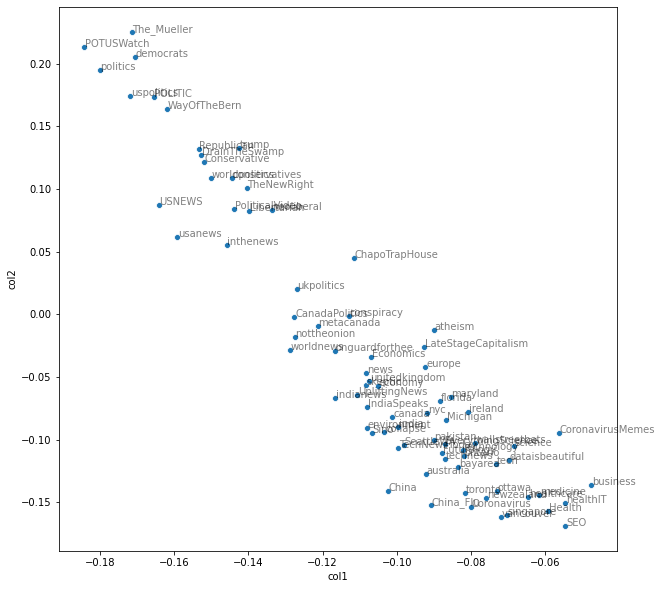

In [115]:
emb_plot(subr_emb_matrix,  plot_path = plot_path , file_name = "subreddits_avg_emb_PCA_labels",
        label_series = selected_subreddits["subreddit"], legend = False, plot_labels= True)

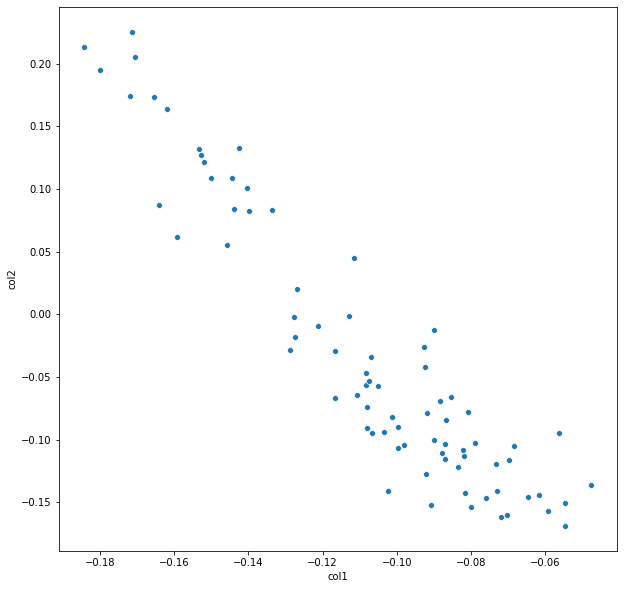

In [116]:
emb_plot(subr_emb_matrix,  plot_path = plot_path , file_name = "subreddits_avg_emb_PCA",
        label_series = selected_subreddits["subreddit"], legend = False, plot_labels= False)

In [117]:
#CONCLUSION: Semantic Space of chosen subreddits is quite bundled
# We have to consider the withing-forum distribution: Words like "cuck" won't be an flag in some forums

In [118]:
#----------------------------#
# 4.) PCA on submission of specific subreddits
#----------------------------#

In [126]:
subs_grouped = selected_subreddits.merge(S.groupby(["subr_id"]).size().reset_index(), how = "inner", 
                          left_on = "subr_id", right_on = "subr_id")
subs_grouped.columns = ["subreddit","keep","category","language","subscribers_K",
                       "avg_ncomments","perc_removed","04-11","04-12","04-13","total",
                      "total7d","new","subr_id", "submission_count"]
subs_grouped[["subreddit","submission_count"]]
#Lets compare TrueReddit Something that may not be political at all with, Positive_News

,subreddit,submission_count
0,Michigan,765
1,PoliticalVideo,1046
2,The_Mueller,2173
3,bayarea,1358
4,conservatives,1537
...,...,...
73,vancouver,4522
74,wallstreetbets,11478
75,worldnews,34506
76,worldpolitics,12165


In [127]:
test_subr_id = selected_subreddits.loc[selected_subreddits["subreddit"]== "Coronavirus", "subr_id"].tolist()[0]
print(test_subr_id)
test_subr_posts = S.loc[S["subr_id"] == test_subr_id,]
test_post_list = test_subr_posts["id"].tolist()
test_post_embs = get_subreddit_embeddings(test_subr_posts)

t5_2x4yx


In [129]:
#WARNING: müsste es nicht post_list = subr_posts["id"].tolist() sein,
# und nicht post_list = subr_posts["subr_id"].tolist() ?
# Ja aber ist egal
def subreddit_emb_matrix_get(sub_name):   
    # extract data structures
    subr_id = selected_subreddits.loc[selected_subreddits["subreddit"]== sub_name, "subr_id"].tolist()[0]
    subr_posts = S.loc[S["subr_id"] == subr_id,]
    #post_list = subr_posts["id"].tolist()
    post_embs = get_subreddit_embeddings(subr_posts)
    # get folded matrix
    emb_matrix = np.append(post_embs[0], post_embs[1],axis=0)
    for i in range(2,len(post_embs)):
        emb_matrix = np.append(emb_matrix, post_embs[i],axis=0)
    return(emb_matrix,subr_posts)

In [143]:
del pn_embs

In [144]:
conservative_embs, conservative_posts = subreddit_emb_matrix_get("conservatives")
conservative_embs = np.transpose(conservative_embs)
conservative_embs.shape

(512, 1537)

In [131]:
corona_embs, corona_posts = subreddit_emb_matrix_get("Coronavirus")
corona_embs = np.transpose(corona_embs)
corona_embs.shape

(512, 5641)

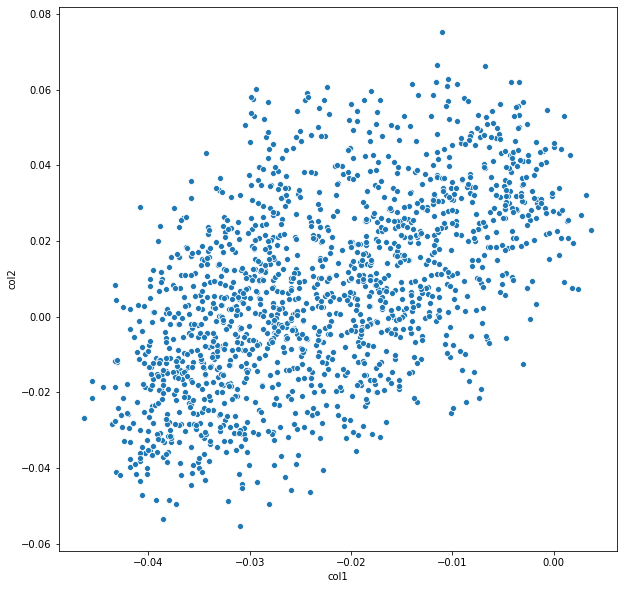

In [133]:
emb_plot(conservative_embs,  plot_path = plot_path , file_name = "Submissions_conservatives_PCA",
        label_series = conservative_posts["id"], legend = False, plot_labels=False)

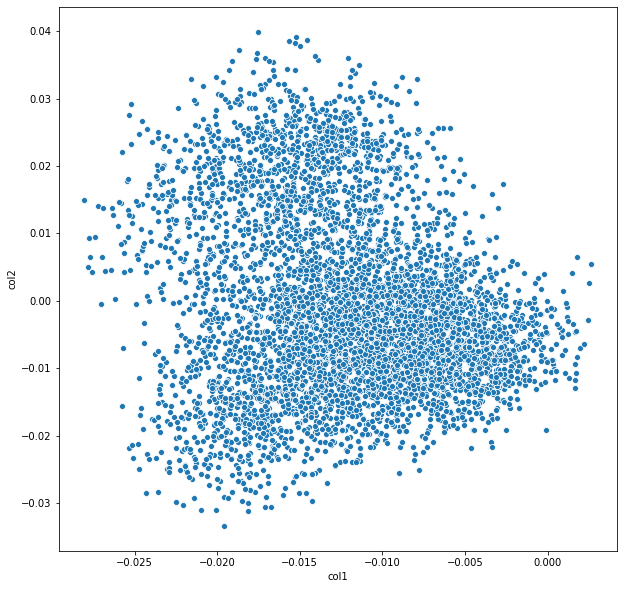

In [134]:
emb_plot(corona_embs,  plot_path = plot_path , file_name = "Submissions_Corona_PCA",
        label_series = corona_posts["id"], legend = False, plot_labels= False)

In [42]:
# Explore
#Some more Outise ones
pd.options.display.max_colwidth = 100
print(pn_posts.loc[pn_posts["id"] == "t3_fhtf74","title"].to_string())
print(pn_posts.loc[pn_posts["id"] == "t3_fjubib","title"].to_string())

17172    Meet Parimala Raman, Mathematician & Fellow of All 3 Indian Academies of Science! - “Math has th...
17205    What the West Can Learn From Africa’s Ebola Response


In [43]:
#Some more typical ones
print(pn_posts.loc[pn_posts["id"] == "t3_fgj954","title"].to_string())
print(pn_posts.loc[pn_posts["id"] == "t3_fhtymf","title"].to_string())

17155    Moss-growing concrete that absorbs CO2!
17175    Protecting mangroves can prevent billions of dollars in global flooding damage every year


In [44]:
#----------------------------#
# 5.) Multidimensional Scaling Tryout
#----------------------------#
# thx to https://scikit-learn.org/stable/modules/generated/sklearn.manifold.MDS.html

In [135]:
from sklearn.manifold import MDS
MDS_embedding = MDS(n_components=2)

In [136]:
MDS_embedding

MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=True,
    n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)

In [137]:
pn_embs.shape

(512, 1537)

In [138]:
conservative_embs_transformed = MDS_embedding.fit_transform(conservative_embs.T)

In [139]:
# This is what goes into the function
conservative_embs_transformed.shape

(1537, 2)

In [140]:
conservative_embs.shape

(512, 1537)

In [141]:
test = PCA(n_components=2).fit(conservative_embs)
test.components_.shape

(2, 1537)

In [142]:
# THis is what goes into the function
test.components_.T.shape

(1537, 2)

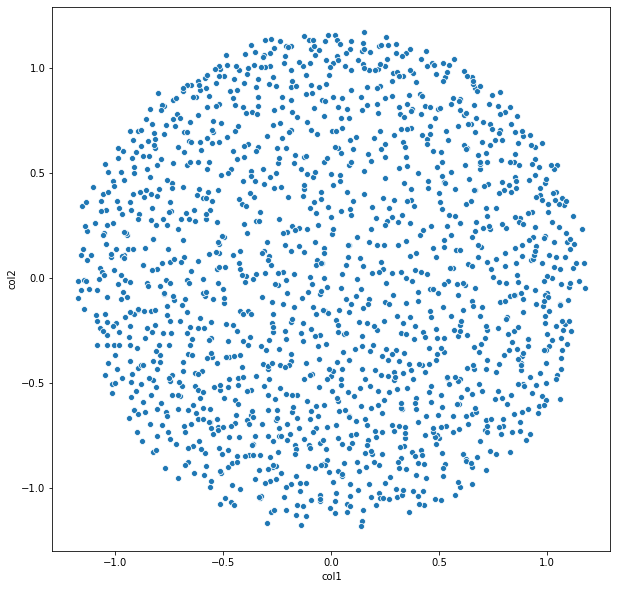

In [146]:
emb_plot(conservative_embs,  plot_path = plot_path , file_name = "Conservative_PCA",
        label_series = conservative_posts["id"], legend = False, plot_labels= False, MDS = True)

In [ ]:
#CONCLUSION: MDS gives worse almost random results.
# Not here anymore but it once crashed my computer

In [56]:
#----------------------------#
# 6.) Vlads subreddits check
#----------------------------#

In [57]:
vlad_subreddits = pd.read_csv(data_path + "subreddits - 2020-04-15.csv")
vlad_subreddits

,subreddit,keep,category,language,subscribers_K,avg_ncomments,perc_removed,04-11,04-12,04-13,total,total7d,new
0,Coronavirus,True,coronavirus,en,1933,69.7,65.6,1331,807,555,1725.6,1146.0,0
1,AutoNewspaper,False,bot_news,en,9,0.0,0.0,1016,678,511,924.0,972.9,1
2,newsbotbot,False,bot_news,en,3,0.0,0.0,775,511,511,849.9,827.3,1
3,worldnews,True,generic_news,en,23704,57.6,83.3,521,406,295,533.1,493.6,1
4,news,True,generic_news,en,20363,599.4,98.4,537,342,260,498.0,459.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
141,trashy,False,entertainment,en,1969,51.1,43.9,12,2,3,10.1,6.3,1
142,CoronavirusWA,True,coronavirus,en,14,23.1,16.9,5,4,0,14.3,6.1,1
143,SeattleWA,True,local,en,118,27.0,6.0,4,2,3,10.8,4.3,1
144,sports,False,entertainment,en,16911,26.5,51.8,3,4,0,10.5,4.0,1


In [58]:
subs_grouped = vlad_subreddits.groupby(["category","keep"]).size().reset_index()
subs_grouped

,category,keep,0
0,bot_news,False,3
1,business_economics,False,7
2,coronavirus,False,4
3,coronavirus,True,22
4,entertainment,False,20
5,generic,False,3
6,generic_news,False,4
7,generic_news,True,6
8,generic_politics,False,1
9,generic_politics,True,4


In [59]:
# GENERAL: 
# 1.) Extract more subs (with SVD approach?)
# 2.) Given this table is complete: +technology, + generic, +ideological
# 3.) Why almost no ideological? It can't be size,atheism, Chapotraphous,  Conservative 
# and (especially!!!)conspiracy would be awesome.
# Especiall conspiracy coupled with networks would be so awesome. 
# I can also try sampling. So we have one more machine
# 4.)

In [60]:
vlad_subreddits.loc[vlad_subreddits["category"]=="ideological",]

,subreddit,keep,category,language,subscribers_K,avg_ncomments,perc_removed,04-11,04-12,04-13,total,total7d,new
11,conspiracy,False,ideological,en,1169,33.3,36.9,128,79,38,74.5,104.1,1
15,Conservative,False,ideological,en,320,21.6,45.1,88,52,49,71.5,86.6,1
43,Libertarian,False,ideological,en,375,36.8,14.4,24,12,11,24.7,25.7,1
45,WayOfTheBern,False,ideological,en,77,11.2,6.2,22,28,6,31.7,23.6,1
54,Donald_Trump,False,ideological,en,9,1.8,2.5,18,2,9,24.2,20.9,1
55,trump,False,ideological,en,38,15.3,32.9,13,13,10,25.2,20.9,1
56,POTUSWatch,False,ideological,en,16,3.4,71.4,26,11,14,23.0,20.7,1
60,badgovnofreedom,False,ideological,en,4,0.2,79.8,15,6,9,15.5,19.9,1
66,DrainTheSwamp,False,ideological,en,16,5.2,26.7,16,11,12,20.5,19.1,1
73,Trumpvirus,False,ideological,en,2,3.5,2.3,20,19,5,4.6,17.0,1


In [61]:
#----------------------------#
# Appendix 1: SVD/ PCA tests and sources
#----------------------------#
# https://docs.scipy.org/doc/numpy/reference/generated/numpy.linalg.svd.html

In [62]:
#Intro
a = np.random.randn(9, 6) + 1j*np.random.randn(9, 6)
b = np.random.randn(2, 7, 8, 3) + 1j*np.random.randn(2, 7, 8, 3)

In [63]:
u, s, vh = np.linalg.svd(a, full_matrices=True)
u.shape, s.shape, vh.shape

((9, 9), (6,), (6, 6))

In [64]:
 u, s, vh = np.linalg.svd(a, full_matrices=False)
u.shape, s.shape, vh.shape
((9, 6), (6,), (6, 6))

((9, 6), (6,), (6, 6))

In [65]:
# Intro 2:
# thx a bunch to https://towardsdatascience.com/entity-embedding-using-pca-and-kernel-pca-798b8b2e8c2f

In [66]:
import numpy as np
import pandas as pd
np.set_printoptions(linewidth=200)
random_data = np.random.random((1000,7))
#The next line makes weekend much more likely
random_data *= np.array([1,1,1,1,1,6,6]).reshape(1, -1) * random_data
one_hot_encoded = (random_data == random_data.max(axis=1).reshape(-1, 1)).astype('int')
one_hot_encoded.sum(axis=0)

array([ 25,  18,  24,  27,  26, 427, 453])

In [67]:
one_hot_encoded

array([[0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1]])

In [68]:
one_hot_encoded.shape

(1000, 7)

In [69]:
from sklearn.decomposition import PCA
model = PCA(n_components=2).fit(one_hot_encoded)

In [70]:
model

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

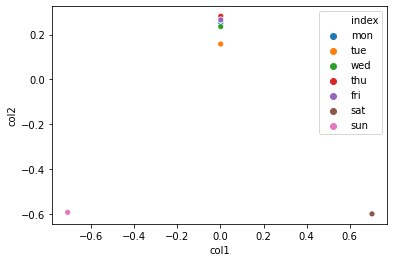

In [71]:
%matplotlib inline
import seaborn as sns
category_vectors = model.components_.T
category_vector_frame=pd.DataFrame(category_vectors, index=['mon', 'tue', 'wed', 'thu', 'fri', 'sat', 'sun'], 
                                   columns=['col1', 'col2']).reset_index()
sns.scatterplot(data=category_vector_frame, x='col1', y='col2', hue='index');

In [72]:
category_vectors

array([[ 0.00125966,  0.25000341],
       [ 0.0008919 ,  0.1576668 ],
       [ 0.00120636,  0.23524252],
       [ 0.00136702,  0.28139317],
       [ 0.00131321,  0.2653741 ],
       [ 0.70407863, -0.598421  ],
       [-0.71011679, -0.591259  ]])

In [73]:
category_vector_frame

,index,col1,col2
0,mon,0.001260,0.250003
1,tue,0.000892,0.157667
2,wed,0.001206,0.235243
3,thu,0.001367,0.281393
4,fri,0.001313,0.265374
5,sat,0.704079,-0.598421
6,sun,-0.710117,-0.591259


In [74]:
#----------------------------#
# 5.) Vlads subreddit
#----------------------------#

In [75]:
vlad_subreddits = pd.read_csv(data_path + "subreddits - 2020-04-15.csv")
vlad_subreddits

,subreddit,keep,category,language,subscribers_K,avg_ncomments,perc_removed,04-11,04-12,04-13,total,total7d,new
0,Coronavirus,True,coronavirus,en,1933,69.7,65.6,1331,807,555,1725.6,1146.0,0
1,AutoNewspaper,False,bot_news,en,9,0.0,0.0,1016,678,511,924.0,972.9,1
2,newsbotbot,False,bot_news,en,3,0.0,0.0,775,511,511,849.9,827.3,1
3,worldnews,True,generic_news,en,23704,57.6,83.3,521,406,295,533.1,493.6,1
4,news,True,generic_news,en,20363,599.4,98.4,537,342,260,498.0,459.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
141,trashy,False,entertainment,en,1969,51.1,43.9,12,2,3,10.1,6.3,1
142,CoronavirusWA,True,coronavirus,en,14,23.1,16.9,5,4,0,14.3,6.1,1
143,SeattleWA,True,local,en,118,27.0,6.0,4,2,3,10.8,4.3,1
144,sports,False,entertainment,en,16911,26.5,51.8,3,4,0,10.5,4.0,1


In [76]:
subs_grouped = vlad_subreddits.groupby(["category","keep"]).size().reset_index()
subs_grouped

,category,keep,0
0,bot_news,False,3
1,business_economics,False,7
2,coronavirus,False,4
3,coronavirus,True,22
4,entertainment,False,20
5,generic,False,3
6,generic_news,False,4
7,generic_news,True,6
8,generic_politics,False,1
9,generic_politics,True,4


In [77]:
# GENERAL: 
# 1.) Extract more subs (with SVD approach?)
# 2.) Given this table is complete: +technology, + generic, +ideological
# 3.) Why almost no ideological? It can't be size,atheism, Chapotraphous,  Conservative 
# and (especially!!!)conspiracy would be awesome.
# Especiall conspiracy coupled with networks would be so awesome. 
# I can also try sampling. So we have one more machine
# 4.)

In [78]:
vlad_subreddits.loc[vlad_subreddits["category"]=="ideological",]

,subreddit,keep,category,language,subscribers_K,avg_ncomments,perc_removed,04-11,04-12,04-13,total,total7d,new
11,conspiracy,False,ideological,en,1169,33.3,36.9,128,79,38,74.5,104.1,1
15,Conservative,False,ideological,en,320,21.6,45.1,88,52,49,71.5,86.6,1
43,Libertarian,False,ideological,en,375,36.8,14.4,24,12,11,24.7,25.7,1
45,WayOfTheBern,False,ideological,en,77,11.2,6.2,22,28,6,31.7,23.6,1
54,Donald_Trump,False,ideological,en,9,1.8,2.5,18,2,9,24.2,20.9,1
55,trump,False,ideological,en,38,15.3,32.9,13,13,10,25.2,20.9,1
56,POTUSWatch,False,ideological,en,16,3.4,71.4,26,11,14,23.0,20.7,1
60,badgovnofreedom,False,ideological,en,4,0.2,79.8,15,6,9,15.5,19.9,1
66,DrainTheSwamp,False,ideological,en,16,5.2,26.7,16,11,12,20.5,19.1,1
73,Trumpvirus,False,ideological,en,2,3.5,2.3,20,19,5,4.6,17.0,1
